In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Flatten, LSTM
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Conv2D, Conv3D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import regularizers
from tensorflow.keras.losses import categorical_crossentropy
from tensorflow.keras.losses import binary_crossentropy
from sklearn.metrics import f1_score
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import cross_val_score
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras import backend as K
from keras.callbacks import EarlyStopping
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image 
import seaborn as sns
import os
import re
import glob
import cv2
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels
from sklearn.model_selection import StratifiedKFold
from sklearn import preprocessing
import tqdm
from numpy import loadtxt
from os import *
from sklearn.utils import class_weight


Using TensorFlow backend.


In [2]:
def atoi(text):
    return int(text) if text.isdigit() else text
def natural_keys(text):
    return [atoi(c) for c in re.split('(\d+)', text)]

In [3]:
def draw_confusion_matrix(true,preds):
    conf_matx = confusion_matrix(true, preds)
    sns.heatmap(conf_matx, annot=True,annot_kws={"size": 12},fmt='g', cbar=False, cmap=plt.cm.Blues) #'viridis'
    #plt.savefig('/home/jovyan/conf_matrix.png')
    plt.show()
    
    return conf_matx

In [4]:
def plot_history(model_history, model_name):
    fig = plt.figure(figsize=(15,5), facecolor='w')
    ax = fig.add_subplot(121)
    ax.plot(model_history.history['loss'])
    ax.plot(model_history.history['val_loss'])
    ax.set(title=model_name + ': Model loss', ylabel='Loss', xlabel='Epoch')
    ax.legend(['Train', 'Val'], loc='upper left')
    ax = fig.add_subplot(122)
    ax.plot(model_history.history['accuracy'])
    ax.plot(model_history.history['val_accuracy'])
    ax.set(title=model_name + ': Model Accuracy; test='+ str(np.round(model_history.history['val_accuracy'][-1], 3)),
           ylabel='Accuracy', xlabel='Epoch')
    ax.legend(['Train', 'Val'], loc='upper left')
    #plt.savefig('/home/jovyan/curve.png')
    plt.show()
    
    return fig

In [5]:
def resize(x):
    rescaled = []

    for i in x:

        scale_percent = 140 # percent of original size
        width = int(i.shape[1] / (scale_percent / 100))
        height = int(i.shape[0] / (scale_percent / 100))
        dim = (width, height)
        resized = cv2.resize(i, dim, interpolation = cv2.INTER_LANCZOS4)
        rescaled.append(resized)

    x_orig = np.reshape( rescaled, (len( rescaled), resized.shape[1], resized.shape[1], 3))

    return x_orig

In [6]:
def loadImages(path_data):
    
    p = '/home/jovyan/DATA_MASTER_PROJECT/IMG_A549_high_con/'
    
    
    
    pa_adr = p + 'ADR_cropped/'
    
    pa_control = p + 'CONTROL_cropped/'
    
    pa_hrh = p + 'HRH_cropped/'
    
    pa_dmso = p + 'DMSO_cropped/'
    
    image_list = []
    
    
       


    for filename in sorted(path_data, key=natural_keys): 
        
        if 'adr' in filename:
            
            im=cv2.imread(pa_adr + filename)

            imarray = np.array(im)
            

            image_list.append(imarray)
        
            
        if 'hrh' in filename:
            
            im=cv2.imread(pa_hrh + filename)

            imarray = np.array(im)
            

            image_list.append(imarray)
            
        if 'dmso' in filename:
            
            im=cv2.imread(pa_dmso + filename)

            imarray = np.array(im)
            

            image_list.append(imarray)



    x_orig = np.reshape(image_list, (len(image_list), 90, 90, 3))

    return x_orig

In [7]:
def return_count(x):
    name_wel = []
    for i in sorted(x, key = natural_keys):
        name_wel.append(i.split('_')[0])

    z = sorted(list(set(name_wel)))
    r = list(range(len(z)))

    num = []
    for iz in range(len(z)):
        count = 0
        for i in sorted(x, key=natural_keys):
            if z[iz] in i:
                count += 1
        num.append(count)
    return list(zip(z, r, num))

In [8]:
def loadImages_LSTM(path_data,len_t_points):
    

    feat_list = []


    for filename in sorted(glob.glob(path_data), key=natural_keys): 
        feat_list.append(np.load(filename))

    x_orig = np.reshape(feat_list, (len(feat_list),len_t_points, 64))

    return x_orig 

In [9]:
def make_labels(data_set):
    fe = return_count(data_set)
    leb = creat_label(fe)
    y = np.array(list(leb))
    return y
    

In [10]:
def make_labels_LSTM(data_set):
    fe = return_count_LSTM(data_set)
    leb = creat_label(fe)
    y = np.array(list(leb))
    return y
    

In [11]:
def return_count_LSTM(x):
    name_wel = []
    for _,_,i in os.walk(x):
        for f in i:
            name_wel.append(f.split('_')[2])

    z = sorted(list(set(name_wel)), key=natural_keys)
    r = list(range(len(z)))

    num = []
    for iz in range(len(z)):
        count = 0
        for i in sorted(name_wel, key=natural_keys):
            if z[iz] in i:
                count += 1
        num.append(count)
    return list(zip(z, r, num))

In [12]:
def creat_label(y):
    labels = []
    for ix, _ in enumerate(y):
        
        if y[ix][0] == 'adr':
        
            labels.append([[y[ix][0],0]] * y[ix][2])
        
        if y[ix][0] == 'hrh':
            
            labels.append([[y[ix][0],1]] * y[ix][2])
        
            
        if y[ix][0] == 'dmso':
            
            labels.append([[y[ix][0],2]] * y[ix][2])
    
    ler = [i for sub in labels for i in sub ]
    
    _, lab= zip(*ler)

    
    return lab

In [13]:
def time_step_acc(tes_data, x):

    results = []            

    x_test = loadImages(tes_data)
    y_test = make_labels(tes_data)
    
    y_test_1 = keras.utils.to_categorical(y_test,num_classes=3)
    
    x_test = resize(x_test)
    x_test = preprocess_input(x_test)

    scores = x.evaluate(x_test, y_test_1, verbose = 1)
    results.append(scores[1]*100)
    
    test_preds = m4.predict(x_test)

    preds_df = pd.DataFrame(test_preds)
    predicted_labels = preds_df.idxmax(axis=1)
    draw_confusion_matrix(y_test, predicted_labels)

    return results

In [14]:
def cv_mean_acc(result_cv, string_well):
    
    l_drug = string_well*3

    acc_mean_cv = []

    for i in result_cv:
        acc_mean_cv.append(np.mean(i))
        
    cv_drug = list(zip(acc_mean_cv, l_drug))
    
    res = sorted(cv_drug, key = lambda x: x[1])
    a , b = zip(*res)
    
    a = list(a)
    
    s = list(np.array_split(a, len(string_well)))
    
    cv_score_acc = []
    
    for ix, i in enumerate(s):
        s1 = list(s[ix])
        
        cv_score_acc.append(np.mean(s1))
        
    return list(zip(cv_score_acc, string_well))

In [15]:
# DATA FOR LSTM PART

p_feat = '/home/jovyan/DATA_MASTER_PROJECT/LSTM/FEAT_FOLDERS/'
train_data = p_feat + 'features_train/*.npy'
val_data = p_feat + 'features_validation/*.npy'
tes_data= p_feat + 'features_test/*.npy'

y_tra_path = '/home/jovyan/DATA_MASTER_PROJECT/LSTM/FEAT_FOLDERS/features_train/'
y_tes_path = '/home/jovyan/DATA_MASTER_PROJECT/LSTM/FEAT_FOLDERS/features_test/'
y_val_path = '/home/jovyan/DATA_MASTER_PROJECT/LSTM/FEAT_FOLDERS/features_validation/'

In [16]:
met = ['F10']
mid = ['D5']
oxy = ['F6']
nap = ['B3']
dip = ['F2']
met_1 = ['B7']
lab = ['D10']
car = ['G2']
mep = ['B11']
nef = ['C10']
tri = ['B2']
dox = ['F8']


cycl = ['C4']
dime =  ['F7']
cypr  = ['G9']
lora = [ 'E5']
doxy = ['D4']
oloa = ['E2']
hydr = ['F5']
orph = ['E7']
cinn = ['B10']
desl = ['F3']
chlo =  ['D2']
trim = ['E9']
mian= ['E8']
fexo= ['B5']
chlo_1 = ['E3']
trip= ['C5']
desi= ['E4']
levo= ['C3']
diphe_1= ['C7']
diphe_2= ['F11']
emed= ['G6']
ceti= ['D11']
trip_1= ['F9']
doxe=['C2']
chlo_2= ['D6']
flun = ['C9']
keto= ['D7']

In [17]:
tot_results_accuracy = []

results_lstm = []

In [18]:
tot_well_adr = [met,mid,oxy,nap,dip,met_1,lab,car,mep,nef,tri,dox]
tot_well_hrh = [cycl, dime, cypr,lora,doxy,oloa,cinn,desl,chlo,trim,mian,fexo,chlo_1,trip,desi,levo,
                
                diphe_1,diphe_2,emed,ceti,trip_1,doxe,chlo_2,flun,keto]

string_well_adr = ['met', 'mid', 'oxy', 'nap', 'dip','met_1','lab','car','mep','nef','tri','dox']
string_well_hrh = ['cycl', 'dime', 'cypr', 'lora', 'doxy','oloa','cinn','desl','chlo','trim','mian','fexo','chlo_1','trip','desi',
                  'levo','diphe_1','diphe_2','emed','ceti','trip_1','doxe','chlo_2','flun','keto']


In [19]:
tot_well = []
string_well = [] 

In [20]:
a = 'HRH' # FOR TEST SET
b = 'ADR' # FOR REST
c = 'DMSO'

if a == 'HRH':
    tot_well = tot_well_hrh
    string_well = string_well_hrh
    
if a == 'ADR':
    tot_well = tot_well_adr
    string_well = string_well_adr
    

In [21]:
rand = list(np.random.randint(1,1000,3))

0it [00:00, ?it/s]
100%|██████████| 3/3 [00:06<00:00,  2.11s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 281.095703125 steps, validate for 73.875 steps
Epoch 1/300
282/281 [==============================] - 33s 119ms/step - loss: 0.9509 - accuracy: 0.5604 - val_loss: 0.9921 - val_accuracy: 0.5465
Epoch 2/300
282/281 [==============================] - 29s 102ms/step - loss: 0.8853 - accuracy: 0.5923 - val_loss: 1.0138 - val_accuracy: 0.5400
Epoch 3/300
282/281 [==============================] - 29s 101ms/step - loss: 0.8541 - accuracy: 0.6087 - val_loss: 1.0526 - val_accuracy: 0.5239
Epoch 4/300
282/281 [==============================] - 29s 101ms/step - loss: 0.8294 - accuracy: 0.6231 - val_loss: 1.0703 - val_accuracy: 0.5177
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 281.095703125 steps, validate for 73.875 steps
Epoch 1/300
282/281 [==============================] - 71s 253ms/step - loss: 0.7924 - accuracy: 0.6452 - val_loss: 1.1723 - val_accuracy: 0

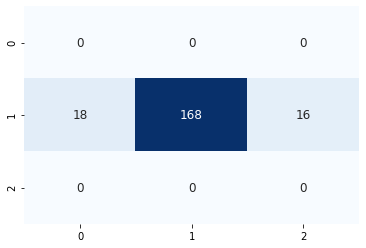

196/196 [==============================] - 0s 569us/sample - loss: 0.5146 - accuracy: 0.8367


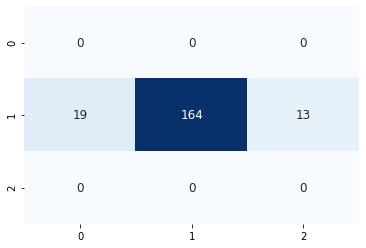

193/193 [==============================] - 0s 564us/sample - loss: 0.5398 - accuracy: 0.7876


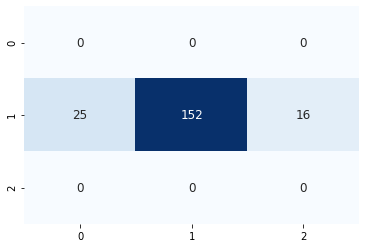

190/190 [==============================] - 0s 754us/sample - loss: 0.5442 - accuracy: 0.8053


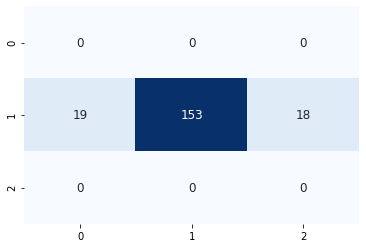

190/190 [==============================] - 0s 264us/sample - loss: 0.5563 - accuracy: 0.7579


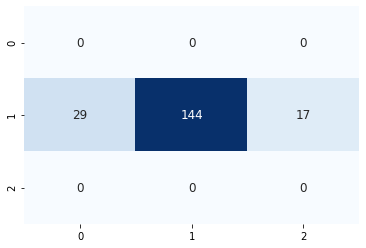

187/187 [==============================] - 0s 766us/sample - loss: 0.6012 - accuracy: 0.7487


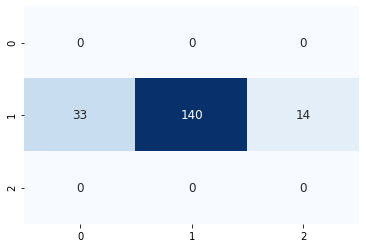

184/184 [==============================] - 0s 748us/sample - loss: 0.5560 - accuracy: 0.8207


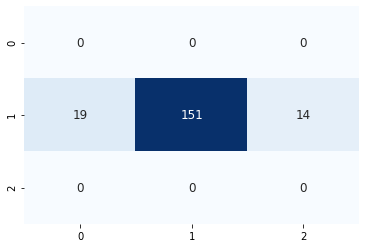

183/183 [==============================] - 0s 764us/sample - loss: 0.6000 - accuracy: 0.7486


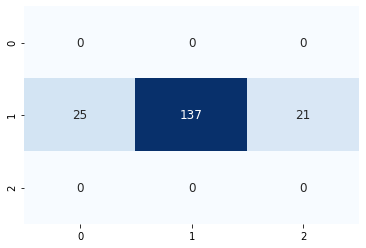

182/182 [==============================] - 0s 806us/sample - loss: 0.5708 - accuracy: 0.7857


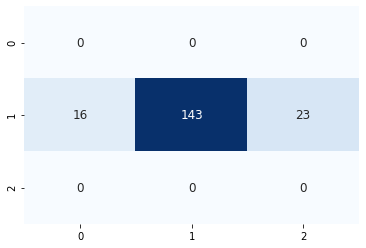

181/181 [==============================] - 0s 758us/sample - loss: 0.5245 - accuracy: 0.8177


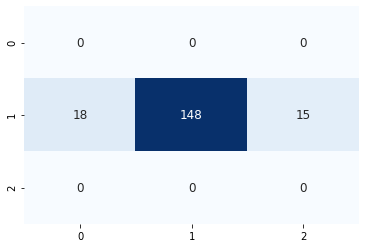

177/177 [==============================] - 0s 780us/sample - loss: 0.5772 - accuracy: 0.7853


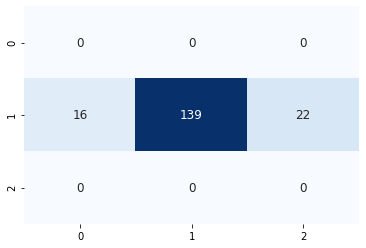

178/178 [==============================] - 0s 767us/sample - loss: 0.6212 - accuracy: 0.7303


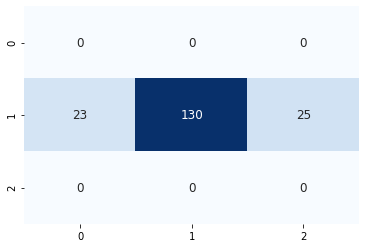

178/178 [==============================] - 0s 279us/sample - loss: 0.5419 - accuracy: 0.7697


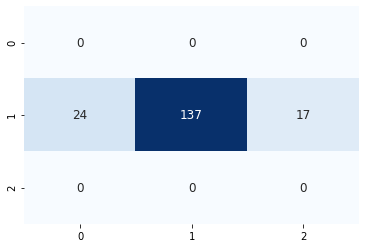

176/176 [==============================] - 0s 654us/sample - loss: 0.5317 - accuracy: 0.7898


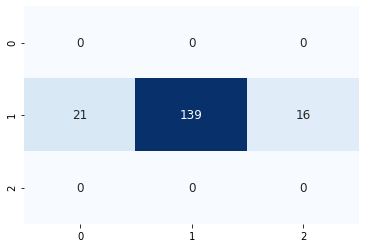

175/175 [==============================] - 0s 706us/sample - loss: 0.5212 - accuracy: 0.7829


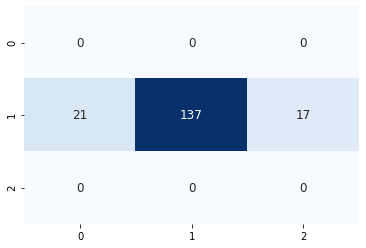

176/176 [==============================] - 0s 237us/sample - loss: 0.5018 - accuracy: 0.8239


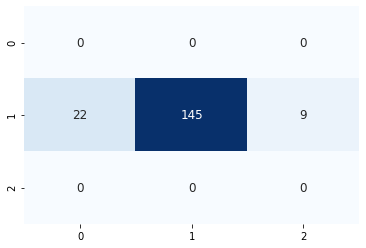

173/173 [==============================] - 0s 698us/sample - loss: 0.5305 - accuracy: 0.8266


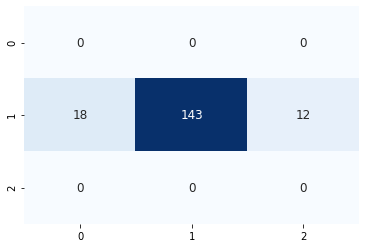

172/172 [==============================] - 0s 738us/sample - loss: 0.5252 - accuracy: 0.8140


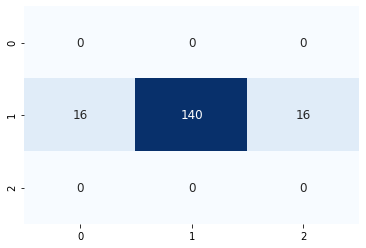

171/171 [==============================] - 0s 757us/sample - loss: 0.5400 - accuracy: 0.7895


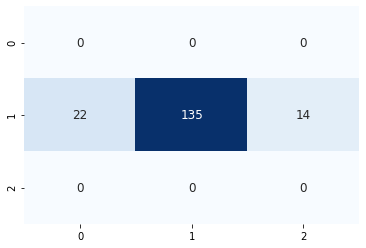

171/171 [==============================] - 0s 248us/sample - loss: 0.5219 - accuracy: 0.7953


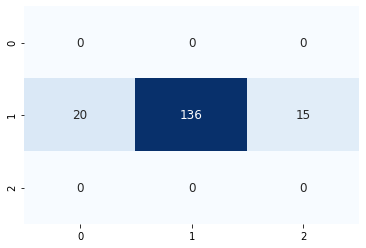

171/171 [==============================] - 0s 268us/sample - loss: 0.4913 - accuracy: 0.8304


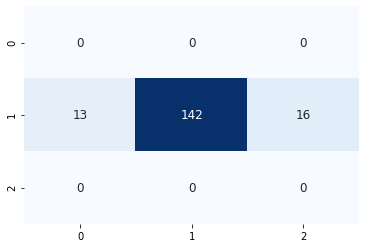

170/170 [==============================] - 0s 236us/sample - loss: 0.5626 - accuracy: 0.7706


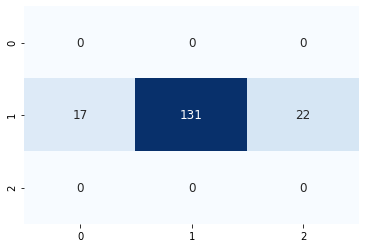

171/171 [==============================] - 0s 232us/sample - loss: 0.4622 - accuracy: 0.8596


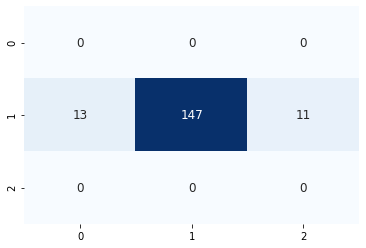

170/170 [==============================] - 0s 225us/sample - loss: 0.5016 - accuracy: 0.8235


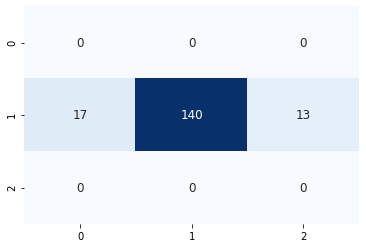

170/170 [==============================] - 0s 256us/sample - loss: 0.5161 - accuracy: 0.7882


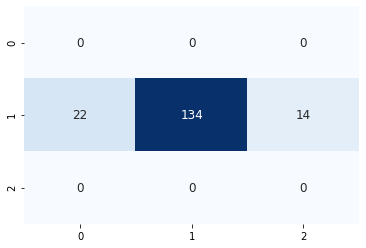

171/171 [==============================] - 0s 255us/sample - loss: 0.5468 - accuracy: 0.7661


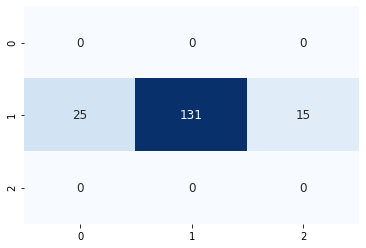

168/168 [==============================] - 0s 722us/sample - loss: 0.5659 - accuracy: 0.7560


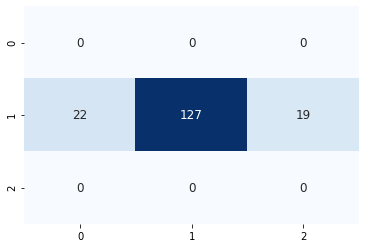

169/169 [==============================] - 0s 726us/sample - loss: 0.5227 - accuracy: 0.8047


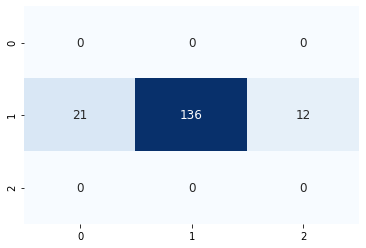

169/169 [==============================] - 0s 278us/sample - loss: 0.5391 - accuracy: 0.8047


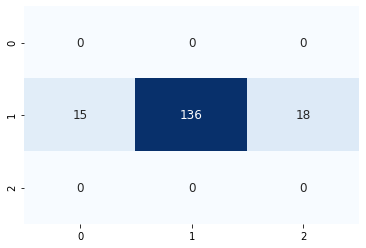

167/167 [==============================] - 0s 727us/sample - loss: 0.6155 - accuracy: 0.7545


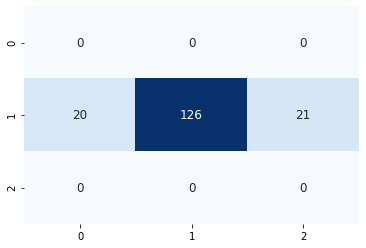

168/168 [==============================] - 0s 243us/sample - loss: 0.5735 - accuracy: 0.7440


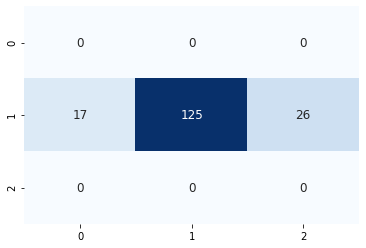

169/169 [==============================] - 0s 233us/sample - loss: 0.5816 - accuracy: 0.7515


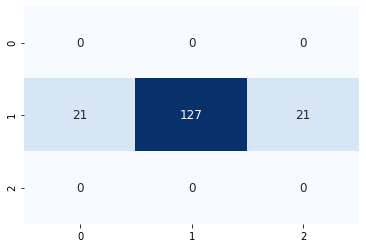

166/166 [==============================] - 0s 736us/sample - loss: 0.6711 - accuracy: 0.7530


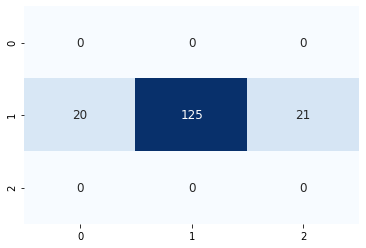

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3837 samples, validate on 993 samples
Epoch 1/300
3837/3837 [==============================] - 3s 682us/sample - loss: 0.9761 - accuracy: 0.5270 - val_loss: 1.0364 - val_accuracy: 0.4914
Epoch 2/300
3837/3837 [==============================] - 1s 212us/sample - loss: 0.8193 - accuracy: 0.6445 - val_loss: 1.0385 - val_accuracy: 0.5086
Epoch 3/300
3837/3837 [==============================] - 1s 209us/sample - loss: 0.7241 - accuracy: 0.6891 - val_loss: 1.0587 - val_accuracy: 0.5146
Epoch 4/300
3837/3837 [==============================] - 1s 221us/sample - loss: 0.6346 - accuracy: 0.7396 - val_loss: 1.0974 - val_accuracy: 0.5045
Epoch 00004: early stopping
159/159 [==============================] - 0s 188us/sample - loss: 0.5318 - accuracy: 0.8553


1it [28:28, 1708.51s/it]
100%|██████████| 3/3 [00:06<00:00,  2.05s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 281.869140625 steps, validate for 74.76953125 steps
Epoch 1/300
282/281 [==============================] - 31s 109ms/step - loss: 0.9438 - accuracy: 0.5597 - val_loss: 0.9938 - val_accuracy: 0.5414
Epoch 2/300
282/281 [==============================] - 28s 100ms/step - loss: 0.8809 - accuracy: 0.5941 - val_loss: 1.0027 - val_accuracy: 0.5446
Epoch 3/300
282/281 [==============================] - 29s 102ms/step - loss: 0.8510 - accuracy: 0.6108 - val_loss: 1.0142 - val_accuracy: 0.5456
Epoch 4/300
282/281 [==============================] - 29s 102ms/step - loss: 0.8262 - accuracy: 0.6247 - val_loss: 1.0595 - val_accuracy: 0.5189
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 281.869140625 steps, validate for 74.76953125 steps
Epoch 1/300
282/281 [==============================] - 71s 253ms/step - loss: 0.7888 - accuracy: 0.6451 - val_loss: 1.3902 - val_a

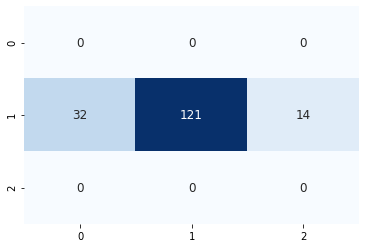

164/164 [==============================] - 0s 241us/sample - loss: 0.7168 - accuracy: 0.6951


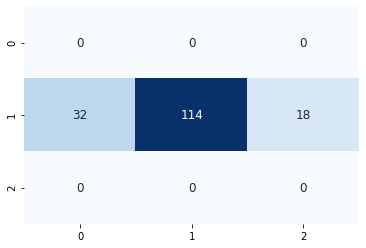

162/162 [==============================] - 0s 712us/sample - loss: 0.7355 - accuracy: 0.6605


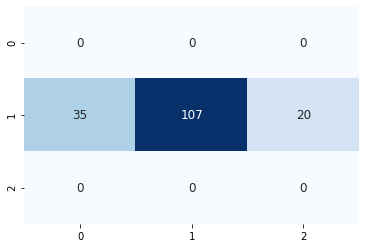

162/162 [==============================] - 0s 271us/sample - loss: 0.7599 - accuracy: 0.6728


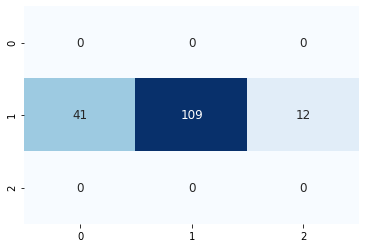

162/162 [==============================] - 0s 238us/sample - loss: 0.8033 - accuracy: 0.6235


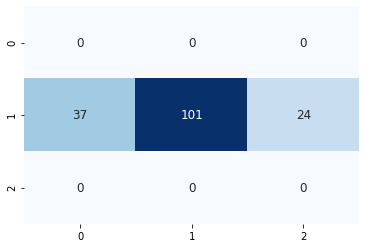

161/161 [==============================] - 0s 249us/sample - loss: 0.7298 - accuracy: 0.6894


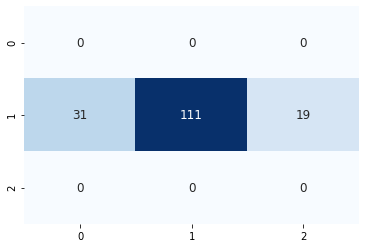

162/162 [==============================] - 0s 246us/sample - loss: 0.7104 - accuracy: 0.6790


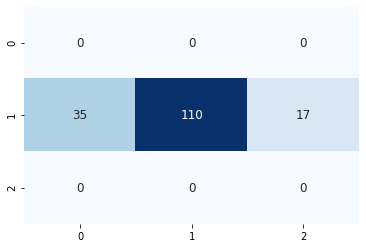

162/162 [==============================] - 0s 258us/sample - loss: 0.7922 - accuracy: 0.6111


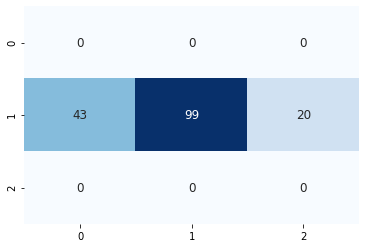

157/157 [==============================] - 0s 1ms/sample - loss: 0.7643 - accuracy: 0.6178


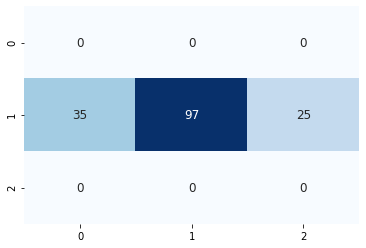

158/158 [==============================] - 0s 274us/sample - loss: 0.7759 - accuracy: 0.6646


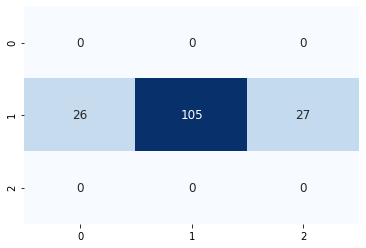

157/157 [==============================] - 0s 279us/sample - loss: 0.6953 - accuracy: 0.6815


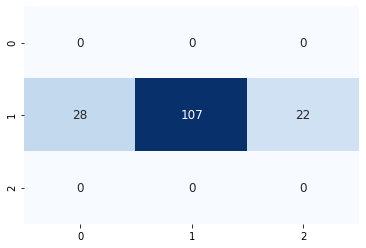

157/157 [==============================] - 0s 291us/sample - loss: 0.7951 - accuracy: 0.6115


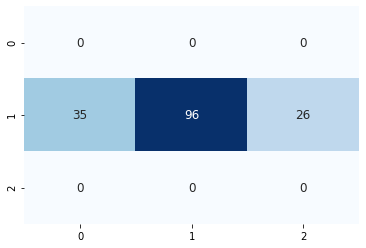

157/157 [==============================] - 0s 243us/sample - loss: 0.7792 - accuracy: 0.6433


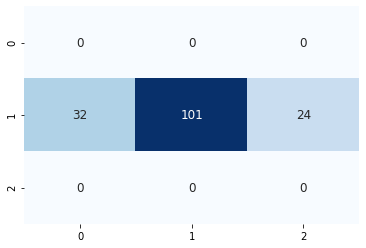

155/155 [==============================] - 0s 232us/sample - loss: 0.8572 - accuracy: 0.6258


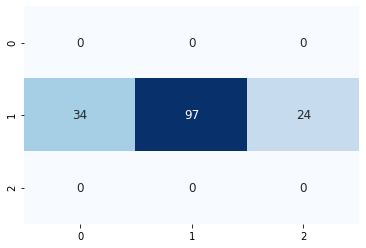

152/152 [==============================] - 0s 235us/sample - loss: 0.8293 - accuracy: 0.5921


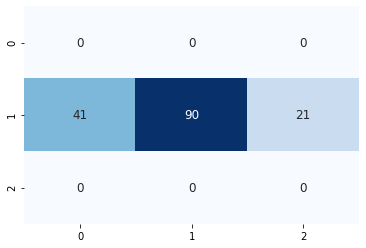

153/153 [==============================] - 0s 965us/sample - loss: 0.7902 - accuracy: 0.6209


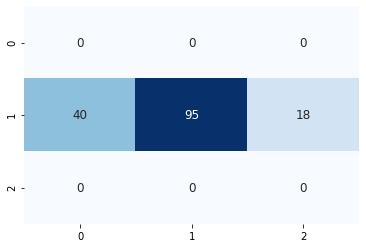

150/150 [==============================] - 0s 277us/sample - loss: 0.8714 - accuracy: 0.5800


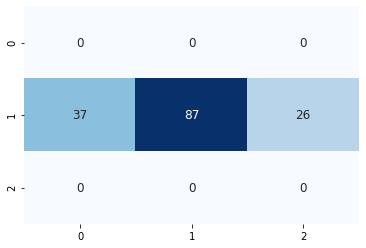

149/149 [==============================] - 0s 253us/sample - loss: 0.8759 - accuracy: 0.6242


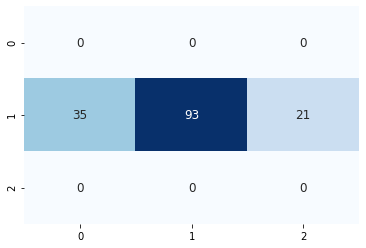

147/147 [==============================] - 0s 807us/sample - loss: 0.8517 - accuracy: 0.5442


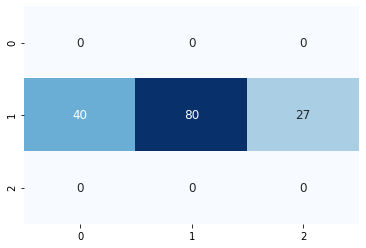

147/147 [==============================] - 0s 267us/sample - loss: 0.8685 - accuracy: 0.5782


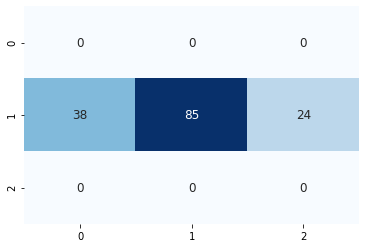

146/146 [==============================] - 0s 284us/sample - loss: 0.9024 - accuracy: 0.5548


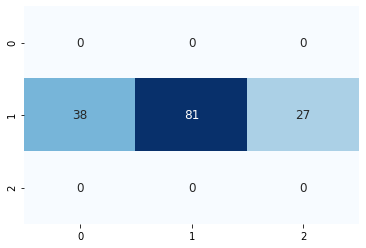

145/145 [==============================] - 0s 249us/sample - loss: 0.8670 - accuracy: 0.6552


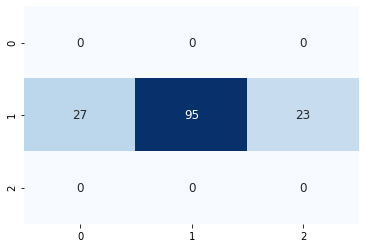

145/145 [==============================] - 0s 240us/sample - loss: 0.9687 - accuracy: 0.5241


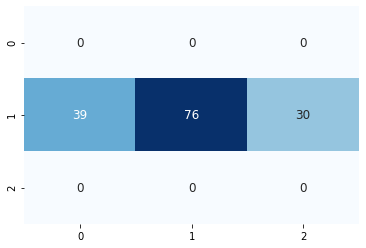

144/144 [==============================] - 0s 254us/sample - loss: 0.9026 - accuracy: 0.5486


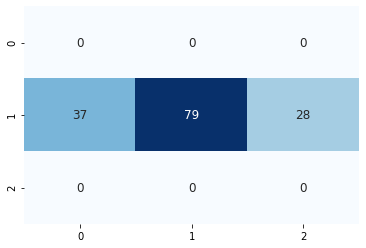

141/141 [==============================] - 0s 288us/sample - loss: 0.9723 - accuracy: 0.5390


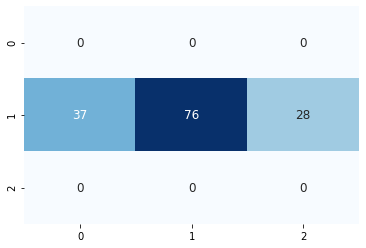

140/140 [==============================] - 0s 244us/sample - loss: 1.0396 - accuracy: 0.5000


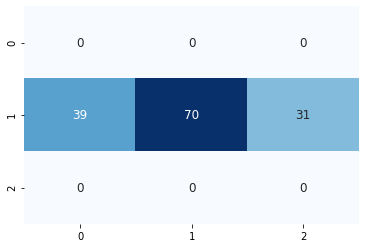

140/140 [==============================] - 0s 251us/sample - loss: 0.9206 - accuracy: 0.5786


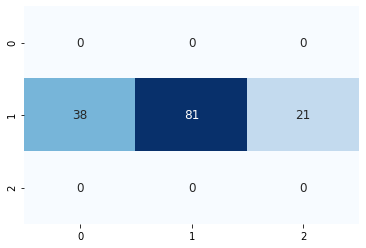

140/140 [==============================] - 0s 244us/sample - loss: 0.9738 - accuracy: 0.5500


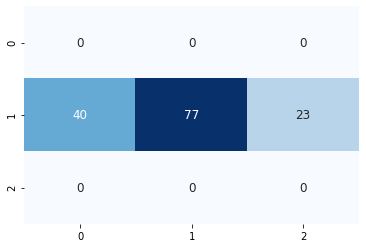

140/140 [==============================] - 0s 251us/sample - loss: 1.0333 - accuracy: 0.5286


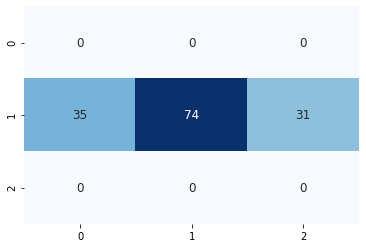

140/140 [==============================] - 0s 259us/sample - loss: 1.0336 - accuracy: 0.5286


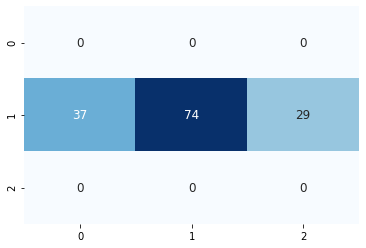

141/141 [==============================] - 0s 278us/sample - loss: 0.9129 - accuracy: 0.6170


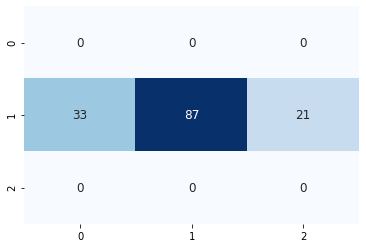

139/139 [==============================] - 0s 270us/sample - loss: 0.8963 - accuracy: 0.5396


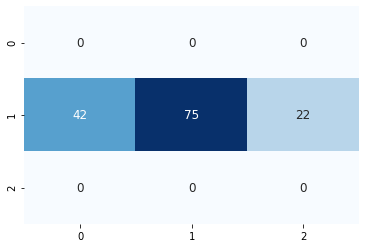

138/138 [==============================] - 0s 234us/sample - loss: 0.9003 - accuracy: 0.5580


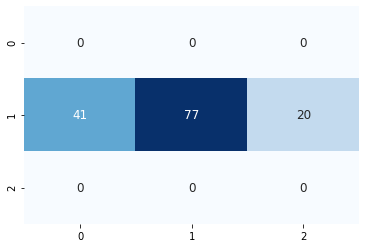

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3850 samples, validate on 1005 samples
Epoch 1/300
3850/3850 [==============================] - 3s 724us/sample - loss: 0.9366 - accuracy: 0.5597 - val_loss: 1.0075 - val_accuracy: 0.5403
Epoch 2/300
3850/3850 [==============================] - 1s 212us/sample - loss: 0.7846 - accuracy: 0.6545 - val_loss: 1.0227 - val_accuracy: 0.5284
Epoch 3/300
3850/3850 [==============================] - 1s 218us/sample - loss: 0.6770 - accuracy: 0.7179 - val_loss: 1.0634 - val_accuracy: 0.5254
Epoch 4/300
3850/3850 [==============================] - 1s 237us/sample - loss: 0.5644 - accuracy: 0.7862 - val_loss: 1.1319 - val_accuracy: 0.5124
Epoch 00004: early stopping
134/134 [==============================] - 0s 154us/sample - loss: 0.6569 - accuracy: 0.6642


2it [1:00:35, 1774.12s/it]
100%|██████████| 3/3 [00:06<00:00,  2.05s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.181640625 steps, validate for 75.533203125 steps
Epoch 1/300
286/285 [==============================] - 31s 107ms/step - loss: 0.9518 - accuracy: 0.5564 - val_loss: 0.9794 - val_accuracy: 0.5568
Epoch 2/300
286/285 [==============================] - 29s 101ms/step - loss: 0.8777 - accuracy: 0.5989 - val_loss: 1.0063 - val_accuracy: 0.5409
Epoch 3/300
286/285 [==============================] - 29s 101ms/step - loss: 0.8465 - accuracy: 0.6148 - val_loss: 1.0375 - val_accuracy: 0.5397
Epoch 4/300
286/285 [==============================] - 29s 100ms/step - loss: 0.8220 - accuracy: 0.6277 - val_loss: 1.0730 - val_accuracy: 0.5351
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.181640625 steps, validate for 75.533203125 steps
Epoch 1/300
286/285 [==============================] - 70s 245ms/step - loss: 0.7825 - accuracy: 0.6499 - val_loss: 1.1915 - val

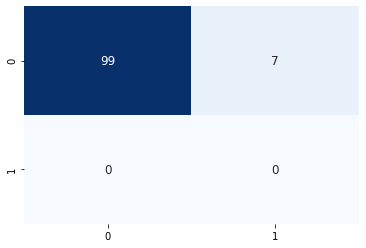

107/107 [==============================] - 0s 316us/sample - loss: 0.2501 - accuracy: 0.9533


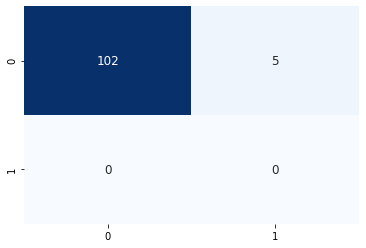

106/106 [==============================] - 0s 273us/sample - loss: 0.2722 - accuracy: 0.9245


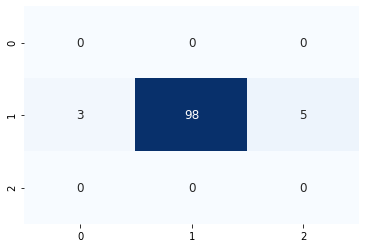

104/104 [==============================] - 0s 270us/sample - loss: 0.3131 - accuracy: 0.9423


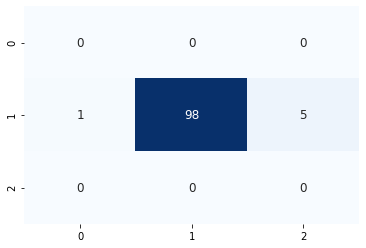

103/103 [==============================] - 0s 258us/sample - loss: 0.3537 - accuracy: 0.9126


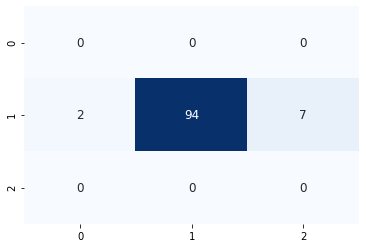

102/102 [==============================] - 0s 255us/sample - loss: 0.3944 - accuracy: 0.9020


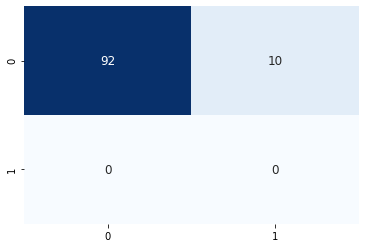

100/100 [==============================] - 0s 331us/sample - loss: 0.4583 - accuracy: 0.9500


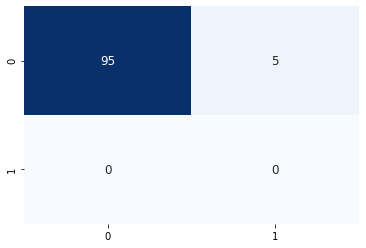

99/99 [==============================] - 0s 1ms/sample - loss: 0.4505 - accuracy: 0.8889


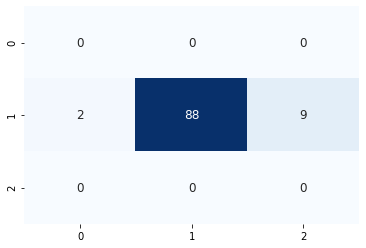

97/97 [==============================] - 0s 290us/sample - loss: 0.4009 - accuracy: 0.8969


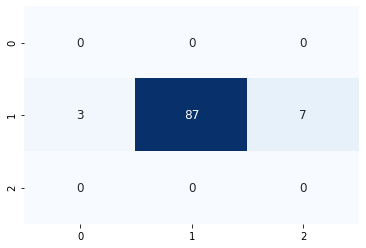

98/98 [==============================] - 0s 298us/sample - loss: 0.4555 - accuracy: 0.8571


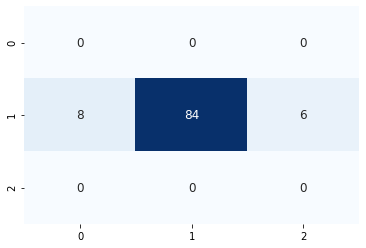

98/98 [==============================] - 0s 286us/sample - loss: 0.4255 - accuracy: 0.8469


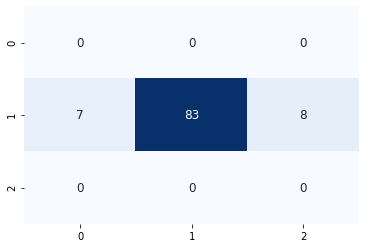

92/92 [==============================] - 0s 1ms/sample - loss: 0.4476 - accuracy: 0.8696


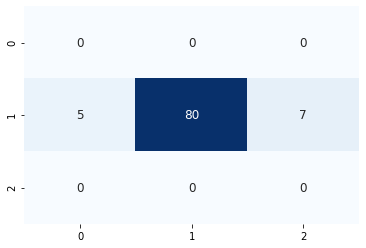

95/95 [==============================] - 0s 1ms/sample - loss: 0.4831 - accuracy: 0.8526


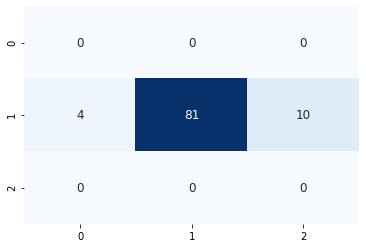

94/94 [==============================] - 0s 234us/sample - loss: 0.5562 - accuracy: 0.7660


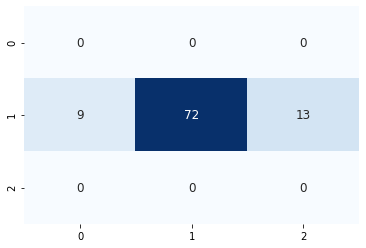

90/90 [==============================] - 0s 1ms/sample - loss: 0.4879 - accuracy: 0.8333


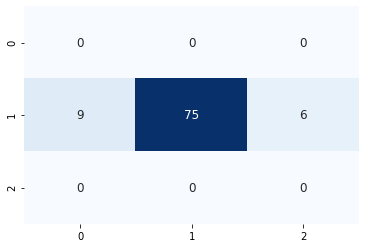

91/91 [==============================] - 0s 325us/sample - loss: 0.5535 - accuracy: 0.7473


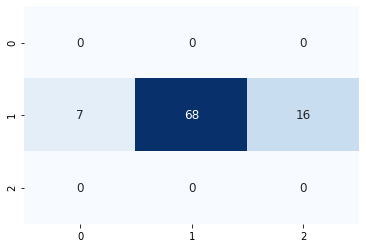

87/87 [==============================] - 0s 270us/sample - loss: 0.4412 - accuracy: 0.8161


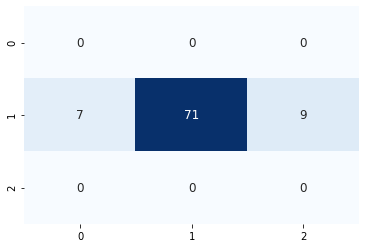

87/87 [==============================] - 0s 243us/sample - loss: 0.5597 - accuracy: 0.8161


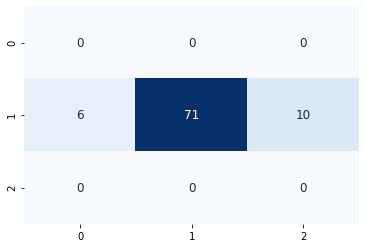

87/87 [==============================] - 0s 265us/sample - loss: 0.5174 - accuracy: 0.7931


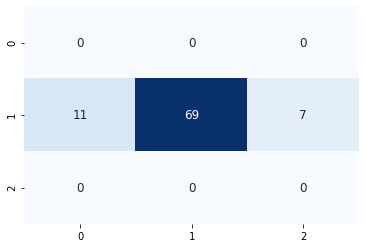

77/77 [==============================] - 0s 281us/sample - loss: 0.5373 - accuracy: 0.7922


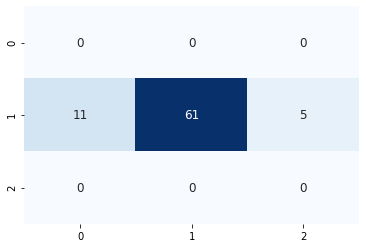

77/77 [==============================] - 0s 323us/sample - loss: 0.5091 - accuracy: 0.7922


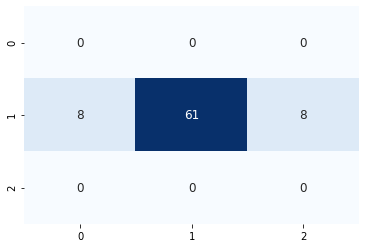

75/75 [==============================] - 0s 313us/sample - loss: 0.5043 - accuracy: 0.8133


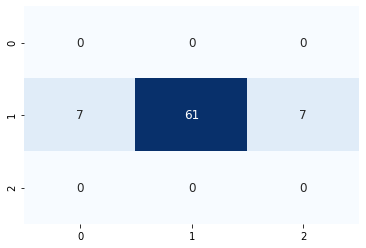

75/75 [==============================] - 0s 293us/sample - loss: 0.5011 - accuracy: 0.8000


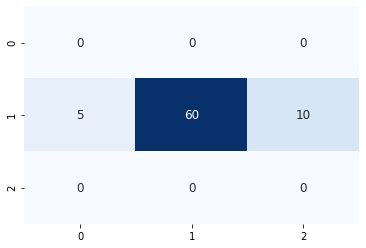

75/75 [==============================] - 0s 298us/sample - loss: 0.5571 - accuracy: 0.8400


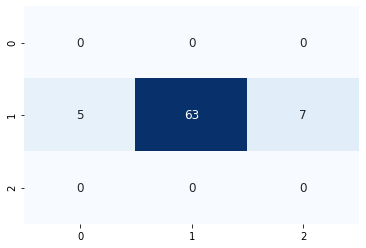

75/75 [==============================] - 0s 287us/sample - loss: 0.6274 - accuracy: 0.8000


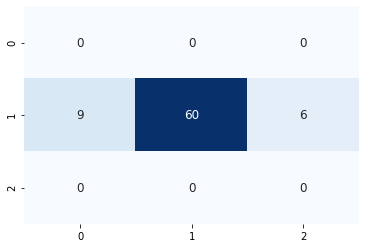

75/75 [==============================] - 0s 259us/sample - loss: 0.6244 - accuracy: 0.8133


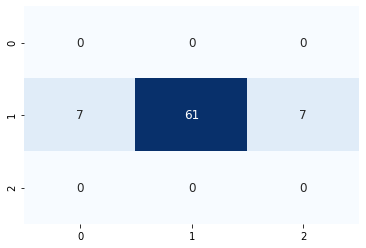

75/75 [==============================] - 0s 305us/sample - loss: 0.5983 - accuracy: 0.7200


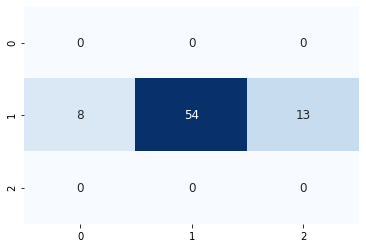

75/75 [==============================] - 0s 312us/sample - loss: 0.5037 - accuracy: 0.8267


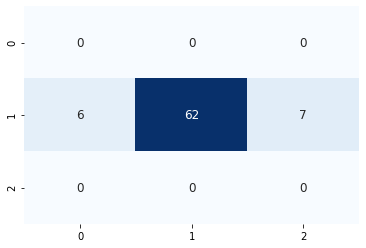

74/74 [==============================] - 0s 301us/sample - loss: 0.5609 - accuracy: 0.7703


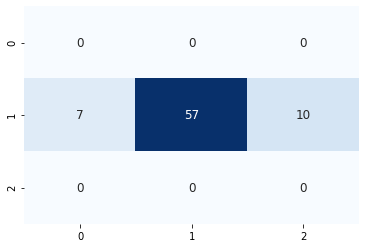

75/75 [==============================] - 0s 310us/sample - loss: 0.5223 - accuracy: 0.7867


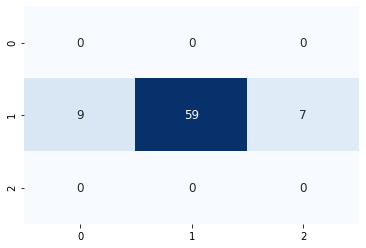

74/74 [==============================] - 0s 503us/sample - loss: 0.4896 - accuracy: 0.8243


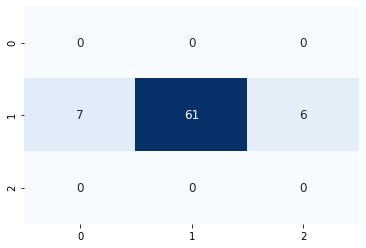

74/74 [==============================] - 0s 300us/sample - loss: 0.3902 - accuracy: 0.8784


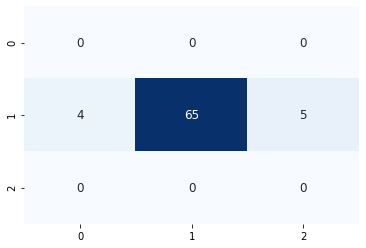

74/74 [==============================] - 0s 284us/sample - loss: 0.5506 - accuracy: 0.7973


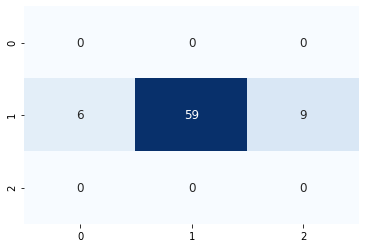

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3905 samples, validate on 1017 samples
Epoch 1/300
3905/3905 [==============================] - 3s 727us/sample - loss: 0.9343 - accuracy: 0.5634 - val_loss: 1.0236 - val_accuracy: 0.5270
Epoch 2/300
3905/3905 [==============================] - 1s 248us/sample - loss: 0.7719 - accuracy: 0.6694 - val_loss: 1.0465 - val_accuracy: 0.5290
Epoch 3/300
3905/3905 [==============================] - 1s 219us/sample - loss: 0.6760 - accuracy: 0.7239 - val_loss: 1.0920 - val_accuracy: 0.5152
Epoch 4/300
3905/3905 [==============================] - 1s 239us/sample - loss: 0.5767 - accuracy: 0.7767 - val_loss: 1.1684 - val_accuracy: 0.5044
Epoch 00004: early stopping
67/67 [==============================] - 0s 199us/sample - loss: 0.7207 - accuracy: 0.7015


3it [1:31:07, 1791.40s/it]
100%|██████████| 3/3 [00:05<00:00,  2.00s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 281.056640625 steps, validate for 73.455078125 steps
Epoch 1/300
282/281 [==============================] - 29s 103ms/step - loss: 0.9495 - accuracy: 0.5566 - val_loss: 0.9912 - val_accuracy: 0.5403
Epoch 2/300
282/281 [==============================] - 28s 100ms/step - loss: 0.8876 - accuracy: 0.5910 - val_loss: 1.0223 - val_accuracy: 0.5270
Epoch 3/300
282/281 [==============================] - 28s 100ms/step - loss: 0.8575 - accuracy: 0.6064 - val_loss: 1.0474 - val_accuracy: 0.5281
Epoch 4/300
282/281 [==============================] - 28s 100ms/step - loss: 0.8325 - accuracy: 0.6202 - val_loss: 1.0692 - val_accuracy: 0.5234
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 281.056640625 steps, validate for 73.455078125 steps
Epoch 1/300
282/281 [==============================] - 69s 246ms/step - loss: 0.7958 - accuracy: 0.6413 - val_loss: 1.2628 - val

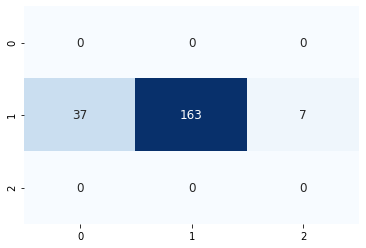

204/204 [==============================] - 0s 248us/sample - loss: 0.5415 - accuracy: 0.7843


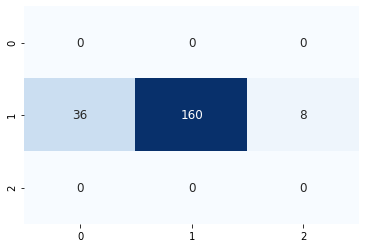

205/205 [==============================] - 0s 244us/sample - loss: 0.4993 - accuracy: 0.8098


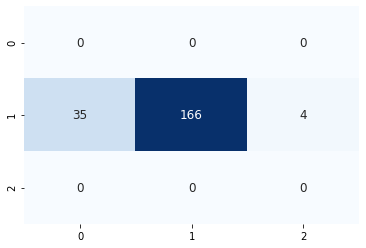

202/202 [==============================] - 0s 228us/sample - loss: 0.4400 - accuracy: 0.8168


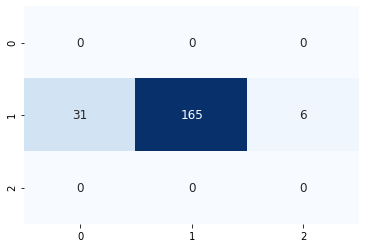

201/201 [==============================] - 0s 247us/sample - loss: 0.5097 - accuracy: 0.7910


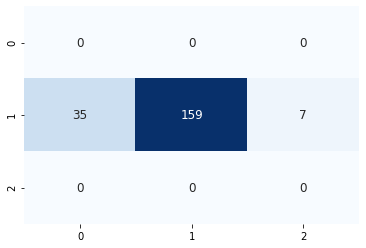

200/200 [==============================] - 0s 243us/sample - loss: 0.4905 - accuracy: 0.8300


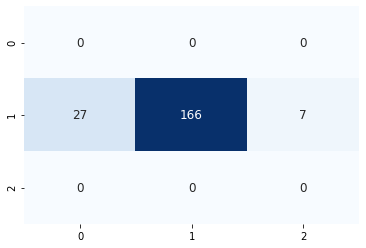

196/196 [==============================] - 0s 244us/sample - loss: 0.4275 - accuracy: 0.8367


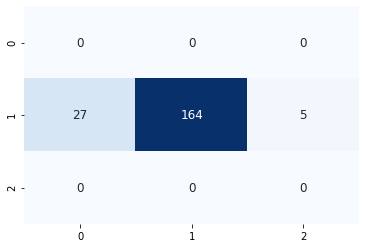

195/195 [==============================] - 0s 269us/sample - loss: 0.4663 - accuracy: 0.8256


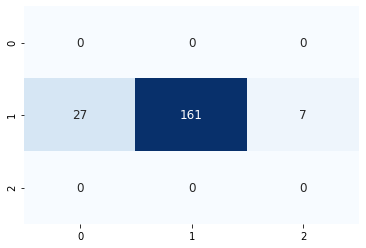

193/193 [==============================] - 0s 304us/sample - loss: 0.4854 - accuracy: 0.8238


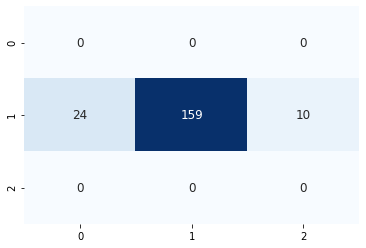

189/189 [==============================] - 0s 253us/sample - loss: 0.4703 - accuracy: 0.8360


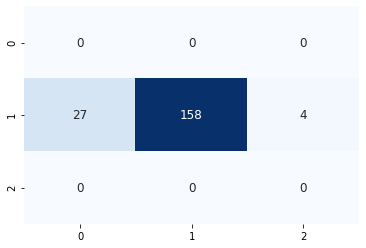

186/186 [==============================] - 0s 236us/sample - loss: 0.4809 - accuracy: 0.8065


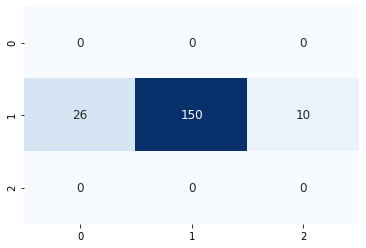

187/187 [==============================] - 0s 261us/sample - loss: 0.5440 - accuracy: 0.7968


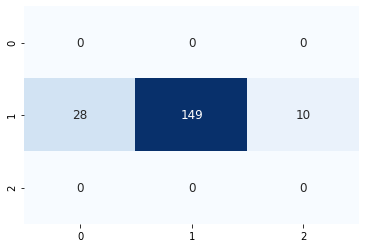

185/185 [==============================] - 0s 271us/sample - loss: 0.5328 - accuracy: 0.7892


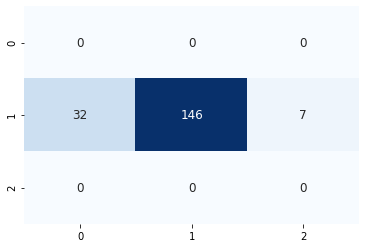

184/184 [==============================] - 0s 260us/sample - loss: 0.5083 - accuracy: 0.8043


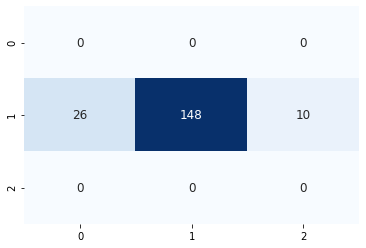

182/182 [==============================] - 0s 269us/sample - loss: 0.5337 - accuracy: 0.8352


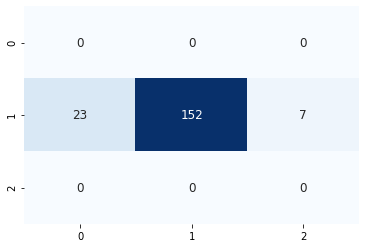

183/183 [==============================] - 0s 252us/sample - loss: 0.5322 - accuracy: 0.7814


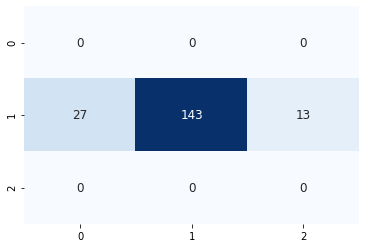

182/182 [==============================] - 0s 253us/sample - loss: 0.6123 - accuracy: 0.7473


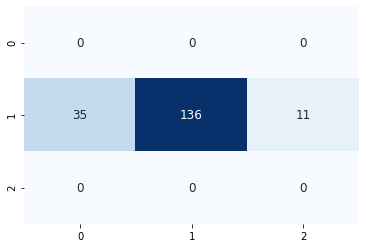

181/181 [==============================] - 0s 271us/sample - loss: 0.5215 - accuracy: 0.8066


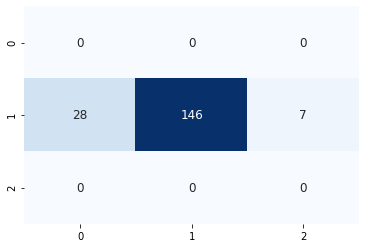

182/182 [==============================] - 0s 241us/sample - loss: 0.5560 - accuracy: 0.7692


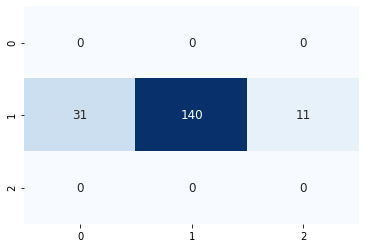

180/180 [==============================] - 0s 798us/sample - loss: 0.5764 - accuracy: 0.7778


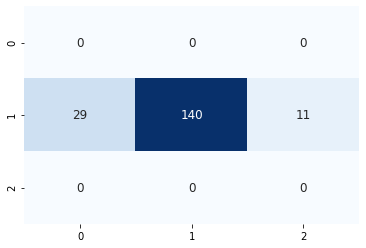

179/179 [==============================] - 0s 245us/sample - loss: 0.5657 - accuracy: 0.7765


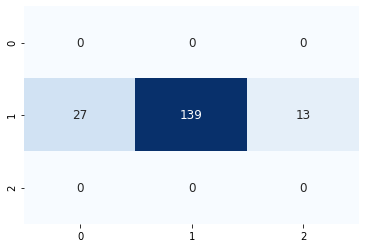

176/176 [==============================] - 0s 268us/sample - loss: 0.5473 - accuracy: 0.7784


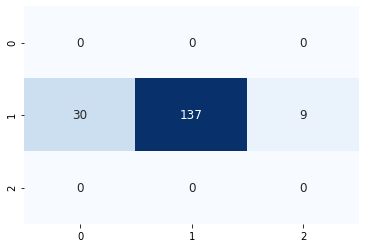

174/174 [==============================] - 0s 782us/sample - loss: 0.5486 - accuracy: 0.8103


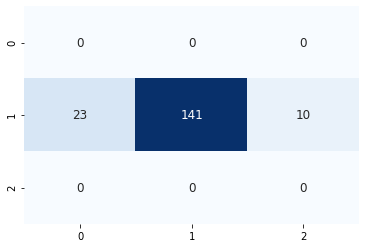

174/174 [==============================] - 0s 247us/sample - loss: 0.5380 - accuracy: 0.7874


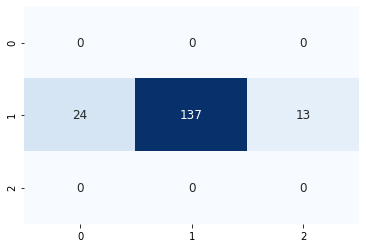

174/174 [==============================] - 0s 267us/sample - loss: 0.5135 - accuracy: 0.8218


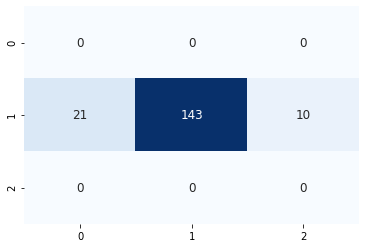

172/172 [==============================] - 0s 223us/sample - loss: 0.5327 - accuracy: 0.8372


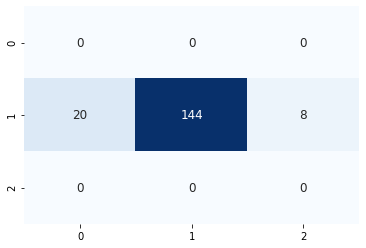

174/174 [==============================] - 0s 276us/sample - loss: 0.5582 - accuracy: 0.7816


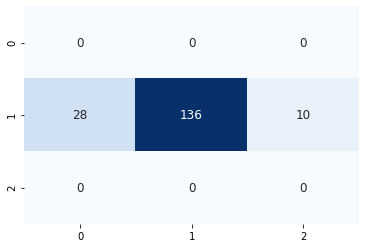

172/172 [==============================] - 0s 250us/sample - loss: 0.5570 - accuracy: 0.8023


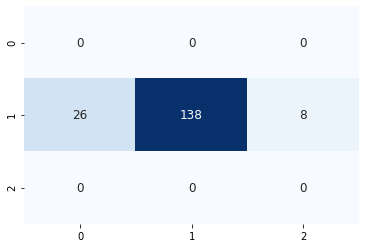

171/171 [==============================] - 0s 270us/sample - loss: 0.5250 - accuracy: 0.7778


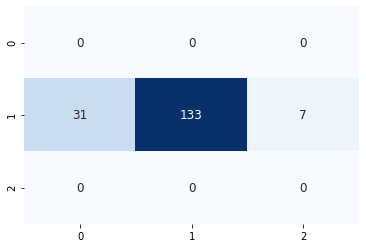

171/171 [==============================] - 0s 229us/sample - loss: 0.5825 - accuracy: 0.7544


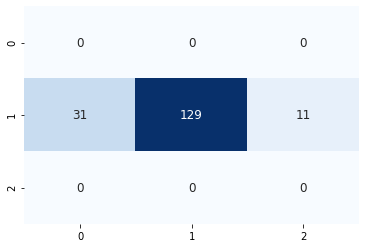

170/170 [==============================] - 0s 238us/sample - loss: 0.5948 - accuracy: 0.7294


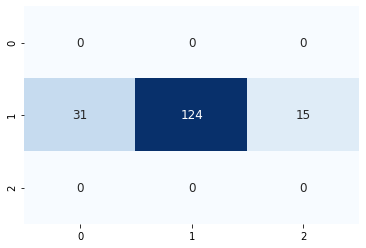

169/169 [==============================] - 0s 233us/sample - loss: 0.5640 - accuracy: 0.7870


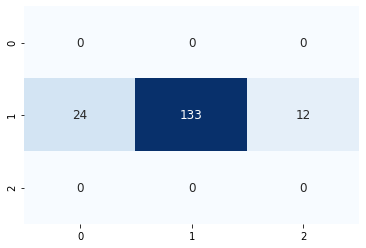

169/169 [==============================] - 0s 284us/sample - loss: 0.5944 - accuracy: 0.7219


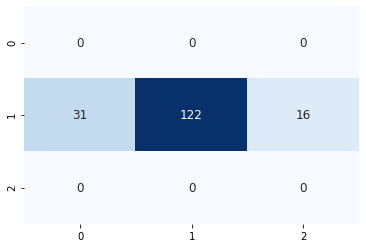

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3838 samples, validate on 989 samples
Epoch 1/300
3838/3838 [==============================] - 3s 671us/sample - loss: 0.9461 - accuracy: 0.5446 - val_loss: 1.0241 - val_accuracy: 0.5066
Epoch 2/300
3838/3838 [==============================] - 1s 220us/sample - loss: 0.7306 - accuracy: 0.7137 - val_loss: 1.0456 - val_accuracy: 0.5147
Epoch 3/300
3838/3838 [==============================] - 1s 209us/sample - loss: 0.5907 - accuracy: 0.7827 - val_loss: 1.1031 - val_accuracy: 0.4954
Epoch 4/300
3838/3838 [==============================] - 1s 216us/sample - loss: 0.4805 - accuracy: 0.8332 - val_loss: 1.1681 - val_accuracy: 0.4874
Epoch 00004: early stopping
162/162 [==============================] - 0s 142us/sample - loss: 0.6225 - accuracy: 0.7531


4it [2:03:27, 1835.96s/it]
100%|██████████| 3/3 [00:06<00:00,  2.02s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.490234375 steps, validate for 75.087890625 steps
Epoch 1/300
284/283 [==============================] - 30s 106ms/step - loss: 0.9582 - accuracy: 0.5540 - val_loss: 0.9964 - val_accuracy: 0.5504
Epoch 2/300
284/283 [==============================] - 28s 100ms/step - loss: 0.8805 - accuracy: 0.5976 - val_loss: 1.0086 - val_accuracy: 0.5436
Epoch 3/300
284/283 [==============================] - 28s 100ms/step - loss: 0.8487 - accuracy: 0.6141 - val_loss: 1.0441 - val_accuracy: 0.5283
Epoch 4/300
284/283 [==============================] - 29s 101ms/step - loss: 0.8218 - accuracy: 0.6288 - val_loss: 1.0745 - val_accuracy: 0.5102
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.490234375 steps, validate for 75.087890625 steps
Epoch 1/300
284/283 [==============================] - 70s 247ms/step - loss: 0.7802 - accuracy: 0.6522 - val_loss: 1.1531 - val

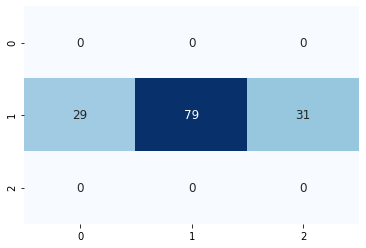

135/135 [==============================] - 0s 295us/sample - loss: 0.8983 - accuracy: 0.5852


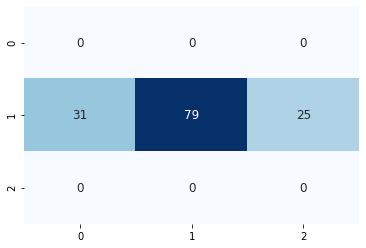

131/131 [==============================] - 0s 243us/sample - loss: 0.8933 - accuracy: 0.6031


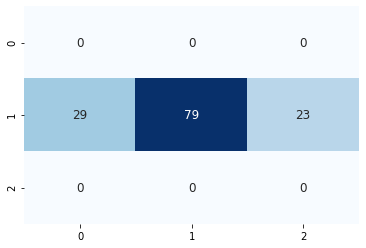

130/130 [==============================] - 0s 288us/sample - loss: 0.9656 - accuracy: 0.5769


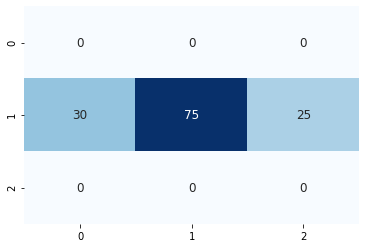

129/129 [==============================] - 0s 266us/sample - loss: 1.0571 - accuracy: 0.5969


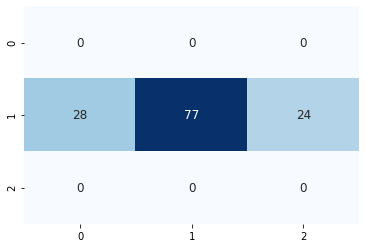

130/130 [==============================] - 0s 271us/sample - loss: 0.9280 - accuracy: 0.6154


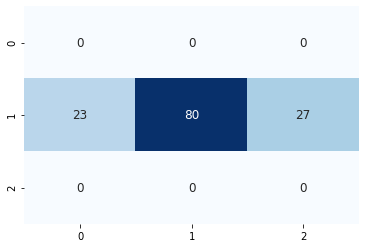

128/128 [==============================] - 0s 2ms/sample - loss: 1.1493 - accuracy: 0.4219


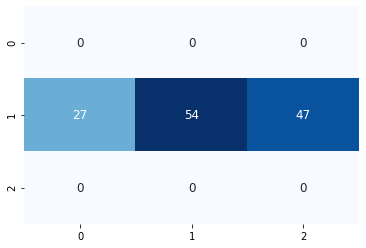

128/128 [==============================] - 0s 259us/sample - loss: 1.0809 - accuracy: 0.5547


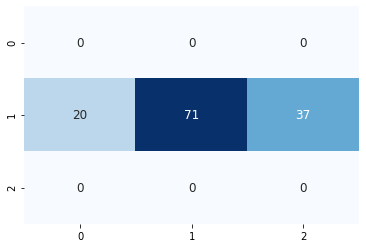

126/126 [==============================] - 0s 286us/sample - loss: 1.0204 - accuracy: 0.5714


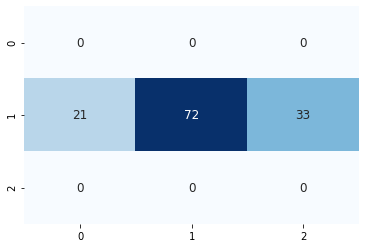

128/128 [==============================] - 0s 264us/sample - loss: 0.9339 - accuracy: 0.5781


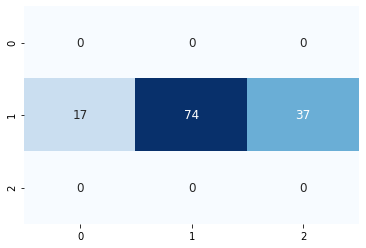

127/127 [==============================] - 0s 299us/sample - loss: 0.9731 - accuracy: 0.5748


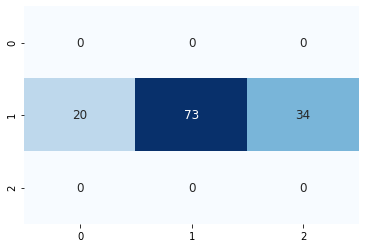

126/126 [==============================] - 0s 271us/sample - loss: 1.1154 - accuracy: 0.5238


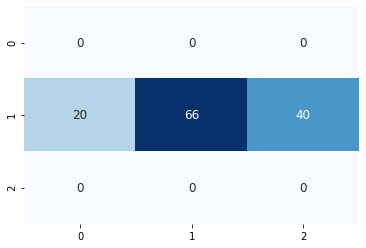

125/125 [==============================] - 0s 267us/sample - loss: 0.9457 - accuracy: 0.6080


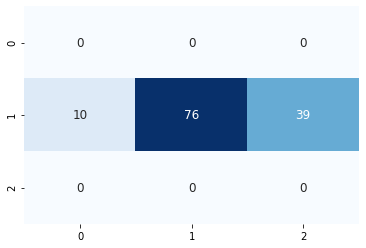

126/126 [==============================] - 0s 295us/sample - loss: 0.9538 - accuracy: 0.5476


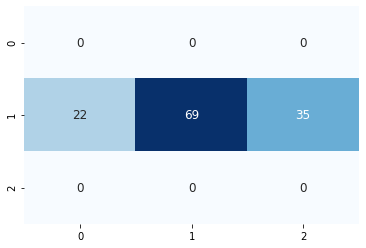

124/124 [==============================] - 0s 349us/sample - loss: 0.9035 - accuracy: 0.5484


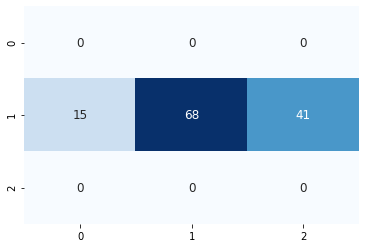

123/123 [==============================] - 0s 314us/sample - loss: 0.9679 - accuracy: 0.5935


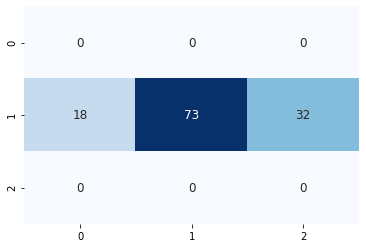

121/121 [==============================] - 0s 265us/sample - loss: 1.0571 - accuracy: 0.5124


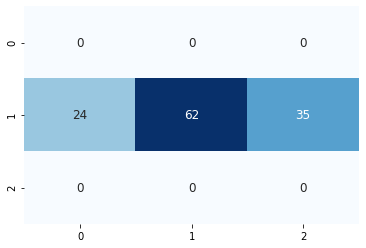

119/119 [==============================] - 0s 264us/sample - loss: 0.8659 - accuracy: 0.5798


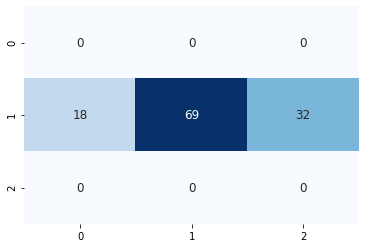

121/121 [==============================] - 0s 261us/sample - loss: 1.0030 - accuracy: 0.5372


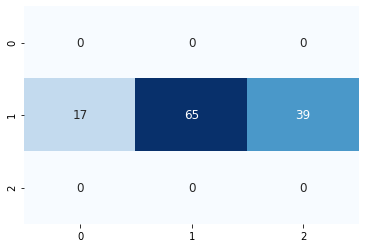

118/118 [==============================] - 0s 258us/sample - loss: 0.9077 - accuracy: 0.5932


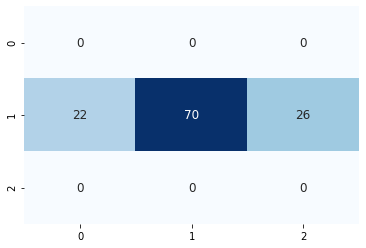

117/117 [==============================] - 0s 296us/sample - loss: 0.9086 - accuracy: 0.5641


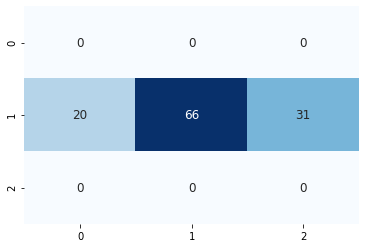

117/117 [==============================] - 0s 276us/sample - loss: 0.9245 - accuracy: 0.5726


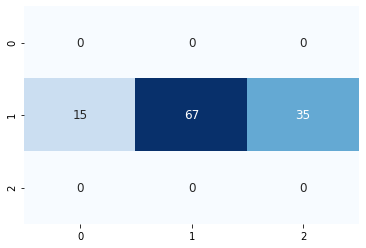

114/114 [==============================] - 0s 284us/sample - loss: 0.8341 - accuracy: 0.6140


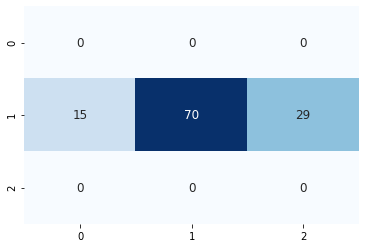

113/113 [==============================] - 0s 294us/sample - loss: 0.8124 - accuracy: 0.6726


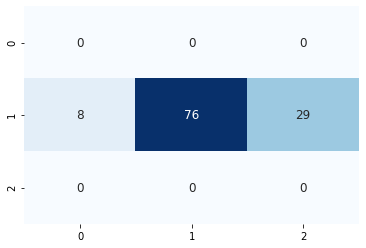

113/113 [==============================] - 0s 301us/sample - loss: 0.8007 - accuracy: 0.6637


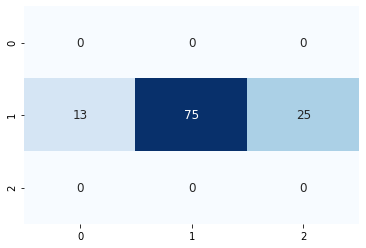

112/112 [==============================] - 0s 301us/sample - loss: 0.8769 - accuracy: 0.6071


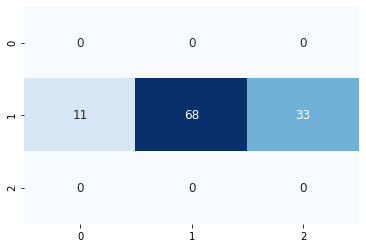

112/112 [==============================] - 0s 314us/sample - loss: 0.7612 - accuracy: 0.6875


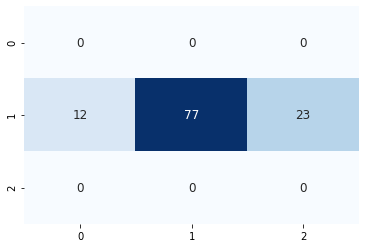

110/110 [==============================] - 0s 345us/sample - loss: 0.8603 - accuracy: 0.6545


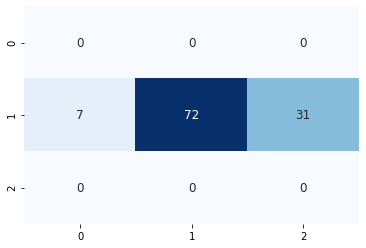

110/110 [==============================] - 0s 274us/sample - loss: 0.9514 - accuracy: 0.6364


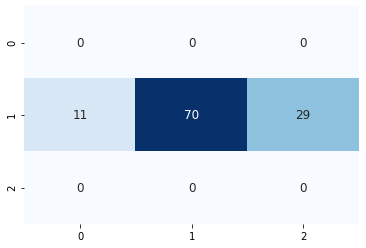

109/109 [==============================] - 0s 319us/sample - loss: 1.0596 - accuracy: 0.5138


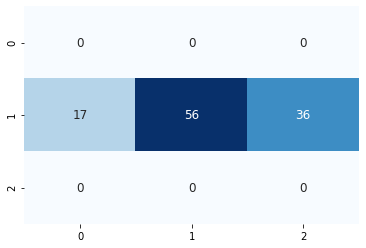

110/110 [==============================] - 0s 265us/sample - loss: 0.9700 - accuracy: 0.5818


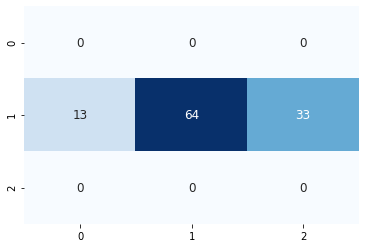

109/109 [==============================] - 0s 356us/sample - loss: 0.9655 - accuracy: 0.5505


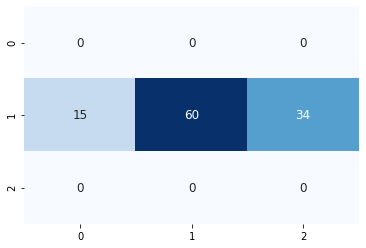

107/107 [==============================] - 0s 314us/sample - loss: 0.9872 - accuracy: 0.5234


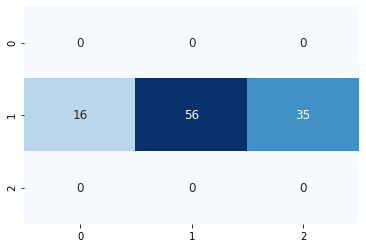

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3876 samples, validate on 1010 samples
Epoch 1/300
3876/3876 [==============================] - 3s 687us/sample - loss: 1.0088 - accuracy: 0.4951 - val_loss: 1.0142 - val_accuracy: 0.5158
Epoch 2/300
3876/3876 [==============================] - 1s 219us/sample - loss: 0.8468 - accuracy: 0.6156 - val_loss: 1.0109 - val_accuracy: 0.5218
Epoch 3/300
3876/3876 [==============================] - 1s 200us/sample - loss: 0.7783 - accuracy: 0.6556 - val_loss: 1.0196 - val_accuracy: 0.5257
Epoch 4/300
3876/3876 [==============================] - 1s 225us/sample - loss: 0.7156 - accuracy: 0.6981 - val_loss: 1.0347 - val_accuracy: 0.5257
Epoch 5/300
3876/3876 [==============================] - 1s 225us/sample - loss: 0.6611 - accuracy: 0.7260 - val_loss: 1.0610 - val_accuracy: 0.5248
Epoch 00005: early stopping
103/103 [==============================] - 0s 140us/sample - loss: 0.5490 - accuracy: 0.8641


5it [2:33:31, 1826.43s/it]
100%|██████████| 3/3 [00:06<00:00,  2.17s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.095703125 steps, validate for 75.435546875 steps
Epoch 1/300
286/285 [==============================] - 30s 104ms/step - loss: 0.9616 - accuracy: 0.5539 - val_loss: 0.9901 - val_accuracy: 0.5557
Epoch 2/300
286/285 [==============================] - 29s 101ms/step - loss: 0.8801 - accuracy: 0.5990 - val_loss: 1.0031 - val_accuracy: 0.5412
Epoch 3/300
286/285 [==============================] - 29s 102ms/step - loss: 0.8505 - accuracy: 0.6137 - val_loss: 1.0369 - val_accuracy: 0.5200
Epoch 4/300
286/285 [==============================] - 29s 101ms/step - loss: 0.8272 - accuracy: 0.6254 - val_loss: 1.0628 - val_accuracy: 0.5150
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.095703125 steps, validate for 75.435546875 steps
Epoch 1/300
286/285 [==============================] - 70s 244ms/step - loss: 0.7888 - accuracy: 0.6472 - val_loss: 1.1725 - val

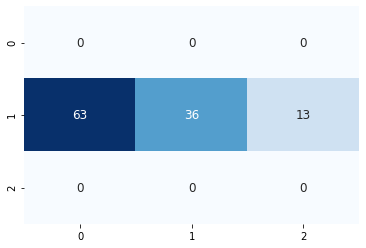

103/103 [==============================] - 0s 260us/sample - loss: 1.4685 - accuracy: 0.3010


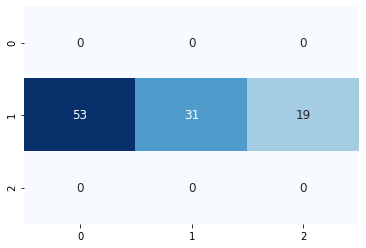

98/98 [==============================] - 0s 254us/sample - loss: 1.3810 - accuracy: 0.3163


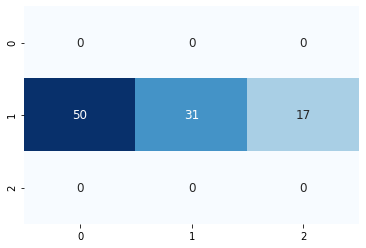

97/97 [==============================] - 0s 281us/sample - loss: 1.4344 - accuracy: 0.3093


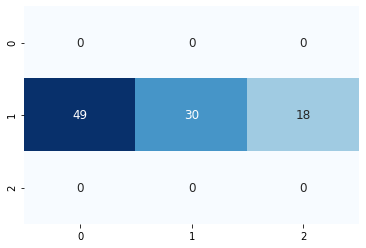

96/96 [==============================] - 0s 2ms/sample - loss: 1.4731 - accuracy: 0.3125


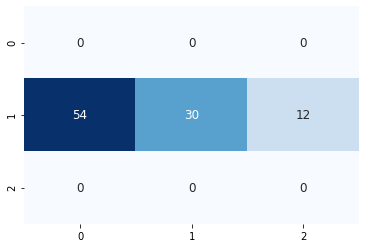

96/96 [==============================] - 0s 264us/sample - loss: 1.4234 - accuracy: 0.3125


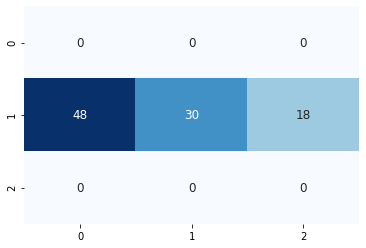

96/96 [==============================] - 0s 236us/sample - loss: 1.3627 - accuracy: 0.3542


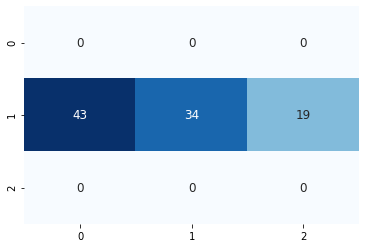

92/92 [==============================] - 0s 270us/sample - loss: 1.2937 - accuracy: 0.3478


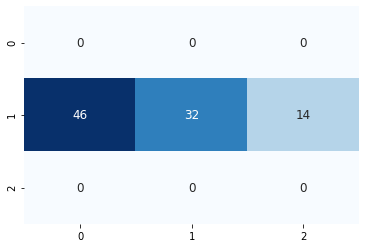

91/91 [==============================] - 0s 270us/sample - loss: 1.4052 - accuracy: 0.3516


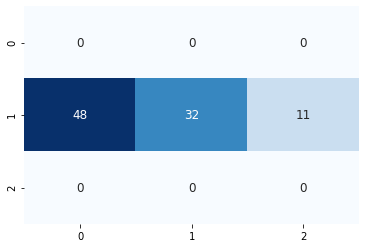

92/92 [==============================] - 0s 291us/sample - loss: 1.5744 - accuracy: 0.3152


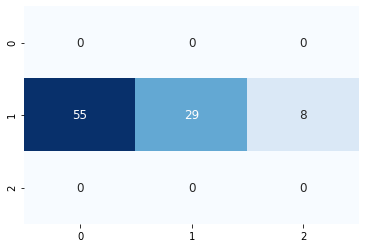

91/91 [==============================] - 0s 308us/sample - loss: 1.5954 - accuracy: 0.3516


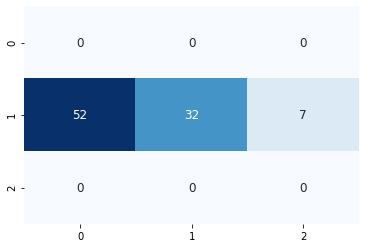

90/90 [==============================] - 0s 270us/sample - loss: 1.5838 - accuracy: 0.3111


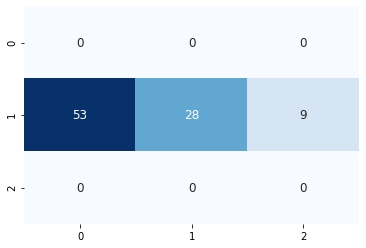

90/90 [==============================] - 0s 263us/sample - loss: 1.4706 - accuracy: 0.3556


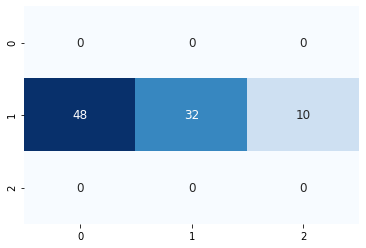

89/89 [==============================] - 0s 289us/sample - loss: 1.5085 - accuracy: 0.3371


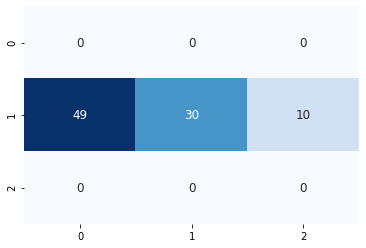

89/89 [==============================] - 0s 276us/sample - loss: 1.5089 - accuracy: 0.3933


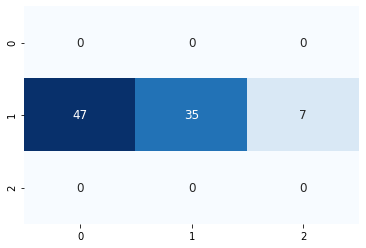

88/88 [==============================] - 0s 272us/sample - loss: 1.4162 - accuracy: 0.3523


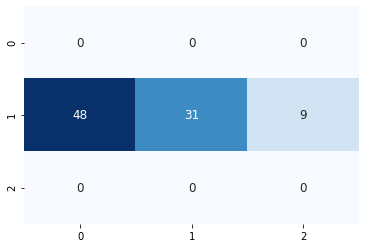

88/88 [==============================] - 0s 304us/sample - loss: 1.5916 - accuracy: 0.3182


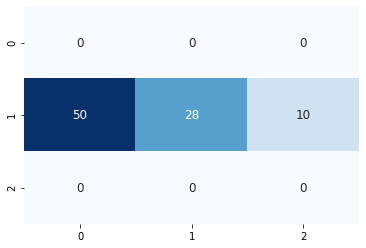

88/88 [==============================] - 0s 353us/sample - loss: 1.4928 - accuracy: 0.3295


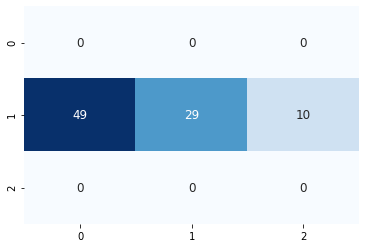

89/89 [==============================] - 0s 324us/sample - loss: 1.4000 - accuracy: 0.3371


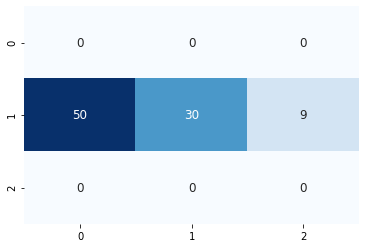

87/87 [==============================] - 0s 303us/sample - loss: 1.4779 - accuracy: 0.3218


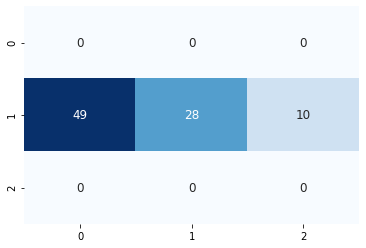

88/88 [==============================] - 0s 287us/sample - loss: 1.4370 - accuracy: 0.3182


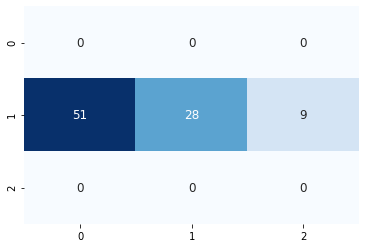

88/88 [==============================] - 0s 292us/sample - loss: 1.4698 - accuracy: 0.3750


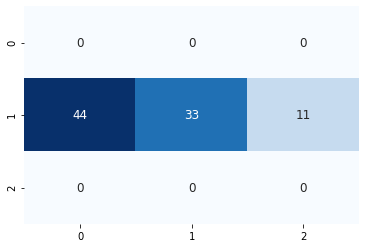

86/86 [==============================] - 0s 387us/sample - loss: 1.4045 - accuracy: 0.3953


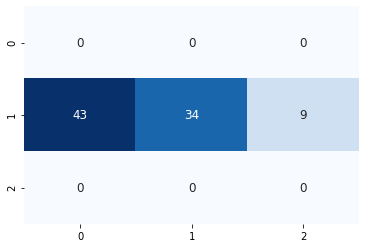

86/86 [==============================] - 0s 285us/sample - loss: 1.6308 - accuracy: 0.3140


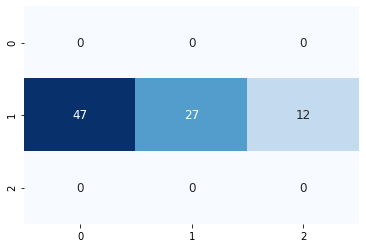

87/87 [==============================] - 0s 344us/sample - loss: 1.6003 - accuracy: 0.3678


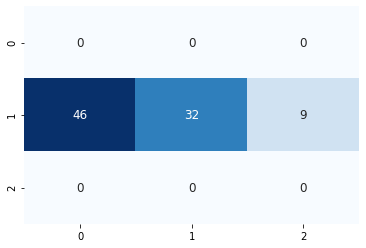

87/87 [==============================] - 0s 318us/sample - loss: 1.6379 - accuracy: 0.3103


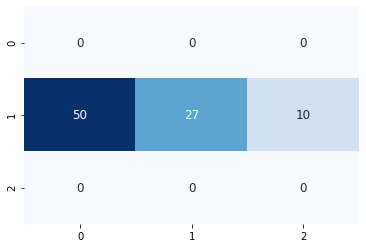

86/86 [==============================] - 0s 282us/sample - loss: 1.6532 - accuracy: 0.2791


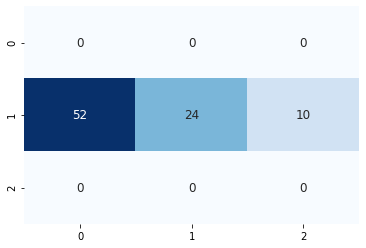

87/87 [==============================] - 0s 318us/sample - loss: 1.6116 - accuracy: 0.2644


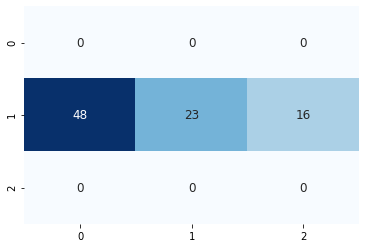

85/85 [==============================] - 0s 312us/sample - loss: 1.6292 - accuracy: 0.3765


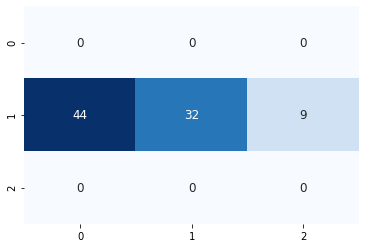

87/87 [==============================] - 0s 309us/sample - loss: 1.7347 - accuracy: 0.2874


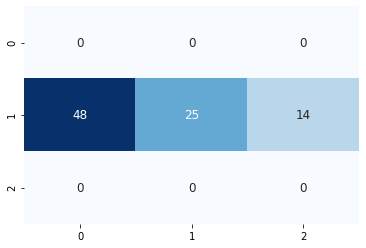

86/86 [==============================] - 0s 281us/sample - loss: 1.6478 - accuracy: 0.3721


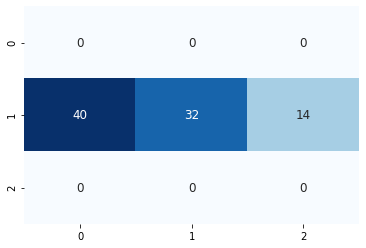

86/86 [==============================] - 0s 282us/sample - loss: 1.6085 - accuracy: 0.3023


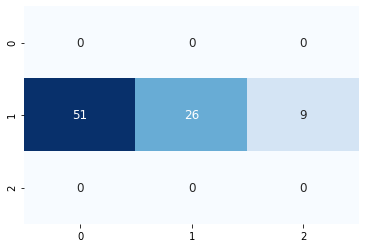

86/86 [==============================] - 0s 265us/sample - loss: 1.5654 - accuracy: 0.2907


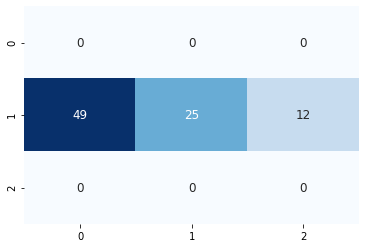

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3892 samples, validate on 1015 samples
Epoch 1/300
3892/3892 [==============================] - 3s 689us/sample - loss: 0.9613 - accuracy: 0.5401 - val_loss: 0.9966 - val_accuracy: 0.5438
Epoch 2/300
3892/3892 [==============================] - 1s 250us/sample - loss: 0.8092 - accuracy: 0.6369 - val_loss: 1.0047 - val_accuracy: 0.5429
Epoch 3/300
3892/3892 [==============================] - 1s 227us/sample - loss: 0.7213 - accuracy: 0.6927 - val_loss: 1.0303 - val_accuracy: 0.5271
Epoch 4/300
3892/3892 [==============================] - 1s 211us/sample - loss: 0.6419 - accuracy: 0.7400 - val_loss: 1.0725 - val_accuracy: 0.5212
Epoch 00004: early stopping
82/82 [==============================] - 0s 167us/sample - loss: 0.7623 - accuracy: 0.6585


6it [3:04:59, 1844.85s/it]
100%|██████████| 3/3 [00:06<00:00,  2.06s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.486328125 steps, validate for 74.458984375 steps
Epoch 1/300
283/282 [==============================] - 30s 107ms/step - loss: 0.9393 - accuracy: 0.5679 - val_loss: 0.9924 - val_accuracy: 0.5468
Epoch 2/300
283/282 [==============================] - 28s 99ms/step - loss: 0.8789 - accuracy: 0.5992 - val_loss: 1.0095 - val_accuracy: 0.5378
Epoch 3/300
283/282 [==============================] - 28s 100ms/step - loss: 0.8489 - accuracy: 0.6143 - val_loss: 1.0326 - val_accuracy: 0.5336
Epoch 4/300
283/282 [==============================] - 29s 101ms/step - loss: 0.8239 - accuracy: 0.6283 - val_loss: 1.0502 - val_accuracy: 0.5338
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.486328125 steps, validate for 74.458984375 steps
Epoch 1/300
283/282 [==============================] - 70s 249ms/step - loss: 0.7868 - accuracy: 0.6490 - val_loss: 1.1431 - val_

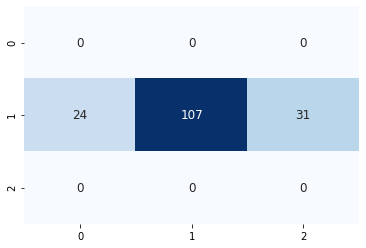

160/160 [==============================] - 0s 1ms/sample - loss: 0.7329 - accuracy: 0.7063


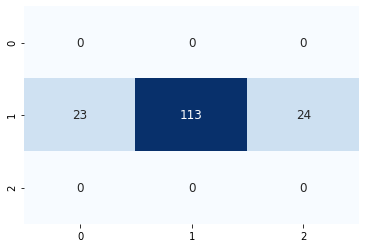

158/158 [==============================] - 0s 295us/sample - loss: 0.7054 - accuracy: 0.6962


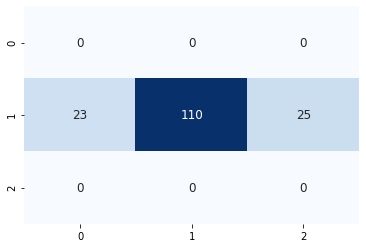

155/155 [==============================] - 0s 217us/sample - loss: 0.7149 - accuracy: 0.7097


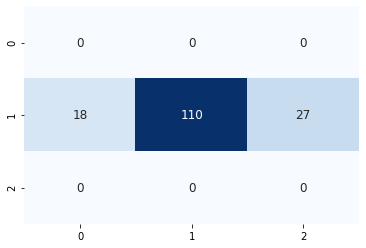

153/153 [==============================] - 0s 310us/sample - loss: 0.7494 - accuracy: 0.6928


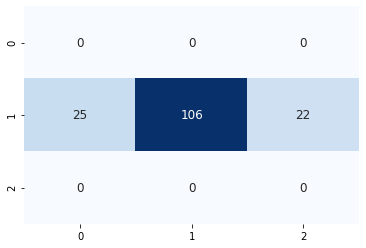

153/153 [==============================] - 0s 251us/sample - loss: 0.7597 - accuracy: 0.7190


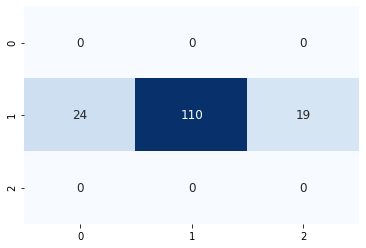

150/150 [==============================] - 0s 279us/sample - loss: 0.7307 - accuracy: 0.7467


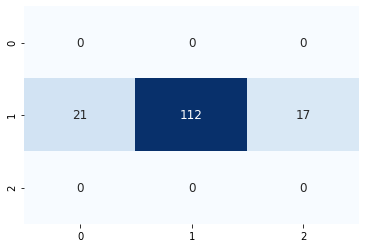

150/150 [==============================] - 0s 284us/sample - loss: 0.8351 - accuracy: 0.6600


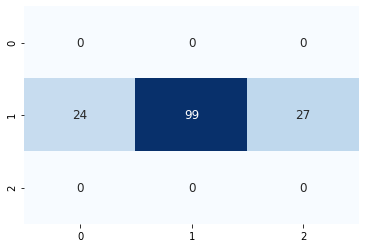

152/152 [==============================] - 0s 277us/sample - loss: 0.8169 - accuracy: 0.6645


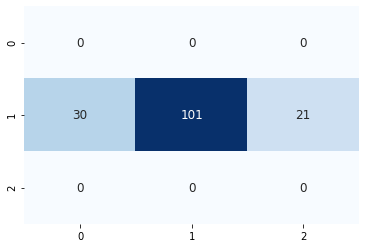

150/150 [==============================] - 0s 395us/sample - loss: 0.7579 - accuracy: 0.7000


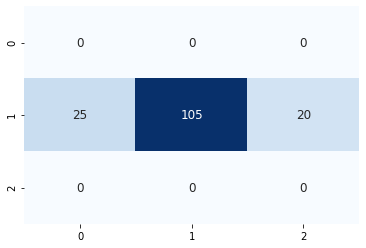

150/150 [==============================] - 0s 274us/sample - loss: 0.7497 - accuracy: 0.6933


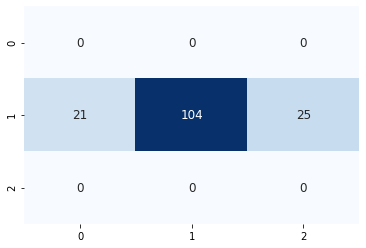

147/147 [==============================] - 0s 288us/sample - loss: 0.7369 - accuracy: 0.7007


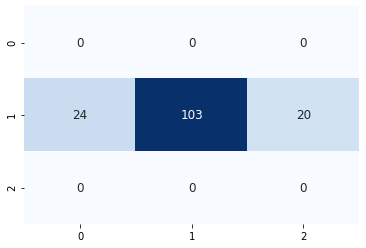

148/148 [==============================] - 0s 274us/sample - loss: 0.7340 - accuracy: 0.6959


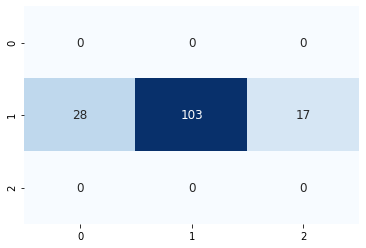

146/146 [==============================] - 0s 267us/sample - loss: 0.8009 - accuracy: 0.6986


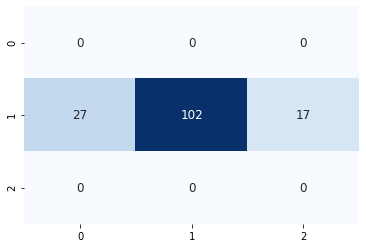

145/145 [==============================] - 0s 248us/sample - loss: 0.7530 - accuracy: 0.6966


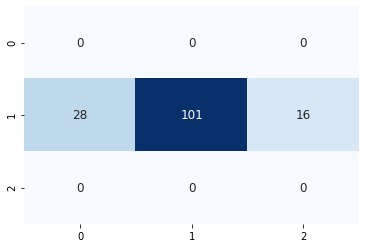

146/146 [==============================] - 0s 263us/sample - loss: 0.7629 - accuracy: 0.6575


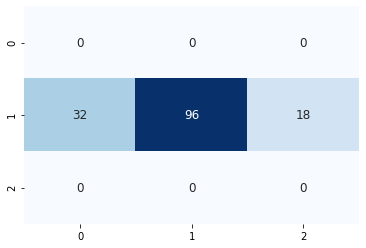

145/145 [==============================] - 0s 245us/sample - loss: 0.8365 - accuracy: 0.6069


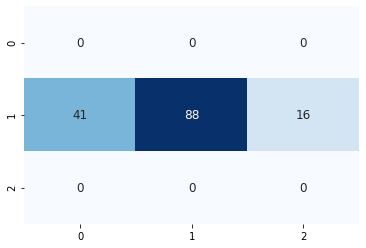

143/143 [==============================] - 0s 285us/sample - loss: 0.8251 - accuracy: 0.6434


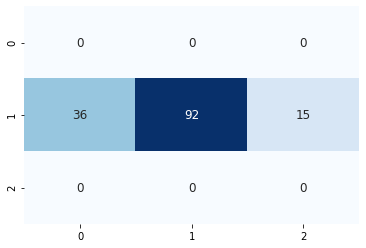

141/141 [==============================] - 0s 252us/sample - loss: 0.9034 - accuracy: 0.5603


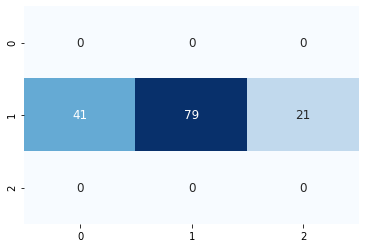

141/141 [==============================] - 0s 294us/sample - loss: 0.8637 - accuracy: 0.5957


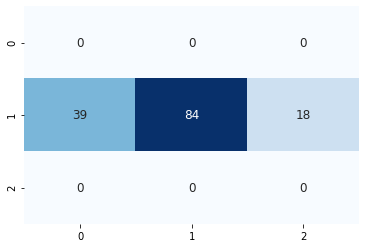

142/142 [==============================] - 0s 247us/sample - loss: 0.8426 - accuracy: 0.6197


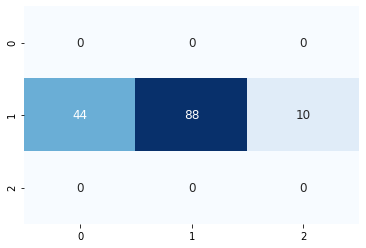

142/142 [==============================] - 0s 288us/sample - loss: 0.9097 - accuracy: 0.5634


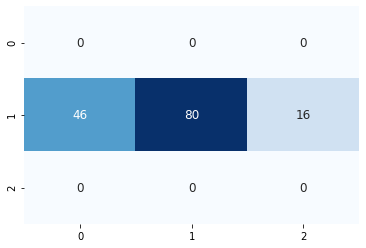

143/143 [==============================] - 0s 258us/sample - loss: 0.8493 - accuracy: 0.6294


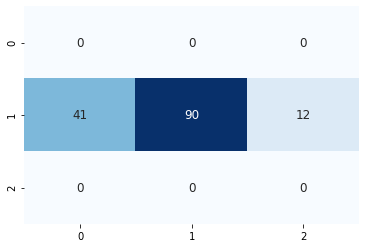

140/140 [==============================] - 0s 266us/sample - loss: 0.8298 - accuracy: 0.6214


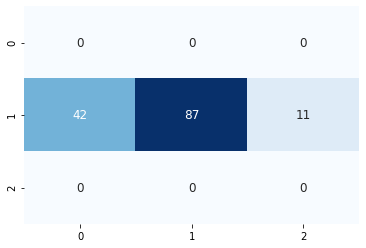

143/143 [==============================] - 0s 269us/sample - loss: 0.8738 - accuracy: 0.5944


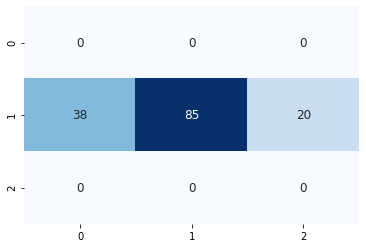

142/142 [==============================] - 0s 294us/sample - loss: 0.9118 - accuracy: 0.6056


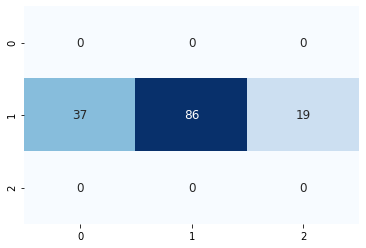

141/141 [==============================] - 0s 282us/sample - loss: 0.8666 - accuracy: 0.5745


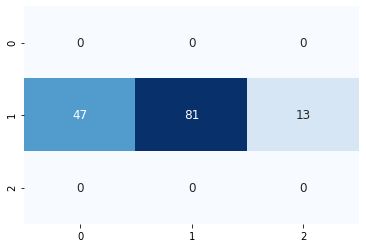

140/140 [==============================] - 0s 301us/sample - loss: 0.8962 - accuracy: 0.5786


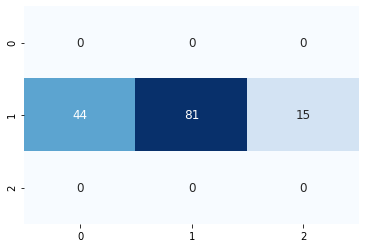

140/140 [==============================] - 0s 295us/sample - loss: 0.9559 - accuracy: 0.5357


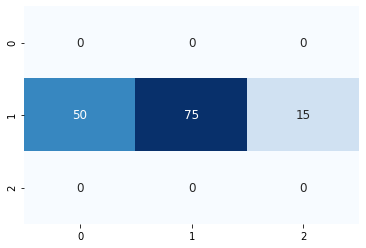

139/139 [==============================] - 0s 296us/sample - loss: 0.8647 - accuracy: 0.5755


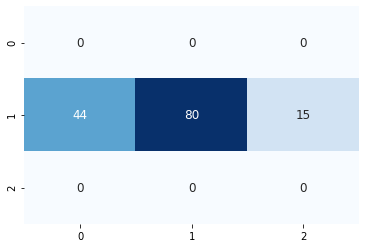

138/138 [==============================] - 0s 293us/sample - loss: 0.9260 - accuracy: 0.5435


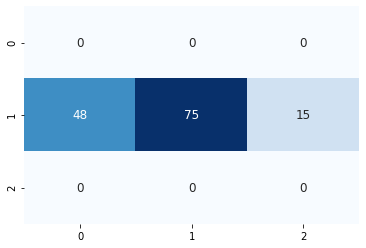

139/139 [==============================] - 0s 280us/sample - loss: 0.8656 - accuracy: 0.5899


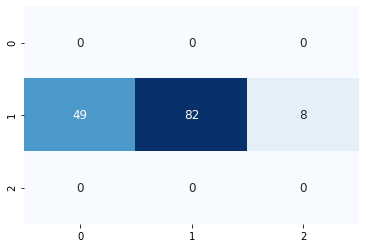

139/139 [==============================] - 0s 271us/sample - loss: 0.8160 - accuracy: 0.6187


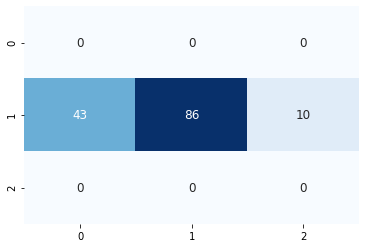

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3858 samples, validate on 1001 samples
Epoch 1/300
3858/3858 [==============================] - 3s 707us/sample - loss: 0.9385 - accuracy: 0.5614 - val_loss: 0.9908 - val_accuracy: 0.5425
Epoch 2/300
3858/3858 [==============================] - 1s 218us/sample - loss: 0.7863 - accuracy: 0.6612 - val_loss: 0.9952 - val_accuracy: 0.5435
Epoch 3/300
3858/3858 [==============================] - 1s 202us/sample - loss: 0.6976 - accuracy: 0.7128 - val_loss: 1.0116 - val_accuracy: 0.5355
Epoch 4/300
3858/3858 [==============================] - 1s 214us/sample - loss: 0.6057 - accuracy: 0.7610 - val_loss: 1.0460 - val_accuracy: 0.5355
Epoch 00004: early stopping
130/130 [==============================] - 0s 159us/sample - loss: 1.0835 - accuracy: 0.3846


7it [3:34:52, 1829.38s/it]
100%|██████████| 3/3 [00:06<00:00,  2.01s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.162109375 steps, validate for 74.951171875 steps
Epoch 1/300
286/285 [==============================] - 30s 105ms/step - loss: 0.9489 - accuracy: 0.5616 - val_loss: 0.9932 - val_accuracy: 0.5456
Epoch 2/300
286/285 [==============================] - 28s 99ms/step - loss: 0.8862 - accuracy: 0.5933 - val_loss: 1.0042 - val_accuracy: 0.5375
Epoch 3/300
286/285 [==============================] - 29s 100ms/step - loss: 0.8548 - accuracy: 0.6092 - val_loss: 1.0377 - val_accuracy: 0.5362
Epoch 4/300
286/285 [==============================] - 29s 100ms/step - loss: 0.8290 - accuracy: 0.6232 - val_loss: 1.0668 - val_accuracy: 0.5157
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.162109375 steps, validate for 74.951171875 steps
Epoch 1/300
286/285 [==============================] - 70s 244ms/step - loss: 0.7910 - accuracy: 0.6441 - val_loss: 1.0964 - val_

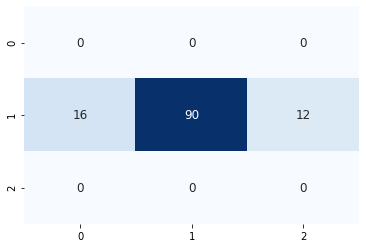

116/116 [==============================] - 0s 421us/sample - loss: 0.5601 - accuracy: 0.7672


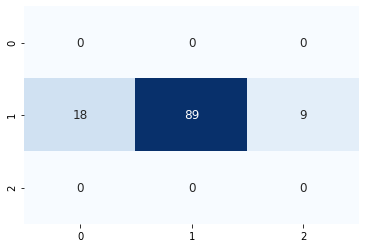

114/114 [==============================] - 0s 291us/sample - loss: 0.5314 - accuracy: 0.8246


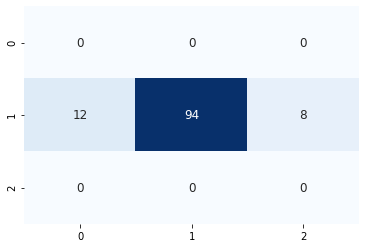

112/112 [==============================] - 0s 287us/sample - loss: 0.5603 - accuracy: 0.8125


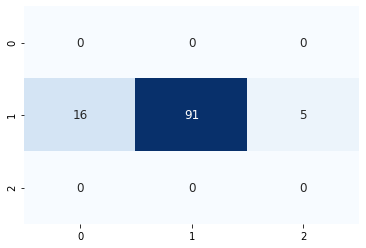

110/110 [==============================] - 0s 280us/sample - loss: 0.6042 - accuracy: 0.7818


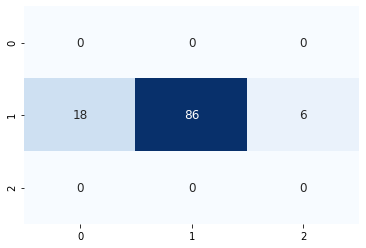

109/109 [==============================] - 0s 265us/sample - loss: 0.6621 - accuracy: 0.7431


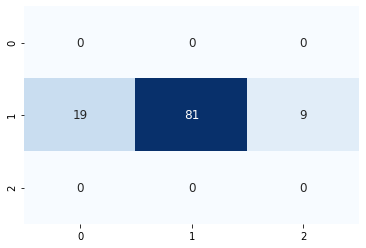

108/108 [==============================] - 0s 277us/sample - loss: 0.5723 - accuracy: 0.8241


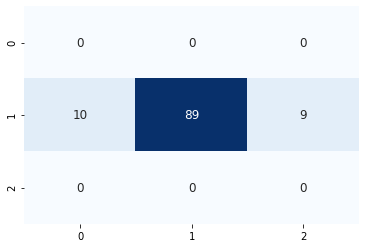

105/105 [==============================] - 0s 356us/sample - loss: 0.5881 - accuracy: 0.7619


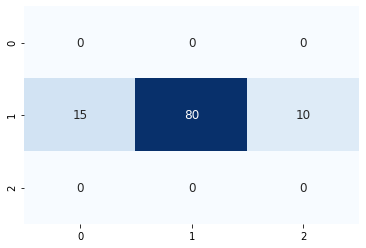

102/102 [==============================] - 0s 329us/sample - loss: 0.5401 - accuracy: 0.8333


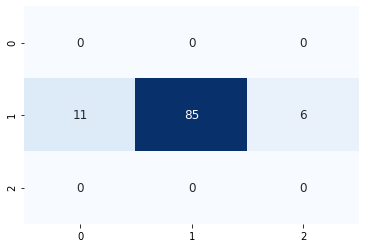

101/101 [==============================] - 0s 1ms/sample - loss: 0.6495 - accuracy: 0.7228


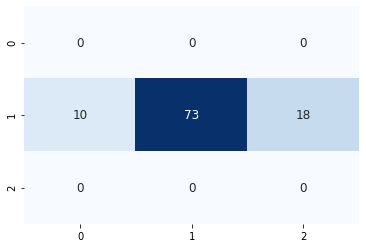

99/99 [==============================] - 0s 306us/sample - loss: 0.6433 - accuracy: 0.7475


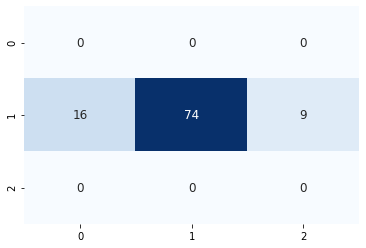

96/96 [==============================] - 0s 2ms/sample - loss: 0.6290 - accuracy: 0.7500


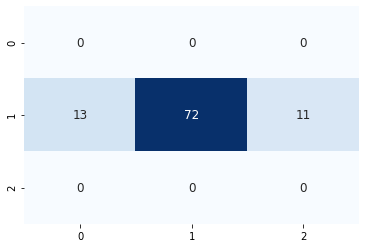

94/94 [==============================] - 0s 268us/sample - loss: 0.6945 - accuracy: 0.7234


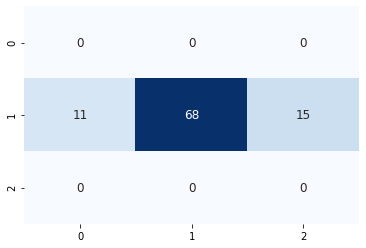

94/94 [==============================] - 0s 252us/sample - loss: 0.6183 - accuracy: 0.7447


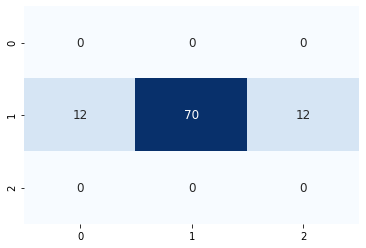

93/93 [==============================] - 0s 259us/sample - loss: 0.5882 - accuracy: 0.7527


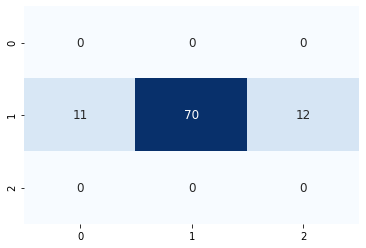

92/92 [==============================] - 0s 266us/sample - loss: 0.6065 - accuracy: 0.7391


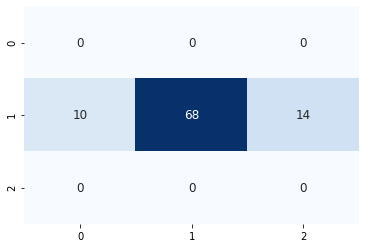

93/93 [==============================] - 0s 296us/sample - loss: 0.6940 - accuracy: 0.6774


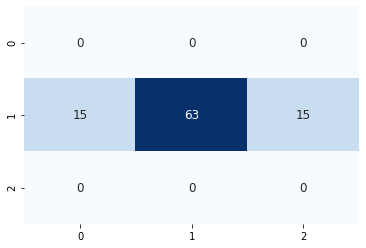

93/93 [==============================] - 0s 258us/sample - loss: 0.6669 - accuracy: 0.7204


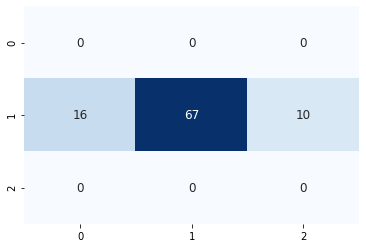

92/92 [==============================] - 0s 306us/sample - loss: 0.6793 - accuracy: 0.6848


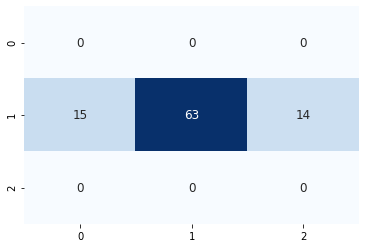

92/92 [==============================] - 0s 270us/sample - loss: 0.6879 - accuracy: 0.7174


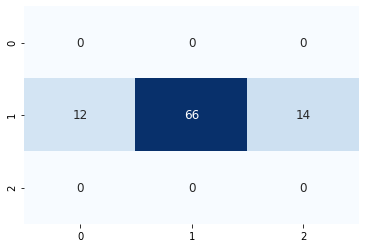

91/91 [==============================] - 0s 246us/sample - loss: 0.6524 - accuracy: 0.6703


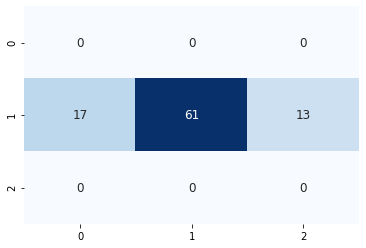

92/92 [==============================] - 0s 251us/sample - loss: 0.6251 - accuracy: 0.7283


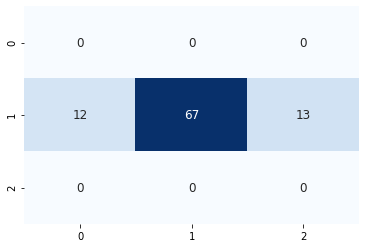

91/91 [==============================] - 0s 302us/sample - loss: 0.6502 - accuracy: 0.7033


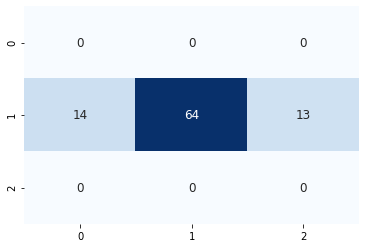

90/90 [==============================] - 0s 259us/sample - loss: 0.7215 - accuracy: 0.6667


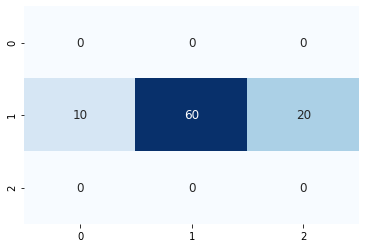

89/89 [==============================] - 0s 259us/sample - loss: 0.7002 - accuracy: 0.6517


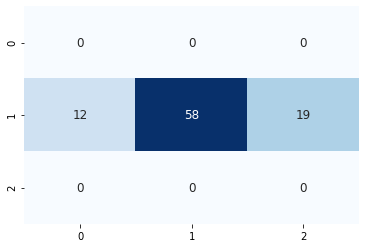

88/88 [==============================] - 0s 316us/sample - loss: 0.7171 - accuracy: 0.6818


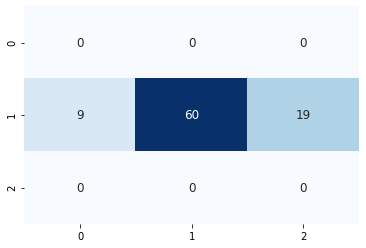

89/89 [==============================] - 0s 257us/sample - loss: 0.7002 - accuracy: 0.6404


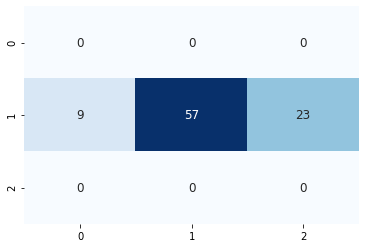

89/89 [==============================] - 0s 458us/sample - loss: 0.7020 - accuracy: 0.6854


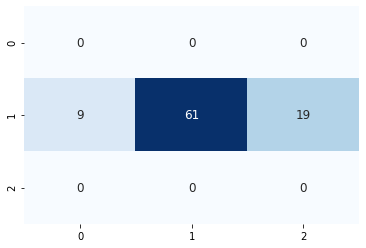

89/89 [==============================] - 0s 256us/sample - loss: 0.7412 - accuracy: 0.6629


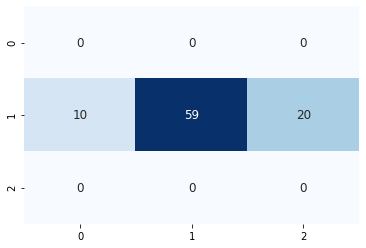

90/90 [==============================] - 0s 269us/sample - loss: 0.8027 - accuracy: 0.5778


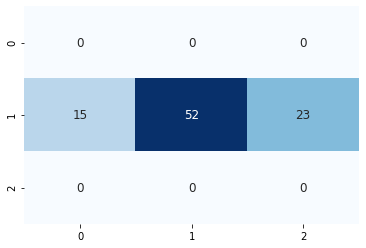

90/90 [==============================] - 0s 256us/sample - loss: 0.8204 - accuracy: 0.6222


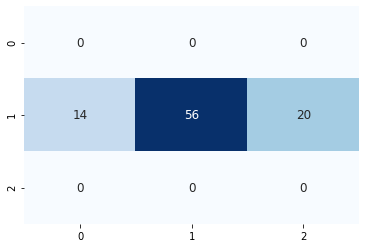

91/91 [==============================] - 0s 251us/sample - loss: 0.7589 - accuracy: 0.6374


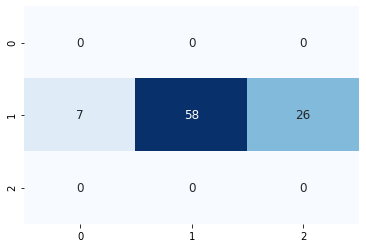

89/89 [==============================] - 0s 243us/sample - loss: 0.7805 - accuracy: 0.5843


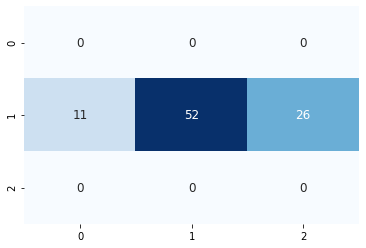

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3894 samples, validate on 1008 samples
Epoch 1/300
3894/3894 [==============================] - 3s 703us/sample - loss: 0.9602 - accuracy: 0.5300 - val_loss: 1.0051 - val_accuracy: 0.5208
Epoch 2/300
3894/3894 [==============================] - 1s 203us/sample - loss: 0.8234 - accuracy: 0.6163 - val_loss: 1.0162 - val_accuracy: 0.5119
Epoch 3/300
3894/3894 [==============================] - 1s 211us/sample - loss: 0.7344 - accuracy: 0.6777 - val_loss: 1.0414 - val_accuracy: 0.4970
Epoch 4/300
3894/3894 [==============================] - 1s 216us/sample - loss: 0.6506 - accuracy: 0.7316 - val_loss: 1.0864 - val_accuracy: 0.4841
Epoch 00004: early stopping
87/87 [==============================] - 0s 157us/sample - loss: 0.5865 - accuracy: 0.7931


8it [4:05:58, 1840.28s/it]
100%|██████████| 3/3 [00:06<00:00,  2.01s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.861328125 steps, validate for 75.658203125 steps
Epoch 1/300
284/283 [==============================] - 30s 107ms/step - loss: 0.9467 - accuracy: 0.5597 - val_loss: 0.9878 - val_accuracy: 0.5521
Epoch 2/300
284/283 [==============================] - 28s 99ms/step - loss: 0.8802 - accuracy: 0.5977 - val_loss: 1.0089 - val_accuracy: 0.5369
Epoch 3/300
284/283 [==============================] - 28s 100ms/step - loss: 0.8511 - accuracy: 0.6120 - val_loss: 1.0344 - val_accuracy: 0.5361
Epoch 4/300
284/283 [==============================] - 29s 101ms/step - loss: 0.8265 - accuracy: 0.6250 - val_loss: 1.0658 - val_accuracy: 0.5072
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.861328125 steps, validate for 75.658203125 steps
Epoch 1/300
284/283 [==============================] - 70s 248ms/step - loss: 0.7895 - accuracy: 0.6471 - val_loss: 1.2979 - val_

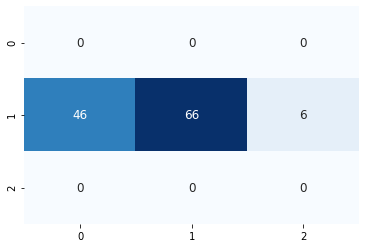

113/113 [==============================] - 0s 267us/sample - loss: 0.9141 - accuracy: 0.6106


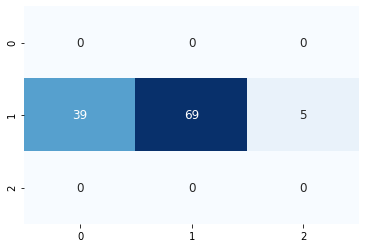

112/112 [==============================] - 0s 303us/sample - loss: 0.9200 - accuracy: 0.5804


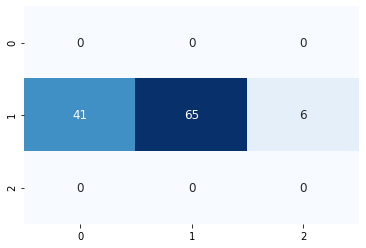

112/112 [==============================] - 0s 239us/sample - loss: 0.8557 - accuracy: 0.6161


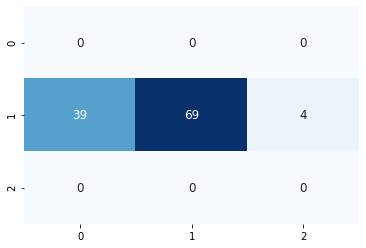

111/111 [==============================] - 0s 285us/sample - loss: 0.8438 - accuracy: 0.6216


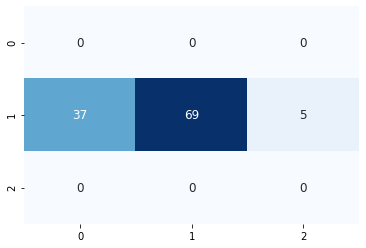

111/111 [==============================] - 0s 289us/sample - loss: 0.7573 - accuracy: 0.6667


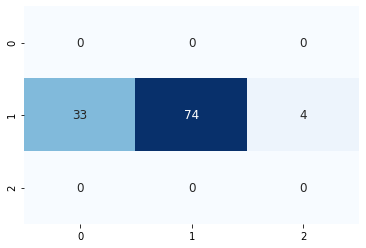

108/108 [==============================] - 0s 288us/sample - loss: 0.7782 - accuracy: 0.6481


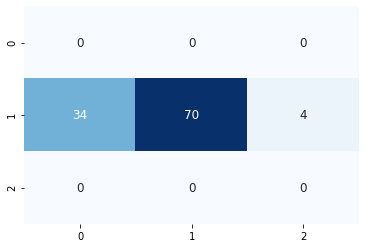

109/109 [==============================] - 0s 263us/sample - loss: 0.8238 - accuracy: 0.5963


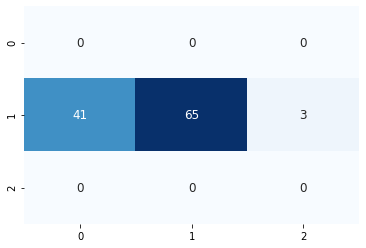

106/106 [==============================] - 0s 304us/sample - loss: 0.7167 - accuracy: 0.6509


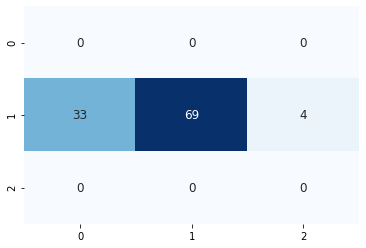

104/104 [==============================] - 0s 262us/sample - loss: 0.7248 - accuracy: 0.6731


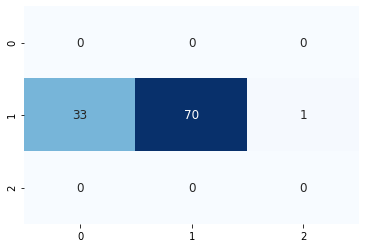

104/104 [==============================] - 0s 267us/sample - loss: 0.6878 - accuracy: 0.7212


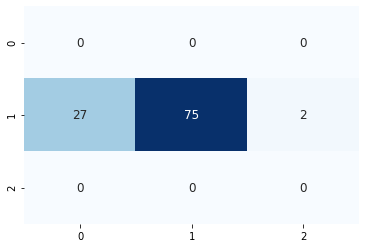

105/105 [==============================] - 0s 338us/sample - loss: 0.7025 - accuracy: 0.7048


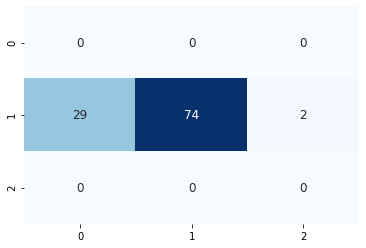

104/104 [==============================] - 0s 254us/sample - loss: 0.6349 - accuracy: 0.6827


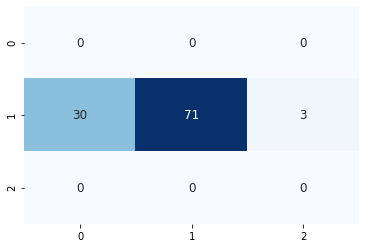

104/104 [==============================] - 0s 260us/sample - loss: 0.6705 - accuracy: 0.6538


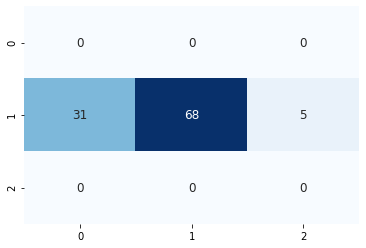

103/103 [==============================] - 0s 264us/sample - loss: 0.6909 - accuracy: 0.6408


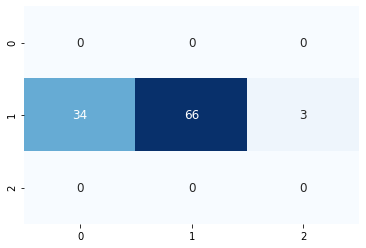

102/102 [==============================] - 0s 293us/sample - loss: 0.7245 - accuracy: 0.5980


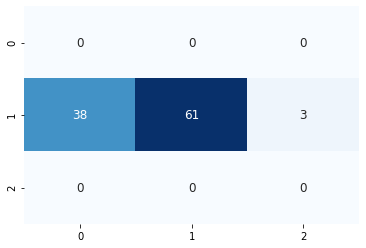

101/101 [==============================] - 0s 298us/sample - loss: 0.7238 - accuracy: 0.6040


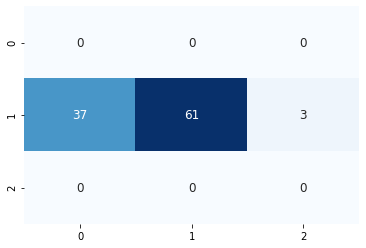

102/102 [==============================] - 0s 288us/sample - loss: 0.8085 - accuracy: 0.6275


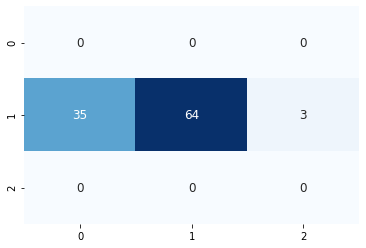

105/105 [==============================] - 0s 291us/sample - loss: 0.8514 - accuracy: 0.5905


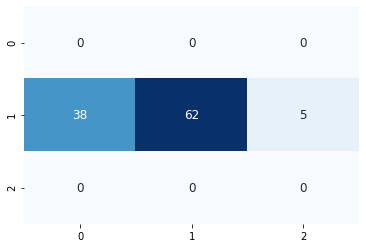

103/103 [==============================] - 0s 277us/sample - loss: 0.7101 - accuracy: 0.6117


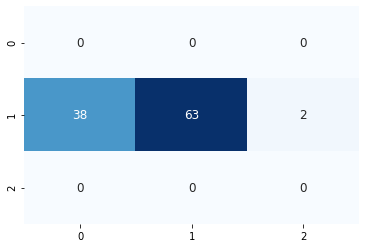

104/104 [==============================] - 0s 277us/sample - loss: 0.6897 - accuracy: 0.6635


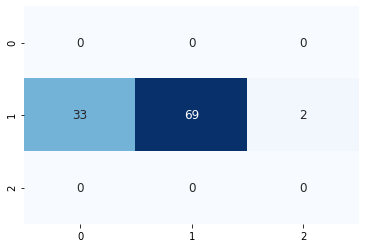

105/105 [==============================] - 0s 315us/sample - loss: 0.8095 - accuracy: 0.6476


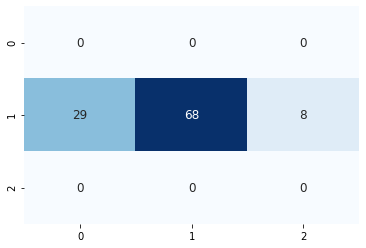

103/103 [==============================] - 0s 282us/sample - loss: 0.7740 - accuracy: 0.6408


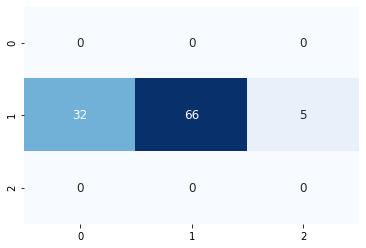

104/104 [==============================] - 0s 319us/sample - loss: 0.7953 - accuracy: 0.5769


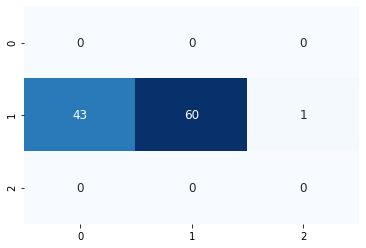

105/105 [==============================] - 0s 282us/sample - loss: 0.8949 - accuracy: 0.5905


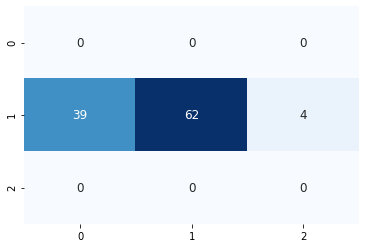

105/105 [==============================] - 0s 297us/sample - loss: 0.8692 - accuracy: 0.5810


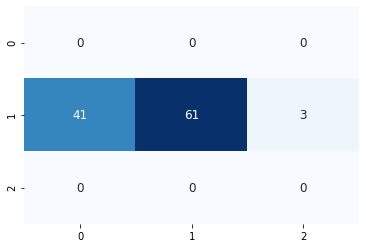

105/105 [==============================] - 0s 316us/sample - loss: 0.8830 - accuracy: 0.6000


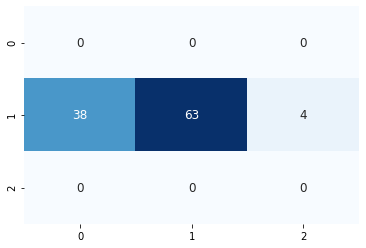

106/106 [==============================] - 0s 326us/sample - loss: 0.7927 - accuracy: 0.5943


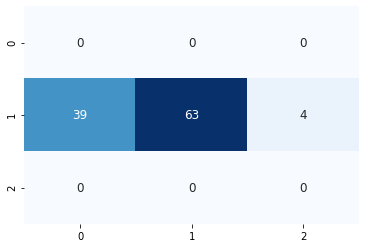

104/104 [==============================] - 0s 291us/sample - loss: 0.8270 - accuracy: 0.6250


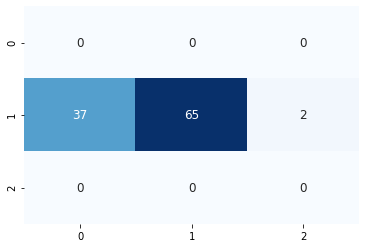

106/106 [==============================] - 0s 270us/sample - loss: 0.8110 - accuracy: 0.6038


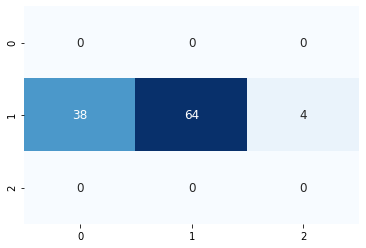

107/107 [==============================] - 0s 293us/sample - loss: 0.8226 - accuracy: 0.6262


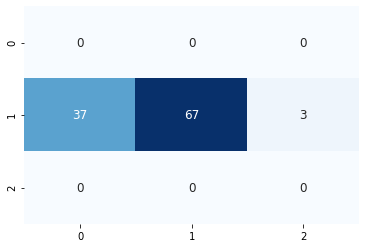

108/108 [==============================] - 0s 259us/sample - loss: 0.8569 - accuracy: 0.6204


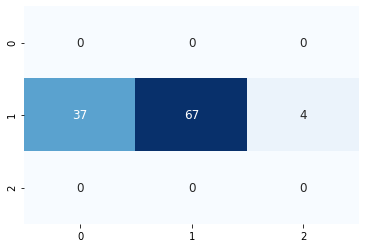

106/106 [==============================] - 0s 265us/sample - loss: 0.8139 - accuracy: 0.6132


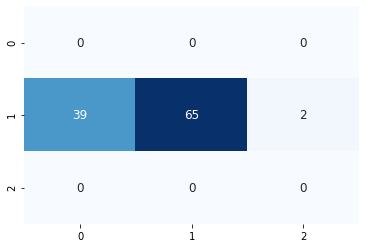

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3874 samples, validate on 1017 samples
Epoch 1/300
3874/3874 [==============================] - 3s 721us/sample - loss: 0.8983 - accuracy: 0.5849 - val_loss: 1.0086 - val_accuracy: 0.5320
Epoch 2/300
3874/3874 [==============================] - 1s 233us/sample - loss: 0.7196 - accuracy: 0.7024 - val_loss: 1.0485 - val_accuracy: 0.5103
Epoch 3/300
3874/3874 [==============================] - 1s 216us/sample - loss: 0.5976 - accuracy: 0.7718 - val_loss: 1.1277 - val_accuracy: 0.5064
Epoch 4/300
3874/3874 [==============================] - 1s 240us/sample - loss: 0.4898 - accuracy: 0.8232 - val_loss: 1.2385 - val_accuracy: 0.4966
Epoch 00004: early stopping
98/98 [==============================] - 0s 178us/sample - loss: 0.5659 - accuracy: 0.7551


9it [4:37:43, 1859.72s/it]
100%|██████████| 3/3 [00:05<00:00,  1.99s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 286.533203125 steps, validate for 75.24609375 steps
Epoch 1/300
287/286 [==============================] - 30s 106ms/step - loss: 0.9422 - accuracy: 0.5657 - val_loss: 1.0080 - val_accuracy: 0.5486
Epoch 2/300
287/286 [==============================] - 29s 101ms/step - loss: 0.8776 - accuracy: 0.5998 - val_loss: 1.0181 - val_accuracy: 0.5445
Epoch 3/300
287/286 [==============================] - 29s 100ms/step - loss: 0.8458 - accuracy: 0.6155 - val_loss: 1.0380 - val_accuracy: 0.5356
Epoch 4/300
287/286 [==============================] - 29s 99ms/step - loss: 0.8217 - accuracy: 0.6285 - val_loss: 1.0794 - val_accuracy: 0.5333
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 286.533203125 steps, validate for 75.24609375 steps
Epoch 1/300
287/286 [==============================] - 71s 247ms/step - loss: 0.7855 - accuracy: 0.6496 - val_loss: 1.1932 - val_ac

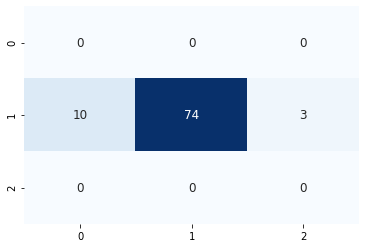

84/84 [==============================] - 0s 268us/sample - loss: 0.3854 - accuracy: 0.8571


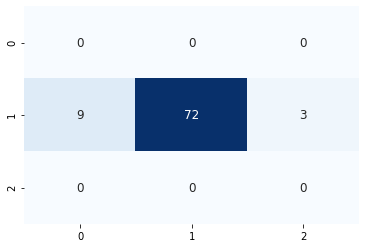

82/82 [==============================] - 0s 285us/sample - loss: 0.3724 - accuracy: 0.8780


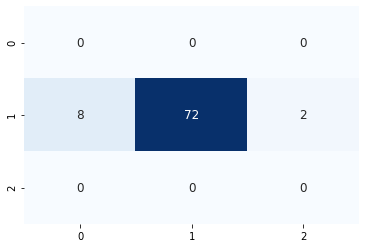

80/80 [==============================] - 0s 298us/sample - loss: 0.3638 - accuracy: 0.8875


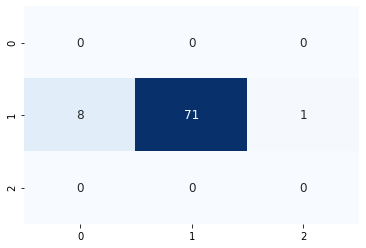

78/78 [==============================] - 0s 274us/sample - loss: 0.4335 - accuracy: 0.8974


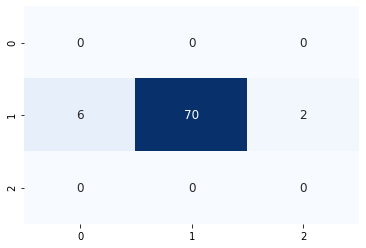

79/79 [==============================] - 0s 353us/sample - loss: 0.3745 - accuracy: 0.8481


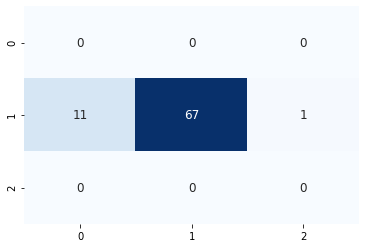

79/79 [==============================] - 0s 315us/sample - loss: 0.4162 - accuracy: 0.8608


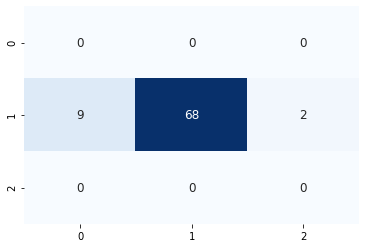

75/75 [==============================] - 0s 317us/sample - loss: 0.3997 - accuracy: 0.8267


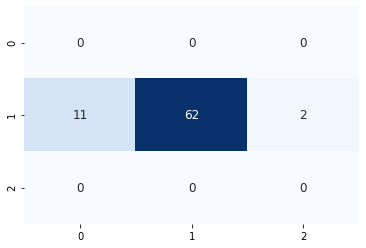

72/72 [==============================] - 0s 374us/sample - loss: 0.4456 - accuracy: 0.8194


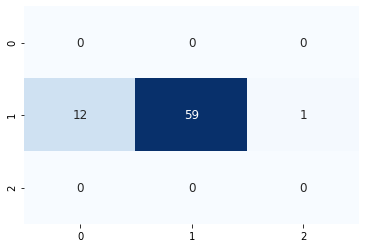

72/72 [==============================] - 0s 299us/sample - loss: 0.4471 - accuracy: 0.8333


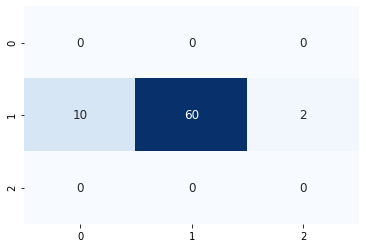

73/73 [==============================] - 0s 352us/sample - loss: 0.4012 - accuracy: 0.7945


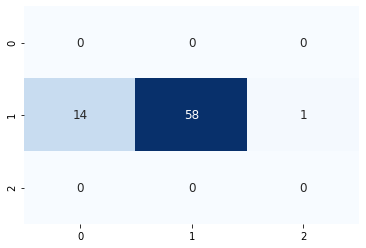

74/74 [==============================] - 0s 320us/sample - loss: 0.3619 - accuracy: 0.8784


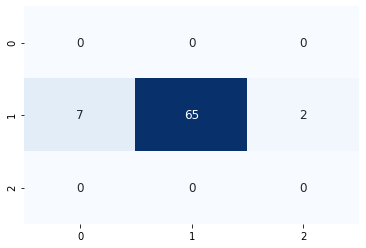

73/73 [==============================] - 0s 310us/sample - loss: 0.5155 - accuracy: 0.8082


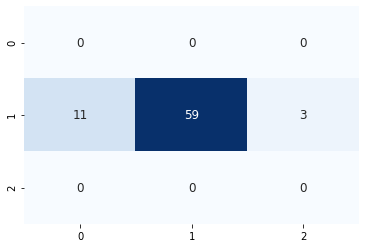

70/70 [==============================] - 0s 345us/sample - loss: 0.4502 - accuracy: 0.8714


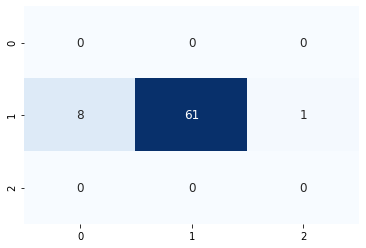

70/70 [==============================] - 0s 369us/sample - loss: 0.5154 - accuracy: 0.7714


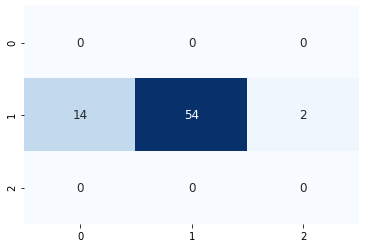

71/71 [==============================] - 0s 306us/sample - loss: 0.5519 - accuracy: 0.7606


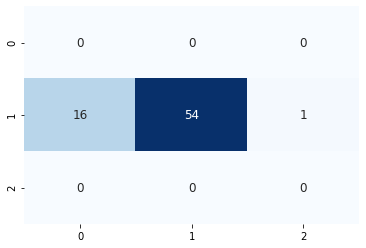

72/72 [==============================] - 0s 287us/sample - loss: 0.5563 - accuracy: 0.8056


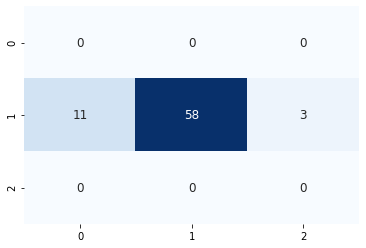

73/73 [==============================] - 0s 290us/sample - loss: 0.5084 - accuracy: 0.7808


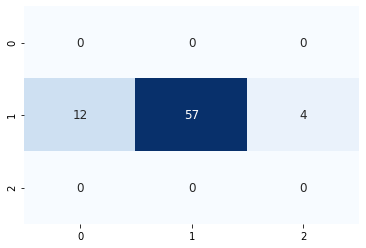

70/70 [==============================] - 0s 341us/sample - loss: 0.5807 - accuracy: 0.7857


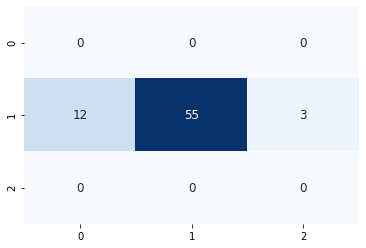

70/70 [==============================] - 0s 346us/sample - loss: 0.5429 - accuracy: 0.7571


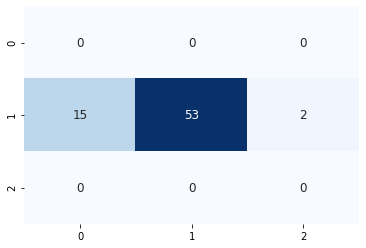

68/68 [==============================] - 0s 313us/sample - loss: 0.6092 - accuracy: 0.7206


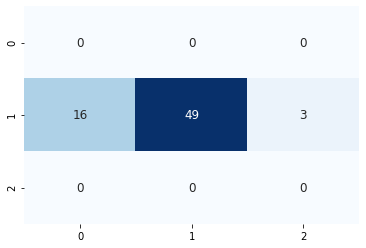

66/66 [==============================] - 0s 335us/sample - loss: 0.5269 - accuracy: 0.7576


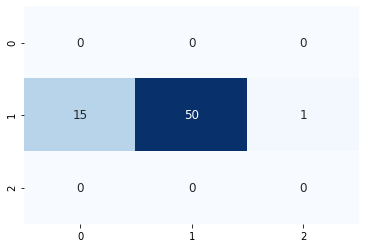

67/67 [==============================] - 0s 396us/sample - loss: 0.5132 - accuracy: 0.7463


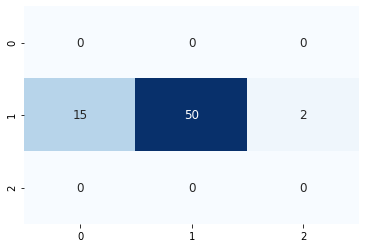

66/66 [==============================] - 0s 311us/sample - loss: 0.5771 - accuracy: 0.7727


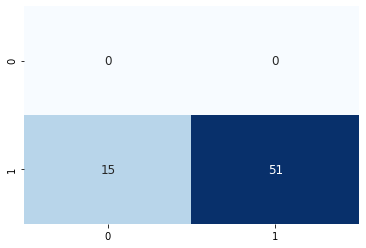

65/65 [==============================] - 0s 341us/sample - loss: 0.5683 - accuracy: 0.7077


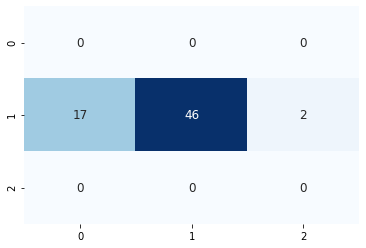

64/64 [==============================] - 0s 3ms/sample - loss: 0.5813 - accuracy: 0.7344


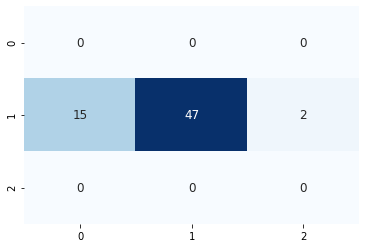

64/64 [==============================] - 0s 330us/sample - loss: 0.5653 - accuracy: 0.7656


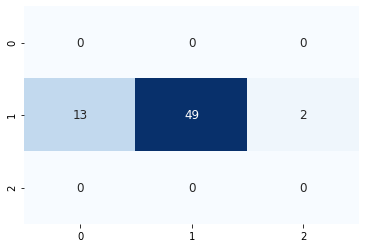

65/65 [==============================] - 0s 327us/sample - loss: 0.5825 - accuracy: 0.7846


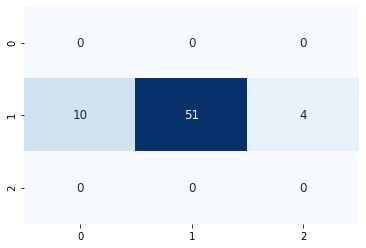

64/64 [==============================] - 0s 283us/sample - loss: 0.6085 - accuracy: 0.7812


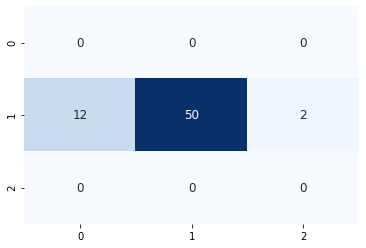

63/63 [==============================] - 0s 303us/sample - loss: 0.5066 - accuracy: 0.8413


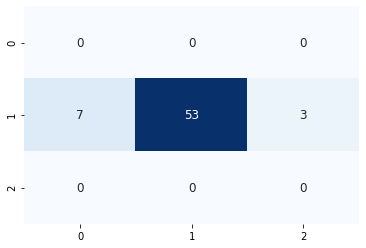

64/64 [==============================] - 0s 270us/sample - loss: 0.5667 - accuracy: 0.7344


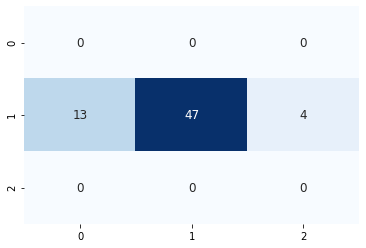

64/64 [==============================] - 0s 383us/sample - loss: 0.5101 - accuracy: 0.7812


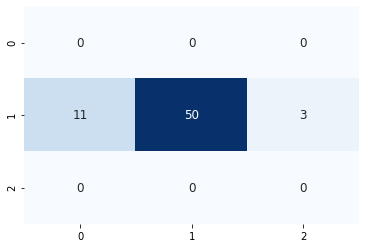

64/64 [==============================] - 0s 284us/sample - loss: 0.5921 - accuracy: 0.8125


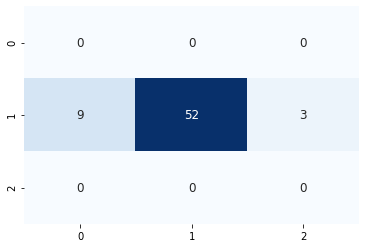

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3916 samples, validate on 1013 samples
Epoch 1/300
3916/3916 [==============================] - 3s 666us/sample - loss: 0.9866 - accuracy: 0.5222 - val_loss: 0.9995 - val_accuracy: 0.5094
Epoch 2/300
3916/3916 [==============================] - 1s 215us/sample - loss: 0.8407 - accuracy: 0.6200 - val_loss: 1.0081 - val_accuracy: 0.5123
Epoch 3/300
3916/3916 [==============================] - 1s 233us/sample - loss: 0.7558 - accuracy: 0.6846 - val_loss: 1.0279 - val_accuracy: 0.5104
Epoch 4/300
3916/3916 [==============================] - 1s 230us/sample - loss: 0.6871 - accuracy: 0.7224 - val_loss: 1.0556 - val_accuracy: 0.5074
Epoch 00004: early stopping
60/60 [==============================] - 0s 284us/sample - loss: 0.6245 - accuracy: 0.7167


10it [5:09:23, 1871.95s/it]
100%|██████████| 3/3 [00:06<00:00,  2.01s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.2734375 steps, validate for 75.669921875 steps
Epoch 1/300
285/284 [==============================] - 30s 106ms/step - loss: 0.9450 - accuracy: 0.5598 - val_loss: 0.9809 - val_accuracy: 0.5542
Epoch 2/300
285/284 [==============================] - 29s 101ms/step - loss: 0.8794 - accuracy: 0.5959 - val_loss: 0.9996 - val_accuracy: 0.5400
Epoch 3/300
285/284 [==============================] - 29s 101ms/step - loss: 0.8475 - accuracy: 0.6123 - val_loss: 1.0311 - val_accuracy: 0.5363
Epoch 4/300
285/284 [==============================] - 29s 101ms/step - loss: 0.8219 - accuracy: 0.6274 - val_loss: 1.0462 - val_accuracy: 0.5378
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.2734375 steps, validate for 75.669921875 steps
Epoch 1/300
285/284 [==============================] - 70s 247ms/step - loss: 0.7867 - accuracy: 0.6486 - val_loss: 1.1699 - val_acc

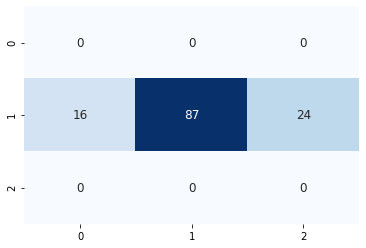

126/126 [==============================] - 0s 232us/sample - loss: 0.9401 - accuracy: 0.6349


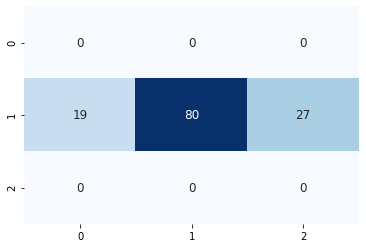

126/126 [==============================] - 0s 276us/sample - loss: 0.9030 - accuracy: 0.6270


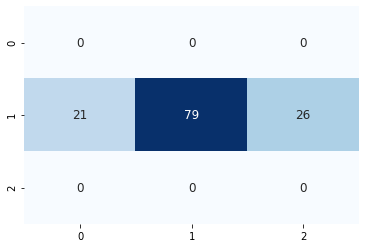

126/126 [==============================] - 0s 360us/sample - loss: 0.8546 - accuracy: 0.6349


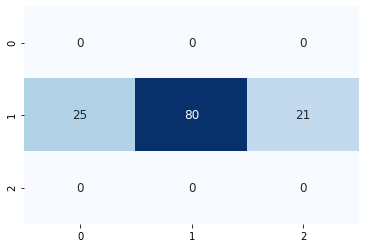

118/118 [==============================] - 0s 251us/sample - loss: 0.7415 - accuracy: 0.7119


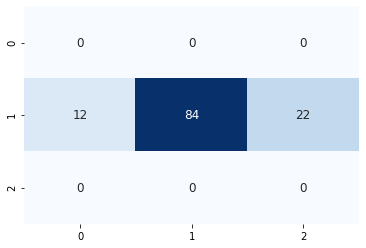

110/110 [==============================] - 0s 254us/sample - loss: 0.9671 - accuracy: 0.6364


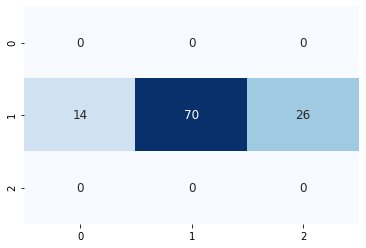

108/108 [==============================] - 0s 477us/sample - loss: 0.9654 - accuracy: 0.6389


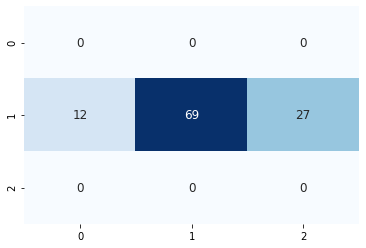

103/103 [==============================] - 0s 349us/sample - loss: 0.8435 - accuracy: 0.7184


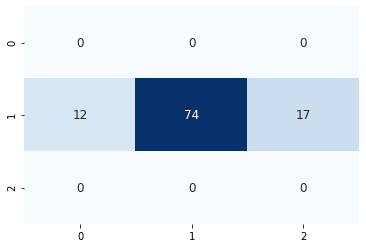

100/100 [==============================] - 0s 267us/sample - loss: 0.9745 - accuracy: 0.6700


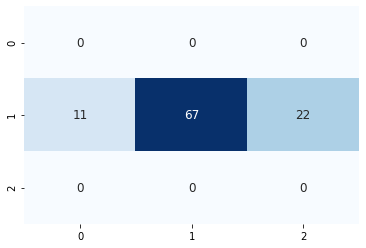

98/98 [==============================] - 0s 312us/sample - loss: 0.8108 - accuracy: 0.6429


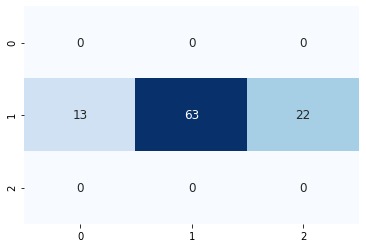

98/98 [==============================] - 0s 328us/sample - loss: 0.8660 - accuracy: 0.6327


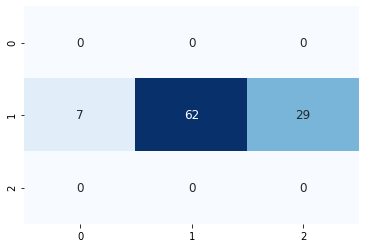

97/97 [==============================] - 0s 289us/sample - loss: 0.8224 - accuracy: 0.6186


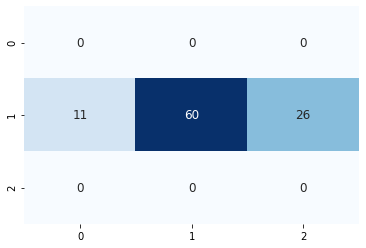

97/97 [==============================] - 0s 284us/sample - loss: 0.9186 - accuracy: 0.6289


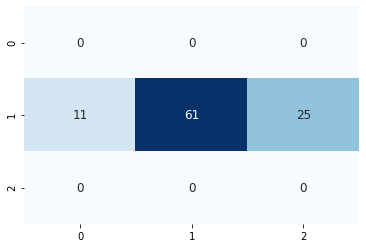

96/96 [==============================] - 0s 2ms/sample - loss: 0.6643 - accuracy: 0.7292


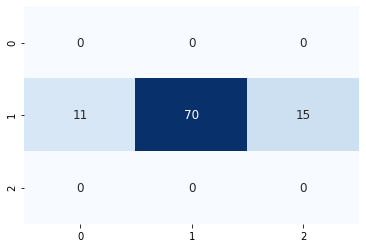

97/97 [==============================] - 0s 322us/sample - loss: 0.7563 - accuracy: 0.6392


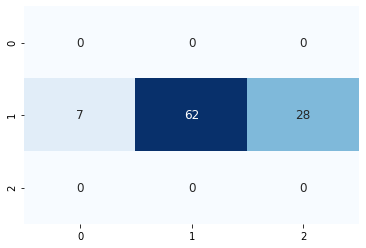

96/96 [==============================] - 0s 238us/sample - loss: 0.7132 - accuracy: 0.6875


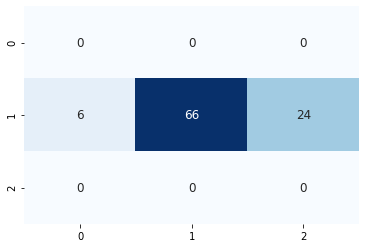

94/94 [==============================] - 0s 281us/sample - loss: 0.8564 - accuracy: 0.6596


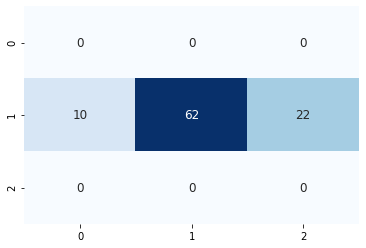

94/94 [==============================] - 0s 263us/sample - loss: 0.8212 - accuracy: 0.6277


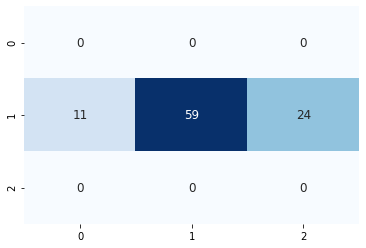

92/92 [==============================] - 0s 271us/sample - loss: 0.8130 - accuracy: 0.6739


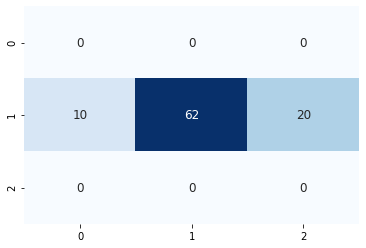

94/94 [==============================] - 0s 330us/sample - loss: 0.7590 - accuracy: 0.6915


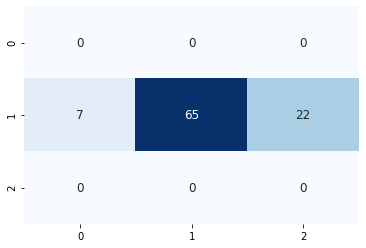

92/92 [==============================] - 0s 279us/sample - loss: 0.6757 - accuracy: 0.6848


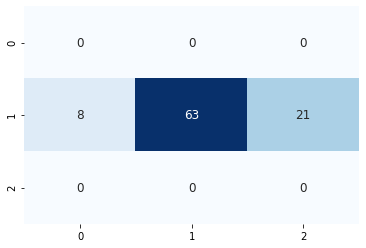

90/90 [==============================] - 0s 294us/sample - loss: 0.8188 - accuracy: 0.6556


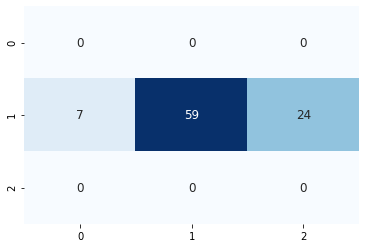

92/92 [==============================] - 0s 263us/sample - loss: 0.8355 - accuracy: 0.6522


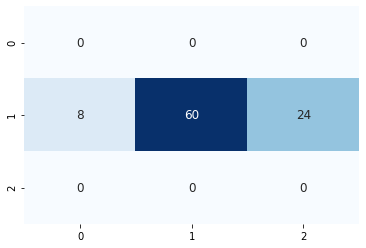

92/92 [==============================] - 0s 297us/sample - loss: 0.8299 - accuracy: 0.6522


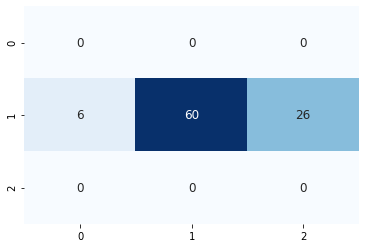

94/94 [==============================] - 0s 266us/sample - loss: 0.7534 - accuracy: 0.7234


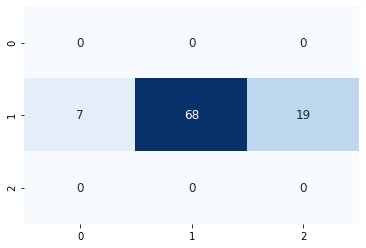

93/93 [==============================] - 0s 297us/sample - loss: 0.9594 - accuracy: 0.6237


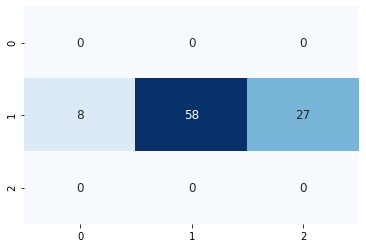

94/94 [==============================] - 0s 267us/sample - loss: 0.9769 - accuracy: 0.6809


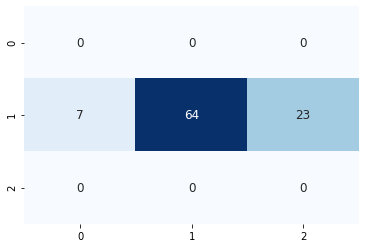

93/93 [==============================] - 0s 297us/sample - loss: 0.8584 - accuracy: 0.7204


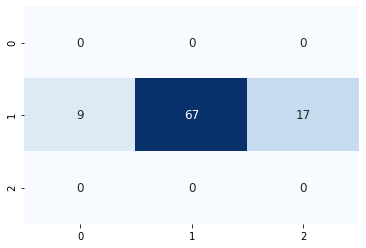

91/91 [==============================] - 0s 243us/sample - loss: 0.9246 - accuracy: 0.6703


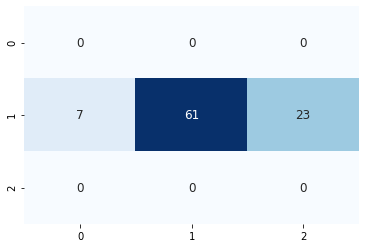

92/92 [==============================] - 0s 278us/sample - loss: 0.8473 - accuracy: 0.5543


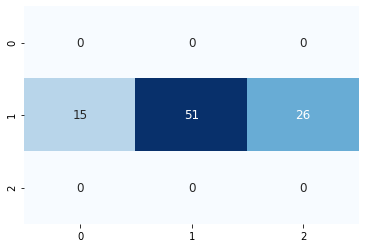

90/90 [==============================] - 0s 258us/sample - loss: 0.8383 - accuracy: 0.6667


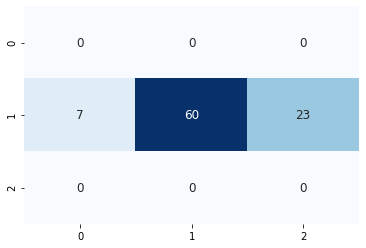

89/89 [==============================] - 0s 272us/sample - loss: 0.8402 - accuracy: 0.6966


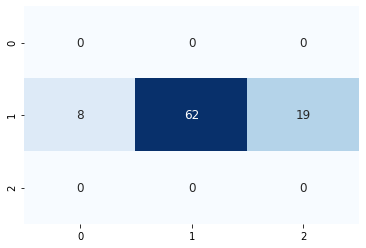

89/89 [==============================] - 0s 293us/sample - loss: 0.9040 - accuracy: 0.6180


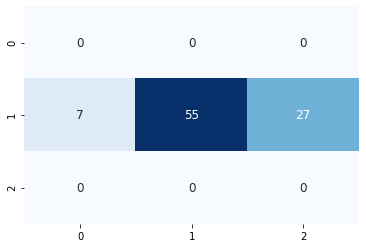

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3893 samples, validate on 1021 samples
Epoch 1/300
3893/3893 [==============================] - 3s 678us/sample - loss: 0.9052 - accuracy: 0.5823 - val_loss: 0.9979 - val_accuracy: 0.5455
Epoch 2/300
3893/3893 [==============================] - 1s 220us/sample - loss: 0.6789 - accuracy: 0.7344 - val_loss: 1.0319 - val_accuracy: 0.5338
Epoch 3/300
3893/3893 [==============================] - 1s 233us/sample - loss: 0.5276 - accuracy: 0.8112 - val_loss: 1.1123 - val_accuracy: 0.5240
Epoch 4/300
3893/3893 [==============================] - 1s 237us/sample - loss: 0.3965 - accuracy: 0.8759 - val_loss: 1.2154 - val_accuracy: 0.4995
Epoch 00004: early stopping
75/75 [==============================] - 0s 280us/sample - loss: 0.6538 - accuracy: 0.7067


11it [5:42:14, 1901.52s/it]
100%|██████████| 3/3 [00:06<00:00,  2.10s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.671875 steps, validate for 75.267578125 steps
Epoch 1/300
283/282 [==============================] - 30s 106ms/step - loss: 0.9438 - accuracy: 0.5643 - val_loss: 0.9902 - val_accuracy: 0.5481
Epoch 2/300
283/282 [==============================] - 28s 101ms/step - loss: 0.8793 - accuracy: 0.5956 - val_loss: 1.0209 - val_accuracy: 0.5363
Epoch 3/300
283/282 [==============================] - 28s 100ms/step - loss: 0.8484 - accuracy: 0.6128 - val_loss: 1.0407 - val_accuracy: 0.5324
Epoch 4/300
283/282 [==============================] - 29s 102ms/step - loss: 0.8235 - accuracy: 0.6261 - val_loss: 1.0818 - val_accuracy: 0.5080
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.671875 steps, validate for 75.267578125 steps
Epoch 1/300
283/282 [==============================] - 71s 250ms/step - loss: 0.7856 - accuracy: 0.6472 - val_loss: 1.3255 - val_accur

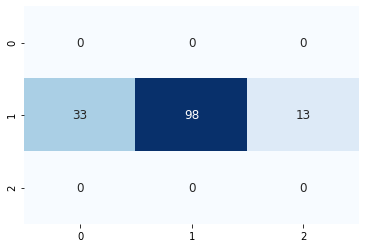

138/138 [==============================] - 0s 351us/sample - loss: 0.7181 - accuracy: 0.7609


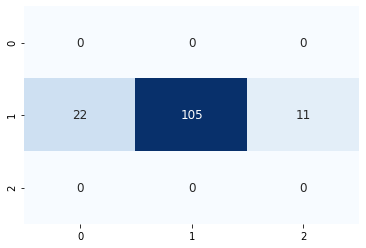

138/138 [==============================] - 0s 252us/sample - loss: 0.7120 - accuracy: 0.7319


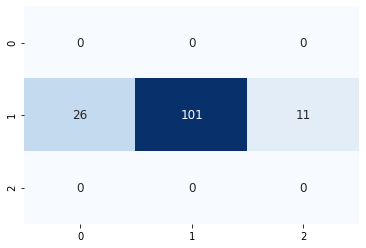

137/137 [==============================] - 0s 246us/sample - loss: 0.6396 - accuracy: 0.7956


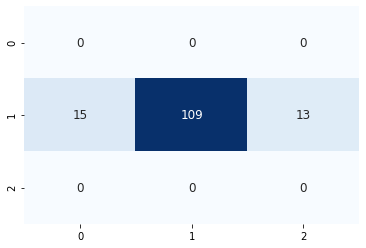

137/137 [==============================] - 0s 252us/sample - loss: 0.7561 - accuracy: 0.6788


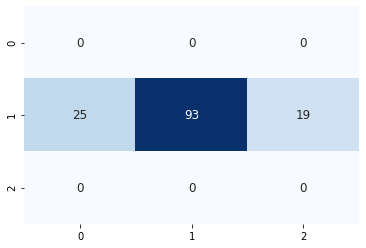

137/137 [==============================] - 0s 308us/sample - loss: 0.7338 - accuracy: 0.7299


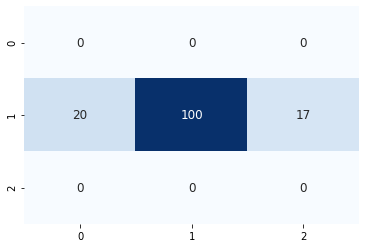

136/136 [==============================] - 0s 276us/sample - loss: 0.6879 - accuracy: 0.6912


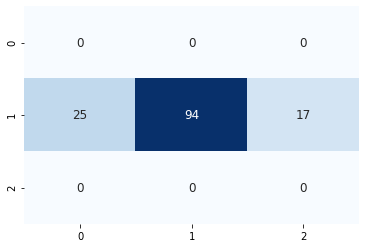

135/135 [==============================] - 0s 264us/sample - loss: 0.7633 - accuracy: 0.6963


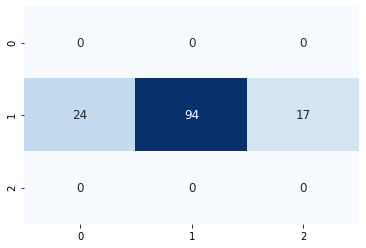

133/133 [==============================] - 0s 277us/sample - loss: 0.7377 - accuracy: 0.7293


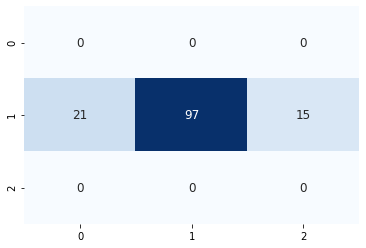

134/134 [==============================] - 0s 397us/sample - loss: 0.7994 - accuracy: 0.6791


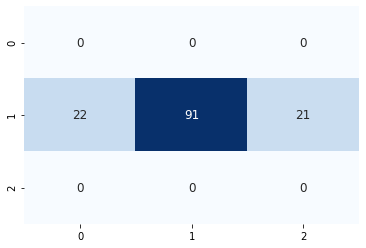

134/134 [==============================] - 0s 254us/sample - loss: 0.7382 - accuracy: 0.7463


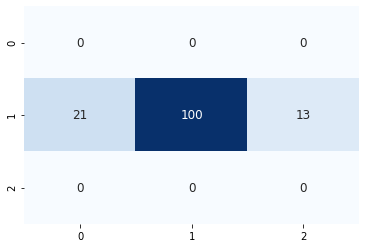

133/133 [==============================] - 0s 276us/sample - loss: 0.7607 - accuracy: 0.7293


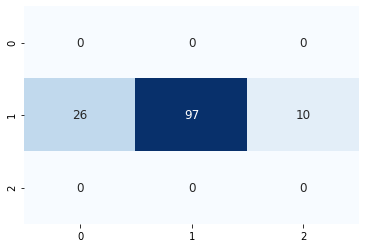

133/133 [==============================] - 0s 260us/sample - loss: 0.6596 - accuracy: 0.7519


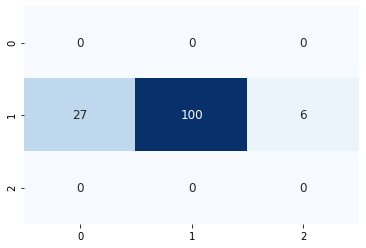

133/133 [==============================] - 0s 280us/sample - loss: 0.6426 - accuracy: 0.7669


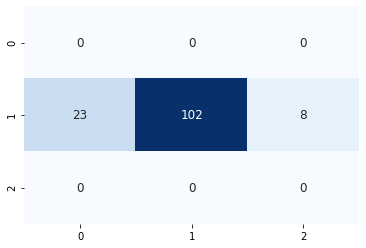

129/129 [==============================] - 0s 275us/sample - loss: 0.6338 - accuracy: 0.7674


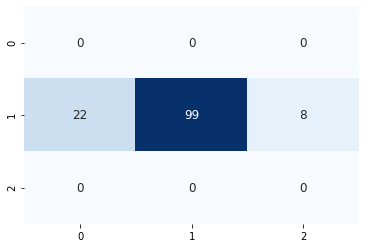

129/129 [==============================] - 0s 275us/sample - loss: 0.7670 - accuracy: 0.6744


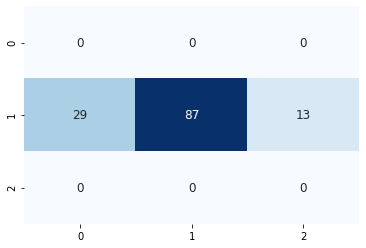

132/132 [==============================] - 0s 278us/sample - loss: 0.7121 - accuracy: 0.7121


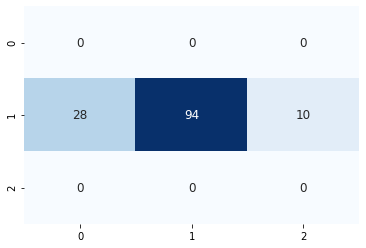

129/129 [==============================] - 0s 253us/sample - loss: 0.7150 - accuracy: 0.6667


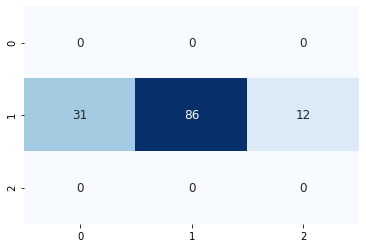

131/131 [==============================] - 0s 293us/sample - loss: 0.7450 - accuracy: 0.7099


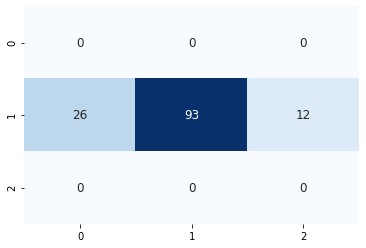

130/130 [==============================] - 0s 257us/sample - loss: 0.7649 - accuracy: 0.6538


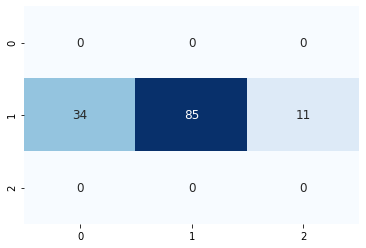

129/129 [==============================] - 0s 283us/sample - loss: 0.6856 - accuracy: 0.7209


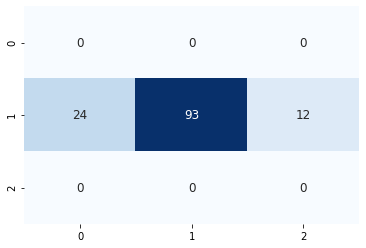

127/127 [==============================] - 0s 256us/sample - loss: 0.7778 - accuracy: 0.6378


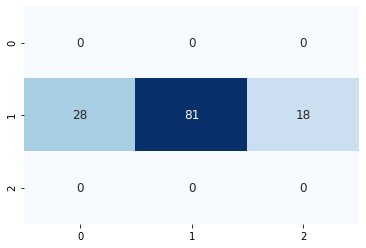

124/124 [==============================] - 0s 238us/sample - loss: 0.7506 - accuracy: 0.6855


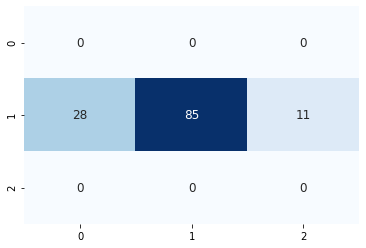

128/128 [==============================] - 0s 2ms/sample - loss: 0.7740 - accuracy: 0.6562


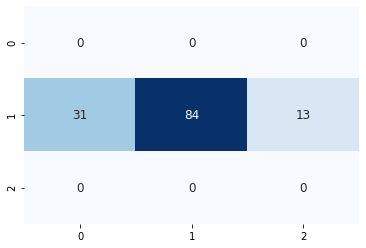

128/128 [==============================] - 0s 222us/sample - loss: 0.7910 - accuracy: 0.6797


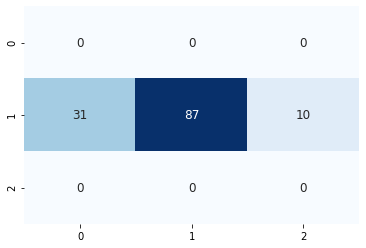

126/126 [==============================] - 0s 240us/sample - loss: 0.7809 - accuracy: 0.6429


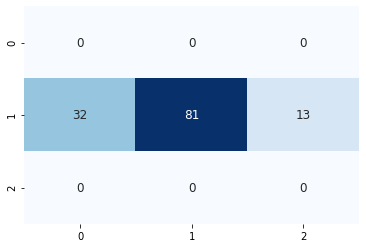

124/124 [==============================] - 0s 254us/sample - loss: 0.6907 - accuracy: 0.7016


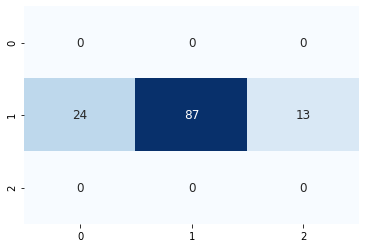

124/124 [==============================] - 0s 238us/sample - loss: 0.7227 - accuracy: 0.7258


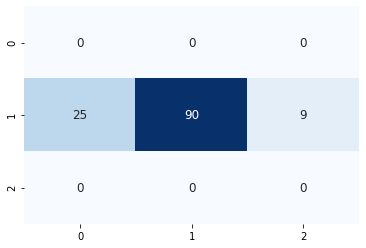

124/124 [==============================] - 0s 267us/sample - loss: 0.7942 - accuracy: 0.6613


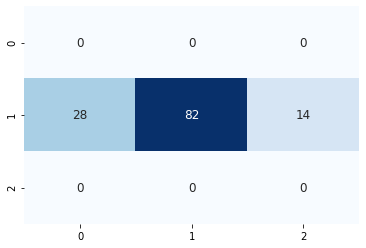

125/125 [==============================] - 0s 285us/sample - loss: 0.8435 - accuracy: 0.6560


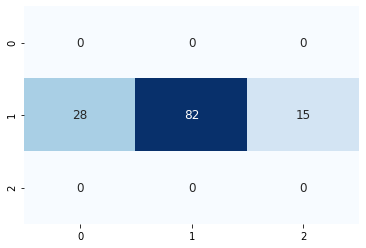

126/126 [==============================] - 0s 275us/sample - loss: 0.8662 - accuracy: 0.6349


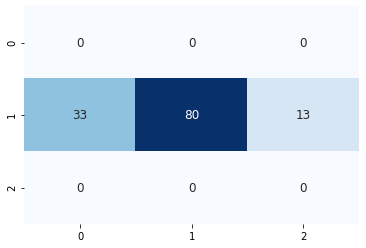

123/123 [==============================] - 0s 255us/sample - loss: 0.8143 - accuracy: 0.6829


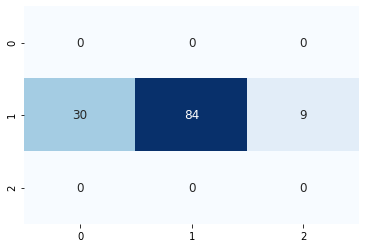

124/124 [==============================] - 0s 268us/sample - loss: 0.7361 - accuracy: 0.6613


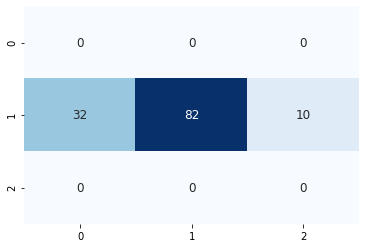

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3859 samples, validate on 1013 samples
Epoch 1/300
3859/3859 [==============================] - 3s 683us/sample - loss: 0.8852 - accuracy: 0.5900 - val_loss: 0.9953 - val_accuracy: 0.5459
Epoch 2/300
3859/3859 [==============================] - 1s 203us/sample - loss: 0.5946 - accuracy: 0.7795 - val_loss: 1.0970 - val_accuracy: 0.5262
Epoch 3/300
3859/3859 [==============================] - 1s 198us/sample - loss: 0.3916 - accuracy: 0.8735 - val_loss: 1.2748 - val_accuracy: 0.4886
Epoch 4/300
3859/3859 [==============================] - 1s 209us/sample - loss: 0.2663 - accuracy: 0.9293 - val_loss: 1.4355 - val_accuracy: 0.5054
Epoch 00004: early stopping
117/117 [==============================] - 0s 121us/sample - loss: 0.6863 - accuracy: 0.7521


12it [6:16:17, 1944.07s/it]
100%|██████████| 3/3 [00:06<00:00,  2.18s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.017578125 steps, validate for 74.357421875 steps
Epoch 1/300
285/284 [==============================] - 29s 103ms/step - loss: 0.9478 - accuracy: 0.5607 - val_loss: 0.9980 - val_accuracy: 0.5438
Epoch 2/300
285/284 [==============================] - 28s 99ms/step - loss: 0.8805 - accuracy: 0.5962 - val_loss: 1.0260 - val_accuracy: 0.5394
Epoch 3/300
285/284 [==============================] - 28s 99ms/step - loss: 0.8509 - accuracy: 0.6116 - val_loss: 1.0631 - val_accuracy: 0.5294
Epoch 4/300
285/284 [==============================] - 29s 100ms/step - loss: 0.8271 - accuracy: 0.6245 - val_loss: 1.0797 - val_accuracy: 0.5107
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.017578125 steps, validate for 74.357421875 steps
Epoch 1/300
285/284 [==============================] - 69s 242ms/step - loss: 0.7899 - accuracy: 0.6462 - val_loss: 1.1489 - val_a

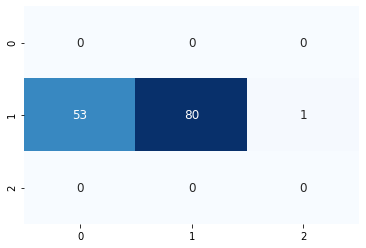

134/134 [==============================] - 0s 239us/sample - loss: 0.9326 - accuracy: 0.4851


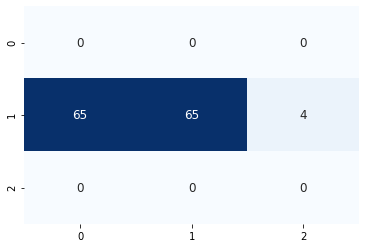

131/131 [==============================] - 0s 253us/sample - loss: 1.0570 - accuracy: 0.4351


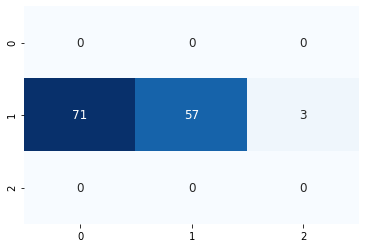

129/129 [==============================] - 0s 262us/sample - loss: 0.9606 - accuracy: 0.4651


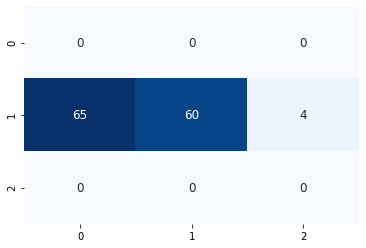

129/129 [==============================] - 0s 247us/sample - loss: 0.9702 - accuracy: 0.4884


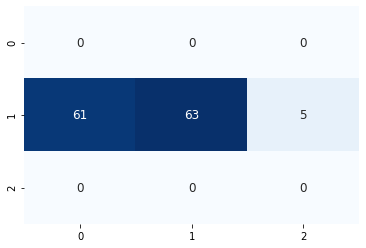

129/129 [==============================] - 0s 277us/sample - loss: 0.9239 - accuracy: 0.4729


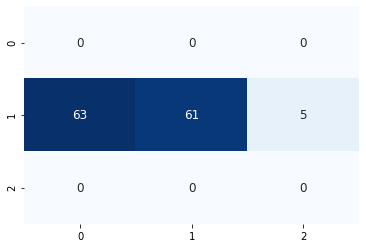

128/128 [==============================] - 0s 2ms/sample - loss: 0.9686 - accuracy: 0.5000


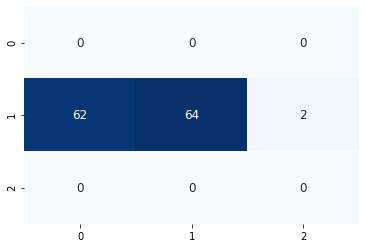

126/126 [==============================] - 0s 277us/sample - loss: 0.9602 - accuracy: 0.4524


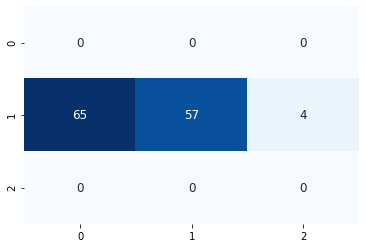

125/125 [==============================] - 0s 319us/sample - loss: 0.9448 - accuracy: 0.5040


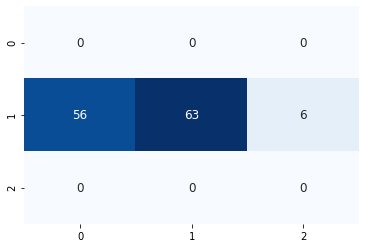

126/126 [==============================] - 0s 266us/sample - loss: 0.9776 - accuracy: 0.4524


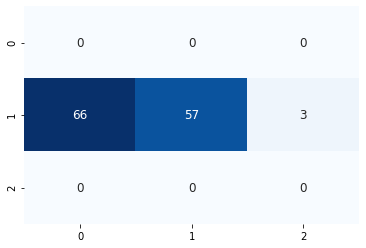

126/126 [==============================] - 0s 272us/sample - loss: 0.9593 - accuracy: 0.4444


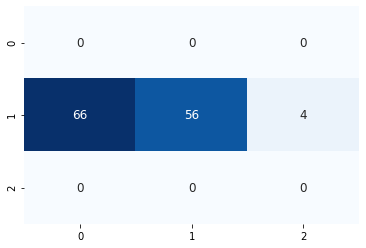

126/126 [==============================] - 0s 262us/sample - loss: 0.9898 - accuracy: 0.4206


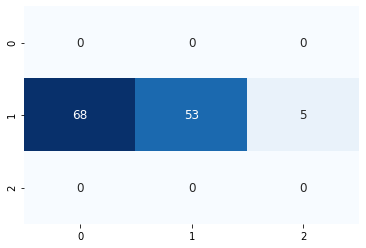

125/125 [==============================] - 0s 246us/sample - loss: 0.9529 - accuracy: 0.4800


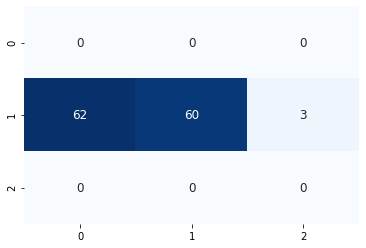

126/126 [==============================] - 0s 285us/sample - loss: 1.0132 - accuracy: 0.4444


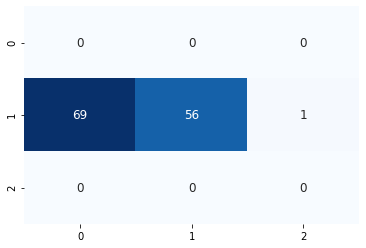

123/123 [==============================] - 0s 270us/sample - loss: 1.1057 - accuracy: 0.3902


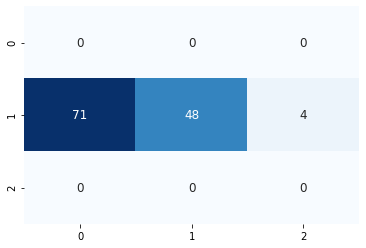

121/121 [==============================] - 0s 324us/sample - loss: 1.1136 - accuracy: 0.3306


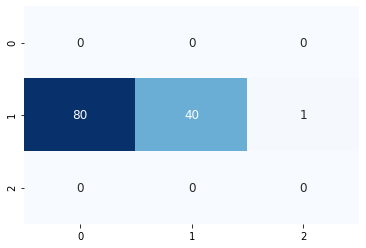

122/122 [==============================] - 0s 247us/sample - loss: 0.9963 - accuracy: 0.4508


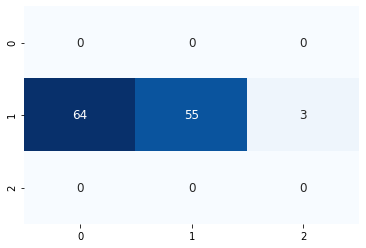

120/120 [==============================] - 0s 256us/sample - loss: 1.0848 - accuracy: 0.3667


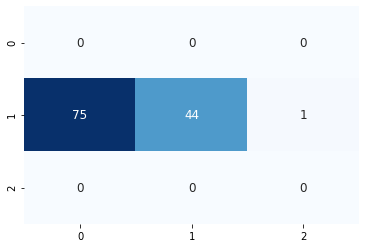

121/121 [==============================] - 0s 271us/sample - loss: 1.0031 - accuracy: 0.4298


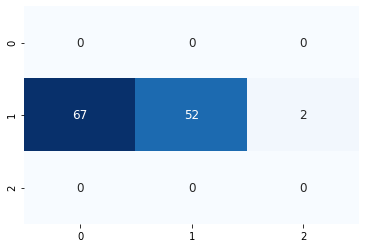

121/121 [==============================] - 0s 258us/sample - loss: 1.0949 - accuracy: 0.3802


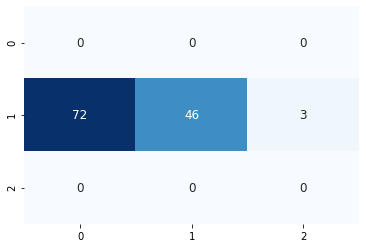

123/123 [==============================] - 0s 277us/sample - loss: 1.1675 - accuracy: 0.3821


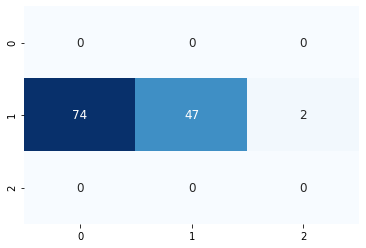

123/123 [==============================] - 0s 237us/sample - loss: 1.1310 - accuracy: 0.3902


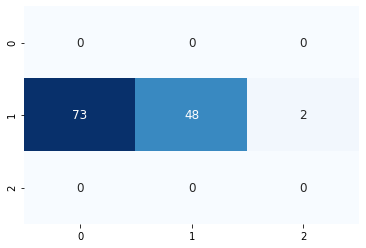

123/123 [==============================] - 0s 264us/sample - loss: 1.0803 - accuracy: 0.3902


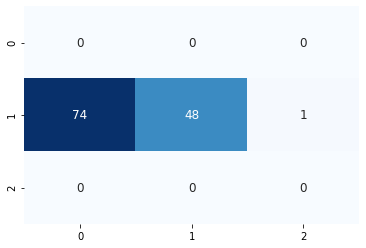

122/122 [==============================] - 0s 268us/sample - loss: 1.1029 - accuracy: 0.3607


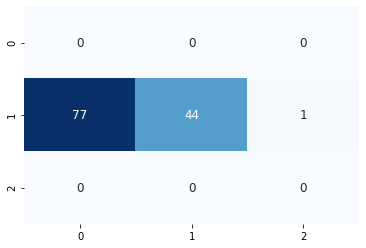

122/122 [==============================] - 0s 278us/sample - loss: 1.0146 - accuracy: 0.4344


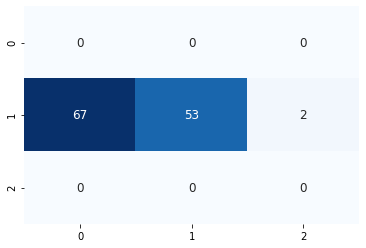

121/121 [==============================] - 0s 260us/sample - loss: 1.0935 - accuracy: 0.3636


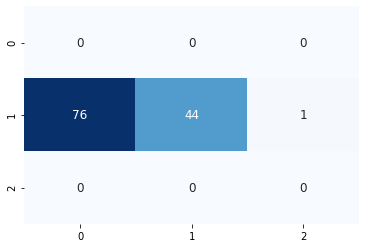

119/119 [==============================] - 0s 289us/sample - loss: 1.0997 - accuracy: 0.3697


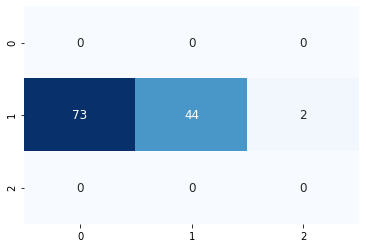

119/119 [==============================] - 0s 247us/sample - loss: 1.1769 - accuracy: 0.3109


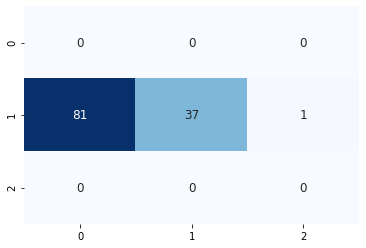

120/120 [==============================] - 0s 268us/sample - loss: 1.0943 - accuracy: 0.3667


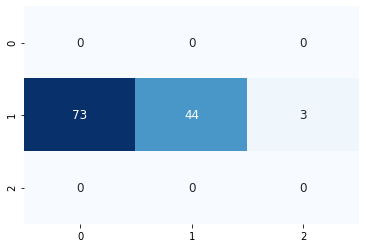

120/120 [==============================] - 0s 262us/sample - loss: 1.1338 - accuracy: 0.3833


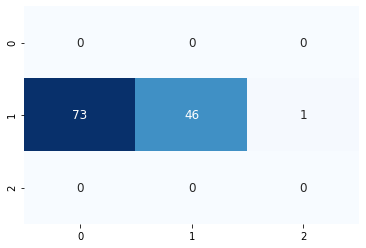

119/119 [==============================] - 0s 305us/sample - loss: 1.1505 - accuracy: 0.3361


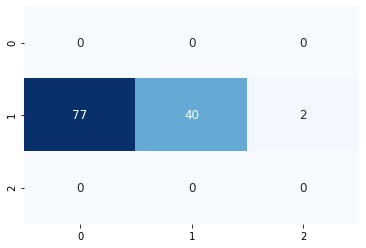

118/118 [==============================] - 0s 256us/sample - loss: 1.1167 - accuracy: 0.3644


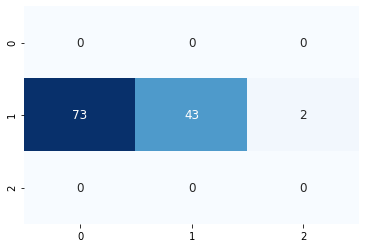

120/120 [==============================] - 0s 258us/sample - loss: 1.1882 - accuracy: 0.4000


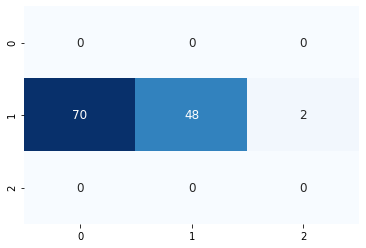

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3880 samples, validate on 999 samples
Epoch 1/300
3880/3880 [==============================] - 3s 666us/sample - loss: 0.9635 - accuracy: 0.5402 - val_loss: 1.0219 - val_accuracy: 0.5335
Epoch 2/300
3880/3880 [==============================] - 1s 213us/sample - loss: 0.8036 - accuracy: 0.6448 - val_loss: 1.0329 - val_accuracy: 0.5305
Epoch 3/300
3880/3880 [==============================] - 1s 219us/sample - loss: 0.7205 - accuracy: 0.6938 - val_loss: 1.0571 - val_accuracy: 0.5205
Epoch 4/300
3880/3880 [==============================] - 1s 214us/sample - loss: 0.6440 - accuracy: 0.7438 - val_loss: 1.0985 - val_accuracy: 0.5045
Epoch 00004: early stopping
110/110 [==============================] - 0s 157us/sample - loss: 0.6329 - accuracy: 0.7364


13it [6:46:12, 1899.25s/it]
100%|██████████| 3/3 [00:06<00:00,  2.08s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.400390625 steps, validate for 74.830078125 steps
Epoch 1/300
283/282 [==============================] - 31s 108ms/step - loss: 0.9385 - accuracy: 0.5667 - val_loss: 0.9838 - val_accuracy: 0.5496
Epoch 2/300
283/282 [==============================] - 28s 100ms/step - loss: 0.8802 - accuracy: 0.5968 - val_loss: 1.0046 - val_accuracy: 0.5385
Epoch 3/300
283/282 [==============================] - 29s 101ms/step - loss: 0.8498 - accuracy: 0.6124 - val_loss: 1.0221 - val_accuracy: 0.5299
Epoch 4/300
283/282 [==============================] - 28s 101ms/step - loss: 0.8244 - accuracy: 0.6263 - val_loss: 1.0383 - val_accuracy: 0.5283
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.400390625 steps, validate for 74.830078125 steps
Epoch 1/300
283/282 [==============================] - 70s 246ms/step - loss: 0.7867 - accuracy: 0.6482 - val_loss: 1.1675 - val

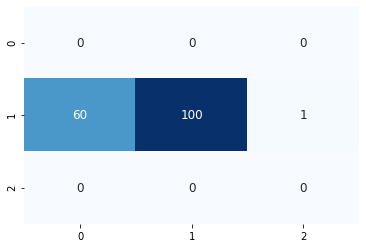

155/155 [==============================] - 0s 218us/sample - loss: 0.8429 - accuracy: 0.5806


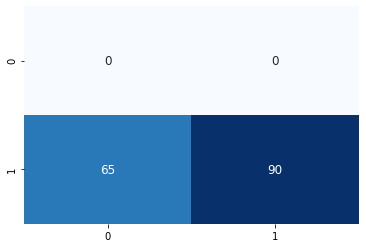

153/153 [==============================] - 0s 248us/sample - loss: 0.7981 - accuracy: 0.6144


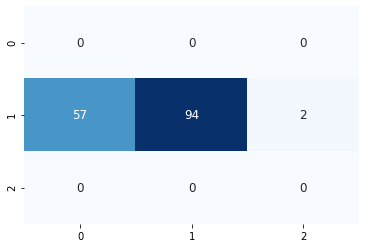

153/153 [==============================] - 0s 219us/sample - loss: 0.9019 - accuracy: 0.5556


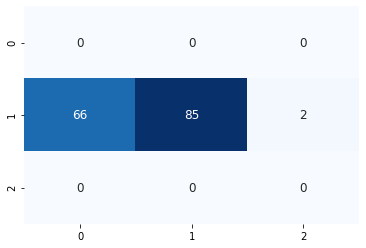

151/151 [==============================] - 0s 224us/sample - loss: 0.7460 - accuracy: 0.6159


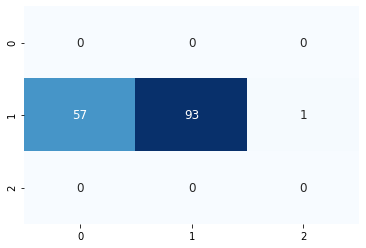

149/149 [==============================] - 0s 242us/sample - loss: 0.8038 - accuracy: 0.5772


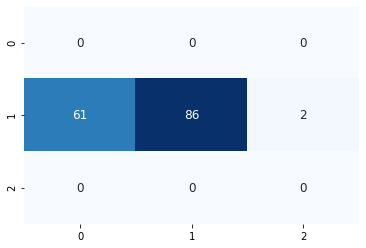

149/149 [==============================] - 0s 254us/sample - loss: 0.7370 - accuracy: 0.6309


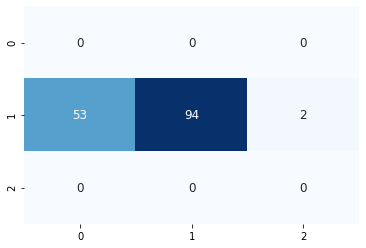

149/149 [==============================] - 0s 287us/sample - loss: 0.8928 - accuracy: 0.5906


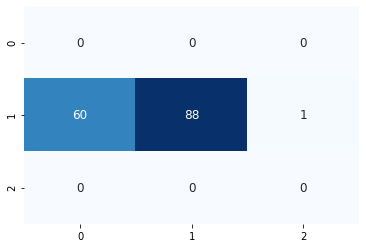

149/149 [==============================] - 0s 251us/sample - loss: 0.8235 - accuracy: 0.6242


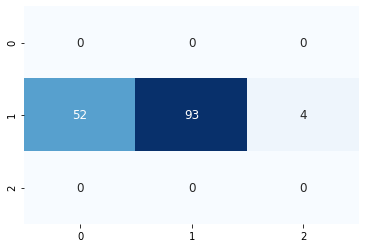

149/149 [==============================] - 0s 251us/sample - loss: 0.7519 - accuracy: 0.6174


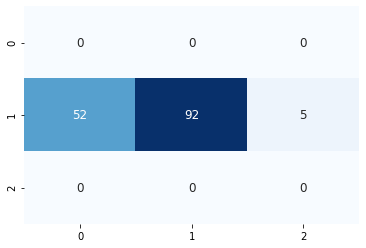

149/149 [==============================] - 0s 232us/sample - loss: 0.7921 - accuracy: 0.6309


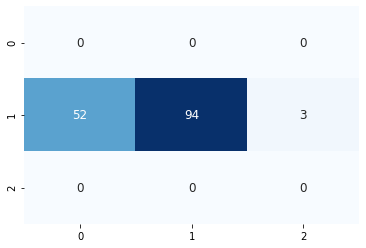

146/146 [==============================] - 0s 267us/sample - loss: 0.7699 - accuracy: 0.5822


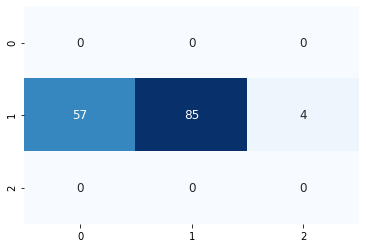

146/146 [==============================] - 0s 267us/sample - loss: 0.8630 - accuracy: 0.5548


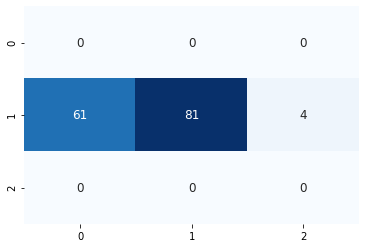

141/141 [==============================] - 0s 284us/sample - loss: 0.8434 - accuracy: 0.5461


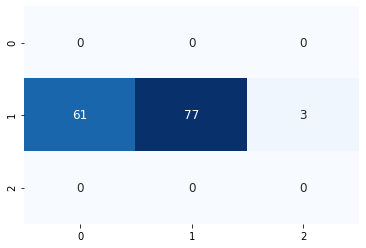

142/142 [==============================] - 0s 262us/sample - loss: 0.8321 - accuracy: 0.6056


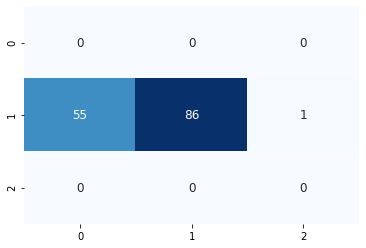

140/140 [==============================] - 0s 274us/sample - loss: 0.8000 - accuracy: 0.5929


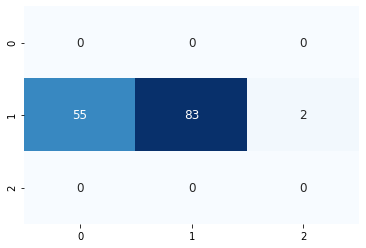

139/139 [==============================] - 0s 246us/sample - loss: 0.8279 - accuracy: 0.5899


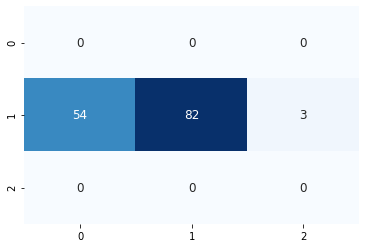

140/140 [==============================] - 0s 269us/sample - loss: 0.8628 - accuracy: 0.5857


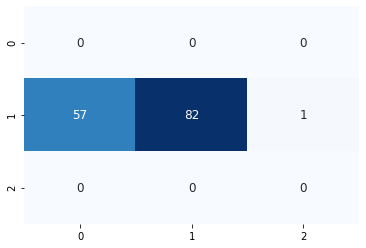

135/135 [==============================] - 0s 254us/sample - loss: 0.9221 - accuracy: 0.5778


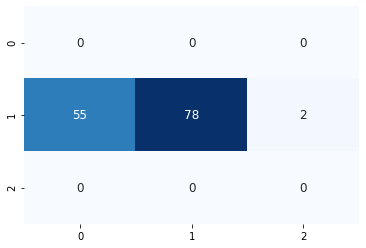

136/136 [==============================] - 0s 253us/sample - loss: 0.9960 - accuracy: 0.5147


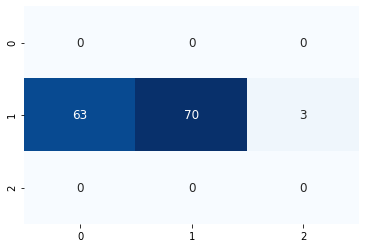

137/137 [==============================] - 0s 266us/sample - loss: 0.7915 - accuracy: 0.6496


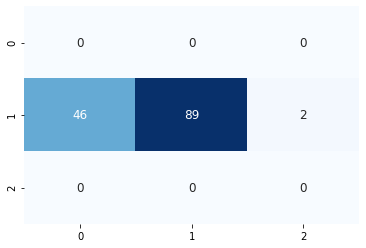

137/137 [==============================] - 0s 274us/sample - loss: 0.8215 - accuracy: 0.6204


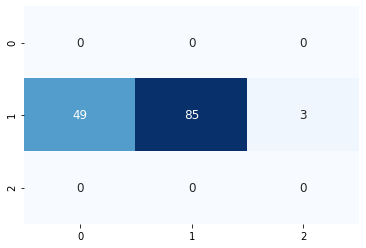

135/135 [==============================] - 0s 258us/sample - loss: 0.8854 - accuracy: 0.5852


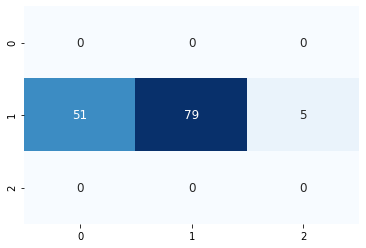

136/136 [==============================] - 0s 276us/sample - loss: 0.9117 - accuracy: 0.5662


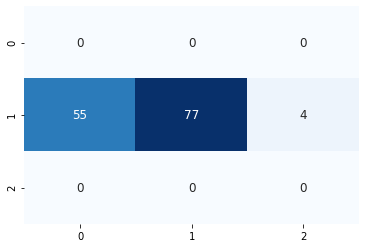

136/136 [==============================] - 0s 272us/sample - loss: 0.8672 - accuracy: 0.5956


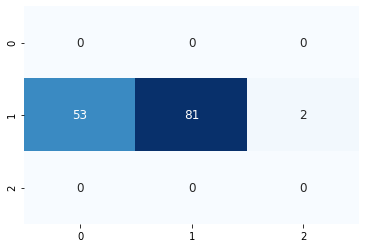

134/134 [==============================] - 0s 276us/sample - loss: 0.8320 - accuracy: 0.5821


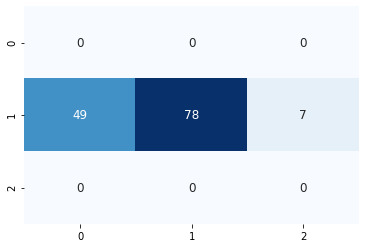

134/134 [==============================] - 0s 280us/sample - loss: 0.8765 - accuracy: 0.5672


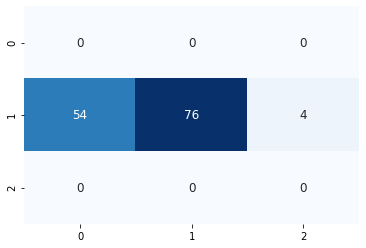

134/134 [==============================] - 0s 306us/sample - loss: 0.8918 - accuracy: 0.4851


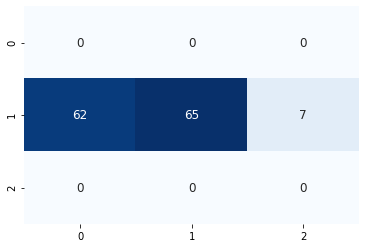

136/136 [==============================] - 0s 256us/sample - loss: 0.8929 - accuracy: 0.5735


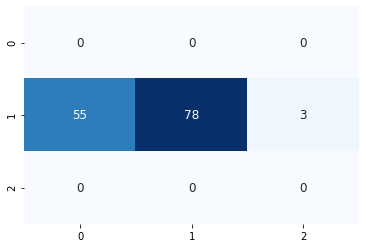

134/134 [==============================] - 0s 333us/sample - loss: 0.9404 - accuracy: 0.5299


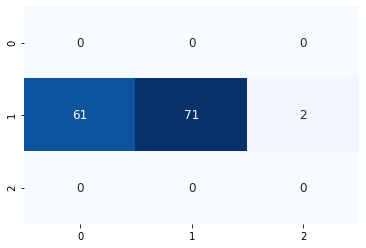

133/133 [==============================] - 0s 271us/sample - loss: 0.8911 - accuracy: 0.6165


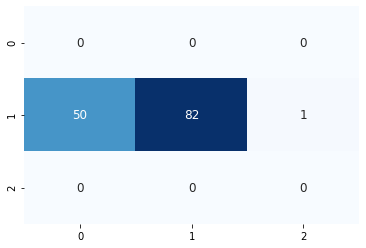

129/129 [==============================] - 0s 277us/sample - loss: 0.9329 - accuracy: 0.5891


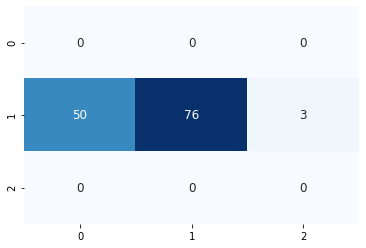

130/130 [==============================] - 0s 261us/sample - loss: 0.9668 - accuracy: 0.5462


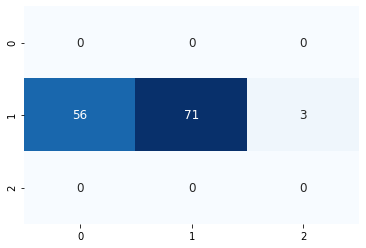

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3862 samples, validate on 1007 samples
Epoch 1/300
3862/3862 [==============================] - 3s 654us/sample - loss: 1.0158 - accuracy: 0.4894 - val_loss: 0.9987 - val_accuracy: 0.5372
Epoch 2/300
3862/3862 [==============================] - 1s 207us/sample - loss: 0.8474 - accuracy: 0.6248 - val_loss: 0.9901 - val_accuracy: 0.5531
Epoch 3/300
3862/3862 [==============================] - 1s 206us/sample - loss: 0.7549 - accuracy: 0.6735 - val_loss: 1.0068 - val_accuracy: 0.5452
Epoch 4/300
3862/3862 [==============================] - 1s 231us/sample - loss: 0.6742 - accuracy: 0.7191 - val_loss: 1.0398 - val_accuracy: 0.5293
Epoch 5/300
3862/3862 [==============================] - 1s 211us/sample - loss: 0.6057 - accuracy: 0.7618 - val_loss: 1.0841 - val_accuracy: 0.5084
Epoch 00005: early stopping
120/120 [==============================] - 0s 124us/sample - loss: 0.9381 - accuracy: 0.5333


14it [7:16:29, 1874.45s/it]
100%|██████████| 3/3 [00:06<00:00,  2.17s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.4453125 steps, validate for 74.890625 steps
Epoch 1/300
285/284 [==============================] - 31s 107ms/step - loss: 0.9454 - accuracy: 0.5651 - val_loss: 1.0011 - val_accuracy: 0.5516
Epoch 2/300
285/284 [==============================] - 28s 98ms/step - loss: 0.8773 - accuracy: 0.5994 - val_loss: 1.0117 - val_accuracy: 0.5449
Epoch 3/300
285/284 [==============================] - 28s 99ms/step - loss: 0.8453 - accuracy: 0.6161 - val_loss: 1.0330 - val_accuracy: 0.5248
Epoch 4/300
285/284 [==============================] - 29s 101ms/step - loss: 0.8190 - accuracy: 0.6303 - val_loss: 1.0733 - val_accuracy: 0.5288
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.4453125 steps, validate for 74.890625 steps
Epoch 1/300
285/284 [==============================] - 69s 242ms/step - loss: 0.7778 - accuracy: 0.6531 - val_loss: 1.2391 - val_accuracy: 0

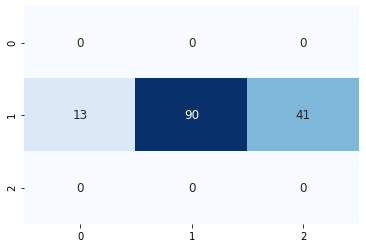

130/130 [==============================] - 0s 256us/sample - loss: 1.1823 - accuracy: 0.6000


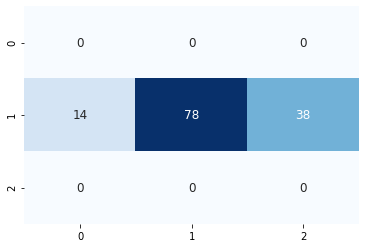

118/118 [==============================] - 0s 279us/sample - loss: 1.1805 - accuracy: 0.5847


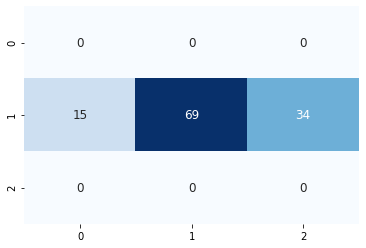

115/115 [==============================] - 0s 283us/sample - loss: 1.1429 - accuracy: 0.6348


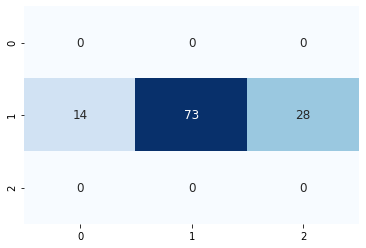

114/114 [==============================] - 0s 237us/sample - loss: 1.1275 - accuracy: 0.5789


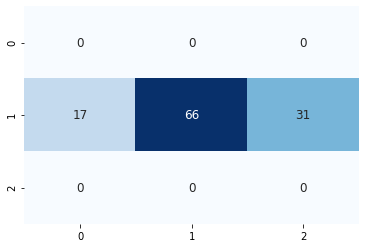

113/113 [==============================] - 0s 285us/sample - loss: 1.3230 - accuracy: 0.5664


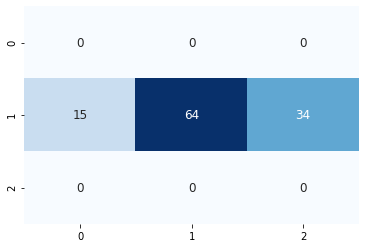

113/113 [==============================] - 0s 284us/sample - loss: 1.1887 - accuracy: 0.6018


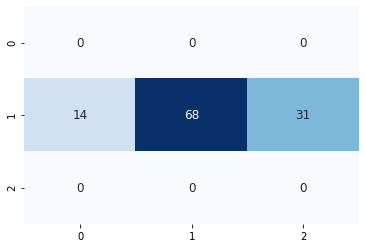

114/114 [==============================] - 0s 283us/sample - loss: 1.2511 - accuracy: 0.5614


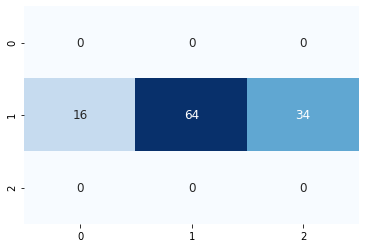

114/114 [==============================] - 0s 249us/sample - loss: 1.0502 - accuracy: 0.6667


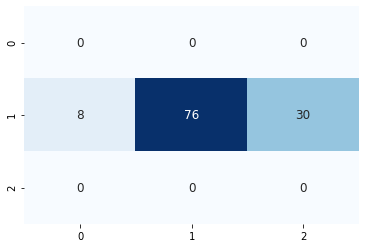

111/111 [==============================] - 0s 296us/sample - loss: 1.1391 - accuracy: 0.6486


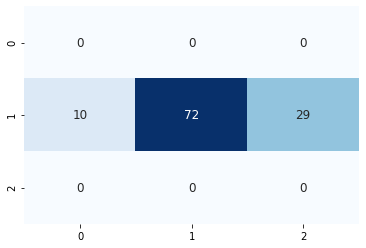

110/110 [==============================] - 0s 307us/sample - loss: 1.1180 - accuracy: 0.6364


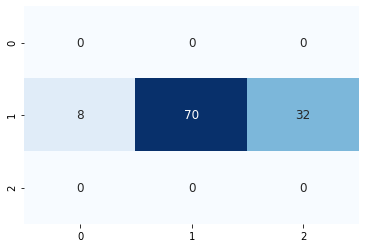

110/110 [==============================] - 0s 272us/sample - loss: 1.1493 - accuracy: 0.6182


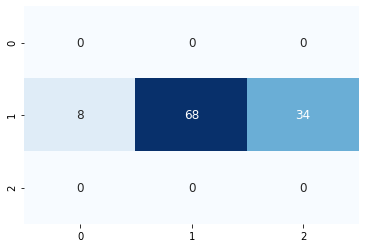

112/112 [==============================] - 0s 329us/sample - loss: 1.1656 - accuracy: 0.6429


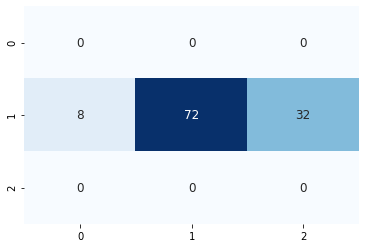

112/112 [==============================] - 0s 277us/sample - loss: 1.0419 - accuracy: 0.6161


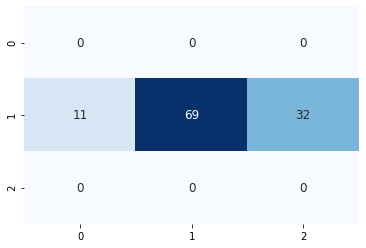

113/113 [==============================] - 0s 281us/sample - loss: 1.0507 - accuracy: 0.6726


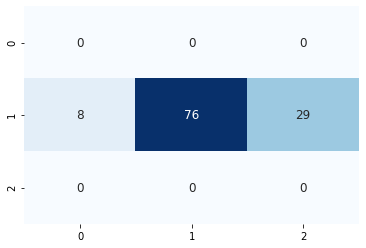

114/114 [==============================] - 0s 275us/sample - loss: 1.1220 - accuracy: 0.5526


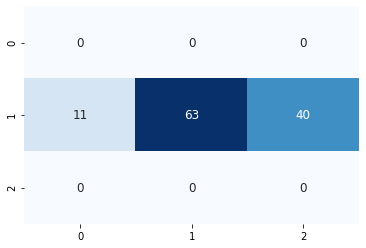

111/111 [==============================] - 0s 286us/sample - loss: 0.9995 - accuracy: 0.6216


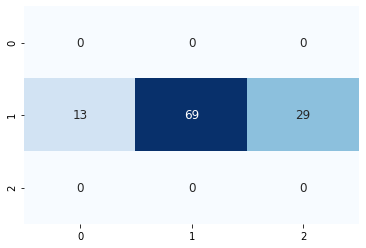

107/107 [==============================] - 0s 269us/sample - loss: 1.0427 - accuracy: 0.6729


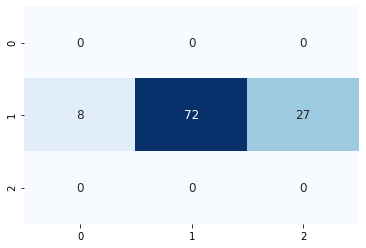

107/107 [==============================] - 0s 265us/sample - loss: 1.0238 - accuracy: 0.6636


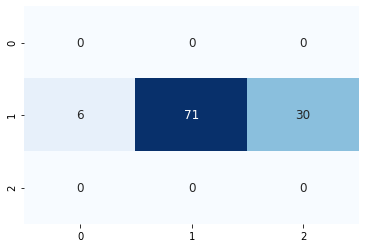

106/106 [==============================] - 0s 277us/sample - loss: 1.1372 - accuracy: 0.6415


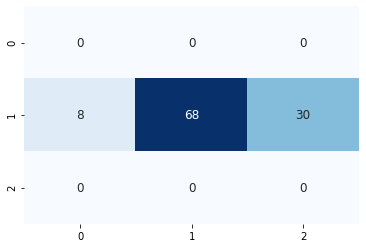

103/103 [==============================] - 0s 311us/sample - loss: 1.3177 - accuracy: 0.5825


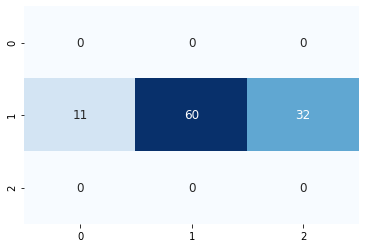

104/104 [==============================] - 0s 287us/sample - loss: 1.1464 - accuracy: 0.6058


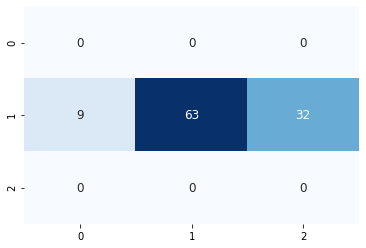

103/103 [==============================] - 0s 280us/sample - loss: 1.1642 - accuracy: 0.6602


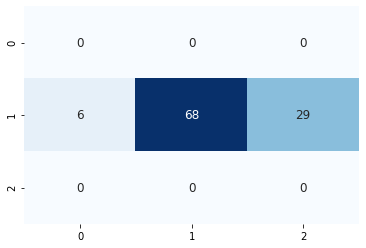

104/104 [==============================] - 0s 298us/sample - loss: 1.0823 - accuracy: 0.5673


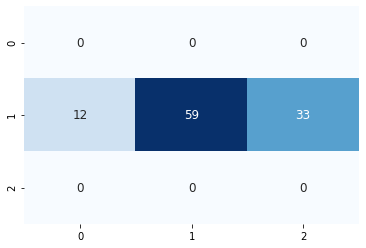

103/103 [==============================] - 0s 309us/sample - loss: 1.0431 - accuracy: 0.5922


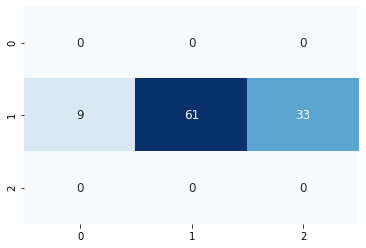

102/102 [==============================] - 0s 291us/sample - loss: 1.2924 - accuracy: 0.5882


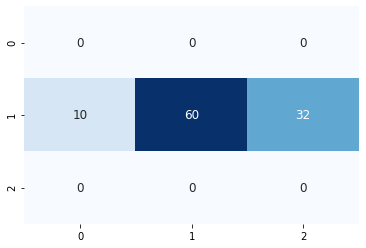

100/100 [==============================] - 0s 441us/sample - loss: 1.1216 - accuracy: 0.6300


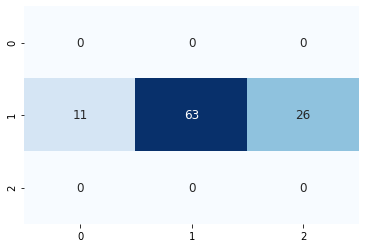

101/101 [==============================] - 0s 289us/sample - loss: 1.0383 - accuracy: 0.6238


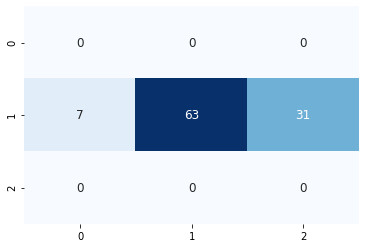

101/101 [==============================] - 0s 325us/sample - loss: 1.1013 - accuracy: 0.6040


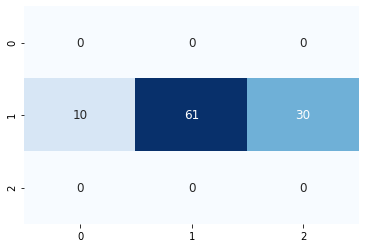

99/99 [==============================] - 0s 289us/sample - loss: 0.9798 - accuracy: 0.6970


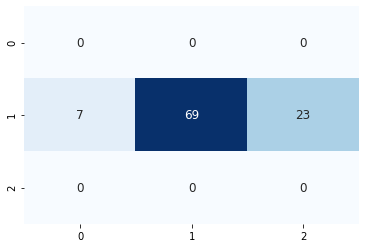

98/98 [==============================] - 0s 266us/sample - loss: 1.0771 - accuracy: 0.6939


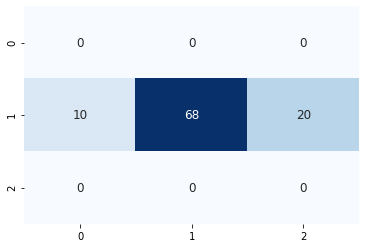

96/96 [==============================] - 0s 2ms/sample - loss: 1.0626 - accuracy: 0.6458


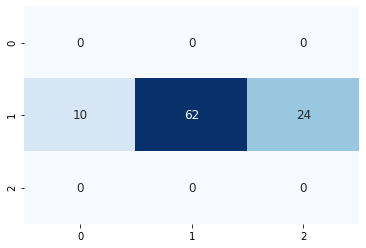

97/97 [==============================] - 0s 315us/sample - loss: 1.1028 - accuracy: 0.5773


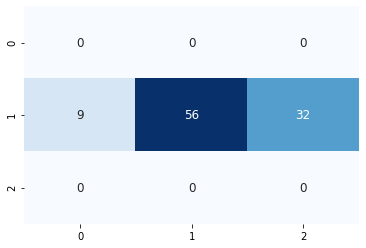

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3888 samples, validate on 1008 samples
Epoch 1/300
3888/3888 [==============================] - 3s 701us/sample - loss: 0.9753 - accuracy: 0.5085 - val_loss: 1.0229 - val_accuracy: 0.5357
Epoch 2/300
3888/3888 [==============================] - 1s 203us/sample - loss: 0.7686 - accuracy: 0.6590 - val_loss: 1.0439 - val_accuracy: 0.5298
Epoch 3/300
3888/3888 [==============================] - 1s 230us/sample - loss: 0.6202 - accuracy: 0.7657 - val_loss: 1.1069 - val_accuracy: 0.5198
Epoch 4/300
3888/3888 [==============================] - 1s 220us/sample - loss: 0.4719 - accuracy: 0.8457 - val_loss: 1.2083 - val_accuracy: 0.4960
Epoch 00004: early stopping
93/93 [==============================] - 0s 188us/sample - loss: 0.9889 - accuracy: 0.5054


15it [7:47:26, 1869.23s/it]
100%|██████████| 3/3 [00:06<00:00,  2.17s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.634765625 steps, validate for 74.767578125 steps
Epoch 1/300
284/283 [==============================] - 30s 107ms/step - loss: 0.9422 - accuracy: 0.5661 - val_loss: 1.0008 - val_accuracy: 0.5452
Epoch 2/300
284/283 [==============================] - 28s 99ms/step - loss: 0.8822 - accuracy: 0.5939 - val_loss: 1.0117 - val_accuracy: 0.5367
Epoch 3/300
284/283 [==============================] - 28s 100ms/step - loss: 0.8519 - accuracy: 0.6107 - val_loss: 1.0591 - val_accuracy: 0.5320
Epoch 4/300
284/283 [==============================] - 28s 99ms/step - loss: 0.8284 - accuracy: 0.6232 - val_loss: 1.0541 - val_accuracy: 0.5331
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.634765625 steps, validate for 74.767578125 steps
Epoch 1/300
284/283 [==============================] - 71s 250ms/step - loss: 0.7919 - accuracy: 0.6447 - val_loss: 1.2315 - val_a

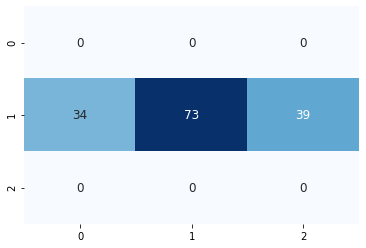

142/142 [==============================] - 0s 265us/sample - loss: 1.0591 - accuracy: 0.5141


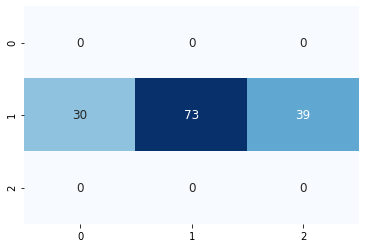

138/138 [==============================] - 0s 286us/sample - loss: 1.0541 - accuracy: 0.5145


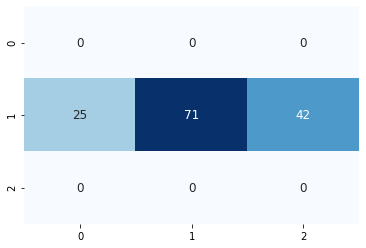

137/137 [==============================] - 0s 256us/sample - loss: 0.9513 - accuracy: 0.5474


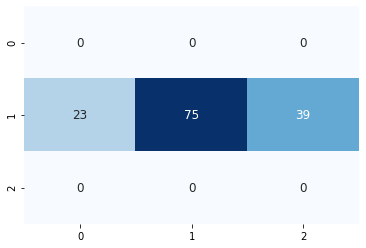

134/134 [==============================] - 0s 238us/sample - loss: 0.9818 - accuracy: 0.5746


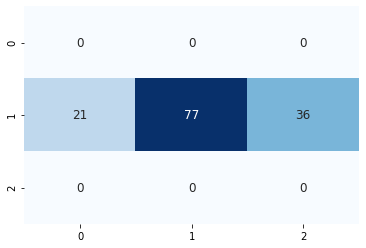

130/130 [==============================] - 0s 294us/sample - loss: 1.0040 - accuracy: 0.5385


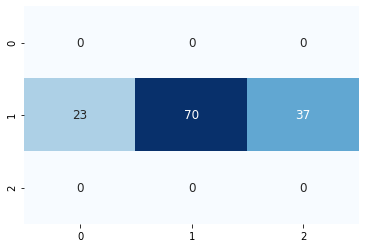

129/129 [==============================] - 0s 287us/sample - loss: 0.9821 - accuracy: 0.5736


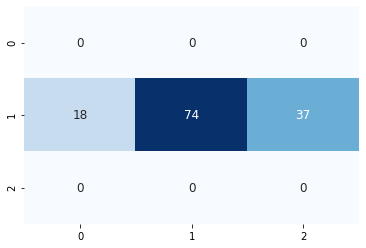

127/127 [==============================] - 0s 268us/sample - loss: 1.0999 - accuracy: 0.4961


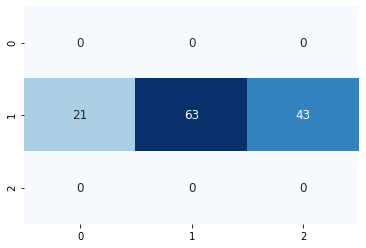

125/125 [==============================] - 0s 289us/sample - loss: 1.1197 - accuracy: 0.5280


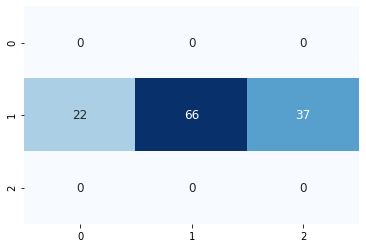

125/125 [==============================] - 0s 243us/sample - loss: 0.8982 - accuracy: 0.6160


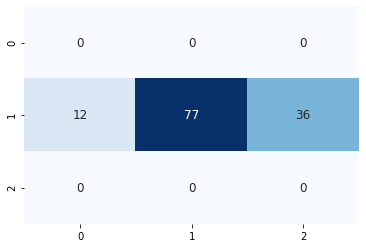

125/125 [==============================] - 0s 286us/sample - loss: 1.0157 - accuracy: 0.5600


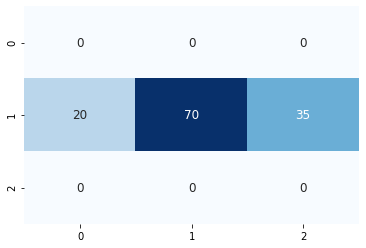

125/125 [==============================] - 0s 272us/sample - loss: 0.9715 - accuracy: 0.5840


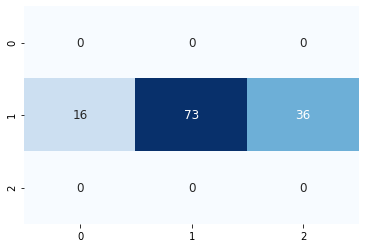

125/125 [==============================] - 0s 336us/sample - loss: 0.8659 - accuracy: 0.5600


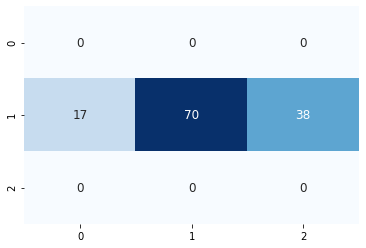

124/124 [==============================] - 0s 261us/sample - loss: 0.9783 - accuracy: 0.5806


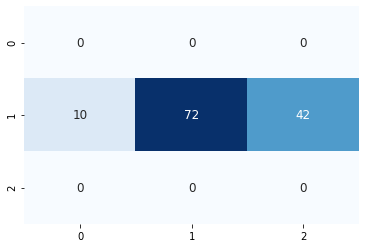

123/123 [==============================] - 0s 271us/sample - loss: 1.0605 - accuracy: 0.5285


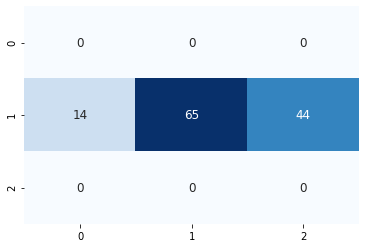

124/124 [==============================] - 0s 252us/sample - loss: 0.8269 - accuracy: 0.6855


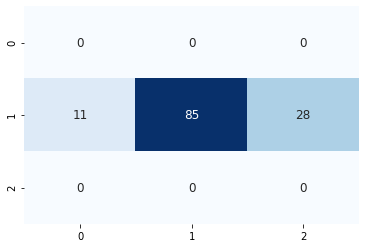

122/122 [==============================] - 0s 308us/sample - loss: 1.0437 - accuracy: 0.5164


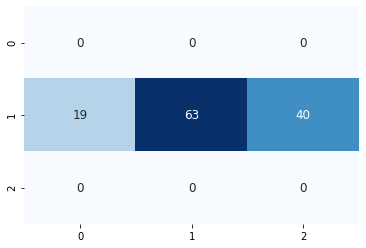

122/122 [==============================] - 0s 250us/sample - loss: 0.9268 - accuracy: 0.5902


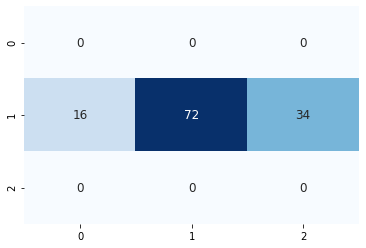

121/121 [==============================] - 0s 238us/sample - loss: 0.9467 - accuracy: 0.5785


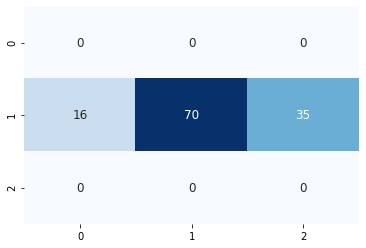

120/120 [==============================] - 0s 261us/sample - loss: 1.0598 - accuracy: 0.5833


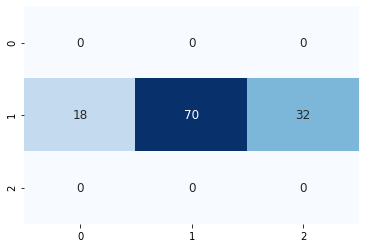

117/117 [==============================] - 0s 286us/sample - loss: 1.0345 - accuracy: 0.5641


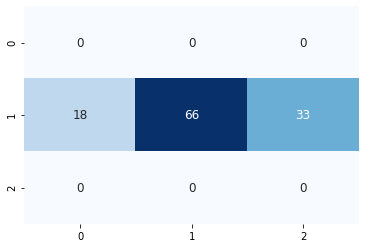

115/115 [==============================] - 0s 271us/sample - loss: 1.0565 - accuracy: 0.4957


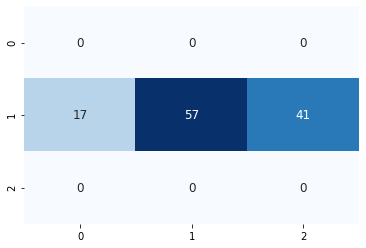

119/119 [==============================] - 0s 251us/sample - loss: 0.9576 - accuracy: 0.6387


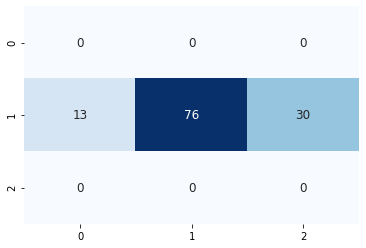

119/119 [==============================] - 0s 243us/sample - loss: 0.9525 - accuracy: 0.5882


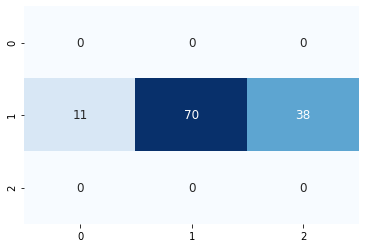

117/117 [==============================] - 0s 450us/sample - loss: 0.8876 - accuracy: 0.5812


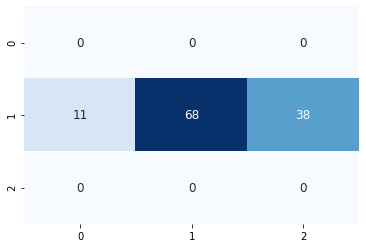

116/116 [==============================] - 0s 283us/sample - loss: 0.9763 - accuracy: 0.6034


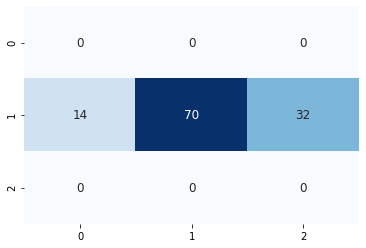

117/117 [==============================] - 0s 248us/sample - loss: 1.0181 - accuracy: 0.6154


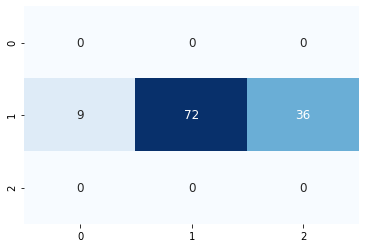

117/117 [==============================] - 0s 327us/sample - loss: 0.9562 - accuracy: 0.5812


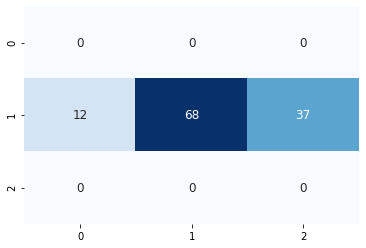

116/116 [==============================] - 0s 276us/sample - loss: 0.9865 - accuracy: 0.5431


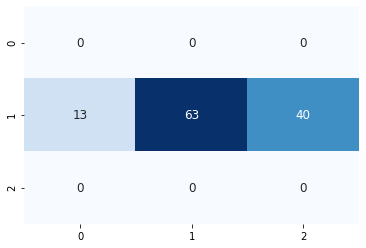

115/115 [==============================] - 0s 298us/sample - loss: 0.9873 - accuracy: 0.6174


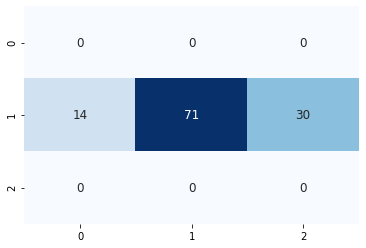

116/116 [==============================] - 0s 276us/sample - loss: 0.9833 - accuracy: 0.5603


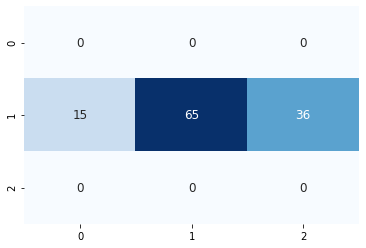

116/116 [==============================] - 0s 303us/sample - loss: 0.8824 - accuracy: 0.6466


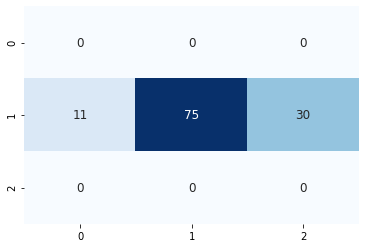

113/113 [==============================] - 0s 244us/sample - loss: 0.8898 - accuracy: 0.5929


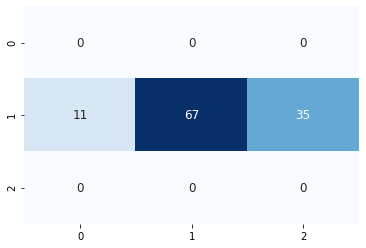

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3874 samples, validate on 1007 samples
Epoch 1/300
3874/3874 [==============================] - 3s 683us/sample - loss: 0.9279 - accuracy: 0.5705 - val_loss: 1.0244 - val_accuracy: 0.5025
Epoch 2/300
3874/3874 [==============================] - 1s 216us/sample - loss: 0.7233 - accuracy: 0.7078 - val_loss: 1.0621 - val_accuracy: 0.5065
Epoch 3/300
3874/3874 [==============================] - 1s 216us/sample - loss: 0.5843 - accuracy: 0.7747 - val_loss: 1.1254 - val_accuracy: 0.5015
Epoch 4/300
3874/3874 [==============================] - 1s 204us/sample - loss: 0.4615 - accuracy: 0.8400 - val_loss: 1.2151 - val_accuracy: 0.5084
Epoch 00004: early stopping
108/108 [==============================] - 0s 175us/sample - loss: 0.5905 - accuracy: 0.6852


16it [8:19:05, 1878.26s/it]
100%|██████████| 3/3 [00:06<00:00,  2.03s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.701171875 steps, validate for 75.18359375 steps
Epoch 1/300
284/283 [==============================] - 30s 104ms/step - loss: 0.9472 - accuracy: 0.5586 - val_loss: 0.9892 - val_accuracy: 0.5544
Epoch 2/300
284/283 [==============================] - 28s 99ms/step - loss: 0.8813 - accuracy: 0.5934 - val_loss: 1.0064 - val_accuracy: 0.5417
Epoch 3/300
284/283 [==============================] - 28s 99ms/step - loss: 0.8488 - accuracy: 0.6118 - val_loss: 1.0383 - val_accuracy: 0.5395
Epoch 4/300
284/283 [==============================] - 28s 99ms/step - loss: 0.8220 - accuracy: 0.6279 - val_loss: 1.0682 - val_accuracy: 0.5244
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.701171875 steps, validate for 75.18359375 steps
Epoch 1/300
284/283 [==============================] - 70s 246ms/step - loss: 0.7848 - accuracy: 0.6482 - val_loss: 1.5762 - val_accu

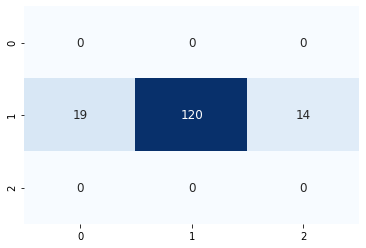

147/147 [==============================] - 0s 248us/sample - loss: 0.6085 - accuracy: 0.7415


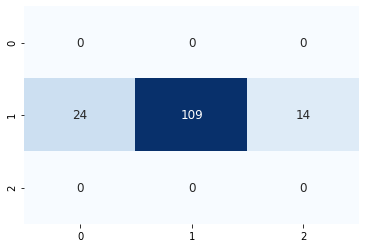

141/141 [==============================] - 0s 252us/sample - loss: 0.8454 - accuracy: 0.6383


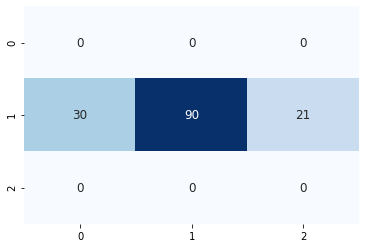

136/136 [==============================] - 0s 275us/sample - loss: 0.7326 - accuracy: 0.6691


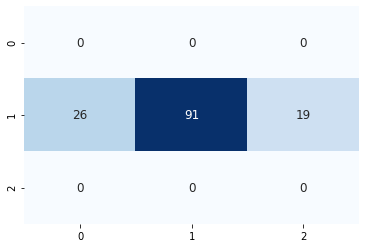

129/129 [==============================] - 0s 240us/sample - loss: 0.7950 - accuracy: 0.6744


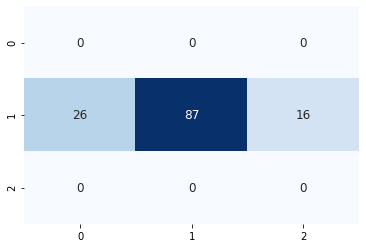

128/128 [==============================] - 0s 2ms/sample - loss: 0.7673 - accuracy: 0.6953


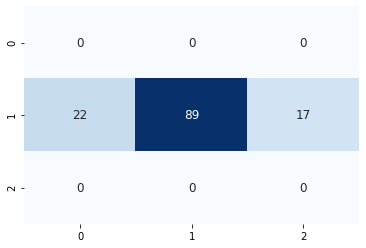

125/125 [==============================] - 0s 258us/sample - loss: 0.9272 - accuracy: 0.5840


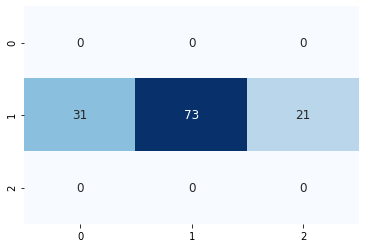

125/125 [==============================] - 0s 262us/sample - loss: 0.9130 - accuracy: 0.6560


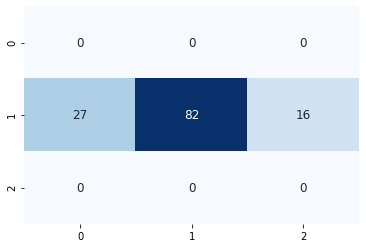

122/122 [==============================] - 0s 292us/sample - loss: 0.8353 - accuracy: 0.6475


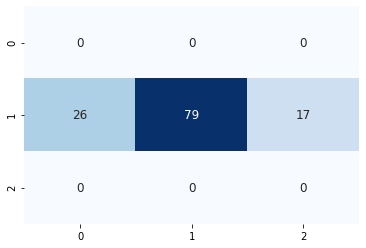

119/119 [==============================] - 0s 241us/sample - loss: 0.7552 - accuracy: 0.6807


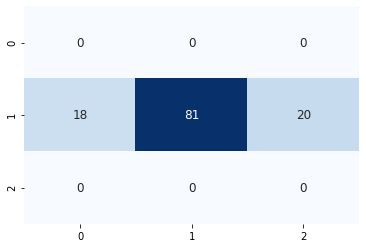

115/115 [==============================] - 0s 275us/sample - loss: 0.8337 - accuracy: 0.6522


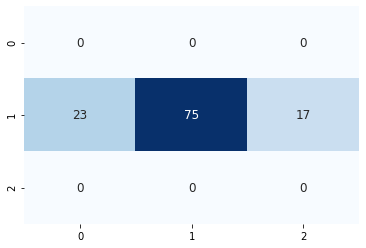

114/114 [==============================] - 0s 246us/sample - loss: 0.8364 - accuracy: 0.6140


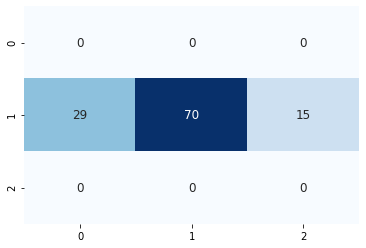

113/113 [==============================] - 0s 265us/sample - loss: 0.9389 - accuracy: 0.5841


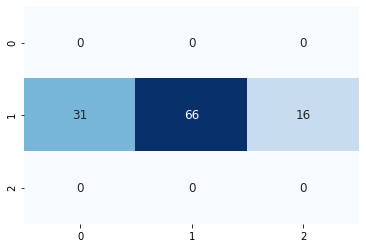

113/113 [==============================] - 0s 270us/sample - loss: 0.8166 - accuracy: 0.6372


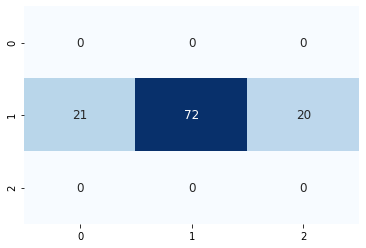

109/109 [==============================] - 0s 288us/sample - loss: 0.9061 - accuracy: 0.6330


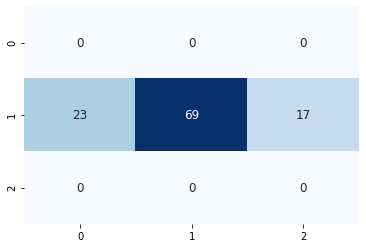

109/109 [==============================] - 0s 320us/sample - loss: 0.9894 - accuracy: 0.5872


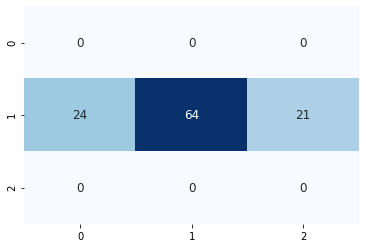

108/108 [==============================] - 0s 259us/sample - loss: 0.9279 - accuracy: 0.5463


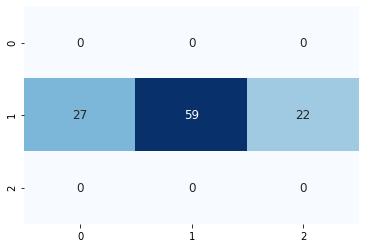

109/109 [==============================] - 0s 257us/sample - loss: 1.0755 - accuracy: 0.6055


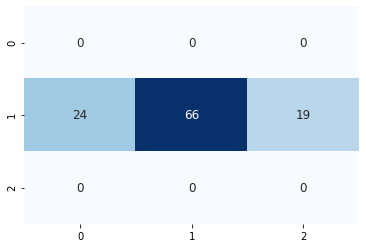

108/108 [==============================] - 0s 271us/sample - loss: 1.0651 - accuracy: 0.5648


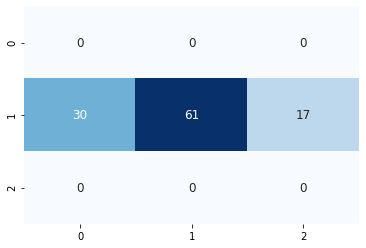

108/108 [==============================] - 0s 277us/sample - loss: 1.1086 - accuracy: 0.5556


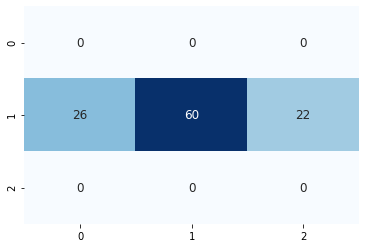

108/108 [==============================] - 0s 268us/sample - loss: 1.1455 - accuracy: 0.5833


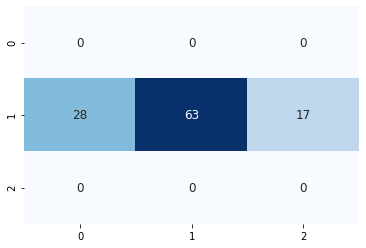

107/107 [==============================] - 0s 283us/sample - loss: 1.1723 - accuracy: 0.5234


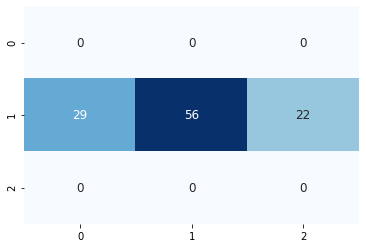

108/108 [==============================] - 0s 261us/sample - loss: 1.2396 - accuracy: 0.5093


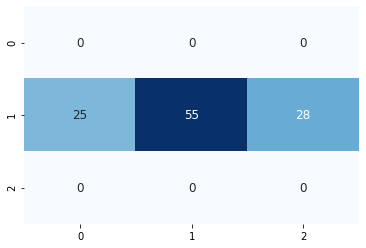

108/108 [==============================] - 0s 272us/sample - loss: 1.1999 - accuracy: 0.4815


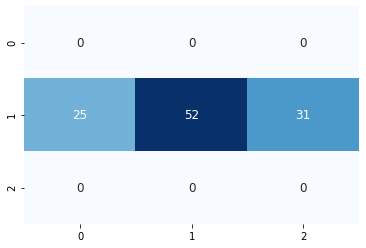

107/107 [==============================] - 0s 292us/sample - loss: 1.1780 - accuracy: 0.4860


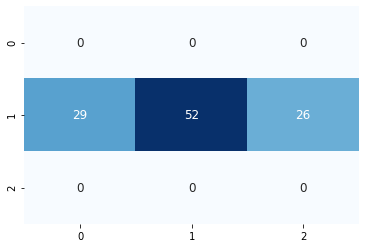

107/107 [==============================] - 0s 278us/sample - loss: 1.1695 - accuracy: 0.5047


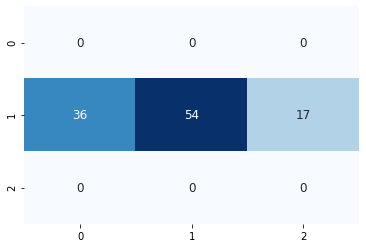

108/108 [==============================] - 0s 261us/sample - loss: 1.1652 - accuracy: 0.5185


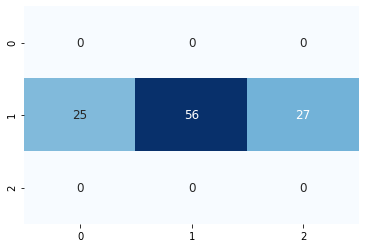

108/108 [==============================] - 0s 258us/sample - loss: 1.1093 - accuracy: 0.5093


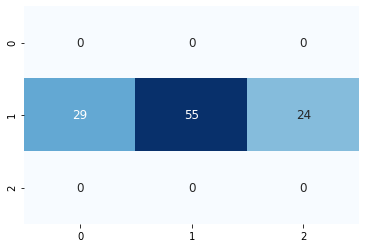

107/107 [==============================] - 0s 258us/sample - loss: 1.1228 - accuracy: 0.5327


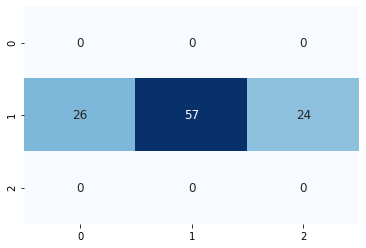

108/108 [==============================] - 0s 262us/sample - loss: 1.1905 - accuracy: 0.4907


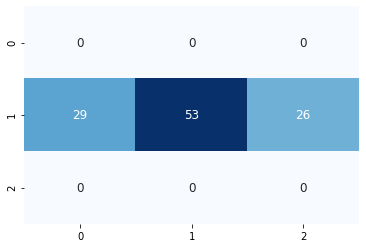

107/107 [==============================] - 0s 384us/sample - loss: 1.1605 - accuracy: 0.5234


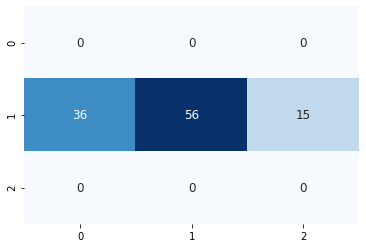

108/108 [==============================] - 0s 255us/sample - loss: 1.0611 - accuracy: 0.4815


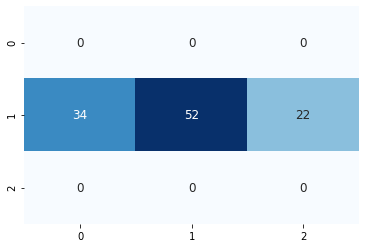

108/108 [==============================] - 0s 277us/sample - loss: 1.2729 - accuracy: 0.4537


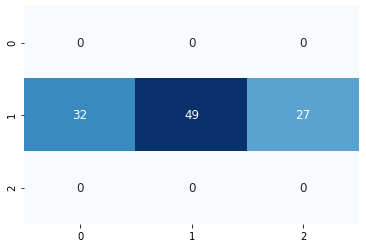

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3875 samples, validate on 1012 samples
Epoch 1/300
3875/3875 [==============================] - 3s 674us/sample - loss: 0.9060 - accuracy: 0.5796 - val_loss: 0.9975 - val_accuracy: 0.5405
Epoch 2/300
3875/3875 [==============================] - 1s 229us/sample - loss: 0.7277 - accuracy: 0.6963 - val_loss: 1.0297 - val_accuracy: 0.5277
Epoch 3/300
3875/3875 [==============================] - 1s 197us/sample - loss: 0.5964 - accuracy: 0.7721 - val_loss: 1.0971 - val_accuracy: 0.5277
Epoch 4/300
3875/3875 [==============================] - 1s 202us/sample - loss: 0.4824 - accuracy: 0.8317 - val_loss: 1.1814 - val_accuracy: 0.5119
Epoch 00004: early stopping
102/102 [==============================] - 0s 169us/sample - loss: 0.5137 - accuracy: 0.7745


17it [8:49:44, 1866.47s/it]
100%|██████████| 3/3 [00:06<00:00,  2.04s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.484375 steps, validate for 75.75390625 steps
Epoch 1/300
286/285 [==============================] - 30s 106ms/step - loss: 0.9474 - accuracy: 0.5631 - val_loss: 0.9908 - val_accuracy: 0.5508
Epoch 2/300
286/285 [==============================] - 28s 99ms/step - loss: 0.8836 - accuracy: 0.5957 - val_loss: 0.9960 - val_accuracy: 0.5460
Epoch 3/300
286/285 [==============================] - 29s 100ms/step - loss: 0.8541 - accuracy: 0.6121 - val_loss: 1.0318 - val_accuracy: 0.5393
Epoch 4/300
286/285 [==============================] - 29s 101ms/step - loss: 0.8304 - accuracy: 0.6255 - val_loss: 1.0352 - val_accuracy: 0.5335
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.484375 steps, validate for 75.75390625 steps
Epoch 1/300
286/285 [==============================] - 71s 250ms/step - loss: 0.7890 - accuracy: 0.6475 - val_loss: 1.1493 - val_accuracy

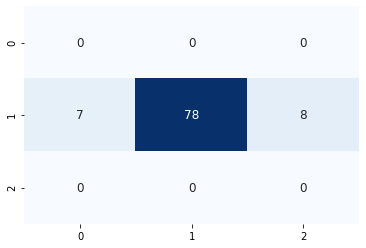

92/92 [==============================] - 0s 253us/sample - loss: 0.5619 - accuracy: 0.7935


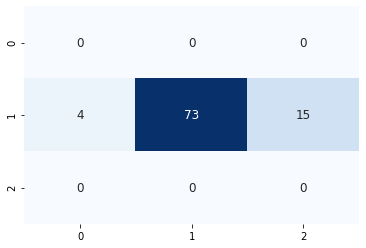

90/90 [==============================] - 0s 289us/sample - loss: 0.4710 - accuracy: 0.8778


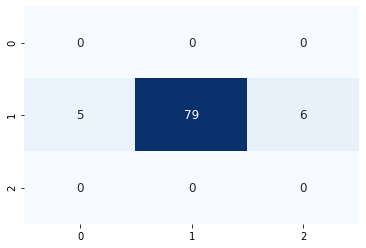

85/85 [==============================] - 0s 243us/sample - loss: 0.5027 - accuracy: 0.8588


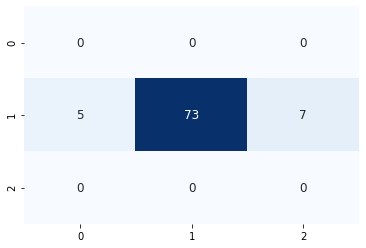

84/84 [==============================] - 0s 260us/sample - loss: 0.5283 - accuracy: 0.8929


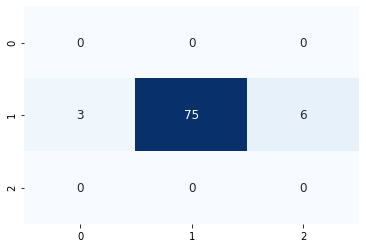

82/82 [==============================] - 0s 276us/sample - loss: 0.6042 - accuracy: 0.7561


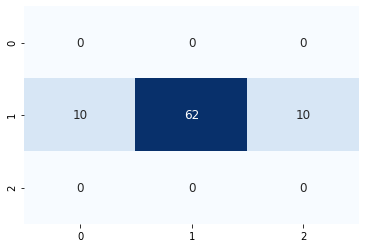

82/82 [==============================] - 0s 303us/sample - loss: 0.6200 - accuracy: 0.7683


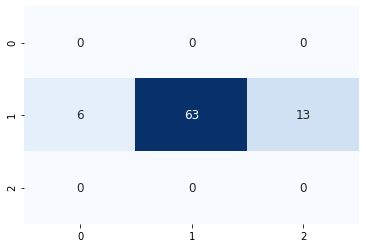

80/80 [==============================] - 0s 290us/sample - loss: 0.5869 - accuracy: 0.8125


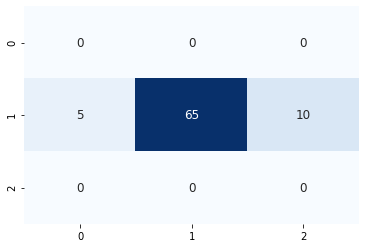

79/79 [==============================] - 0s 298us/sample - loss: 0.5786 - accuracy: 0.8481


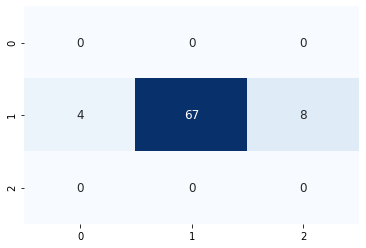

79/79 [==============================] - 0s 304us/sample - loss: 0.6525 - accuracy: 0.8101


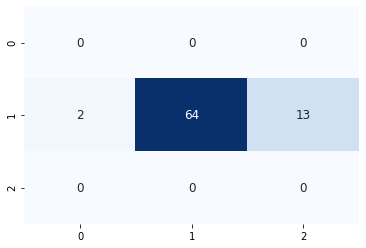

78/78 [==============================] - 0s 323us/sample - loss: 0.6180 - accuracy: 0.7436


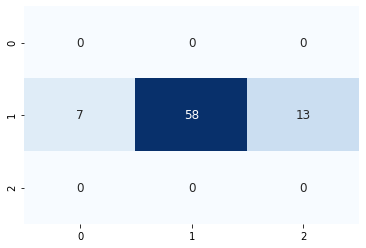

79/79 [==============================] - 0s 292us/sample - loss: 0.6359 - accuracy: 0.7848


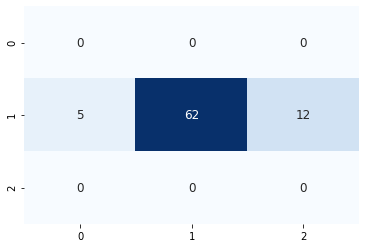

79/79 [==============================] - 0s 316us/sample - loss: 0.7531 - accuracy: 0.7215


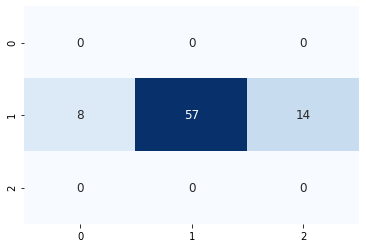

79/79 [==============================] - 0s 378us/sample - loss: 0.7060 - accuracy: 0.7342


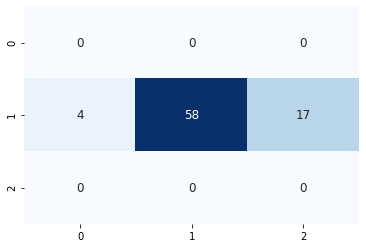

78/78 [==============================] - 0s 305us/sample - loss: 0.6279 - accuracy: 0.8205


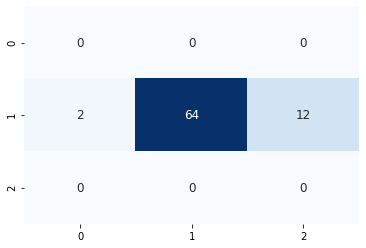

78/78 [==============================] - 0s 304us/sample - loss: 0.5342 - accuracy: 0.8333


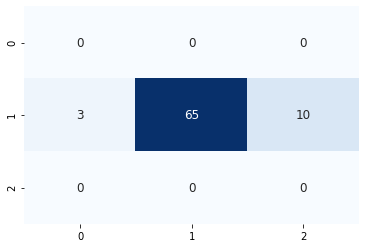

77/77 [==============================] - 0s 315us/sample - loss: 0.6675 - accuracy: 0.8052


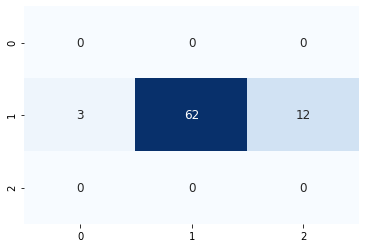

78/78 [==============================] - 0s 285us/sample - loss: 0.7085 - accuracy: 0.7308


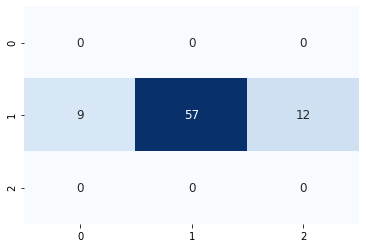

77/77 [==============================] - 0s 405us/sample - loss: 0.7543 - accuracy: 0.6623


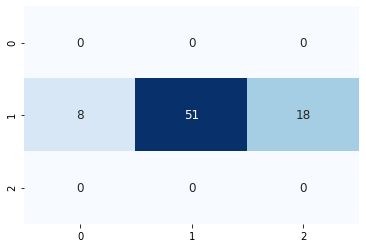

78/78 [==============================] - 0s 323us/sample - loss: 0.8518 - accuracy: 0.6538


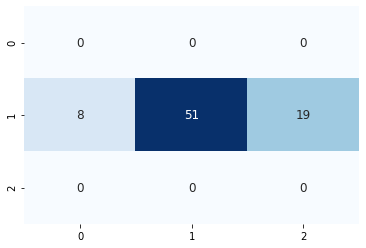

79/79 [==============================] - 0s 283us/sample - loss: 0.7452 - accuracy: 0.7468


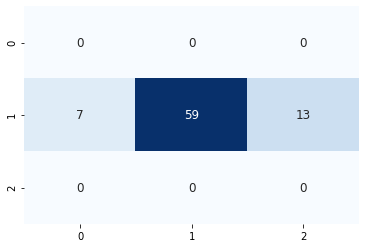

79/79 [==============================] - 0s 293us/sample - loss: 0.7046 - accuracy: 0.7722


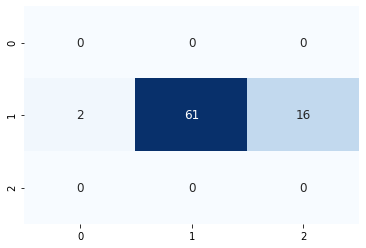

79/79 [==============================] - 0s 277us/sample - loss: 0.8293 - accuracy: 0.7215


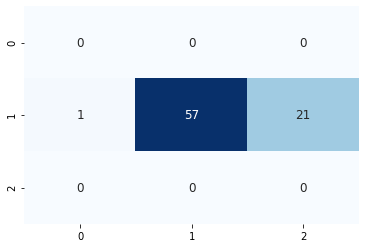

79/79 [==============================] - 0s 341us/sample - loss: 0.8390 - accuracy: 0.6962


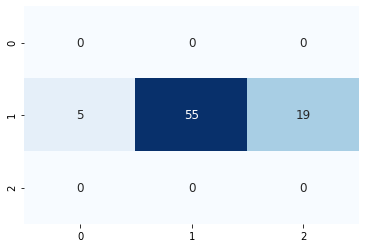

78/78 [==============================] - 0s 322us/sample - loss: 0.8768 - accuracy: 0.6282


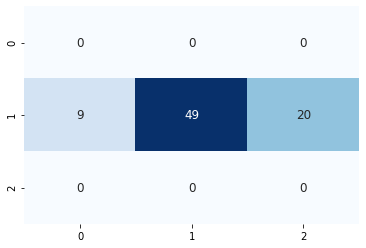

77/77 [==============================] - 0s 298us/sample - loss: 0.9457 - accuracy: 0.6234


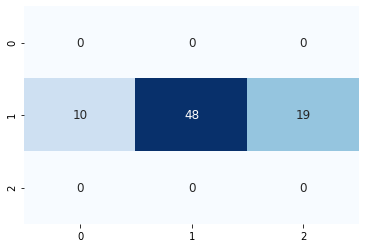

76/76 [==============================] - 0s 335us/sample - loss: 0.9400 - accuracy: 0.6447


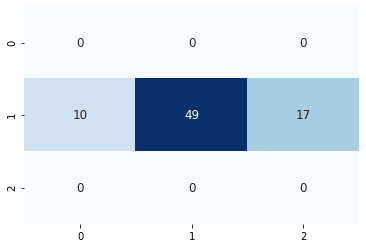

75/75 [==============================] - 0s 291us/sample - loss: 0.9136 - accuracy: 0.6133


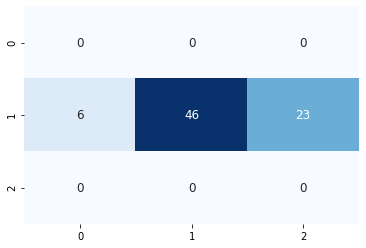

76/76 [==============================] - 0s 350us/sample - loss: 0.9651 - accuracy: 0.5526


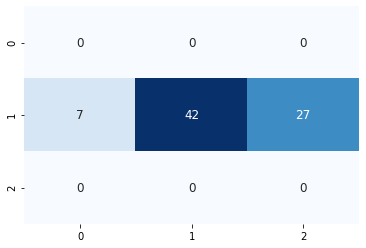

76/76 [==============================] - 0s 363us/sample - loss: 0.8437 - accuracy: 0.6053


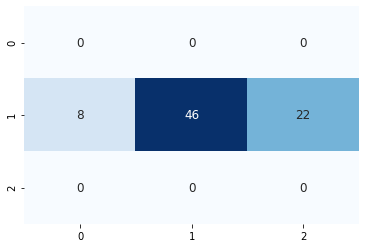

75/75 [==============================] - 0s 319us/sample - loss: 0.9084 - accuracy: 0.6400


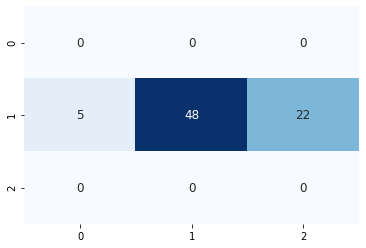

75/75 [==============================] - 0s 339us/sample - loss: 0.8957 - accuracy: 0.5867


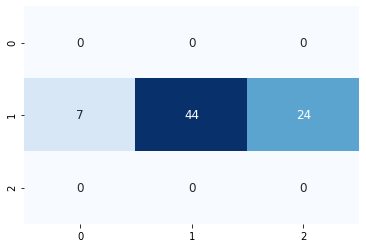

74/74 [==============================] - 0s 301us/sample - loss: 0.8817 - accuracy: 0.6486


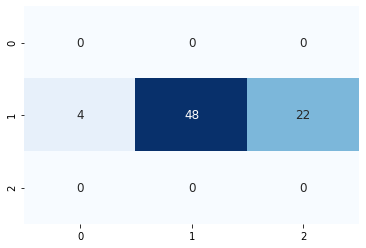

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3898 samples, validate on 1020 samples
Epoch 1/300
3898/3898 [==============================] - 3s 697us/sample - loss: 0.9393 - accuracy: 0.5703 - val_loss: 0.9935 - val_accuracy: 0.5451
Epoch 2/300
3898/3898 [==============================] - 1s 192us/sample - loss: 0.7688 - accuracy: 0.6727 - val_loss: 0.9987 - val_accuracy: 0.5471
Epoch 3/300
3898/3898 [==============================] - 1s 204us/sample - loss: 0.6578 - accuracy: 0.7414 - val_loss: 1.0365 - val_accuracy: 0.5324
Epoch 4/300
3898/3898 [==============================] - 1s 190us/sample - loss: 0.5434 - accuracy: 0.7930 - val_loss: 1.0992 - val_accuracy: 0.5216
Epoch 00004: early stopping
71/71 [==============================] - 0s 173us/sample - loss: 0.7648 - accuracy: 0.6479


18it [9:19:06, 1835.09s/it]
100%|██████████| 3/3 [00:06<00:00,  2.06s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 286.5234375 steps, validate for 75.51171875 steps
Epoch 1/300
287/286 [==============================] - 30s 106ms/step - loss: 0.9727 - accuracy: 0.5492 - val_loss: 0.9935 - val_accuracy: 0.5531
Epoch 2/300
287/286 [==============================] - 29s 100ms/step - loss: 0.8781 - accuracy: 0.5970 - val_loss: 1.0227 - val_accuracy: 0.5405
Epoch 3/300
287/286 [==============================] - 29s 100ms/step - loss: 0.8494 - accuracy: 0.6112 - val_loss: 1.0413 - val_accuracy: 0.5254
Epoch 4/300
287/286 [==============================] - 29s 101ms/step - loss: 0.8256 - accuracy: 0.6237 - val_loss: 1.0596 - val_accuracy: 0.5239
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 286.5234375 steps, validate for 75.51171875 steps
Epoch 1/300
287/286 [==============================] - 72s 250ms/step - loss: 0.7879 - accuracy: 0.6442 - val_loss: 1.1777 - val_accur

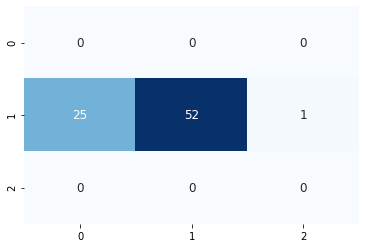

75/75 [==============================] - 0s 428us/sample - loss: 0.8468 - accuracy: 0.6133


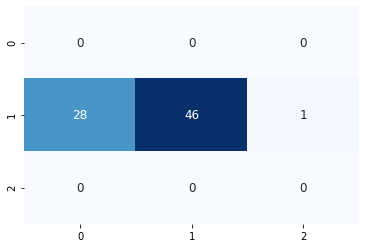

73/73 [==============================] - 0s 261us/sample - loss: 0.8941 - accuracy: 0.5753


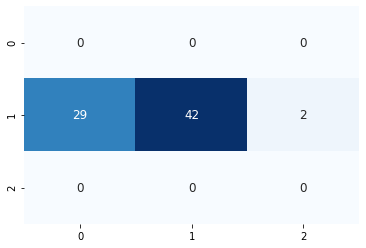

71/71 [==============================] - 0s 375us/sample - loss: 0.8655 - accuracy: 0.6056


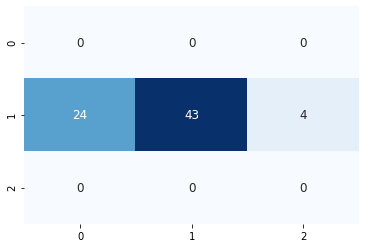

71/71 [==============================] - 0s 325us/sample - loss: 0.6794 - accuracy: 0.6620


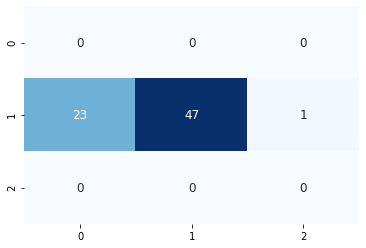

68/68 [==============================] - 0s 315us/sample - loss: 0.6547 - accuracy: 0.7059


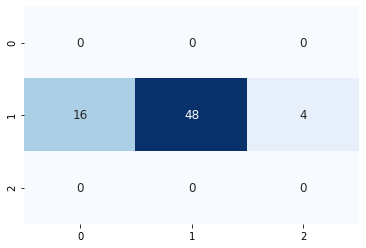

69/69 [==============================] - 0s 286us/sample - loss: 0.6929 - accuracy: 0.7536


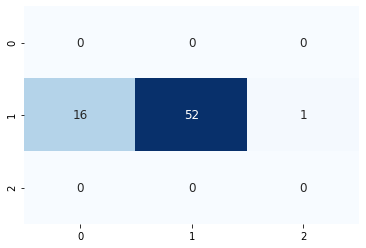

68/68 [==============================] - 0s 343us/sample - loss: 0.7491 - accuracy: 0.6029


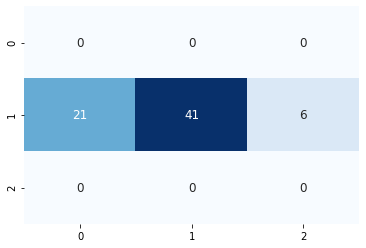

66/66 [==============================] - 0s 290us/sample - loss: 0.8670 - accuracy: 0.6515


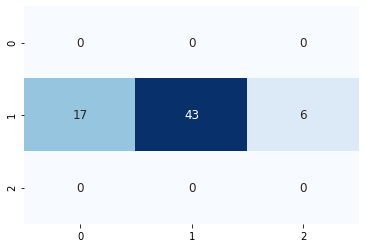

65/65 [==============================] - 0s 346us/sample - loss: 0.7830 - accuracy: 0.6923


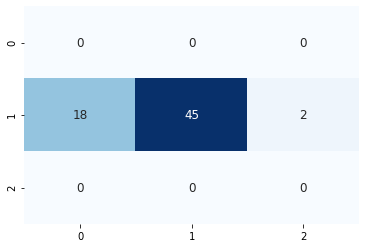

64/64 [==============================] - 0s 3ms/sample - loss: 0.7415 - accuracy: 0.7344


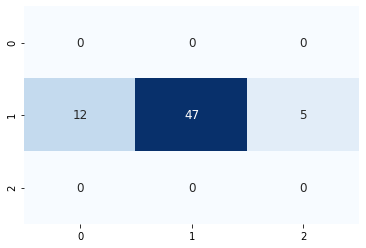

65/65 [==============================] - 0s 335us/sample - loss: 0.6739 - accuracy: 0.6769


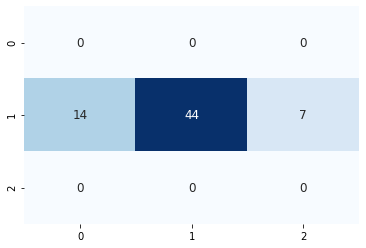

66/66 [==============================] - 0s 316us/sample - loss: 0.6314 - accuracy: 0.6970


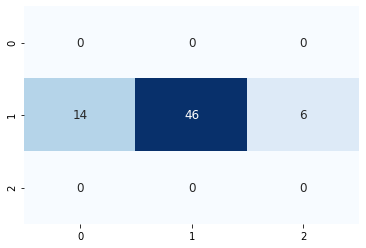

65/65 [==============================] - 0s 334us/sample - loss: 0.6442 - accuracy: 0.6923


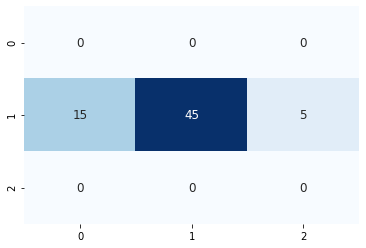

65/65 [==============================] - 0s 331us/sample - loss: 0.5823 - accuracy: 0.8000


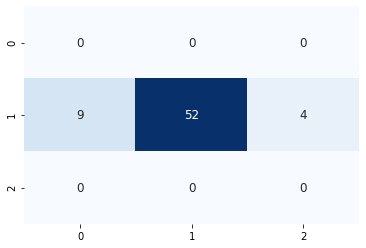

66/66 [==============================] - 0s 355us/sample - loss: 0.8683 - accuracy: 0.5758


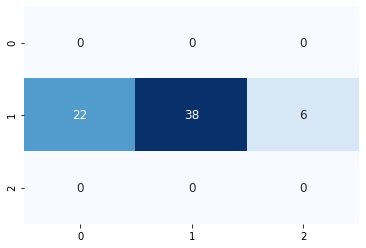

68/68 [==============================] - 0s 305us/sample - loss: 0.6296 - accuracy: 0.7353


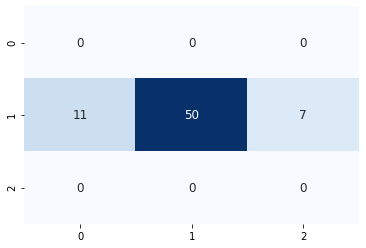

66/66 [==============================] - 0s 358us/sample - loss: 0.8054 - accuracy: 0.6818


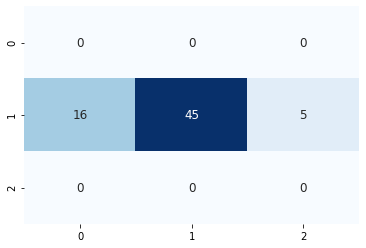

66/66 [==============================] - 0s 314us/sample - loss: 0.6688 - accuracy: 0.7121


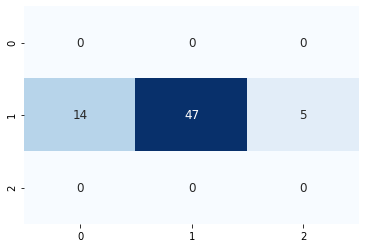

66/66 [==============================] - 0s 307us/sample - loss: 0.7332 - accuracy: 0.6667


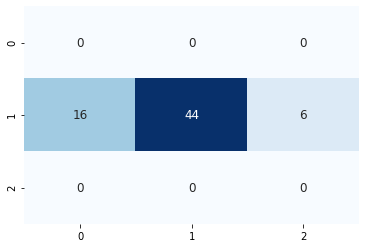

67/67 [==============================] - 0s 315us/sample - loss: 0.6890 - accuracy: 0.7313


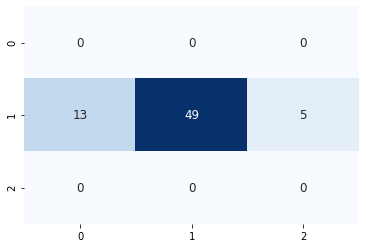

66/66 [==============================] - 0s 330us/sample - loss: 0.7213 - accuracy: 0.6818


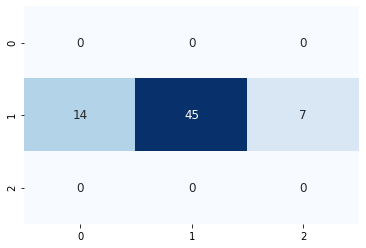

67/67 [==============================] - 0s 324us/sample - loss: 0.6149 - accuracy: 0.8060


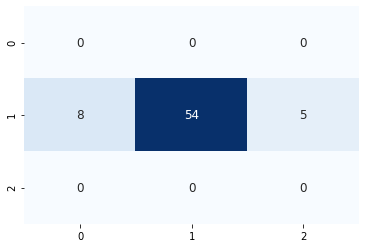

66/66 [==============================] - 0s 309us/sample - loss: 0.7337 - accuracy: 0.7273


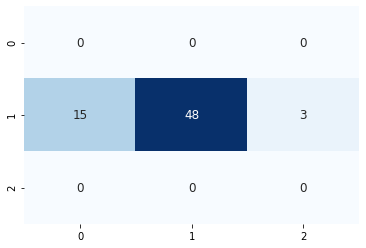

66/66 [==============================] - 0s 328us/sample - loss: 0.7151 - accuracy: 0.6818


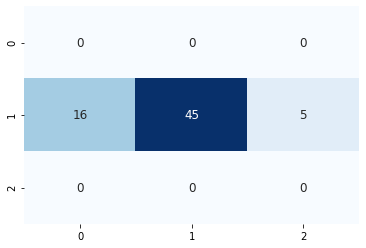

66/66 [==============================] - 0s 353us/sample - loss: 0.6803 - accuracy: 0.6818


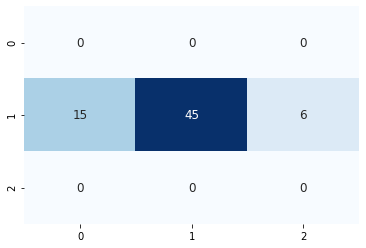

66/66 [==============================] - 0s 287us/sample - loss: 0.6299 - accuracy: 0.6970


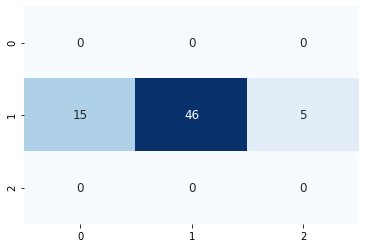

66/66 [==============================] - 0s 315us/sample - loss: 0.6979 - accuracy: 0.7273


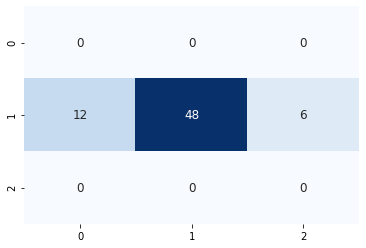

66/66 [==============================] - 0s 366us/sample - loss: 0.7770 - accuracy: 0.6818


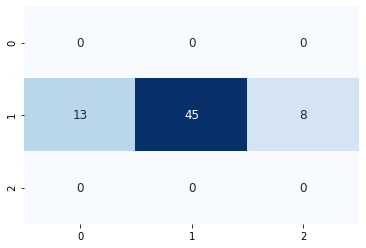

66/66 [==============================] - 0s 321us/sample - loss: 0.6935 - accuracy: 0.7121


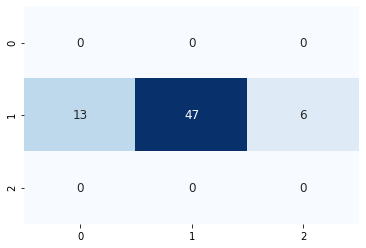

65/65 [==============================] - 0s 326us/sample - loss: 0.7024 - accuracy: 0.7077


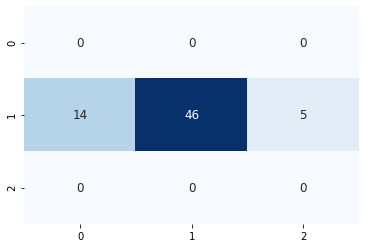

64/64 [==============================] - 0s 271us/sample - loss: 0.6892 - accuracy: 0.7188


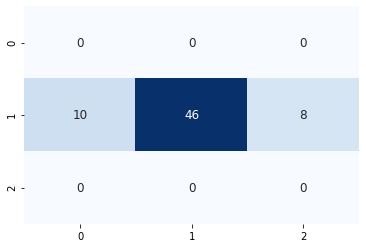

65/65 [==============================] - 0s 322us/sample - loss: 0.6441 - accuracy: 0.7231


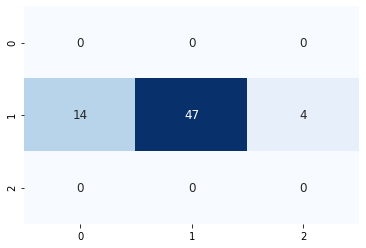

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3914 samples, validate on 1014 samples
Epoch 1/300
3914/3914 [==============================] - 2s 636us/sample - loss: 0.9224 - accuracy: 0.5529 - val_loss: 1.0057 - val_accuracy: 0.5266
Epoch 2/300
3914/3914 [==============================] - 1s 198us/sample - loss: 0.7208 - accuracy: 0.6809 - val_loss: 1.0210 - val_accuracy: 0.5178
Epoch 3/300
3914/3914 [==============================] - 1s 208us/sample - loss: 0.5999 - accuracy: 0.7724 - val_loss: 1.0654 - val_accuracy: 0.5079
Epoch 4/300
3914/3914 [==============================] - 1s 227us/sample - loss: 0.4961 - accuracy: 0.8212 - val_loss: 1.1449 - val_accuracy: 0.5030
Epoch 00004: early stopping
61/61 [==============================] - 0s 164us/sample - loss: 0.4720 - accuracy: 0.8361


19it [9:49:09, 1825.51s/it]
100%|██████████| 3/3 [00:06<00:00,  2.01s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.326171875 steps, validate for 75.744140625 steps
Epoch 1/300
283/282 [==============================] - 30s 106ms/step - loss: 0.9462 - accuracy: 0.5605 - val_loss: 0.9889 - val_accuracy: 0.5522
Epoch 2/300
283/282 [==============================] - 28s 100ms/step - loss: 0.8821 - accuracy: 0.5940 - val_loss: 1.0063 - val_accuracy: 0.5408
Epoch 3/300
283/282 [==============================] - 28s 99ms/step - loss: 0.8537 - accuracy: 0.6102 - val_loss: 1.0253 - val_accuracy: 0.5413
Epoch 4/300
283/282 [==============================] - 28s 100ms/step - loss: 0.8280 - accuracy: 0.6244 - val_loss: 1.0651 - val_accuracy: 0.5203
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.326171875 steps, validate for 75.744140625 steps
Epoch 1/300
283/282 [==============================] - 70s 247ms/step - loss: 0.7883 - accuracy: 0.6455 - val_loss: 1.3112 - val_

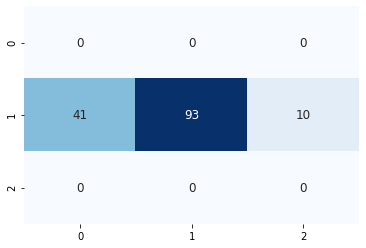

142/142 [==============================] - 0s 243us/sample - loss: 0.8355 - accuracy: 0.6620


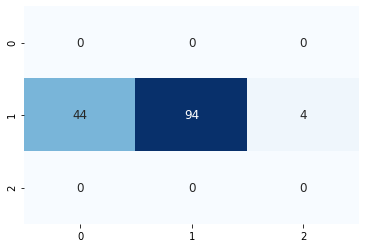

137/137 [==============================] - 0s 326us/sample - loss: 0.7492 - accuracy: 0.7007


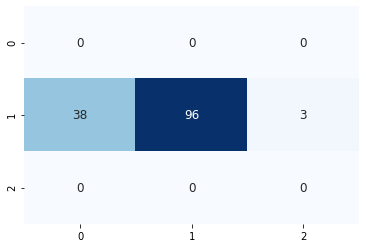

134/134 [==============================] - 0s 277us/sample - loss: 0.7699 - accuracy: 0.6642


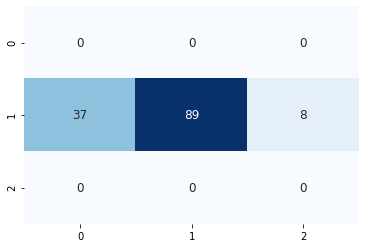

135/135 [==============================] - 0s 303us/sample - loss: 0.7507 - accuracy: 0.6519


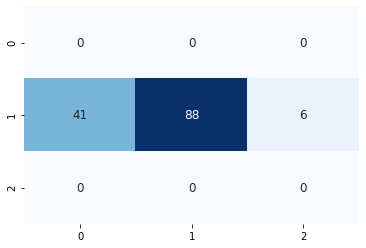

134/134 [==============================] - 0s 312us/sample - loss: 0.7491 - accuracy: 0.6269


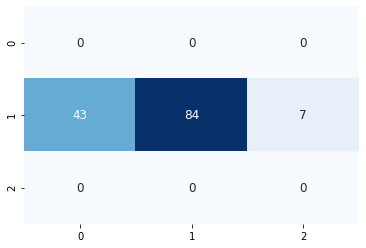

135/135 [==============================] - 0s 291us/sample - loss: 0.7601 - accuracy: 0.6222


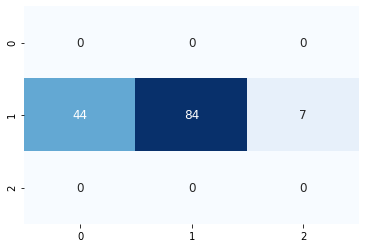

136/136 [==============================] - 0s 287us/sample - loss: 0.7799 - accuracy: 0.6324


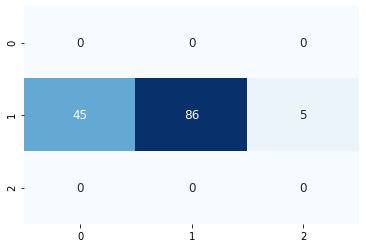

138/138 [==============================] - 0s 278us/sample - loss: 0.6688 - accuracy: 0.6884


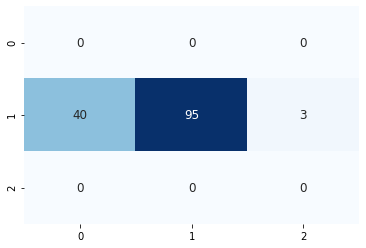

134/134 [==============================] - 0s 274us/sample - loss: 0.6966 - accuracy: 0.6493


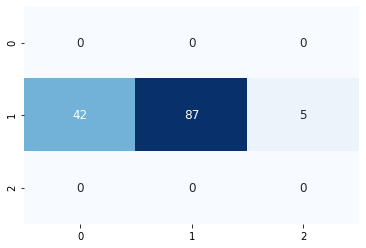

131/131 [==============================] - 0s 282us/sample - loss: 0.7447 - accuracy: 0.6641


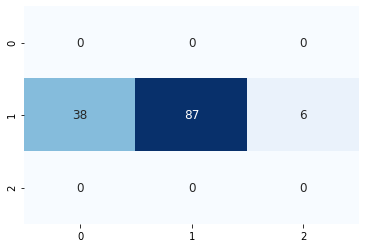

129/129 [==============================] - 0s 272us/sample - loss: 0.8016 - accuracy: 0.6589


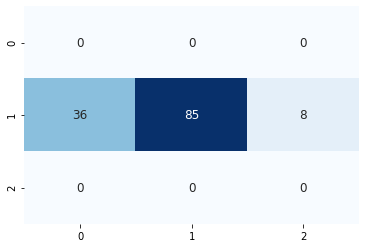

129/129 [==============================] - 0s 256us/sample - loss: 0.8505 - accuracy: 0.6124


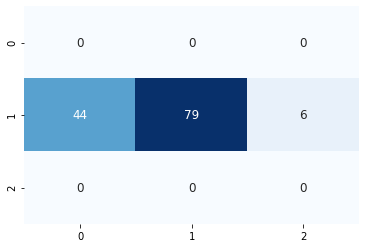

129/129 [==============================] - 0s 436us/sample - loss: 0.7816 - accuracy: 0.6434


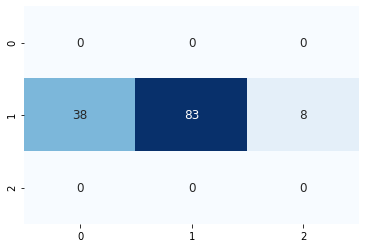

130/130 [==============================] - 0s 300us/sample - loss: 0.7713 - accuracy: 0.6462


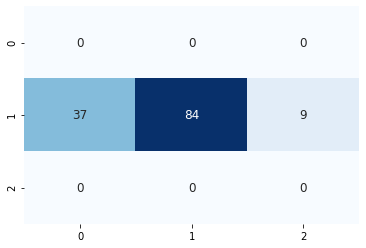

128/128 [==============================] - 0s 2ms/sample - loss: 0.8030 - accuracy: 0.6094


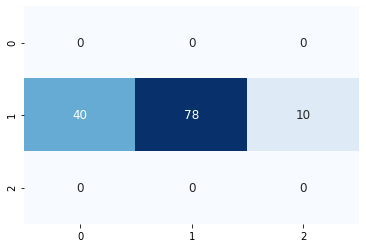

127/127 [==============================] - 0s 274us/sample - loss: 0.7988 - accuracy: 0.6772


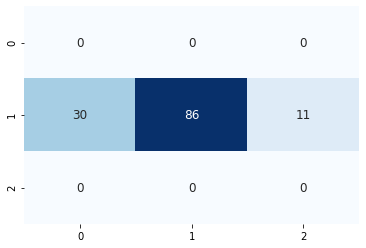

127/127 [==============================] - 0s 252us/sample - loss: 0.7834 - accuracy: 0.6220


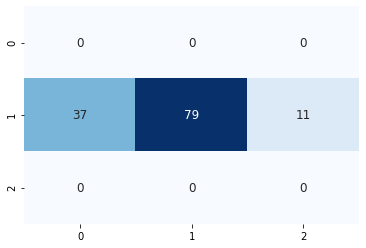

127/127 [==============================] - 0s 269us/sample - loss: 0.7529 - accuracy: 0.6614


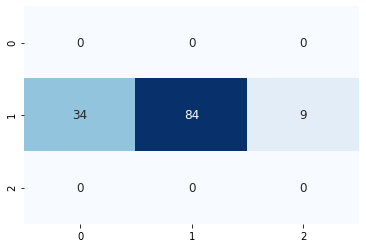

126/126 [==============================] - 0s 236us/sample - loss: 0.8220 - accuracy: 0.6270


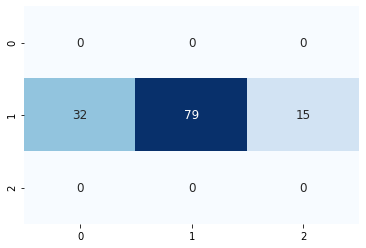

125/125 [==============================] - 0s 250us/sample - loss: 0.8888 - accuracy: 0.6080


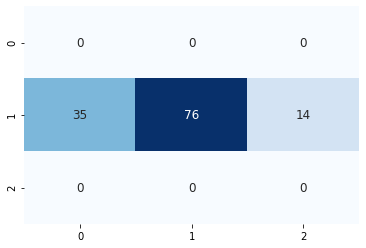

125/125 [==============================] - 0s 302us/sample - loss: 0.8936 - accuracy: 0.5680


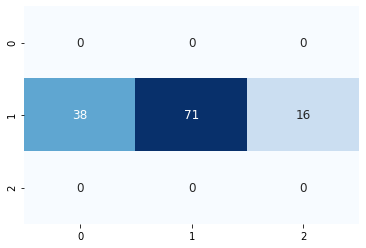

124/124 [==============================] - 0s 243us/sample - loss: 0.8665 - accuracy: 0.6129


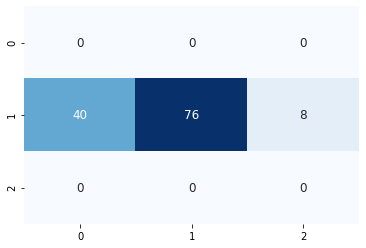

123/123 [==============================] - 0s 253us/sample - loss: 0.8615 - accuracy: 0.6179


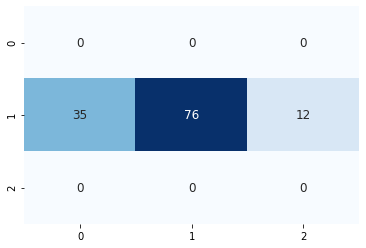

122/122 [==============================] - 0s 265us/sample - loss: 0.8969 - accuracy: 0.6148


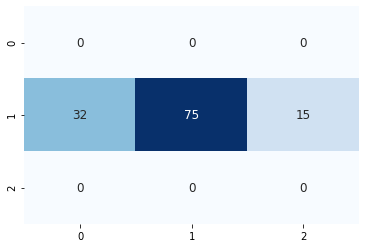

122/122 [==============================] - 0s 300us/sample - loss: 0.8543 - accuracy: 0.6475


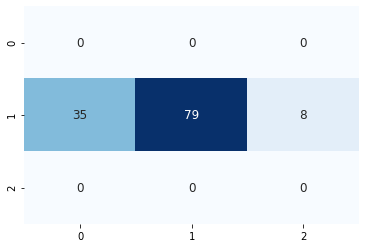

120/120 [==============================] - 0s 295us/sample - loss: 0.9755 - accuracy: 0.5750


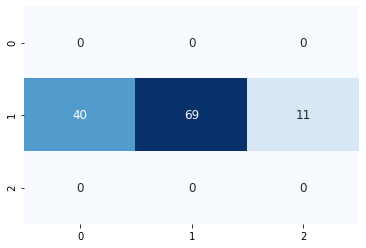

123/123 [==============================] - 0s 279us/sample - loss: 0.8981 - accuracy: 0.5366


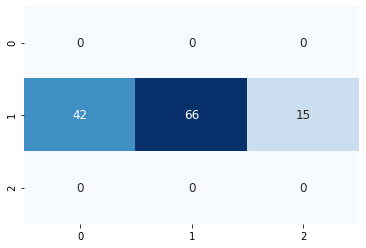

121/121 [==============================] - 0s 243us/sample - loss: 0.9220 - accuracy: 0.5702


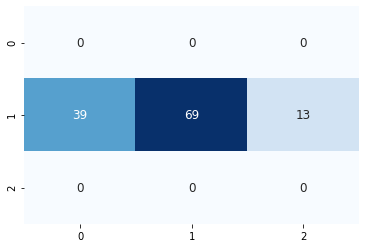

123/123 [==============================] - 0s 242us/sample - loss: 0.9436 - accuracy: 0.5772


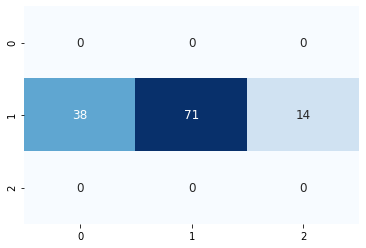

123/123 [==============================] - 0s 258us/sample - loss: 0.9770 - accuracy: 0.5528


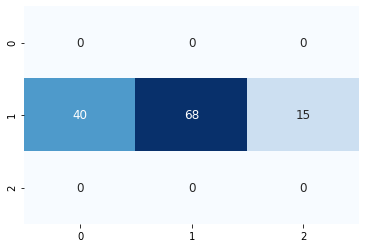

122/122 [==============================] - 0s 244us/sample - loss: 0.8269 - accuracy: 0.6311


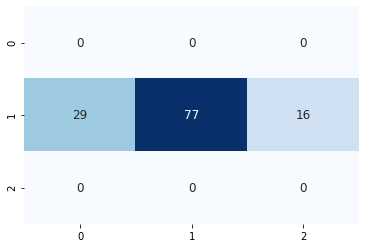

122/122 [==============================] - 0s 240us/sample - loss: 0.9131 - accuracy: 0.5902


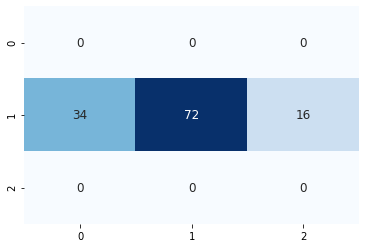

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3858 samples, validate on 1019 samples
Epoch 1/300
3858/3858 [==============================] - 3s 681us/sample - loss: 0.9138 - accuracy: 0.5809 - val_loss: 0.9996 - val_accuracy: 0.5368
Epoch 2/300
3858/3858 [==============================] - 1s 216us/sample - loss: 0.7319 - accuracy: 0.6985 - val_loss: 1.0227 - val_accuracy: 0.5417
Epoch 3/300
3858/3858 [==============================] - 1s 205us/sample - loss: 0.6058 - accuracy: 0.7753 - val_loss: 1.0708 - val_accuracy: 0.5319
Epoch 4/300
3858/3858 [==============================] - 1s 219us/sample - loss: 0.4972 - accuracy: 0.8294 - val_loss: 1.1447 - val_accuracy: 0.5427
Epoch 00004: early stopping
112/112 [==============================] - 0s 142us/sample - loss: 0.6648 - accuracy: 0.6964


20it [10:20:10, 1836.32s/it]
100%|██████████| 3/3 [00:06<00:00,  2.07s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.234375 steps, validate for 74.283203125 steps
Epoch 1/300
285/284 [==============================] - 29s 103ms/step - loss: 0.9404 - accuracy: 0.5666 - val_loss: 1.0112 - val_accuracy: 0.5442
Epoch 2/300
285/284 [==============================] - 28s 98ms/step - loss: 0.8807 - accuracy: 0.5965 - val_loss: 1.0295 - val_accuracy: 0.5355
Epoch 3/300
285/284 [==============================] - 28s 100ms/step - loss: 0.8485 - accuracy: 0.6137 - val_loss: 1.0221 - val_accuracy: 0.5295
Epoch 4/300
285/284 [==============================] - 28s 99ms/step - loss: 0.8215 - accuracy: 0.6280 - val_loss: 1.0707 - val_accuracy: 0.5194
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.234375 steps, validate for 74.283203125 steps
Epoch 1/300
285/284 [==============================] - 69s 243ms/step - loss: 0.7820 - accuracy: 0.6506 - val_loss: 1.1836 - val_accurac

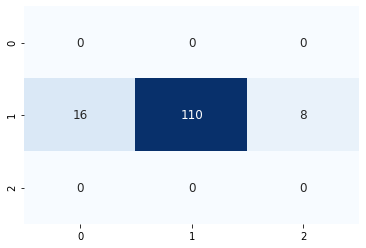

131/131 [==============================] - 0s 297us/sample - loss: 0.4122 - accuracy: 0.8321


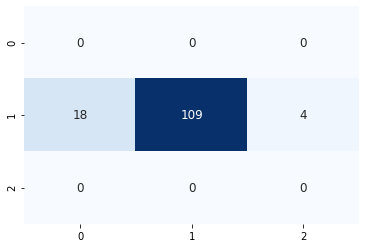

125/125 [==============================] - 0s 218us/sample - loss: 0.4582 - accuracy: 0.8640


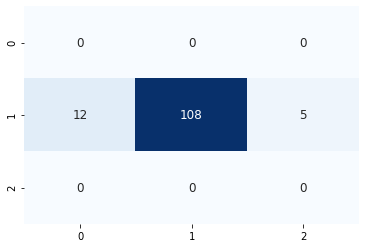

125/125 [==============================] - 0s 253us/sample - loss: 0.4757 - accuracy: 0.8080


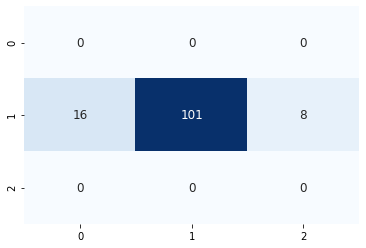

126/126 [==============================] - 0s 246us/sample - loss: 0.4791 - accuracy: 0.8016


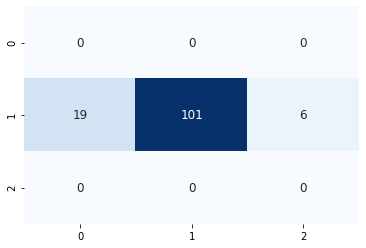

126/126 [==============================] - 0s 230us/sample - loss: 0.4733 - accuracy: 0.8095


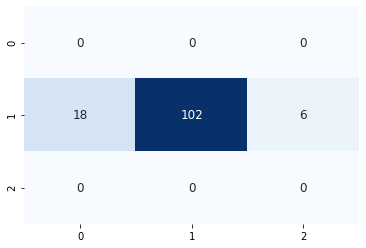

126/126 [==============================] - 0s 252us/sample - loss: 0.4611 - accuracy: 0.8254


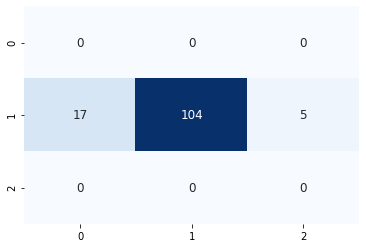

123/123 [==============================] - 0s 245us/sample - loss: 0.4457 - accuracy: 0.8537


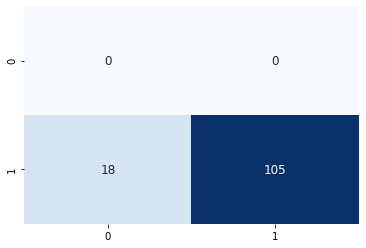

124/124 [==============================] - 0s 251us/sample - loss: 0.4474 - accuracy: 0.8387


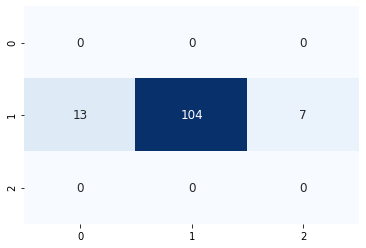

123/123 [==============================] - 0s 259us/sample - loss: 0.4191 - accuracy: 0.8537


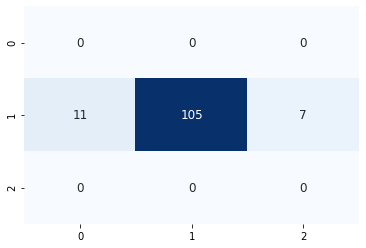

124/124 [==============================] - 0s 256us/sample - loss: 0.4928 - accuracy: 0.7984


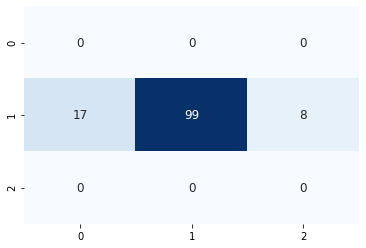

124/124 [==============================] - 0s 242us/sample - loss: 0.4525 - accuracy: 0.7984


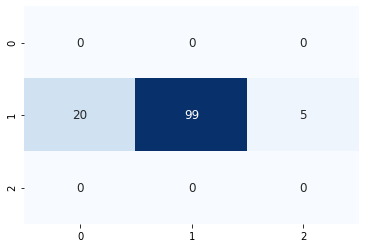

123/123 [==============================] - 0s 265us/sample - loss: 0.4199 - accuracy: 0.8130


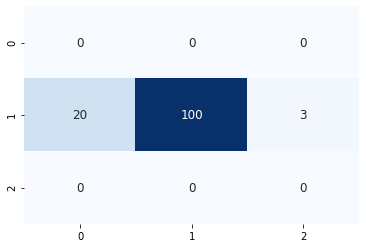

120/120 [==============================] - 0s 286us/sample - loss: 0.4750 - accuracy: 0.8250


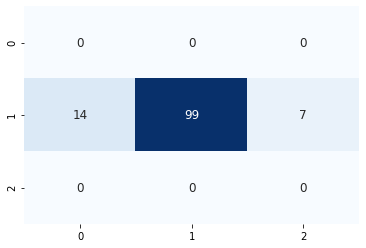

121/121 [==============================] - 0s 269us/sample - loss: 0.5245 - accuracy: 0.7769


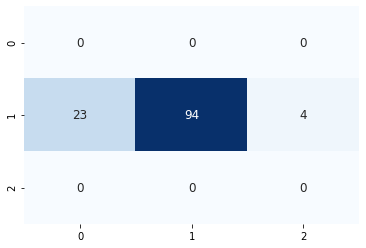

121/121 [==============================] - 0s 257us/sample - loss: 0.4693 - accuracy: 0.8099


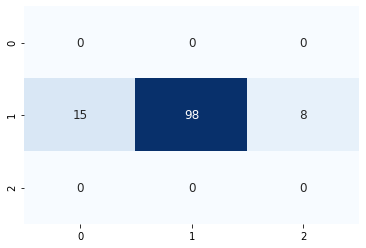

121/121 [==============================] - 0s 249us/sample - loss: 0.5103 - accuracy: 0.8264


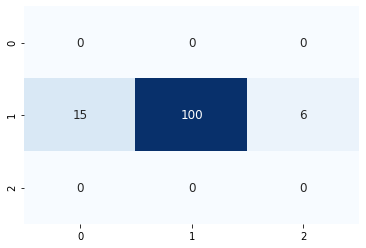

120/120 [==============================] - 0s 402us/sample - loss: 0.5197 - accuracy: 0.7333


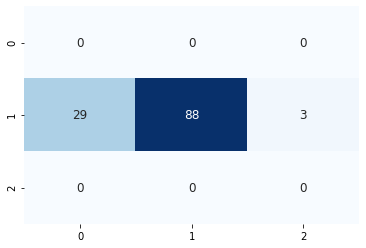

121/121 [==============================] - 0s 338us/sample - loss: 0.4712 - accuracy: 0.8017


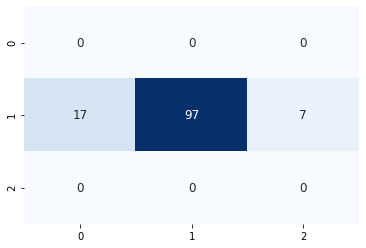

120/120 [==============================] - 0s 260us/sample - loss: 0.5086 - accuracy: 0.7417


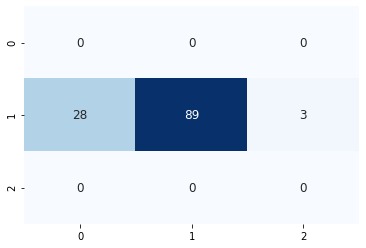

120/120 [==============================] - 0s 248us/sample - loss: 0.5646 - accuracy: 0.7250


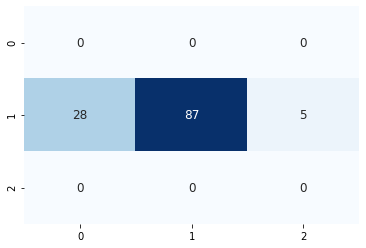

119/119 [==============================] - 0s 270us/sample - loss: 0.5898 - accuracy: 0.6891


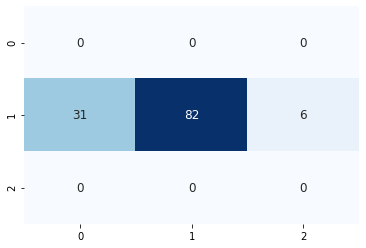

119/119 [==============================] - 0s 300us/sample - loss: 0.6687 - accuracy: 0.6723


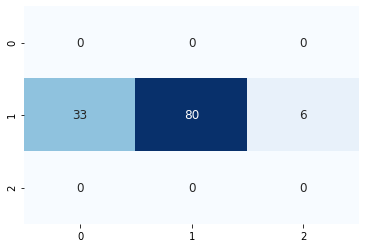

119/119 [==============================] - 0s 274us/sample - loss: 0.5749 - accuracy: 0.7647


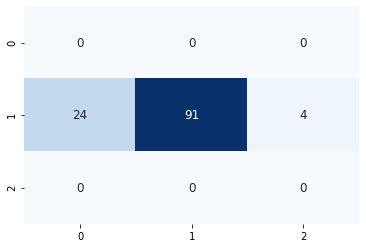

119/119 [==============================] - 0s 274us/sample - loss: 0.6376 - accuracy: 0.6807


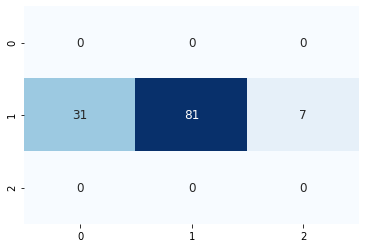

118/118 [==============================] - 0s 277us/sample - loss: 0.5892 - accuracy: 0.7203


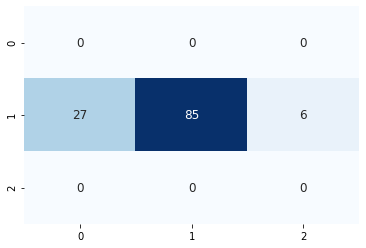

117/117 [==============================] - 0s 285us/sample - loss: 0.6094 - accuracy: 0.7521


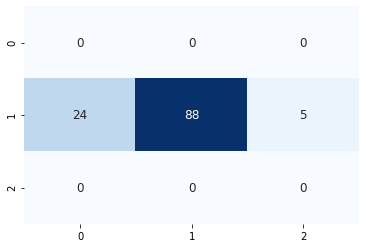

118/118 [==============================] - 0s 290us/sample - loss: 0.6310 - accuracy: 0.7288


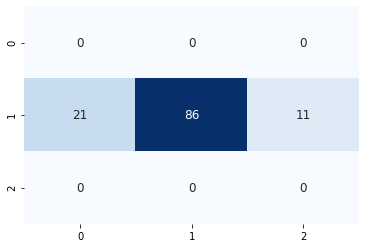

120/120 [==============================] - 0s 288us/sample - loss: 0.6028 - accuracy: 0.7417


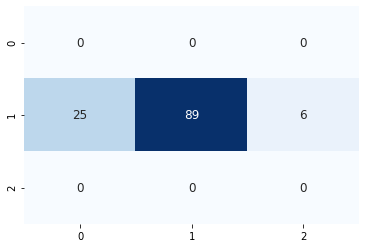

118/118 [==============================] - 0s 265us/sample - loss: 0.6352 - accuracy: 0.7203


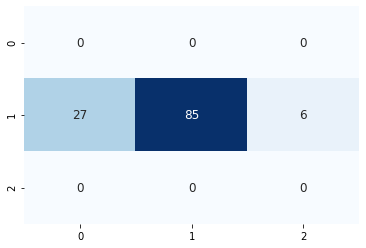

117/117 [==============================] - 0s 299us/sample - loss: 0.6491 - accuracy: 0.6838


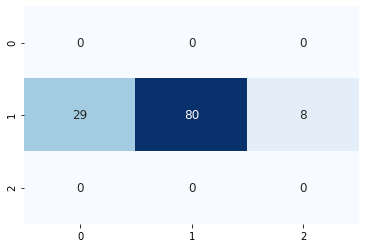

118/118 [==============================] - 0s 315us/sample - loss: 0.7825 - accuracy: 0.6780


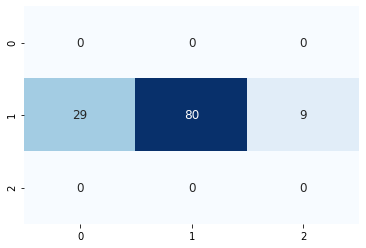

118/118 [==============================] - 0s 270us/sample - loss: 0.7161 - accuracy: 0.6949


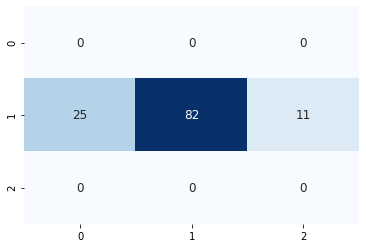

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3878 samples, validate on 1000 samples
Epoch 1/300
3878/3878 [==============================] - 3s 672us/sample - loss: 0.9608 - accuracy: 0.5348 - val_loss: 1.0101 - val_accuracy: 0.5190
Epoch 2/300
3878/3878 [==============================] - 1s 204us/sample - loss: 0.8207 - accuracy: 0.6282 - val_loss: 1.0148 - val_accuracy: 0.5230
Epoch 3/300
3878/3878 [==============================] - 1s 207us/sample - loss: 0.7554 - accuracy: 0.6668 - val_loss: 1.0283 - val_accuracy: 0.5130
Epoch 4/300
3878/3878 [==============================] - 1s 201us/sample - loss: 0.6907 - accuracy: 0.7091 - val_loss: 1.0500 - val_accuracy: 0.5210
Epoch 00004: early stopping
111/111 [==============================] - 0s 145us/sample - loss: 0.7001 - accuracy: 0.6847


21it [10:49:23, 1811.04s/it]
100%|██████████| 3/3 [00:07<00:00,  2.37s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.6484375 steps, validate for 75.130859375 steps
Epoch 1/300
284/283 [==============================] - 30s 104ms/step - loss: 0.9600 - accuracy: 0.5530 - val_loss: 0.9899 - val_accuracy: 0.5529
Epoch 2/300
284/283 [==============================] - 28s 99ms/step - loss: 0.8805 - accuracy: 0.5981 - val_loss: 1.0139 - val_accuracy: 0.5414
Epoch 3/300
284/283 [==============================] - 28s 100ms/step - loss: 0.8505 - accuracy: 0.6140 - val_loss: 1.0359 - val_accuracy: 0.5279
Epoch 4/300
284/283 [==============================] - 28s 99ms/step - loss: 0.8275 - accuracy: 0.6272 - val_loss: 1.0598 - val_accuracy: 0.5146
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.6484375 steps, validate for 75.130859375 steps
Epoch 1/300
284/283 [==============================] - 71s 249ms/step - loss: 0.7897 - accuracy: 0.6482 - val_loss: 1.1655 - val_accur

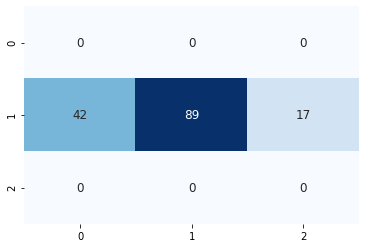

138/138 [==============================] - 0s 228us/sample - loss: 0.9003 - accuracy: 0.6449


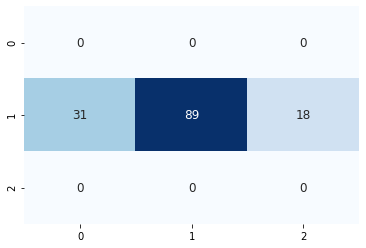

134/134 [==============================] - 0s 244us/sample - loss: 0.9146 - accuracy: 0.6343


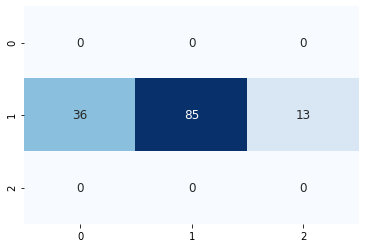

133/133 [==============================] - 0s 385us/sample - loss: 0.9180 - accuracy: 0.6241


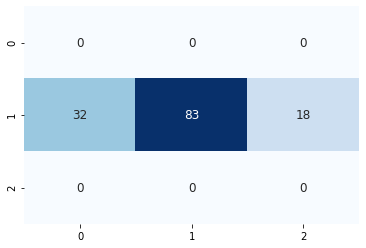

133/133 [==============================] - 0s 246us/sample - loss: 0.8154 - accuracy: 0.6316


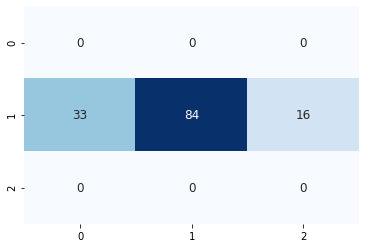

130/130 [==============================] - 0s 247us/sample - loss: 0.8851 - accuracy: 0.5923


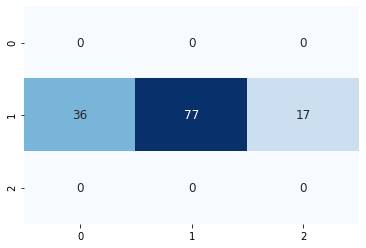

126/126 [==============================] - 0s 239us/sample - loss: 0.8637 - accuracy: 0.6032


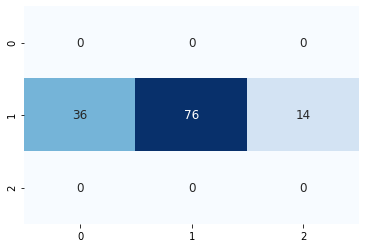

126/126 [==============================] - 0s 254us/sample - loss: 0.8492 - accuracy: 0.5873


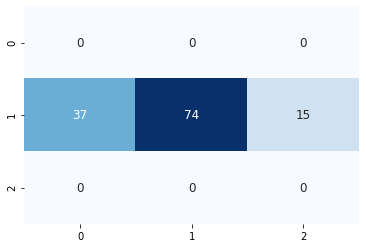

124/124 [==============================] - 0s 242us/sample - loss: 0.8468 - accuracy: 0.6129


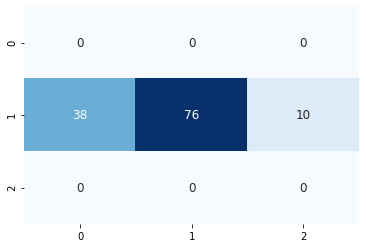

121/121 [==============================] - 0s 250us/sample - loss: 0.8540 - accuracy: 0.6198


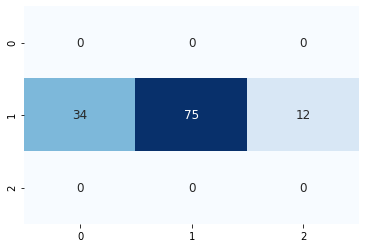

118/118 [==============================] - 0s 265us/sample - loss: 0.8084 - accuracy: 0.6186


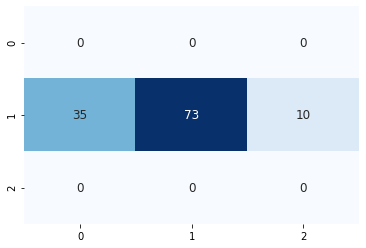

117/117 [==============================] - 0s 257us/sample - loss: 0.8124 - accuracy: 0.6239


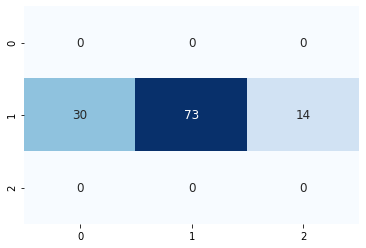

120/120 [==============================] - 0s 252us/sample - loss: 0.8244 - accuracy: 0.5833


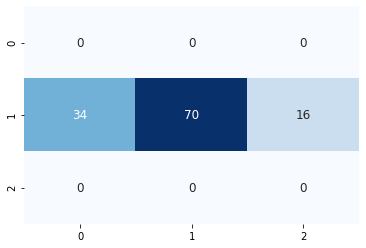

117/117 [==============================] - 0s 278us/sample - loss: 0.9248 - accuracy: 0.6239


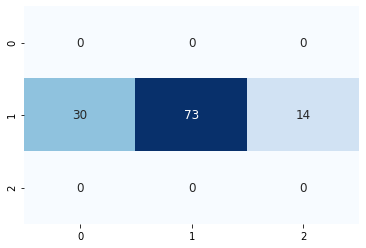

116/116 [==============================] - 0s 269us/sample - loss: 0.9145 - accuracy: 0.5948


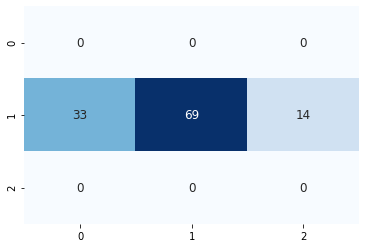

114/114 [==============================] - 0s 265us/sample - loss: 1.0051 - accuracy: 0.5965


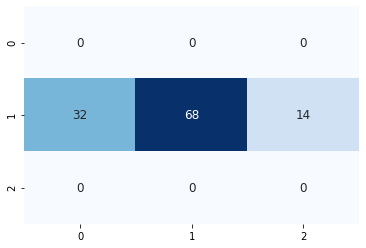

113/113 [==============================] - 0s 268us/sample - loss: 0.9844 - accuracy: 0.5487


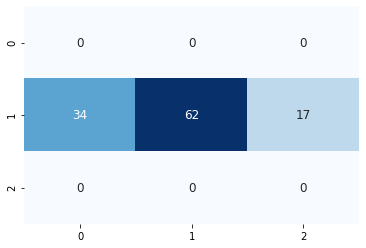

113/113 [==============================] - 0s 297us/sample - loss: 0.9600 - accuracy: 0.5752


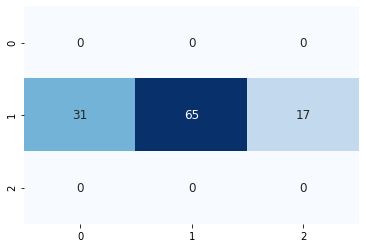

112/112 [==============================] - 0s 302us/sample - loss: 1.0040 - accuracy: 0.5357


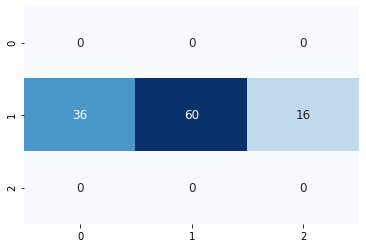

112/112 [==============================] - 0s 317us/sample - loss: 1.0433 - accuracy: 0.5625


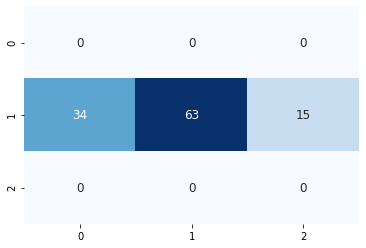

113/113 [==============================] - 0s 314us/sample - loss: 0.9275 - accuracy: 0.5310


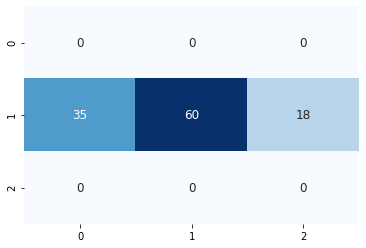

112/112 [==============================] - 0s 296us/sample - loss: 0.9781 - accuracy: 0.5446


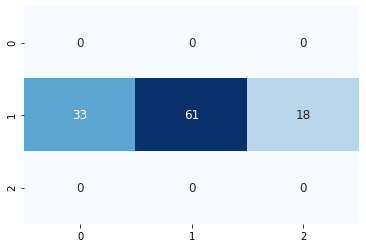

113/113 [==============================] - 0s 256us/sample - loss: 0.9362 - accuracy: 0.5929


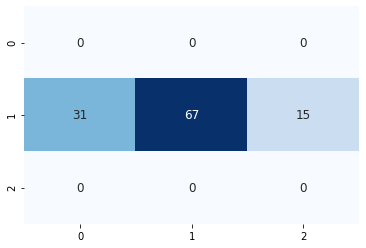

111/111 [==============================] - 0s 280us/sample - loss: 0.9654 - accuracy: 0.5315


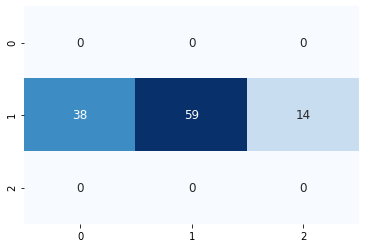

110/110 [==============================] - 0s 319us/sample - loss: 0.9217 - accuracy: 0.5818


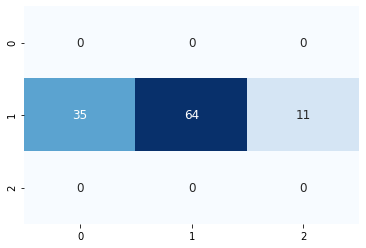

110/110 [==============================] - 0s 276us/sample - loss: 0.9613 - accuracy: 0.4818


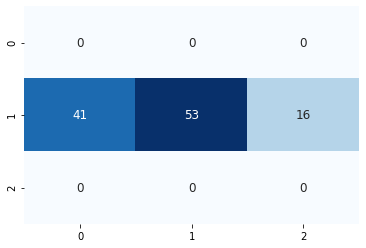

111/111 [==============================] - 0s 292us/sample - loss: 0.9149 - accuracy: 0.5766


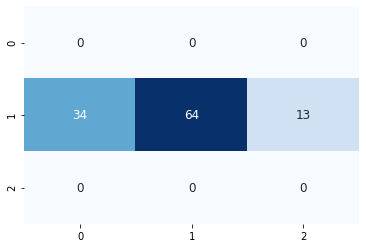

109/109 [==============================] - 0s 261us/sample - loss: 1.0091 - accuracy: 0.4771


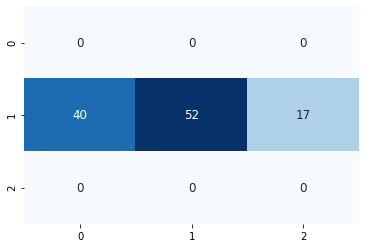

108/108 [==============================] - 0s 270us/sample - loss: 1.0044 - accuracy: 0.5093


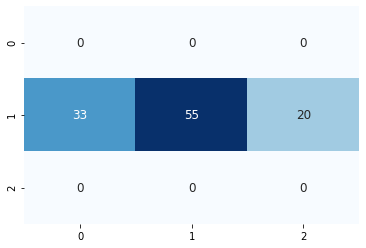

106/106 [==============================] - 0s 256us/sample - loss: 1.0786 - accuracy: 0.4340


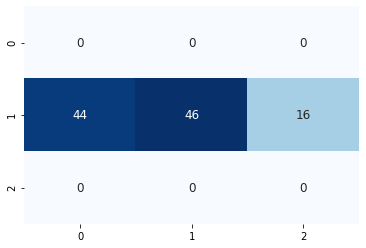

106/106 [==============================] - 0s 267us/sample - loss: 1.0344 - accuracy: 0.4623


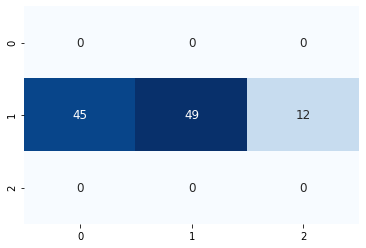

106/106 [==============================] - 0s 304us/sample - loss: 0.9341 - accuracy: 0.5094


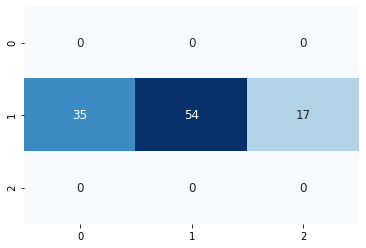

104/104 [==============================] - 0s 272us/sample - loss: 0.9897 - accuracy: 0.5288


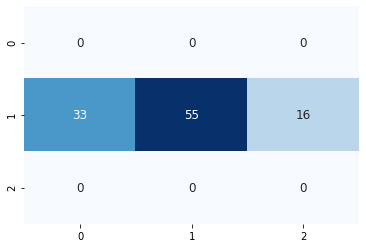

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3877 samples, validate on 1013 samples
Epoch 1/300
3877/3877 [==============================] - 3s 701us/sample - loss: 0.9701 - accuracy: 0.5280 - val_loss: 0.9921 - val_accuracy: 0.5222
Epoch 2/300
3877/3877 [==============================] - 1s 216us/sample - loss: 0.7701 - accuracy: 0.6750 - val_loss: 1.0025 - val_accuracy: 0.5350
Epoch 3/300
3877/3877 [==============================] - 1s 201us/sample - loss: 0.6388 - accuracy: 0.7573 - val_loss: 1.0445 - val_accuracy: 0.5242
Epoch 4/300
3877/3877 [==============================] - 1s 215us/sample - loss: 0.5198 - accuracy: 0.8156 - val_loss: 1.1166 - val_accuracy: 0.5212
Epoch 00004: early stopping
99/99 [==============================] - 0s 186us/sample - loss: 0.6906 - accuracy: 0.6566


22it [11:20:38, 1830.34s/it]
100%|██████████| 3/3 [00:06<00:00,  2.04s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.912109375 steps, validate for 74.943359375 steps
Epoch 1/300
283/282 [==============================] - 30s 108ms/step - loss: 0.9599 - accuracy: 0.5534 - val_loss: 0.9947 - val_accuracy: 0.5348
Epoch 2/300
283/282 [==============================] - 28s 100ms/step - loss: 0.8870 - accuracy: 0.5932 - val_loss: 0.9959 - val_accuracy: 0.5395
Epoch 3/300
283/282 [==============================] - 28s 100ms/step - loss: 0.8548 - accuracy: 0.6117 - val_loss: 1.0303 - val_accuracy: 0.5325
Epoch 4/300
283/282 [==============================] - 29s 101ms/step - loss: 0.8295 - accuracy: 0.6239 - val_loss: 1.0418 - val_accuracy: 0.5197
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.912109375 steps, validate for 74.943359375 steps
Epoch 1/300
283/282 [==============================] - 71s 250ms/step - loss: 0.7908 - accuracy: 0.6466 - val_loss: 1.1049 - val

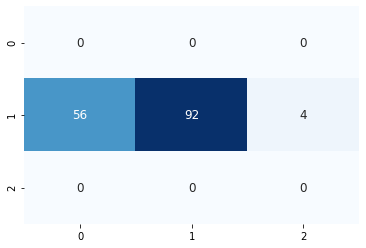

145/145 [==============================] - 0s 313us/sample - loss: 0.7377 - accuracy: 0.6966


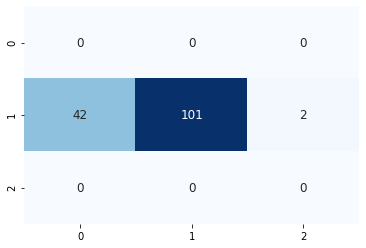

142/142 [==============================] - 0s 253us/sample - loss: 0.7665 - accuracy: 0.6268


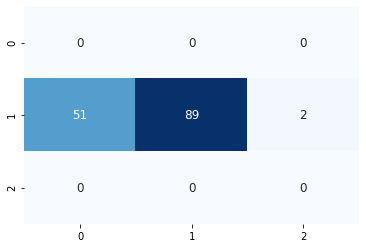

138/138 [==============================] - 0s 234us/sample - loss: 0.7160 - accuracy: 0.6812


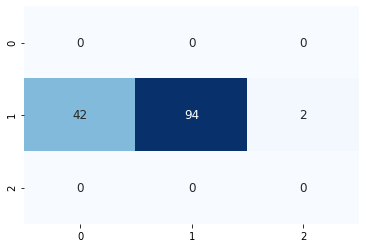

137/137 [==============================] - 0s 245us/sample - loss: 0.6650 - accuracy: 0.6861


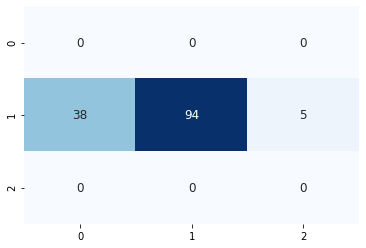

137/137 [==============================] - 0s 249us/sample - loss: 0.7296 - accuracy: 0.6788


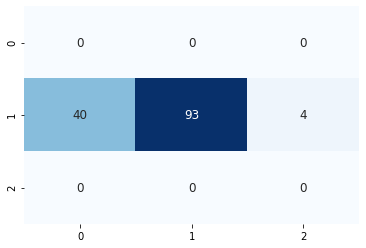

136/136 [==============================] - 0s 270us/sample - loss: 0.7698 - accuracy: 0.6618


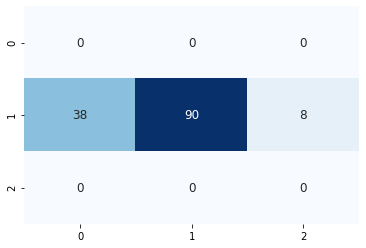

135/135 [==============================] - 0s 306us/sample - loss: 0.7819 - accuracy: 0.6444


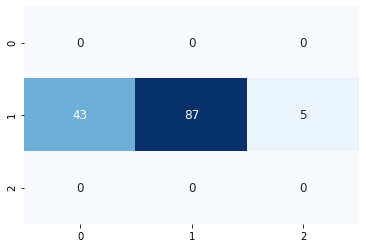

136/136 [==============================] - 0s 281us/sample - loss: 0.7996 - accuracy: 0.6250


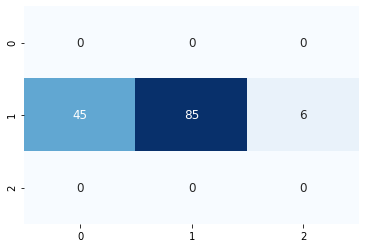

134/134 [==============================] - 0s 261us/sample - loss: 0.7472 - accuracy: 0.6940


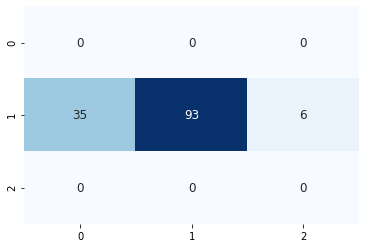

132/132 [==============================] - 0s 285us/sample - loss: 0.8261 - accuracy: 0.6439


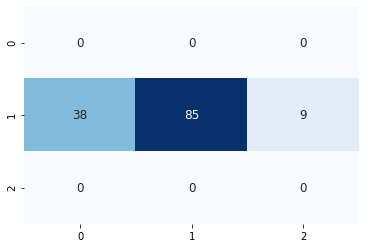

132/132 [==============================] - 0s 289us/sample - loss: 0.8385 - accuracy: 0.6061


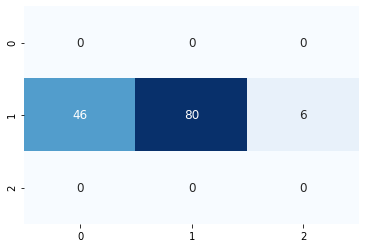

133/133 [==============================] - 0s 330us/sample - loss: 0.9226 - accuracy: 0.6090


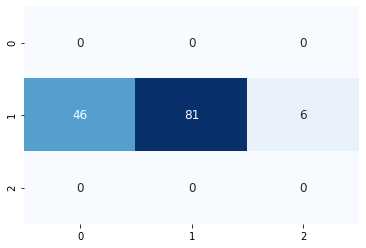

132/132 [==============================] - 0s 263us/sample - loss: 1.0238 - accuracy: 0.5152


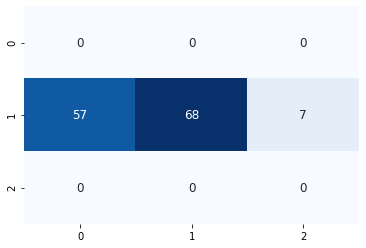

133/133 [==============================] - 0s 274us/sample - loss: 0.9779 - accuracy: 0.5263


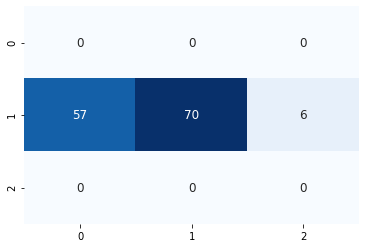

130/130 [==============================] - 0s 289us/sample - loss: 1.0405 - accuracy: 0.5385


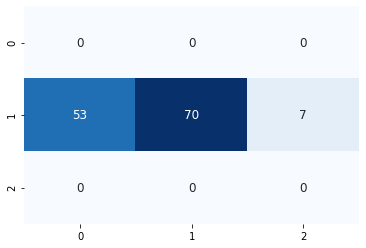

132/132 [==============================] - 0s 293us/sample - loss: 0.9818 - accuracy: 0.5152


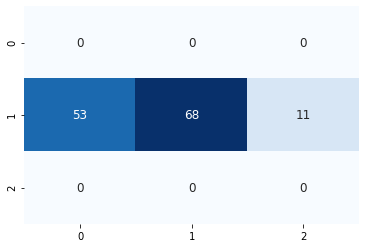

131/131 [==============================] - 0s 304us/sample - loss: 1.0373 - accuracy: 0.5267


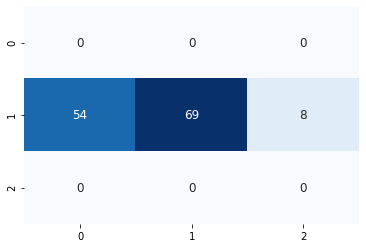

132/132 [==============================] - 0s 280us/sample - loss: 1.0468 - accuracy: 0.4621


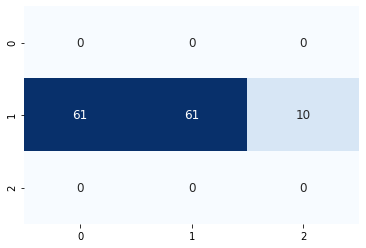

131/131 [==============================] - 0s 263us/sample - loss: 1.0644 - accuracy: 0.5038


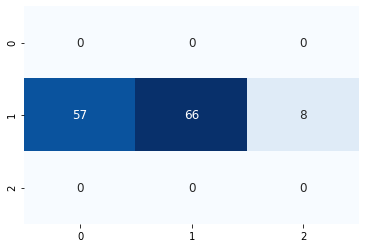

129/129 [==============================] - 0s 264us/sample - loss: 0.9689 - accuracy: 0.5271


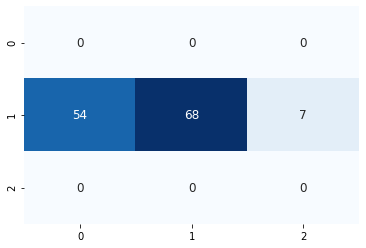

129/129 [==============================] - 0s 256us/sample - loss: 1.0729 - accuracy: 0.5659


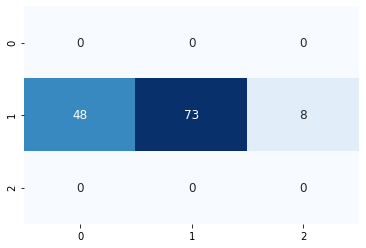

129/129 [==============================] - 0s 329us/sample - loss: 1.1780 - accuracy: 0.4729


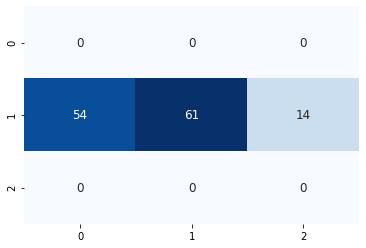

128/128 [==============================] - 0s 2ms/sample - loss: 1.0507 - accuracy: 0.5469


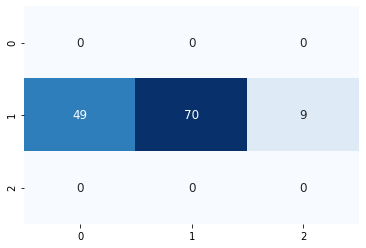

129/129 [==============================] - 0s 249us/sample - loss: 1.2443 - accuracy: 0.4496


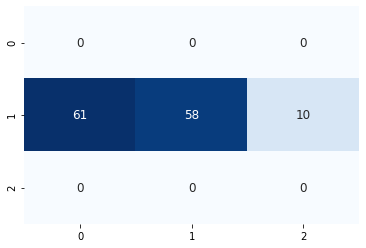

127/127 [==============================] - 0s 241us/sample - loss: 1.0757 - accuracy: 0.5039


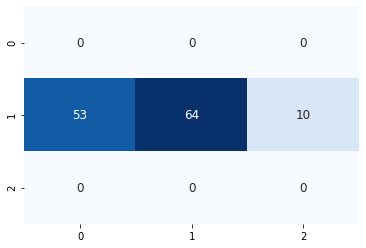

127/127 [==============================] - 0s 238us/sample - loss: 1.1869 - accuracy: 0.5197


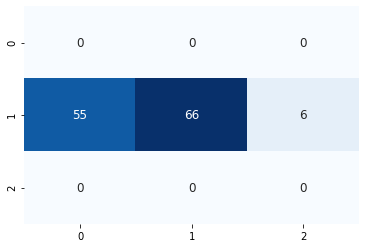

126/126 [==============================] - 0s 267us/sample - loss: 1.1941 - accuracy: 0.4921


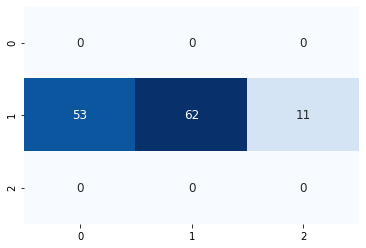

124/124 [==============================] - 0s 235us/sample - loss: 1.2072 - accuracy: 0.4597


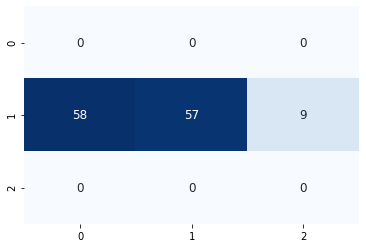

126/126 [==============================] - 0s 276us/sample - loss: 1.0524 - accuracy: 0.5079


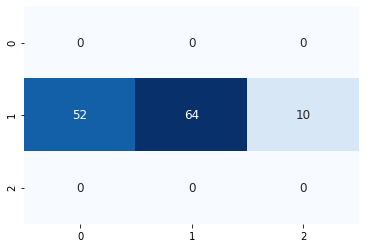

125/125 [==============================] - 0s 248us/sample - loss: 1.0589 - accuracy: 0.4880


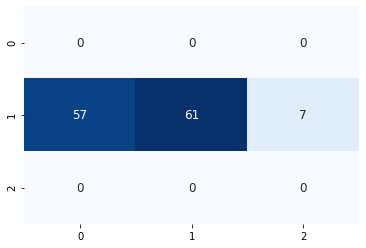

123/123 [==============================] - 0s 279us/sample - loss: 1.2320 - accuracy: 0.4390


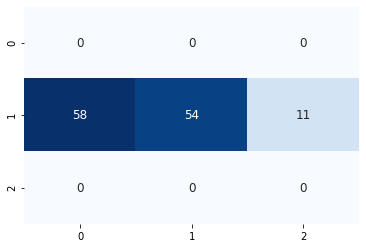

125/125 [==============================] - 0s 256us/sample - loss: 1.2561 - accuracy: 0.4480


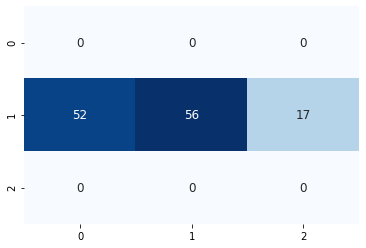

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3864 samples, validate on 1006 samples
Epoch 1/300
3864/3864 [==============================] - 3s 690us/sample - loss: 1.0019 - accuracy: 0.4982 - val_loss: 1.0009 - val_accuracy: 0.5239
Epoch 2/300
3864/3864 [==============================] - 1s 219us/sample - loss: 0.8412 - accuracy: 0.6284 - val_loss: 1.0016 - val_accuracy: 0.5368
Epoch 3/300
3864/3864 [==============================] - 1s 204us/sample - loss: 0.7575 - accuracy: 0.6786 - val_loss: 1.0190 - val_accuracy: 0.5288
Epoch 4/300
3864/3864 [==============================] - 1s 196us/sample - loss: 0.6790 - accuracy: 0.7306 - val_loss: 1.0548 - val_accuracy: 0.5298
Epoch 00004: early stopping
119/119 [==============================] - 0s 140us/sample - loss: 0.6530 - accuracy: 0.7227


23it [11:48:57, 1790.92s/it]
100%|██████████| 3/3 [00:06<00:00,  2.06s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.12109375 steps, validate for 75.3984375 steps
Epoch 1/300
283/282 [==============================] - 30s 104ms/step - loss: 0.9447 - accuracy: 0.5627 - val_loss: 0.9986 - val_accuracy: 0.5517
Epoch 2/300
283/282 [==============================] - 28s 99ms/step - loss: 0.8843 - accuracy: 0.5956 - val_loss: 1.0118 - val_accuracy: 0.5402
Epoch 3/300
283/282 [==============================] - 28s 99ms/step - loss: 0.8561 - accuracy: 0.6102 - val_loss: 1.0372 - val_accuracy: 0.5294
Epoch 4/300
283/282 [==============================] - 29s 101ms/step - loss: 0.8325 - accuracy: 0.6215 - val_loss: 1.0565 - val_accuracy: 0.5242
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.12109375 steps, validate for 75.3984375 steps
Epoch 1/300
283/282 [==============================] - 70s 247ms/step - loss: 0.7966 - accuracy: 0.6424 - val_loss: 1.1781 - val_accurac

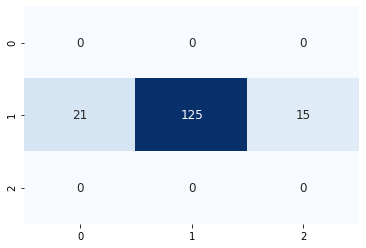

154/154 [==============================] - 0s 236us/sample - loss: 0.5884 - accuracy: 0.7532


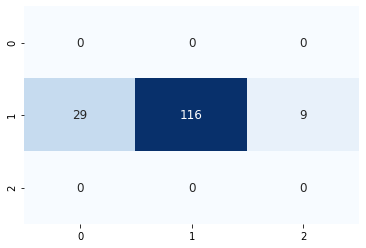

151/151 [==============================] - 0s 259us/sample - loss: 0.5778 - accuracy: 0.7616


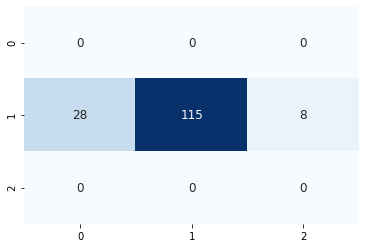

146/146 [==============================] - 0s 232us/sample - loss: 0.5480 - accuracy: 0.7808


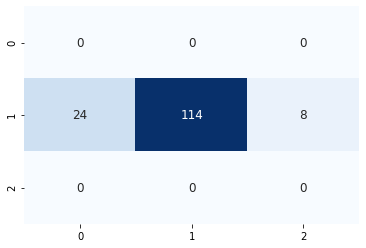

147/147 [==============================] - 0s 300us/sample - loss: 0.5208 - accuracy: 0.8027


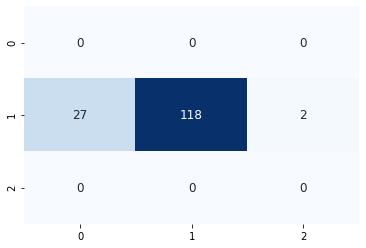

145/145 [==============================] - 0s 251us/sample - loss: 0.5315 - accuracy: 0.7862


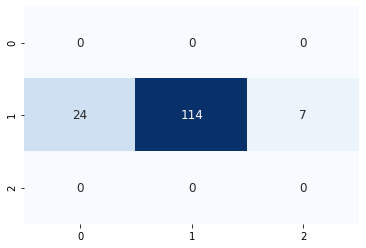

145/145 [==============================] - 0s 312us/sample - loss: 0.5602 - accuracy: 0.7655


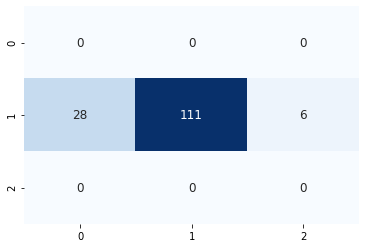

144/144 [==============================] - 0s 281us/sample - loss: 0.5426 - accuracy: 0.7986


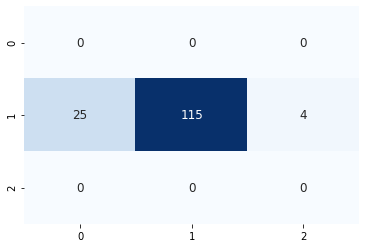

145/145 [==============================] - 0s 323us/sample - loss: 0.5831 - accuracy: 0.7793


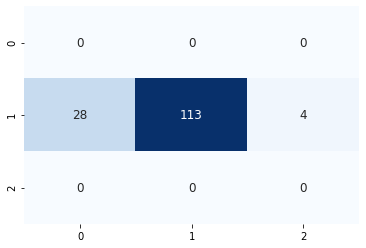

143/143 [==============================] - 0s 288us/sample - loss: 0.5577 - accuracy: 0.7692


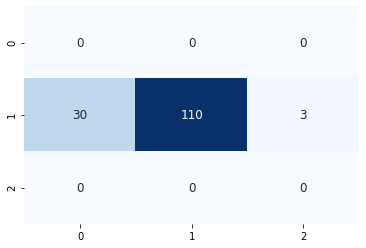

142/142 [==============================] - 0s 293us/sample - loss: 0.6093 - accuracy: 0.7887


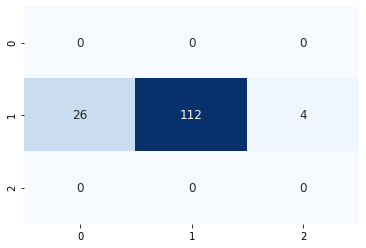

140/140 [==============================] - 0s 275us/sample - loss: 0.5362 - accuracy: 0.7714


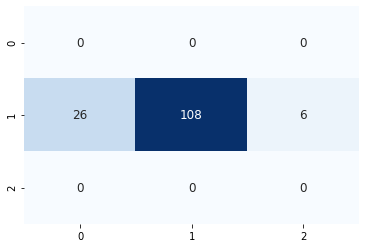

138/138 [==============================] - 0s 259us/sample - loss: 0.5746 - accuracy: 0.7826


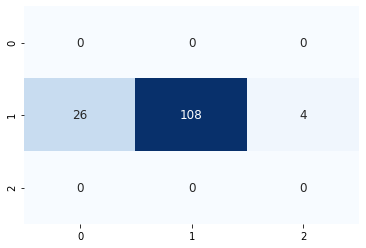

138/138 [==============================] - 0s 266us/sample - loss: 0.5700 - accuracy: 0.7319


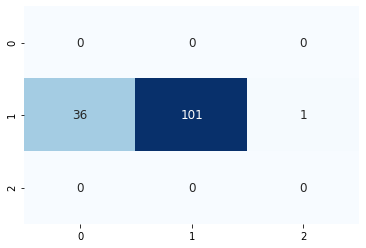

137/137 [==============================] - 0s 289us/sample - loss: 0.6223 - accuracy: 0.7299


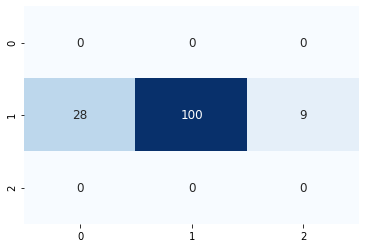

136/136 [==============================] - 0s 290us/sample - loss: 0.6235 - accuracy: 0.7279


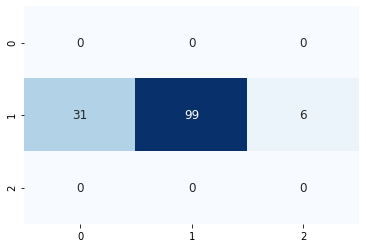

138/138 [==============================] - 0s 264us/sample - loss: 0.6046 - accuracy: 0.7246


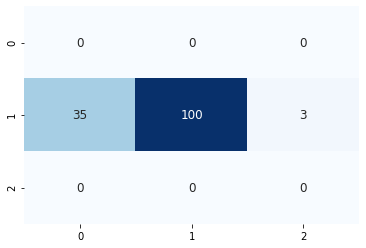

138/138 [==============================] - 0s 321us/sample - loss: 0.6013 - accuracy: 0.7319


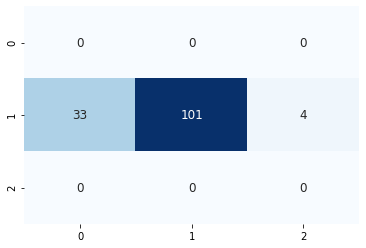

137/137 [==============================] - 0s 287us/sample - loss: 0.6057 - accuracy: 0.7226


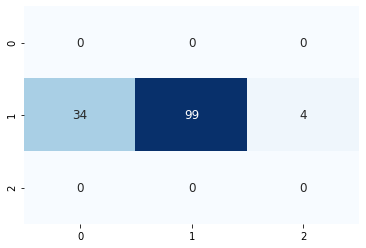

136/136 [==============================] - 0s 291us/sample - loss: 0.5726 - accuracy: 0.7206


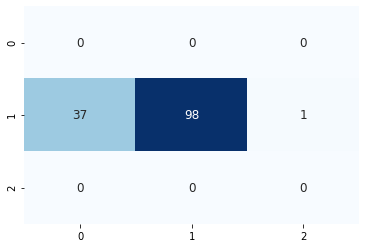

136/136 [==============================] - 0s 267us/sample - loss: 0.5640 - accuracy: 0.7794


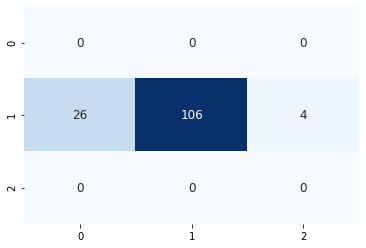

136/136 [==============================] - 0s 301us/sample - loss: 0.5732 - accuracy: 0.7868


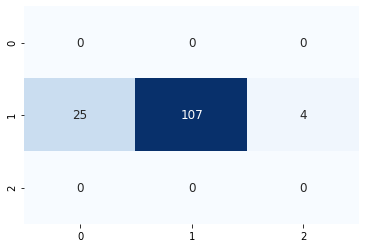

136/136 [==============================] - 0s 253us/sample - loss: 0.5502 - accuracy: 0.7941


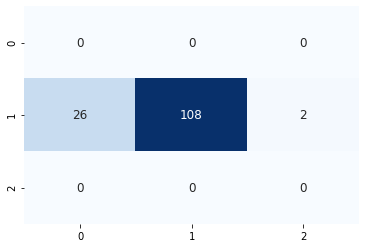

135/135 [==============================] - 0s 308us/sample - loss: 0.5615 - accuracy: 0.7556


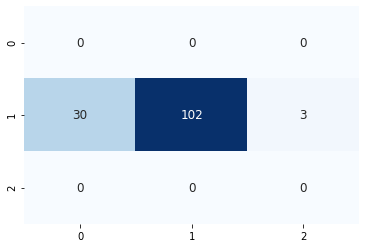

135/135 [==============================] - 0s 292us/sample - loss: 0.5546 - accuracy: 0.7630


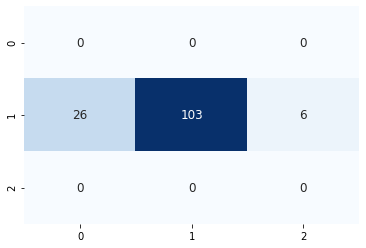

134/134 [==============================] - 0s 292us/sample - loss: 0.5978 - accuracy: 0.7239


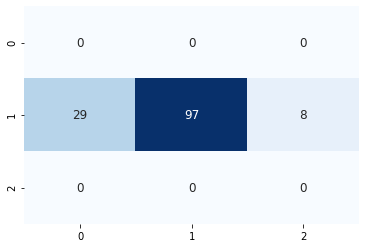

133/133 [==============================] - 0s 289us/sample - loss: 0.6096 - accuracy: 0.7068


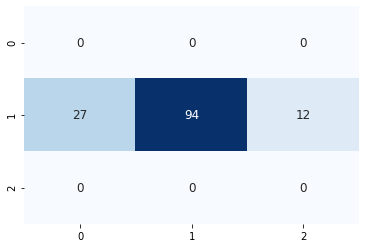

125/125 [==============================] - 0s 288us/sample - loss: 0.6325 - accuracy: 0.7200


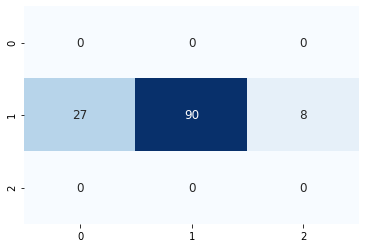

124/124 [==============================] - 0s 245us/sample - loss: 0.5574 - accuracy: 0.8065


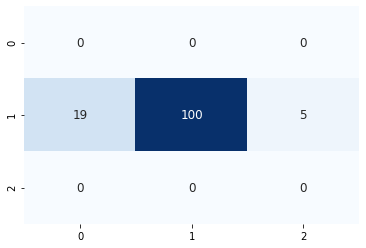

122/122 [==============================] - 0s 245us/sample - loss: 0.6245 - accuracy: 0.7295


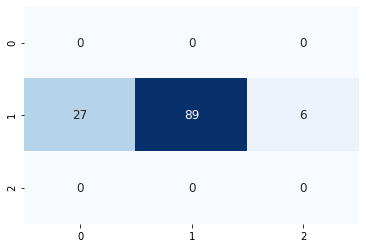

119/119 [==============================] - 0s 263us/sample - loss: 0.5864 - accuracy: 0.7647


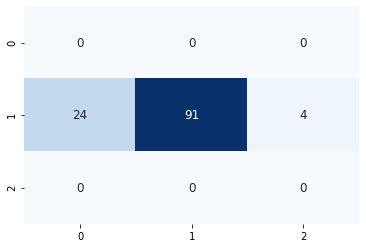

117/117 [==============================] - 0s 289us/sample - loss: 0.5729 - accuracy: 0.7094


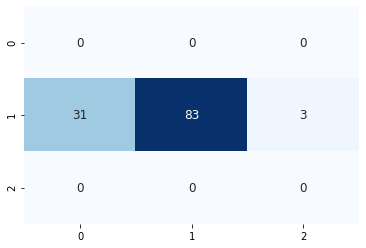

116/116 [==============================] - 0s 288us/sample - loss: 0.5819 - accuracy: 0.7586


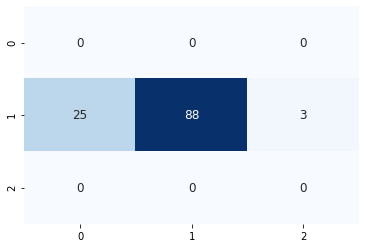

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3865 samples, validate on 1016 samples
Epoch 1/300
3865/3865 [==============================] - 3s 688us/sample - loss: 0.9649 - accuracy: 0.5260 - val_loss: 0.9985 - val_accuracy: 0.5305
Epoch 2/300
3865/3865 [==============================] - 1s 214us/sample - loss: 0.8065 - accuracy: 0.6282 - val_loss: 1.0123 - val_accuracy: 0.5276
Epoch 3/300
3865/3865 [==============================] - 1s 202us/sample - loss: 0.7106 - accuracy: 0.6986 - val_loss: 1.0442 - val_accuracy: 0.5236
Epoch 4/300
3865/3865 [==============================] - 1s 217us/sample - loss: 0.6263 - accuracy: 0.7420 - val_loss: 1.0968 - val_accuracy: 0.5167
Epoch 00004: early stopping
108/108 [==============================] - 0s 138us/sample - loss: 0.5248 - accuracy: 0.8519


24it [12:18:10, 1779.63s/it]
100%|██████████| 3/3 [00:06<00:00,  2.10s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.669921875 steps, validate for 75.134765625 steps
Epoch 1/300
283/282 [==============================] - 29s 104ms/step - loss: 0.9654 - accuracy: 0.5481 - val_loss: 1.0129 - val_accuracy: 0.5484
Epoch 2/300
283/282 [==============================] - 28s 100ms/step - loss: 0.8835 - accuracy: 0.5951 - val_loss: 1.0230 - val_accuracy: 0.5445
Epoch 3/300
283/282 [==============================] - 28s 100ms/step - loss: 0.8522 - accuracy: 0.6103 - val_loss: 1.0394 - val_accuracy: 0.5254
Epoch 4/300
283/282 [==============================] - 28s 100ms/step - loss: 0.8274 - accuracy: 0.6240 - val_loss: 1.0733 - val_accuracy: 0.5319
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.669921875 steps, validate for 75.134765625 steps
Epoch 1/300
283/282 [==============================] - 70s 247ms/step - loss: 0.7901 - accuracy: 0.6458 - val_loss: 1.0764 - val

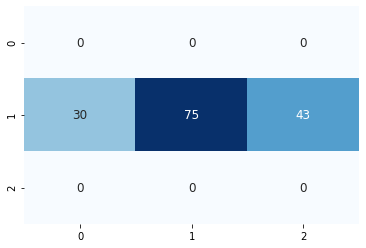

147/147 [==============================] - 0s 239us/sample - loss: 1.0410 - accuracy: 0.4966


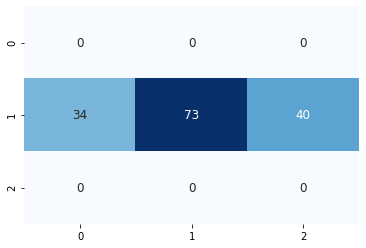

146/146 [==============================] - 0s 378us/sample - loss: 1.0069 - accuracy: 0.4658


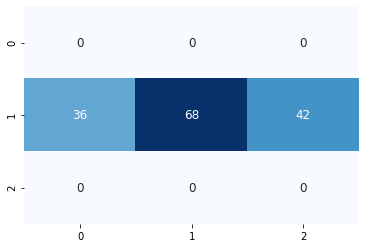

144/144 [==============================] - 0s 350us/sample - loss: 1.0147 - accuracy: 0.5069


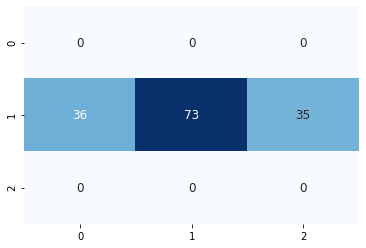

144/144 [==============================] - 0s 392us/sample - loss: 1.0481 - accuracy: 0.5278


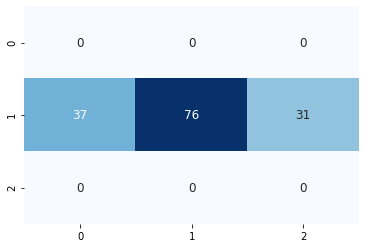

140/140 [==============================] - 0s 305us/sample - loss: 1.1009 - accuracy: 0.4929


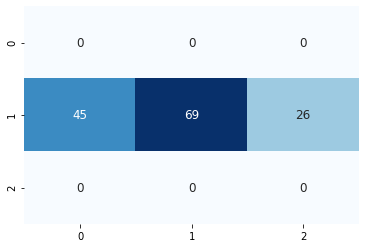

139/139 [==============================] - 0s 288us/sample - loss: 1.1791 - accuracy: 0.4892


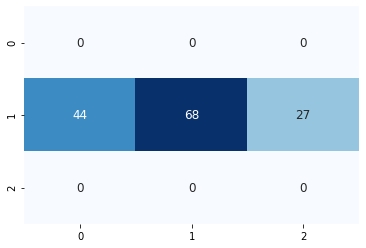

138/138 [==============================] - 0s 290us/sample - loss: 1.1711 - accuracy: 0.5290


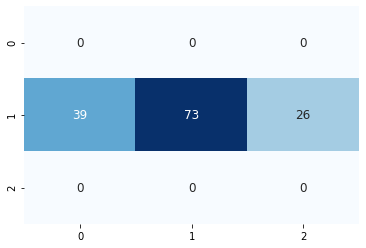

135/135 [==============================] - 0s 277us/sample - loss: 1.1646 - accuracy: 0.4370


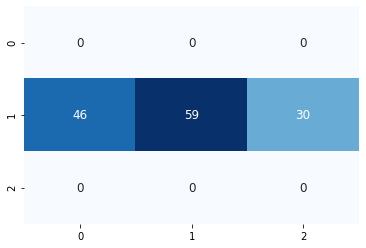

135/135 [==============================] - 0s 264us/sample - loss: 1.2187 - accuracy: 0.4444


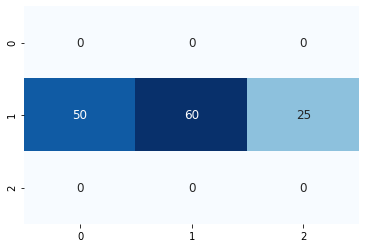

135/135 [==============================] - 0s 310us/sample - loss: 1.0368 - accuracy: 0.5185


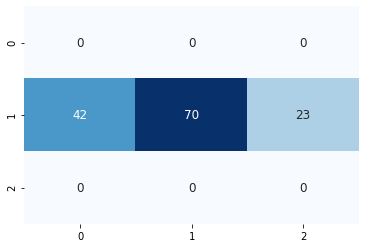

132/132 [==============================] - 0s 295us/sample - loss: 1.2164 - accuracy: 0.4924


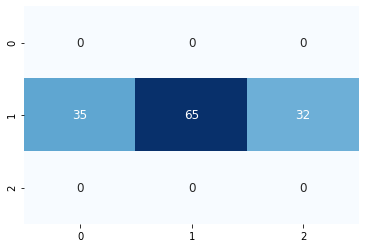

132/132 [==============================] - 0s 266us/sample - loss: 1.0775 - accuracy: 0.5076


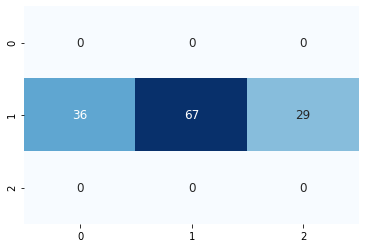

131/131 [==============================] - 0s 286us/sample - loss: 1.1520 - accuracy: 0.4809


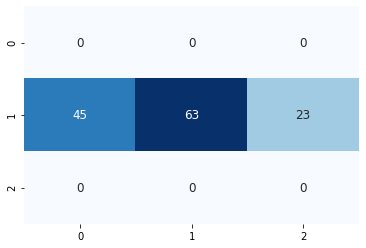

130/130 [==============================] - 0s 318us/sample - loss: 1.1478 - accuracy: 0.5462


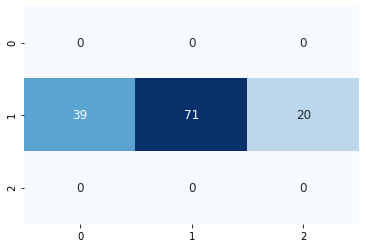

131/131 [==============================] - 0s 267us/sample - loss: 1.0713 - accuracy: 0.5725


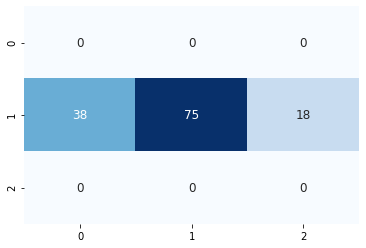

130/130 [==============================] - 0s 323us/sample - loss: 1.0471 - accuracy: 0.5385


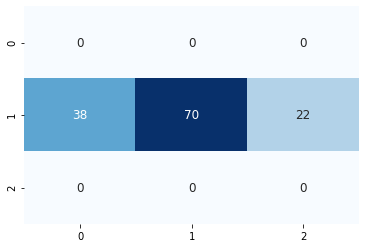

128/128 [==============================] - 0s 2ms/sample - loss: 1.0455 - accuracy: 0.5312


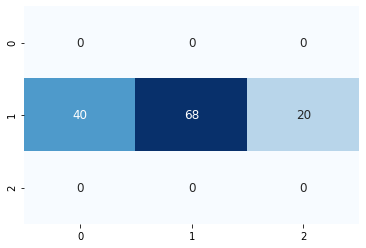

130/130 [==============================] - 0s 270us/sample - loss: 1.0526 - accuracy: 0.5692


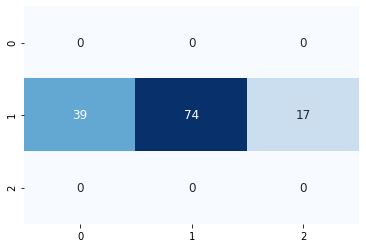

130/130 [==============================] - 0s 273us/sample - loss: 1.1047 - accuracy: 0.5385


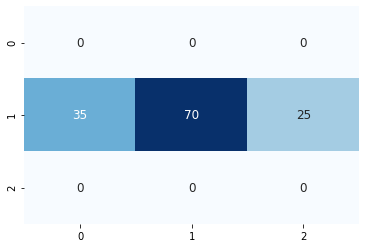

131/131 [==============================] - 0s 331us/sample - loss: 1.1086 - accuracy: 0.4962


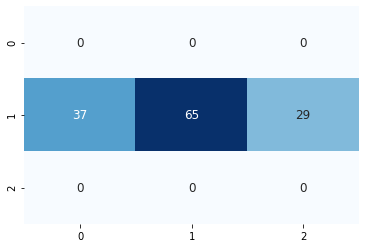

131/131 [==============================] - 0s 425us/sample - loss: 1.1660 - accuracy: 0.5191


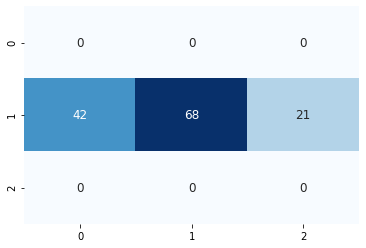

131/131 [==============================] - 0s 277us/sample - loss: 1.1331 - accuracy: 0.5038


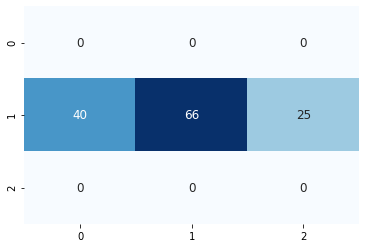

130/130 [==============================] - 0s 270us/sample - loss: 1.1457 - accuracy: 0.5308


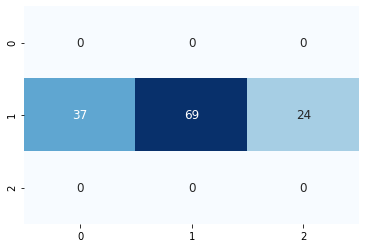

129/129 [==============================] - 0s 282us/sample - loss: 1.1943 - accuracy: 0.4884


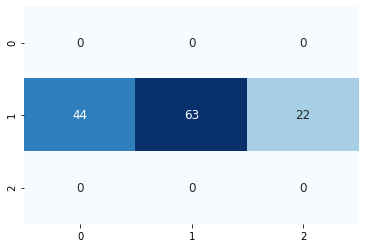

128/128 [==============================] - 0s 258us/sample - loss: 1.1229 - accuracy: 0.5469


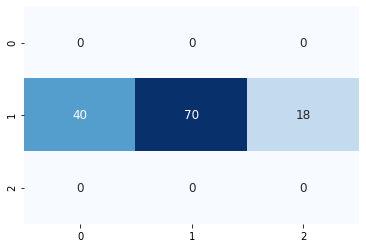

129/129 [==============================] - 0s 284us/sample - loss: 1.1666 - accuracy: 0.4264


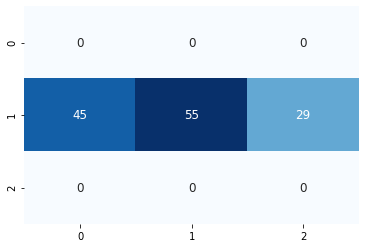

127/127 [==============================] - 0s 255us/sample - loss: 1.1349 - accuracy: 0.5591


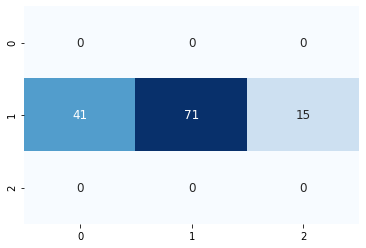

128/128 [==============================] - 0s 237us/sample - loss: 1.0809 - accuracy: 0.5469


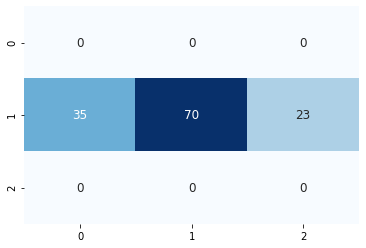

126/126 [==============================] - 0s 256us/sample - loss: 1.1064 - accuracy: 0.5317


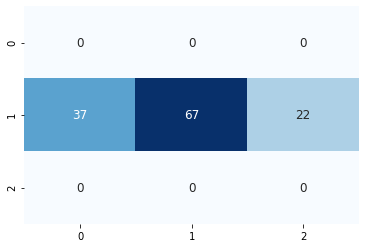

124/124 [==============================] - 0s 361us/sample - loss: 1.2177 - accuracy: 0.4919


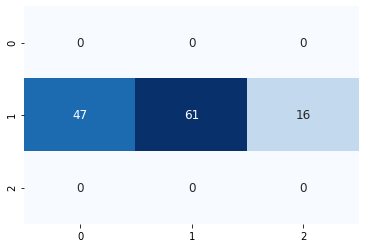

122/122 [==============================] - 0s 266us/sample - loss: 1.1811 - accuracy: 0.5164


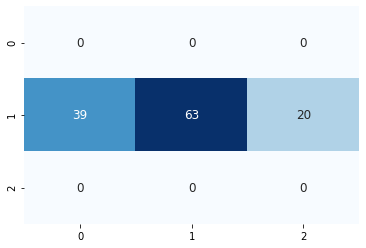

122/122 [==============================] - 0s 242us/sample - loss: 1.0330 - accuracy: 0.5574


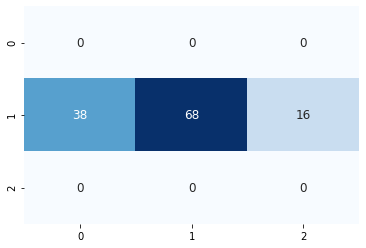

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3862 samples, validate on 1011 samples
Epoch 1/300
3862/3862 [==============================] - 3s 654us/sample - loss: 0.9791 - accuracy: 0.5350 - val_loss: 0.9968 - val_accuracy: 0.5302
Epoch 2/300
3862/3862 [==============================] - 1s 203us/sample - loss: 0.8262 - accuracy: 0.6422 - val_loss: 0.9995 - val_accuracy: 0.5321
Epoch 3/300
3862/3862 [==============================] - 1s 197us/sample - loss: 0.7252 - accuracy: 0.6991 - val_loss: 1.0241 - val_accuracy: 0.5232
Epoch 4/300
3862/3862 [==============================] - 1s 211us/sample - loss: 0.6424 - accuracy: 0.7475 - val_loss: 1.0758 - val_accuracy: 0.5124
Epoch 00004: early stopping
116/116 [==============================] - 0s 174us/sample - loss: 0.5082 - accuracy: 0.8362


25it [12:46:23, 1839.33s/it]
0it [00:00, ?it/s]
100%|██████████| 3/3 [00:06<00:00,  2.17s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 281.095703125 steps, validate for 73.875 steps
Epoch 1/300
282/281 [==============================] - 29s 103ms/step - loss: 0.9854 - accuracy: 0.5413 - val_loss: 1.0008 - val_accuracy: 0.5412
Epoch 2/300
282/281 [==============================] - 28s 100ms/step - loss: 0.8820 - accuracy: 0.5951 - val_loss: 1.0125 - val_accuracy: 0.5333
Epoch 3/300
282/281 [==============================] - 29s 101ms/step - loss: 0.8514 - accuracy: 0.6114 - val_loss: 1.0357 - val_accuracy: 0.5262
Epoch 4/300
282/281 [==============================] - 28s 100ms/step - loss: 0.8267 - accuracy: 0.6239 - val_loss: 1.0745 - val_accuracy: 0.5281
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 281.095703125 steps, validate for 73.875 steps
Epoch 1/300
282/281 [==============================] - 69s 246ms/step - loss: 0.7875 - accuracy: 0.6468 - val_loss: 1.1526 - val_accuracy: 0

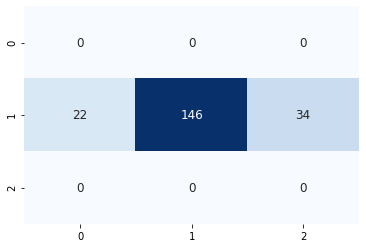

196/196 [==============================] - 0s 252us/sample - loss: 0.8137 - accuracy: 0.6633


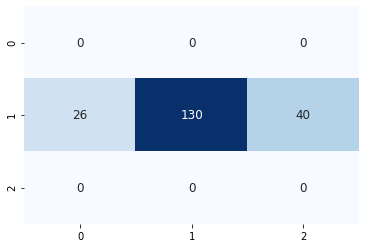

193/193 [==============================] - 0s 332us/sample - loss: 0.8043 - accuracy: 0.6788


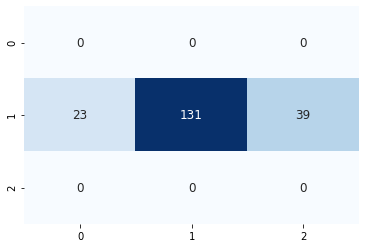

190/190 [==============================] - 0s 247us/sample - loss: 0.7244 - accuracy: 0.7211


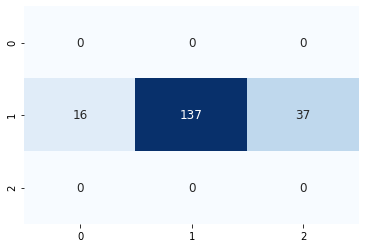

190/190 [==============================] - 0s 243us/sample - loss: 0.7837 - accuracy: 0.6684


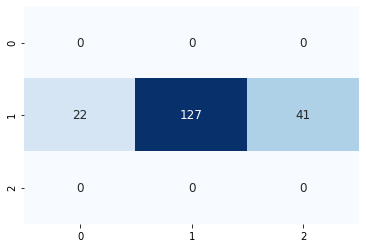

187/187 [==============================] - 0s 251us/sample - loss: 0.7085 - accuracy: 0.7326


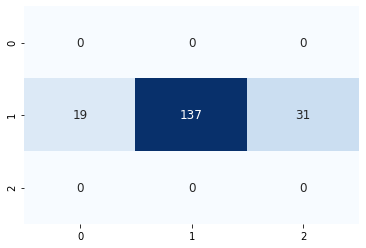

184/184 [==============================] - 0s 267us/sample - loss: 0.6354 - accuracy: 0.7935


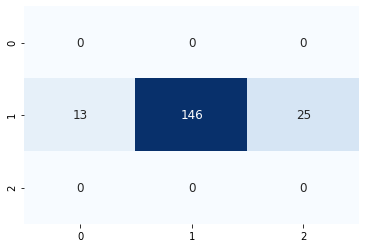

183/183 [==============================] - 0s 294us/sample - loss: 0.7019 - accuracy: 0.7213


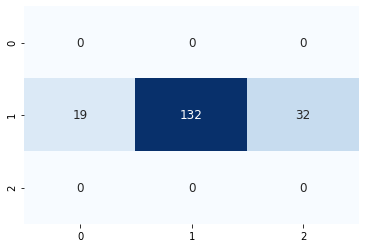

182/182 [==============================] - 0s 246us/sample - loss: 0.7076 - accuracy: 0.7363


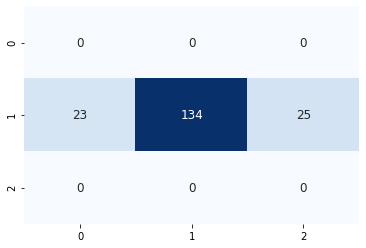

181/181 [==============================] - 0s 256us/sample - loss: 0.7553 - accuracy: 0.6961


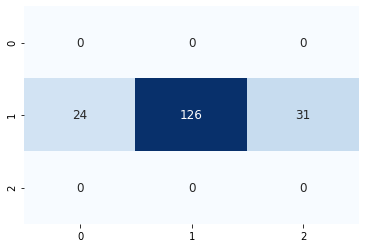

177/177 [==============================] - 0s 237us/sample - loss: 0.7318 - accuracy: 0.7062


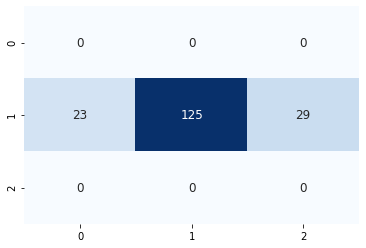

178/178 [==============================] - 0s 240us/sample - loss: 0.7715 - accuracy: 0.6629


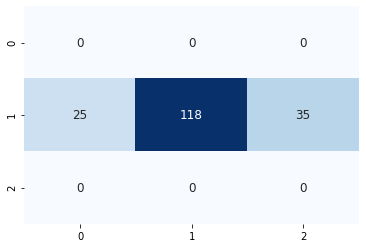

178/178 [==============================] - 0s 251us/sample - loss: 0.6580 - accuracy: 0.7360


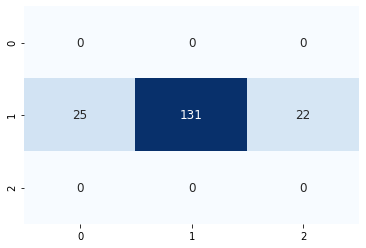

176/176 [==============================] - 0s 265us/sample - loss: 0.7244 - accuracy: 0.7102


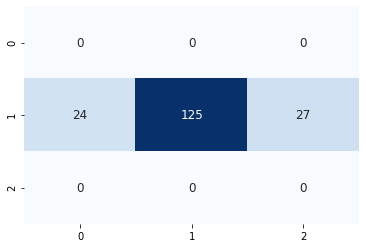

175/175 [==============================] - 0s 256us/sample - loss: 0.6677 - accuracy: 0.7371


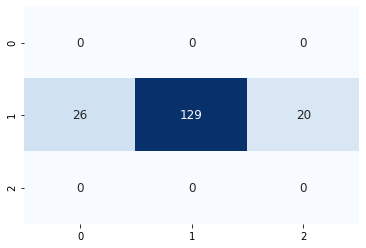

176/176 [==============================] - 0s 253us/sample - loss: 0.6303 - accuracy: 0.7841


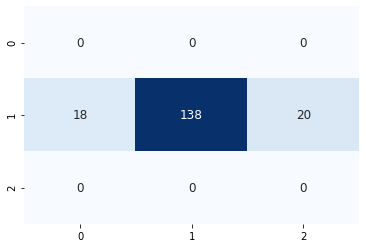

173/173 [==============================] - 0s 260us/sample - loss: 0.6316 - accuracy: 0.7630


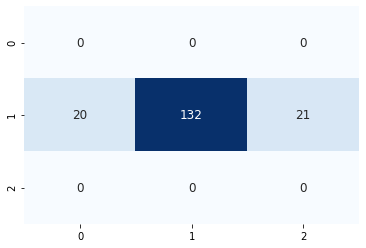

172/172 [==============================] - 0s 250us/sample - loss: 0.6889 - accuracy: 0.7151


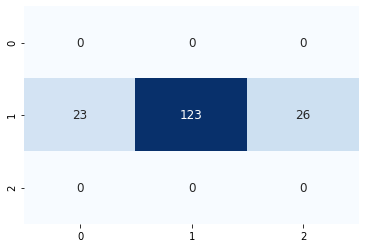

171/171 [==============================] - 0s 264us/sample - loss: 0.6477 - accuracy: 0.7368


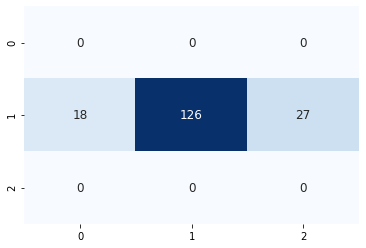

171/171 [==============================] - 0s 249us/sample - loss: 0.6303 - accuracy: 0.7895


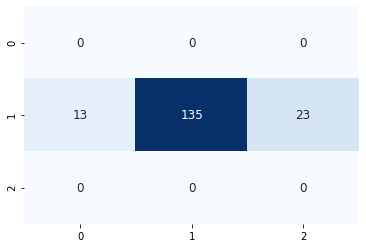

171/171 [==============================] - 0s 238us/sample - loss: 0.5980 - accuracy: 0.8070


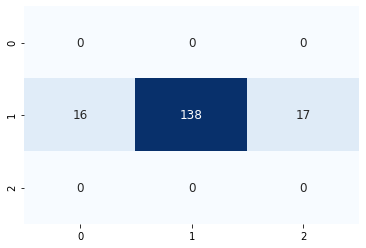

170/170 [==============================] - 0s 244us/sample - loss: 0.6884 - accuracy: 0.7118


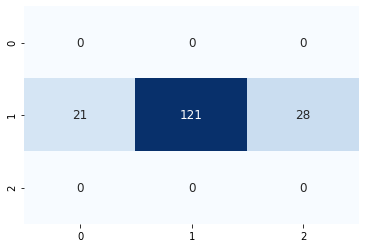

171/171 [==============================] - 0s 275us/sample - loss: 0.5980 - accuracy: 0.7778


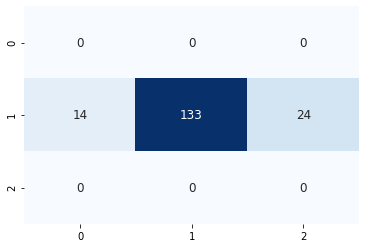

170/170 [==============================] - 0s 277us/sample - loss: 0.6178 - accuracy: 0.7706


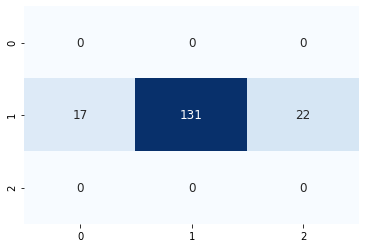

170/170 [==============================] - 0s 287us/sample - loss: 0.5841 - accuracy: 0.8059


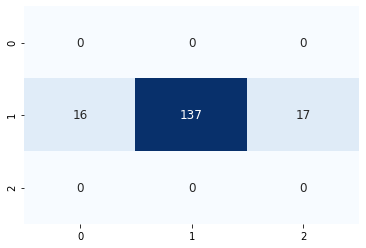

171/171 [==============================] - 0s 259us/sample - loss: 0.6159 - accuracy: 0.8070


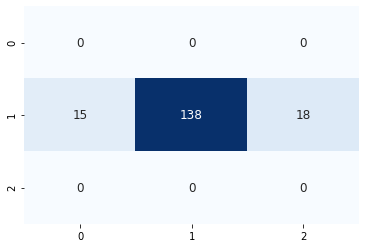

168/168 [==============================] - 0s 245us/sample - loss: 0.6474 - accuracy: 0.7738


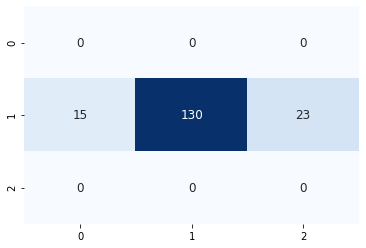

169/169 [==============================] - 0s 285us/sample - loss: 0.6501 - accuracy: 0.7278


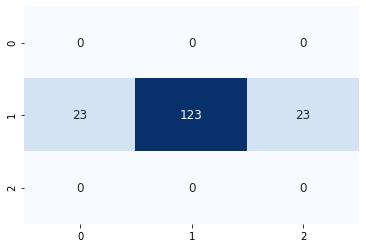

169/169 [==============================] - 0s 242us/sample - loss: 0.7045 - accuracy: 0.7396


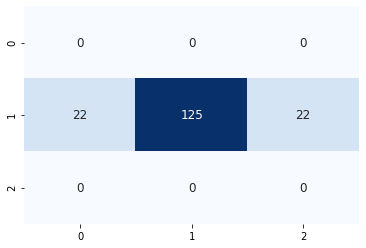

167/167 [==============================] - 0s 272us/sample - loss: 0.7212 - accuracy: 0.7126


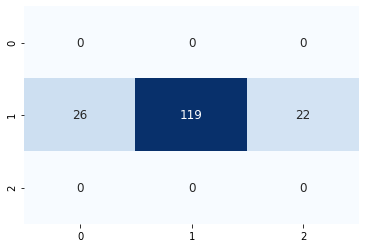

168/168 [==============================] - 0s 236us/sample - loss: 0.7548 - accuracy: 0.7262


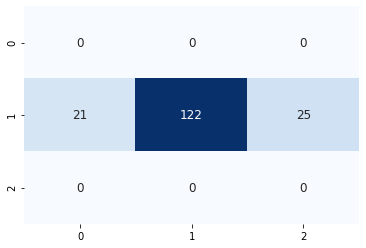

169/169 [==============================] - 0s 247us/sample - loss: 0.6856 - accuracy: 0.7337


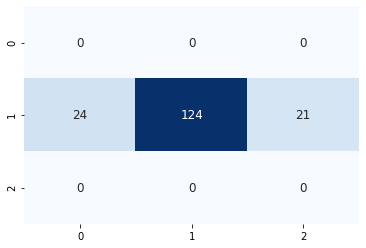

166/166 [==============================] - 0s 280us/sample - loss: 0.7492 - accuracy: 0.7289


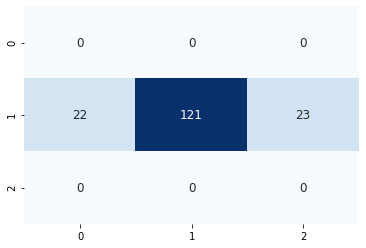

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3837 samples, validate on 993 samples
Epoch 1/300
3837/3837 [==============================] - 3s 686us/sample - loss: 0.9861 - accuracy: 0.5116 - val_loss: 1.0384 - val_accuracy: 0.5086
Epoch 2/300
3837/3837 [==============================] - 1s 210us/sample - loss: 0.8037 - accuracy: 0.6542 - val_loss: 1.0517 - val_accuracy: 0.5136
Epoch 3/300
3837/3837 [==============================] - 1s 210us/sample - loss: 0.7069 - accuracy: 0.7065 - val_loss: 1.0871 - val_accuracy: 0.5166
Epoch 4/300
3837/3837 [==============================] - 1s 216us/sample - loss: 0.6193 - accuracy: 0.7537 - val_loss: 1.1384 - val_accuracy: 0.5096
Epoch 00004: early stopping
159/159 [==============================] - 0s 139us/sample - loss: 0.5672 - accuracy: 0.8113


1it [29:18, 1758.91s/it]
100%|██████████| 3/3 [00:06<00:00,  2.03s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 281.869140625 steps, validate for 74.76953125 steps
Epoch 1/300
282/281 [==============================] - 29s 102ms/step - loss: 0.9562 - accuracy: 0.5515 - val_loss: 1.0002 - val_accuracy: 0.5494
Epoch 2/300
282/281 [==============================] - 28s 98ms/step - loss: 0.8822 - accuracy: 0.5935 - val_loss: 0.9943 - val_accuracy: 0.5483
Epoch 3/300
282/281 [==============================] - 28s 98ms/step - loss: 0.8537 - accuracy: 0.6100 - val_loss: 1.0328 - val_accuracy: 0.5300
Epoch 4/300
282/281 [==============================] - 28s 100ms/step - loss: 0.8294 - accuracy: 0.6237 - val_loss: 1.0452 - val_accuracy: 0.5345
Epoch 5/300
282/281 [==============================] - 28s 101ms/step - loss: 0.8095 - accuracy: 0.6340 - val_loss: 1.0625 - val_accuracy: 0.5149
Epoch 00005: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 281.869140625 steps, validate for 74.7

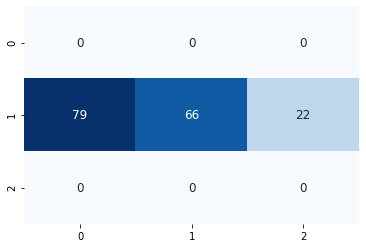

164/164 [==============================] - 0s 250us/sample - loss: 1.1814 - accuracy: 0.4024


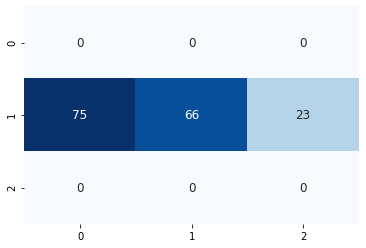

162/162 [==============================] - 0s 250us/sample - loss: 1.2043 - accuracy: 0.4074


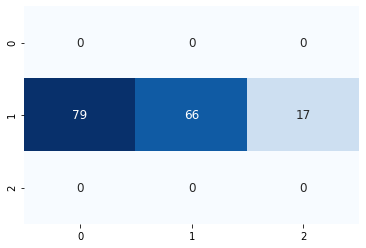

162/162 [==============================] - 0s 277us/sample - loss: 1.1653 - accuracy: 0.4259


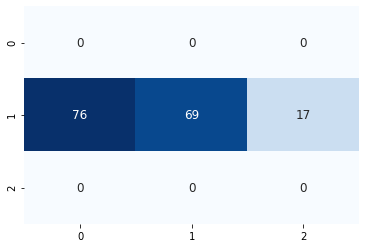

162/162 [==============================] - 0s 284us/sample - loss: 1.1622 - accuracy: 0.4136


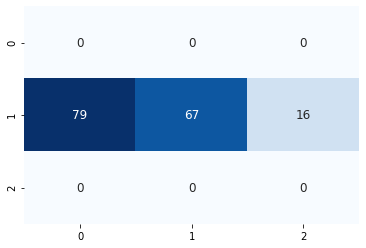

161/161 [==============================] - 0s 328us/sample - loss: 1.0919 - accuracy: 0.4286


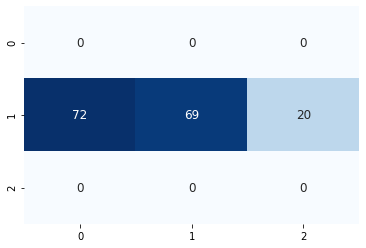

162/162 [==============================] - 0s 313us/sample - loss: 1.0055 - accuracy: 0.5000


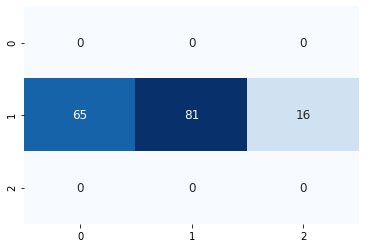

162/162 [==============================] - 0s 246us/sample - loss: 1.1390 - accuracy: 0.4630


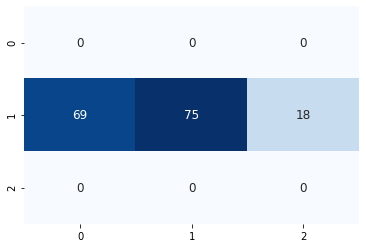

157/157 [==============================] - 0s 247us/sample - loss: 1.0799 - accuracy: 0.4522


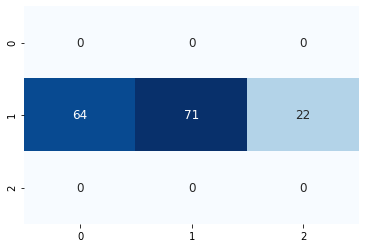

158/158 [==============================] - 0s 297us/sample - loss: 1.0383 - accuracy: 0.4873


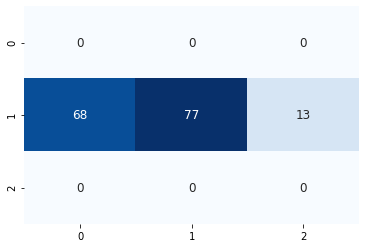

157/157 [==============================] - 0s 265us/sample - loss: 1.0728 - accuracy: 0.5032


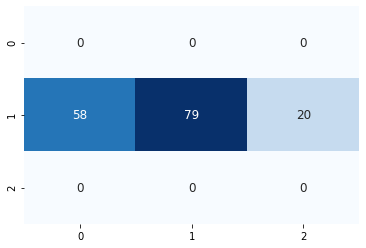

157/157 [==============================] - 0s 315us/sample - loss: 1.1306 - accuracy: 0.4841


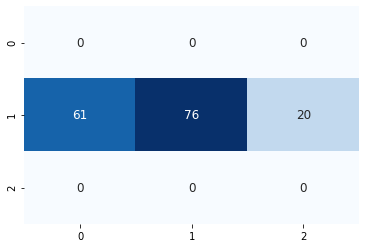

157/157 [==============================] - 0s 226us/sample - loss: 1.1309 - accuracy: 0.4459


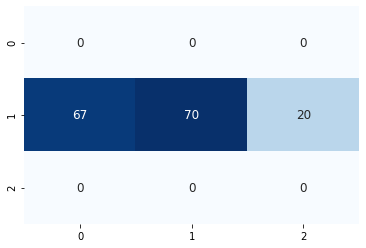

155/155 [==============================] - 0s 235us/sample - loss: 1.1306 - accuracy: 0.4323


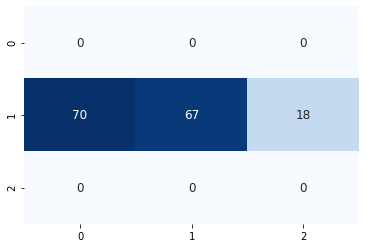

152/152 [==============================] - 0s 259us/sample - loss: 1.2116 - accuracy: 0.4276


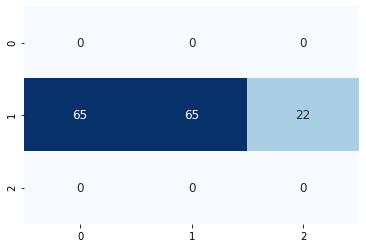

153/153 [==============================] - 0s 239us/sample - loss: 1.2340 - accuracy: 0.4444


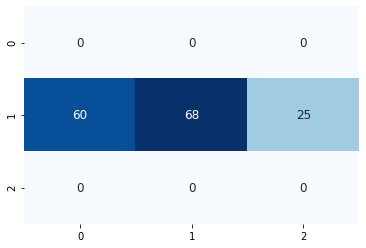

150/150 [==============================] - 0s 286us/sample - loss: 1.1726 - accuracy: 0.4333


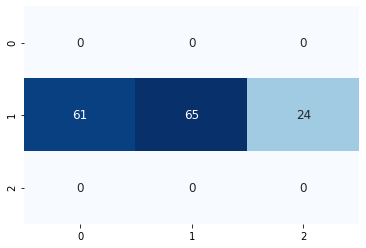

149/149 [==============================] - 0s 244us/sample - loss: 1.2289 - accuracy: 0.4631


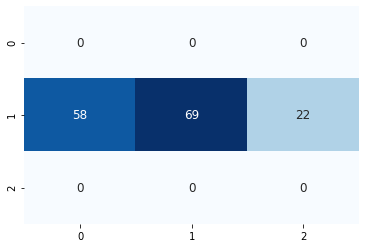

147/147 [==============================] - 0s 267us/sample - loss: 1.2028 - accuracy: 0.4150


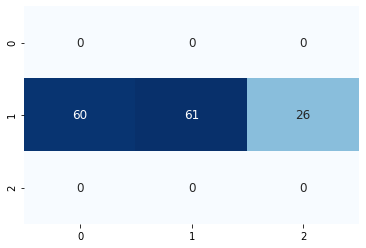

147/147 [==============================] - 0s 274us/sample - loss: 1.2587 - accuracy: 0.4626


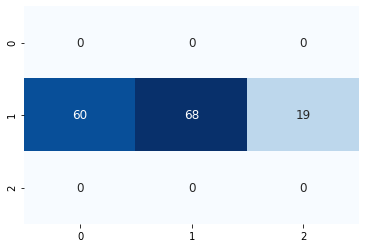

146/146 [==============================] - 0s 251us/sample - loss: 1.2446 - accuracy: 0.4247


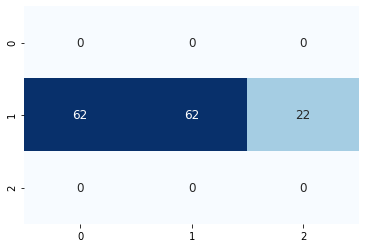

145/145 [==============================] - 0s 272us/sample - loss: 1.2411 - accuracy: 0.4345


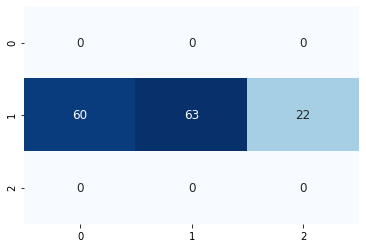

145/145 [==============================] - 0s 250us/sample - loss: 1.2317 - accuracy: 0.4414


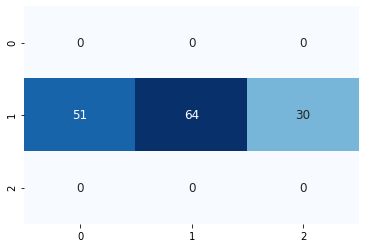

144/144 [==============================] - 0s 250us/sample - loss: 1.3298 - accuracy: 0.4444


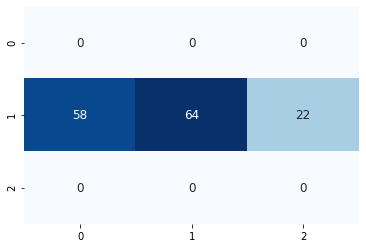

141/141 [==============================] - 0s 281us/sample - loss: 1.2263 - accuracy: 0.4255


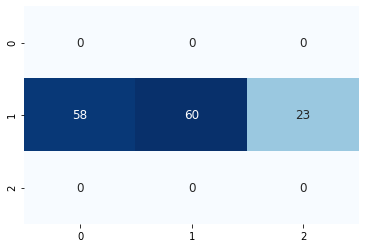

140/140 [==============================] - 0s 272us/sample - loss: 1.2754 - accuracy: 0.4143


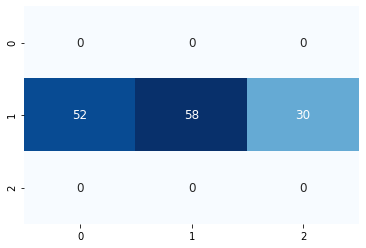

140/140 [==============================] - 0s 254us/sample - loss: 1.2001 - accuracy: 0.4500


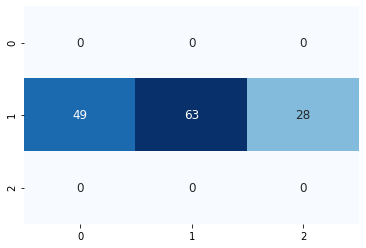

140/140 [==============================] - 0s 265us/sample - loss: 1.1526 - accuracy: 0.5000


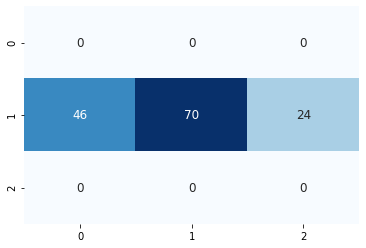

140/140 [==============================] - 0s 236us/sample - loss: 1.2652 - accuracy: 0.4214


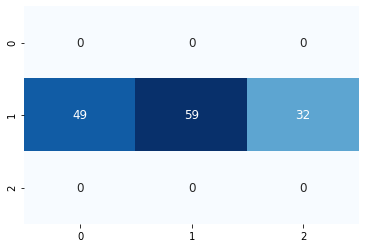

140/140 [==============================] - 0s 273us/sample - loss: 1.2492 - accuracy: 0.3857


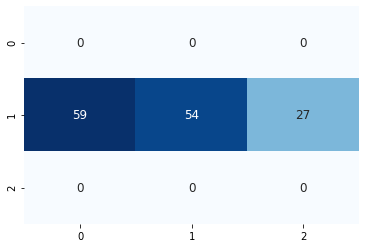

141/141 [==============================] - 0s 327us/sample - loss: 1.1148 - accuracy: 0.4468


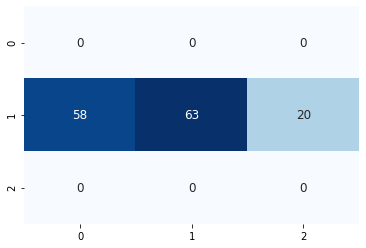

139/139 [==============================] - 0s 261us/sample - loss: 1.1951 - accuracy: 0.4676


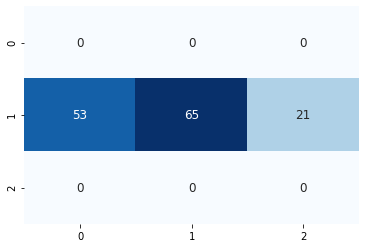

138/138 [==============================] - 0s 260us/sample - loss: 1.0812 - accuracy: 0.4928


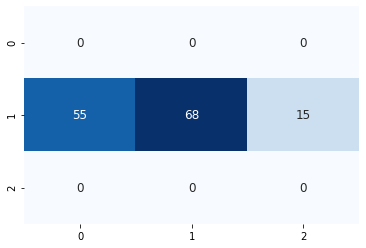

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3850 samples, validate on 1005 samples
Epoch 1/300
3850/3850 [==============================] - 3s 674us/sample - loss: 0.9493 - accuracy: 0.5434 - val_loss: 0.9740 - val_accuracy: 0.5403
Epoch 2/300
3850/3850 [==============================] - 1s 210us/sample - loss: 0.7915 - accuracy: 0.6595 - val_loss: 0.9803 - val_accuracy: 0.5433
Epoch 3/300
3850/3850 [==============================] - 1s 202us/sample - loss: 0.6922 - accuracy: 0.7200 - val_loss: 1.0047 - val_accuracy: 0.5453
Epoch 4/300
3850/3850 [==============================] - 1s 218us/sample - loss: 0.5854 - accuracy: 0.7925 - val_loss: 1.0474 - val_accuracy: 0.5353
Epoch 00004: early stopping
134/134 [==============================] - 0s 139us/sample - loss: 0.6298 - accuracy: 0.7164


2it [58:52, 1763.29s/it]
100%|██████████| 3/3 [00:06<00:00,  2.06s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.181640625 steps, validate for 75.533203125 steps
Epoch 1/300
286/285 [==============================] - 29s 102ms/step - loss: 0.9420 - accuracy: 0.5647 - val_loss: 0.9865 - val_accuracy: 0.5527
Epoch 2/300
286/285 [==============================] - 28s 98ms/step - loss: 0.8782 - accuracy: 0.5996 - val_loss: 1.0201 - val_accuracy: 0.5241
Epoch 3/300
286/285 [==============================] - 28s 99ms/step - loss: 0.8482 - accuracy: 0.6152 - val_loss: 1.0321 - val_accuracy: 0.5253
Epoch 4/300
286/285 [==============================] - 28s 99ms/step - loss: 0.8245 - accuracy: 0.6282 - val_loss: 1.0457 - val_accuracy: 0.5291
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.181640625 steps, validate for 75.533203125 steps
Epoch 1/300
286/285 [==============================] - 69s 242ms/step - loss: 0.7859 - accuracy: 0.6493 - val_loss: 1.3354 - val_ac

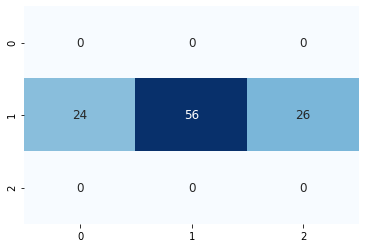

107/107 [==============================] - 0s 406us/sample - loss: 0.8383 - accuracy: 0.5981


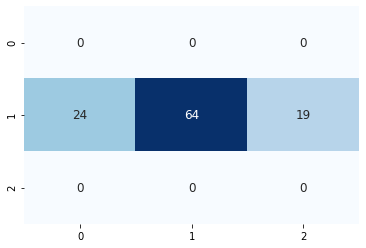

106/106 [==============================] - 0s 235us/sample - loss: 0.8564 - accuracy: 0.6038


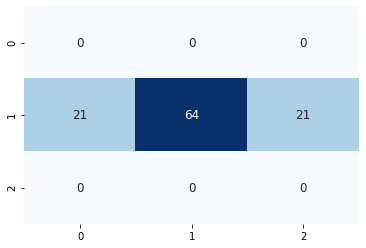

104/104 [==============================] - 0s 243us/sample - loss: 0.9268 - accuracy: 0.5192


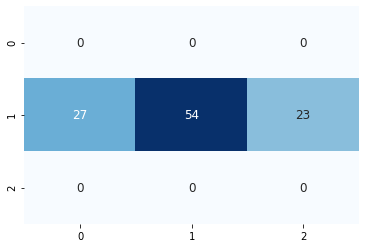

103/103 [==============================] - 0s 269us/sample - loss: 1.0157 - accuracy: 0.5340


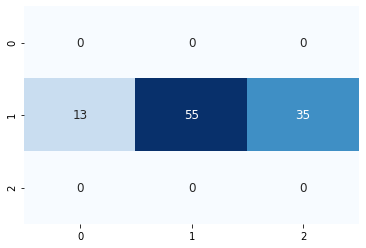

102/102 [==============================] - 0s 279us/sample - loss: 0.8744 - accuracy: 0.5784


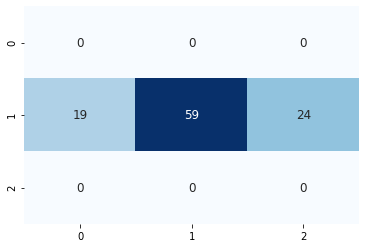

100/100 [==============================] - 0s 286us/sample - loss: 0.9839 - accuracy: 0.5500


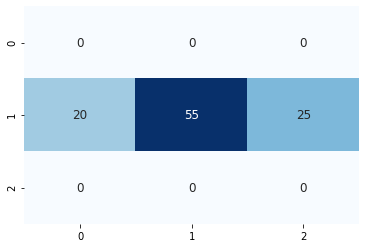

99/99 [==============================] - 0s 272us/sample - loss: 0.9368 - accuracy: 0.5859


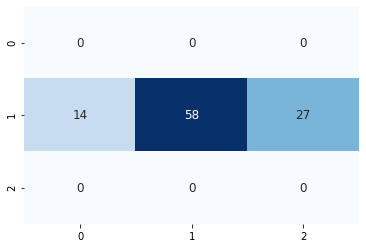

97/97 [==============================] - 0s 301us/sample - loss: 0.9930 - accuracy: 0.4948


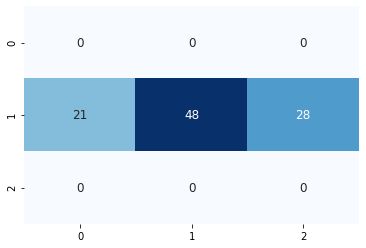

98/98 [==============================] - 0s 404us/sample - loss: 1.0137 - accuracy: 0.5816


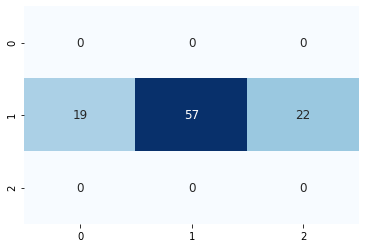

98/98 [==============================] - 0s 302us/sample - loss: 0.7743 - accuracy: 0.7041


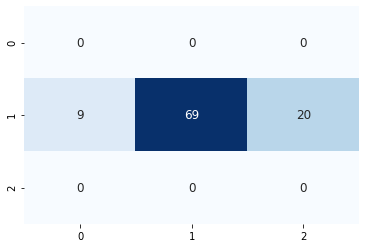

92/92 [==============================] - 0s 253us/sample - loss: 0.9391 - accuracy: 0.5652


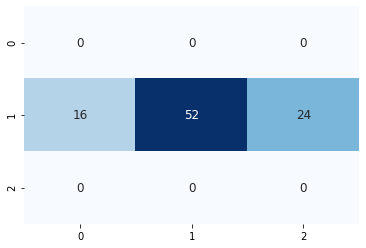

95/95 [==============================] - 0s 297us/sample - loss: 0.8493 - accuracy: 0.6737


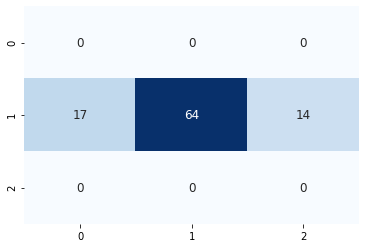

94/94 [==============================] - 0s 277us/sample - loss: 0.9569 - accuracy: 0.5851


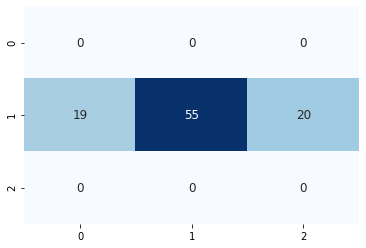

90/90 [==============================] - 0s 308us/sample - loss: 0.8360 - accuracy: 0.5778


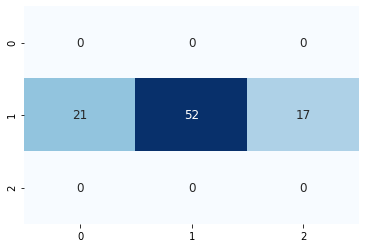

91/91 [==============================] - 0s 274us/sample - loss: 0.9335 - accuracy: 0.6374


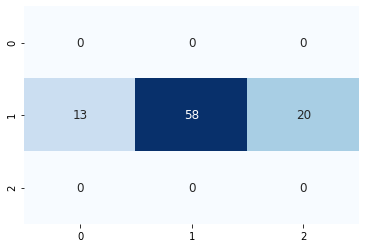

87/87 [==============================] - 0s 269us/sample - loss: 0.8590 - accuracy: 0.5517


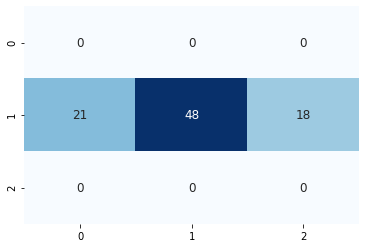

87/87 [==============================] - 0s 299us/sample - loss: 0.9439 - accuracy: 0.5977


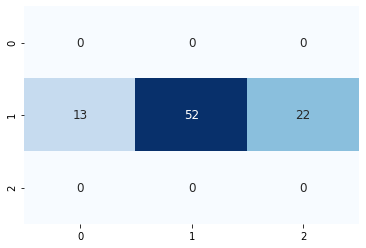

87/87 [==============================] - 0s 274us/sample - loss: 0.8728 - accuracy: 0.5747


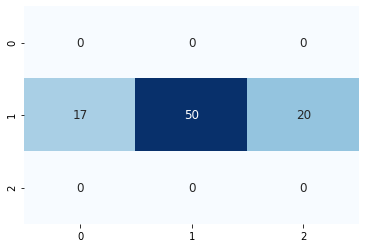

77/77 [==============================] - 0s 326us/sample - loss: 0.8447 - accuracy: 0.6234


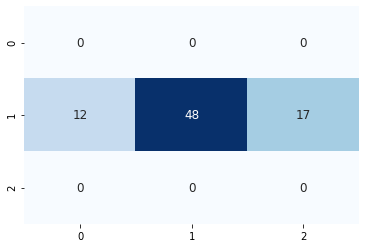

77/77 [==============================] - 0s 370us/sample - loss: 0.8460 - accuracy: 0.6364


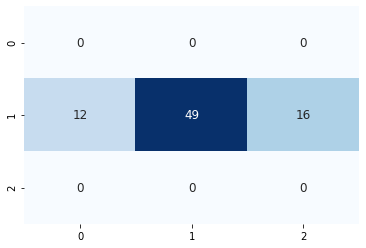

75/75 [==============================] - 0s 301us/sample - loss: 0.9183 - accuracy: 0.6133


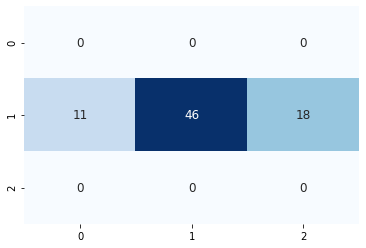

75/75 [==============================] - 0s 341us/sample - loss: 0.8894 - accuracy: 0.5867


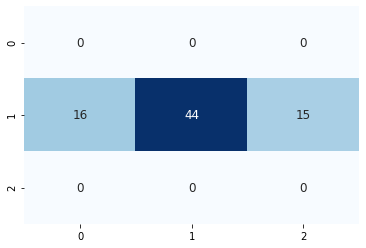

75/75 [==============================] - 0s 312us/sample - loss: 0.8544 - accuracy: 0.6667


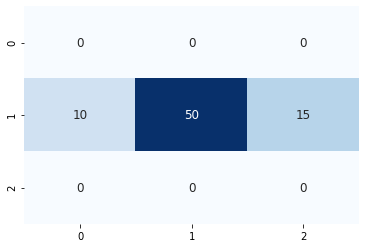

75/75 [==============================] - 0s 319us/sample - loss: 0.8340 - accuracy: 0.6133


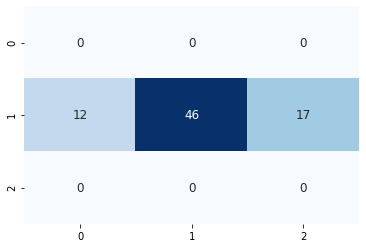

75/75 [==============================] - 0s 341us/sample - loss: 0.9920 - accuracy: 0.5733


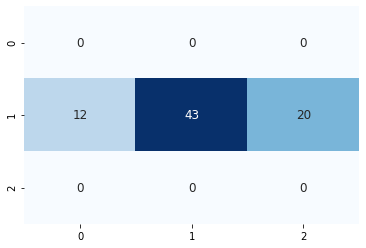

75/75 [==============================] - 0s 292us/sample - loss: 0.8717 - accuracy: 0.6000


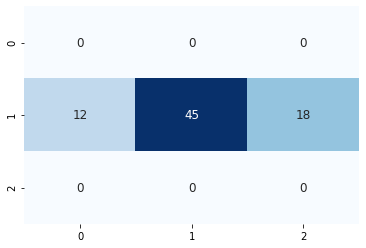

75/75 [==============================] - 0s 304us/sample - loss: 0.8072 - accuracy: 0.6000


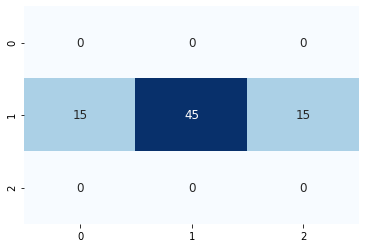

74/74 [==============================] - 0s 305us/sample - loss: 0.8057 - accuracy: 0.6622


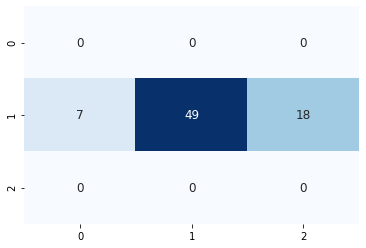

75/75 [==============================] - 0s 289us/sample - loss: 0.8480 - accuracy: 0.6800


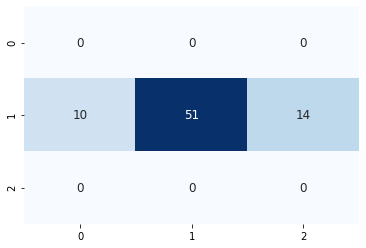

74/74 [==============================] - 0s 305us/sample - loss: 0.6449 - accuracy: 0.6892


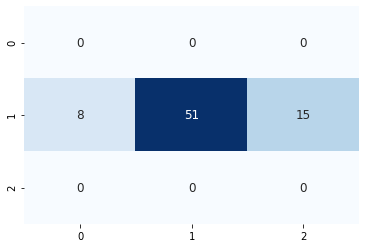

74/74 [==============================] - 0s 308us/sample - loss: 0.7266 - accuracy: 0.5676


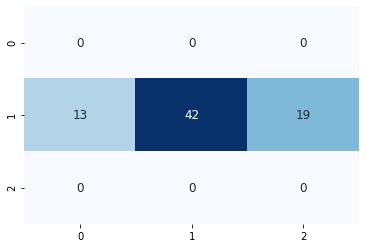

74/74 [==============================] - 0s 280us/sample - loss: 0.7743 - accuracy: 0.6757


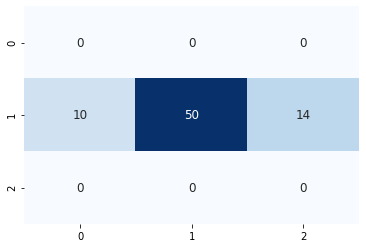

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3905 samples, validate on 1017 samples
Epoch 1/300
3905/3905 [==============================] - 3s 646us/sample - loss: 0.9517 - accuracy: 0.5362 - val_loss: 0.9942 - val_accuracy: 0.5428
Epoch 2/300
3905/3905 [==============================] - 1s 229us/sample - loss: 0.7799 - accuracy: 0.6579 - val_loss: 1.0056 - val_accuracy: 0.5349
Epoch 3/300
3905/3905 [==============================] - 1s 212us/sample - loss: 0.6777 - accuracy: 0.7147 - val_loss: 1.0355 - val_accuracy: 0.5339
Epoch 4/300
3905/3905 [==============================] - 1s 206us/sample - loss: 0.5913 - accuracy: 0.7657 - val_loss: 1.0774 - val_accuracy: 0.5369
Epoch 00004: early stopping
67/67 [==============================] - 0s 188us/sample - loss: 0.5894 - accuracy: 0.7164


3it [1:29:13, 1780.68s/it]
100%|██████████| 3/3 [00:06<00:00,  2.05s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 281.056640625 steps, validate for 73.455078125 steps
Epoch 1/300
282/281 [==============================] - 29s 101ms/step - loss: 0.9760 - accuracy: 0.5434 - val_loss: 1.0120 - val_accuracy: 0.5403
Epoch 2/300
282/281 [==============================] - 28s 99ms/step - loss: 0.8864 - accuracy: 0.5910 - val_loss: 1.0219 - val_accuracy: 0.5366
Epoch 3/300
282/281 [==============================] - 28s 99ms/step - loss: 0.8538 - accuracy: 0.6079 - val_loss: 1.0267 - val_accuracy: 0.5322
Epoch 4/300
282/281 [==============================] - 28s 98ms/step - loss: 0.8285 - accuracy: 0.6220 - val_loss: 1.0661 - val_accuracy: 0.5121
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 281.056640625 steps, validate for 73.455078125 steps
Epoch 1/300
282/281 [==============================] - 69s 243ms/step - loss: 0.7906 - accuracy: 0.6445 - val_loss: 1.1978 - val_ac

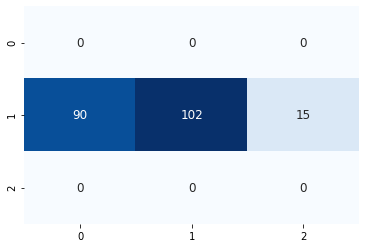

204/204 [==============================] - 0s 225us/sample - loss: 1.1866 - accuracy: 0.4608


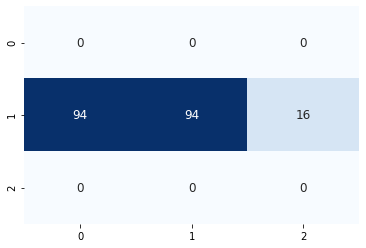

205/205 [==============================] - 0s 229us/sample - loss: 1.0745 - accuracy: 0.5268


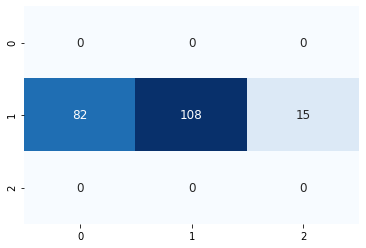

202/202 [==============================] - 0s 241us/sample - loss: 1.0622 - accuracy: 0.4950


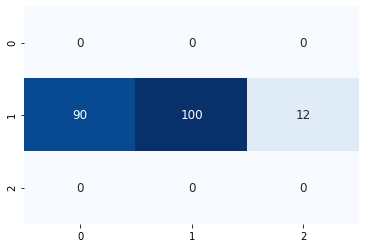

201/201 [==============================] - 0s 265us/sample - loss: 1.0994 - accuracy: 0.4677


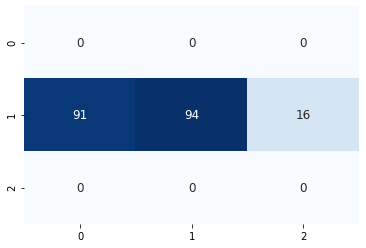

200/200 [==============================] - 0s 256us/sample - loss: 1.0407 - accuracy: 0.4950


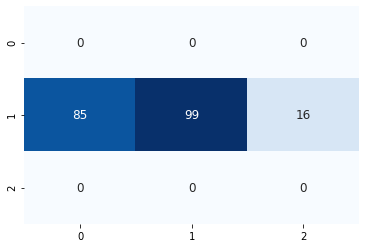

196/196 [==============================] - 0s 256us/sample - loss: 0.9852 - accuracy: 0.5102


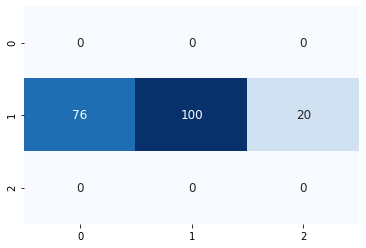

195/195 [==============================] - 0s 327us/sample - loss: 1.0002 - accuracy: 0.5538


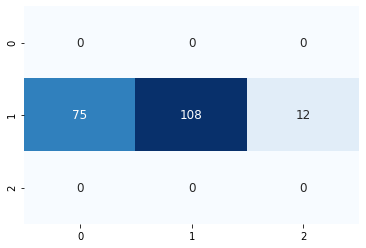

193/193 [==============================] - 0s 265us/sample - loss: 1.0396 - accuracy: 0.5078


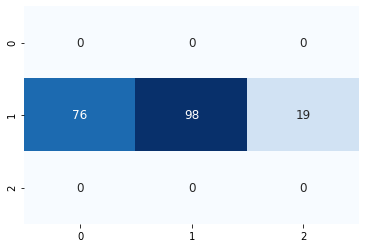

189/189 [==============================] - 0s 265us/sample - loss: 0.9554 - accuracy: 0.5608


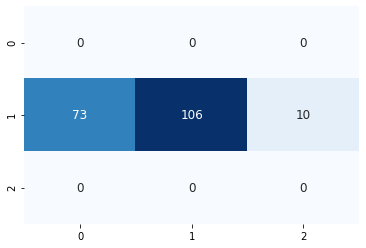

186/186 [==============================] - 0s 237us/sample - loss: 0.9348 - accuracy: 0.5484


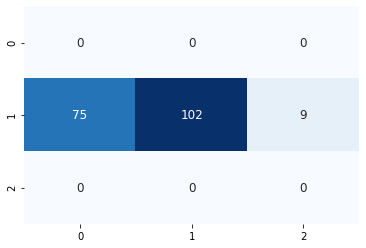

187/187 [==============================] - 0s 254us/sample - loss: 0.9257 - accuracy: 0.5294


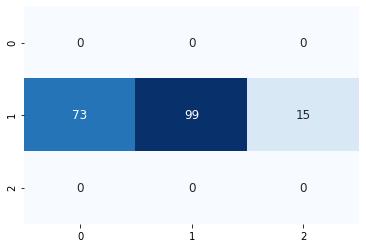

185/185 [==============================] - 0s 271us/sample - loss: 0.9873 - accuracy: 0.5297


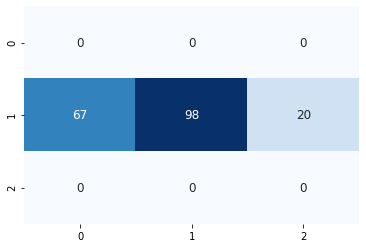

184/184 [==============================] - 0s 255us/sample - loss: 0.9647 - accuracy: 0.5543


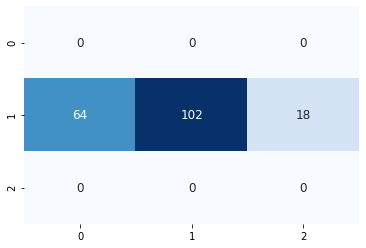

182/182 [==============================] - 0s 262us/sample - loss: 0.9971 - accuracy: 0.5220


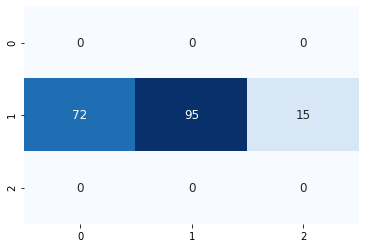

183/183 [==============================] - 0s 280us/sample - loss: 0.9963 - accuracy: 0.5628


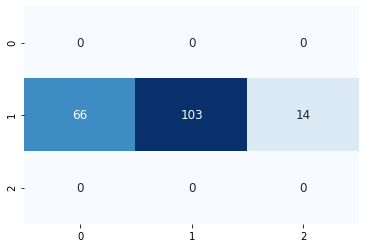

182/182 [==============================] - 0s 243us/sample - loss: 0.9765 - accuracy: 0.5275


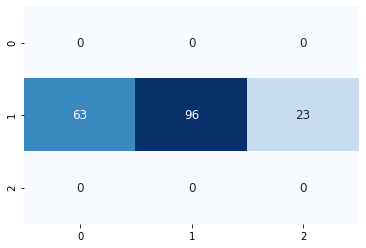

181/181 [==============================] - 0s 256us/sample - loss: 1.0008 - accuracy: 0.5580


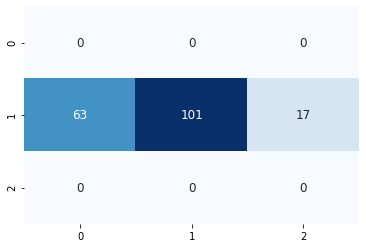

182/182 [==============================] - 0s 251us/sample - loss: 1.0489 - accuracy: 0.4835


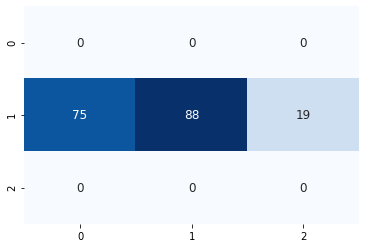

180/180 [==============================] - 0s 265us/sample - loss: 1.1322 - accuracy: 0.5389


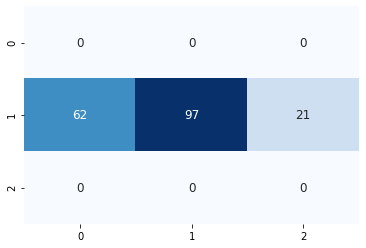

179/179 [==============================] - 0s 255us/sample - loss: 1.0627 - accuracy: 0.5363


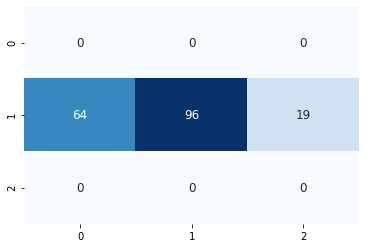

176/176 [==============================] - 0s 296us/sample - loss: 1.0641 - accuracy: 0.4943


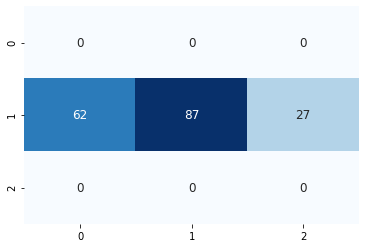

174/174 [==============================] - 0s 316us/sample - loss: 1.1438 - accuracy: 0.5000


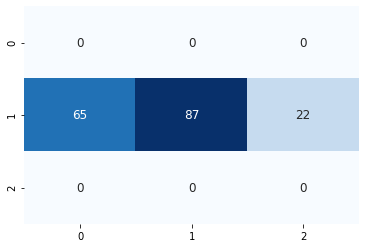

174/174 [==============================] - 0s 262us/sample - loss: 1.0677 - accuracy: 0.5402


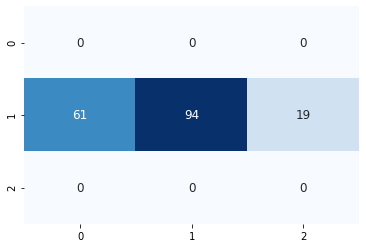

174/174 [==============================] - 0s 253us/sample - loss: 1.0186 - accuracy: 0.5115


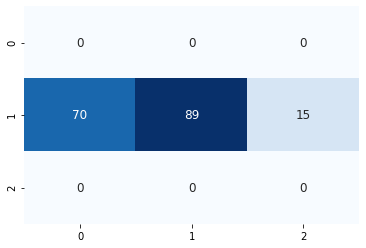

172/172 [==============================] - 0s 274us/sample - loss: 1.0917 - accuracy: 0.5349


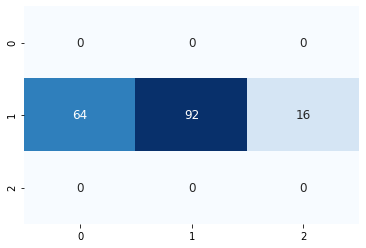

174/174 [==============================] - 0s 250us/sample - loss: 1.0412 - accuracy: 0.5115


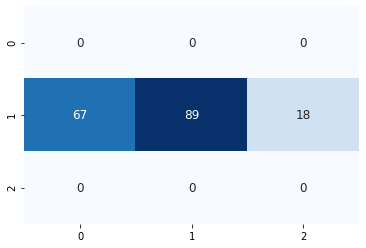

172/172 [==============================] - 0s 232us/sample - loss: 1.0382 - accuracy: 0.5116


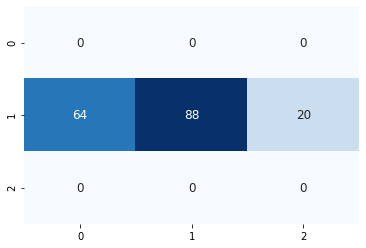

171/171 [==============================] - 0s 266us/sample - loss: 0.9794 - accuracy: 0.5673


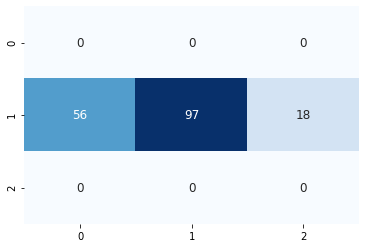

171/171 [==============================] - 0s 256us/sample - loss: 1.0111 - accuracy: 0.5088


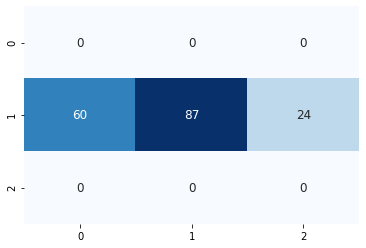

170/170 [==============================] - 0s 274us/sample - loss: 1.0731 - accuracy: 0.4882


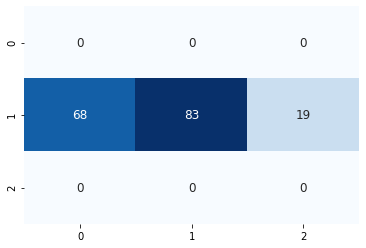

169/169 [==============================] - 0s 298us/sample - loss: 0.9948 - accuracy: 0.5562


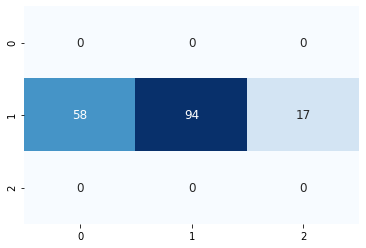

169/169 [==============================] - 0s 270us/sample - loss: 1.0227 - accuracy: 0.5680


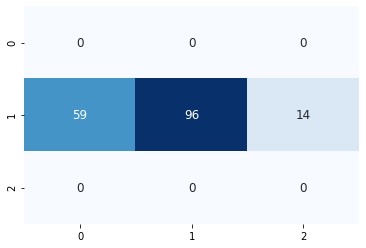

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3838 samples, validate on 989 samples
Epoch 1/300
3838/3838 [==============================] - 3s 711us/sample - loss: 1.0084 - accuracy: 0.4961 - val_loss: 0.9916 - val_accuracy: 0.5592
Epoch 2/300
3838/3838 [==============================] - 1s 211us/sample - loss: 0.8495 - accuracy: 0.6081 - val_loss: 0.9908 - val_accuracy: 0.5592
Epoch 3/300
3838/3838 [==============================] - 1s 202us/sample - loss: 0.7551 - accuracy: 0.6756 - val_loss: 1.0047 - val_accuracy: 0.5511
Epoch 4/300
3838/3838 [==============================] - 1s 188us/sample - loss: 0.6711 - accuracy: 0.7298 - val_loss: 1.0380 - val_accuracy: 0.5490
Epoch 5/300
3838/3838 [==============================] - 1s 190us/sample - loss: 0.5945 - accuracy: 0.7658 - val_loss: 1.0849 - val_accuracy: 0.5308
Epoch 00005: early stopping
162/162 [==============================] - 0s 132us/sample - loss: 0.5519 - accuracy: 0.7901


4it [1:57:05, 1747.99s/it]
100%|██████████| 3/3 [00:06<00:00,  2.00s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.490234375 steps, validate for 75.087890625 steps
Epoch 1/300
284/283 [==============================] - 29s 103ms/step - loss: 0.9485 - accuracy: 0.5584 - val_loss: 0.9907 - val_accuracy: 0.5405
Epoch 2/300
284/283 [==============================] - 29s 101ms/step - loss: 0.8791 - accuracy: 0.5968 - val_loss: 1.0090 - val_accuracy: 0.5432
Epoch 3/300
284/283 [==============================] - 29s 101ms/step - loss: 0.8478 - accuracy: 0.6135 - val_loss: 1.0495 - val_accuracy: 0.5359
Epoch 4/300
284/283 [==============================] - 29s 101ms/step - loss: 0.8222 - accuracy: 0.6275 - val_loss: 1.0704 - val_accuracy: 0.5285
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.490234375 steps, validate for 75.087890625 steps
Epoch 1/300
284/283 [==============================] - 71s 249ms/step - loss: 0.7864 - accuracy: 0.6475 - val_loss: 1.4016 - val

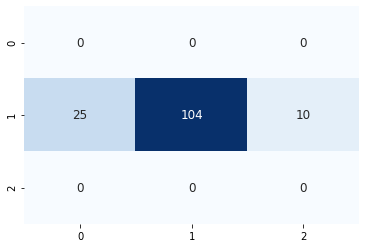

135/135 [==============================] - 0s 294us/sample - loss: 0.7156 - accuracy: 0.6741


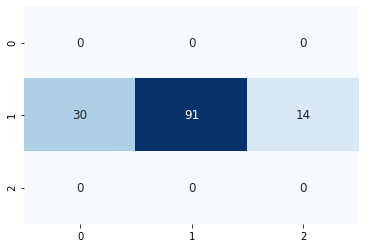

131/131 [==============================] - 0s 278us/sample - loss: 0.6881 - accuracy: 0.6641


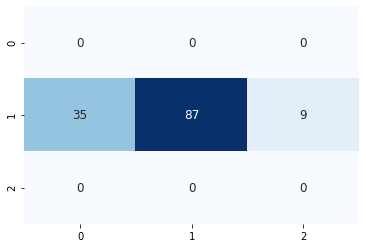

130/130 [==============================] - 0s 248us/sample - loss: 0.6925 - accuracy: 0.7462


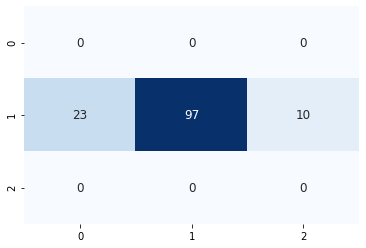

129/129 [==============================] - 0s 343us/sample - loss: 0.7995 - accuracy: 0.6589


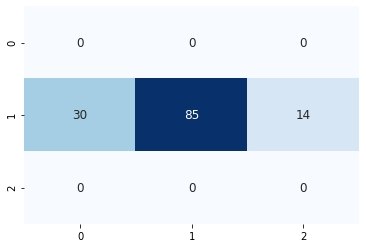

130/130 [==============================] - 0s 262us/sample - loss: 0.7354 - accuracy: 0.6846


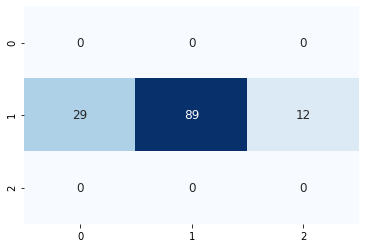

128/128 [==============================] - 0s 2ms/sample - loss: 0.8048 - accuracy: 0.6484


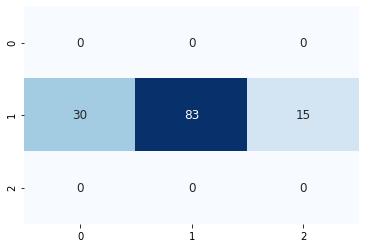

128/128 [==============================] - 0s 243us/sample - loss: 0.6776 - accuracy: 0.7266


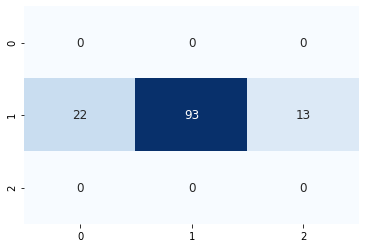

126/126 [==============================] - 0s 276us/sample - loss: 0.7469 - accuracy: 0.6984


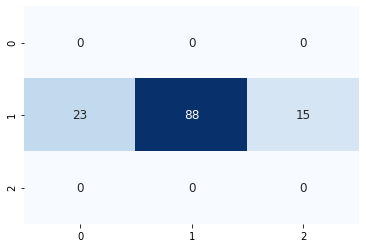

128/128 [==============================] - 0s 284us/sample - loss: 0.7227 - accuracy: 0.6953


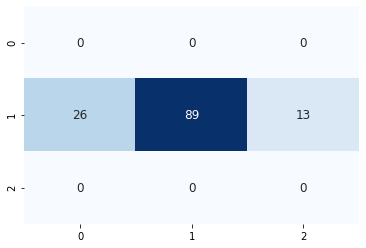

127/127 [==============================] - 0s 254us/sample - loss: 0.7653 - accuracy: 0.7244


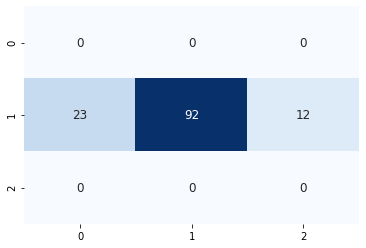

126/126 [==============================] - 0s 270us/sample - loss: 0.7879 - accuracy: 0.6667


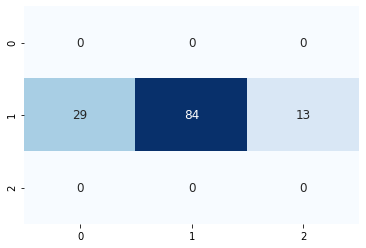

125/125 [==============================] - 0s 290us/sample - loss: 0.7483 - accuracy: 0.7200


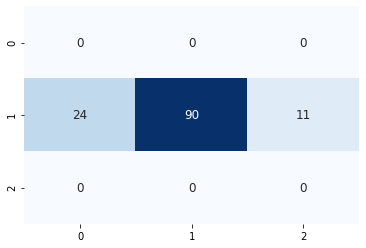

126/126 [==============================] - 0s 242us/sample - loss: 0.8366 - accuracy: 0.6746


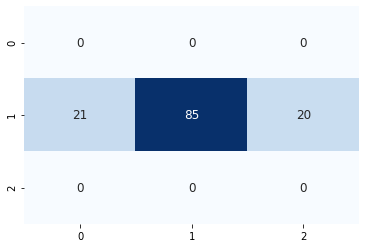

124/124 [==============================] - 0s 243us/sample - loss: 0.7834 - accuracy: 0.6452


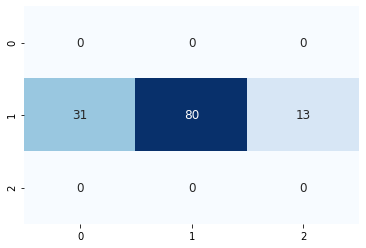

123/123 [==============================] - 0s 238us/sample - loss: 0.8307 - accuracy: 0.6423


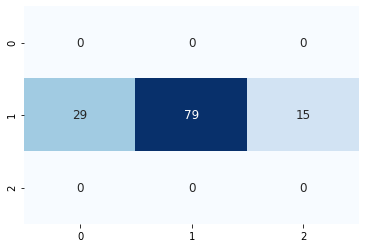

121/121 [==============================] - 0s 251us/sample - loss: 0.7205 - accuracy: 0.6942


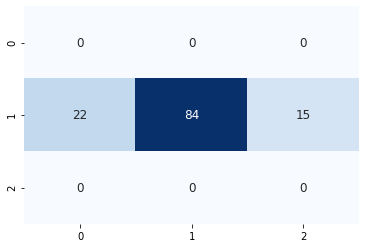

119/119 [==============================] - 0s 266us/sample - loss: 0.7985 - accuracy: 0.6471


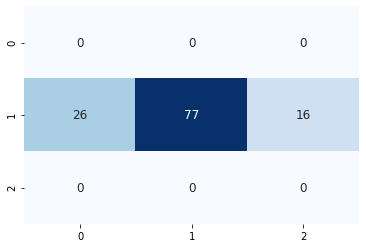

121/121 [==============================] - 0s 255us/sample - loss: 0.7622 - accuracy: 0.6777


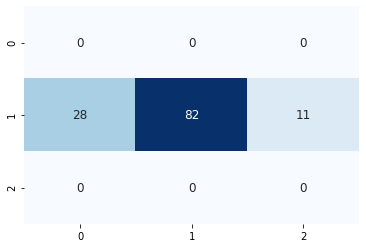

118/118 [==============================] - 0s 248us/sample - loss: 0.7416 - accuracy: 0.6356


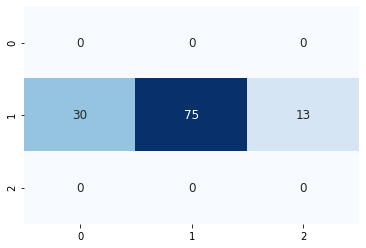

117/117 [==============================] - 0s 290us/sample - loss: 0.8609 - accuracy: 0.6325


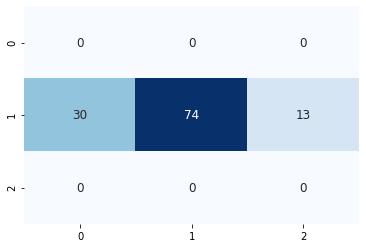

117/117 [==============================] - 0s 266us/sample - loss: 0.8173 - accuracy: 0.6325


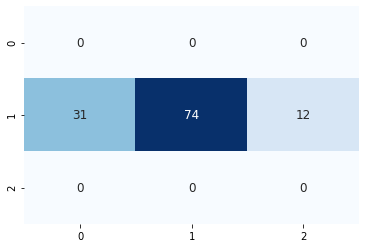

114/114 [==============================] - 0s 274us/sample - loss: 0.8213 - accuracy: 0.6667


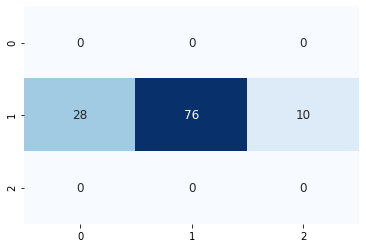

113/113 [==============================] - 0s 244us/sample - loss: 0.7688 - accuracy: 0.6549


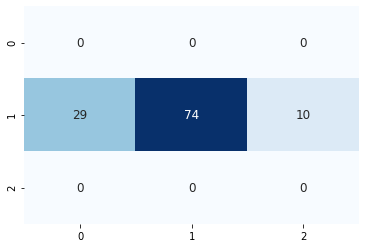

113/113 [==============================] - 0s 247us/sample - loss: 0.7553 - accuracy: 0.6372


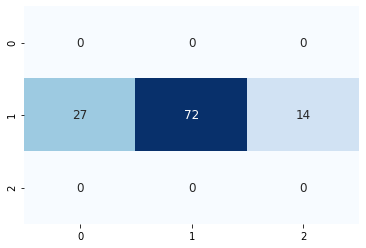

112/112 [==============================] - 0s 286us/sample - loss: 0.7633 - accuracy: 0.6518


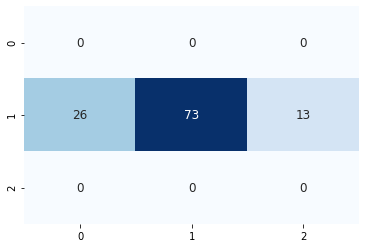

112/112 [==============================] - 0s 274us/sample - loss: 0.8014 - accuracy: 0.6071


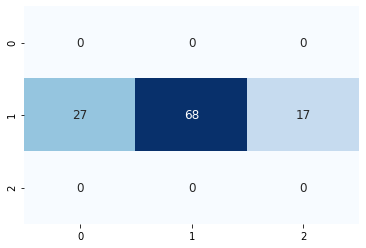

110/110 [==============================] - 0s 262us/sample - loss: 0.8215 - accuracy: 0.6455


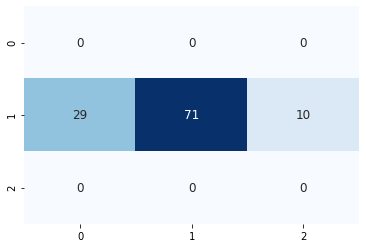

110/110 [==============================] - 0s 275us/sample - loss: 0.8492 - accuracy: 0.6182


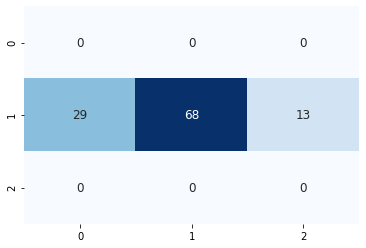

109/109 [==============================] - 0s 257us/sample - loss: 0.8883 - accuracy: 0.5963


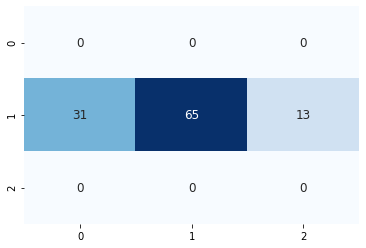

110/110 [==============================] - 0s 275us/sample - loss: 0.8125 - accuracy: 0.6455


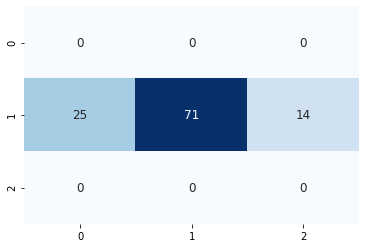

109/109 [==============================] - 0s 257us/sample - loss: 0.9706 - accuracy: 0.5413


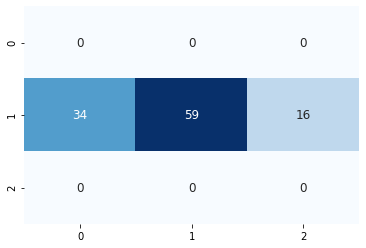

107/107 [==============================] - 0s 266us/sample - loss: 0.8811 - accuracy: 0.5794


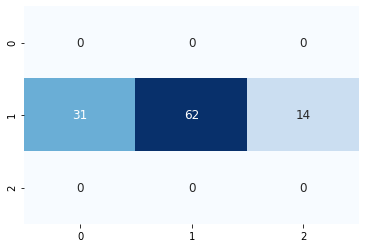

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3876 samples, validate on 1010 samples
Epoch 1/300
3876/3876 [==============================] - 3s 697us/sample - loss: 0.9354 - accuracy: 0.5640 - val_loss: 1.0131 - val_accuracy: 0.5168
Epoch 2/300
3876/3876 [==============================] - 1s 214us/sample - loss: 0.7186 - accuracy: 0.7108 - val_loss: 1.0472 - val_accuracy: 0.5257
Epoch 3/300
3876/3876 [==============================] - 1s 196us/sample - loss: 0.5871 - accuracy: 0.7763 - val_loss: 1.1163 - val_accuracy: 0.5168
Epoch 4/300
3876/3876 [==============================] - 1s 181us/sample - loss: 0.4652 - accuracy: 0.8375 - val_loss: 1.2130 - val_accuracy: 0.5198
Epoch 00004: early stopping
103/103 [==============================] - 0s 149us/sample - loss: 0.5129 - accuracy: 0.8447


5it [2:28:30, 1789.00s/it]
100%|██████████| 3/3 [00:06<00:00,  2.04s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.095703125 steps, validate for 75.435546875 steps
Epoch 1/300
286/285 [==============================] - 29s 101ms/step - loss: 0.9515 - accuracy: 0.5651 - val_loss: 0.9809 - val_accuracy: 0.5552
Epoch 2/300
286/285 [==============================] - 29s 100ms/step - loss: 0.8796 - accuracy: 0.5989 - val_loss: 1.0065 - val_accuracy: 0.5459
Epoch 3/300
286/285 [==============================] - 29s 102ms/step - loss: 0.8487 - accuracy: 0.6153 - val_loss: 1.0405 - val_accuracy: 0.5373
Epoch 4/300
286/285 [==============================] - 29s 102ms/step - loss: 0.8244 - accuracy: 0.6277 - val_loss: 1.0512 - val_accuracy: 0.5164
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.095703125 steps, validate for 75.435546875 steps
Epoch 1/300
286/285 [==============================] - 70s 246ms/step - loss: 0.7885 - accuracy: 0.6476 - val_loss: 1.1127 - val

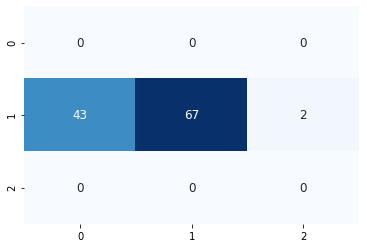

103/103 [==============================] - 0s 263us/sample - loss: 0.8735 - accuracy: 0.6311


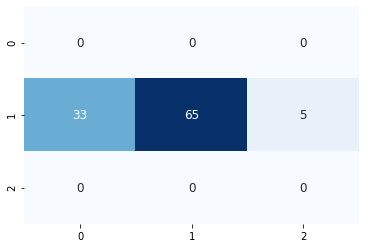

98/98 [==============================] - 0s 326us/sample - loss: 0.9084 - accuracy: 0.6020


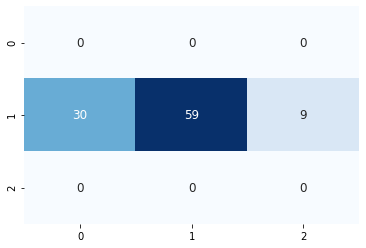

97/97 [==============================] - 0s 338us/sample - loss: 0.8191 - accuracy: 0.6701


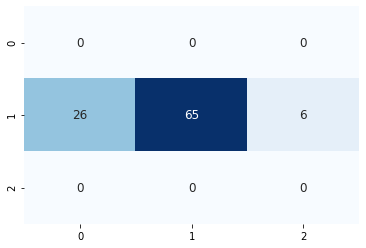

96/96 [==============================] - 0s 2ms/sample - loss: 0.8910 - accuracy: 0.5938


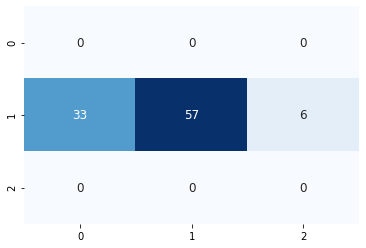

96/96 [==============================] - 0s 248us/sample - loss: 0.9525 - accuracy: 0.6354


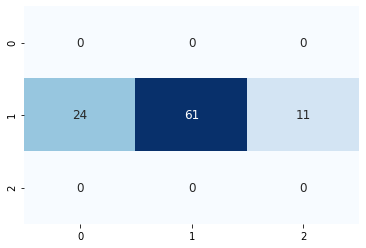

96/96 [==============================] - 0s 269us/sample - loss: 0.9394 - accuracy: 0.6146


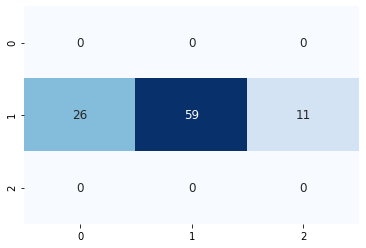

92/92 [==============================] - 0s 255us/sample - loss: 0.8916 - accuracy: 0.6739


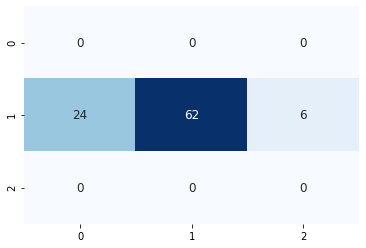

91/91 [==============================] - 0s 278us/sample - loss: 0.8741 - accuracy: 0.6374


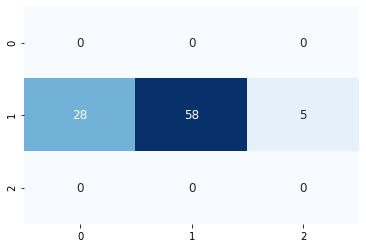

92/92 [==============================] - 0s 270us/sample - loss: 0.9990 - accuracy: 0.5652


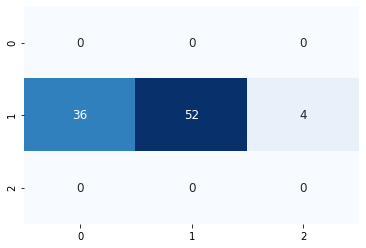

91/91 [==============================] - 0s 321us/sample - loss: 0.8918 - accuracy: 0.6044


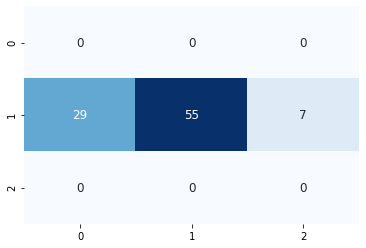

90/90 [==============================] - 0s 387us/sample - loss: 0.9489 - accuracy: 0.6222


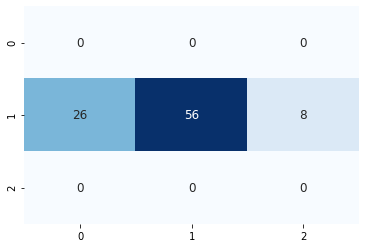

90/90 [==============================] - 0s 283us/sample - loss: 0.9989 - accuracy: 0.5444


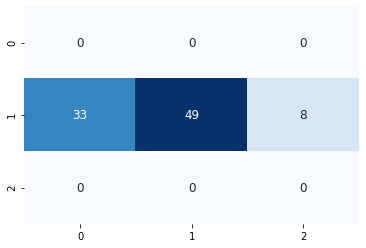

89/89 [==============================] - 0s 289us/sample - loss: 0.8863 - accuracy: 0.6067


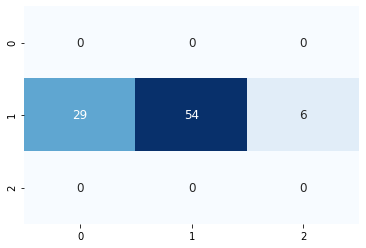

89/89 [==============================] - 0s 340us/sample - loss: 1.0656 - accuracy: 0.4944


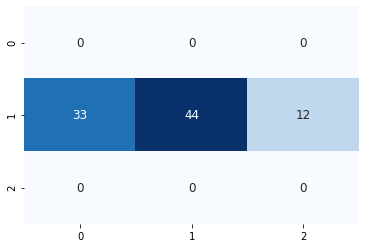

88/88 [==============================] - 0s 307us/sample - loss: 0.8714 - accuracy: 0.6250


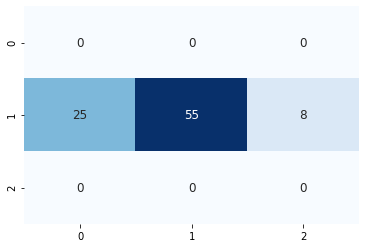

88/88 [==============================] - 0s 287us/sample - loss: 0.8767 - accuracy: 0.5909


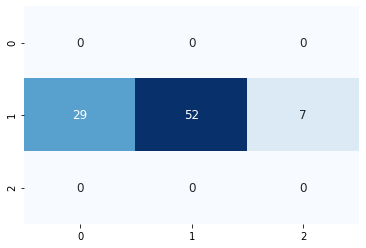

88/88 [==============================] - 0s 281us/sample - loss: 0.9657 - accuracy: 0.5568


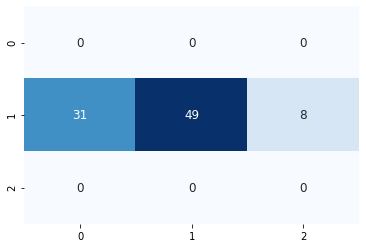

89/89 [==============================] - 0s 282us/sample - loss: 1.0152 - accuracy: 0.5730


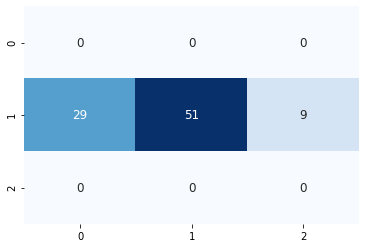

87/87 [==============================] - 0s 293us/sample - loss: 0.9390 - accuracy: 0.5862


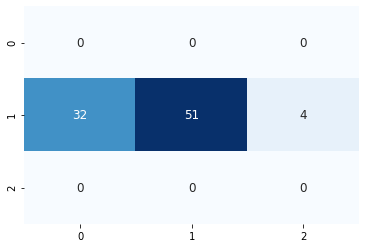

88/88 [==============================] - 0s 274us/sample - loss: 0.8870 - accuracy: 0.5341


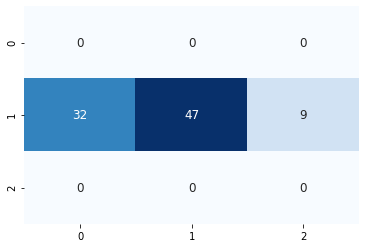

88/88 [==============================] - 0s 268us/sample - loss: 1.0974 - accuracy: 0.4432


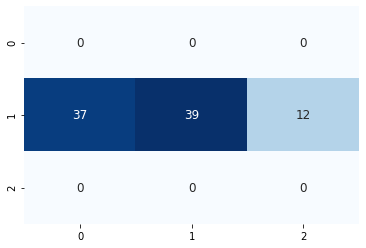

86/86 [==============================] - 0s 314us/sample - loss: 0.9285 - accuracy: 0.5581


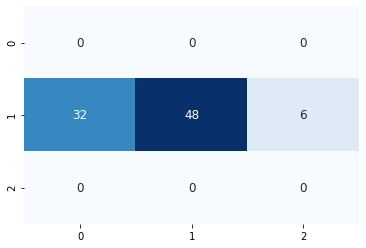

86/86 [==============================] - 0s 261us/sample - loss: 1.0429 - accuracy: 0.5581


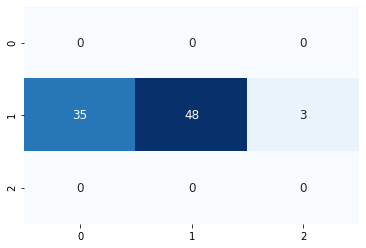

87/87 [==============================] - 0s 313us/sample - loss: 1.1185 - accuracy: 0.4828


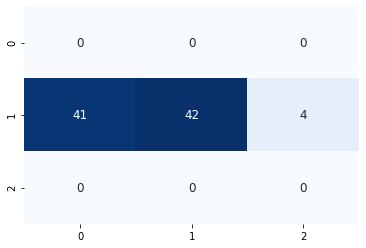

87/87 [==============================] - 0s 264us/sample - loss: 1.0717 - accuracy: 0.5287


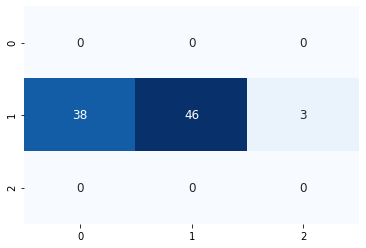

86/86 [==============================] - 0s 340us/sample - loss: 1.0608 - accuracy: 0.4651


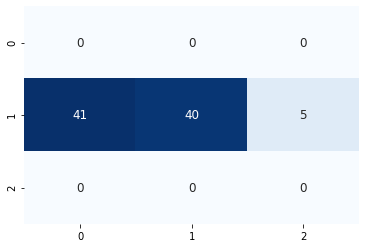

87/87 [==============================] - 0s 314us/sample - loss: 1.0222 - accuracy: 0.6092


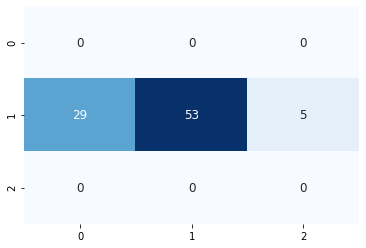

85/85 [==============================] - 0s 289us/sample - loss: 1.0724 - accuracy: 0.4941


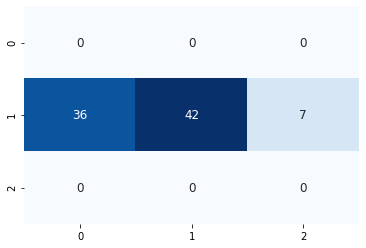

87/87 [==============================] - 0s 340us/sample - loss: 1.2319 - accuracy: 0.4368


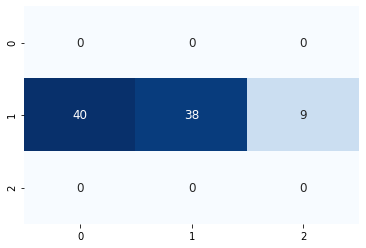

86/86 [==============================] - 0s 311us/sample - loss: 1.1325 - accuracy: 0.4535


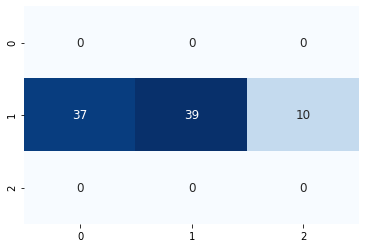

86/86 [==============================] - 0s 281us/sample - loss: 1.1075 - accuracy: 0.4535


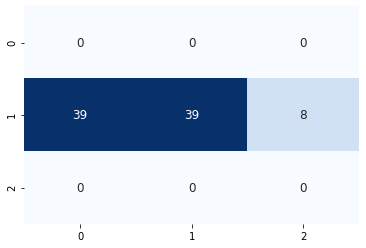

86/86 [==============================] - 0s 305us/sample - loss: 1.0785 - accuracy: 0.4884


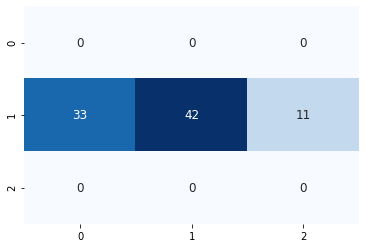

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3892 samples, validate on 1015 samples
Epoch 1/300
3892/3892 [==============================] - 3s 723us/sample - loss: 1.0025 - accuracy: 0.5018 - val_loss: 1.0093 - val_accuracy: 0.5103
Epoch 2/300
3892/3892 [==============================] - 1s 220us/sample - loss: 0.8235 - accuracy: 0.6449 - val_loss: 1.0146 - val_accuracy: 0.5015
Epoch 3/300
3892/3892 [==============================] - 1s 232us/sample - loss: 0.7334 - accuracy: 0.6901 - val_loss: 1.0405 - val_accuracy: 0.4936
Epoch 4/300
3892/3892 [==============================] - 1s 217us/sample - loss: 0.6523 - accuracy: 0.7395 - val_loss: 1.0856 - val_accuracy: 0.4946
Epoch 00004: early stopping
82/82 [==============================] - 0s 151us/sample - loss: 0.7064 - accuracy: 0.6951


6it [2:57:23, 1772.32s/it]
100%|██████████| 3/3 [00:06<00:00,  2.03s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.486328125 steps, validate for 74.458984375 steps
Epoch 1/300
283/282 [==============================] - 29s 103ms/step - loss: 0.9598 - accuracy: 0.5547 - val_loss: 0.9965 - val_accuracy: 0.5509
Epoch 2/300
283/282 [==============================] - 29s 103ms/step - loss: 0.8795 - accuracy: 0.5992 - val_loss: 1.0093 - val_accuracy: 0.5481
Epoch 3/300
283/282 [==============================] - 29s 102ms/step - loss: 0.8495 - accuracy: 0.6149 - val_loss: 1.0248 - val_accuracy: 0.5462
Epoch 4/300
283/282 [==============================] - 29s 102ms/step - loss: 0.8236 - accuracy: 0.6288 - val_loss: 1.0550 - val_accuracy: 0.5319
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.486328125 steps, validate for 74.458984375 steps
Epoch 1/300
283/282 [==============================] - 70s 248ms/step - loss: 0.7846 - accuracy: 0.6508 - val_loss: 1.2168 - val

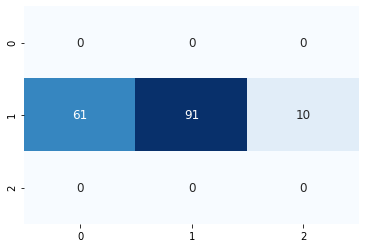

160/160 [==============================] - 0s 1ms/sample - loss: 0.9023 - accuracy: 0.6062


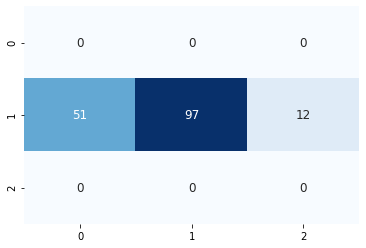

158/158 [==============================] - 0s 332us/sample - loss: 1.0273 - accuracy: 0.5063


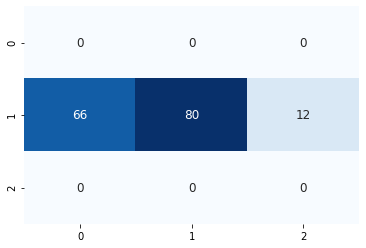

155/155 [==============================] - 0s 225us/sample - loss: 1.0055 - accuracy: 0.5484


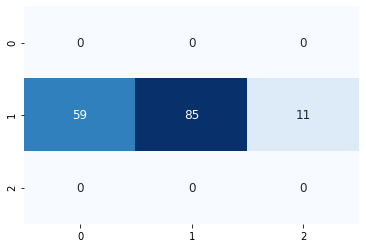

153/153 [==============================] - 0s 246us/sample - loss: 1.0218 - accuracy: 0.5163


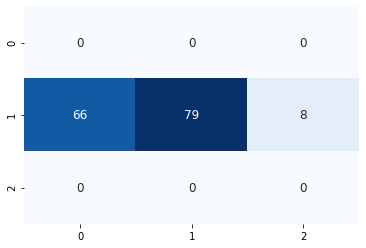

153/153 [==============================] - 0s 249us/sample - loss: 1.1238 - accuracy: 0.4771


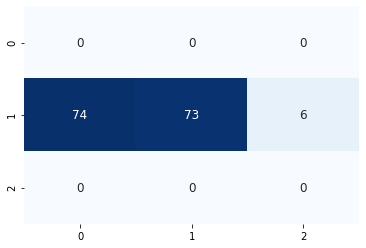

150/150 [==============================] - 0s 346us/sample - loss: 0.9517 - accuracy: 0.5600


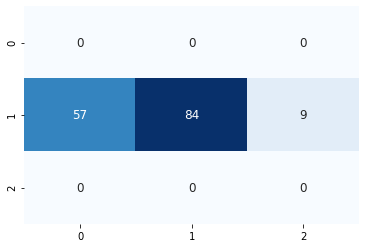

150/150 [==============================] - 0s 278us/sample - loss: 1.0556 - accuracy: 0.5267


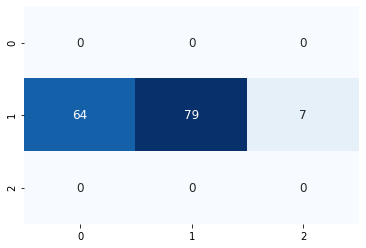

152/152 [==============================] - 0s 276us/sample - loss: 1.2296 - accuracy: 0.4276


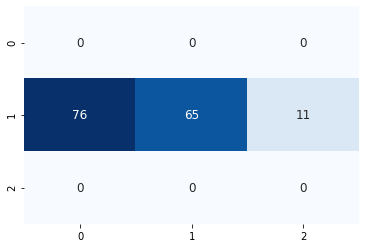

150/150 [==============================] - 0s 273us/sample - loss: 1.1950 - accuracy: 0.4467


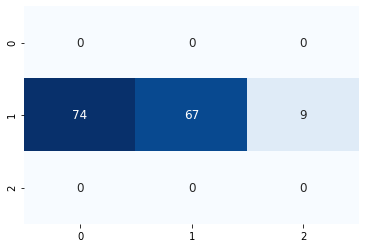

150/150 [==============================] - 0s 247us/sample - loss: 1.3031 - accuracy: 0.4400


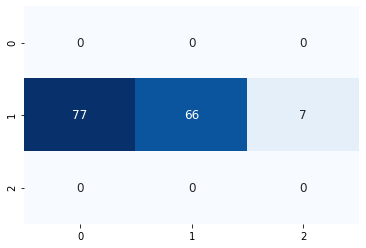

147/147 [==============================] - 0s 363us/sample - loss: 1.1775 - accuracy: 0.4422


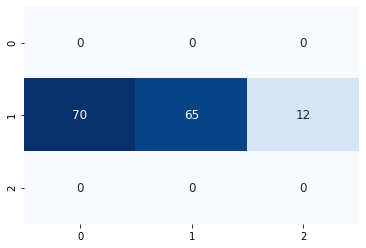

148/148 [==============================] - 0s 296us/sample - loss: 1.3592 - accuracy: 0.4730


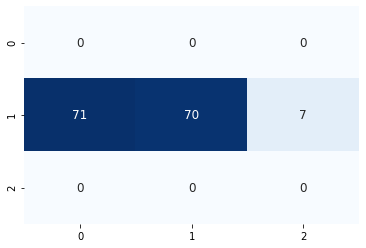

146/146 [==============================] - 0s 254us/sample - loss: 1.4065 - accuracy: 0.4384


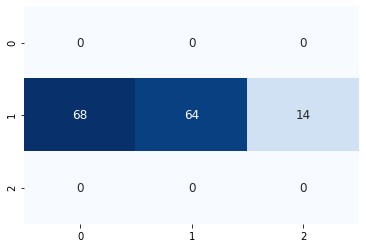

145/145 [==============================] - 0s 268us/sample - loss: 1.4371 - accuracy: 0.4138


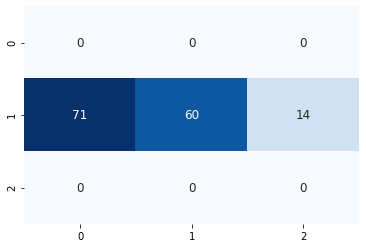

146/146 [==============================] - 0s 264us/sample - loss: 1.3342 - accuracy: 0.4658


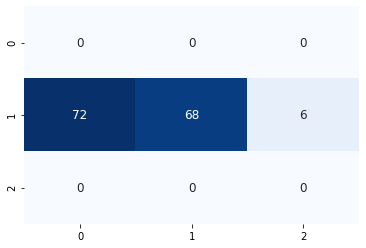

145/145 [==============================] - 0s 276us/sample - loss: 1.4679 - accuracy: 0.4000


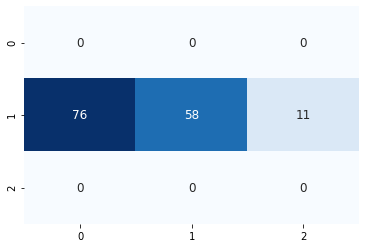

143/143 [==============================] - 0s 290us/sample - loss: 1.5865 - accuracy: 0.3357


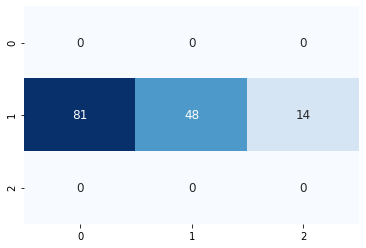

141/141 [==============================] - 0s 265us/sample - loss: 1.6452 - accuracy: 0.3262


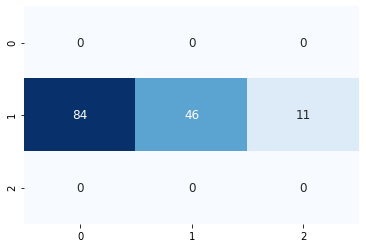

141/141 [==============================] - 0s 282us/sample - loss: 1.6182 - accuracy: 0.3617


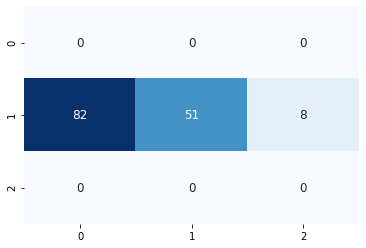

142/142 [==============================] - 0s 266us/sample - loss: 1.5802 - accuracy: 0.3451


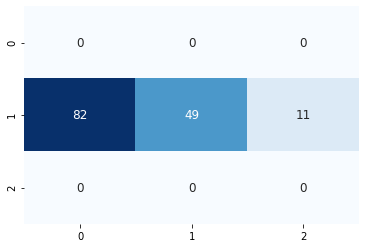

142/142 [==============================] - 0s 264us/sample - loss: 1.6282 - accuracy: 0.4014


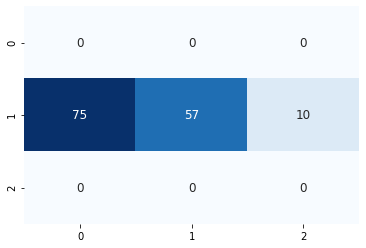

143/143 [==============================] - 0s 264us/sample - loss: 1.6057 - accuracy: 0.3566


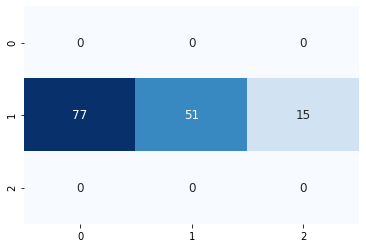

140/140 [==============================] - 0s 289us/sample - loss: 1.6057 - accuracy: 0.3857


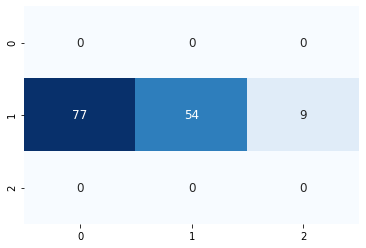

143/143 [==============================] - 0s 255us/sample - loss: 1.6206 - accuracy: 0.3427


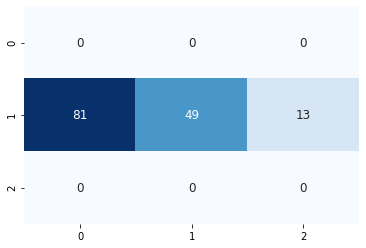

142/142 [==============================] - 0s 271us/sample - loss: 1.5052 - accuracy: 0.4085


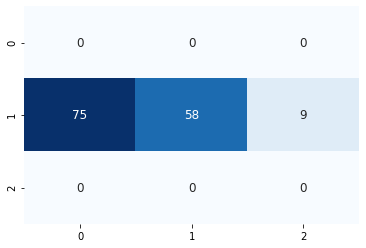

141/141 [==============================] - 0s 269us/sample - loss: 1.6094 - accuracy: 0.3546


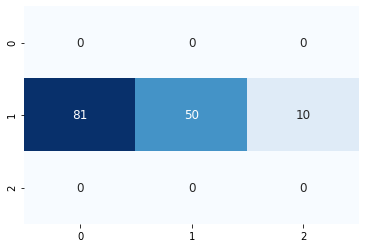

140/140 [==============================] - 0s 277us/sample - loss: 1.7315 - accuracy: 0.3429


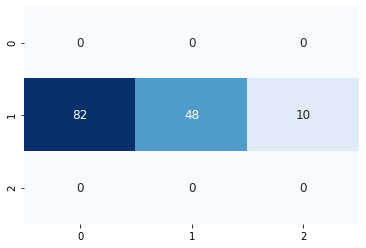

140/140 [==============================] - 0s 295us/sample - loss: 1.8249 - accuracy: 0.3786


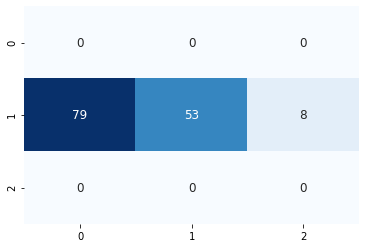

139/139 [==============================] - 0s 252us/sample - loss: 1.7196 - accuracy: 0.3525


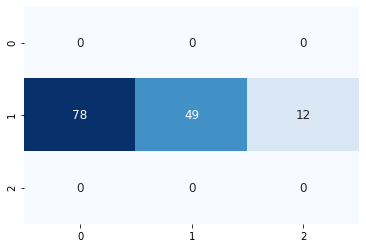

138/138 [==============================] - 0s 311us/sample - loss: 1.8029 - accuracy: 0.3696


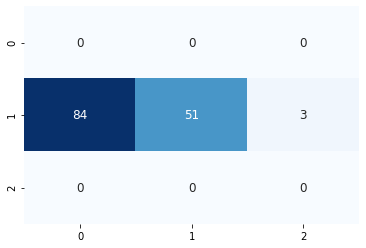

139/139 [==============================] - 0s 256us/sample - loss: 1.8102 - accuracy: 0.3597


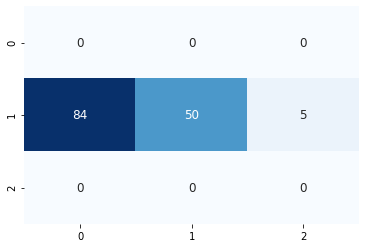

139/139 [==============================] - 0s 305us/sample - loss: 1.8487 - accuracy: 0.3309


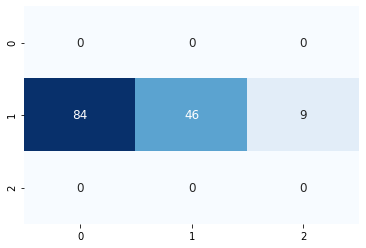

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3858 samples, validate on 1001 samples
Epoch 1/300
3858/3858 [==============================] - 3s 721us/sample - loss: 0.9549 - accuracy: 0.5490 - val_loss: 0.9851 - val_accuracy: 0.5305
Epoch 2/300
3858/3858 [==============================] - 1s 230us/sample - loss: 0.7867 - accuracy: 0.6579 - val_loss: 0.9920 - val_accuracy: 0.5345
Epoch 3/300
3858/3858 [==============================] - 1s 239us/sample - loss: 0.6743 - accuracy: 0.7245 - val_loss: 1.0168 - val_accuracy: 0.5325
Epoch 4/300
3858/3858 [==============================] - 1s 232us/sample - loss: 0.5541 - accuracy: 0.7890 - val_loss: 1.0682 - val_accuracy: 0.5275
Epoch 00004: early stopping
130/130 [==============================] - 0s 154us/sample - loss: 1.0592 - accuracy: 0.4769


7it [3:28:26, 1799.67s/it]
100%|██████████| 3/3 [00:06<00:00,  2.27s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.162109375 steps, validate for 74.951171875 steps
Epoch 1/300
286/285 [==============================] - 30s 103ms/step - loss: 0.9639 - accuracy: 0.5507 - val_loss: 1.0066 - val_accuracy: 0.5476
Epoch 2/300
286/285 [==============================] - 29s 101ms/step - loss: 0.8846 - accuracy: 0.5945 - val_loss: 1.0057 - val_accuracy: 0.5369
Epoch 3/300
286/285 [==============================] - 29s 101ms/step - loss: 0.8548 - accuracy: 0.6099 - val_loss: 1.0289 - val_accuracy: 0.5372
Epoch 4/300
286/285 [==============================] - 29s 102ms/step - loss: 0.8309 - accuracy: 0.6241 - val_loss: 1.0602 - val_accuracy: 0.5226
Epoch 5/300
286/285 [==============================] - 29s 101ms/step - loss: 0.8107 - accuracy: 0.6350 - val_loss: 1.0895 - val_accuracy: 0.5140
Epoch 00005: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.162109375 steps, validate for 7

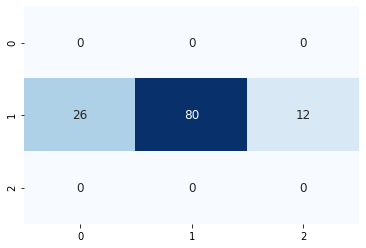

116/116 [==============================] - 0s 238us/sample - loss: 0.7948 - accuracy: 0.6897


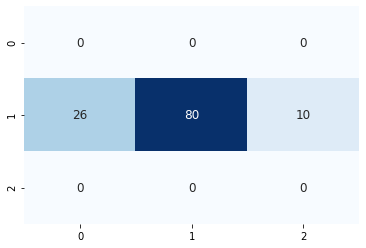

114/114 [==============================] - 0s 272us/sample - loss: 0.7533 - accuracy: 0.7368


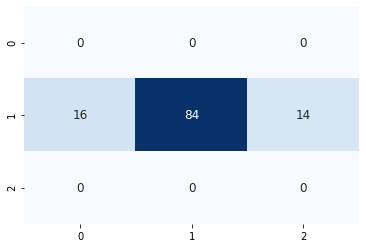

112/112 [==============================] - 0s 274us/sample - loss: 0.7811 - accuracy: 0.6696


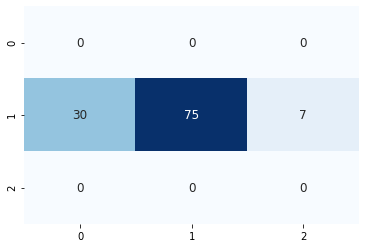

110/110 [==============================] - 0s 282us/sample - loss: 0.8759 - accuracy: 0.6273


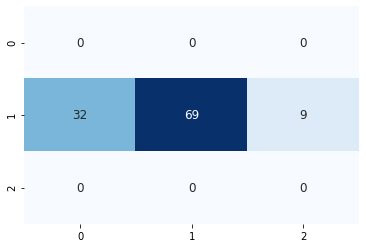

109/109 [==============================] - 0s 261us/sample - loss: 0.8045 - accuracy: 0.6514


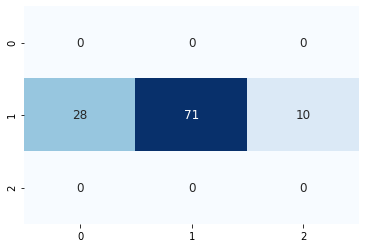

108/108 [==============================] - 0s 266us/sample - loss: 0.8612 - accuracy: 0.6574


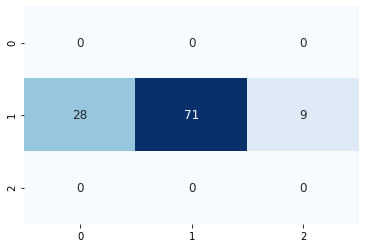

105/105 [==============================] - 0s 262us/sample - loss: 1.0306 - accuracy: 0.5048


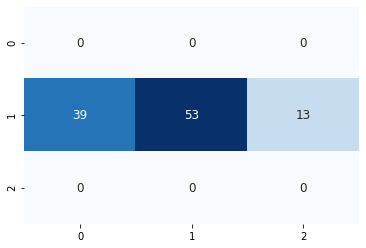

102/102 [==============================] - 0s 407us/sample - loss: 0.9077 - accuracy: 0.6471


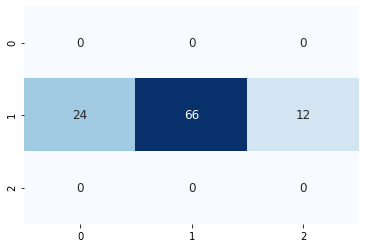

101/101 [==============================] - 0s 324us/sample - loss: 1.0843 - accuracy: 0.5347


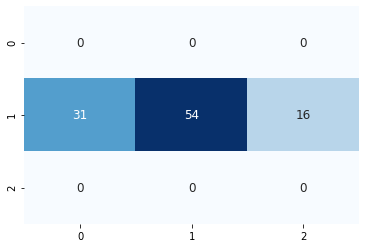

99/99 [==============================] - 0s 284us/sample - loss: 0.9816 - accuracy: 0.5758


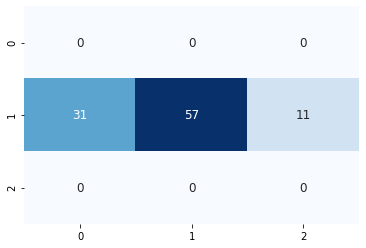

96/96 [==============================] - 0s 2ms/sample - loss: 1.0497 - accuracy: 0.5000


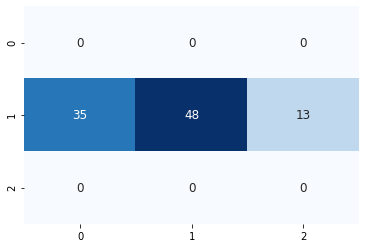

94/94 [==============================] - 0s 284us/sample - loss: 1.0776 - accuracy: 0.5106


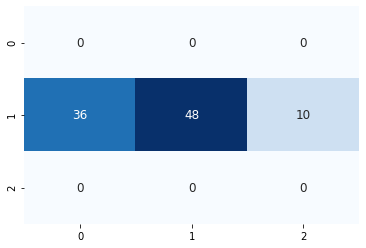

94/94 [==============================] - 0s 266us/sample - loss: 1.1198 - accuracy: 0.4681


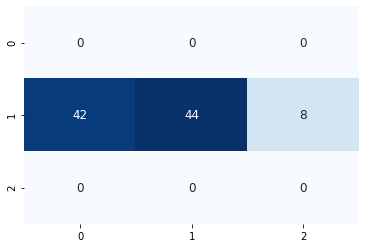

93/93 [==============================] - 0s 270us/sample - loss: 0.8942 - accuracy: 0.5699


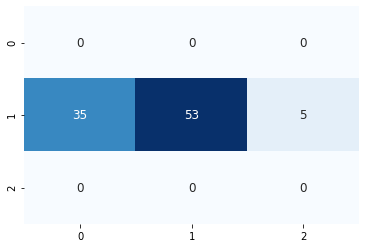

92/92 [==============================] - 0s 271us/sample - loss: 0.8707 - accuracy: 0.5652


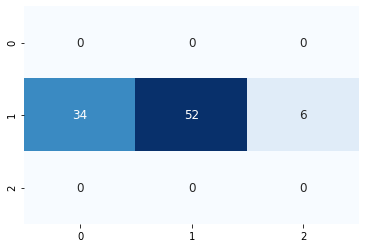

93/93 [==============================] - 0s 293us/sample - loss: 0.9771 - accuracy: 0.5484


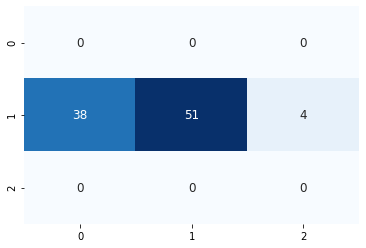

93/93 [==============================] - 0s 285us/sample - loss: 0.9491 - accuracy: 0.5484


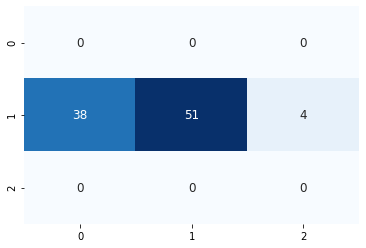

92/92 [==============================] - 0s 292us/sample - loss: 0.8839 - accuracy: 0.5543


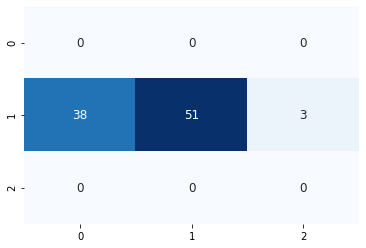

92/92 [==============================] - 0s 263us/sample - loss: 0.9173 - accuracy: 0.5978


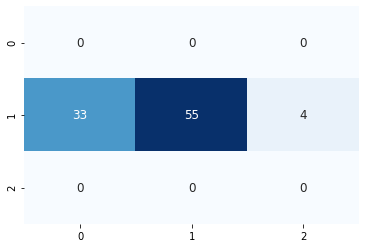

91/91 [==============================] - 0s 300us/sample - loss: 0.9132 - accuracy: 0.6044


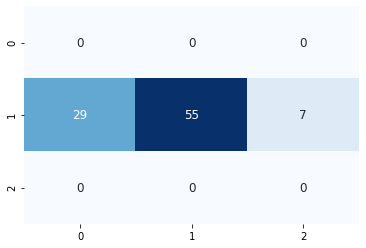

92/92 [==============================] - 0s 271us/sample - loss: 0.8665 - accuracy: 0.6304


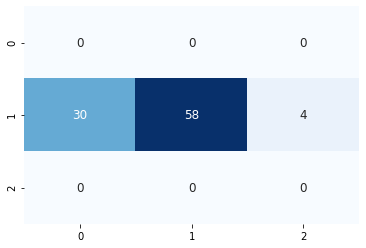

91/91 [==============================] - 0s 287us/sample - loss: 0.9143 - accuracy: 0.6374


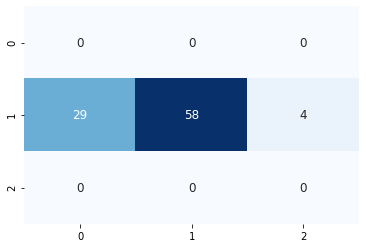

90/90 [==============================] - 0s 296us/sample - loss: 0.8338 - accuracy: 0.6333


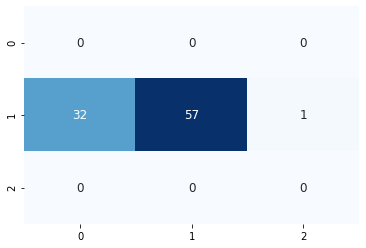

89/89 [==============================] - 0s 273us/sample - loss: 0.8871 - accuracy: 0.5730


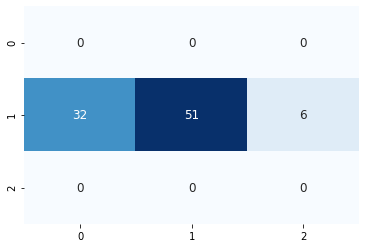

88/88 [==============================] - 0s 344us/sample - loss: 0.9040 - accuracy: 0.5682


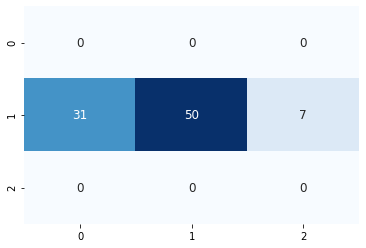

89/89 [==============================] - 0s 269us/sample - loss: 0.8433 - accuracy: 0.6404


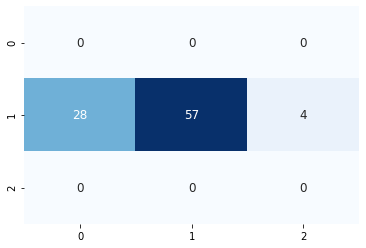

89/89 [==============================] - 0s 271us/sample - loss: 0.8689 - accuracy: 0.5506


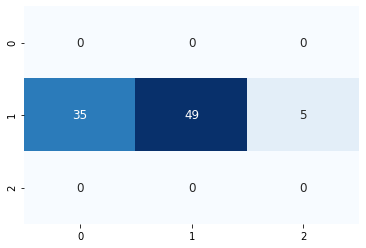

89/89 [==============================] - 0s 265us/sample - loss: 0.8894 - accuracy: 0.5955


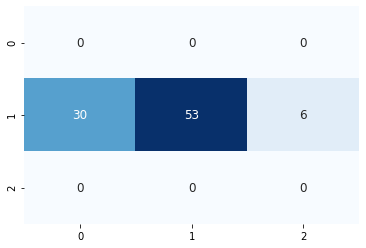

90/90 [==============================] - 0s 312us/sample - loss: 0.8428 - accuracy: 0.6111


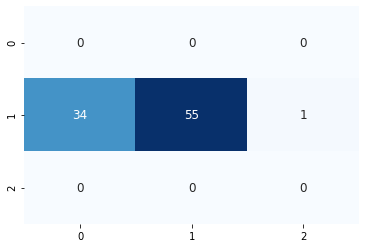

90/90 [==============================] - 0s 321us/sample - loss: 0.8669 - accuracy: 0.6111


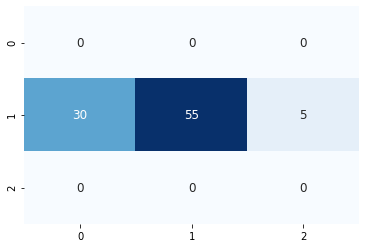

91/91 [==============================] - 0s 297us/sample - loss: 0.8892 - accuracy: 0.5824


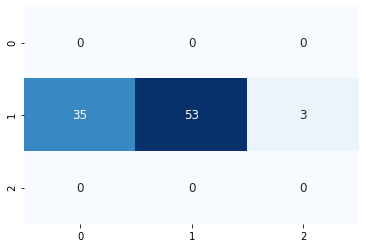

89/89 [==============================] - 0s 268us/sample - loss: 0.8905 - accuracy: 0.6517


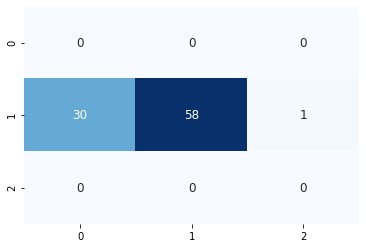

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3894 samples, validate on 1008 samples
Epoch 1/300
3894/3894 [==============================] - 3s 698us/sample - loss: 1.0077 - accuracy: 0.5008 - val_loss: 0.9904 - val_accuracy: 0.5367
Epoch 2/300
3894/3894 [==============================] - 1s 224us/sample - loss: 0.8574 - accuracy: 0.6120 - val_loss: 0.9870 - val_accuracy: 0.5456
Epoch 3/300
3894/3894 [==============================] - 1s 204us/sample - loss: 0.7738 - accuracy: 0.6577 - val_loss: 1.0007 - val_accuracy: 0.5407
Epoch 4/300
3894/3894 [==============================] - 1s 223us/sample - loss: 0.6944 - accuracy: 0.7039 - val_loss: 1.0325 - val_accuracy: 0.5238
Epoch 5/300
3894/3894 [==============================] - 1s 218us/sample - loss: 0.6160 - accuracy: 0.7504 - val_loss: 1.0830 - val_accuracy: 0.5228
Epoch 00005: early stopping
87/87 [==============================] - 0s 126us/sample - loss: 0.5662 - accuracy: 0.7701


8it [3:58:12, 1795.47s/it]
100%|██████████| 3/3 [00:06<00:00,  2.13s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.861328125 steps, validate for 75.658203125 steps
Epoch 1/300
284/283 [==============================] - 30s 105ms/step - loss: 0.9639 - accuracy: 0.5552 - val_loss: 0.9964 - val_accuracy: 0.5454
Epoch 2/300
284/283 [==============================] - 29s 101ms/step - loss: 0.8811 - accuracy: 0.5958 - val_loss: 0.9998 - val_accuracy: 0.5416
Epoch 3/300
284/283 [==============================] - 29s 102ms/step - loss: 0.8512 - accuracy: 0.6113 - val_loss: 1.0292 - val_accuracy: 0.5267
Epoch 4/300
284/283 [==============================] - 29s 102ms/step - loss: 0.8276 - accuracy: 0.6243 - val_loss: 1.0748 - val_accuracy: 0.5321
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.861328125 steps, validate for 75.658203125 steps
Epoch 1/300
284/283 [==============================] - 70s 246ms/step - loss: 0.7897 - accuracy: 0.6468 - val_loss: 1.1979 - val

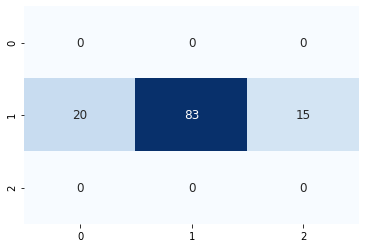

113/113 [==============================] - 0s 245us/sample - loss: 0.7725 - accuracy: 0.6549


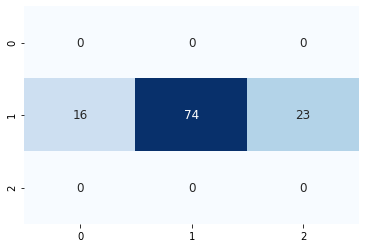

112/112 [==============================] - 0s 270us/sample - loss: 0.7950 - accuracy: 0.6607


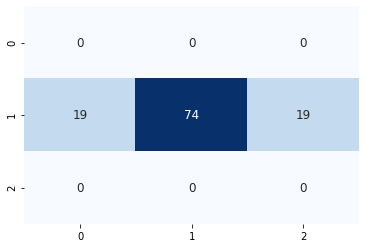

112/112 [==============================] - 0s 255us/sample - loss: 0.7783 - accuracy: 0.6339


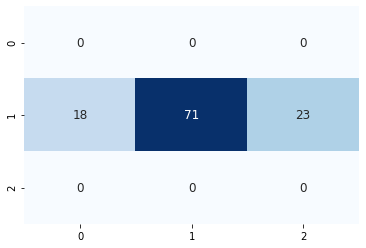

111/111 [==============================] - 0s 261us/sample - loss: 0.7424 - accuracy: 0.7207


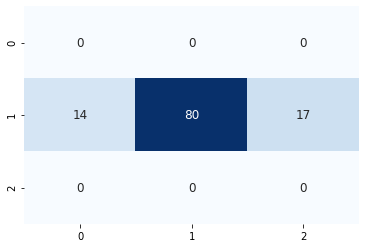

111/111 [==============================] - 0s 274us/sample - loss: 0.8177 - accuracy: 0.6577


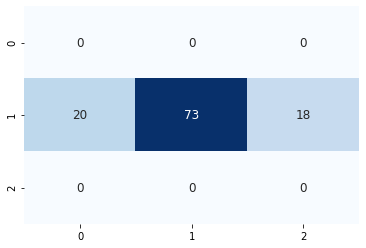

108/108 [==============================] - 0s 270us/sample - loss: 0.7966 - accuracy: 0.6481


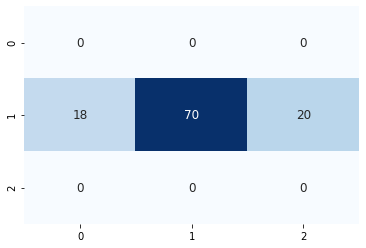

109/109 [==============================] - 0s 296us/sample - loss: 0.8014 - accuracy: 0.6514


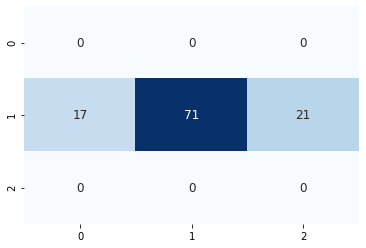

106/106 [==============================] - 0s 262us/sample - loss: 0.7557 - accuracy: 0.6887


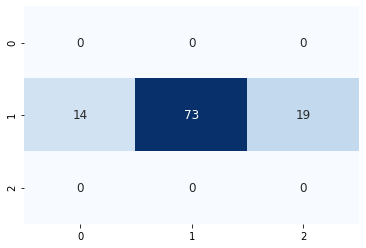

104/104 [==============================] - 0s 280us/sample - loss: 0.6692 - accuracy: 0.6827


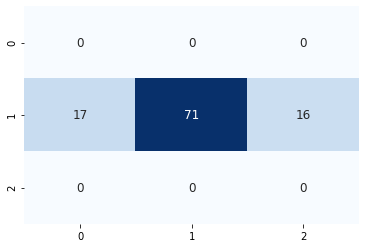

104/104 [==============================] - 0s 285us/sample - loss: 0.7959 - accuracy: 0.6442


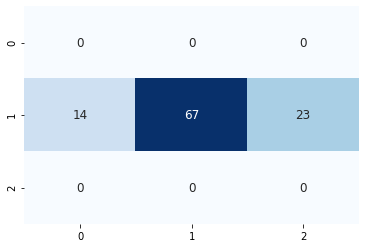

105/105 [==============================] - 0s 299us/sample - loss: 0.7954 - accuracy: 0.6381


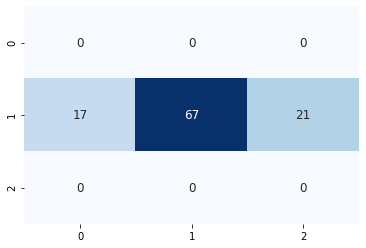

104/104 [==============================] - 0s 308us/sample - loss: 0.7573 - accuracy: 0.6731


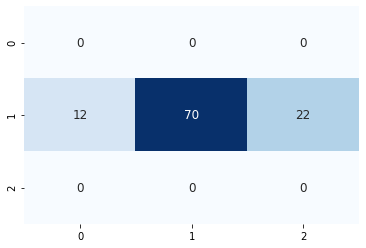

104/104 [==============================] - 0s 269us/sample - loss: 0.7185 - accuracy: 0.6923


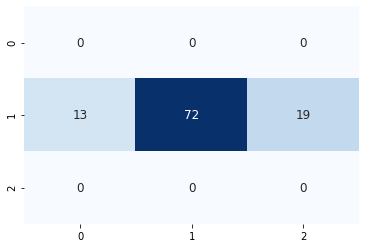

103/103 [==============================] - 0s 290us/sample - loss: 0.8592 - accuracy: 0.6117


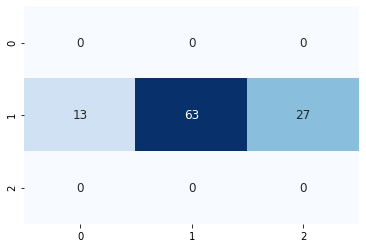

102/102 [==============================] - 0s 296us/sample - loss: 0.8222 - accuracy: 0.6275


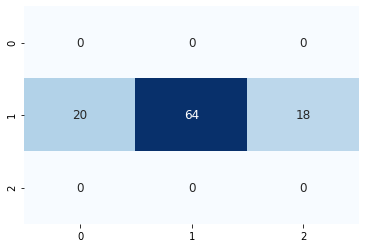

101/101 [==============================] - 0s 258us/sample - loss: 0.8948 - accuracy: 0.5842


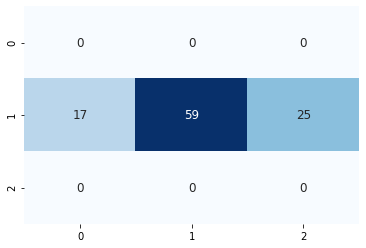

102/102 [==============================] - 0s 338us/sample - loss: 0.9546 - accuracy: 0.5490


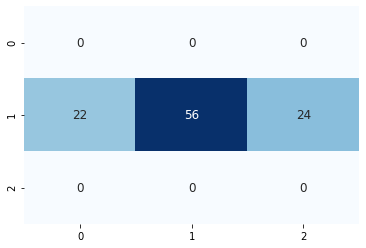

105/105 [==============================] - 0s 294us/sample - loss: 1.0064 - accuracy: 0.5714


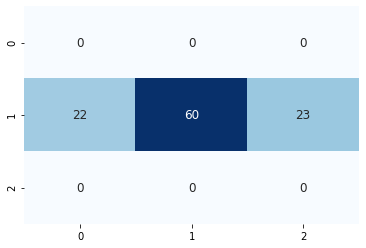

103/103 [==============================] - 0s 288us/sample - loss: 0.9888 - accuracy: 0.5728


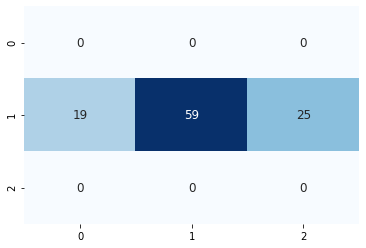

104/104 [==============================] - 0s 263us/sample - loss: 0.8793 - accuracy: 0.5962


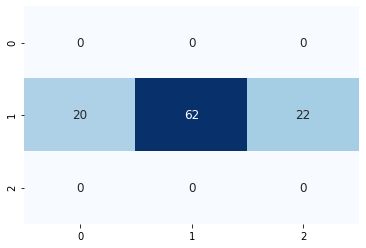

105/105 [==============================] - 0s 269us/sample - loss: 0.9794 - accuracy: 0.5238


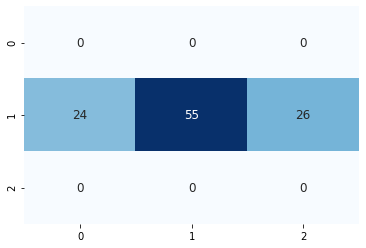

103/103 [==============================] - 0s 315us/sample - loss: 0.9857 - accuracy: 0.6117


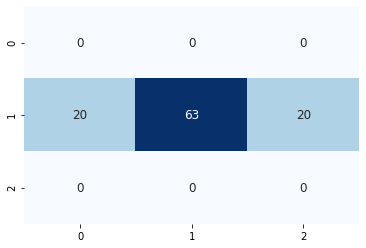

104/104 [==============================] - 0s 307us/sample - loss: 0.9497 - accuracy: 0.5673


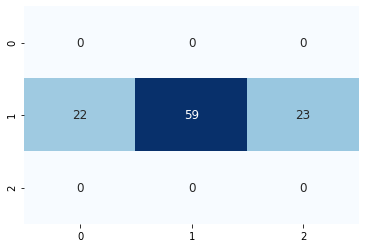

105/105 [==============================] - 0s 287us/sample - loss: 1.1112 - accuracy: 0.4762


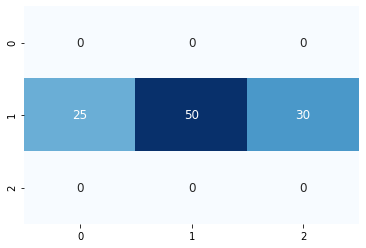

105/105 [==============================] - 0s 332us/sample - loss: 0.9932 - accuracy: 0.5333


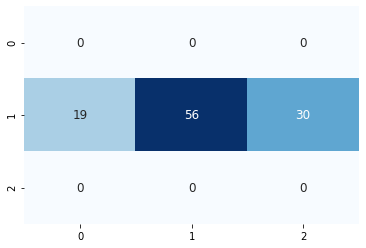

105/105 [==============================] - 0s 272us/sample - loss: 1.0511 - accuracy: 0.4762


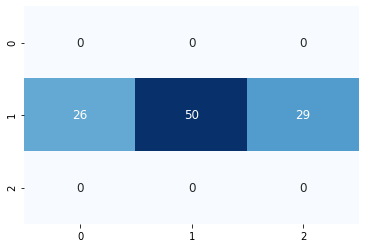

106/106 [==============================] - 0s 281us/sample - loss: 1.0974 - accuracy: 0.4906


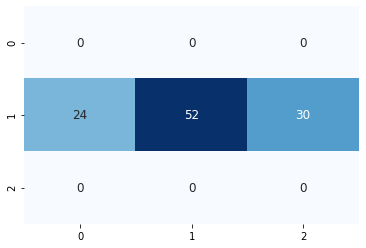

104/104 [==============================] - 0s 268us/sample - loss: 1.0523 - accuracy: 0.4519


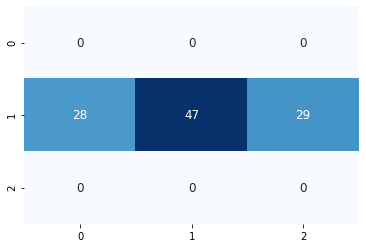

106/106 [==============================] - 0s 323us/sample - loss: 0.9750 - accuracy: 0.5377


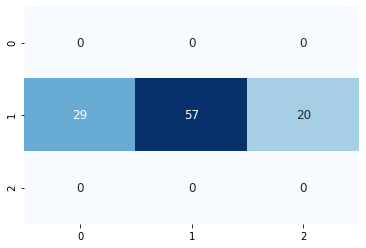

107/107 [==============================] - 0s 304us/sample - loss: 0.9958 - accuracy: 0.5514


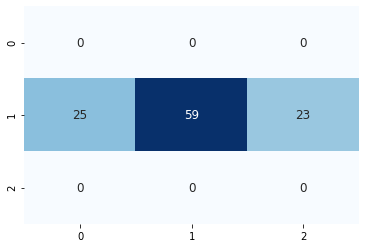

108/108 [==============================] - 0s 267us/sample - loss: 0.9122 - accuracy: 0.5463


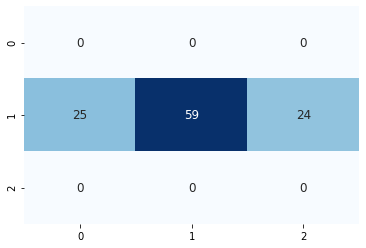

106/106 [==============================] - 0s 311us/sample - loss: 0.9230 - accuracy: 0.5755


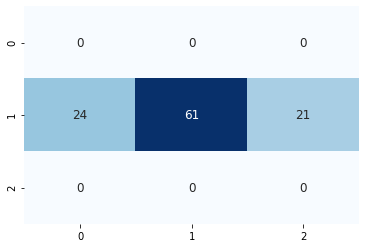

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3874 samples, validate on 1017 samples
Epoch 1/300
3874/3874 [==============================] - 3s 691us/sample - loss: 0.9856 - accuracy: 0.5268 - val_loss: 0.9999 - val_accuracy: 0.5408
Epoch 2/300
3874/3874 [==============================] - 1s 229us/sample - loss: 0.8425 - accuracy: 0.6293 - val_loss: 1.0044 - val_accuracy: 0.5280
Epoch 3/300
3874/3874 [==============================] - 1s 201us/sample - loss: 0.7478 - accuracy: 0.6817 - val_loss: 1.0239 - val_accuracy: 0.5192
Epoch 4/300
3874/3874 [==============================] - 1s 201us/sample - loss: 0.6644 - accuracy: 0.7370 - val_loss: 1.0706 - val_accuracy: 0.5074
Epoch 00004: early stopping
98/98 [==============================] - 0s 175us/sample - loss: 0.5955 - accuracy: 0.7857


9it [4:28:10, 1796.17s/it]
100%|██████████| 3/3 [00:06<00:00,  2.05s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 286.533203125 steps, validate for 75.24609375 steps
Epoch 1/300
287/286 [==============================] - 30s 103ms/step - loss: 0.9441 - accuracy: 0.5639 - val_loss: 0.9985 - val_accuracy: 0.5517
Epoch 2/300
287/286 [==============================] - 29s 102ms/step - loss: 0.8748 - accuracy: 0.6014 - val_loss: 1.0184 - val_accuracy: 0.5467
Epoch 3/300
287/286 [==============================] - 29s 102ms/step - loss: 0.8440 - accuracy: 0.6171 - val_loss: 1.0597 - val_accuracy: 0.5258
Epoch 4/300
287/286 [==============================] - 29s 101ms/step - loss: 0.8196 - accuracy: 0.6297 - val_loss: 1.0944 - val_accuracy: 0.5250
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 286.533203125 steps, validate for 75.24609375 steps
Epoch 1/300
287/286 [==============================] - 70s 246ms/step - loss: 0.7800 - accuracy: 0.6532 - val_loss: 1.2510 - val_a

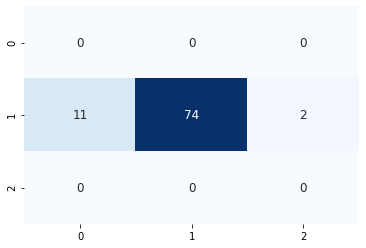

84/84 [==============================] - 0s 278us/sample - loss: 0.4264 - accuracy: 0.8333


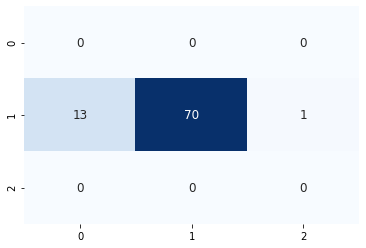

82/82 [==============================] - 0s 252us/sample - loss: 0.4943 - accuracy: 0.8293


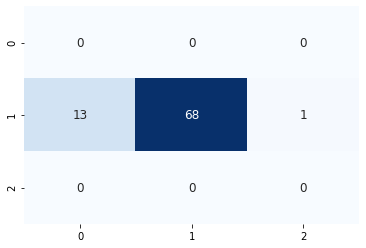

80/80 [==============================] - 0s 250us/sample - loss: 0.4842 - accuracy: 0.8375


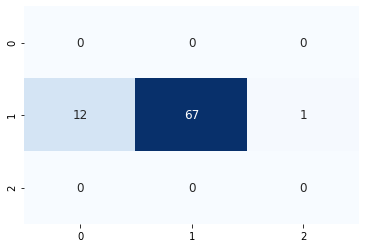

78/78 [==============================] - 0s 324us/sample - loss: 0.5642 - accuracy: 0.7564


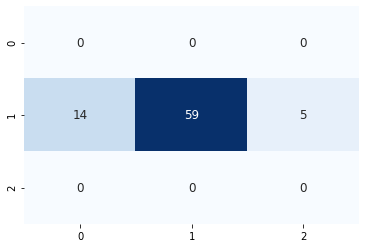

79/79 [==============================] - 0s 307us/sample - loss: 0.4642 - accuracy: 0.8228


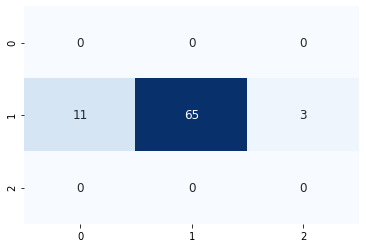

79/79 [==============================] - 0s 309us/sample - loss: 0.5678 - accuracy: 0.7342


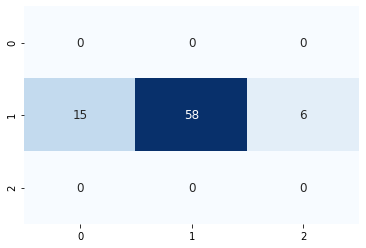

75/75 [==============================] - 0s 341us/sample - loss: 0.6070 - accuracy: 0.7600


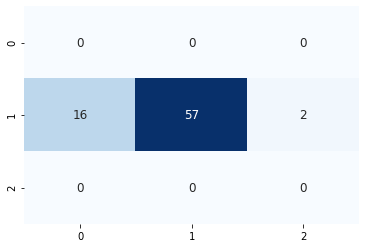

72/72 [==============================] - 0s 328us/sample - loss: 0.5727 - accuracy: 0.7639


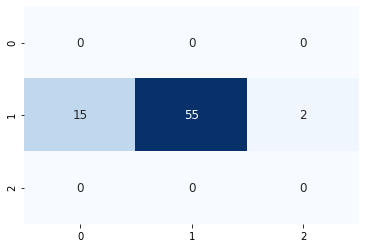

72/72 [==============================] - 0s 283us/sample - loss: 0.6232 - accuracy: 0.6944


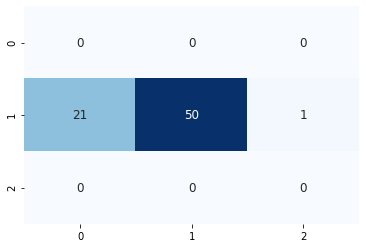

73/73 [==============================] - 0s 305us/sample - loss: 0.5880 - accuracy: 0.7671


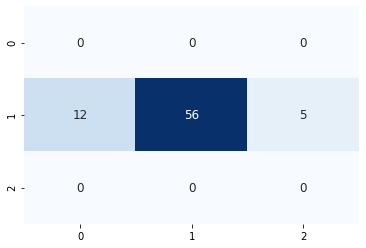

74/74 [==============================] - 0s 313us/sample - loss: 0.4966 - accuracy: 0.8243


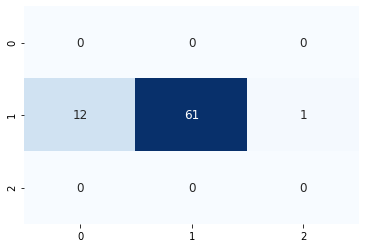

73/73 [==============================] - 0s 345us/sample - loss: 0.5778 - accuracy: 0.7808


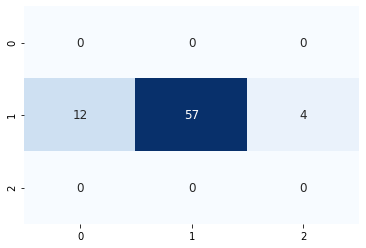

70/70 [==============================] - 0s 399us/sample - loss: 0.6352 - accuracy: 0.7286


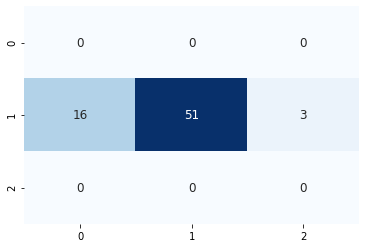

70/70 [==============================] - 0s 350us/sample - loss: 0.6057 - accuracy: 0.7571


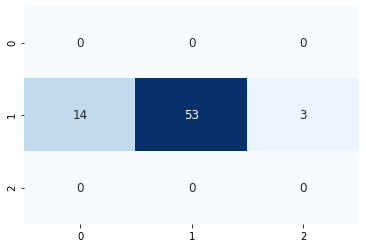

71/71 [==============================] - 0s 370us/sample - loss: 0.6384 - accuracy: 0.6620


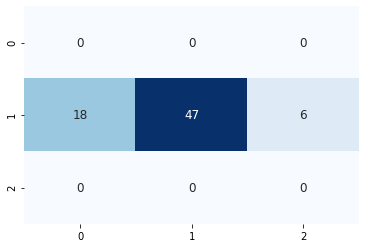

72/72 [==============================] - 0s 546us/sample - loss: 0.6719 - accuracy: 0.6806


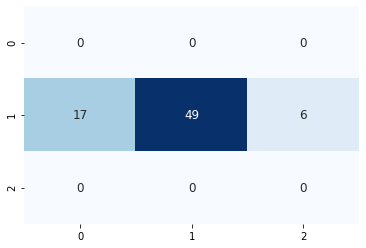

73/73 [==============================] - 0s 282us/sample - loss: 0.6760 - accuracy: 0.7123


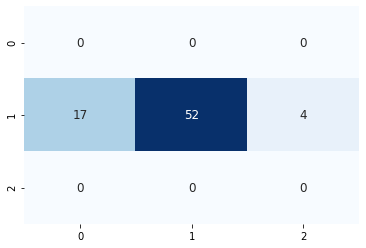

70/70 [==============================] - 0s 298us/sample - loss: 0.6122 - accuracy: 0.7714


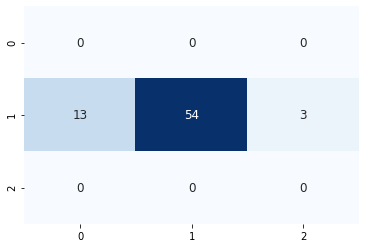

70/70 [==============================] - 0s 373us/sample - loss: 0.6786 - accuracy: 0.7143


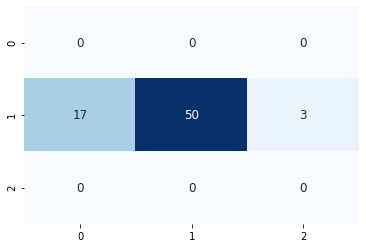

68/68 [==============================] - 0s 316us/sample - loss: 0.8622 - accuracy: 0.6324


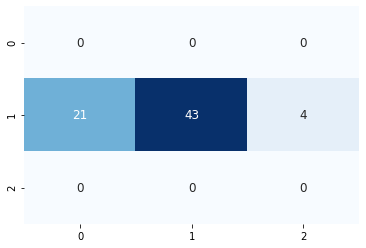

66/66 [==============================] - 0s 366us/sample - loss: 0.6174 - accuracy: 0.7576


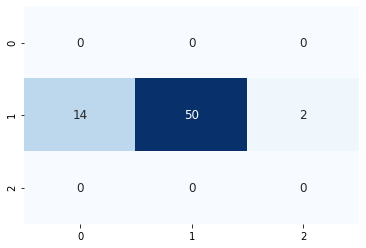

67/67 [==============================] - 0s 380us/sample - loss: 0.6311 - accuracy: 0.7313


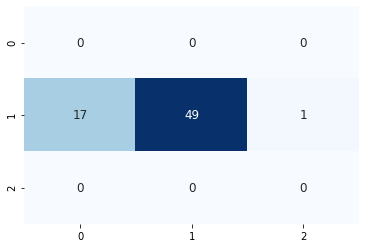

66/66 [==============================] - 0s 348us/sample - loss: 0.6096 - accuracy: 0.7576


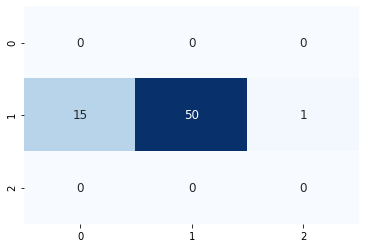

65/65 [==============================] - 0s 342us/sample - loss: 0.5688 - accuracy: 0.7385


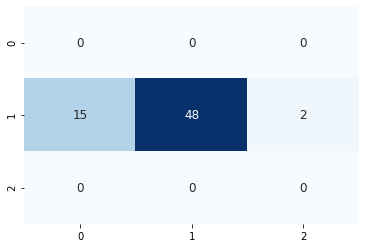

64/64 [==============================] - 0s 4ms/sample - loss: 0.6017 - accuracy: 0.7969


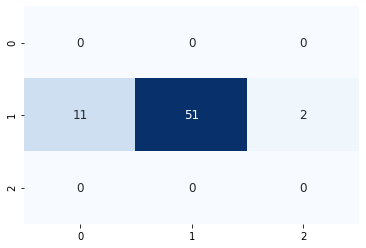

64/64 [==============================] - 0s 294us/sample - loss: 0.5792 - accuracy: 0.7812


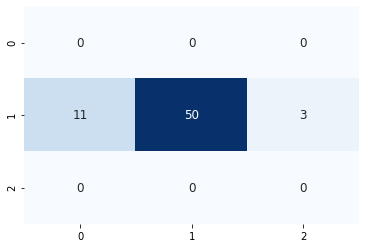

65/65 [==============================] - 0s 363us/sample - loss: 0.6207 - accuracy: 0.7692


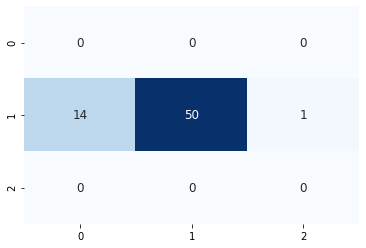

64/64 [==============================] - 0s 282us/sample - loss: 0.5612 - accuracy: 0.7188


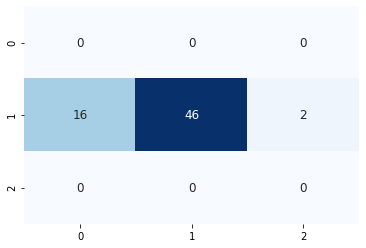

63/63 [==============================] - 0s 302us/sample - loss: 0.5055 - accuracy: 0.7778


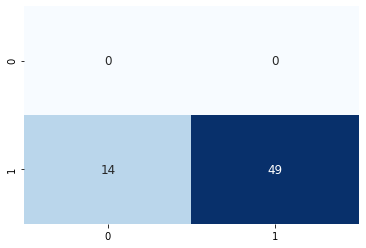

64/64 [==============================] - 0s 285us/sample - loss: 0.6424 - accuracy: 0.6719


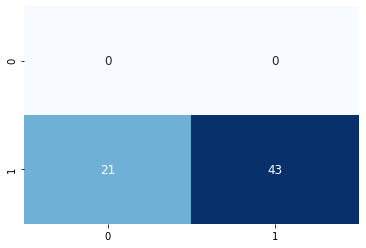

64/64 [==============================] - 0s 297us/sample - loss: 0.5816 - accuracy: 0.7188


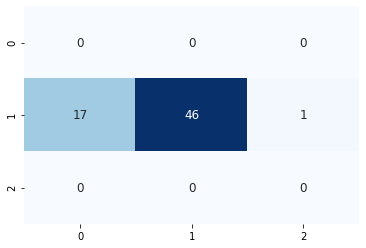

64/64 [==============================] - 0s 327us/sample - loss: 0.6456 - accuracy: 0.7500


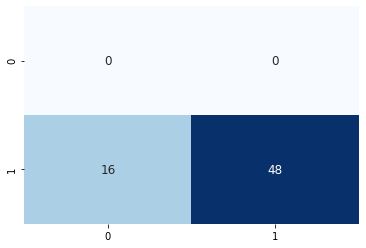

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3916 samples, validate on 1013 samples
Epoch 1/300
3916/3916 [==============================] - 3s 737us/sample - loss: 0.9313 - accuracy: 0.5516 - val_loss: 0.9921 - val_accuracy: 0.5390
Epoch 2/300
3916/3916 [==============================] - 1s 222us/sample - loss: 0.7374 - accuracy: 0.6943 - val_loss: 1.0232 - val_accuracy: 0.5311
Epoch 3/300
3916/3916 [==============================] - 1s 214us/sample - loss: 0.6059 - accuracy: 0.7651 - val_loss: 1.0866 - val_accuracy: 0.5173
Epoch 4/300
3916/3916 [==============================] - 1s 206us/sample - loss: 0.4851 - accuracy: 0.8220 - val_loss: 1.1768 - val_accuracy: 0.5183
Epoch 00004: early stopping
60/60 [==============================] - 0s 140us/sample - loss: 0.5045 - accuracy: 0.7500


10it [4:58:33, 1804.34s/it]
100%|██████████| 3/3 [00:05<00:00,  1.96s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.2734375 steps, validate for 75.669921875 steps
Epoch 1/300
285/284 [==============================] - 29s 103ms/step - loss: 0.9611 - accuracy: 0.5515 - val_loss: 1.0023 - val_accuracy: 0.5558
Epoch 2/300
285/284 [==============================] - 28s 99ms/step - loss: 0.8809 - accuracy: 0.5964 - val_loss: 1.0051 - val_accuracy: 0.5448
Epoch 3/300
285/284 [==============================] - 29s 101ms/step - loss: 0.8497 - accuracy: 0.6130 - val_loss: 1.0323 - val_accuracy: 0.5375
Epoch 4/300
285/284 [==============================] - 29s 101ms/step - loss: 0.8247 - accuracy: 0.6270 - val_loss: 1.0596 - val_accuracy: 0.5304
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.2734375 steps, validate for 75.669921875 steps
Epoch 1/300
285/284 [==============================] - 70s 246ms/step - loss: 0.7844 - accuracy: 0.6502 - val_loss: 1.1418 - val_accu

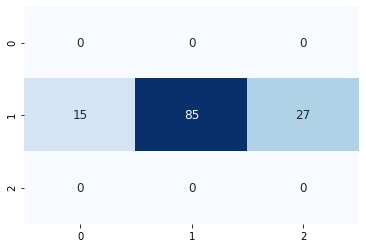

126/126 [==============================] - 0s 244us/sample - loss: 0.8867 - accuracy: 0.5714


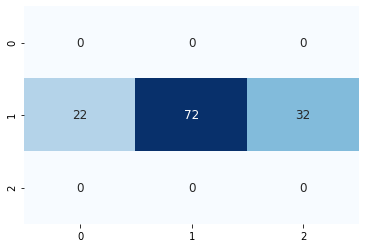

126/126 [==============================] - 0s 279us/sample - loss: 0.8287 - accuracy: 0.6508


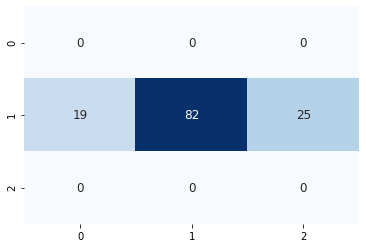

126/126 [==============================] - 0s 254us/sample - loss: 0.8394 - accuracy: 0.6667


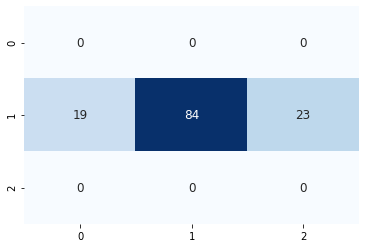

118/118 [==============================] - 0s 255us/sample - loss: 0.9166 - accuracy: 0.6102


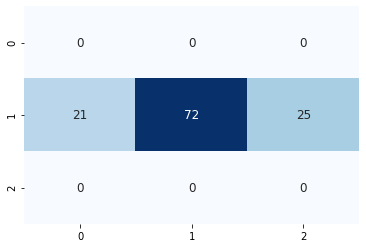

110/110 [==============================] - 0s 275us/sample - loss: 0.8715 - accuracy: 0.6364


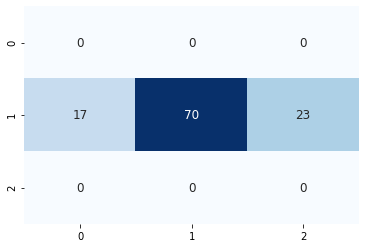

108/108 [==============================] - 0s 268us/sample - loss: 0.9388 - accuracy: 0.5741


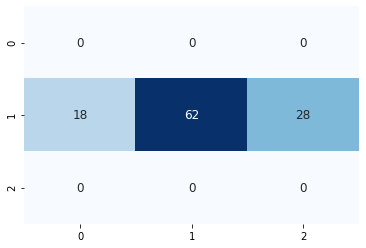

103/103 [==============================] - 0s 301us/sample - loss: 0.8657 - accuracy: 0.6408


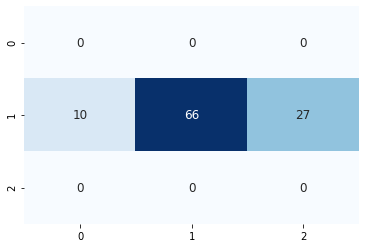

100/100 [==============================] - 0s 302us/sample - loss: 0.8822 - accuracy: 0.5500


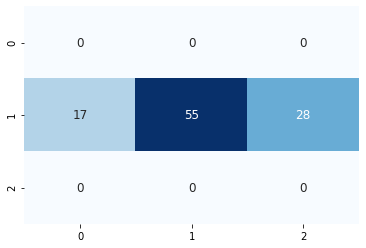

98/98 [==============================] - 0s 309us/sample - loss: 0.8156 - accuracy: 0.6122


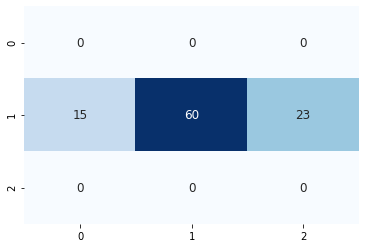

98/98 [==============================] - 0s 278us/sample - loss: 0.7106 - accuracy: 0.6633


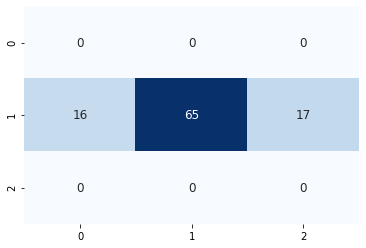

97/97 [==============================] - 0s 454us/sample - loss: 0.7164 - accuracy: 0.7216


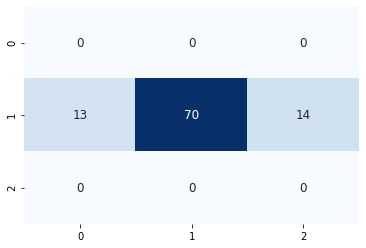

97/97 [==============================] - 0s 324us/sample - loss: 0.7002 - accuracy: 0.7113


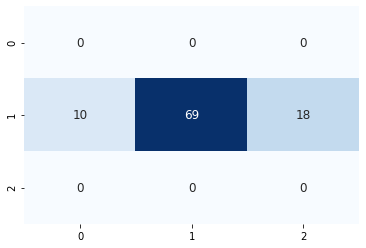

96/96 [==============================] - 0s 2ms/sample - loss: 0.6635 - accuracy: 0.6354


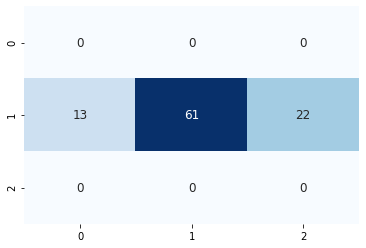

97/97 [==============================] - 0s 342us/sample - loss: 0.8725 - accuracy: 0.6289


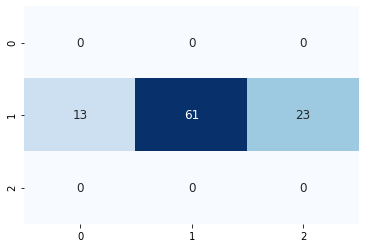

96/96 [==============================] - 0s 258us/sample - loss: 0.7763 - accuracy: 0.6354


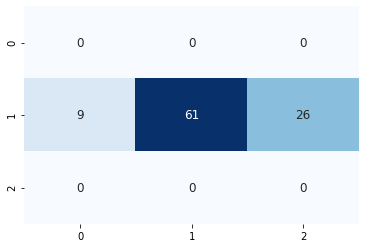

94/94 [==============================] - 0s 275us/sample - loss: 0.8325 - accuracy: 0.6064


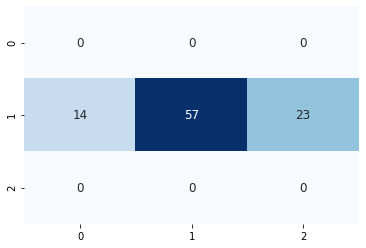

94/94 [==============================] - 0s 255us/sample - loss: 0.8057 - accuracy: 0.6809


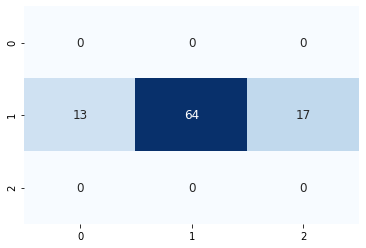

92/92 [==============================] - 0s 269us/sample - loss: 0.8259 - accuracy: 0.6413


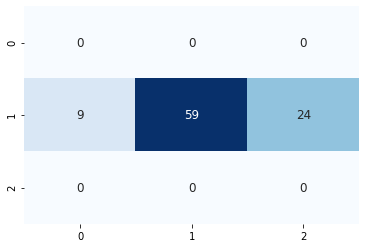

94/94 [==============================] - 0s 275us/sample - loss: 0.7956 - accuracy: 0.6489


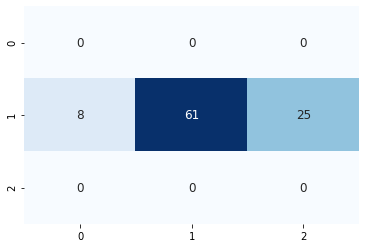

92/92 [==============================] - 0s 271us/sample - loss: 0.8268 - accuracy: 0.6304


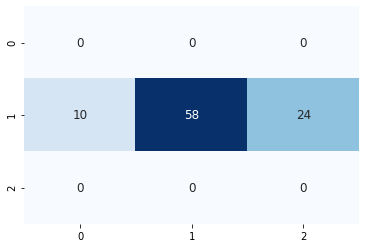

90/90 [==============================] - 0s 258us/sample - loss: 0.6785 - accuracy: 0.7444


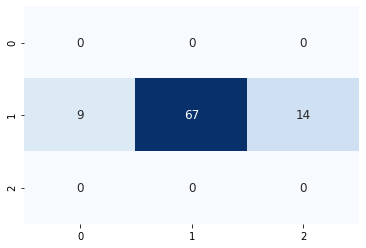

92/92 [==============================] - 0s 476us/sample - loss: 0.7565 - accuracy: 0.6848


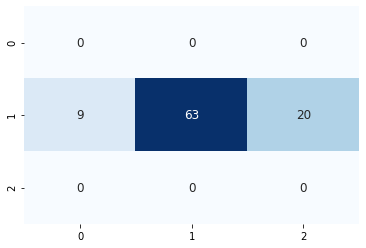

92/92 [==============================] - 0s 269us/sample - loss: 0.7621 - accuracy: 0.6739


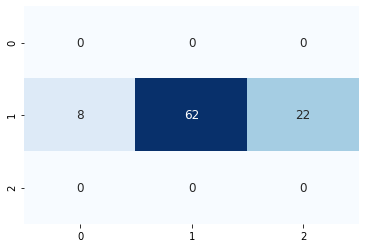

94/94 [==============================] - 0s 262us/sample - loss: 0.6580 - accuracy: 0.7234


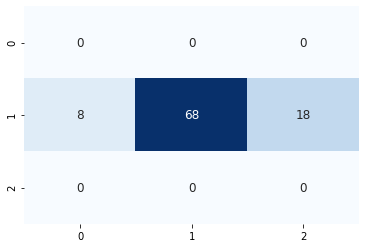

93/93 [==============================] - 0s 268us/sample - loss: 0.7304 - accuracy: 0.6667


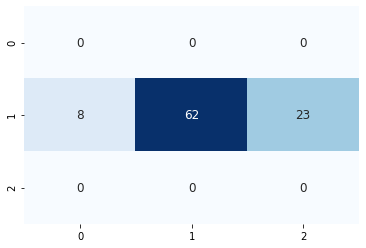

94/94 [==============================] - 0s 285us/sample - loss: 0.8430 - accuracy: 0.6702


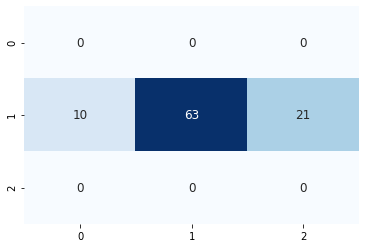

93/93 [==============================] - 0s 295us/sample - loss: 0.8379 - accuracy: 0.6129


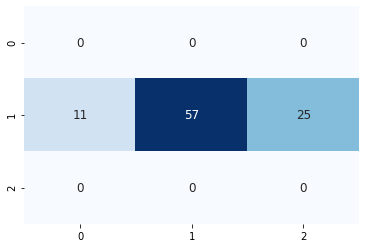

91/91 [==============================] - 0s 340us/sample - loss: 0.7778 - accuracy: 0.6593


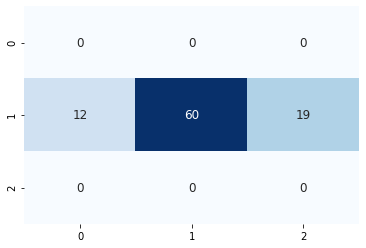

92/92 [==============================] - 0s 271us/sample - loss: 0.7358 - accuracy: 0.6522


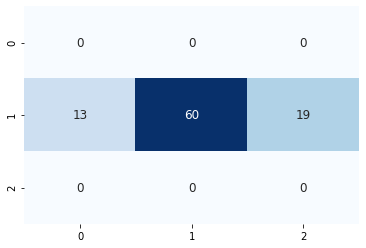

90/90 [==============================] - 0s 410us/sample - loss: 0.7900 - accuracy: 0.6444


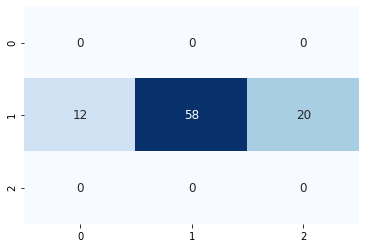

89/89 [==============================] - 0s 306us/sample - loss: 0.9187 - accuracy: 0.5843


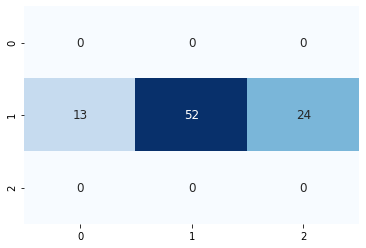

89/89 [==============================] - 0s 301us/sample - loss: 0.8922 - accuracy: 0.6292


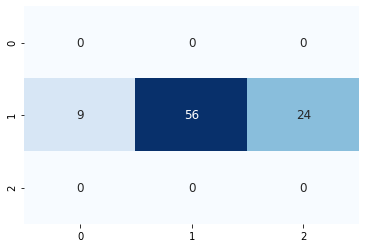

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3893 samples, validate on 1021 samples
Epoch 1/300
3893/3893 [==============================] - 3s 676us/sample - loss: 0.9391 - accuracy: 0.5597 - val_loss: 1.0027 - val_accuracy: 0.5318
Epoch 2/300
3893/3893 [==============================] - 1s 215us/sample - loss: 0.7290 - accuracy: 0.6902 - val_loss: 1.0424 - val_accuracy: 0.5240
Epoch 3/300
3893/3893 [==============================] - 1s 222us/sample - loss: 0.6023 - accuracy: 0.7627 - val_loss: 1.1100 - val_accuracy: 0.5103
Epoch 4/300
3893/3893 [==============================] - 1s 218us/sample - loss: 0.5020 - accuracy: 0.8148 - val_loss: 1.1896 - val_accuracy: 0.4878
Epoch 00004: early stopping
75/75 [==============================] - 0s 170us/sample - loss: 0.6594 - accuracy: 0.7333


11it [5:29:45, 1824.49s/it]
100%|██████████| 3/3 [00:06<00:00,  2.03s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.671875 steps, validate for 75.267578125 steps
Epoch 1/300
283/282 [==============================] - 29s 102ms/step - loss: 0.9452 - accuracy: 0.5655 - val_loss: 0.9968 - val_accuracy: 0.5465
Epoch 2/300
283/282 [==============================] - 28s 100ms/step - loss: 0.8803 - accuracy: 0.5967 - val_loss: 1.0144 - val_accuracy: 0.5406
Epoch 3/300
283/282 [==============================] - 29s 101ms/step - loss: 0.8498 - accuracy: 0.6126 - val_loss: 1.0343 - val_accuracy: 0.5269
Epoch 4/300
283/282 [==============================] - 29s 102ms/step - loss: 0.8263 - accuracy: 0.6271 - val_loss: 1.0605 - val_accuracy: 0.5235
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.671875 steps, validate for 75.267578125 steps
Epoch 1/300
283/282 [==============================] - 70s 249ms/step - loss: 0.7875 - accuracy: 0.6470 - val_loss: 1.1402 - val_accur

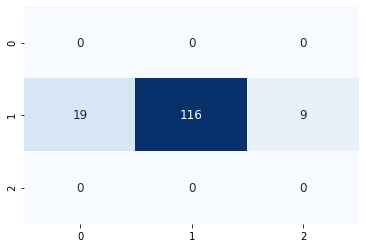

138/138 [==============================] - 0s 272us/sample - loss: 0.5525 - accuracy: 0.8116


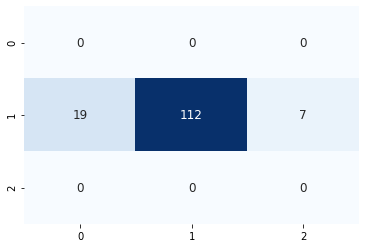

138/138 [==============================] - 0s 265us/sample - loss: 0.5732 - accuracy: 0.7971


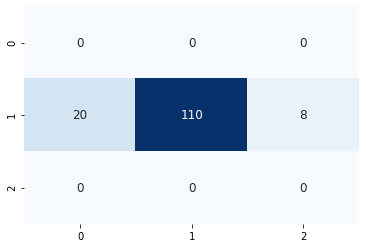

137/137 [==============================] - 0s 302us/sample - loss: 0.5575 - accuracy: 0.8467


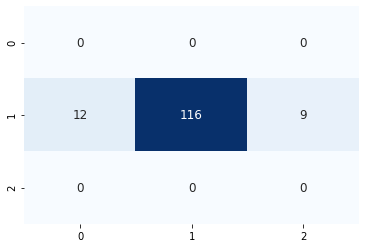

137/137 [==============================] - 0s 264us/sample - loss: 0.5481 - accuracy: 0.8102


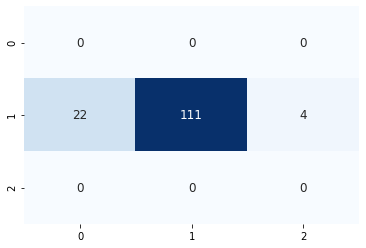

137/137 [==============================] - 0s 329us/sample - loss: 0.5062 - accuracy: 0.8540


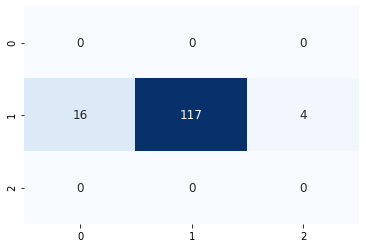

136/136 [==============================] - 0s 296us/sample - loss: 0.5928 - accuracy: 0.7941


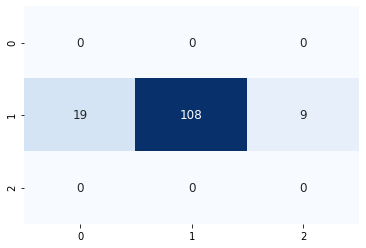

135/135 [==============================] - 0s 273us/sample - loss: 0.5450 - accuracy: 0.8000


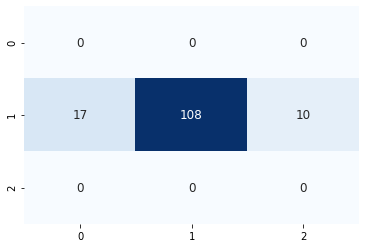

133/133 [==============================] - 0s 261us/sample - loss: 0.5127 - accuracy: 0.8120


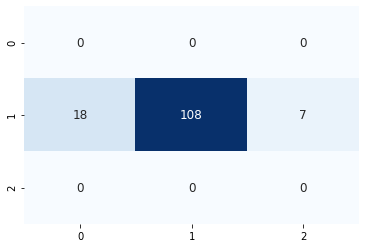

134/134 [==============================] - 0s 263us/sample - loss: 0.5905 - accuracy: 0.7836


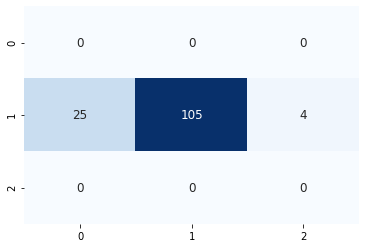

134/134 [==============================] - 0s 300us/sample - loss: 0.5571 - accuracy: 0.7910


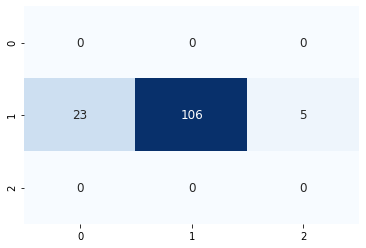

133/133 [==============================] - 0s 256us/sample - loss: 0.5732 - accuracy: 0.7970


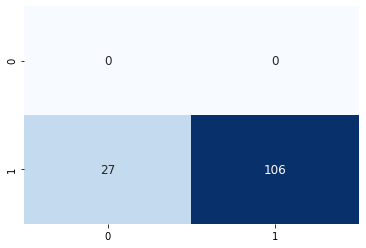

133/133 [==============================] - 0s 284us/sample - loss: 0.5674 - accuracy: 0.8045


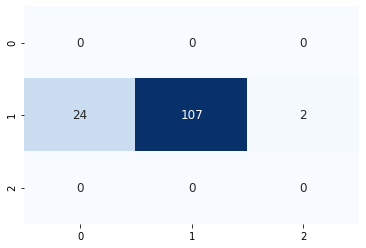

133/133 [==============================] - 0s 310us/sample - loss: 0.5458 - accuracy: 0.7669


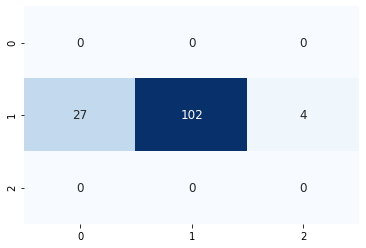

129/129 [==============================] - 0s 298us/sample - loss: 0.5184 - accuracy: 0.8140


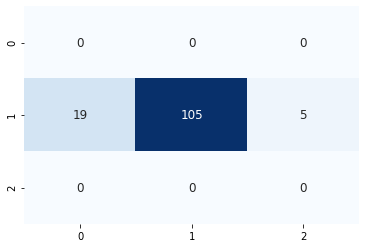

129/129 [==============================] - 0s 331us/sample - loss: 0.5791 - accuracy: 0.7674


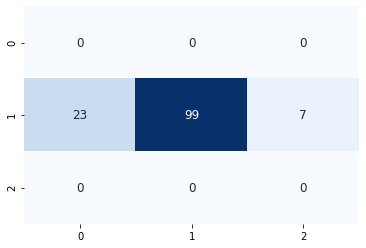

132/132 [==============================] - 0s 314us/sample - loss: 0.5916 - accuracy: 0.7121


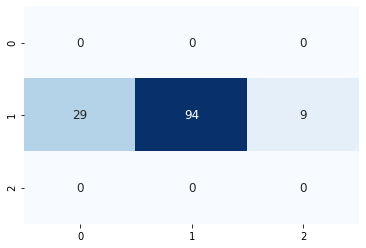

129/129 [==============================] - 0s 298us/sample - loss: 0.6310 - accuracy: 0.6977


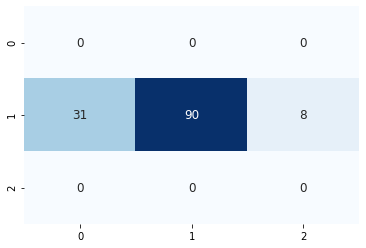

131/131 [==============================] - 0s 273us/sample - loss: 0.5355 - accuracy: 0.8168


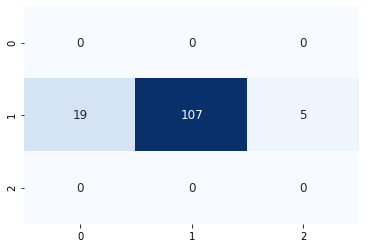

130/130 [==============================] - 0s 268us/sample - loss: 0.5076 - accuracy: 0.8077


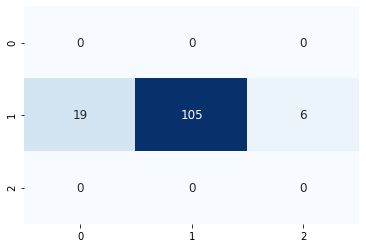

129/129 [==============================] - 0s 301us/sample - loss: 0.6180 - accuracy: 0.6899


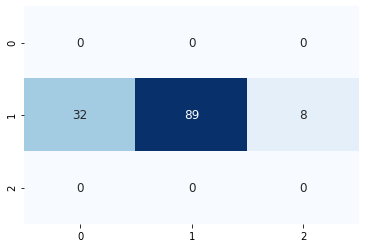

127/127 [==============================] - 0s 271us/sample - loss: 0.5618 - accuracy: 0.7953


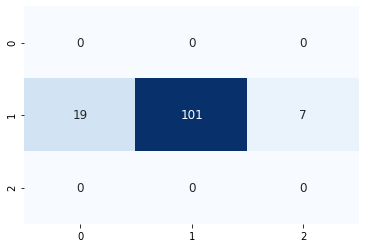

124/124 [==============================] - 0s 268us/sample - loss: 0.5912 - accuracy: 0.7661


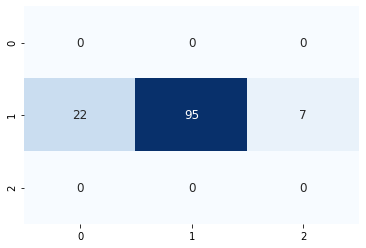

128/128 [==============================] - 0s 2ms/sample - loss: 0.5120 - accuracy: 0.8359


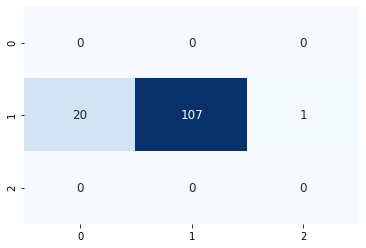

128/128 [==============================] - 0s 268us/sample - loss: 0.5849 - accuracy: 0.7969


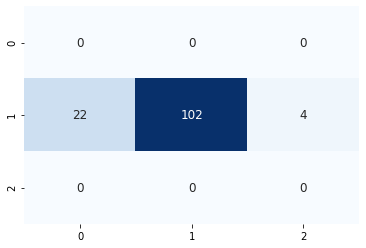

126/126 [==============================] - 0s 281us/sample - loss: 0.5666 - accuracy: 0.7857


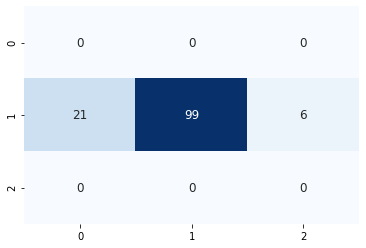

124/124 [==============================] - 0s 267us/sample - loss: 0.5402 - accuracy: 0.8145


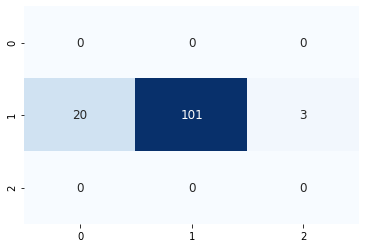

124/124 [==============================] - 0s 305us/sample - loss: 0.5922 - accuracy: 0.7742


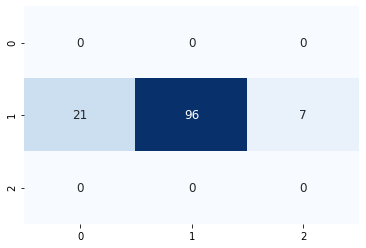

124/124 [==============================] - 0s 266us/sample - loss: 0.6081 - accuracy: 0.7661


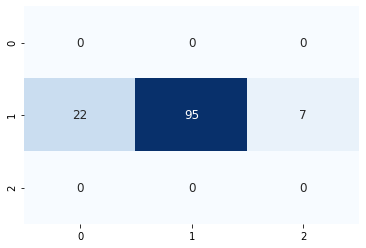

125/125 [==============================] - 0s 275us/sample - loss: 0.6004 - accuracy: 0.7520


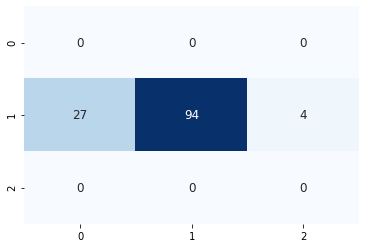

126/126 [==============================] - 0s 245us/sample - loss: 0.6265 - accuracy: 0.6905


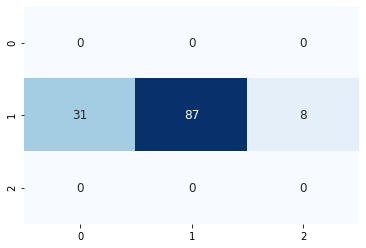

123/123 [==============================] - 0s 267us/sample - loss: 0.5234 - accuracy: 0.8130


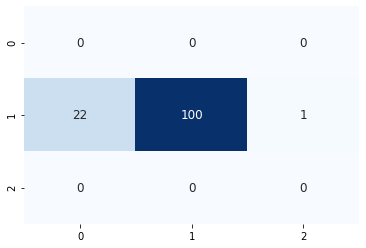

124/124 [==============================] - 0s 274us/sample - loss: 0.5678 - accuracy: 0.7823


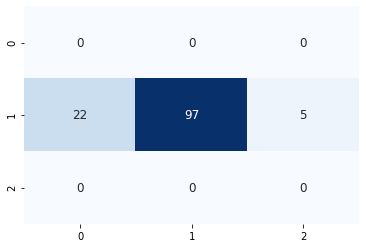

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3859 samples, validate on 1013 samples
Epoch 1/300
3859/3859 [==============================] - 3s 696us/sample - loss: 0.9702 - accuracy: 0.5219 - val_loss: 0.9991 - val_accuracy: 0.5380
Epoch 2/300
3859/3859 [==============================] - 1s 213us/sample - loss: 0.8085 - accuracy: 0.6346 - val_loss: 1.0128 - val_accuracy: 0.5311
Epoch 3/300
3859/3859 [==============================] - 1s 210us/sample - loss: 0.7279 - accuracy: 0.6771 - val_loss: 1.0370 - val_accuracy: 0.5192
Epoch 4/300
3859/3859 [==============================] - 1s 226us/sample - loss: 0.6499 - accuracy: 0.7305 - val_loss: 1.0723 - val_accuracy: 0.5114
Epoch 00004: early stopping
117/117 [==============================] - 0s 150us/sample - loss: 0.5900 - accuracy: 0.7778


12it [5:58:46, 1799.41s/it]
100%|██████████| 3/3 [00:06<00:00,  2.15s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.017578125 steps, validate for 74.357421875 steps
Epoch 1/300
285/284 [==============================] - 29s 103ms/step - loss: 0.9577 - accuracy: 0.5504 - val_loss: 0.9942 - val_accuracy: 0.5437
Epoch 2/300
285/284 [==============================] - 29s 100ms/step - loss: 0.8793 - accuracy: 0.5941 - val_loss: 1.0175 - val_accuracy: 0.5265
Epoch 3/300
285/284 [==============================] - 29s 102ms/step - loss: 0.8478 - accuracy: 0.6118 - val_loss: 1.0341 - val_accuracy: 0.5285
Epoch 4/300
285/284 [==============================] - 29s 101ms/step - loss: 0.8247 - accuracy: 0.6243 - val_loss: 1.0734 - val_accuracy: 0.5283
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.017578125 steps, validate for 74.357421875 steps
Epoch 1/300
285/284 [==============================] - 70s 246ms/step - loss: 0.7892 - accuracy: 0.6445 - val_loss: 1.1443 - val

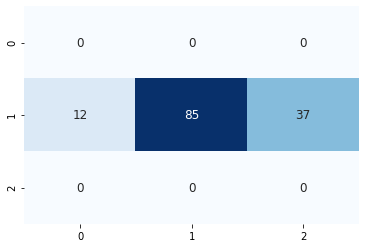

134/134 [==============================] - 0s 290us/sample - loss: 0.7748 - accuracy: 0.7164


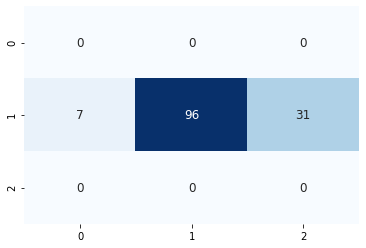

131/131 [==============================] - 0s 281us/sample - loss: 0.8148 - accuracy: 0.5802


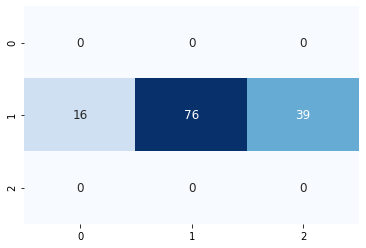

129/129 [==============================] - 0s 253us/sample - loss: 0.7502 - accuracy: 0.6744


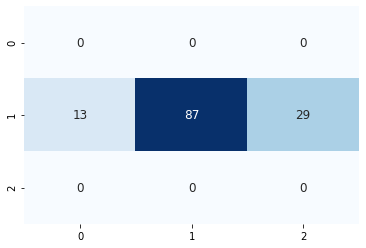

129/129 [==============================] - 0s 286us/sample - loss: 0.7958 - accuracy: 0.6357


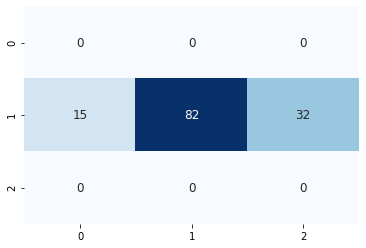

129/129 [==============================] - 0s 284us/sample - loss: 0.6833 - accuracy: 0.6744


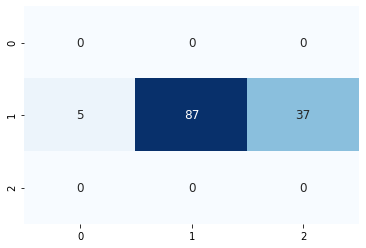

128/128 [==============================] - 0s 2ms/sample - loss: 0.8220 - accuracy: 0.5938


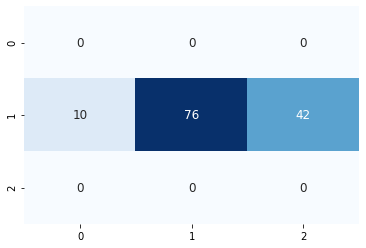

126/126 [==============================] - 0s 335us/sample - loss: 0.7346 - accuracy: 0.6270


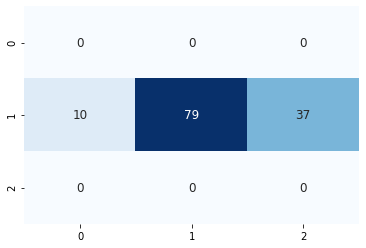

125/125 [==============================] - 0s 244us/sample - loss: 0.7817 - accuracy: 0.6400


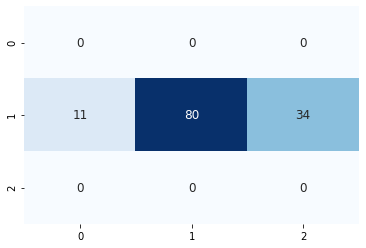

126/126 [==============================] - 0s 267us/sample - loss: 0.8343 - accuracy: 0.6429


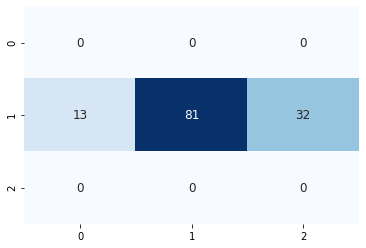

126/126 [==============================] - 0s 254us/sample - loss: 0.8573 - accuracy: 0.6111


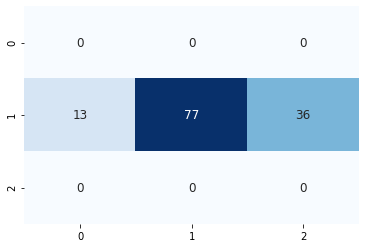

126/126 [==============================] - 0s 249us/sample - loss: 0.7736 - accuracy: 0.6349


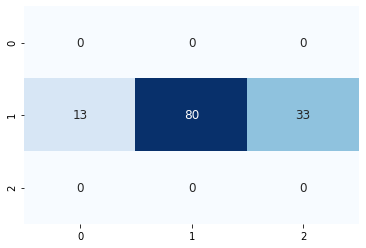

125/125 [==============================] - 0s 246us/sample - loss: 0.7731 - accuracy: 0.6720


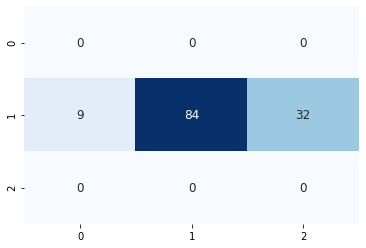

126/126 [==============================] - 0s 256us/sample - loss: 0.7882 - accuracy: 0.5635


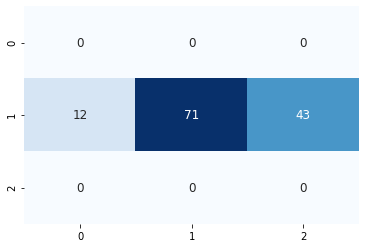

123/123 [==============================] - 0s 315us/sample - loss: 0.7705 - accuracy: 0.6667


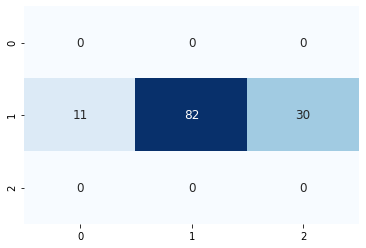

121/121 [==============================] - 0s 257us/sample - loss: 0.7735 - accuracy: 0.6446


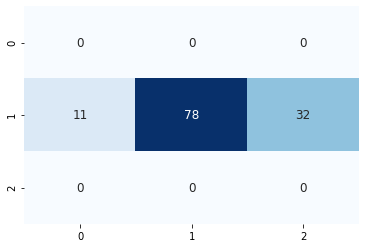

122/122 [==============================] - 0s 279us/sample - loss: 0.8286 - accuracy: 0.6148


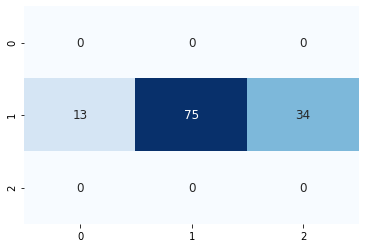

120/120 [==============================] - 0s 265us/sample - loss: 0.7679 - accuracy: 0.6083


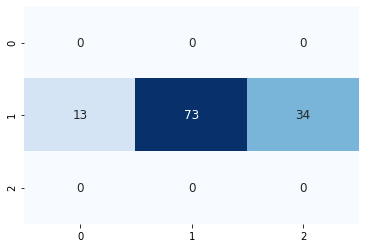

121/121 [==============================] - 0s 266us/sample - loss: 0.8344 - accuracy: 0.6281


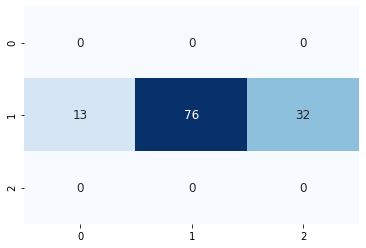

121/121 [==============================] - 0s 260us/sample - loss: 0.8392 - accuracy: 0.6446


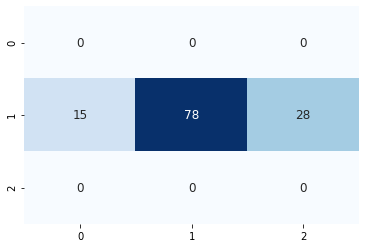

123/123 [==============================] - 0s 247us/sample - loss: 0.8261 - accuracy: 0.6423


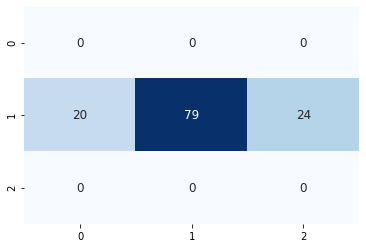

123/123 [==============================] - 0s 245us/sample - loss: 0.8522 - accuracy: 0.6179


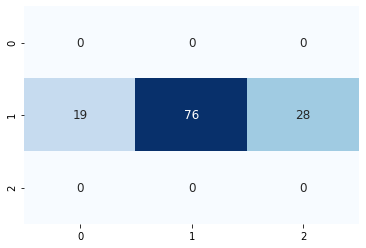

123/123 [==============================] - 0s 241us/sample - loss: 0.7813 - accuracy: 0.6585


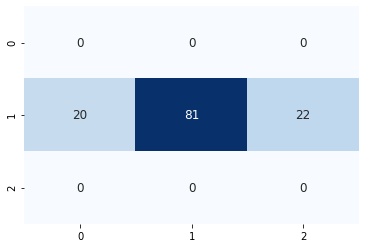

122/122 [==============================] - 0s 243us/sample - loss: 0.7152 - accuracy: 0.6803


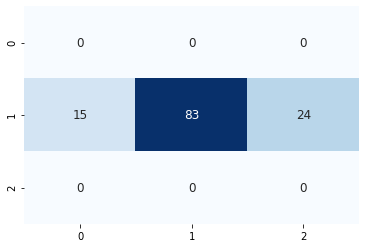

122/122 [==============================] - 0s 239us/sample - loss: 0.6836 - accuracy: 0.7131


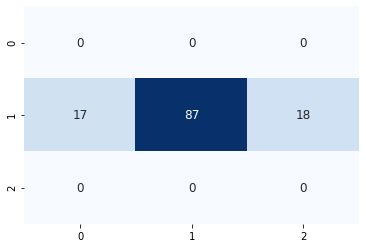

121/121 [==============================] - 0s 263us/sample - loss: 0.8400 - accuracy: 0.6446


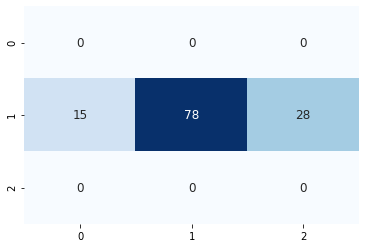

119/119 [==============================] - 0s 276us/sample - loss: 0.7489 - accuracy: 0.7059


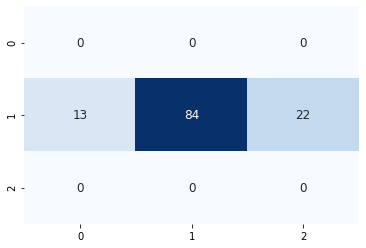

119/119 [==============================] - 0s 281us/sample - loss: 0.7848 - accuracy: 0.6303


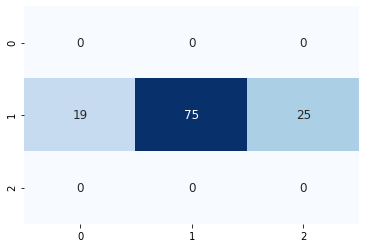

120/120 [==============================] - 0s 259us/sample - loss: 0.7292 - accuracy: 0.7167


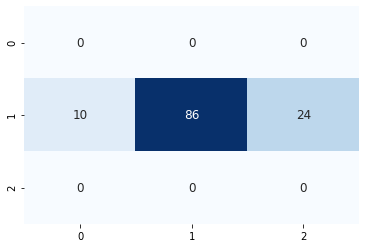

120/120 [==============================] - 0s 257us/sample - loss: 0.7061 - accuracy: 0.7333


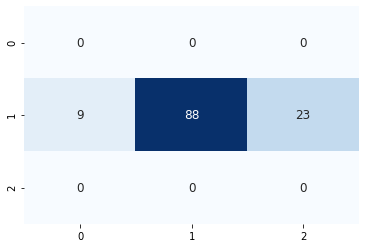

119/119 [==============================] - 0s 288us/sample - loss: 0.7422 - accuracy: 0.6471


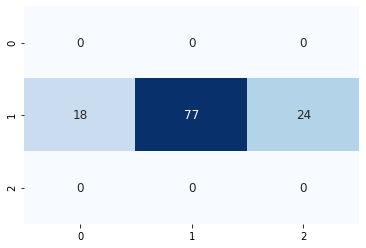

118/118 [==============================] - 0s 285us/sample - loss: 0.7824 - accuracy: 0.6356


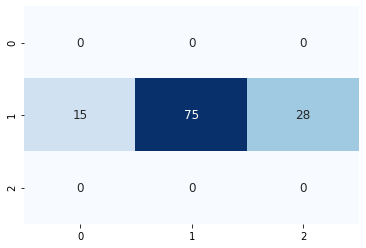

120/120 [==============================] - 0s 296us/sample - loss: 0.7434 - accuracy: 0.6750


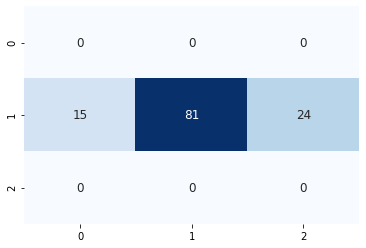

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3880 samples, validate on 999 samples
Epoch 1/300
3880/3880 [==============================] - 3s 659us/sample - loss: 0.9343 - accuracy: 0.5477 - val_loss: 0.9806 - val_accuracy: 0.5325
Epoch 2/300
3880/3880 [==============================] - 1s 212us/sample - loss: 0.8092 - accuracy: 0.6415 - val_loss: 0.9903 - val_accuracy: 0.5435
Epoch 3/300
3880/3880 [==============================] - 1s 209us/sample - loss: 0.7240 - accuracy: 0.6928 - val_loss: 1.0157 - val_accuracy: 0.5415
Epoch 4/300
3880/3880 [==============================] - 1s 214us/sample - loss: 0.6480 - accuracy: 0.7327 - val_loss: 1.0515 - val_accuracy: 0.5385
Epoch 00004: early stopping
110/110 [==============================] - 0s 139us/sample - loss: 0.6699 - accuracy: 0.7091


13it [6:28:50, 1800.82s/it]
100%|██████████| 3/3 [00:06<00:00,  2.11s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.400390625 steps, validate for 74.830078125 steps
Epoch 1/300
283/282 [==============================] - 29s 104ms/step - loss: 0.9616 - accuracy: 0.5548 - val_loss: 0.9941 - val_accuracy: 0.5479
Epoch 2/300
283/282 [==============================] - 28s 100ms/step - loss: 0.8803 - accuracy: 0.5996 - val_loss: 1.0063 - val_accuracy: 0.5362
Epoch 3/300
283/282 [==============================] - 28s 100ms/step - loss: 0.8506 - accuracy: 0.6142 - val_loss: 1.0322 - val_accuracy: 0.5256
Epoch 4/300
283/282 [==============================] - 29s 102ms/step - loss: 0.8259 - accuracy: 0.6261 - val_loss: 1.0545 - val_accuracy: 0.5208
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.400390625 steps, validate for 74.830078125 steps
Epoch 1/300
283/282 [==============================] - 70s 249ms/step - loss: 0.7868 - accuracy: 0.6489 - val_loss: 1.2104 - val

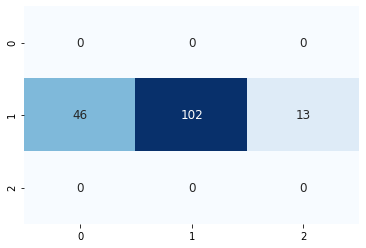

155/155 [==============================] - 0s 274us/sample - loss: 0.8269 - accuracy: 0.6194


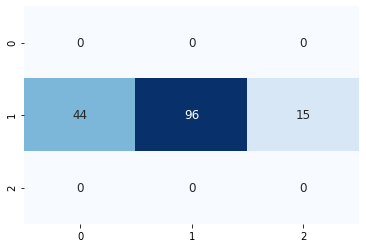

153/153 [==============================] - 0s 268us/sample - loss: 0.8436 - accuracy: 0.6078


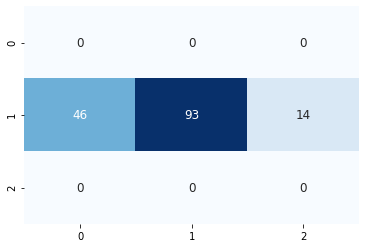

153/153 [==============================] - 0s 262us/sample - loss: 0.9503 - accuracy: 0.5752


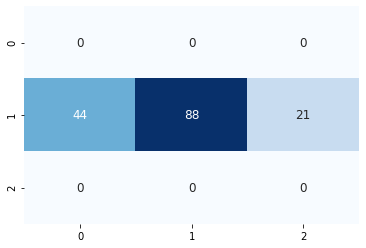

151/151 [==============================] - 0s 271us/sample - loss: 0.8533 - accuracy: 0.6225


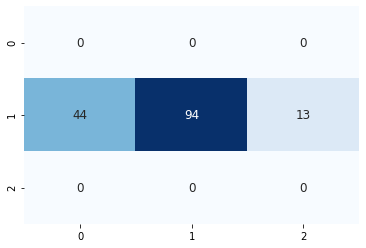

149/149 [==============================] - 0s 284us/sample - loss: 0.8976 - accuracy: 0.5638


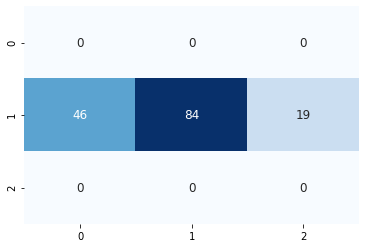

149/149 [==============================] - 0s 254us/sample - loss: 0.9099 - accuracy: 0.5906


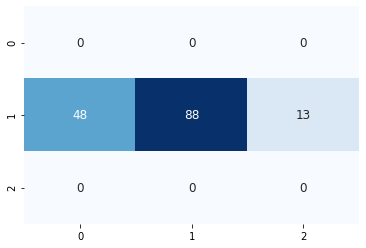

149/149 [==============================] - 0s 243us/sample - loss: 1.0191 - accuracy: 0.4832


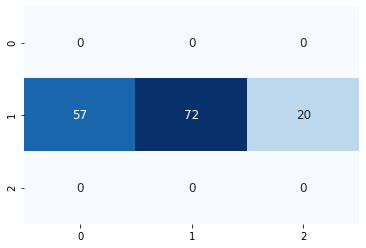

149/149 [==============================] - 0s 270us/sample - loss: 0.9935 - accuracy: 0.5101


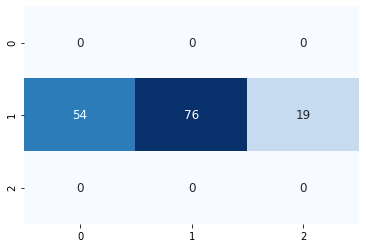

149/149 [==============================] - 0s 266us/sample - loss: 1.0119 - accuracy: 0.4966


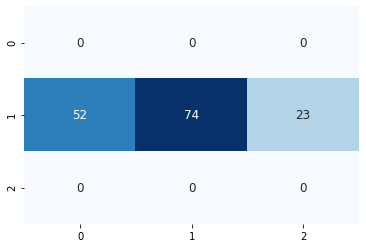

149/149 [==============================] - 0s 258us/sample - loss: 1.0495 - accuracy: 0.4899


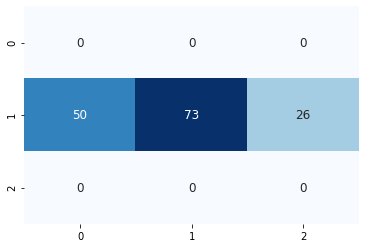

146/146 [==============================] - 0s 246us/sample - loss: 1.0705 - accuracy: 0.5342


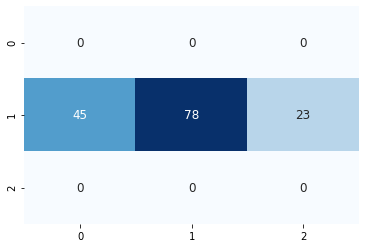

146/146 [==============================] - 0s 259us/sample - loss: 1.0803 - accuracy: 0.4521


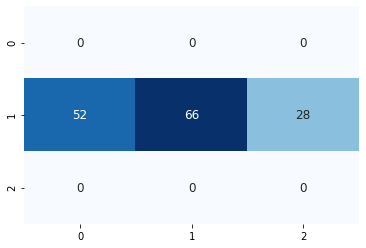

141/141 [==============================] - 0s 277us/sample - loss: 1.0656 - accuracy: 0.4468


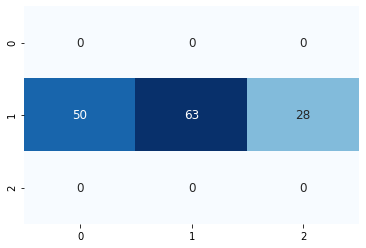

142/142 [==============================] - 0s 283us/sample - loss: 1.0447 - accuracy: 0.4718


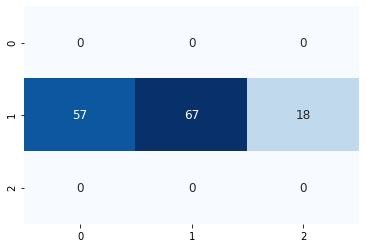

140/140 [==============================] - 0s 288us/sample - loss: 1.0743 - accuracy: 0.4857


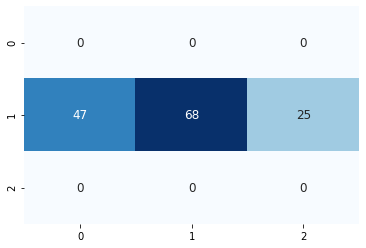

139/139 [==============================] - 0s 266us/sample - loss: 1.0487 - accuracy: 0.4748


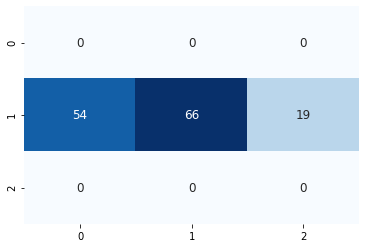

140/140 [==============================] - 0s 256us/sample - loss: 1.0574 - accuracy: 0.4857


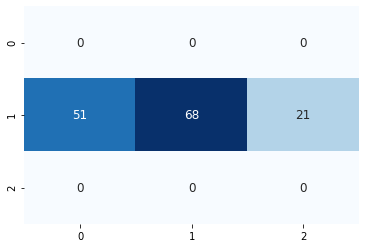

135/135 [==============================] - 0s 265us/sample - loss: 1.1850 - accuracy: 0.4815


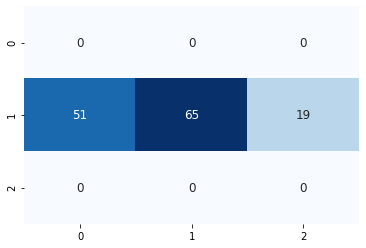

136/136 [==============================] - 0s 268us/sample - loss: 1.1467 - accuracy: 0.4706


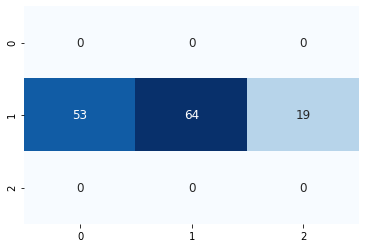

137/137 [==============================] - 0s 260us/sample - loss: 1.0135 - accuracy: 0.4745


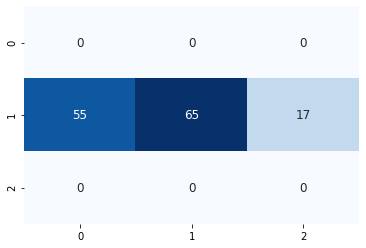

137/137 [==============================] - 0s 303us/sample - loss: 1.0660 - accuracy: 0.4818


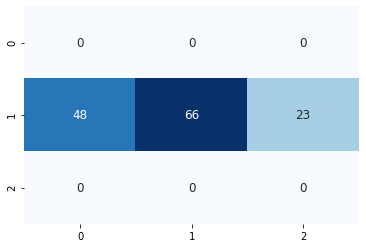

135/135 [==============================] - 0s 300us/sample - loss: 1.0672 - accuracy: 0.4741


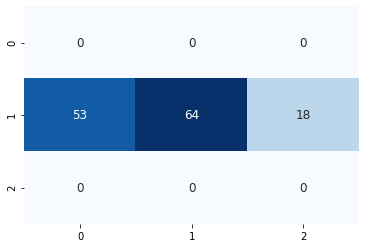

136/136 [==============================] - 0s 268us/sample - loss: 1.1049 - accuracy: 0.4412


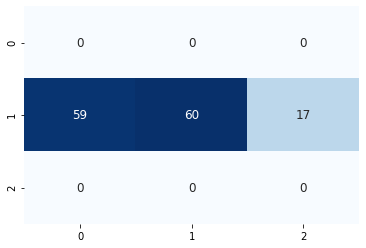

136/136 [==============================] - 0s 261us/sample - loss: 1.0500 - accuracy: 0.4706


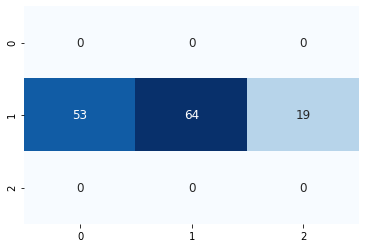

134/134 [==============================] - 0s 318us/sample - loss: 1.1482 - accuracy: 0.4627


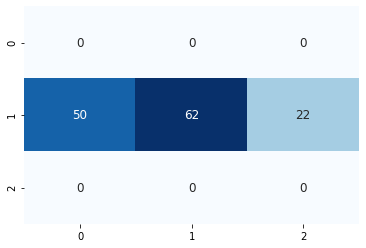

134/134 [==============================] - 0s 296us/sample - loss: 1.0536 - accuracy: 0.5149


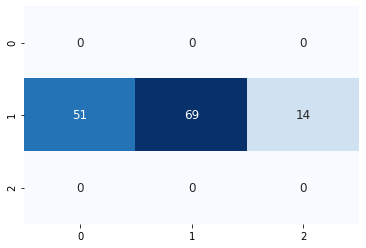

134/134 [==============================] - 0s 298us/sample - loss: 0.9962 - accuracy: 0.5373


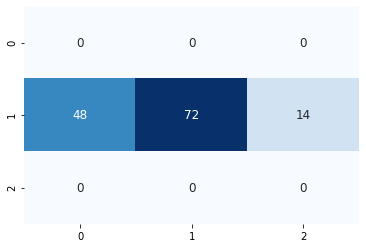

136/136 [==============================] - 0s 266us/sample - loss: 0.9455 - accuracy: 0.5515


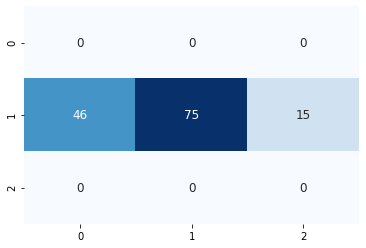

134/134 [==============================] - 0s 270us/sample - loss: 0.9458 - accuracy: 0.5299


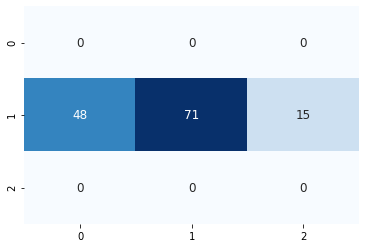

133/133 [==============================] - 0s 278us/sample - loss: 0.9778 - accuracy: 0.5263


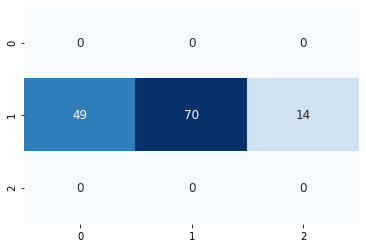

129/129 [==============================] - 0s 290us/sample - loss: 1.0237 - accuracy: 0.5116


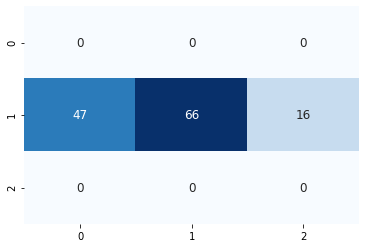

130/130 [==============================] - 0s 307us/sample - loss: 0.9819 - accuracy: 0.5538


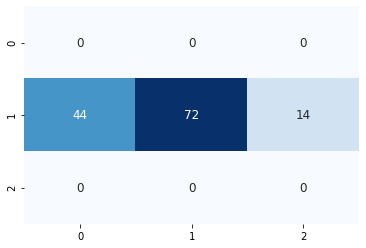

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3862 samples, validate on 1007 samples
Epoch 1/300
3862/3862 [==============================] - 3s 743us/sample - loss: 0.9573 - accuracy: 0.5419 - val_loss: 0.9982 - val_accuracy: 0.5402
Epoch 2/300
3862/3862 [==============================] - 1s 228us/sample - loss: 0.7938 - accuracy: 0.6504 - val_loss: 1.0081 - val_accuracy: 0.5432
Epoch 3/300
3862/3862 [==============================] - 1s 214us/sample - loss: 0.7062 - accuracy: 0.6965 - val_loss: 1.0322 - val_accuracy: 0.5412
Epoch 4/300
3862/3862 [==============================] - 1s 223us/sample - loss: 0.6317 - accuracy: 0.7426 - val_loss: 1.0681 - val_accuracy: 0.5462
Epoch 00004: early stopping
120/120 [==============================] - 0s 165us/sample - loss: 0.7256 - accuracy: 0.6167


14it [6:57:44, 1780.88s/it]
100%|██████████| 3/3 [00:06<00:00,  2.08s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.4453125 steps, validate for 74.890625 steps
Epoch 1/300
285/284 [==============================] - 29s 103ms/step - loss: 0.9451 - accuracy: 0.5649 - val_loss: 0.9975 - val_accuracy: 0.5460
Epoch 2/300
285/284 [==============================] - 29s 101ms/step - loss: 0.8774 - accuracy: 0.6015 - val_loss: 1.0120 - val_accuracy: 0.5441
Epoch 3/300
285/284 [==============================] - 29s 102ms/step - loss: 0.8459 - accuracy: 0.6172 - val_loss: 1.0518 - val_accuracy: 0.5185
Epoch 4/300
285/284 [==============================] - 29s 102ms/step - loss: 0.8233 - accuracy: 0.6276 - val_loss: 1.0736 - val_accuracy: 0.5286
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.4453125 steps, validate for 74.890625 steps
Epoch 1/300
285/284 [==============================] - 70s 247ms/step - loss: 0.7871 - accuracy: 0.6499 - val_loss: 1.1641 - val_accuracy:

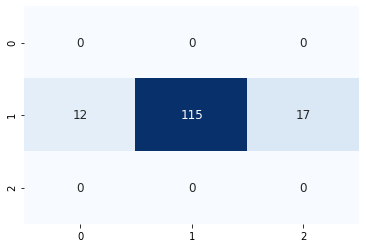

130/130 [==============================] - 0s 285us/sample - loss: 0.6835 - accuracy: 0.7077


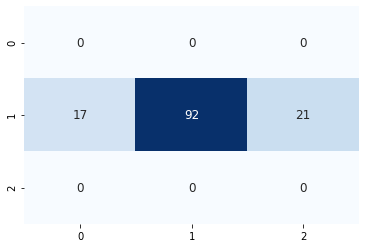

118/118 [==============================] - 0s 268us/sample - loss: 0.6132 - accuracy: 0.7797


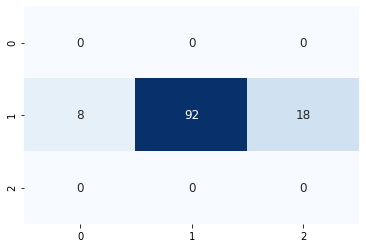

115/115 [==============================] - 0s 292us/sample - loss: 0.6504 - accuracy: 0.7304


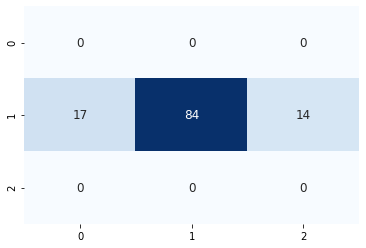

114/114 [==============================] - 0s 276us/sample - loss: 0.6665 - accuracy: 0.7018


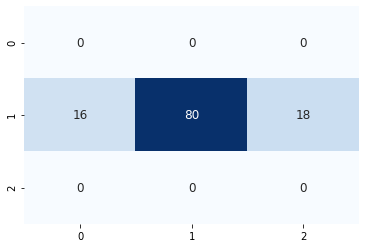

113/113 [==============================] - 0s 297us/sample - loss: 0.7626 - accuracy: 0.7257


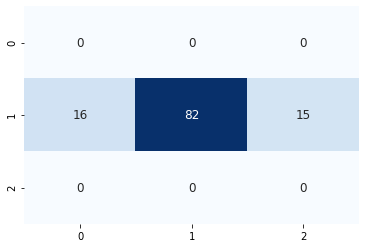

113/113 [==============================] - 0s 267us/sample - loss: 0.7242 - accuracy: 0.6814


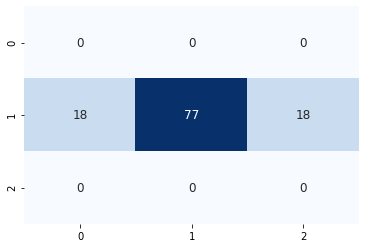

114/114 [==============================] - 0s 270us/sample - loss: 0.7553 - accuracy: 0.7281


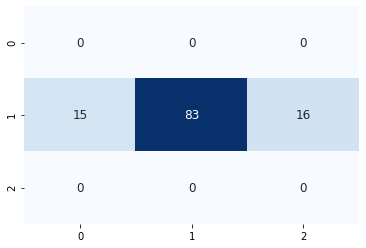

114/114 [==============================] - 0s 307us/sample - loss: 0.7103 - accuracy: 0.7193


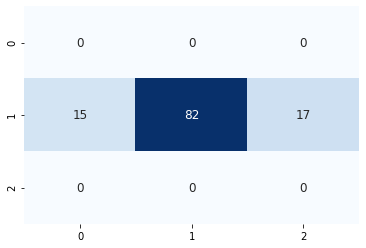

111/111 [==============================] - 0s 277us/sample - loss: 0.7459 - accuracy: 0.6937


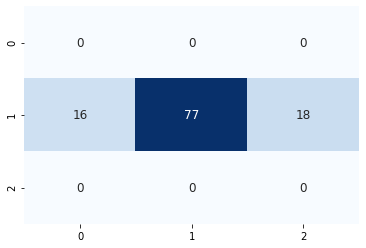

110/110 [==============================] - 0s 277us/sample - loss: 0.7474 - accuracy: 0.7091


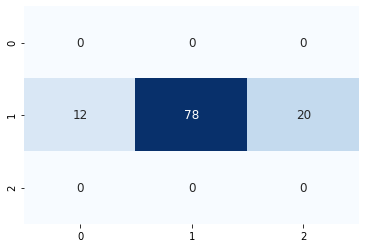

110/110 [==============================] - 0s 276us/sample - loss: 0.6624 - accuracy: 0.7091


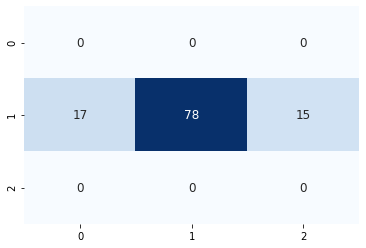

112/112 [==============================] - 0s 303us/sample - loss: 0.7756 - accuracy: 0.6786


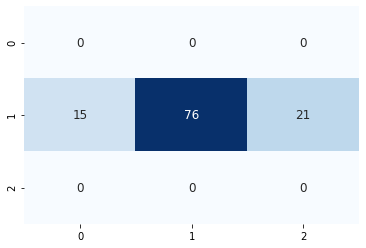

112/112 [==============================] - 0s 303us/sample - loss: 0.6532 - accuracy: 0.7232


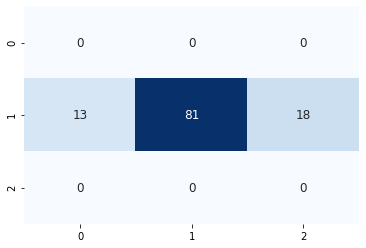

113/113 [==============================] - 0s 263us/sample - loss: 0.8821 - accuracy: 0.6549


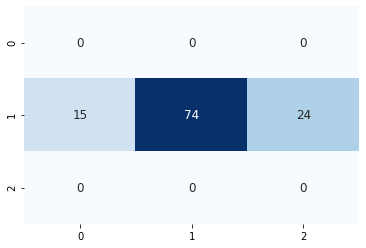

114/114 [==============================] - 0s 286us/sample - loss: 0.9407 - accuracy: 0.6754


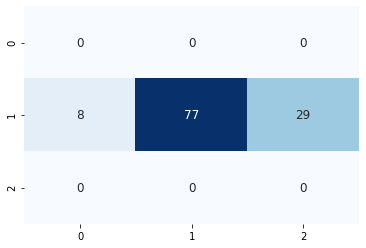

111/111 [==============================] - 0s 305us/sample - loss: 0.8559 - accuracy: 0.6757


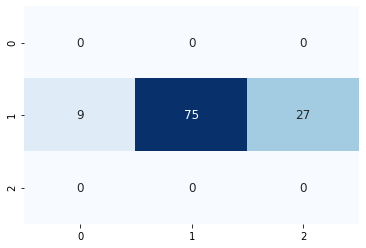

107/107 [==============================] - 0s 269us/sample - loss: 1.1315 - accuracy: 0.6168


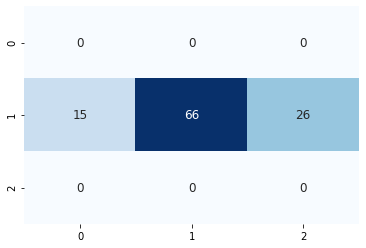

107/107 [==============================] - 0s 338us/sample - loss: 0.7594 - accuracy: 0.7477


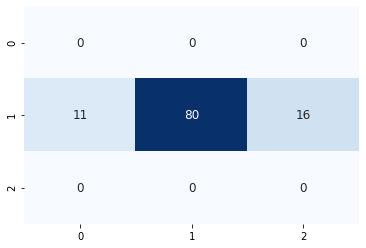

106/106 [==============================] - 0s 367us/sample - loss: 0.8222 - accuracy: 0.6792


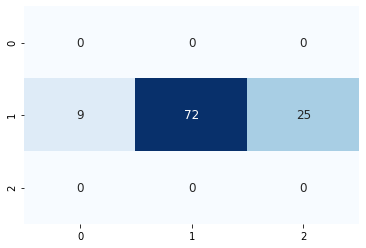

103/103 [==============================] - 0s 260us/sample - loss: 1.1715 - accuracy: 0.6408


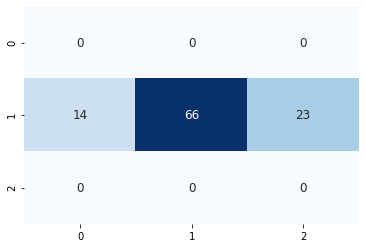

104/104 [==============================] - 0s 327us/sample - loss: 0.8572 - accuracy: 0.6731


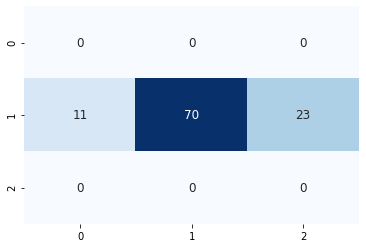

103/103 [==============================] - 0s 302us/sample - loss: 1.0382 - accuracy: 0.6893


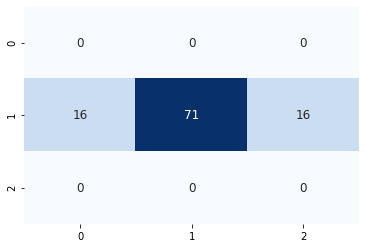

104/104 [==============================] - 0s 283us/sample - loss: 0.9053 - accuracy: 0.5962


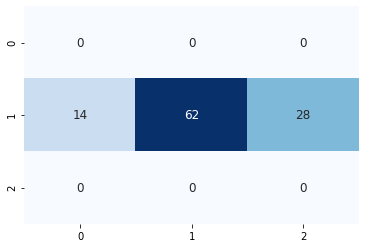

103/103 [==============================] - 0s 301us/sample - loss: 0.9175 - accuracy: 0.6311


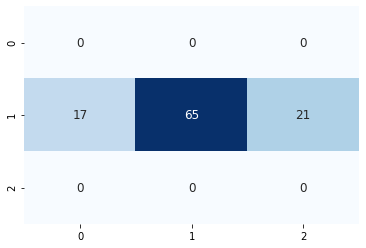

102/102 [==============================] - 0s 293us/sample - loss: 1.1585 - accuracy: 0.5784


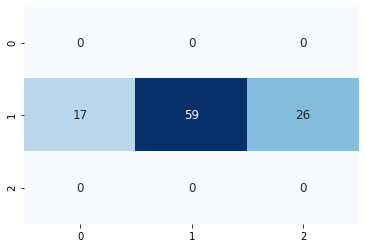

100/100 [==============================] - 0s 357us/sample - loss: 0.9606 - accuracy: 0.6100


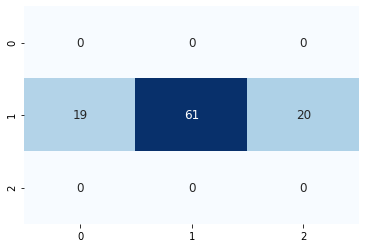

101/101 [==============================] - 0s 288us/sample - loss: 0.8296 - accuracy: 0.6337


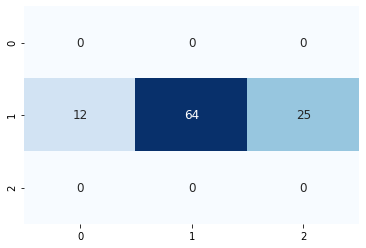

101/101 [==============================] - 0s 357us/sample - loss: 0.8914 - accuracy: 0.6337


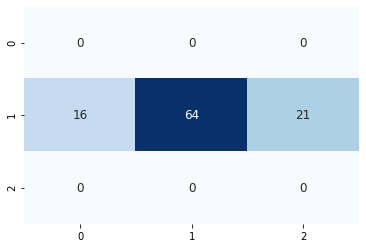

99/99 [==============================] - 0s 292us/sample - loss: 0.8403 - accuracy: 0.7071


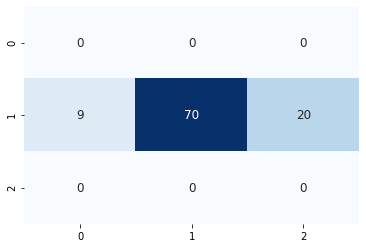

98/98 [==============================] - 0s 272us/sample - loss: 0.8679 - accuracy: 0.6939


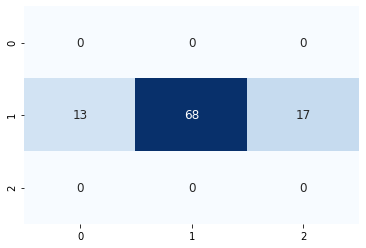

96/96 [==============================] - 0s 2ms/sample - loss: 0.8657 - accuracy: 0.6771


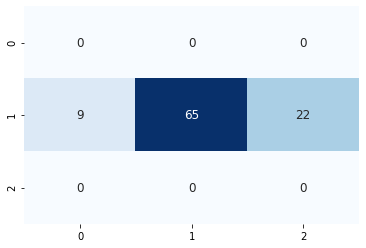

97/97 [==============================] - 0s 313us/sample - loss: 0.8064 - accuracy: 0.7010


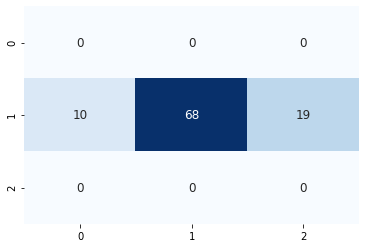

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3888 samples, validate on 1008 samples
Epoch 1/300
3888/3888 [==============================] - 2s 639us/sample - loss: 0.8959 - accuracy: 0.5885 - val_loss: 0.9844 - val_accuracy: 0.5427
Epoch 2/300
3888/3888 [==============================] - 1s 218us/sample - loss: 0.7693 - accuracy: 0.6605 - val_loss: 1.0017 - val_accuracy: 0.5397
Epoch 3/300
3888/3888 [==============================] - 1s 201us/sample - loss: 0.6802 - accuracy: 0.7178 - val_loss: 1.0349 - val_accuracy: 0.5377
Epoch 4/300
3888/3888 [==============================] - 1s 222us/sample - loss: 0.5980 - accuracy: 0.7623 - val_loss: 1.0788 - val_accuracy: 0.5397
Epoch 00004: early stopping
93/93 [==============================] - 0s 135us/sample - loss: 0.8675 - accuracy: 0.5161


15it [7:27:44, 1786.56s/it]
100%|██████████| 3/3 [00:06<00:00,  2.06s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.634765625 steps, validate for 74.767578125 steps
Epoch 1/300
284/283 [==============================] - 30s 104ms/step - loss: 0.9451 - accuracy: 0.5638 - val_loss: 1.0057 - val_accuracy: 0.5477
Epoch 2/300
284/283 [==============================] - 29s 100ms/step - loss: 0.8842 - accuracy: 0.5933 - val_loss: 1.0190 - val_accuracy: 0.5396
Epoch 3/300
284/283 [==============================] - 29s 102ms/step - loss: 0.8544 - accuracy: 0.6085 - val_loss: 1.0442 - val_accuracy: 0.5201
Epoch 4/300
284/283 [==============================] - 29s 103ms/step - loss: 0.8309 - accuracy: 0.6210 - val_loss: 1.0693 - val_accuracy: 0.5181
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.634765625 steps, validate for 74.767578125 steps
Epoch 1/300
284/283 [==============================] - 71s 248ms/step - loss: 0.7933 - accuracy: 0.6432 - val_loss: 1.1875 - val

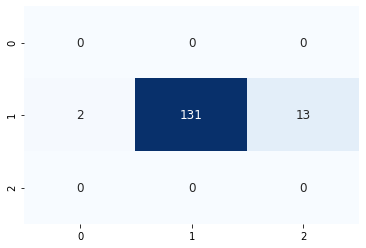

142/142 [==============================] - 0s 280us/sample - loss: 0.3395 - accuracy: 0.9014


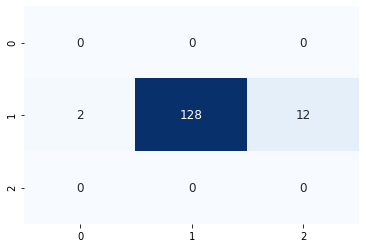

138/138 [==============================] - 0s 256us/sample - loss: 0.3631 - accuracy: 0.8478


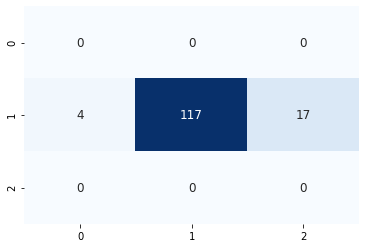

137/137 [==============================] - 0s 275us/sample - loss: 0.3477 - accuracy: 0.8978


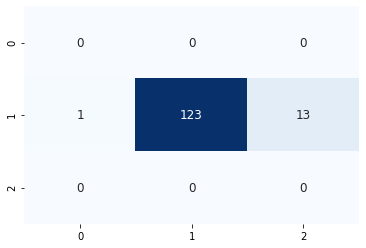

134/134 [==============================] - 0s 247us/sample - loss: 0.3297 - accuracy: 0.8806


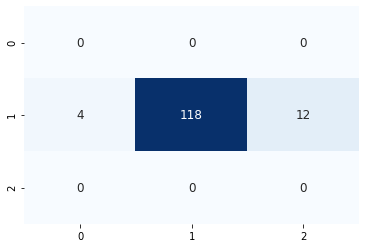

130/130 [==============================] - 0s 246us/sample - loss: 0.3306 - accuracy: 0.8846


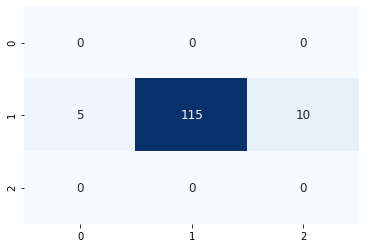

129/129 [==============================] - 0s 328us/sample - loss: 0.3066 - accuracy: 0.9147


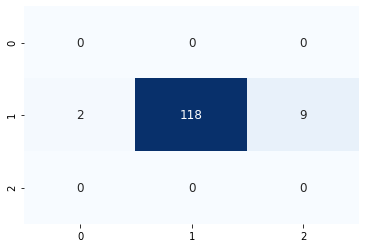

127/127 [==============================] - 0s 314us/sample - loss: 0.3337 - accuracy: 0.8976


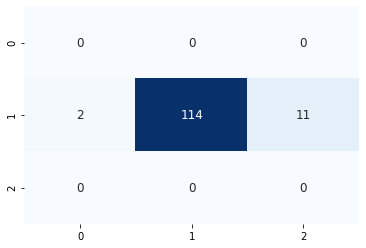

125/125 [==============================] - 0s 265us/sample - loss: 0.3219 - accuracy: 0.9040


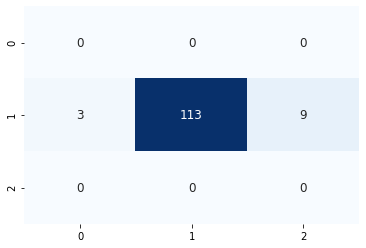

125/125 [==============================] - 0s 264us/sample - loss: 0.3048 - accuracy: 0.8720


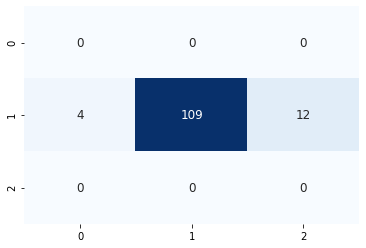

125/125 [==============================] - 0s 267us/sample - loss: 0.2978 - accuracy: 0.9200


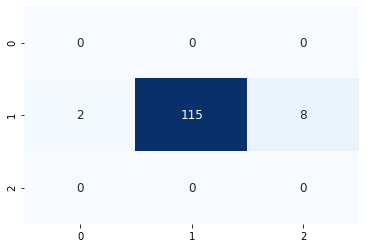

125/125 [==============================] - 0s 283us/sample - loss: 0.3034 - accuracy: 0.8960


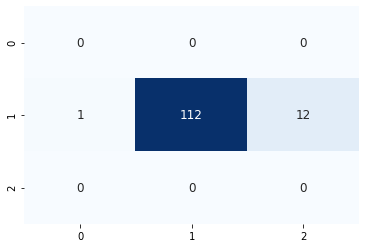

125/125 [==============================] - 0s 275us/sample - loss: 0.2885 - accuracy: 0.9040


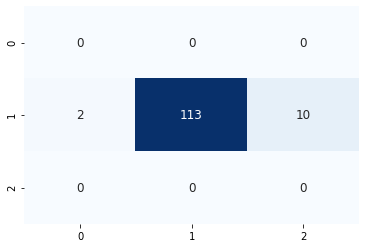

124/124 [==============================] - 0s 263us/sample - loss: 0.3405 - accuracy: 0.8790


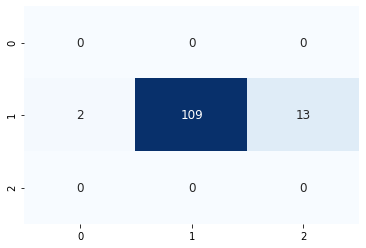

123/123 [==============================] - 0s 305us/sample - loss: 0.3445 - accuracy: 0.8374


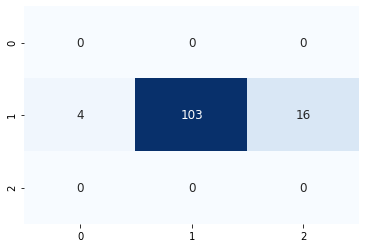

124/124 [==============================] - 0s 293us/sample - loss: 0.3085 - accuracy: 0.8871


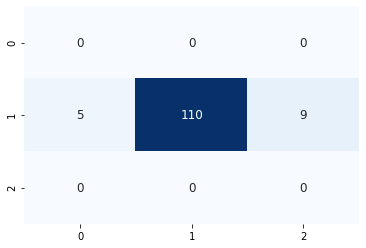

122/122 [==============================] - 0s 291us/sample - loss: 0.3028 - accuracy: 0.9098


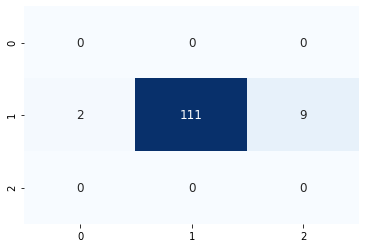

122/122 [==============================] - 0s 369us/sample - loss: 0.3089 - accuracy: 0.8934


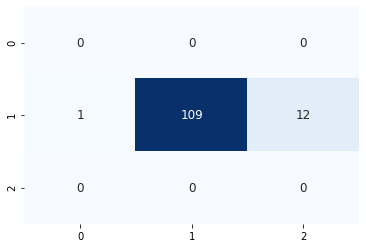

121/121 [==============================] - 0s 276us/sample - loss: 0.3071 - accuracy: 0.9174


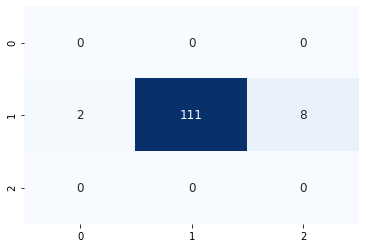

120/120 [==============================] - 0s 281us/sample - loss: 0.3486 - accuracy: 0.8750


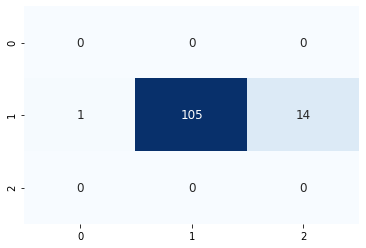

117/117 [==============================] - 0s 268us/sample - loss: 0.4009 - accuracy: 0.8547


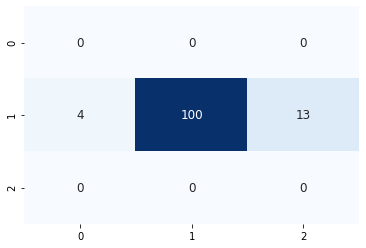

115/115 [==============================] - 0s 293us/sample - loss: 0.3798 - accuracy: 0.8696


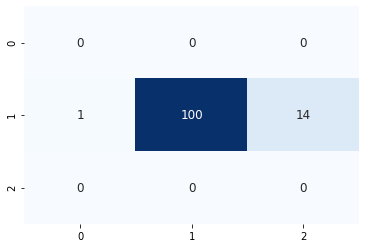

119/119 [==============================] - 0s 266us/sample - loss: 0.3146 - accuracy: 0.8908


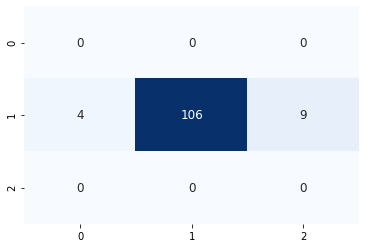

119/119 [==============================] - 0s 294us/sample - loss: 0.3163 - accuracy: 0.9076


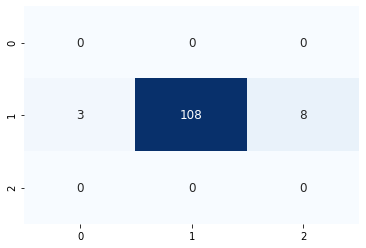

117/117 [==============================] - 0s 321us/sample - loss: 0.3302 - accuracy: 0.8803


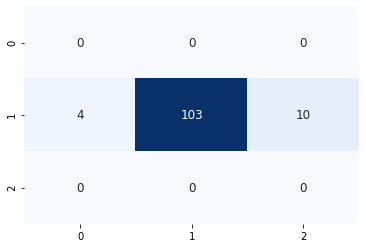

116/116 [==============================] - 0s 259us/sample - loss: 0.3309 - accuracy: 0.8707


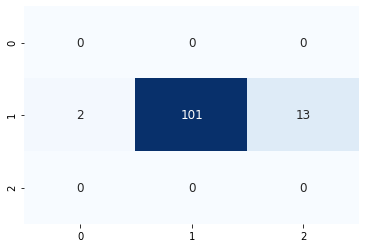

117/117 [==============================] - 0s 305us/sample - loss: 0.3779 - accuracy: 0.8462


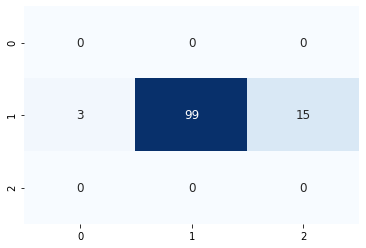

117/117 [==============================] - 0s 307us/sample - loss: 0.3710 - accuracy: 0.8632


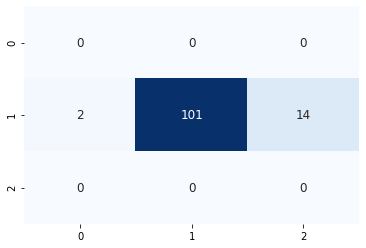

116/116 [==============================] - 0s 298us/sample - loss: 0.3447 - accuracy: 0.8448


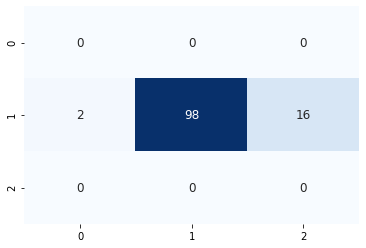

115/115 [==============================] - 0s 304us/sample - loss: 0.3175 - accuracy: 0.8870


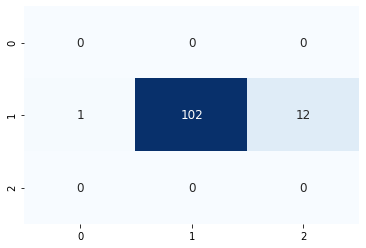

116/116 [==============================] - 0s 279us/sample - loss: 0.3187 - accuracy: 0.8707


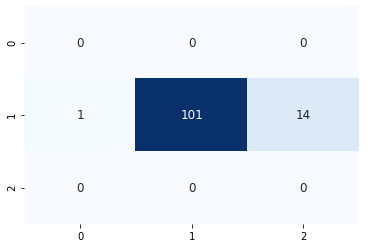

116/116 [==============================] - 0s 280us/sample - loss: 0.2590 - accuracy: 0.9397


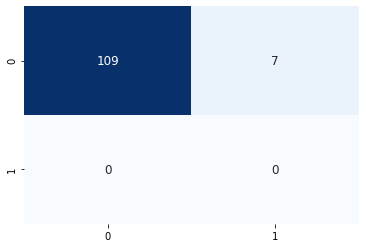

113/113 [==============================] - 0s 282us/sample - loss: 0.3199 - accuracy: 0.8761


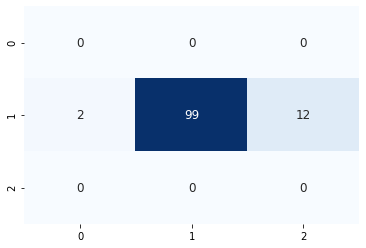

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3874 samples, validate on 1007 samples
Epoch 1/300
3874/3874 [==============================] - 3s 714us/sample - loss: 0.9358 - accuracy: 0.5620 - val_loss: 1.0098 - val_accuracy: 0.5293
Epoch 2/300
3874/3874 [==============================] - 1s 235us/sample - loss: 0.7591 - accuracy: 0.6848 - val_loss: 1.0286 - val_accuracy: 0.5194
Epoch 3/300
3874/3874 [==============================] - 1s 206us/sample - loss: 0.6446 - accuracy: 0.7499 - val_loss: 1.0707 - val_accuracy: 0.5214
Epoch 4/300
3874/3874 [==============================] - 1s 204us/sample - loss: 0.5456 - accuracy: 0.7979 - val_loss: 1.1284 - val_accuracy: 0.5223
Epoch 00004: early stopping
108/108 [==============================] - 0s 175us/sample - loss: 0.4406 - accuracy: 0.8148


16it [7:58:03, 1796.29s/it]
100%|██████████| 3/3 [00:06<00:00,  2.07s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.701171875 steps, validate for 75.18359375 steps
Epoch 1/300
284/283 [==============================] - 30s 105ms/step - loss: 0.9446 - accuracy: 0.5633 - val_loss: 0.9959 - val_accuracy: 0.5471
Epoch 2/300
284/283 [==============================] - 29s 101ms/step - loss: 0.8829 - accuracy: 0.5946 - val_loss: 1.0177 - val_accuracy: 0.5499
Epoch 3/300
284/283 [==============================] - 29s 100ms/step - loss: 0.8521 - accuracy: 0.6111 - val_loss: 1.0511 - val_accuracy: 0.5288
Epoch 4/300
284/283 [==============================] - 29s 102ms/step - loss: 0.8269 - accuracy: 0.6233 - val_loss: 1.0625 - val_accuracy: 0.5250
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.701171875 steps, validate for 75.18359375 steps
Epoch 1/300
284/283 [==============================] - 70s 247ms/step - loss: 0.7867 - accuracy: 0.6455 - val_loss: 1.1785 - val_a

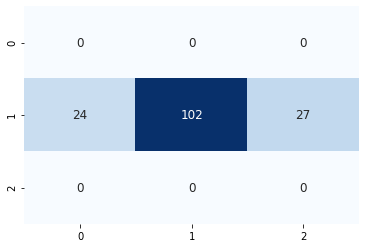

147/147 [==============================] - 0s 332us/sample - loss: 1.0041 - accuracy: 0.5850


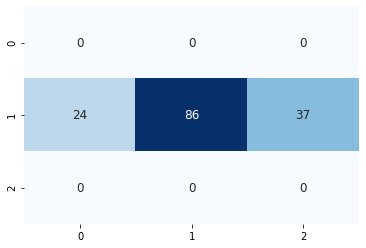

141/141 [==============================] - 0s 266us/sample - loss: 1.0067 - accuracy: 0.5816


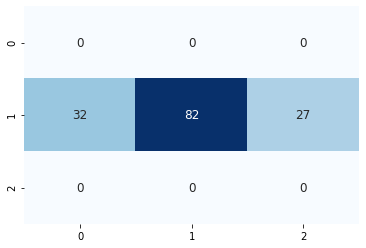

136/136 [==============================] - 0s 251us/sample - loss: 0.9901 - accuracy: 0.6176


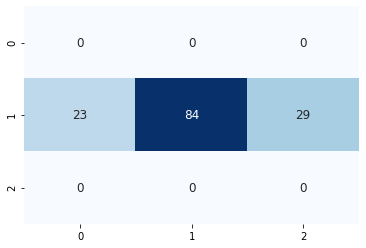

129/129 [==============================] - 0s 283us/sample - loss: 1.0027 - accuracy: 0.5271


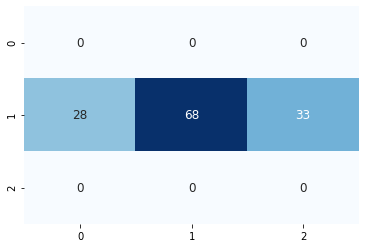

128/128 [==============================] - 0s 2ms/sample - loss: 1.1153 - accuracy: 0.5156


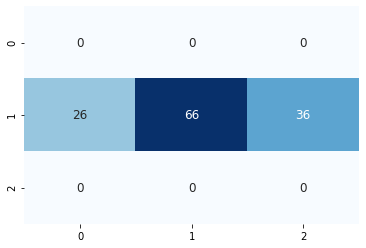

125/125 [==============================] - 0s 279us/sample - loss: 1.0724 - accuracy: 0.5120


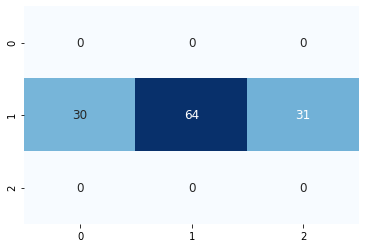

125/125 [==============================] - 0s 281us/sample - loss: 1.0833 - accuracy: 0.5200


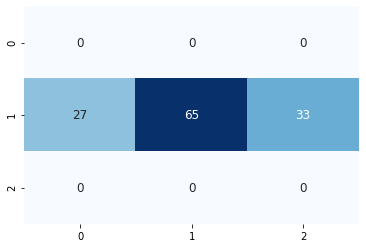

122/122 [==============================] - 0s 282us/sample - loss: 1.0886 - accuracy: 0.5492


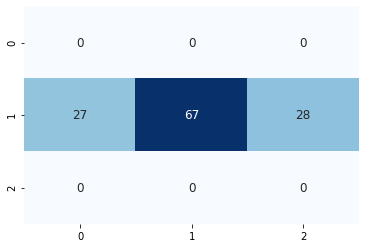

119/119 [==============================] - 0s 291us/sample - loss: 0.9543 - accuracy: 0.5546


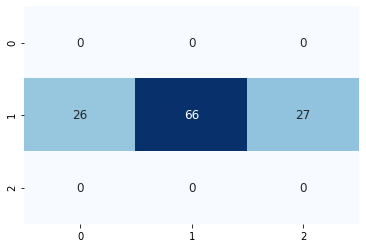

115/115 [==============================] - 0s 268us/sample - loss: 0.9930 - accuracy: 0.4957


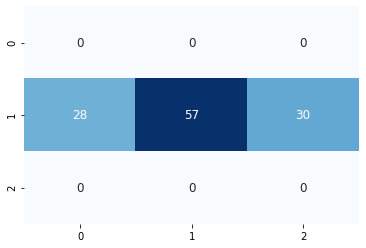

114/114 [==============================] - 0s 277us/sample - loss: 1.0886 - accuracy: 0.4474


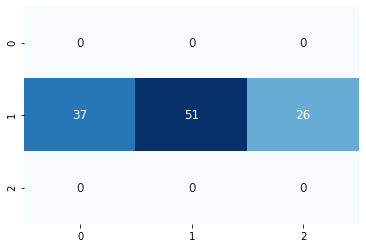

113/113 [==============================] - 0s 340us/sample - loss: 1.1454 - accuracy: 0.5044


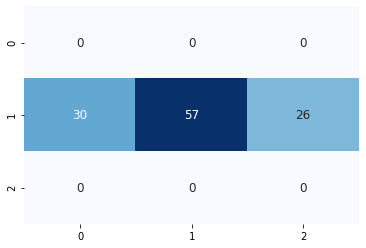

113/113 [==============================] - 0s 261us/sample - loss: 0.8033 - accuracy: 0.5575


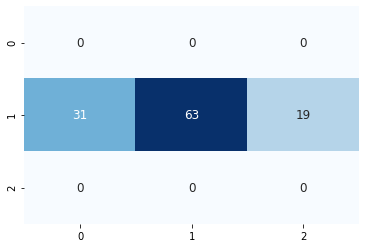

109/109 [==============================] - 0s 343us/sample - loss: 1.0519 - accuracy: 0.5321


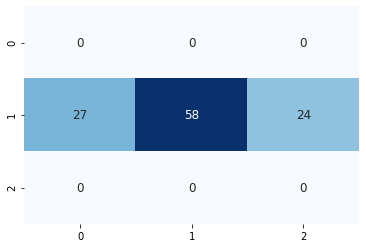

109/109 [==============================] - 0s 311us/sample - loss: 0.9489 - accuracy: 0.5321


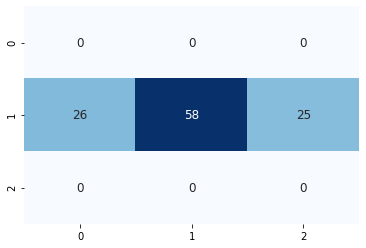

108/108 [==============================] - 0s 296us/sample - loss: 0.9558 - accuracy: 0.6204


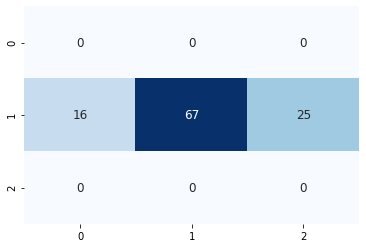

109/109 [==============================] - 0s 322us/sample - loss: 1.0444 - accuracy: 0.5688


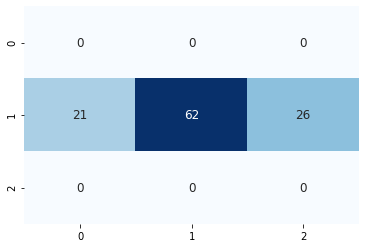

108/108 [==============================] - 0s 276us/sample - loss: 1.2820 - accuracy: 0.4722


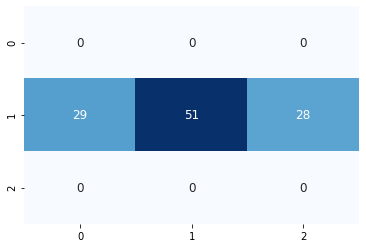

108/108 [==============================] - 0s 296us/sample - loss: 1.1710 - accuracy: 0.5278


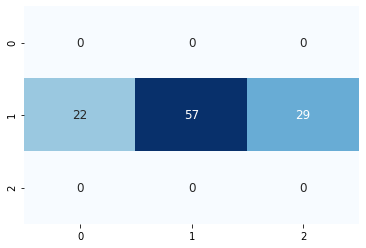

108/108 [==============================] - 0s 291us/sample - loss: 1.2627 - accuracy: 0.4815


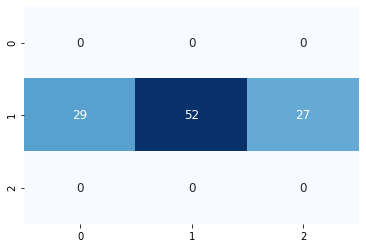

107/107 [==============================] - 0s 321us/sample - loss: 1.0373 - accuracy: 0.5701


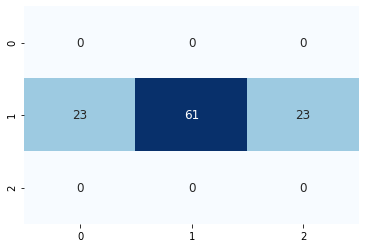

108/108 [==============================] - 0s 345us/sample - loss: 1.1738 - accuracy: 0.5556


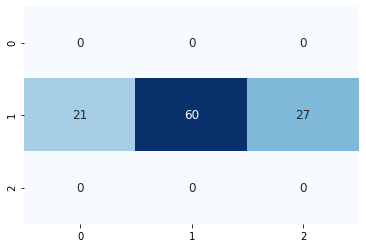

108/108 [==============================] - 0s 287us/sample - loss: 1.1968 - accuracy: 0.5370


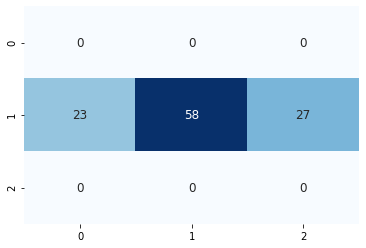

107/107 [==============================] - 0s 268us/sample - loss: 1.1656 - accuracy: 0.4673


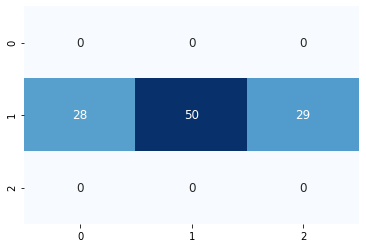

107/107 [==============================] - 0s 322us/sample - loss: 1.2812 - accuracy: 0.4953


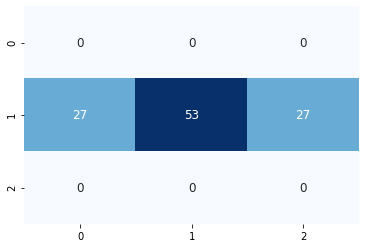

108/108 [==============================] - 0s 267us/sample - loss: 1.2370 - accuracy: 0.4630


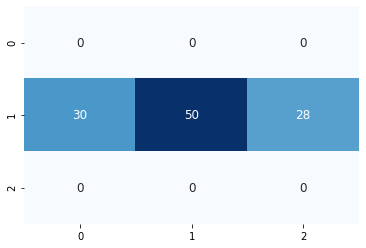

108/108 [==============================] - 0s 267us/sample - loss: 1.1301 - accuracy: 0.4630


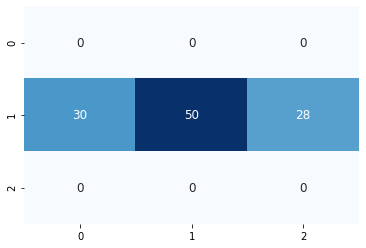

107/107 [==============================] - 0s 268us/sample - loss: 1.2492 - accuracy: 0.4206


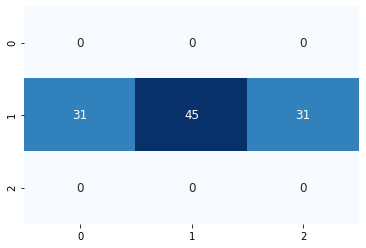

108/108 [==============================] - 0s 257us/sample - loss: 1.3310 - accuracy: 0.3981


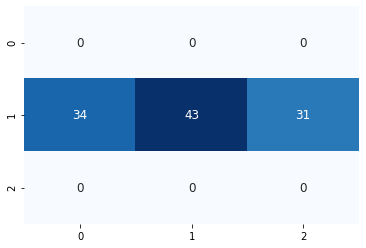

107/107 [==============================] - 0s 288us/sample - loss: 1.3369 - accuracy: 0.4673


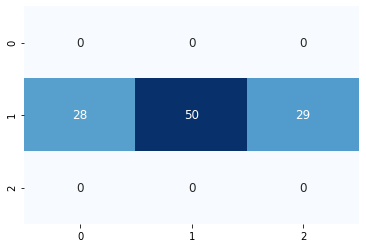

108/108 [==============================] - 0s 290us/sample - loss: 1.1185 - accuracy: 0.4907


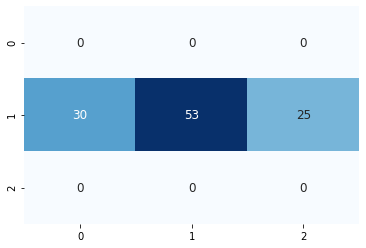

108/108 [==============================] - 0s 274us/sample - loss: 1.1101 - accuracy: 0.4630


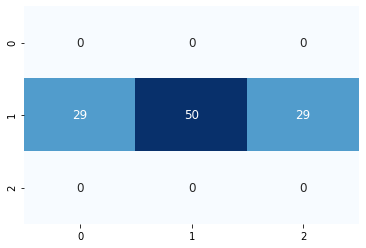

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3875 samples, validate on 1012 samples
Epoch 1/300
3875/3875 [==============================] - 3s 646us/sample - loss: 0.9666 - accuracy: 0.5265 - val_loss: 1.0593 - val_accuracy: 0.5109
Epoch 2/300
3875/3875 [==============================] - 1s 233us/sample - loss: 0.7662 - accuracy: 0.6591 - val_loss: 1.0623 - val_accuracy: 0.5217
Epoch 3/300
3875/3875 [==============================] - 1s 213us/sample - loss: 0.6562 - accuracy: 0.7306 - val_loss: 1.0788 - val_accuracy: 0.5267
Epoch 4/300
3875/3875 [==============================] - 1s 228us/sample - loss: 0.5506 - accuracy: 0.7871 - val_loss: 1.1232 - val_accuracy: 0.5168
Epoch 00004: early stopping
102/102 [==============================] - 0s 172us/sample - loss: 0.5970 - accuracy: 0.8137


17it [8:29:12, 1818.15s/it]
100%|██████████| 3/3 [00:05<00:00,  1.96s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.484375 steps, validate for 75.75390625 steps
Epoch 1/300
286/285 [==============================] - 30s 104ms/step - loss: 0.9805 - accuracy: 0.5488 - val_loss: 0.9947 - val_accuracy: 0.5530
Epoch 2/300
286/285 [==============================] - 29s 102ms/step - loss: 0.8775 - accuracy: 0.6009 - val_loss: 1.0061 - val_accuracy: 0.5521
Epoch 3/300
286/285 [==============================] - 29s 101ms/step - loss: 0.8475 - accuracy: 0.6159 - val_loss: 1.0278 - val_accuracy: 0.5424
Epoch 4/300
286/285 [==============================] - 29s 102ms/step - loss: 0.8226 - accuracy: 0.6293 - val_loss: 1.0481 - val_accuracy: 0.5352
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.484375 steps, validate for 75.75390625 steps
Epoch 1/300
286/285 [==============================] - 71s 249ms/step - loss: 0.7825 - accuracy: 0.6512 - val_loss: 1.1967 - val_accurac

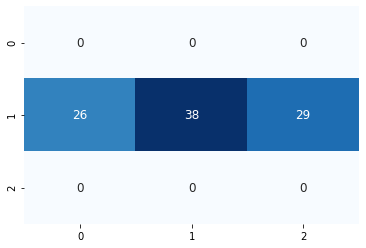

92/92 [==============================] - 0s 318us/sample - loss: 1.4461 - accuracy: 0.3913


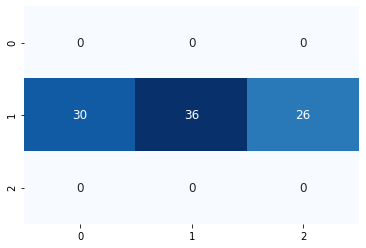

90/90 [==============================] - 0s 257us/sample - loss: 1.2330 - accuracy: 0.4778


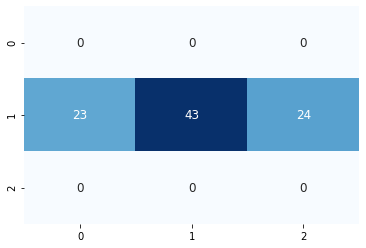

85/85 [==============================] - 0s 294us/sample - loss: 1.2603 - accuracy: 0.4824


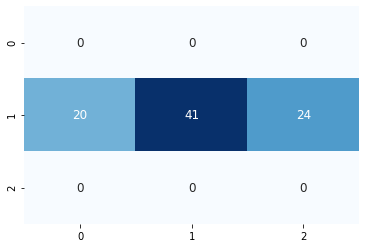

84/84 [==============================] - 0s 311us/sample - loss: 1.3114 - accuracy: 0.4643


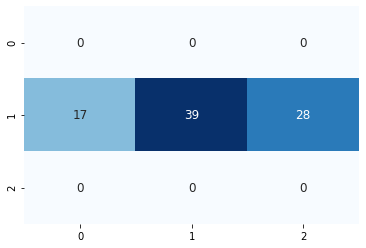

82/82 [==============================] - 0s 255us/sample - loss: 1.4228 - accuracy: 0.3659


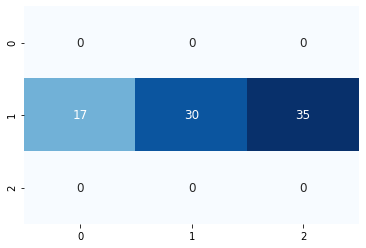

82/82 [==============================] - 0s 333us/sample - loss: 1.3825 - accuracy: 0.3659


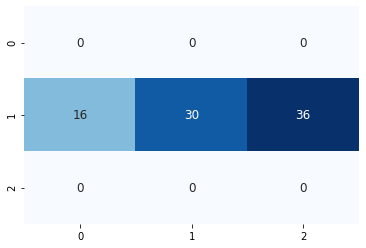

80/80 [==============================] - 0s 333us/sample - loss: 1.1688 - accuracy: 0.4250


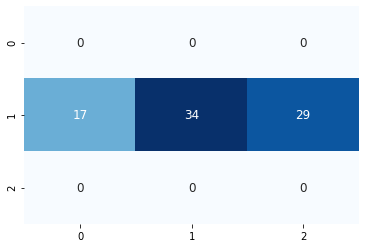

79/79 [==============================] - 0s 365us/sample - loss: 1.2687 - accuracy: 0.5316


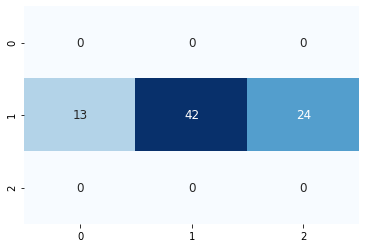

79/79 [==============================] - 0s 315us/sample - loss: 1.1523 - accuracy: 0.4557


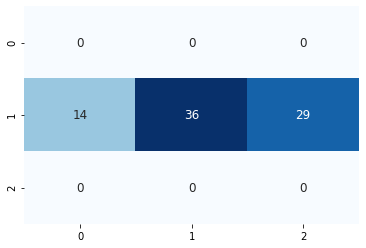

78/78 [==============================] - 0s 351us/sample - loss: 1.2195 - accuracy: 0.3974


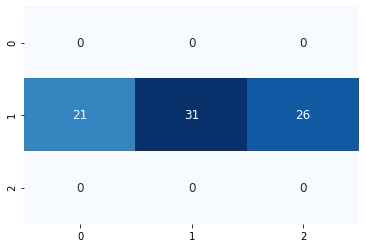

79/79 [==============================] - 0s 320us/sample - loss: 1.2944 - accuracy: 0.4177


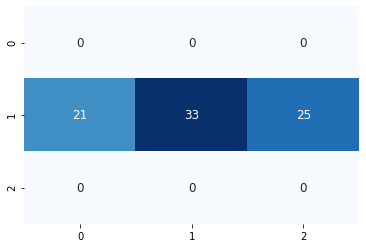

79/79 [==============================] - 0s 298us/sample - loss: 1.3154 - accuracy: 0.3165


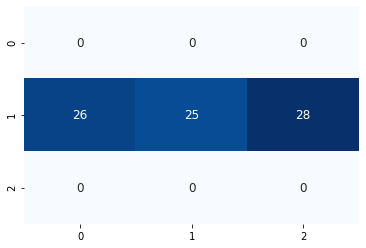

79/79 [==============================] - 0s 306us/sample - loss: 1.3183 - accuracy: 0.4051


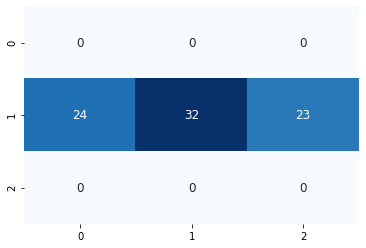

78/78 [==============================] - 0s 313us/sample - loss: 1.4364 - accuracy: 0.3462


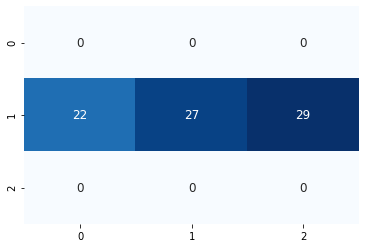

78/78 [==============================] - 0s 287us/sample - loss: 1.3335 - accuracy: 0.3846


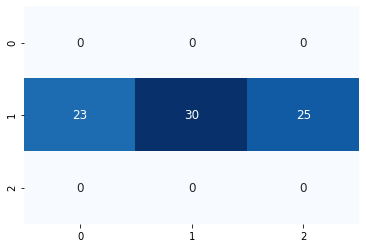

77/77 [==============================] - 0s 313us/sample - loss: 1.4575 - accuracy: 0.2857


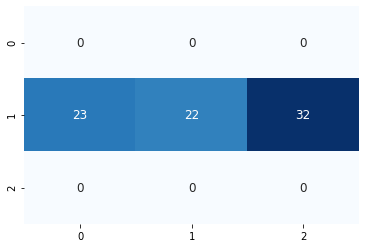

78/78 [==============================] - 0s 308us/sample - loss: 1.4522 - accuracy: 0.3333


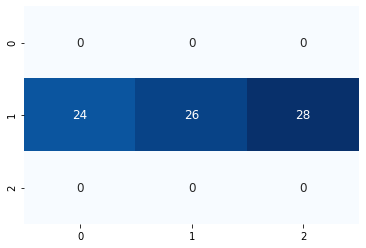

77/77 [==============================] - 0s 310us/sample - loss: 1.4141 - accuracy: 0.4156


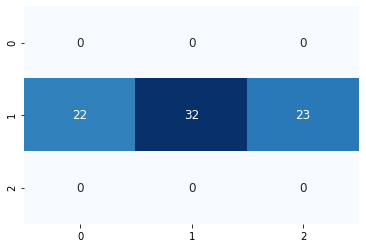

78/78 [==============================] - 0s 292us/sample - loss: 1.5148 - accuracy: 0.2949


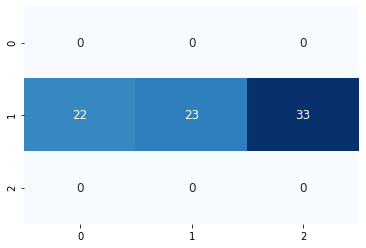

79/79 [==============================] - 0s 276us/sample - loss: 1.6332 - accuracy: 0.3165


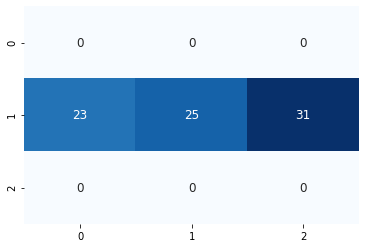

79/79 [==============================] - 0s 327us/sample - loss: 1.5794 - accuracy: 0.3418


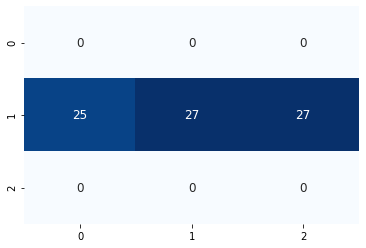

79/79 [==============================] - 0s 286us/sample - loss: 1.5962 - accuracy: 0.4557


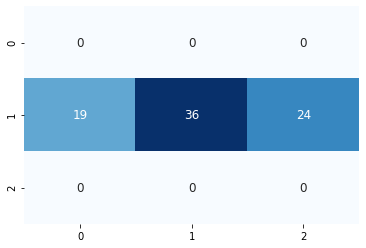

79/79 [==============================] - 0s 302us/sample - loss: 1.5362 - accuracy: 0.3671


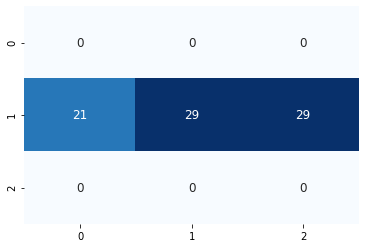

78/78 [==============================] - 0s 294us/sample - loss: 1.9348 - accuracy: 0.2179


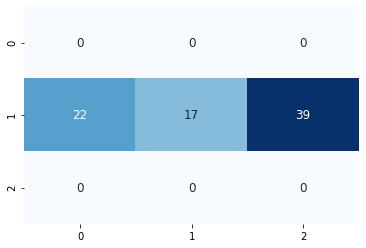

77/77 [==============================] - 0s 333us/sample - loss: 1.7623 - accuracy: 0.3117


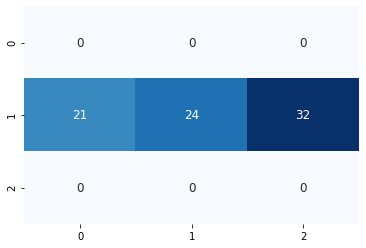

76/76 [==============================] - 0s 315us/sample - loss: 1.6116 - accuracy: 0.3553


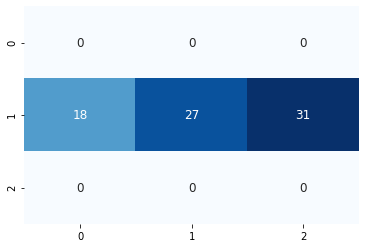

75/75 [==============================] - 0s 321us/sample - loss: 1.8392 - accuracy: 0.3467


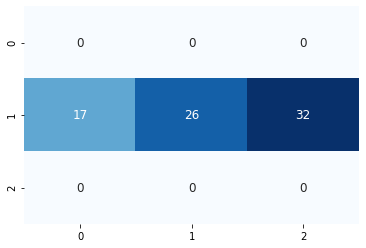

76/76 [==============================] - 0s 337us/sample - loss: 1.7482 - accuracy: 0.3026


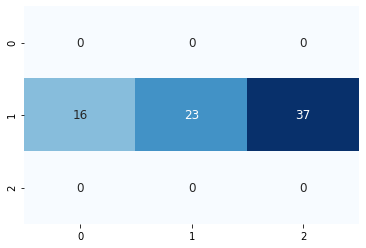

76/76 [==============================] - 0s 339us/sample - loss: 1.5593 - accuracy: 0.3553


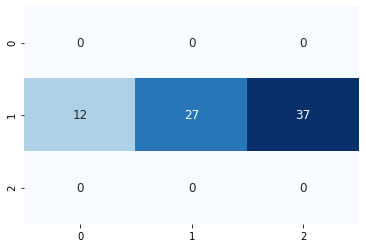

75/75 [==============================] - 0s 352us/sample - loss: 1.6139 - accuracy: 0.4000


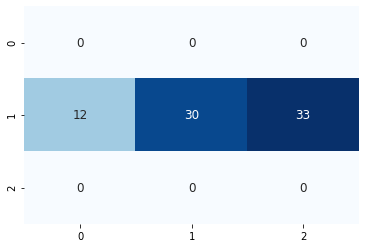

75/75 [==============================] - 0s 362us/sample - loss: 1.4989 - accuracy: 0.4000


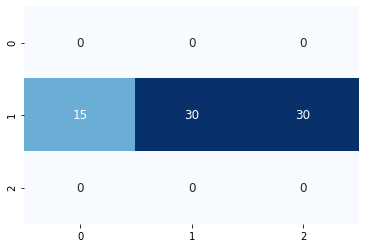

74/74 [==============================] - 0s 308us/sample - loss: 1.7135 - accuracy: 0.3378


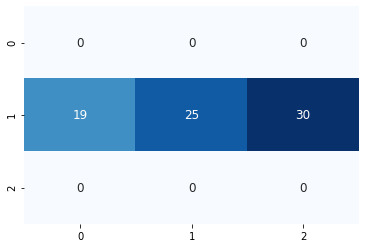

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3898 samples, validate on 1020 samples
Epoch 1/300
3898/3898 [==============================] - 3s 677us/sample - loss: 1.0156 - accuracy: 0.4967 - val_loss: 0.9889 - val_accuracy: 0.5294
Epoch 2/300
3898/3898 [==============================] - 1s 214us/sample - loss: 0.8510 - accuracy: 0.6208 - val_loss: 0.9815 - val_accuracy: 0.5363
Epoch 3/300
3898/3898 [==============================] - 1s 221us/sample - loss: 0.7659 - accuracy: 0.6711 - val_loss: 0.9901 - val_accuracy: 0.5373
Epoch 4/300
3898/3898 [==============================] - 1s 231us/sample - loss: 0.6958 - accuracy: 0.7263 - val_loss: 1.0092 - val_accuracy: 0.5294
Epoch 5/300
3898/3898 [==============================] - 1s 225us/sample - loss: 0.6267 - accuracy: 0.7630 - val_loss: 1.0402 - val_accuracy: 0.5275
Epoch 00005: early stopping
71/71 [==============================] - 0s 216us/sample - loss: 0.7316 - accuracy: 0.7183


18it [8:58:35, 1801.56s/it]
100%|██████████| 3/3 [00:06<00:00,  2.06s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 286.5234375 steps, validate for 75.51171875 steps
Epoch 1/300
287/286 [==============================] - 30s 103ms/step - loss: 0.9696 - accuracy: 0.5501 - val_loss: 1.0016 - val_accuracy: 0.5519
Epoch 2/300
287/286 [==============================] - 29s 100ms/step - loss: 0.8834 - accuracy: 0.5971 - val_loss: 1.0050 - val_accuracy: 0.5327
Epoch 3/300
287/286 [==============================] - 29s 101ms/step - loss: 0.8544 - accuracy: 0.6114 - val_loss: 1.0247 - val_accuracy: 0.5395
Epoch 4/300
287/286 [==============================] - 29s 101ms/step - loss: 0.8298 - accuracy: 0.6237 - val_loss: 1.0443 - val_accuracy: 0.5238
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 286.5234375 steps, validate for 75.51171875 steps
Epoch 1/300
287/286 [==============================] - 72s 250ms/step - loss: 0.7911 - accuracy: 0.6460 - val_loss: 1.1915 - val_accur

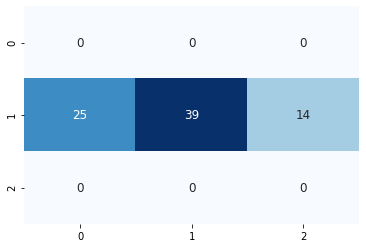

75/75 [==============================] - 0s 297us/sample - loss: 0.9959 - accuracy: 0.5067


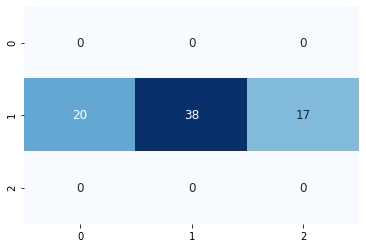

73/73 [==============================] - 0s 310us/sample - loss: 1.0157 - accuracy: 0.5205


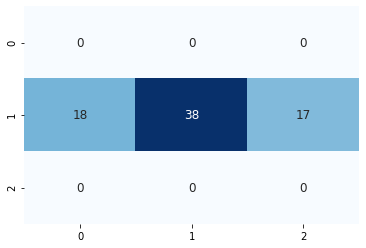

71/71 [==============================] - 0s 314us/sample - loss: 1.1048 - accuracy: 0.5070


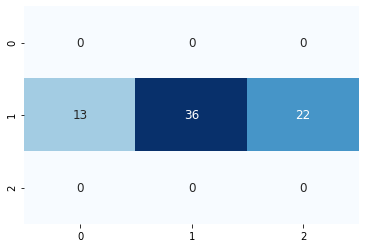

71/71 [==============================] - 0s 283us/sample - loss: 0.9243 - accuracy: 0.5775


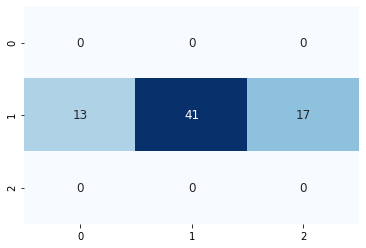

68/68 [==============================] - 0s 338us/sample - loss: 1.1818 - accuracy: 0.4706


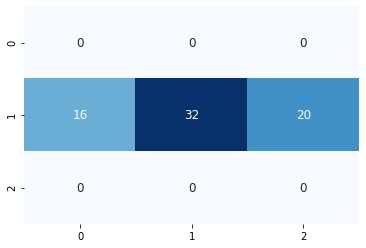

69/69 [==============================] - 0s 338us/sample - loss: 1.1284 - accuracy: 0.5217


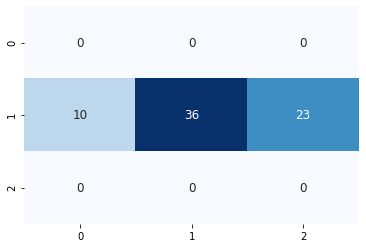

68/68 [==============================] - 0s 313us/sample - loss: 1.2279 - accuracy: 0.4706


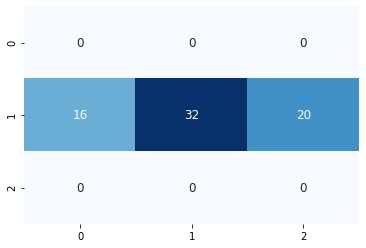

66/66 [==============================] - 0s 364us/sample - loss: 1.2096 - accuracy: 0.4545


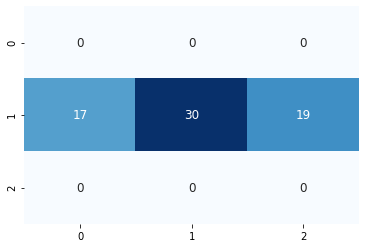

65/65 [==============================] - 0s 303us/sample - loss: 1.1028 - accuracy: 0.4769


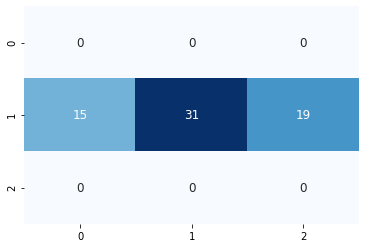

64/64 [==============================] - 0s 3ms/sample - loss: 1.2147 - accuracy: 0.5156


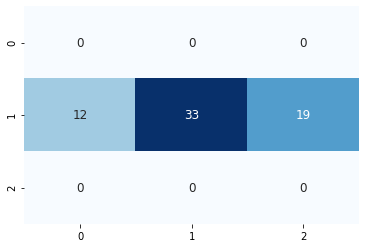

65/65 [==============================] - 0s 361us/sample - loss: 1.0114 - accuracy: 0.6154


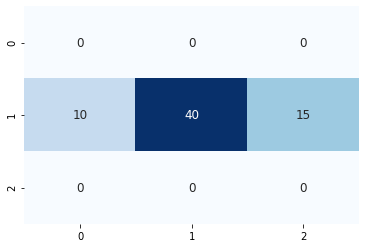

66/66 [==============================] - 0s 317us/sample - loss: 1.1806 - accuracy: 0.4091


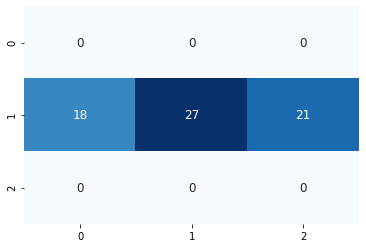

65/65 [==============================] - 0s 379us/sample - loss: 1.2370 - accuracy: 0.4154


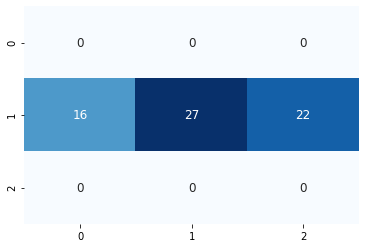

65/65 [==============================] - 0s 340us/sample - loss: 1.1300 - accuracy: 0.5077


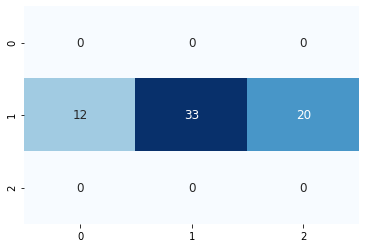

66/66 [==============================] - 0s 324us/sample - loss: 1.3408 - accuracy: 0.4545


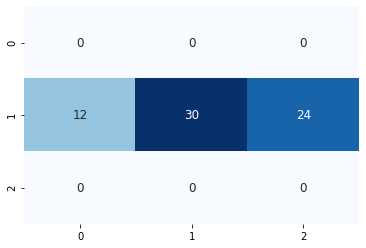

68/68 [==============================] - 0s 358us/sample - loss: 1.0934 - accuracy: 0.5147


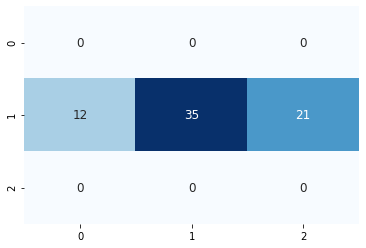

66/66 [==============================] - 0s 328us/sample - loss: 1.3932 - accuracy: 0.4091


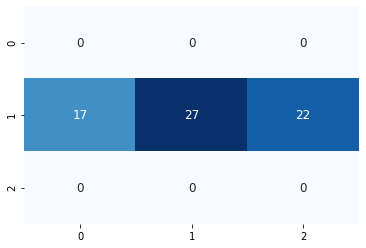

66/66 [==============================] - 0s 309us/sample - loss: 1.1288 - accuracy: 0.4697


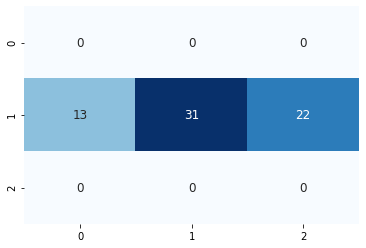

66/66 [==============================] - 0s 382us/sample - loss: 1.2641 - accuracy: 0.4697


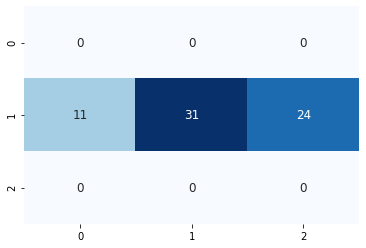

67/67 [==============================] - 0s 350us/sample - loss: 1.1487 - accuracy: 0.4776


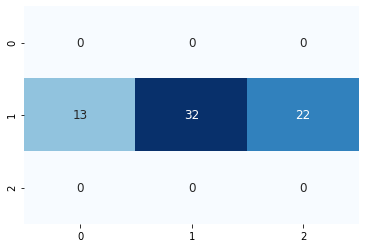

66/66 [==============================] - 0s 304us/sample - loss: 1.1666 - accuracy: 0.4242


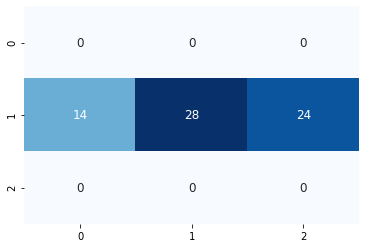

67/67 [==============================] - 0s 320us/sample - loss: 1.2000 - accuracy: 0.4627


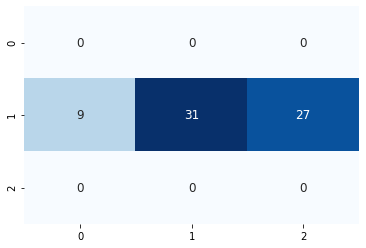

66/66 [==============================] - 0s 300us/sample - loss: 1.1963 - accuracy: 0.4697


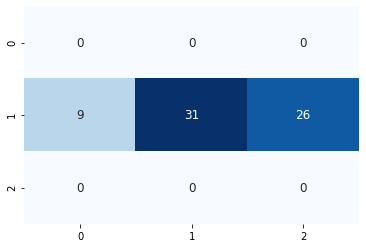

66/66 [==============================] - 0s 336us/sample - loss: 0.9726 - accuracy: 0.5303


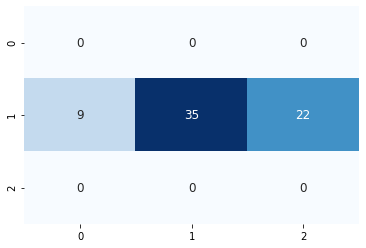

66/66 [==============================] - 0s 336us/sample - loss: 1.0970 - accuracy: 0.4848


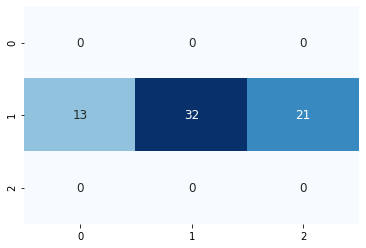

66/66 [==============================] - 0s 325us/sample - loss: 1.1519 - accuracy: 0.4848


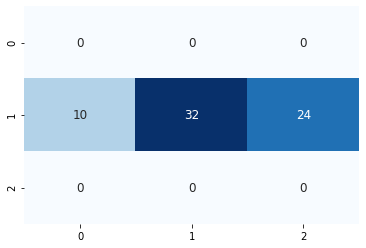

66/66 [==============================] - 0s 394us/sample - loss: 1.0480 - accuracy: 0.4848


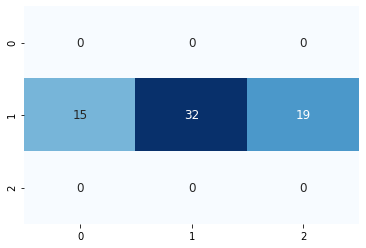

66/66 [==============================] - 0s 346us/sample - loss: 1.1931 - accuracy: 0.5000


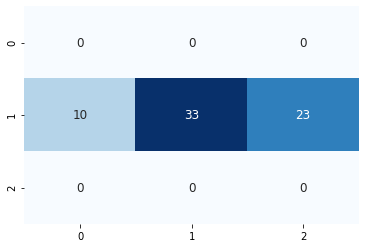

66/66 [==============================] - 0s 376us/sample - loss: 1.0976 - accuracy: 0.5303


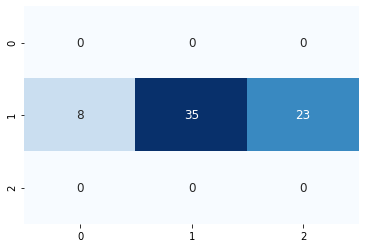

65/65 [==============================] - 0s 328us/sample - loss: 1.0818 - accuracy: 0.5538


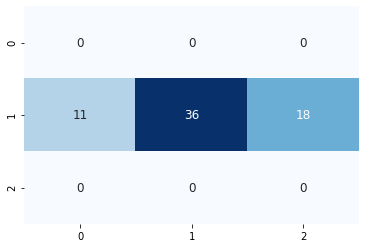

64/64 [==============================] - 0s 263us/sample - loss: 1.1283 - accuracy: 0.5000


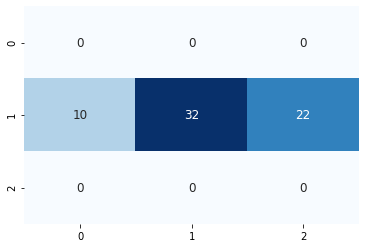

65/65 [==============================] - 0s 471us/sample - loss: 0.9999 - accuracy: 0.5385


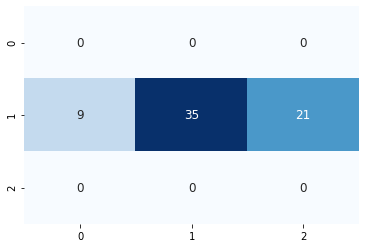

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3914 samples, validate on 1014 samples
Epoch 1/300
3914/3914 [==============================] - 3s 691us/sample - loss: 0.9354 - accuracy: 0.5376 - val_loss: 1.0171 - val_accuracy: 0.5266
Epoch 2/300
3914/3914 [==============================] - 1s 218us/sample - loss: 0.7415 - accuracy: 0.6740 - val_loss: 1.0457 - val_accuracy: 0.5217
Epoch 3/300
3914/3914 [==============================] - 1s 241us/sample - loss: 0.5947 - accuracy: 0.7629 - val_loss: 1.1165 - val_accuracy: 0.5138
Epoch 4/300
3914/3914 [==============================] - 1s 210us/sample - loss: 0.4715 - accuracy: 0.8298 - val_loss: 1.2108 - val_accuracy: 0.5108
Epoch 00004: early stopping
61/61 [==============================] - 0s 176us/sample - loss: 0.6039 - accuracy: 0.7049


19it [9:29:53, 1824.54s/it]
100%|██████████| 3/3 [00:06<00:00,  2.03s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.326171875 steps, validate for 75.744140625 steps
Epoch 1/300
283/282 [==============================] - 29s 104ms/step - loss: 0.9472 - accuracy: 0.5586 - val_loss: 0.9902 - val_accuracy: 0.5531
Epoch 2/300
283/282 [==============================] - 29s 101ms/step - loss: 0.8804 - accuracy: 0.5946 - val_loss: 1.0035 - val_accuracy: 0.5424
Epoch 3/300
283/282 [==============================] - 29s 101ms/step - loss: 0.8502 - accuracy: 0.6112 - val_loss: 1.0304 - val_accuracy: 0.5406
Epoch 4/300
283/282 [==============================] - 29s 101ms/step - loss: 0.8260 - accuracy: 0.6241 - val_loss: 1.0554 - val_accuracy: 0.5284
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.326171875 steps, validate for 75.744140625 steps
Epoch 1/300
283/282 [==============================] - 70s 249ms/step - loss: 0.7898 - accuracy: 0.6439 - val_loss: 1.2622 - val

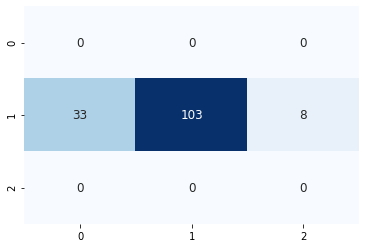

142/142 [==============================] - 0s 231us/sample - loss: 0.6689 - accuracy: 0.6690


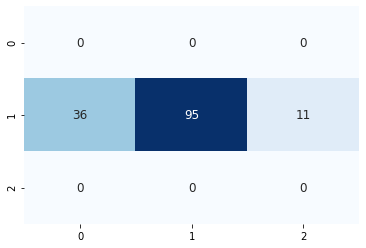

137/137 [==============================] - 0s 340us/sample - loss: 0.6517 - accuracy: 0.7299


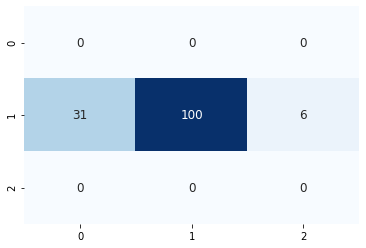

134/134 [==============================] - 0s 267us/sample - loss: 0.6809 - accuracy: 0.6493


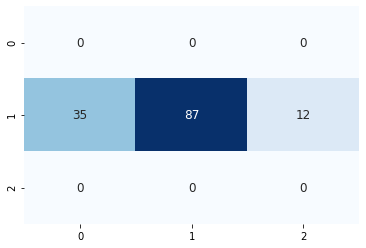

135/135 [==============================] - 0s 244us/sample - loss: 0.6299 - accuracy: 0.7333


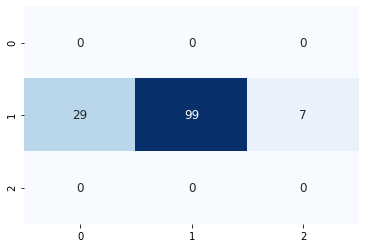

134/134 [==============================] - 0s 292us/sample - loss: 0.6209 - accuracy: 0.7164


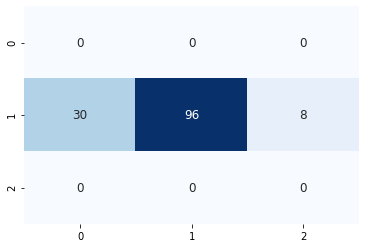

135/135 [==============================] - 0s 274us/sample - loss: 0.6397 - accuracy: 0.7333


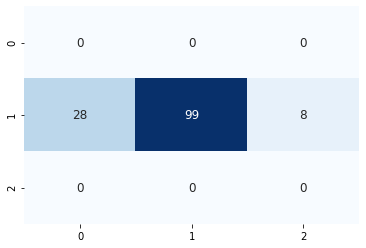

136/136 [==============================] - 0s 266us/sample - loss: 0.6187 - accuracy: 0.6838


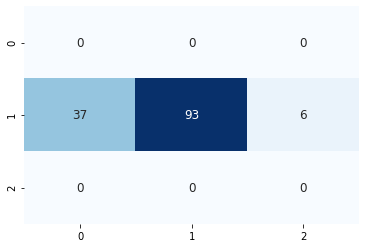

138/138 [==============================] - 0s 305us/sample - loss: 0.5997 - accuracy: 0.6957


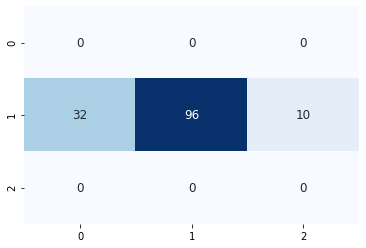

134/134 [==============================] - 0s 321us/sample - loss: 0.5840 - accuracy: 0.7836


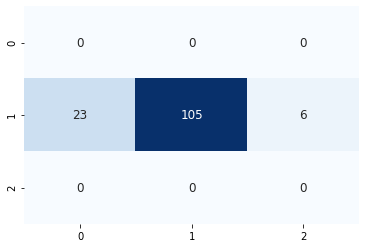

131/131 [==============================] - 0s 273us/sample - loss: 0.6360 - accuracy: 0.6794


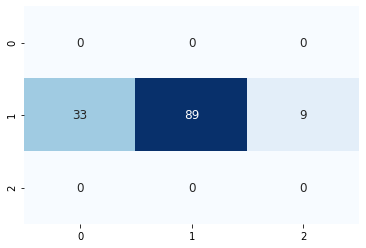

129/129 [==============================] - 0s 309us/sample - loss: 0.5466 - accuracy: 0.7829


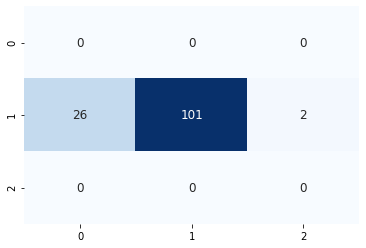

129/129 [==============================] - 0s 284us/sample - loss: 0.6047 - accuracy: 0.7442


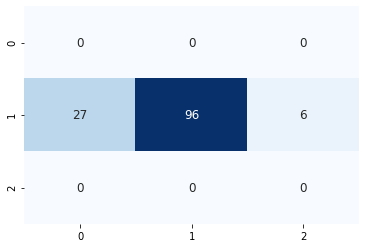

129/129 [==============================] - 0s 285us/sample - loss: 0.5718 - accuracy: 0.7674


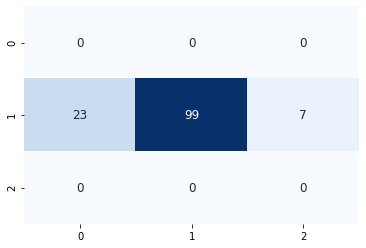

130/130 [==============================] - 0s 344us/sample - loss: 0.5186 - accuracy: 0.7846


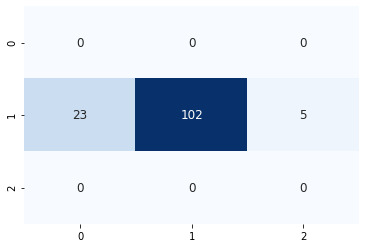

128/128 [==============================] - 0s 2ms/sample - loss: 0.5535 - accuracy: 0.7500


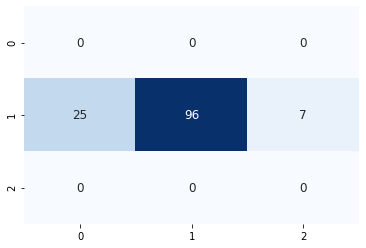

127/127 [==============================] - 0s 248us/sample - loss: 0.5315 - accuracy: 0.7638


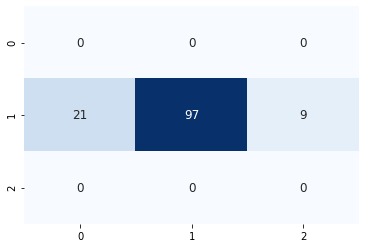

127/127 [==============================] - 0s 268us/sample - loss: 0.6088 - accuracy: 0.7480


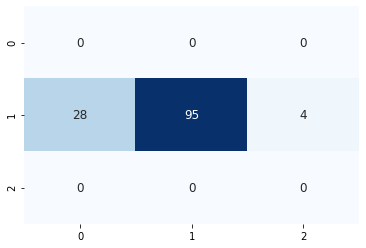

127/127 [==============================] - 0s 279us/sample - loss: 0.5679 - accuracy: 0.7717


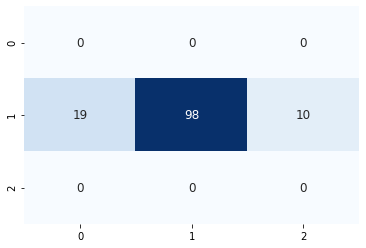

126/126 [==============================] - 0s 264us/sample - loss: 0.5588 - accuracy: 0.8016


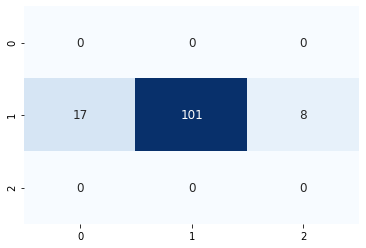

125/125 [==============================] - 0s 269us/sample - loss: 0.5059 - accuracy: 0.8240


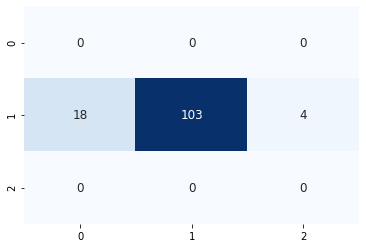

125/125 [==============================] - 0s 285us/sample - loss: 0.5450 - accuracy: 0.7920


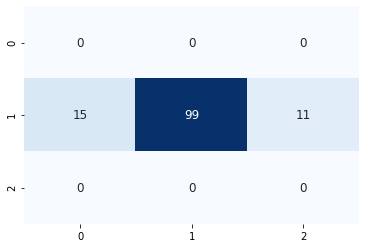

124/124 [==============================] - 0s 271us/sample - loss: 0.5473 - accuracy: 0.7823


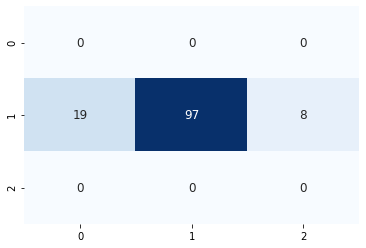

123/123 [==============================] - 0s 266us/sample - loss: 0.5071 - accuracy: 0.7967


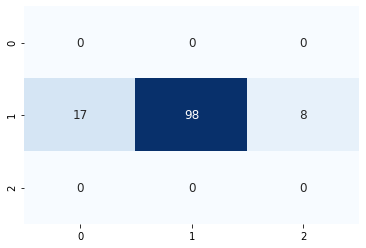

122/122 [==============================] - 0s 255us/sample - loss: 0.4803 - accuracy: 0.7869


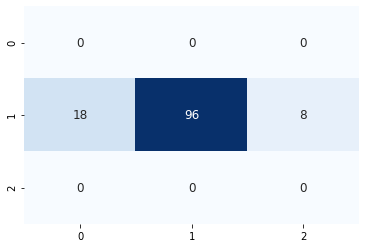

122/122 [==============================] - 0s 251us/sample - loss: 0.5630 - accuracy: 0.6885


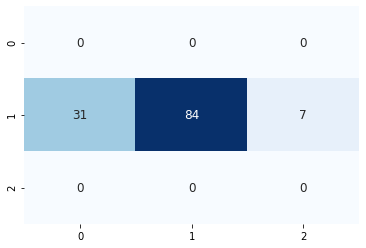

120/120 [==============================] - 0s 274us/sample - loss: 0.5673 - accuracy: 0.7917


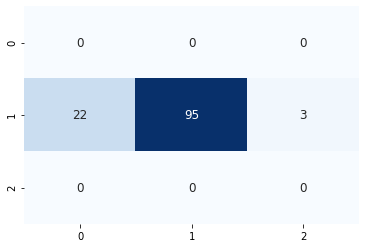

123/123 [==============================] - 0s 253us/sample - loss: 0.5136 - accuracy: 0.7561


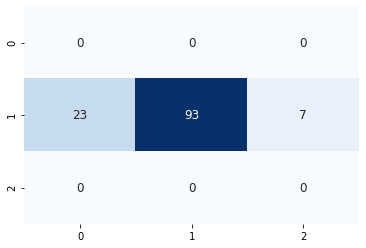

121/121 [==============================] - 0s 266us/sample - loss: 0.5477 - accuracy: 0.7603


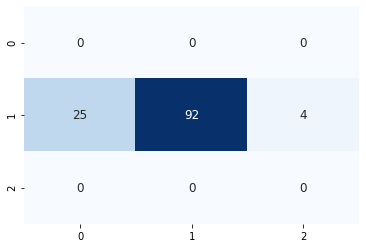

123/123 [==============================] - 0s 254us/sample - loss: 0.5384 - accuracy: 0.7724


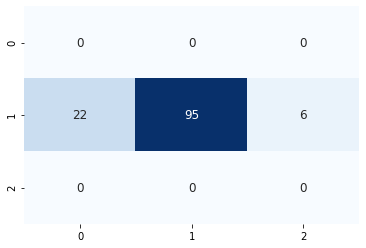

123/123 [==============================] - 0s 273us/sample - loss: 0.5290 - accuracy: 0.7642


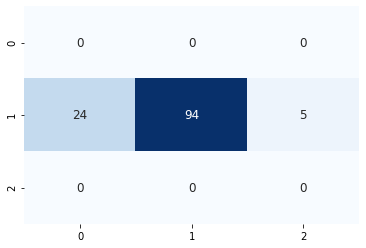

122/122 [==============================] - 0s 298us/sample - loss: 0.4896 - accuracy: 0.8115


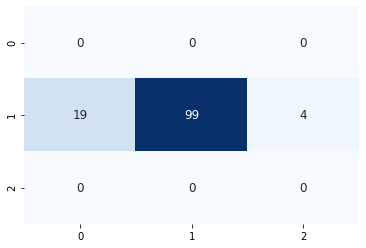

122/122 [==============================] - 0s 270us/sample - loss: 0.4462 - accuracy: 0.8197


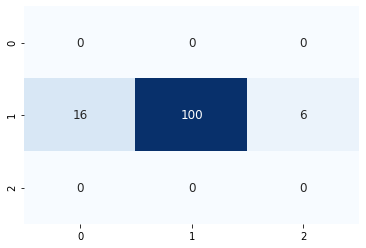

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3858 samples, validate on 1019 samples
Epoch 1/300
3858/3858 [==============================] - 2s 644us/sample - loss: 0.9285 - accuracy: 0.5550 - val_loss: 1.0173 - val_accuracy: 0.5270
Epoch 2/300
3858/3858 [==============================] - 1s 214us/sample - loss: 0.7252 - accuracy: 0.7009 - val_loss: 1.0591 - val_accuracy: 0.5103
Epoch 3/300
3858/3858 [==============================] - 1s 199us/sample - loss: 0.5822 - accuracy: 0.7797 - val_loss: 1.1462 - val_accuracy: 0.4995
Epoch 4/300
3858/3858 [==============================] - 1s 221us/sample - loss: 0.4730 - accuracy: 0.8393 - val_loss: 1.2441 - val_accuracy: 0.4975
Epoch 00004: early stopping
112/112 [==============================] - 0s 160us/sample - loss: 0.5514 - accuracy: 0.7411


20it [10:00:22, 1825.88s/it]
100%|██████████| 3/3 [00:06<00:00,  2.14s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.234375 steps, validate for 74.283203125 steps
Epoch 1/300
285/284 [==============================] - 30s 106ms/step - loss: 0.9401 - accuracy: 0.5658 - val_loss: 1.0116 - val_accuracy: 0.5472
Epoch 2/300
285/284 [==============================] - 29s 102ms/step - loss: 0.8791 - accuracy: 0.5982 - val_loss: 1.0234 - val_accuracy: 0.5401
Epoch 3/300
285/284 [==============================] - 29s 103ms/step - loss: 0.8487 - accuracy: 0.6133 - val_loss: 1.0472 - val_accuracy: 0.5197
Epoch 4/300
285/284 [==============================] - 29s 102ms/step - loss: 0.8249 - accuracy: 0.6258 - val_loss: 1.0652 - val_accuracy: 0.5296
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.234375 steps, validate for 74.283203125 steps
Epoch 1/300
285/284 [==============================] - 70s 247ms/step - loss: 0.7860 - accuracy: 0.6502 - val_loss: 1.2071 - val_accur

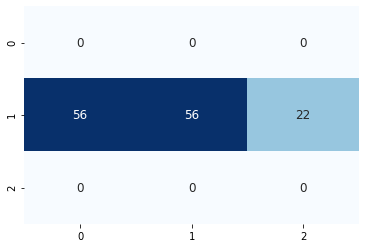

131/131 [==============================] - 0s 247us/sample - loss: 1.2703 - accuracy: 0.4122


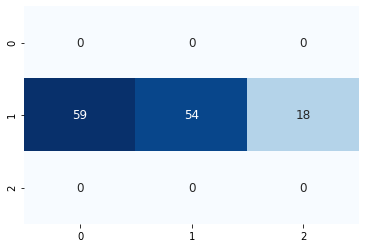

125/125 [==============================] - 0s 264us/sample - loss: 1.5032 - accuracy: 0.3280


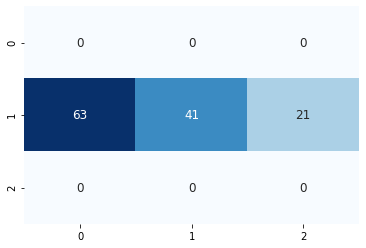

125/125 [==============================] - 0s 231us/sample - loss: 1.3545 - accuracy: 0.3200


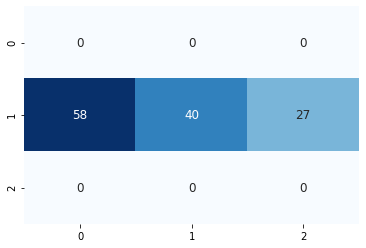

126/126 [==============================] - 0s 231us/sample - loss: 1.4830 - accuracy: 0.3175


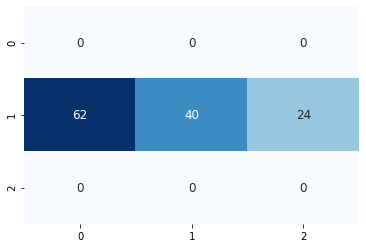

126/126 [==============================] - 0s 261us/sample - loss: 1.5195 - accuracy: 0.3095


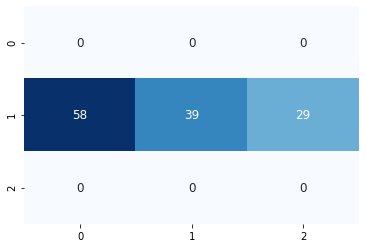

126/126 [==============================] - 0s 244us/sample - loss: 1.4577 - accuracy: 0.3571


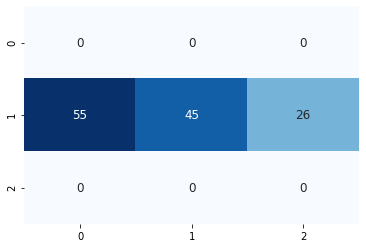

123/123 [==============================] - 0s 327us/sample - loss: 1.4251 - accuracy: 0.3496


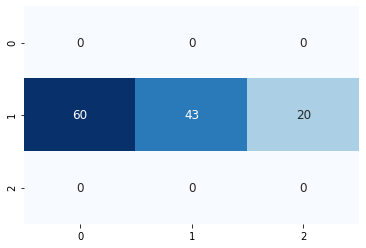

124/124 [==============================] - 0s 269us/sample - loss: 1.4347 - accuracy: 0.3790


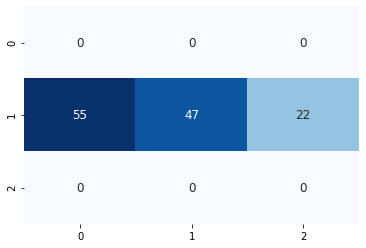

123/123 [==============================] - 0s 275us/sample - loss: 1.3986 - accuracy: 0.3902


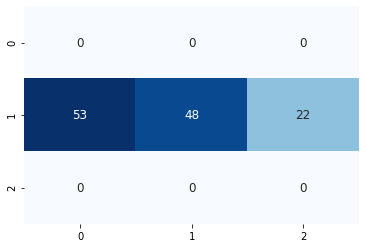

124/124 [==============================] - 0s 268us/sample - loss: 1.3950 - accuracy: 0.3952


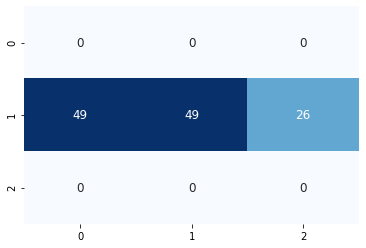

124/124 [==============================] - 0s 248us/sample - loss: 1.4174 - accuracy: 0.3871


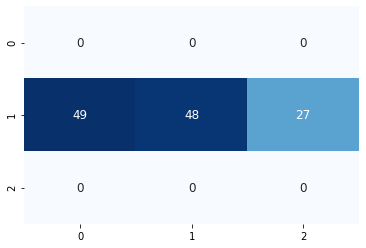

123/123 [==============================] - 0s 273us/sample - loss: 1.4486 - accuracy: 0.3984


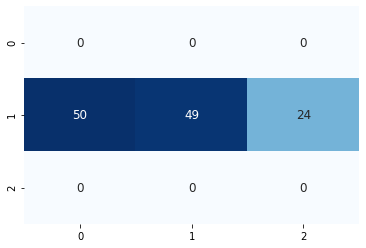

120/120 [==============================] - 0s 307us/sample - loss: 1.4992 - accuracy: 0.3833


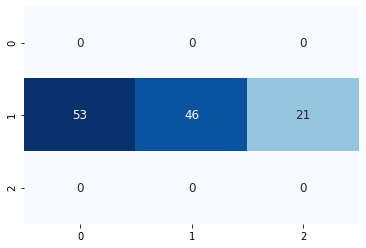

121/121 [==============================] - 0s 299us/sample - loss: 1.4143 - accuracy: 0.3967


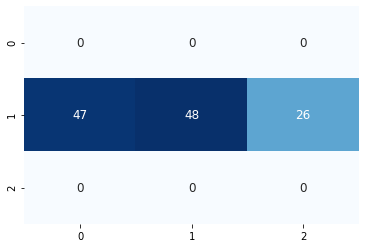

121/121 [==============================] - 0s 275us/sample - loss: 1.3936 - accuracy: 0.3884


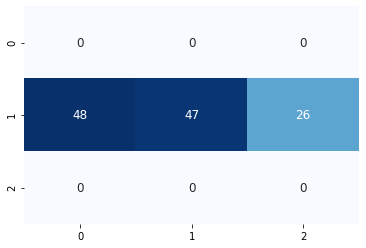

121/121 [==============================] - 0s 269us/sample - loss: 1.4135 - accuracy: 0.3802


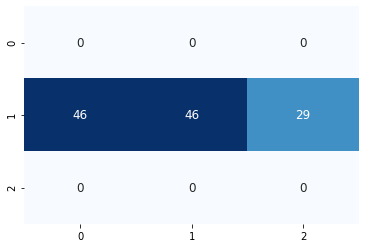

120/120 [==============================] - 0s 323us/sample - loss: 1.4211 - accuracy: 0.3417


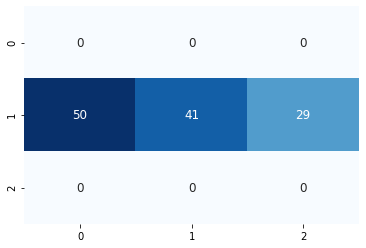

121/121 [==============================] - 0s 300us/sample - loss: 1.2801 - accuracy: 0.4380


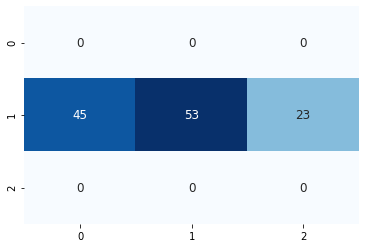

120/120 [==============================] - 0s 292us/sample - loss: 1.4232 - accuracy: 0.3500


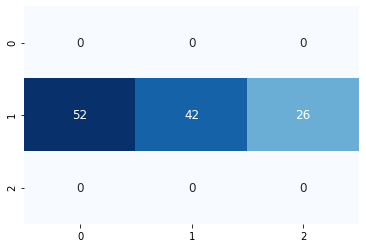

120/120 [==============================] - 0s 250us/sample - loss: 1.3868 - accuracy: 0.4333


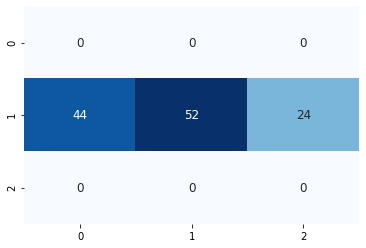

119/119 [==============================] - 0s 303us/sample - loss: 1.3845 - accuracy: 0.3361


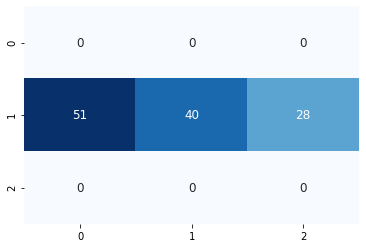

119/119 [==============================] - 0s 297us/sample - loss: 1.4615 - accuracy: 0.3445


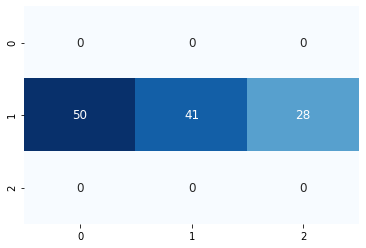

119/119 [==============================] - 0s 294us/sample - loss: 1.4184 - accuracy: 0.4286


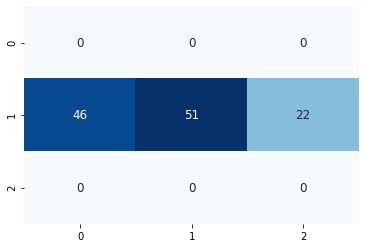

119/119 [==============================] - 0s 272us/sample - loss: 1.3919 - accuracy: 0.3025


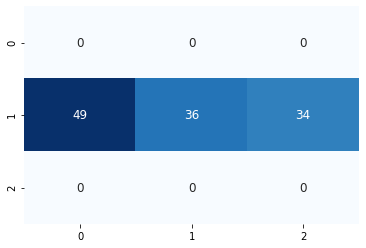

118/118 [==============================] - 0s 285us/sample - loss: 1.3058 - accuracy: 0.4068


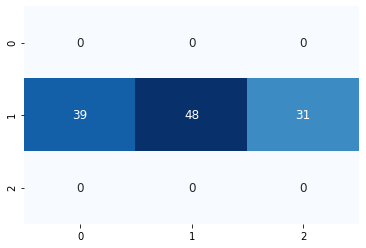

117/117 [==============================] - 0s 259us/sample - loss: 1.2446 - accuracy: 0.3675


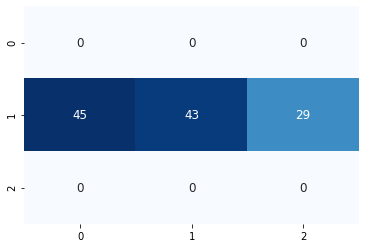

118/118 [==============================] - 0s 275us/sample - loss: 1.3150 - accuracy: 0.3983


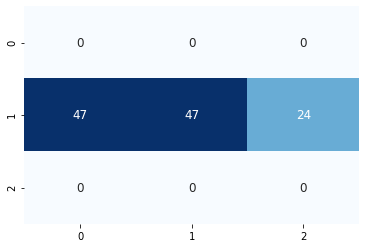

120/120 [==============================] - 0s 289us/sample - loss: 1.3446 - accuracy: 0.3583


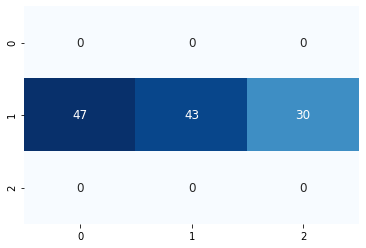

118/118 [==============================] - 0s 314us/sample - loss: 1.3153 - accuracy: 0.4237


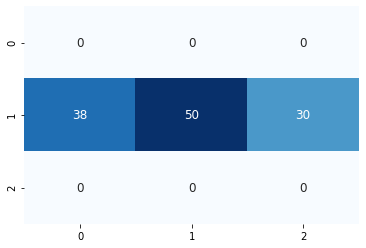

117/117 [==============================] - 0s 340us/sample - loss: 1.3085 - accuracy: 0.4103


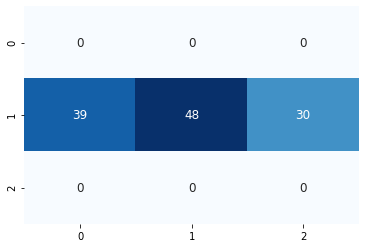

118/118 [==============================] - 0s 260us/sample - loss: 1.4739 - accuracy: 0.3559


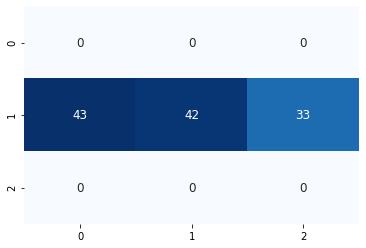

118/118 [==============================] - 0s 262us/sample - loss: 1.4311 - accuracy: 0.3814


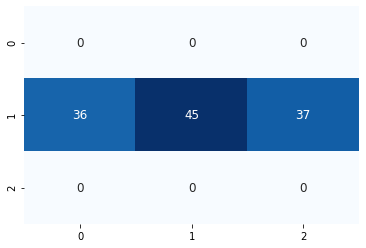

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3878 samples, validate on 1000 samples
Epoch 1/300
3878/3878 [==============================] - 2s 639us/sample - loss: 0.9917 - accuracy: 0.5139 - val_loss: 0.9884 - val_accuracy: 0.5380
Epoch 2/300
3878/3878 [==============================] - 1s 217us/sample - loss: 0.8265 - accuracy: 0.6568 - val_loss: 0.9865 - val_accuracy: 0.5310
Epoch 3/300
3878/3878 [==============================] - 1s 213us/sample - loss: 0.7295 - accuracy: 0.7120 - val_loss: 1.0092 - val_accuracy: 0.5390
Epoch 4/300
3878/3878 [==============================] - 1s 232us/sample - loss: 0.6413 - accuracy: 0.7581 - val_loss: 1.0434 - val_accuracy: 0.5470
Epoch 5/300
3878/3878 [==============================] - 1s 227us/sample - loss: 0.5630 - accuracy: 0.7953 - val_loss: 1.0871 - val_accuracy: 0.5350
Epoch 00005: early stopping
111/111 [==============================] - 0s 163us/sample - loss: 0.8576 - accuracy: 0.5495


21it [10:30:17, 1816.47s/it]
100%|██████████| 3/3 [00:06<00:00,  2.01s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.6484375 steps, validate for 75.130859375 steps
Epoch 1/300
284/283 [==============================] - 30s 104ms/step - loss: 0.9408 - accuracy: 0.5656 - val_loss: 0.9884 - val_accuracy: 0.5557
Epoch 2/300
284/283 [==============================] - 29s 101ms/step - loss: 0.8807 - accuracy: 0.5951 - val_loss: 1.0090 - val_accuracy: 0.5484
Epoch 3/300
284/283 [==============================] - 28s 100ms/step - loss: 0.8482 - accuracy: 0.6125 - val_loss: 1.0417 - val_accuracy: 0.5334
Epoch 4/300
284/283 [==============================] - 29s 101ms/step - loss: 0.8231 - accuracy: 0.6269 - val_loss: 1.0590 - val_accuracy: 0.5319
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.6484375 steps, validate for 75.130859375 steps
Epoch 1/300
284/283 [==============================] - 70s 247ms/step - loss: 0.7861 - accuracy: 0.6483 - val_loss: 1.3195 - val_acc

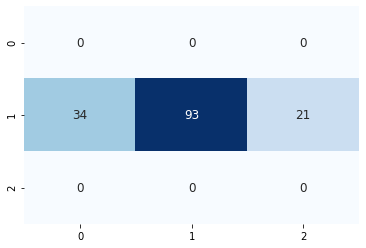

138/138 [==============================] - 0s 232us/sample - loss: 0.8812 - accuracy: 0.6377


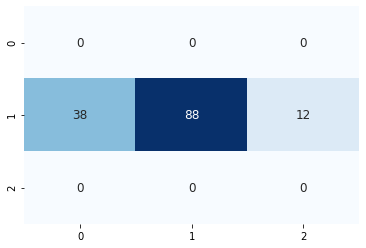

134/134 [==============================] - 0s 250us/sample - loss: 0.8486 - accuracy: 0.6716


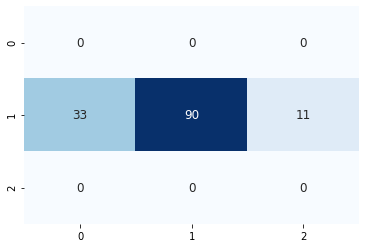

133/133 [==============================] - 0s 267us/sample - loss: 0.8142 - accuracy: 0.6767


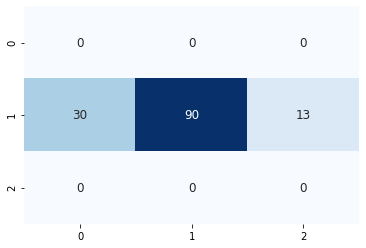

133/133 [==============================] - 0s 230us/sample - loss: 0.7520 - accuracy: 0.6992


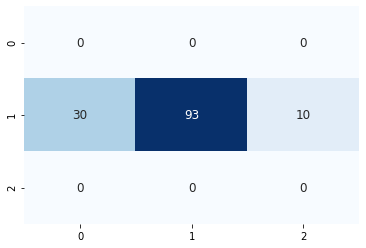

130/130 [==============================] - 0s 279us/sample - loss: 0.7141 - accuracy: 0.7000


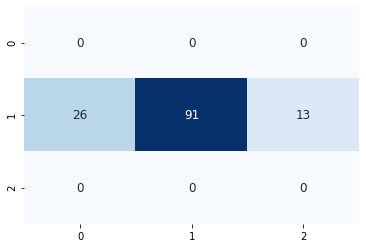

126/126 [==============================] - 0s 249us/sample - loss: 0.7241 - accuracy: 0.6746


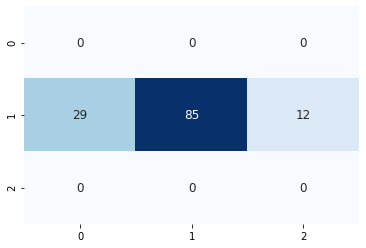

126/126 [==============================] - 0s 287us/sample - loss: 0.6891 - accuracy: 0.7460


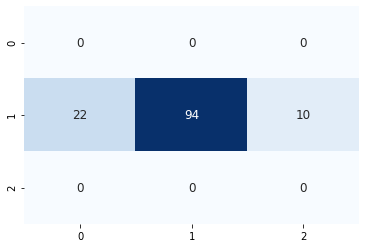

124/124 [==============================] - 0s 289us/sample - loss: 0.7261 - accuracy: 0.7097


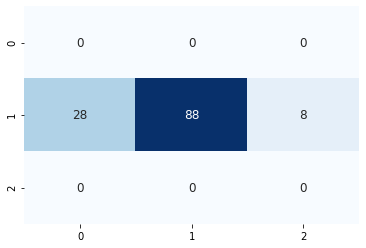

121/121 [==============================] - 0s 260us/sample - loss: 0.7221 - accuracy: 0.7355


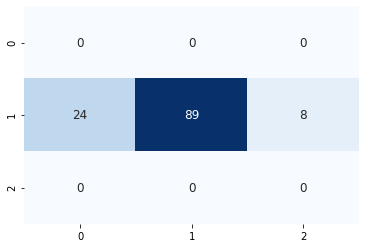

118/118 [==============================] - 0s 251us/sample - loss: 0.7599 - accuracy: 0.6695


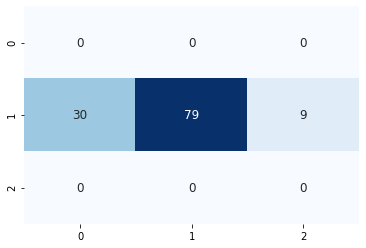

117/117 [==============================] - 0s 264us/sample - loss: 0.7468 - accuracy: 0.7094


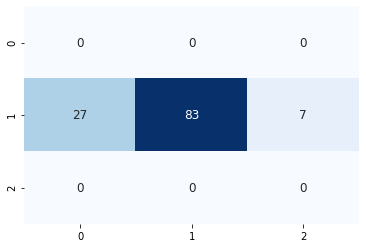

120/120 [==============================] - 0s 298us/sample - loss: 0.7084 - accuracy: 0.7250


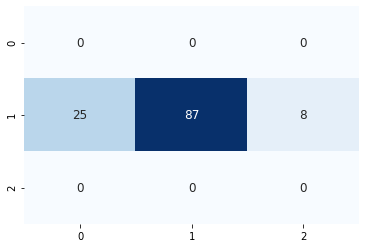

117/117 [==============================] - 0s 297us/sample - loss: 0.6332 - accuracy: 0.7863


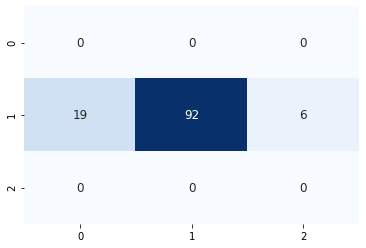

116/116 [==============================] - 0s 285us/sample - loss: 0.7007 - accuracy: 0.7155


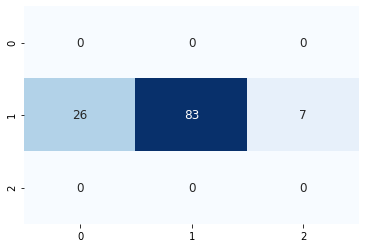

114/114 [==============================] - 0s 265us/sample - loss: 0.7739 - accuracy: 0.6842


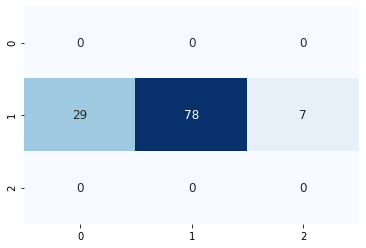

113/113 [==============================] - 0s 292us/sample - loss: 0.7981 - accuracy: 0.6991


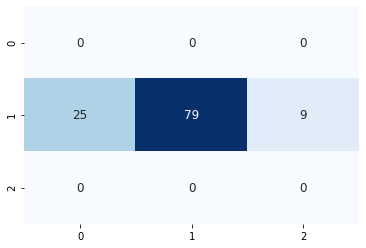

113/113 [==============================] - 0s 277us/sample - loss: 0.6704 - accuracy: 0.6991


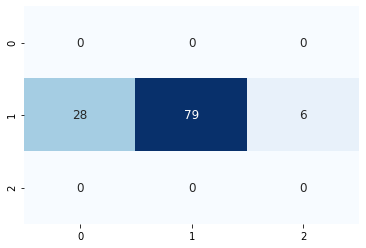

112/112 [==============================] - 0s 267us/sample - loss: 0.6895 - accuracy: 0.7232


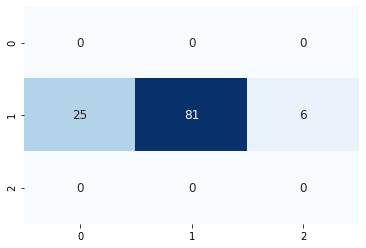

112/112 [==============================] - 0s 318us/sample - loss: 0.7070 - accuracy: 0.7321


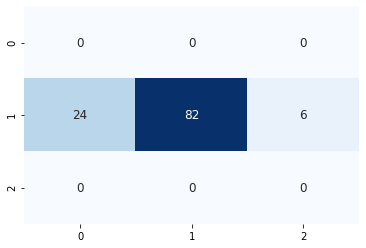

113/113 [==============================] - 0s 277us/sample - loss: 0.7541 - accuracy: 0.7080


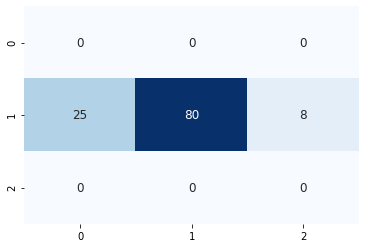

112/112 [==============================] - 0s 274us/sample - loss: 0.8034 - accuracy: 0.6875


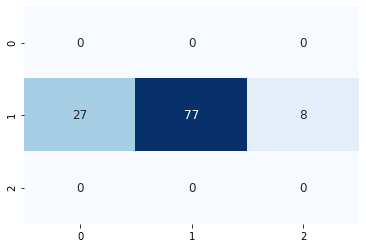

113/113 [==============================] - 0s 269us/sample - loss: 0.7320 - accuracy: 0.7345


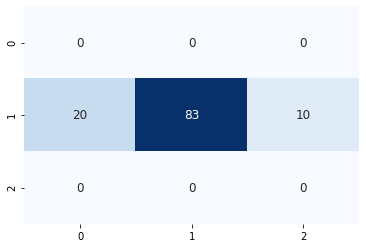

111/111 [==============================] - 0s 267us/sample - loss: 0.7935 - accuracy: 0.6577


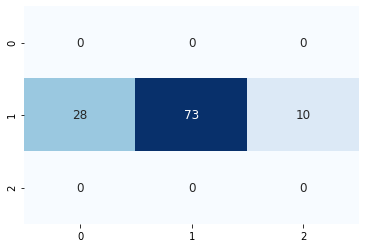

110/110 [==============================] - 0s 285us/sample - loss: 0.7733 - accuracy: 0.7000


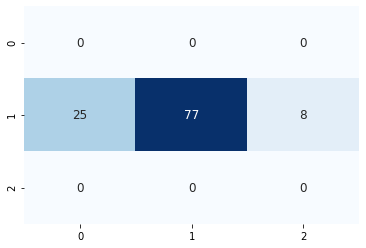

110/110 [==============================] - 0s 280us/sample - loss: 0.7856 - accuracy: 0.7091


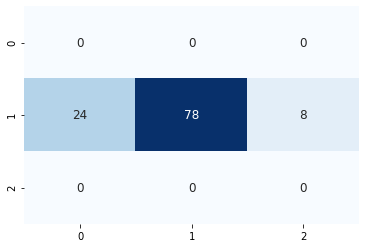

111/111 [==============================] - 0s 288us/sample - loss: 0.8074 - accuracy: 0.6937


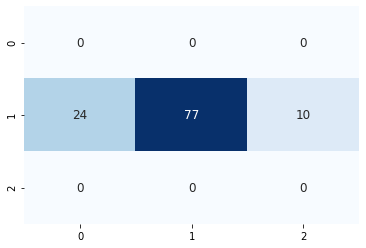

109/109 [==============================] - 0s 294us/sample - loss: 0.8133 - accuracy: 0.6514


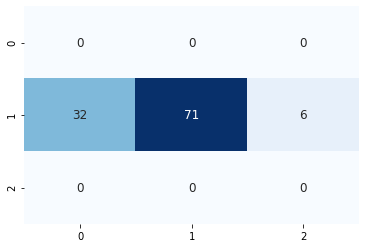

108/108 [==============================] - 0s 305us/sample - loss: 0.7525 - accuracy: 0.6759


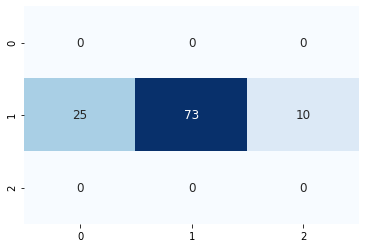

106/106 [==============================] - 0s 276us/sample - loss: 0.8688 - accuracy: 0.6226


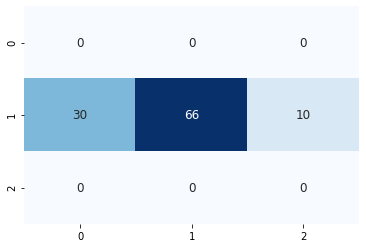

106/106 [==============================] - 0s 294us/sample - loss: 0.8570 - accuracy: 0.6321


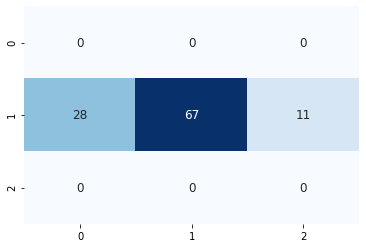

106/106 [==============================] - 0s 314us/sample - loss: 0.8597 - accuracy: 0.6321


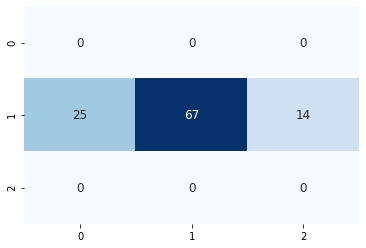

104/104 [==============================] - 0s 297us/sample - loss: 0.8061 - accuracy: 0.6538


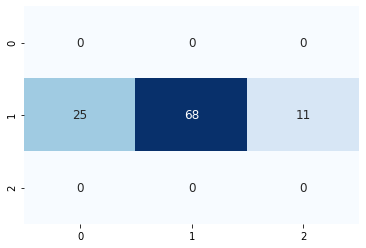

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3877 samples, validate on 1013 samples
Epoch 1/300
3877/3877 [==============================] - 3s 693us/sample - loss: 0.9091 - accuracy: 0.5623 - val_loss: 1.0181 - val_accuracy: 0.5222
Epoch 2/300
3877/3877 [==============================] - 1s 223us/sample - loss: 0.7044 - accuracy: 0.7023 - val_loss: 1.0527 - val_accuracy: 0.5262
Epoch 3/300
3877/3877 [==============================] - 1s 234us/sample - loss: 0.5642 - accuracy: 0.7784 - val_loss: 1.1262 - val_accuracy: 0.5271
Epoch 4/300
3877/3877 [==============================] - 1s 230us/sample - loss: 0.4474 - accuracy: 0.8388 - val_loss: 1.2351 - val_accuracy: 0.5064
Epoch 00004: early stopping
99/99 [==============================] - 0s 191us/sample - loss: 0.7330 - accuracy: 0.6263


22it [11:00:41, 1818.77s/it]
100%|██████████| 3/3 [00:06<00:00,  2.08s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.912109375 steps, validate for 74.943359375 steps
Epoch 1/300
283/282 [==============================] - 29s 104ms/step - loss: 0.9429 - accuracy: 0.5657 - val_loss: 0.9970 - val_accuracy: 0.5488
Epoch 2/300
283/282 [==============================] - 29s 102ms/step - loss: 0.8795 - accuracy: 0.5978 - val_loss: 0.9983 - val_accuracy: 0.5431
Epoch 3/300
283/282 [==============================] - 29s 102ms/step - loss: 0.8493 - accuracy: 0.6128 - val_loss: 1.0187 - val_accuracy: 0.5367
Epoch 4/300
283/282 [==============================] - 29s 102ms/step - loss: 0.8243 - accuracy: 0.6267 - val_loss: 1.0458 - val_accuracy: 0.5225
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.912109375 steps, validate for 74.943359375 steps
Epoch 1/300
283/282 [==============================] - 70s 248ms/step - loss: 0.7840 - accuracy: 0.6497 - val_loss: 1.2266 - val

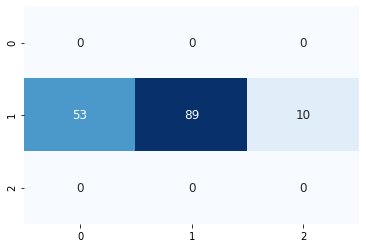

145/145 [==============================] - 0s 280us/sample - loss: 0.9800 - accuracy: 0.5724


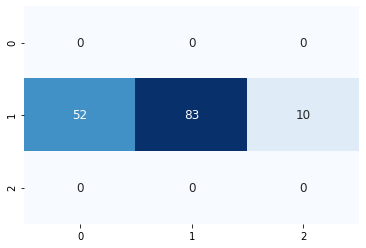

142/142 [==============================] - 0s 258us/sample - loss: 0.9260 - accuracy: 0.5986


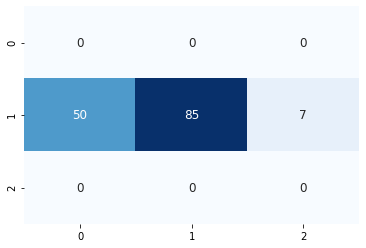

138/138 [==============================] - 0s 248us/sample - loss: 0.8721 - accuracy: 0.6594


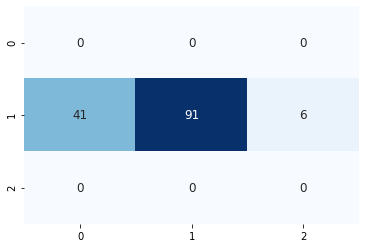

137/137 [==============================] - 0s 286us/sample - loss: 0.8869 - accuracy: 0.5839


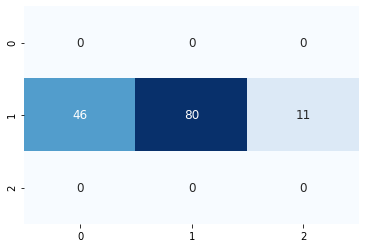

137/137 [==============================] - 0s 254us/sample - loss: 0.9279 - accuracy: 0.5766


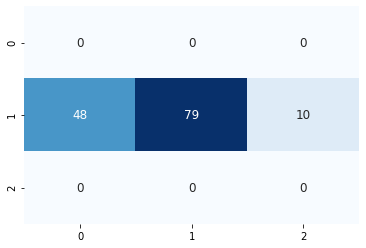

136/136 [==============================] - 0s 296us/sample - loss: 0.9603 - accuracy: 0.5735


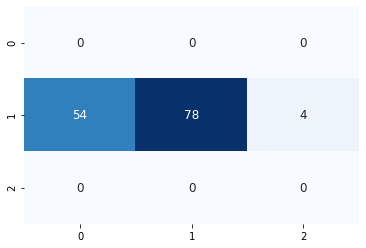

135/135 [==============================] - 0s 306us/sample - loss: 0.9699 - accuracy: 0.5630


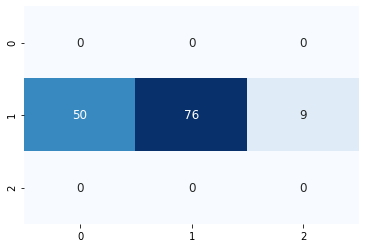

136/136 [==============================] - 0s 266us/sample - loss: 0.9817 - accuracy: 0.5441


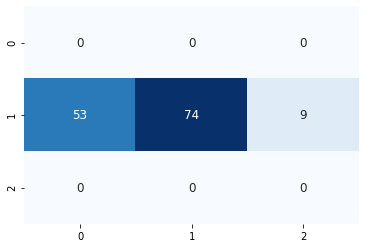

134/134 [==============================] - 0s 301us/sample - loss: 1.0282 - accuracy: 0.4776


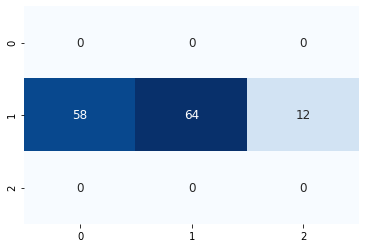

132/132 [==============================] - 0s 300us/sample - loss: 1.0289 - accuracy: 0.5227


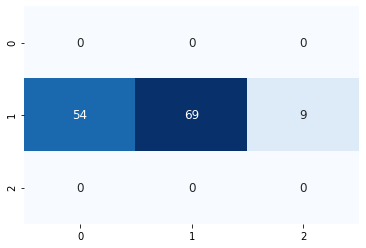

132/132 [==============================] - 0s 268us/sample - loss: 1.1198 - accuracy: 0.4545


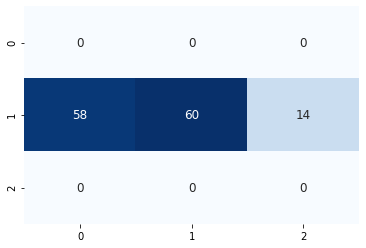

133/133 [==============================] - 0s 304us/sample - loss: 1.1126 - accuracy: 0.4586


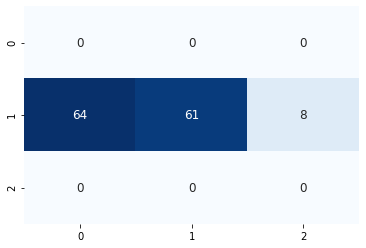

132/132 [==============================] - 0s 280us/sample - loss: 1.1775 - accuracy: 0.4318


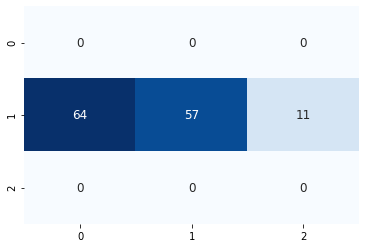

133/133 [==============================] - 0s 285us/sample - loss: 1.1993 - accuracy: 0.4436


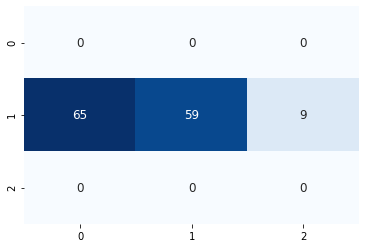

130/130 [==============================] - 0s 441us/sample - loss: 1.1921 - accuracy: 0.4692


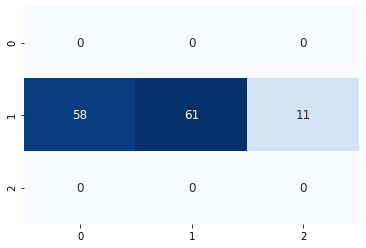

132/132 [==============================] - 0s 293us/sample - loss: 1.1825 - accuracy: 0.4318


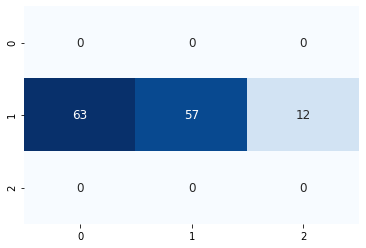

131/131 [==============================] - 0s 308us/sample - loss: 1.2024 - accuracy: 0.4427


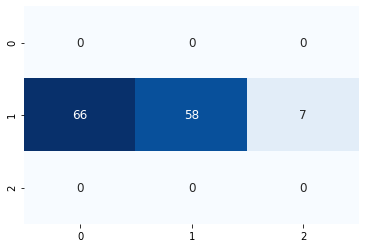

132/132 [==============================] - 0s 292us/sample - loss: 1.2192 - accuracy: 0.4167


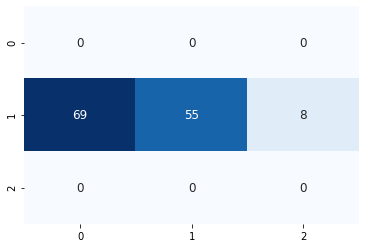

131/131 [==============================] - 0s 284us/sample - loss: 1.1777 - accuracy: 0.4427


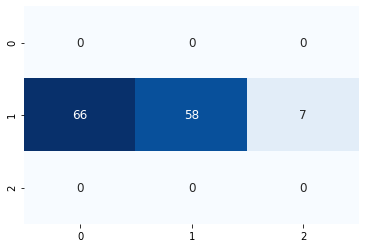

129/129 [==============================] - 0s 289us/sample - loss: 1.1460 - accuracy: 0.4419


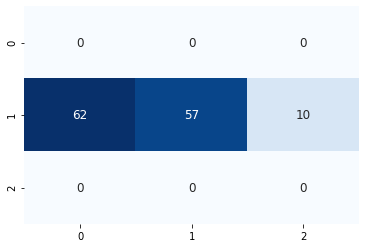

129/129 [==============================] - 0s 344us/sample - loss: 1.2090 - accuracy: 0.4496


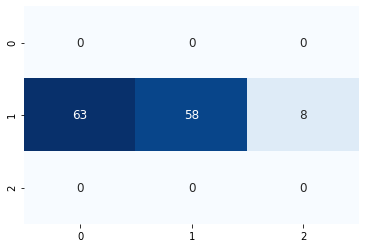

129/129 [==============================] - 0s 303us/sample - loss: 1.3023 - accuracy: 0.4496


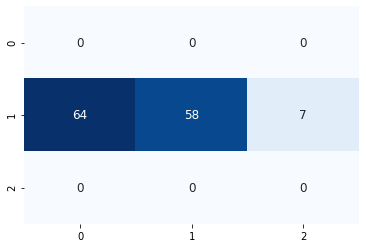

128/128 [==============================] - 0s 2ms/sample - loss: 1.3039 - accuracy: 0.4141


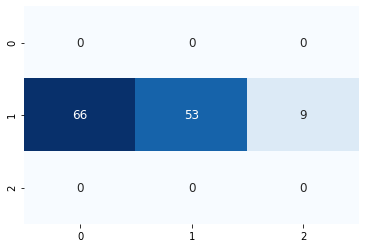

129/129 [==============================] - 0s 426us/sample - loss: 1.2749 - accuracy: 0.4341


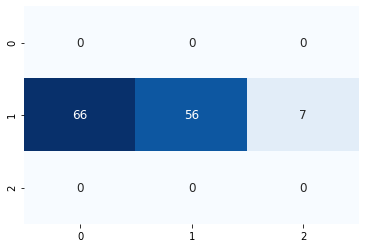

127/127 [==============================] - 0s 295us/sample - loss: 1.3608 - accuracy: 0.3465


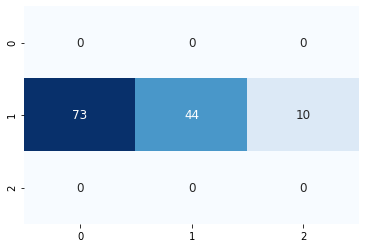

127/127 [==============================] - 0s 244us/sample - loss: 1.3724 - accuracy: 0.3622


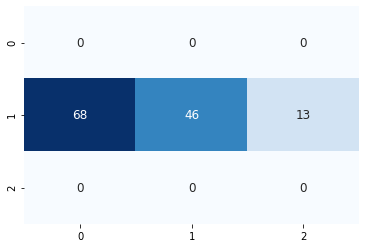

126/126 [==============================] - 0s 251us/sample - loss: 1.3531 - accuracy: 0.4127


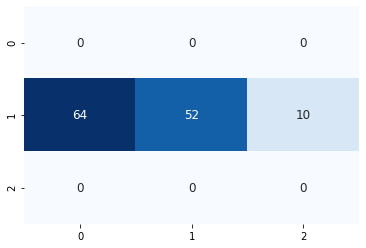

124/124 [==============================] - 0s 249us/sample - loss: 1.3986 - accuracy: 0.3387


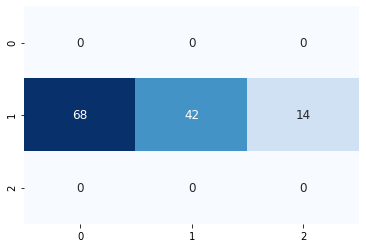

126/126 [==============================] - 0s 257us/sample - loss: 1.4519 - accuracy: 0.3810


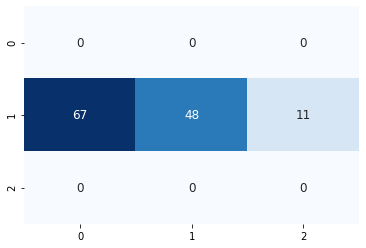

125/125 [==============================] - 0s 264us/sample - loss: 1.3841 - accuracy: 0.3840


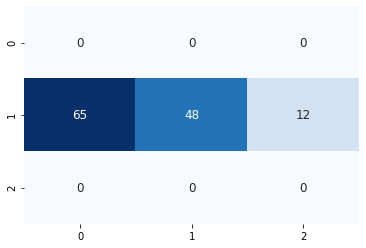

123/123 [==============================] - 0s 254us/sample - loss: 1.4258 - accuracy: 0.3415


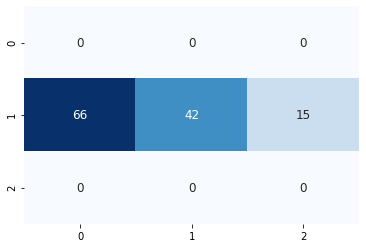

125/125 [==============================] - 0s 276us/sample - loss: 1.3893 - accuracy: 0.3760


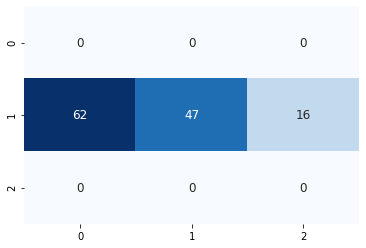

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3864 samples, validate on 1006 samples
Epoch 1/300
3864/3864 [==============================] - 3s 670us/sample - loss: 0.9827 - accuracy: 0.5036 - val_loss: 1.0150 - val_accuracy: 0.5169
Epoch 2/300
3864/3864 [==============================] - 1s 213us/sample - loss: 0.7917 - accuracy: 0.6628 - val_loss: 1.0246 - val_accuracy: 0.5219
Epoch 3/300
3864/3864 [==============================] - 1s 221us/sample - loss: 0.6788 - accuracy: 0.7319 - val_loss: 1.0563 - val_accuracy: 0.5030
Epoch 4/300
3864/3864 [==============================] - 1s 210us/sample - loss: 0.5684 - accuracy: 0.7997 - val_loss: 1.1009 - val_accuracy: 0.4950
Epoch 00004: early stopping
119/119 [==============================] - 0s 149us/sample - loss: 0.6735 - accuracy: 0.6555


23it [11:31:28, 1827.25s/it]
100%|██████████| 3/3 [00:06<00:00,  2.05s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.12109375 steps, validate for 75.3984375 steps
Epoch 1/300
283/282 [==============================] - 30s 105ms/step - loss: 0.9517 - accuracy: 0.5589 - val_loss: 1.0050 - val_accuracy: 0.5536
Epoch 2/300
283/282 [==============================] - 29s 102ms/step - loss: 0.8850 - accuracy: 0.5943 - val_loss: 1.0116 - val_accuracy: 0.5435
Epoch 3/300
283/282 [==============================] - 29s 101ms/step - loss: 0.8559 - accuracy: 0.6096 - val_loss: 1.0250 - val_accuracy: 0.5298
Epoch 4/300
283/282 [==============================] - 29s 101ms/step - loss: 0.8316 - accuracy: 0.6230 - val_loss: 1.0572 - val_accuracy: 0.5215
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.12109375 steps, validate for 75.3984375 steps
Epoch 1/300
283/282 [==============================] - 70s 247ms/step - loss: 0.7926 - accuracy: 0.6444 - val_loss: 1.3785 - val_accur

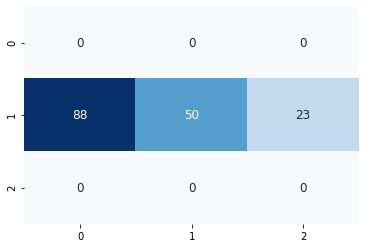

154/154 [==============================] - 0s 284us/sample - loss: 1.8081 - accuracy: 0.3247


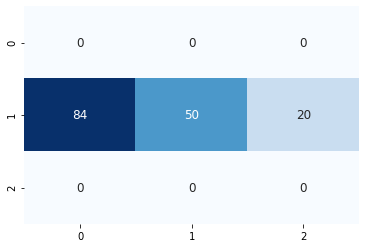

151/151 [==============================] - 0s 407us/sample - loss: 1.7633 - accuracy: 0.3709


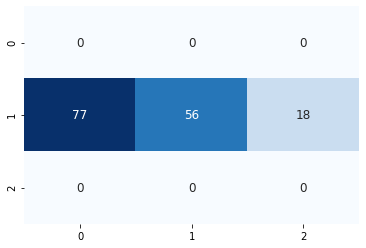

146/146 [==============================] - 0s 313us/sample - loss: 1.8432 - accuracy: 0.2671


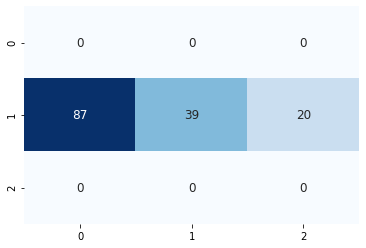

147/147 [==============================] - 0s 362us/sample - loss: 1.8611 - accuracy: 0.3265


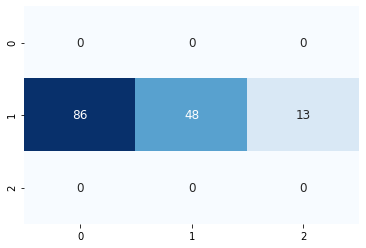

145/145 [==============================] - 0s 253us/sample - loss: 1.7487 - accuracy: 0.3034


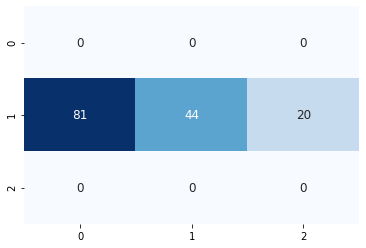

145/145 [==============================] - 0s 294us/sample - loss: 1.6880 - accuracy: 0.3379


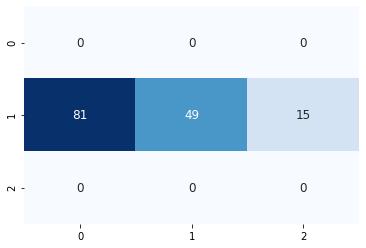

144/144 [==============================] - 0s 262us/sample - loss: 1.6778 - accuracy: 0.3264


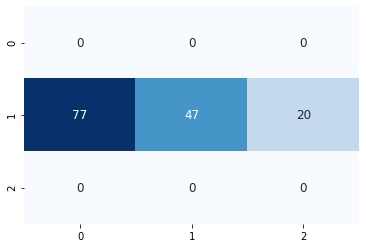

145/145 [==============================] - 0s 241us/sample - loss: 1.8138 - accuracy: 0.3241


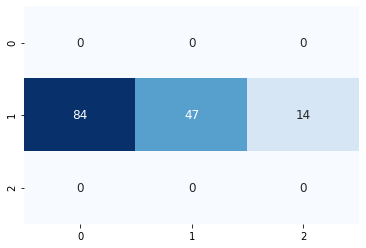

143/143 [==============================] - 0s 286us/sample - loss: 1.7950 - accuracy: 0.3217


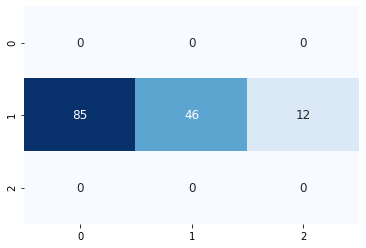

142/142 [==============================] - 0s 252us/sample - loss: 1.6735 - accuracy: 0.3662


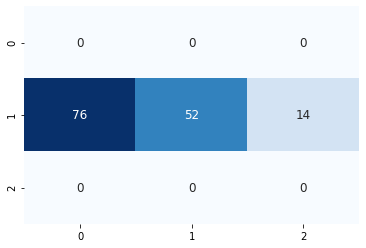

140/140 [==============================] - 0s 271us/sample - loss: 1.7838 - accuracy: 0.3143


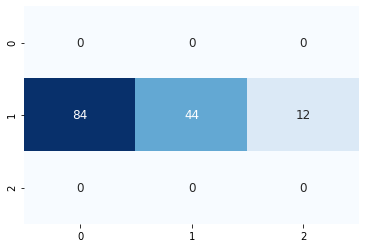

138/138 [==============================] - 0s 312us/sample - loss: 1.7228 - accuracy: 0.3696


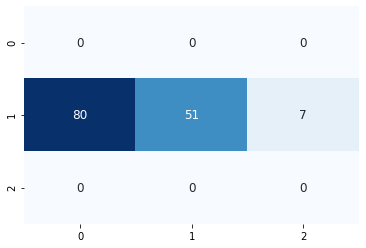

138/138 [==============================] - 0s 262us/sample - loss: 1.7917 - accuracy: 0.3406


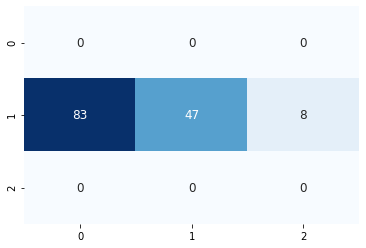

137/137 [==============================] - 0s 263us/sample - loss: 1.9010 - accuracy: 0.2555


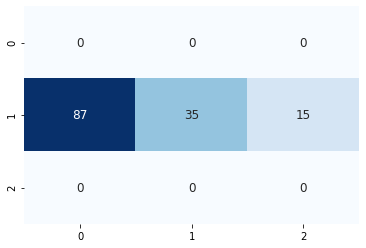

136/136 [==============================] - 0s 294us/sample - loss: 1.9172 - accuracy: 0.2868


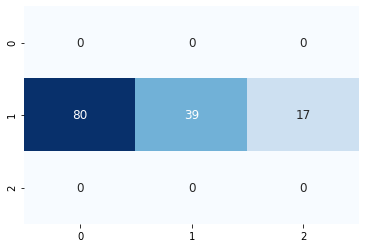

138/138 [==============================] - 0s 278us/sample - loss: 1.9120 - accuracy: 0.3333


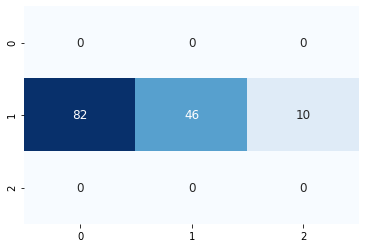

138/138 [==============================] - 0s 304us/sample - loss: 1.9989 - accuracy: 0.2899


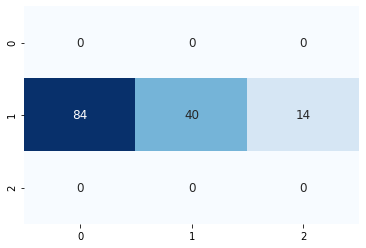

137/137 [==============================] - 0s 284us/sample - loss: 1.9102 - accuracy: 0.3358


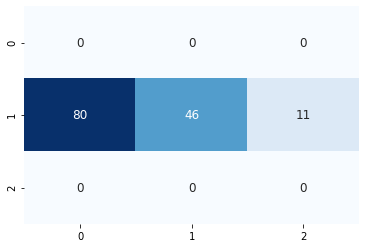

136/136 [==============================] - 0s 280us/sample - loss: 1.9142 - accuracy: 0.3162


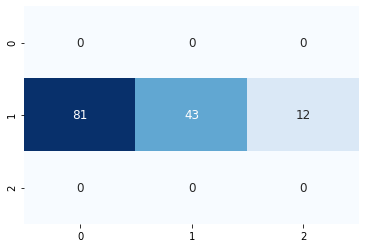

136/136 [==============================] - 0s 281us/sample - loss: 1.8618 - accuracy: 0.3235


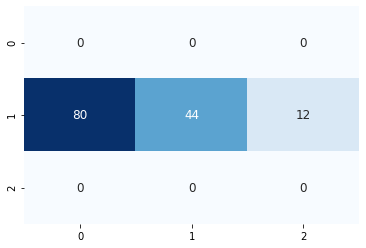

136/136 [==============================] - 0s 289us/sample - loss: 1.8469 - accuracy: 0.3088


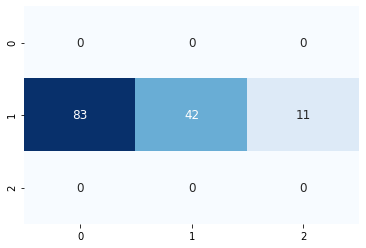

136/136 [==============================] - 0s 291us/sample - loss: 1.7753 - accuracy: 0.3456


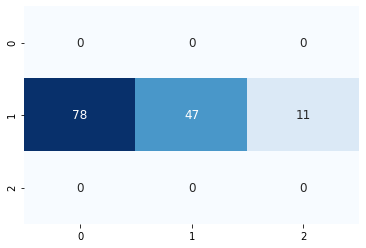

135/135 [==============================] - 0s 280us/sample - loss: 1.8885 - accuracy: 0.2963


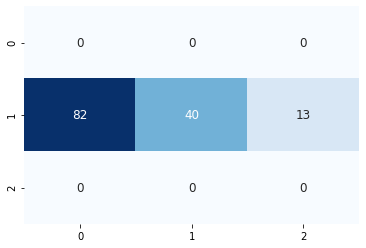

135/135 [==============================] - 0s 283us/sample - loss: 1.7940 - accuracy: 0.3185


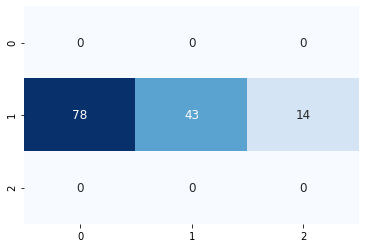

134/134 [==============================] - 0s 308us/sample - loss: 1.9593 - accuracy: 0.2985


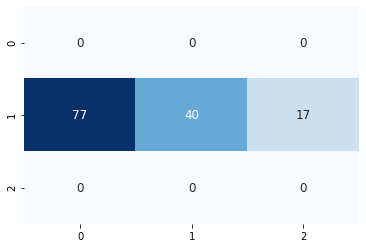

133/133 [==============================] - 0s 283us/sample - loss: 1.7949 - accuracy: 0.2932


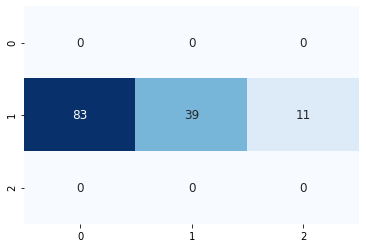

125/125 [==============================] - 0s 260us/sample - loss: 1.9002 - accuracy: 0.2800


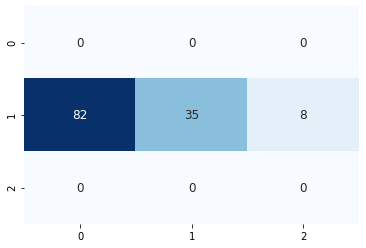

124/124 [==============================] - 0s 245us/sample - loss: 1.9133 - accuracy: 0.2661


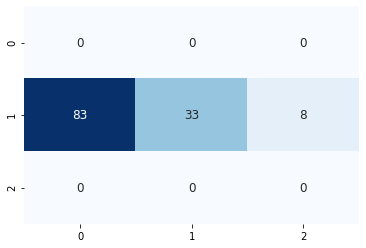

122/122 [==============================] - 0s 266us/sample - loss: 2.0121 - accuracy: 0.2295


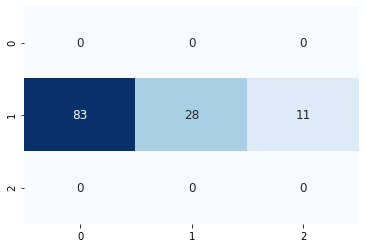

119/119 [==============================] - 0s 289us/sample - loss: 1.9672 - accuracy: 0.2437


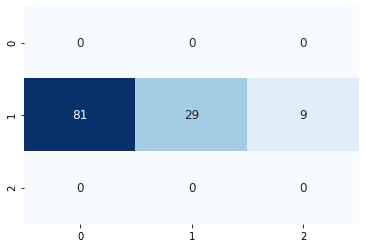

117/117 [==============================] - 0s 298us/sample - loss: 1.9239 - accuracy: 0.2735


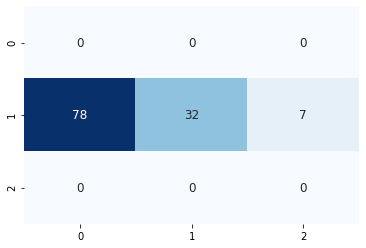

116/116 [==============================] - 0s 402us/sample - loss: 2.1314 - accuracy: 0.2069


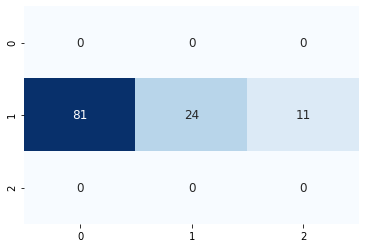

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3865 samples, validate on 1016 samples
Epoch 1/300
3865/3865 [==============================] - 3s 659us/sample - loss: 0.9648 - accuracy: 0.5379 - val_loss: 1.0160 - val_accuracy: 0.5177
Epoch 2/300
3865/3865 [==============================] - 1s 219us/sample - loss: 0.7977 - accuracy: 0.6549 - val_loss: 1.0145 - val_accuracy: 0.5217
Epoch 3/300
3865/3865 [==============================] - 1s 224us/sample - loss: 0.6909 - accuracy: 0.7245 - val_loss: 1.0343 - val_accuracy: 0.5285
Epoch 4/300
3865/3865 [==============================] - 1s 220us/sample - loss: 0.5963 - accuracy: 0.7715 - val_loss: 1.0788 - val_accuracy: 0.5197
Epoch 5/300
3865/3865 [==============================] - 1s 228us/sample - loss: 0.5066 - accuracy: 0.8132 - val_loss: 1.1459 - val_accuracy: 0.5217
Epoch 00005: early stopping
108/108 [==============================] - 0s 169us/sample - loss: 0.4757 - accuracy: 0.7963


24it [12:01:57, 1827.87s/it]
100%|██████████| 3/3 [00:06<00:00,  2.05s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.669921875 steps, validate for 75.134765625 steps
Epoch 1/300
283/282 [==============================] - 29s 104ms/step - loss: 0.9468 - accuracy: 0.5592 - val_loss: 0.9993 - val_accuracy: 0.5460
Epoch 2/300
283/282 [==============================] - 29s 102ms/step - loss: 0.8812 - accuracy: 0.5954 - val_loss: 1.0214 - val_accuracy: 0.5299
Epoch 3/300
283/282 [==============================] - 29s 101ms/step - loss: 0.8502 - accuracy: 0.6127 - val_loss: 1.0493 - val_accuracy: 0.5313
Epoch 4/300
283/282 [==============================] - 29s 104ms/step - loss: 0.8268 - accuracy: 0.6261 - val_loss: 1.0600 - val_accuracy: 0.5116
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.669921875 steps, validate for 75.134765625 steps
Epoch 1/300
283/282 [==============================] - 71s 250ms/step - loss: 0.7872 - accuracy: 0.6467 - val_loss: 1.3094 - val

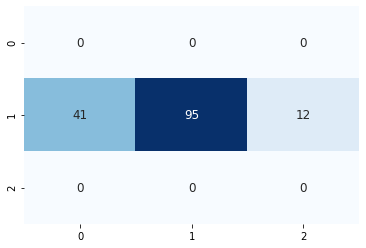

147/147 [==============================] - 0s 238us/sample - loss: 0.6930 - accuracy: 0.7279


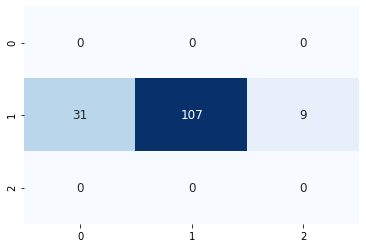

146/146 [==============================] - 0s 282us/sample - loss: 0.7450 - accuracy: 0.6575


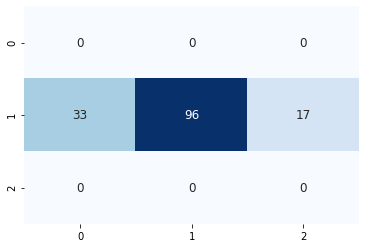

144/144 [==============================] - 0s 225us/sample - loss: 0.7201 - accuracy: 0.7014


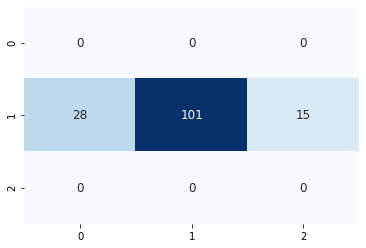

144/144 [==============================] - 0s 221us/sample - loss: 0.9015 - accuracy: 0.5833


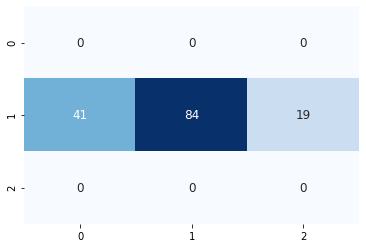

140/140 [==============================] - 0s 253us/sample - loss: 0.8772 - accuracy: 0.5786


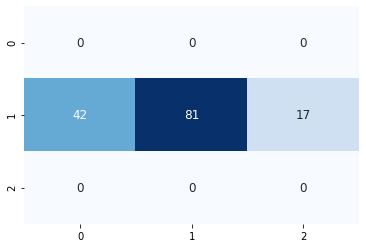

139/139 [==============================] - 0s 252us/sample - loss: 0.8065 - accuracy: 0.6115


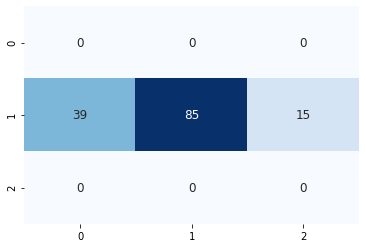

138/138 [==============================] - 0s 268us/sample - loss: 0.7458 - accuracy: 0.6594


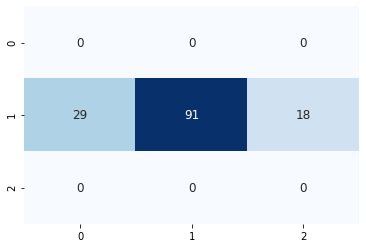

135/135 [==============================] - 0s 273us/sample - loss: 0.7863 - accuracy: 0.6519


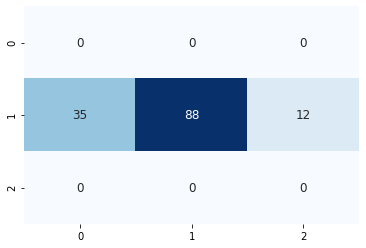

135/135 [==============================] - 0s 245us/sample - loss: 0.8037 - accuracy: 0.6000


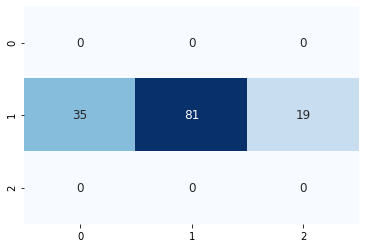

135/135 [==============================] - 0s 250us/sample - loss: 0.7196 - accuracy: 0.6963


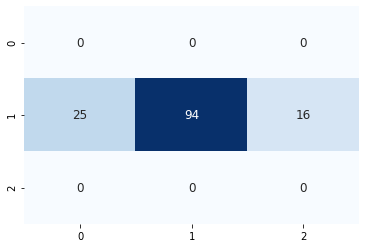

132/132 [==============================] - 0s 297us/sample - loss: 0.6922 - accuracy: 0.6667


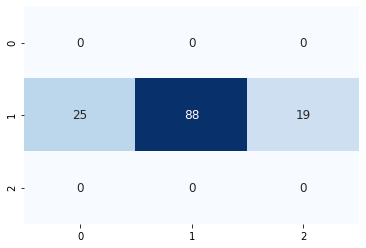

132/132 [==============================] - 0s 321us/sample - loss: 0.6695 - accuracy: 0.6515


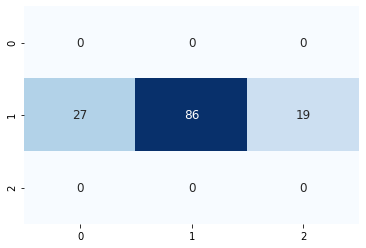

131/131 [==============================] - 0s 265us/sample - loss: 0.6162 - accuracy: 0.7176


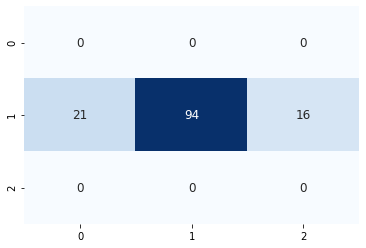

130/130 [==============================] - 0s 297us/sample - loss: 0.6368 - accuracy: 0.7000


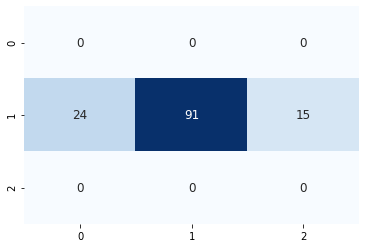

131/131 [==============================] - 0s 282us/sample - loss: 0.6266 - accuracy: 0.7405


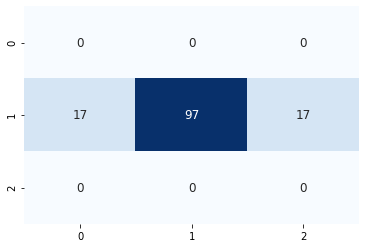

130/130 [==============================] - 0s 283us/sample - loss: 0.6465 - accuracy: 0.7385


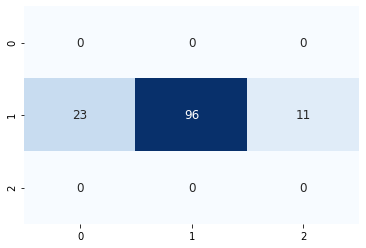

128/128 [==============================] - 0s 2ms/sample - loss: 0.6146 - accuracy: 0.7188


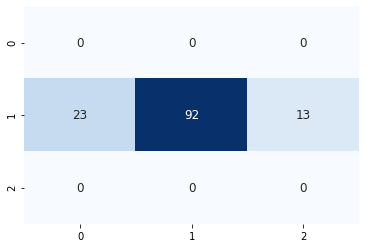

130/130 [==============================] - 0s 261us/sample - loss: 0.7082 - accuracy: 0.6846


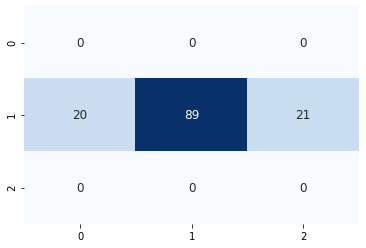

130/130 [==============================] - 0s 313us/sample - loss: 0.6042 - accuracy: 0.7077


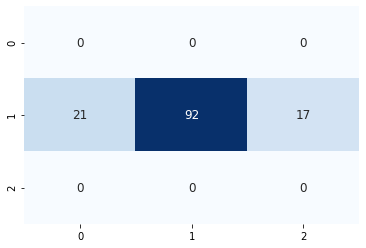

131/131 [==============================] - 0s 285us/sample - loss: 0.6338 - accuracy: 0.7099


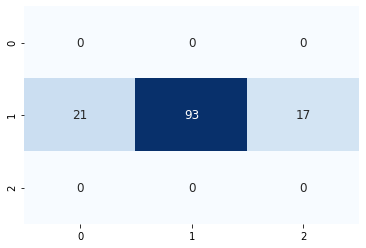

131/131 [==============================] - 0s 278us/sample - loss: 0.6234 - accuracy: 0.7710


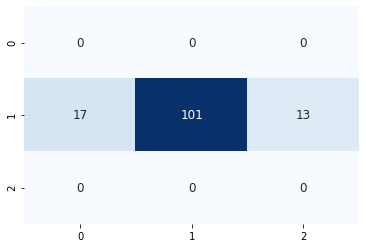

131/131 [==============================] - 0s 280us/sample - loss: 0.6936 - accuracy: 0.6565


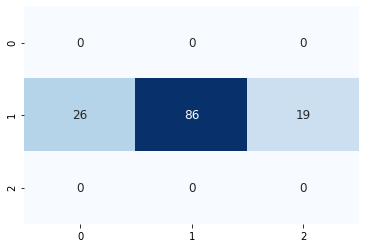

130/130 [==============================] - 0s 261us/sample - loss: 0.6747 - accuracy: 0.6615


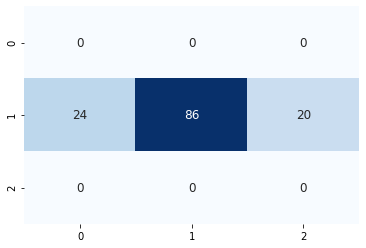

129/129 [==============================] - 0s 294us/sample - loss: 0.7011 - accuracy: 0.6822


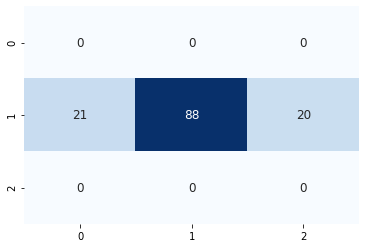

128/128 [==============================] - 0s 291us/sample - loss: 0.6498 - accuracy: 0.7500


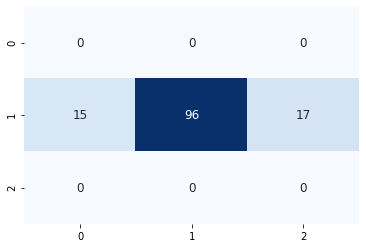

129/129 [==============================] - 0s 314us/sample - loss: 0.6459 - accuracy: 0.7287


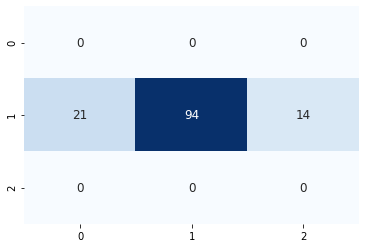

127/127 [==============================] - 0s 273us/sample - loss: 0.5679 - accuracy: 0.7480


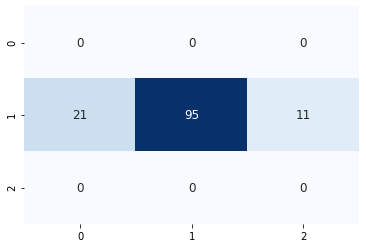

128/128 [==============================] - 0s 236us/sample - loss: 0.5988 - accuracy: 0.7109


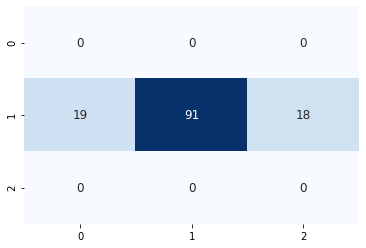

126/126 [==============================] - 0s 254us/sample - loss: 0.5933 - accuracy: 0.7460


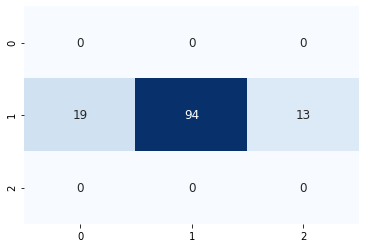

124/124 [==============================] - 0s 251us/sample - loss: 0.5604 - accuracy: 0.7823


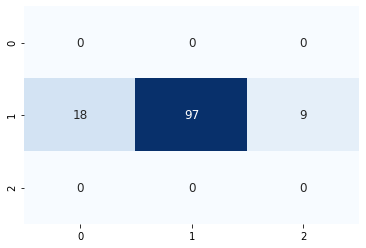

122/122 [==============================] - 0s 268us/sample - loss: 0.6872 - accuracy: 0.6721


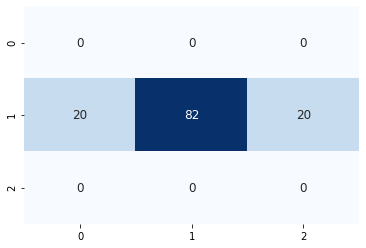

122/122 [==============================] - 0s 248us/sample - loss: 0.6431 - accuracy: 0.6803


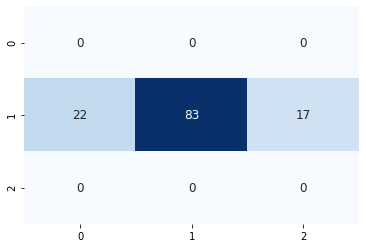

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3862 samples, validate on 1011 samples
Epoch 1/300
3862/3862 [==============================] - 2s 637us/sample - loss: 0.9425 - accuracy: 0.5355 - val_loss: 0.9836 - val_accuracy: 0.5460
Epoch 2/300
3862/3862 [==============================] - 1s 217us/sample - loss: 0.7525 - accuracy: 0.6763 - val_loss: 0.9961 - val_accuracy: 0.5420
Epoch 3/300
3862/3862 [==============================] - 1s 219us/sample - loss: 0.6226 - accuracy: 0.7620 - val_loss: 1.0421 - val_accuracy: 0.5381
Epoch 4/300
3862/3862 [==============================] - 1s 231us/sample - loss: 0.5024 - accuracy: 0.8203 - val_loss: 1.1352 - val_accuracy: 0.5262
Epoch 00004: early stopping
116/116 [==============================] - 0s 146us/sample - loss: 0.4966 - accuracy: 0.7672


25it [12:32:59, 1807.18s/it]
0it [00:00, ?it/s]
100%|██████████| 3/3 [00:06<00:00,  2.02s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 281.095703125 steps, validate for 73.875 steps
Epoch 1/300
282/281 [==============================] - 30s 105ms/step - loss: 0.9698 - accuracy: 0.5486 - val_loss: 0.9849 - val_accuracy: 0.5425
Epoch 2/300
282/281 [==============================] - 29s 102ms/step - loss: 0.8871 - accuracy: 0.5911 - val_loss: 1.0156 - val_accuracy: 0.5381
Epoch 3/300
282/281 [==============================] - 28s 99ms/step - loss: 0.8567 - accuracy: 0.6075 - val_loss: 1.0393 - val_accuracy: 0.5263
Epoch 4/300
282/281 [==============================] - 28s 100ms/step - loss: 0.8317 - accuracy: 0.6216 - val_loss: 1.0515 - val_accuracy: 0.5291
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 281.095703125 steps, validate for 73.875 steps
Epoch 1/300
282/281 [==============================] - 69s 246ms/step - loss: 0.7900 - accuracy: 0.6450 - val_loss: 1.1698 - val_accuracy: 0.

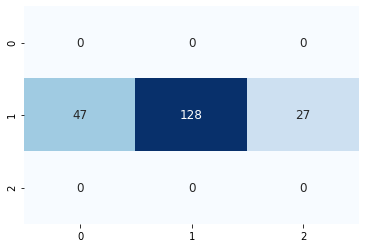

196/196 [==============================] - 0s 297us/sample - loss: 0.8575 - accuracy: 0.6224


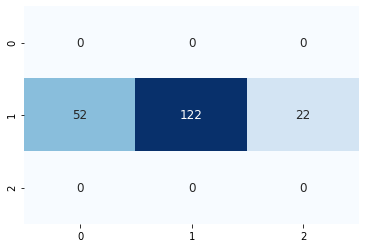

193/193 [==============================] - 0s 231us/sample - loss: 0.9918 - accuracy: 0.5959


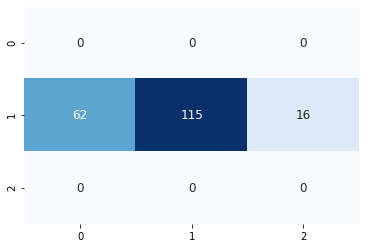

190/190 [==============================] - 0s 213us/sample - loss: 0.8886 - accuracy: 0.6368


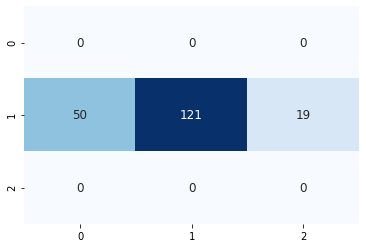

190/190 [==============================] - 0s 251us/sample - loss: 0.8999 - accuracy: 0.6211


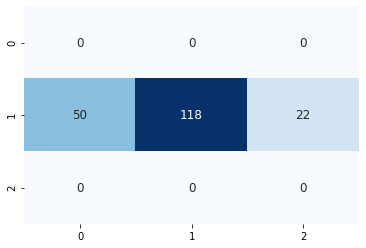

187/187 [==============================] - 0s 276us/sample - loss: 0.8694 - accuracy: 0.6578


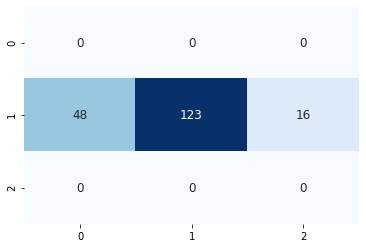

184/184 [==============================] - 0s 250us/sample - loss: 0.8139 - accuracy: 0.6467


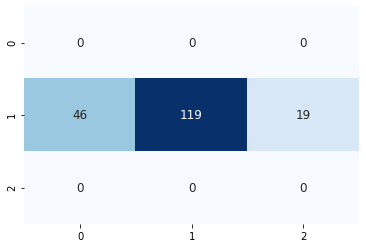

183/183 [==============================] - 0s 276us/sample - loss: 0.8494 - accuracy: 0.6557


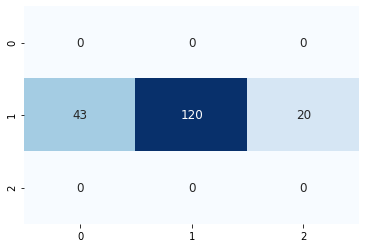

182/182 [==============================] - 0s 244us/sample - loss: 0.8910 - accuracy: 0.6264


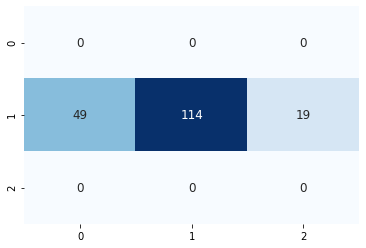

181/181 [==============================] - 0s 256us/sample - loss: 0.9569 - accuracy: 0.6022


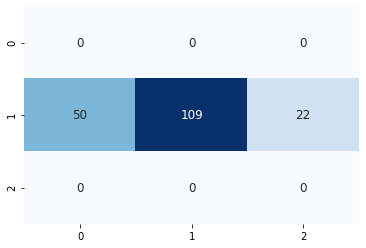

177/177 [==============================] - 0s 291us/sample - loss: 0.9230 - accuracy: 0.6045


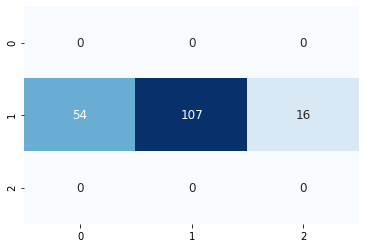

178/178 [==============================] - 0s 298us/sample - loss: 0.8968 - accuracy: 0.5899


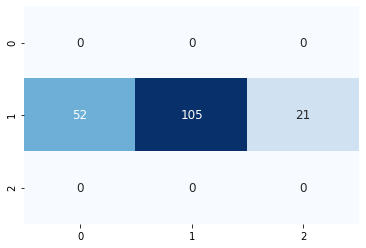

178/178 [==============================] - 0s 274us/sample - loss: 0.9451 - accuracy: 0.5843


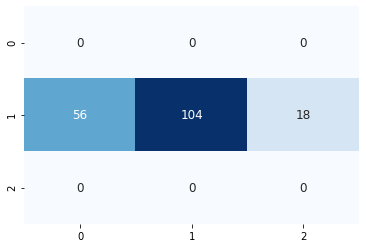

176/176 [==============================] - 0s 240us/sample - loss: 0.9061 - accuracy: 0.6250


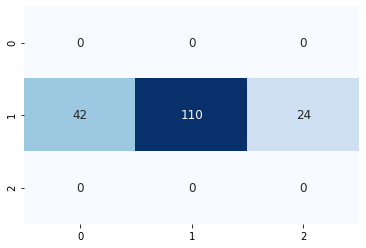

175/175 [==============================] - 0s 244us/sample - loss: 0.8720 - accuracy: 0.5886


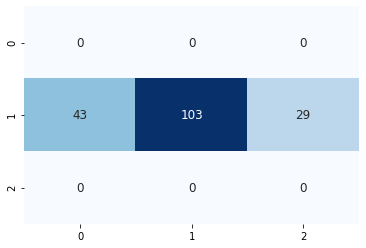

176/176 [==============================] - 0s 294us/sample - loss: 0.8063 - accuracy: 0.6705


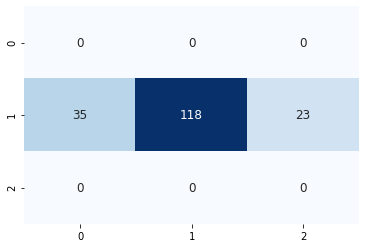

173/173 [==============================] - 0s 266us/sample - loss: 0.8259 - accuracy: 0.6647


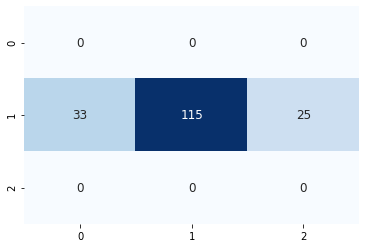

172/172 [==============================] - 0s 267us/sample - loss: 0.8756 - accuracy: 0.6221


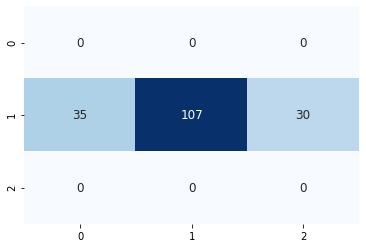

171/171 [==============================] - 0s 263us/sample - loss: 0.8125 - accuracy: 0.6842


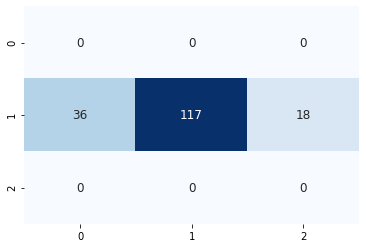

171/171 [==============================] - 0s 244us/sample - loss: 0.7916 - accuracy: 0.6784


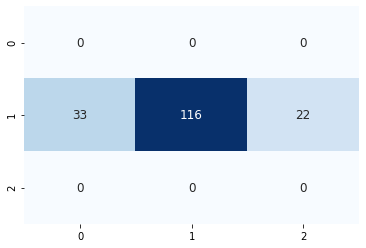

171/171 [==============================] - 0s 281us/sample - loss: 0.7683 - accuracy: 0.6784


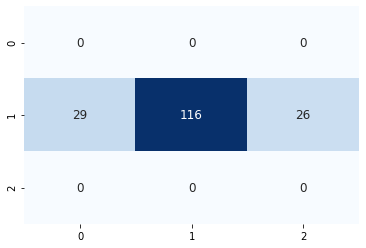

170/170 [==============================] - 0s 262us/sample - loss: 0.8708 - accuracy: 0.6529


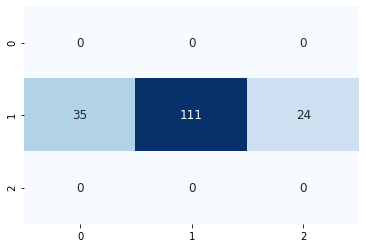

171/171 [==============================] - 0s 269us/sample - loss: 0.8221 - accuracy: 0.6725


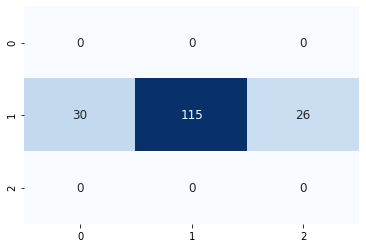

170/170 [==============================] - 0s 259us/sample - loss: 0.7973 - accuracy: 0.6529


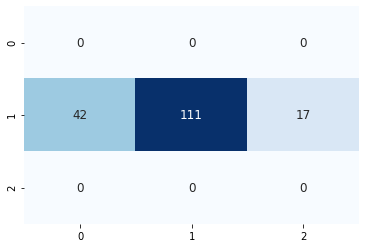

170/170 [==============================] - 0s 262us/sample - loss: 0.8003 - accuracy: 0.6529


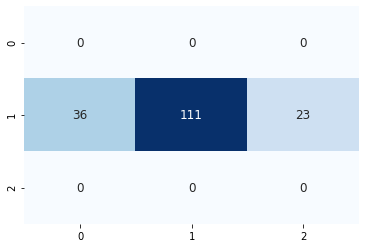

171/171 [==============================] - 0s 262us/sample - loss: 0.8164 - accuracy: 0.6257


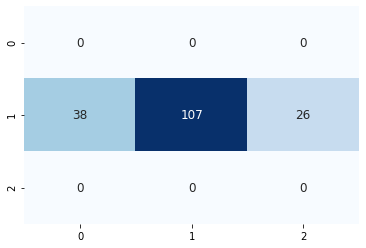

168/168 [==============================] - 0s 268us/sample - loss: 0.8579 - accuracy: 0.6429


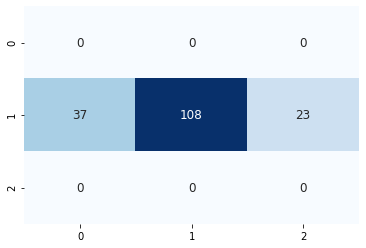

169/169 [==============================] - 0s 259us/sample - loss: 0.8719 - accuracy: 0.6331


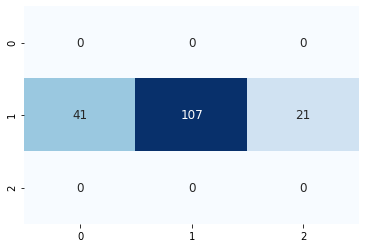

169/169 [==============================] - 0s 278us/sample - loss: 0.8127 - accuracy: 0.6568


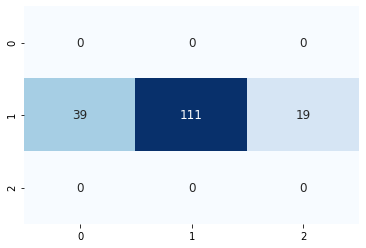

167/167 [==============================] - 0s 262us/sample - loss: 0.9051 - accuracy: 0.5689


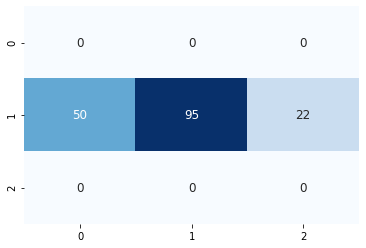

168/168 [==============================] - 0s 277us/sample - loss: 0.8883 - accuracy: 0.6131


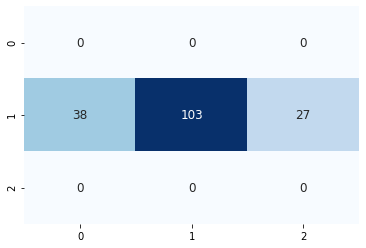

169/169 [==============================] - 0s 254us/sample - loss: 0.9041 - accuracy: 0.6036


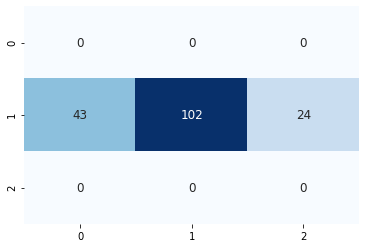

166/166 [==============================] - 0s 258us/sample - loss: 0.9389 - accuracy: 0.6325


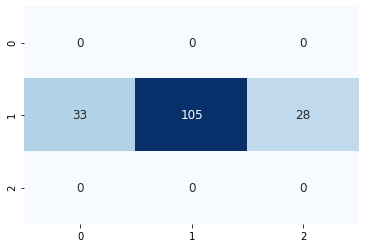

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3837 samples, validate on 993 samples
Epoch 1/300
3837/3837 [==============================] - 3s 706us/sample - loss: 0.8908 - accuracy: 0.5856 - val_loss: 1.0319 - val_accuracy: 0.5337
Epoch 2/300
3837/3837 [==============================] - 1s 205us/sample - loss: 0.6698 - accuracy: 0.7347 - val_loss: 1.0786 - val_accuracy: 0.5267
Epoch 3/300
3837/3837 [==============================] - 1s 220us/sample - loss: 0.5258 - accuracy: 0.8139 - val_loss: 1.1650 - val_accuracy: 0.5065
Epoch 4/300
3837/3837 [==============================] - 1s 217us/sample - loss: 0.4199 - accuracy: 0.8613 - val_loss: 1.2635 - val_accuracy: 0.5015
Epoch 00004: early stopping
159/159 [==============================] - 0s 146us/sample - loss: 0.7677 - accuracy: 0.6855


1it [30:24, 1824.02s/it]
100%|██████████| 3/3 [00:05<00:00,  1.95s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 281.869140625 steps, validate for 74.76953125 steps
Epoch 1/300
282/281 [==============================] - 30s 105ms/step - loss: 0.9576 - accuracy: 0.5509 - val_loss: 0.9811 - val_accuracy: 0.5418
Epoch 2/300
282/281 [==============================] - 28s 101ms/step - loss: 0.8829 - accuracy: 0.5927 - val_loss: 1.0117 - val_accuracy: 0.5350
Epoch 3/300
282/281 [==============================] - 28s 100ms/step - loss: 0.8529 - accuracy: 0.6091 - val_loss: 1.0464 - val_accuracy: 0.5386
Epoch 4/300
282/281 [==============================] - 29s 102ms/step - loss: 0.8305 - accuracy: 0.6216 - val_loss: 1.0564 - val_accuracy: 0.5359
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 281.869140625 steps, validate for 74.76953125 steps
Epoch 1/300
282/281 [==============================] - 70s 248ms/step - loss: 0.7922 - accuracy: 0.6433 - val_loss: 1.3070 - val_a

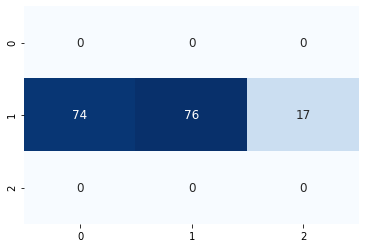

164/164 [==============================] - 0s 242us/sample - loss: 1.1197 - accuracy: 0.4207


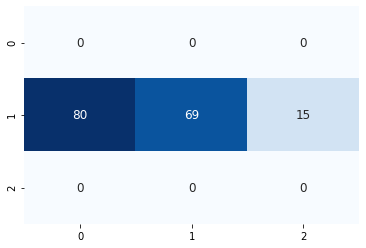

162/162 [==============================] - 0s 321us/sample - loss: 1.0416 - accuracy: 0.4321


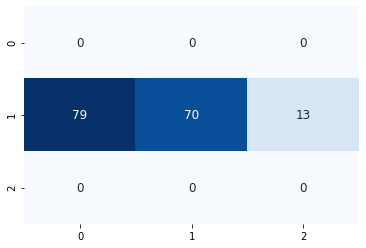

162/162 [==============================] - 0s 263us/sample - loss: 1.1776 - accuracy: 0.3951


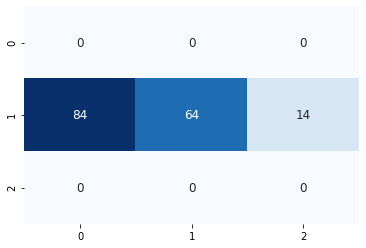

162/162 [==============================] - 0s 403us/sample - loss: 1.2410 - accuracy: 0.3889


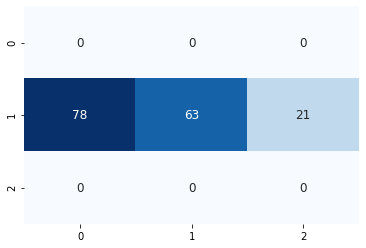

161/161 [==============================] - 0s 316us/sample - loss: 1.0764 - accuracy: 0.4286


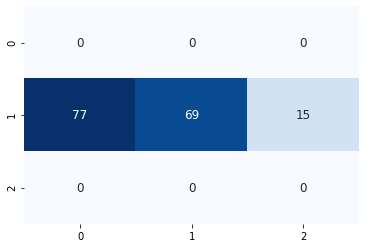

162/162 [==============================] - 0s 374us/sample - loss: 1.1265 - accuracy: 0.4444


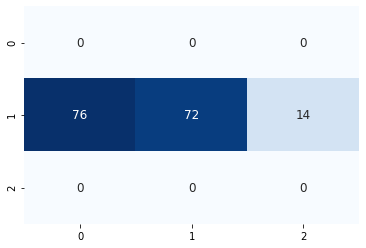

162/162 [==============================] - 0s 266us/sample - loss: 1.1376 - accuracy: 0.4321


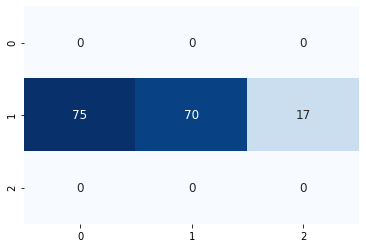

157/157 [==============================] - 0s 295us/sample - loss: 1.2301 - accuracy: 0.3949


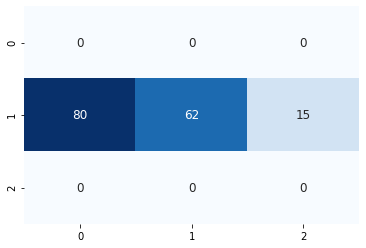

158/158 [==============================] - 0s 244us/sample - loss: 1.2050 - accuracy: 0.4557


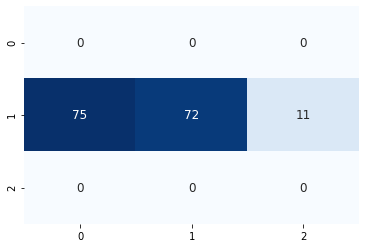

157/157 [==============================] - 0s 249us/sample - loss: 1.2395 - accuracy: 0.4140


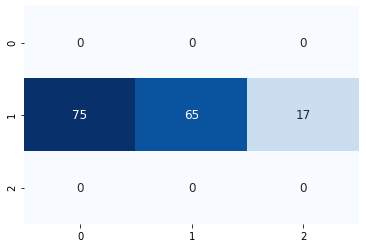

157/157 [==============================] - 0s 254us/sample - loss: 1.2182 - accuracy: 0.4268


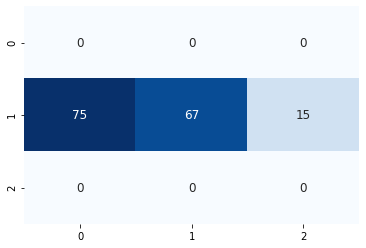

157/157 [==============================] - 0s 248us/sample - loss: 1.1834 - accuracy: 0.4140


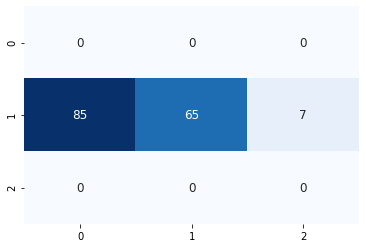

155/155 [==============================] - 0s 288us/sample - loss: 1.2633 - accuracy: 0.4129


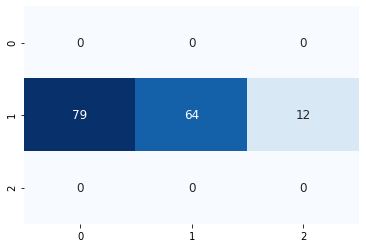

152/152 [==============================] - 0s 293us/sample - loss: 1.1895 - accuracy: 0.4868


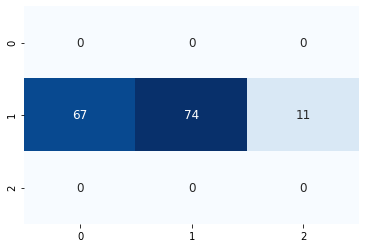

153/153 [==============================] - 0s 245us/sample - loss: 1.2278 - accuracy: 0.4118


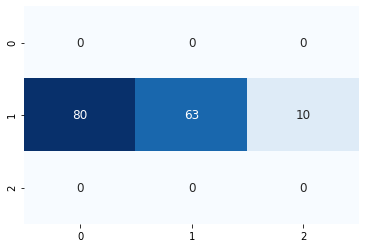

150/150 [==============================] - 0s 270us/sample - loss: 1.1823 - accuracy: 0.4467


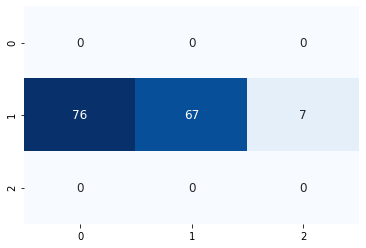

149/149 [==============================] - 0s 246us/sample - loss: 1.2069 - accuracy: 0.5101


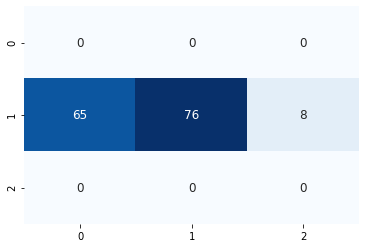

147/147 [==============================] - 0s 250us/sample - loss: 1.2891 - accuracy: 0.4218


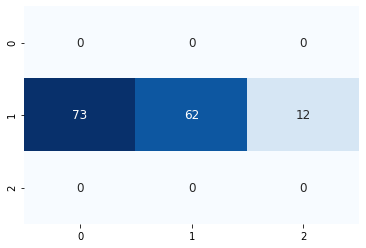

147/147 [==============================] - 0s 285us/sample - loss: 1.3205 - accuracy: 0.4490


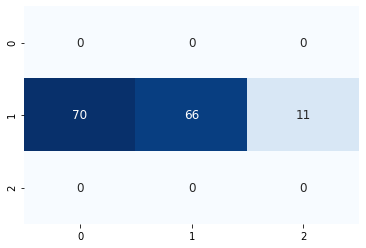

146/146 [==============================] - 0s 264us/sample - loss: 1.1311 - accuracy: 0.4589


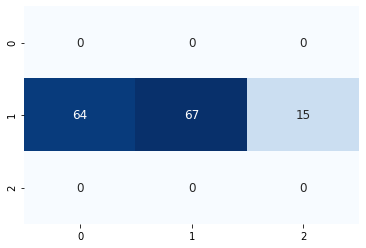

145/145 [==============================] - 0s 278us/sample - loss: 1.1380 - accuracy: 0.4759


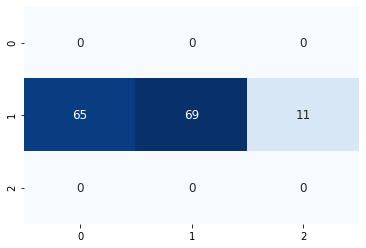

145/145 [==============================] - 0s 263us/sample - loss: 1.1128 - accuracy: 0.4966


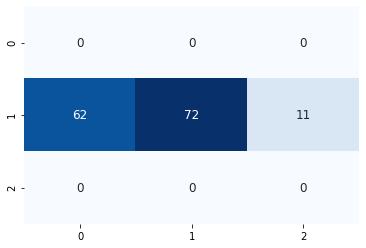

144/144 [==============================] - 0s 265us/sample - loss: 1.1620 - accuracy: 0.4861


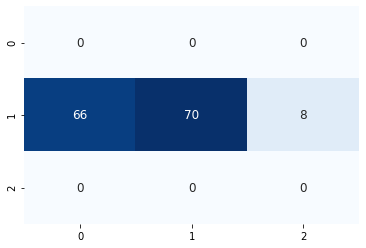

141/141 [==============================] - 0s 255us/sample - loss: 1.0982 - accuracy: 0.4610


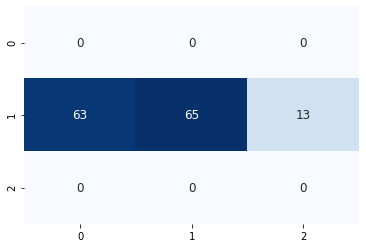

140/140 [==============================] - 0s 424us/sample - loss: 1.2164 - accuracy: 0.4286


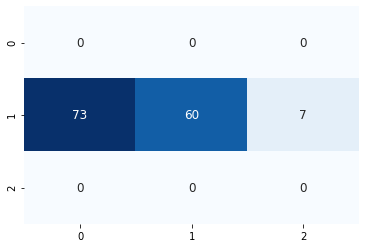

140/140 [==============================] - 0s 267us/sample - loss: 1.2382 - accuracy: 0.4571


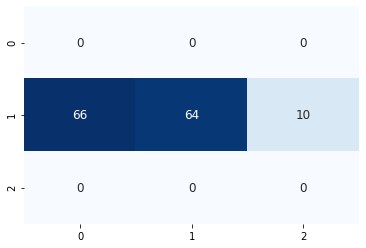

140/140 [==============================] - 0s 281us/sample - loss: 1.1807 - accuracy: 0.4357


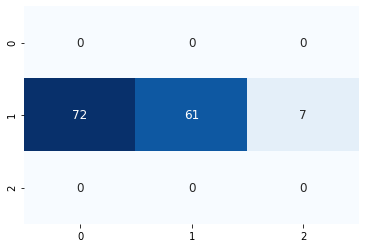

140/140 [==============================] - 0s 361us/sample - loss: 1.1988 - accuracy: 0.4714


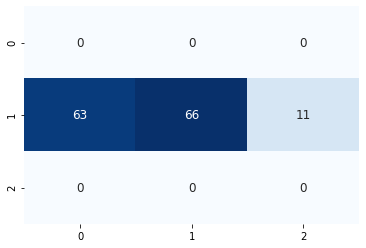

140/140 [==============================] - 0s 368us/sample - loss: 1.1385 - accuracy: 0.4857


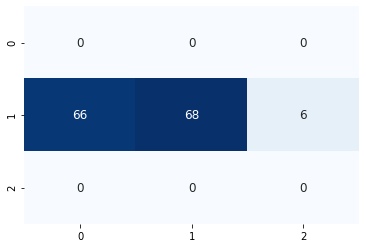

141/141 [==============================] - 0s 282us/sample - loss: 1.0487 - accuracy: 0.5319


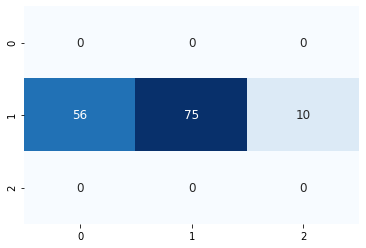

139/139 [==============================] - 0s 282us/sample - loss: 1.0643 - accuracy: 0.5324


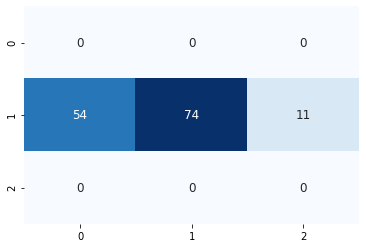

138/138 [==============================] - 0s 334us/sample - loss: 1.1319 - accuracy: 0.4493


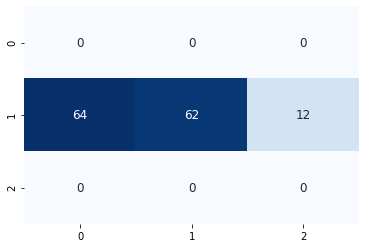

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3850 samples, validate on 1005 samples
Epoch 1/300
3850/3850 [==============================] - 3s 661us/sample - loss: 0.9478 - accuracy: 0.5299 - val_loss: 1.0063 - val_accuracy: 0.5443
Epoch 2/300
3850/3850 [==============================] - 1s 232us/sample - loss: 0.7312 - accuracy: 0.6956 - val_loss: 1.0293 - val_accuracy: 0.5383
Epoch 3/300
3850/3850 [==============================] - 1s 226us/sample - loss: 0.5934 - accuracy: 0.7758 - val_loss: 1.0889 - val_accuracy: 0.5363
Epoch 4/300
3850/3850 [==============================] - 1s 227us/sample - loss: 0.4858 - accuracy: 0.8286 - val_loss: 1.1603 - val_accuracy: 0.5174
Epoch 00004: early stopping
134/134 [==============================] - 0s 160us/sample - loss: 0.8507 - accuracy: 0.6343


2it [1:01:13, 1831.77s/it]
100%|██████████| 3/3 [00:06<00:00,  2.11s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.181640625 steps, validate for 75.533203125 steps
Epoch 1/300
286/285 [==============================] - 30s 104ms/step - loss: 0.9488 - accuracy: 0.5597 - val_loss: 0.9862 - val_accuracy: 0.5561
Epoch 2/300
286/285 [==============================] - 29s 102ms/step - loss: 0.8802 - accuracy: 0.5988 - val_loss: 1.0106 - val_accuracy: 0.5424
Epoch 3/300
286/285 [==============================] - 29s 102ms/step - loss: 0.8487 - accuracy: 0.6145 - val_loss: 1.0404 - val_accuracy: 0.5289
Epoch 4/300
286/285 [==============================] - 29s 102ms/step - loss: 0.8218 - accuracy: 0.6296 - val_loss: 1.0773 - val_accuracy: 0.5284
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.181640625 steps, validate for 75.533203125 steps
Epoch 1/300
286/285 [==============================] - 71s 248ms/step - loss: 0.7858 - accuracy: 0.6487 - val_loss: 1.2338 - val

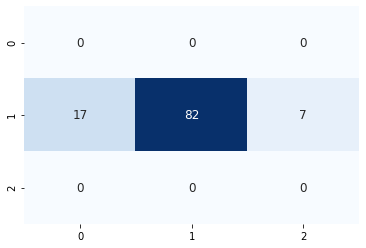

107/107 [==============================] - 0s 295us/sample - loss: 0.5501 - accuracy: 0.7383


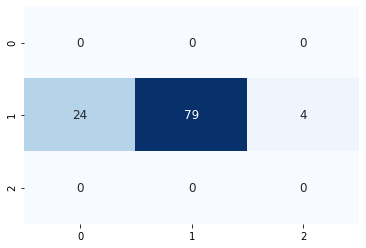

106/106 [==============================] - 0s 294us/sample - loss: 0.5182 - accuracy: 0.7830


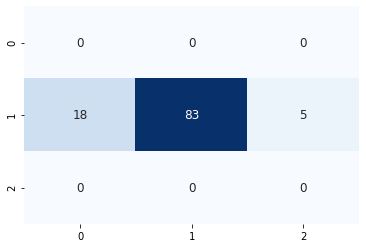

104/104 [==============================] - 0s 295us/sample - loss: 0.5746 - accuracy: 0.7500


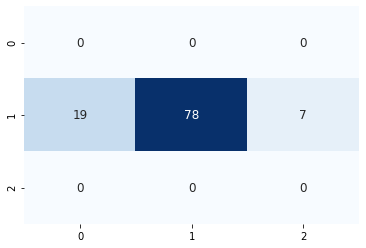

103/103 [==============================] - 0s 341us/sample - loss: 0.5937 - accuracy: 0.7476


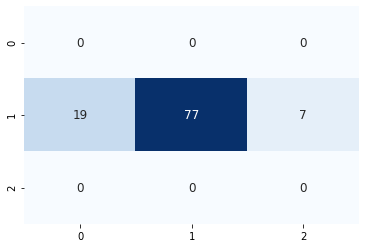

102/102 [==============================] - 0s 263us/sample - loss: 0.5730 - accuracy: 0.7549


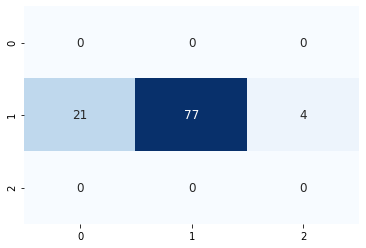

100/100 [==============================] - 0s 281us/sample - loss: 0.4969 - accuracy: 0.8600


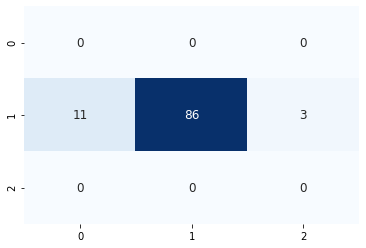

99/99 [==============================] - 0s 324us/sample - loss: 0.5424 - accuracy: 0.8182


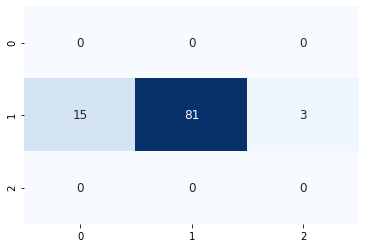

97/97 [==============================] - 0s 313us/sample - loss: 0.5817 - accuracy: 0.7320


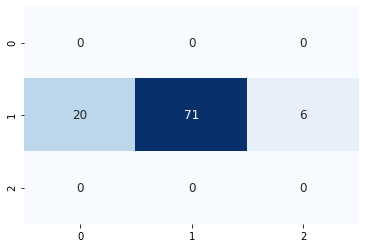

98/98 [==============================] - 0s 326us/sample - loss: 0.6218 - accuracy: 0.7245


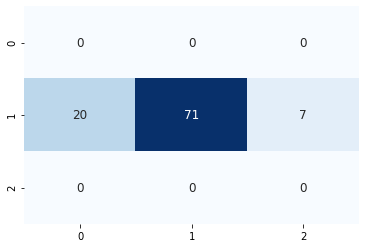

98/98 [==============================] - 0s 318us/sample - loss: 0.5060 - accuracy: 0.8265


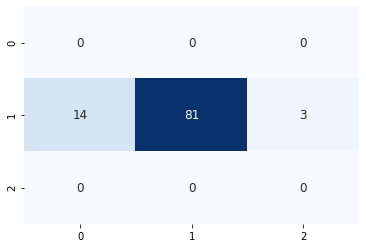

92/92 [==============================] - 0s 269us/sample - loss: 0.5987 - accuracy: 0.7609


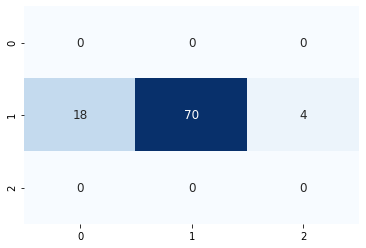

95/95 [==============================] - 0s 271us/sample - loss: 0.5844 - accuracy: 0.7684


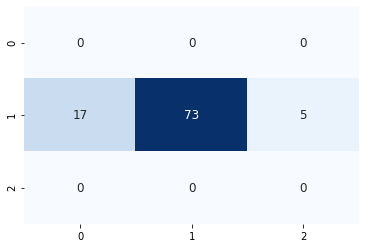

94/94 [==============================] - 0s 376us/sample - loss: 0.5764 - accuracy: 0.7447


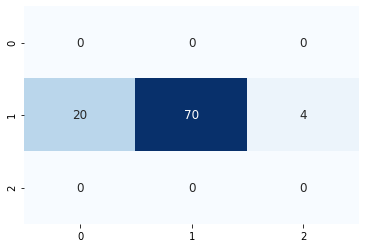

90/90 [==============================] - 0s 262us/sample - loss: 0.6273 - accuracy: 0.7444


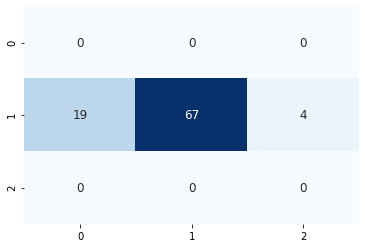

91/91 [==============================] - 0s 277us/sample - loss: 0.7140 - accuracy: 0.6923


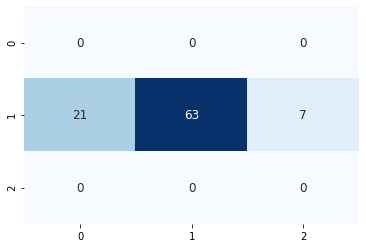

87/87 [==============================] - 0s 274us/sample - loss: 0.6543 - accuracy: 0.7356


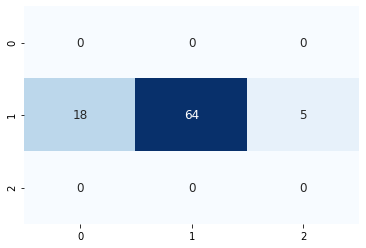

87/87 [==============================] - 0s 263us/sample - loss: 0.6008 - accuracy: 0.6897


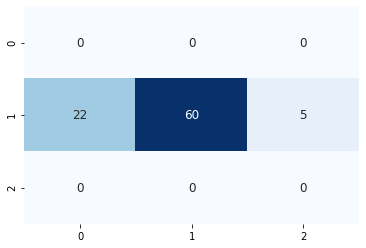

87/87 [==============================] - 0s 323us/sample - loss: 0.5996 - accuracy: 0.7701


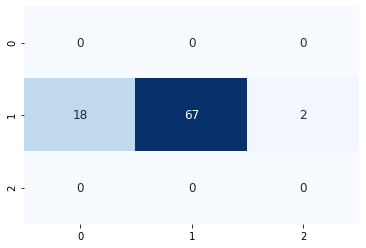

77/77 [==============================] - 0s 308us/sample - loss: 0.5734 - accuracy: 0.7532


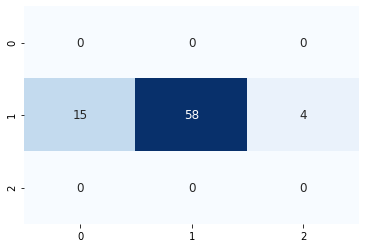

77/77 [==============================] - 0s 345us/sample - loss: 0.6235 - accuracy: 0.7532


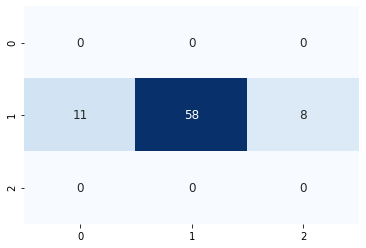

75/75 [==============================] - 0s 279us/sample - loss: 0.6117 - accuracy: 0.7600


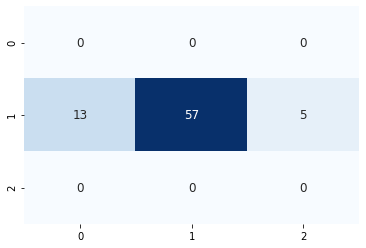

75/75 [==============================] - 0s 293us/sample - loss: 0.5958 - accuracy: 0.7467


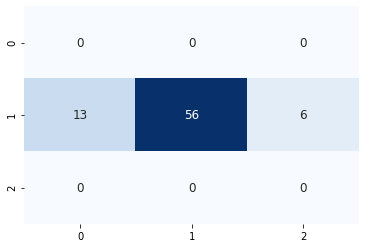

75/75 [==============================] - 0s 303us/sample - loss: 0.6495 - accuracy: 0.6800


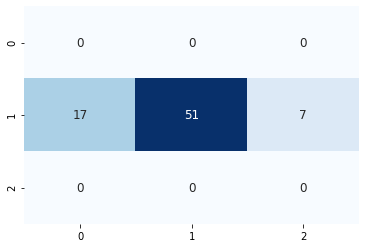

75/75 [==============================] - 0s 289us/sample - loss: 0.5964 - accuracy: 0.8000


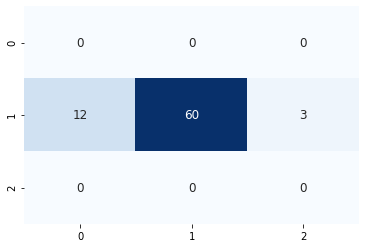

75/75 [==============================] - 0s 270us/sample - loss: 0.6132 - accuracy: 0.7333


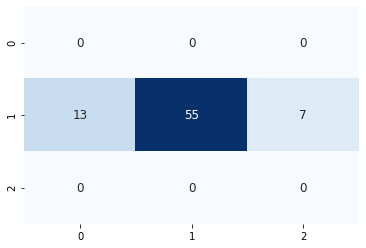

75/75 [==============================] - 0s 332us/sample - loss: 0.6301 - accuracy: 0.7200


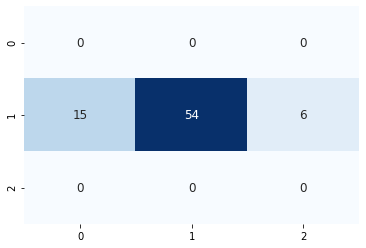

75/75 [==============================] - 0s 342us/sample - loss: 0.6977 - accuracy: 0.6533


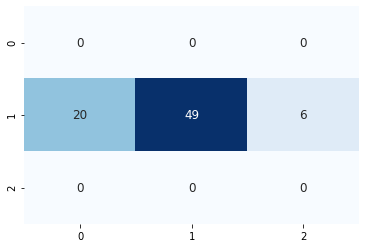

74/74 [==============================] - 0s 354us/sample - loss: 0.4957 - accuracy: 0.8108


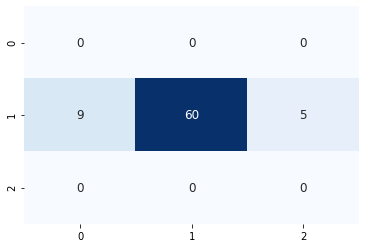

75/75 [==============================] - 0s 285us/sample - loss: 0.5614 - accuracy: 0.8400


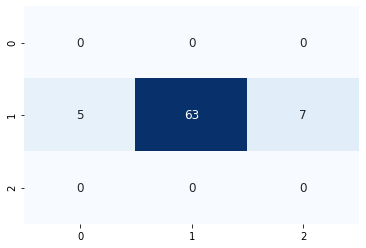

74/74 [==============================] - 0s 333us/sample - loss: 0.5444 - accuracy: 0.7432


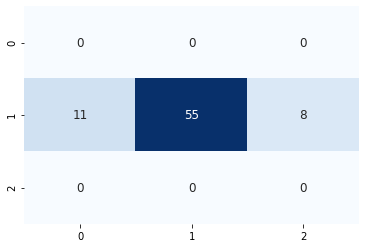

74/74 [==============================] - 0s 306us/sample - loss: 0.5586 - accuracy: 0.7973


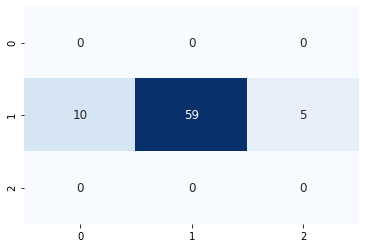

74/74 [==============================] - 0s 338us/sample - loss: 0.5783 - accuracy: 0.7568


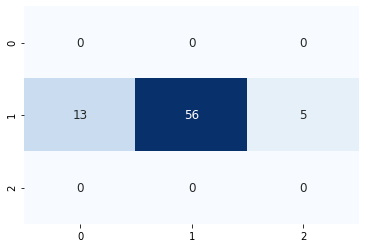

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3905 samples, validate on 1017 samples
Epoch 1/300
3905/3905 [==============================] - 3s 707us/sample - loss: 0.9015 - accuracy: 0.5834 - val_loss: 1.0194 - val_accuracy: 0.5202
Epoch 2/300
3905/3905 [==============================] - 1s 225us/sample - loss: 0.7236 - accuracy: 0.6883 - val_loss: 1.0651 - val_accuracy: 0.5162
Epoch 3/300
3905/3905 [==============================] - 1s 222us/sample - loss: 0.5981 - accuracy: 0.7698 - val_loss: 1.1386 - val_accuracy: 0.5202
Epoch 4/300
3905/3905 [==============================] - 1s 220us/sample - loss: 0.4812 - accuracy: 0.8236 - val_loss: 1.2421 - val_accuracy: 0.5074
Epoch 00004: early stopping
67/67 [==============================] - 0s 244us/sample - loss: 0.8625 - accuracy: 0.5522


3it [1:31:58, 1835.74s/it]
100%|██████████| 3/3 [00:06<00:00,  2.02s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 281.056640625 steps, validate for 73.455078125 steps
Epoch 1/300
282/281 [==============================] - 29s 103ms/step - loss: 0.9735 - accuracy: 0.5465 - val_loss: 1.0093 - val_accuracy: 0.5381
Epoch 2/300
282/281 [==============================] - 28s 100ms/step - loss: 0.8919 - accuracy: 0.5901 - val_loss: 1.0251 - val_accuracy: 0.5359
Epoch 3/300
282/281 [==============================] - 28s 100ms/step - loss: 0.8615 - accuracy: 0.6063 - val_loss: 1.0474 - val_accuracy: 0.5290
Epoch 4/300
282/281 [==============================] - 28s 100ms/step - loss: 0.8381 - accuracy: 0.6193 - val_loss: 1.0716 - val_accuracy: 0.5181
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 281.056640625 steps, validate for 73.455078125 steps
Epoch 1/300
282/281 [==============================] - 69s 245ms/step - loss: 0.8016 - accuracy: 0.6384 - val_loss: 1.1642 - val

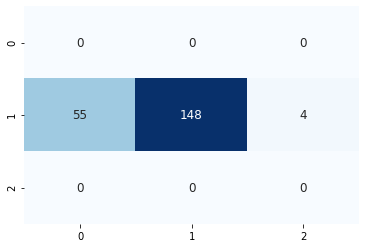

204/204 [==============================] - 0s 265us/sample - loss: 0.6319 - accuracy: 0.7304


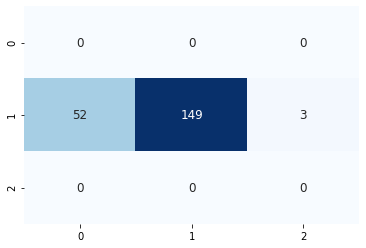

205/205 [==============================] - 0s 245us/sample - loss: 0.5999 - accuracy: 0.7220


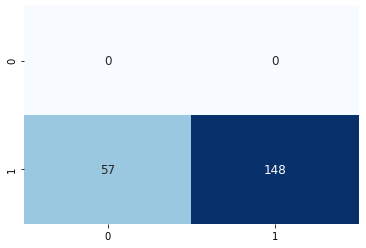

202/202 [==============================] - 0s 263us/sample - loss: 0.5576 - accuracy: 0.7574


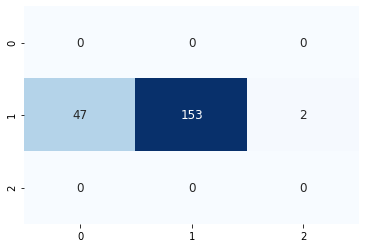

201/201 [==============================] - 0s 332us/sample - loss: 0.6269 - accuracy: 0.7114


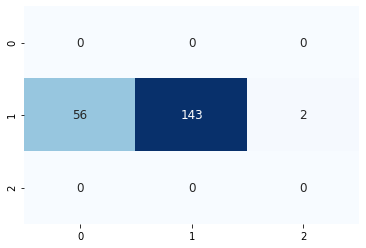

200/200 [==============================] - 0s 346us/sample - loss: 0.5115 - accuracy: 0.8150


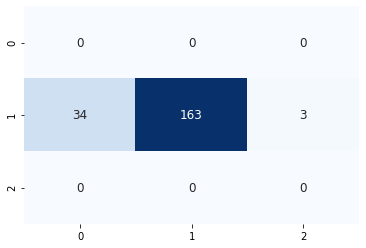

196/196 [==============================] - 0s 254us/sample - loss: 0.5323 - accuracy: 0.7653


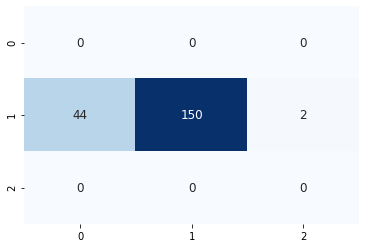

195/195 [==============================] - 0s 244us/sample - loss: 0.4997 - accuracy: 0.8308


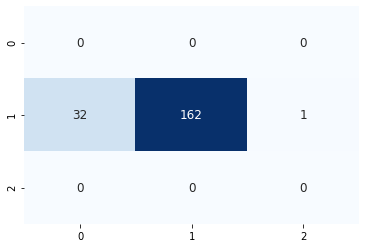

193/193 [==============================] - 0s 249us/sample - loss: 0.5134 - accuracy: 0.7876


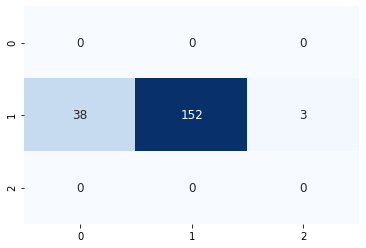

189/189 [==============================] - 0s 251us/sample - loss: 0.4508 - accuracy: 0.8148


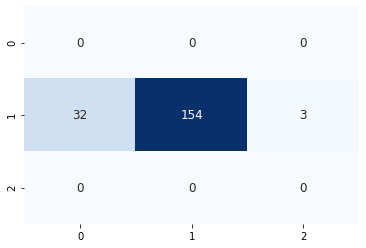

186/186 [==============================] - 0s 235us/sample - loss: 0.5163 - accuracy: 0.7903


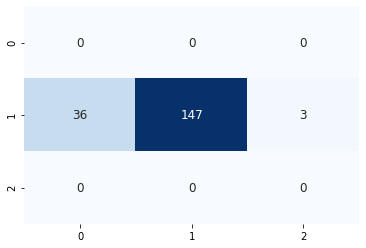

187/187 [==============================] - 0s 232us/sample - loss: 0.5399 - accuracy: 0.8021


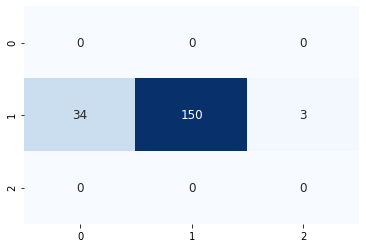

185/185 [==============================] - 0s 258us/sample - loss: 0.5677 - accuracy: 0.7514


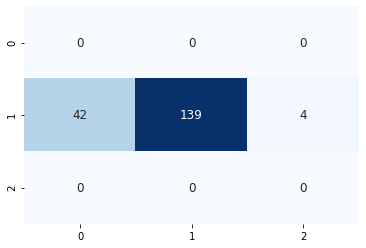

184/184 [==============================] - 0s 235us/sample - loss: 0.5199 - accuracy: 0.8152


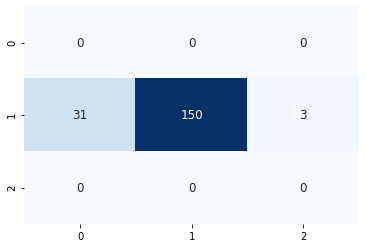

182/182 [==============================] - 0s 263us/sample - loss: 0.5549 - accuracy: 0.7912


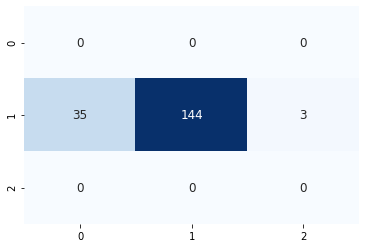

183/183 [==============================] - 0s 280us/sample - loss: 0.4998 - accuracy: 0.7869


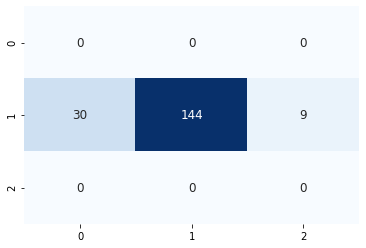

182/182 [==============================] - 0s 254us/sample - loss: 0.5135 - accuracy: 0.7967


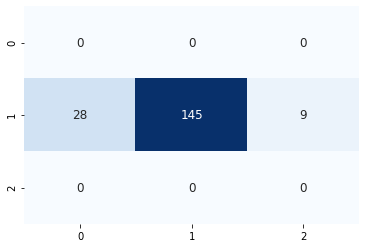

181/181 [==============================] - 0s 263us/sample - loss: 0.4762 - accuracy: 0.8287


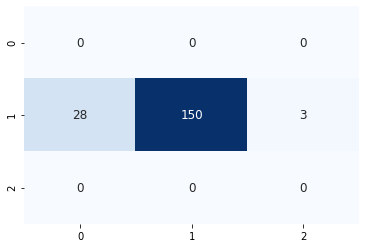

182/182 [==============================] - 0s 274us/sample - loss: 0.4849 - accuracy: 0.8352


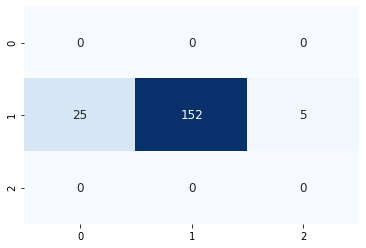

180/180 [==============================] - 0s 245us/sample - loss: 0.5223 - accuracy: 0.8056


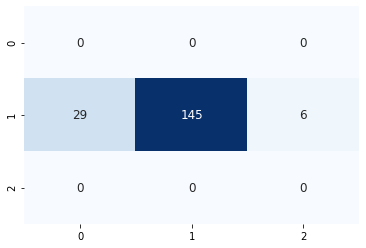

179/179 [==============================] - 0s 265us/sample - loss: 0.4657 - accuracy: 0.8436


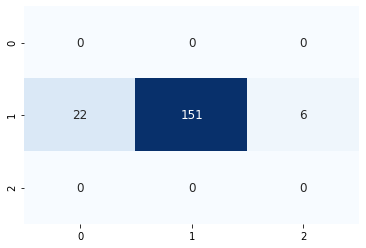

176/176 [==============================] - 0s 280us/sample - loss: 0.5249 - accuracy: 0.8068


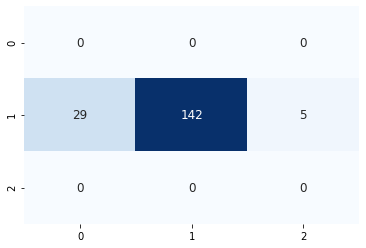

174/174 [==============================] - 0s 261us/sample - loss: 0.5374 - accuracy: 0.8046


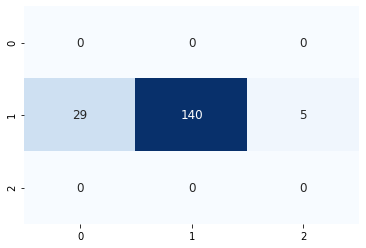

174/174 [==============================] - 0s 238us/sample - loss: 0.5130 - accuracy: 0.7931


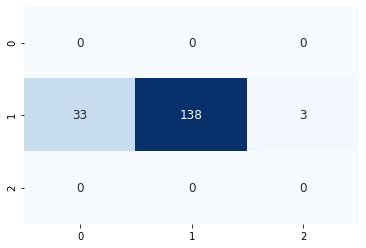

174/174 [==============================] - 0s 247us/sample - loss: 0.4780 - accuracy: 0.8391


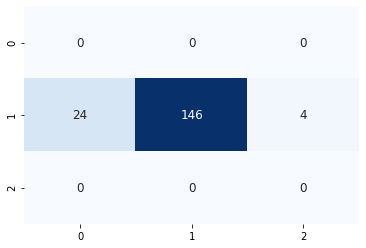

172/172 [==============================] - 0s 259us/sample - loss: 0.5149 - accuracy: 0.7907


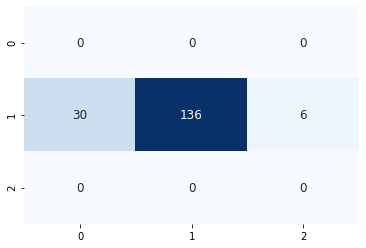

174/174 [==============================] - 0s 244us/sample - loss: 0.5174 - accuracy: 0.7989


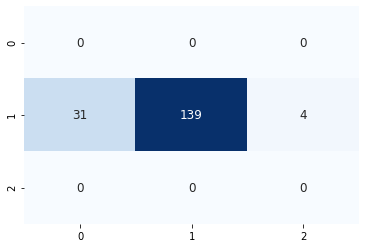

172/172 [==============================] - 0s 270us/sample - loss: 0.5118 - accuracy: 0.7733


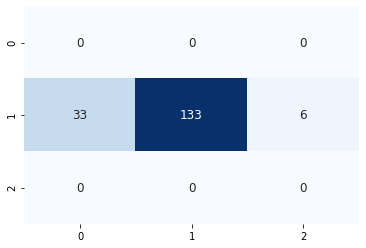

171/171 [==============================] - 0s 277us/sample - loss: 0.4940 - accuracy: 0.8070


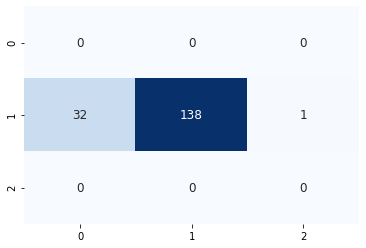

171/171 [==============================] - 0s 254us/sample - loss: 0.4381 - accuracy: 0.8480


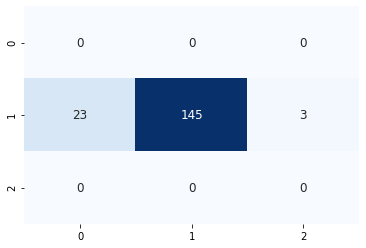

170/170 [==============================] - 0s 257us/sample - loss: 0.4543 - accuracy: 0.8059


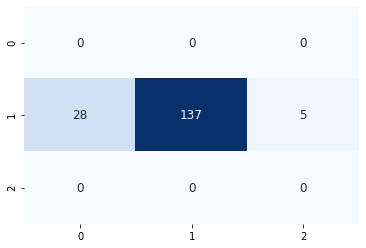

169/169 [==============================] - 0s 282us/sample - loss: 0.4170 - accuracy: 0.8935


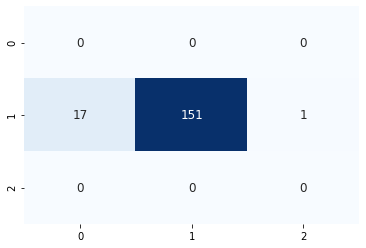

169/169 [==============================] - 0s 305us/sample - loss: 0.4210 - accuracy: 0.8698


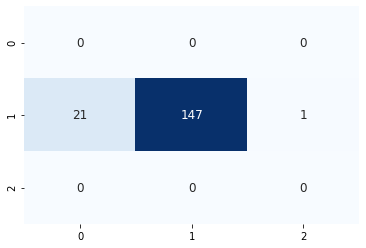

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3838 samples, validate on 989 samples
Epoch 1/300
3838/3838 [==============================] - 3s 659us/sample - loss: 0.9410 - accuracy: 0.5446 - val_loss: 1.0052 - val_accuracy: 0.5207
Epoch 2/300
3838/3838 [==============================] - 1s 219us/sample - loss: 0.8152 - accuracy: 0.6363 - val_loss: 1.0159 - val_accuracy: 0.5197
Epoch 3/300
3838/3838 [==============================] - 1s 225us/sample - loss: 0.7444 - accuracy: 0.6751 - val_loss: 1.0384 - val_accuracy: 0.5096
Epoch 4/300
3838/3838 [==============================] - 1s 234us/sample - loss: 0.6772 - accuracy: 0.7137 - val_loss: 1.0693 - val_accuracy: 0.4975
Epoch 00004: early stopping
162/162 [==============================] - 0s 154us/sample - loss: 0.5501 - accuracy: 0.8519


4it [2:01:37, 1818.74s/it]
100%|██████████| 3/3 [00:06<00:00,  2.01s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.490234375 steps, validate for 75.087890625 steps
Epoch 1/300
284/283 [==============================] - 29s 103ms/step - loss: 0.9399 - accuracy: 0.5696 - val_loss: 0.9838 - val_accuracy: 0.5511
Epoch 2/300
284/283 [==============================] - 28s 100ms/step - loss: 0.8789 - accuracy: 0.5982 - val_loss: 1.0279 - val_accuracy: 0.5292
Epoch 3/300
284/283 [==============================] - 28s 100ms/step - loss: 0.8474 - accuracy: 0.6144 - val_loss: 1.0562 - val_accuracy: 0.5281
Epoch 4/300
284/283 [==============================] - 29s 101ms/step - loss: 0.8229 - accuracy: 0.6266 - val_loss: 1.0826 - val_accuracy: 0.5154
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.490234375 steps, validate for 75.087890625 steps
Epoch 1/300
284/283 [==============================] - 69s 244ms/step - loss: 0.7847 - accuracy: 0.6501 - val_loss: 1.2929 - val

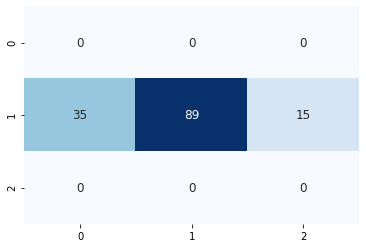

135/135 [==============================] - 0s 248us/sample - loss: 0.7326 - accuracy: 0.6444


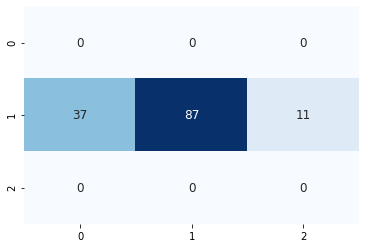

131/131 [==============================] - 0s 246us/sample - loss: 0.7950 - accuracy: 0.6412


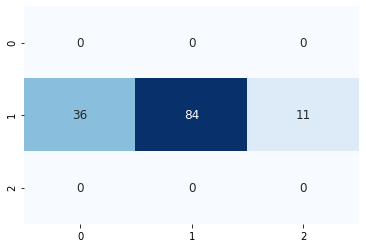

130/130 [==============================] - 0s 305us/sample - loss: 0.7249 - accuracy: 0.7000


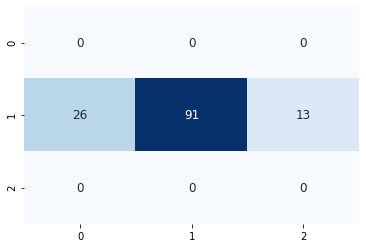

129/129 [==============================] - 0s 234us/sample - loss: 0.7397 - accuracy: 0.6667


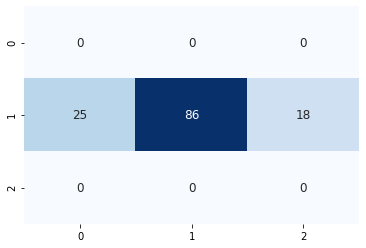

130/130 [==============================] - 0s 261us/sample - loss: 0.7745 - accuracy: 0.6308


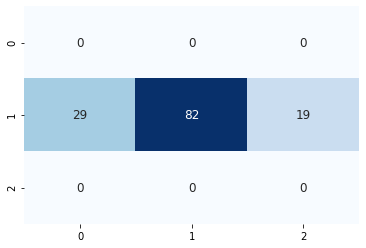

128/128 [==============================] - 0s 2ms/sample - loss: 0.7976 - accuracy: 0.6641


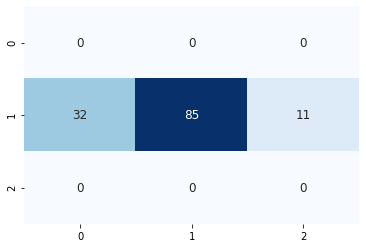

128/128 [==============================] - 0s 242us/sample - loss: 0.8403 - accuracy: 0.6094


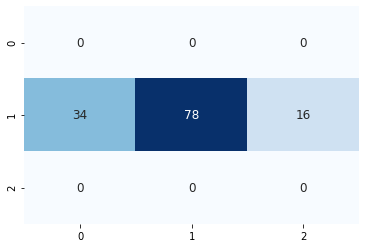

126/126 [==============================] - 0s 301us/sample - loss: 0.8122 - accuracy: 0.6429


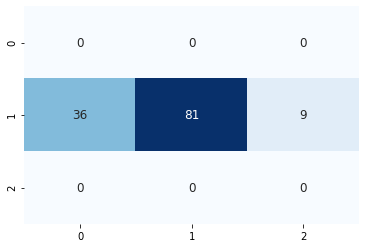

128/128 [==============================] - 0s 270us/sample - loss: 0.7506 - accuracy: 0.6562


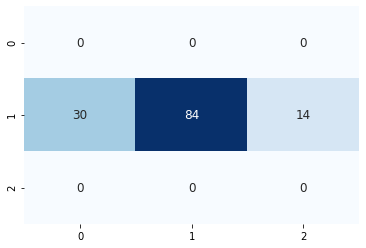

127/127 [==============================] - 0s 290us/sample - loss: 0.6468 - accuracy: 0.7402


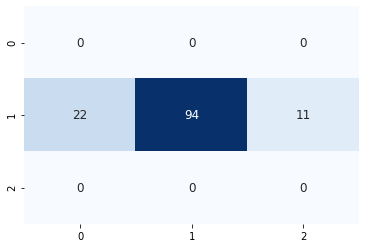

126/126 [==============================] - 0s 308us/sample - loss: 0.6458 - accuracy: 0.6984


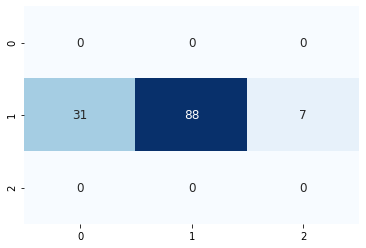

125/125 [==============================] - 0s 254us/sample - loss: 0.5994 - accuracy: 0.7440


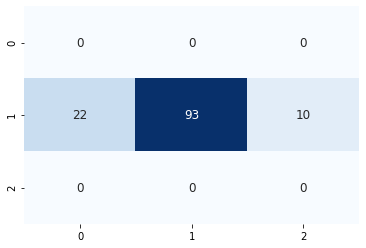

126/126 [==============================] - 0s 285us/sample - loss: 0.6138 - accuracy: 0.7540


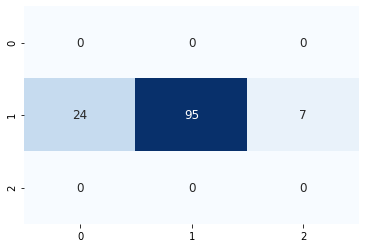

124/124 [==============================] - 0s 252us/sample - loss: 0.6369 - accuracy: 0.7177


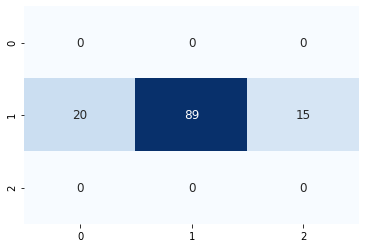

123/123 [==============================] - 0s 271us/sample - loss: 0.6485 - accuracy: 0.7398


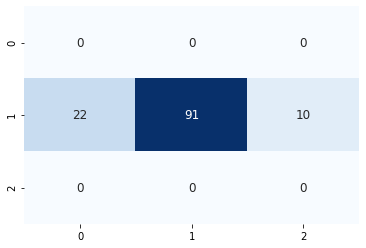

121/121 [==============================] - 0s 282us/sample - loss: 0.6087 - accuracy: 0.7190


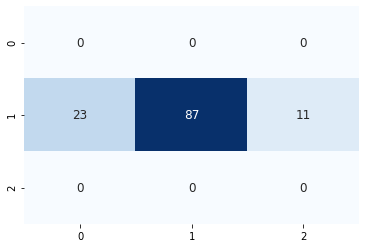

119/119 [==============================] - 0s 382us/sample - loss: 0.6868 - accuracy: 0.7059


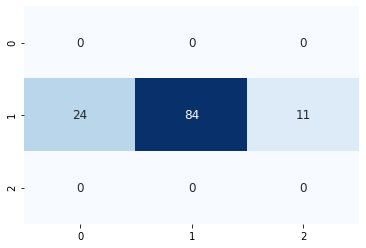

121/121 [==============================] - 0s 278us/sample - loss: 0.6799 - accuracy: 0.7273


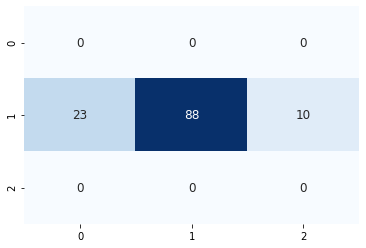

118/118 [==============================] - 0s 259us/sample - loss: 0.6542 - accuracy: 0.7288


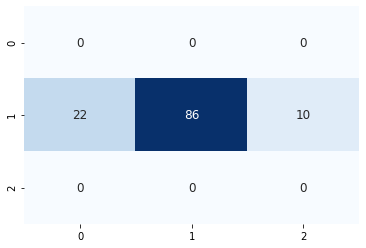

117/117 [==============================] - 0s 256us/sample - loss: 0.6234 - accuracy: 0.7350


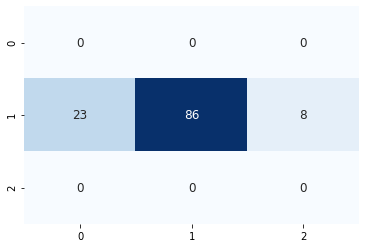

117/117 [==============================] - 0s 262us/sample - loss: 0.6318 - accuracy: 0.7436


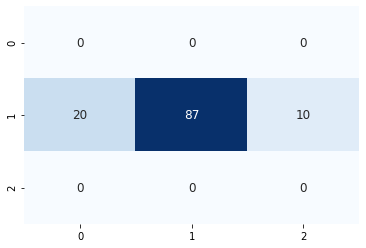

114/114 [==============================] - 0s 300us/sample - loss: 0.6046 - accuracy: 0.7719


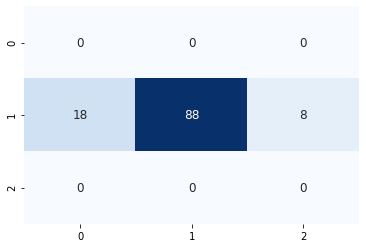

113/113 [==============================] - 0s 261us/sample - loss: 0.6247 - accuracy: 0.7345


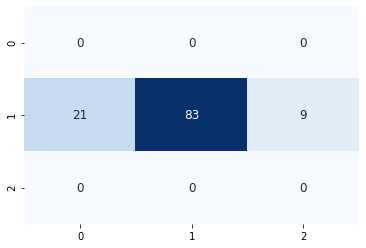

113/113 [==============================] - 0s 266us/sample - loss: 0.5854 - accuracy: 0.7876


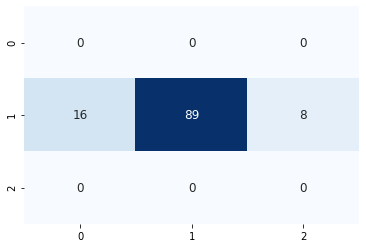

112/112 [==============================] - 0s 293us/sample - loss: 0.6336 - accuracy: 0.7232


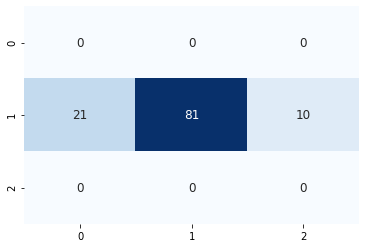

112/112 [==============================] - 0s 382us/sample - loss: 0.5693 - accuracy: 0.7500


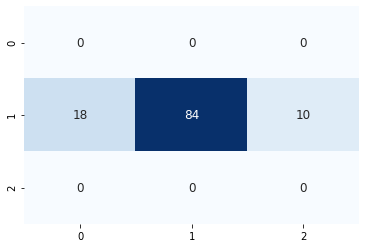

110/110 [==============================] - 0s 268us/sample - loss: 0.6305 - accuracy: 0.6909


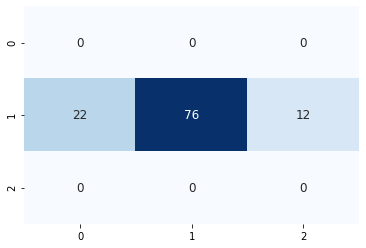

110/110 [==============================] - 0s 307us/sample - loss: 0.6194 - accuracy: 0.7091


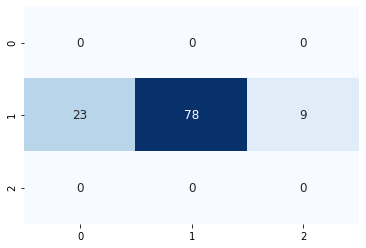

109/109 [==============================] - 0s 256us/sample - loss: 0.6469 - accuracy: 0.7156


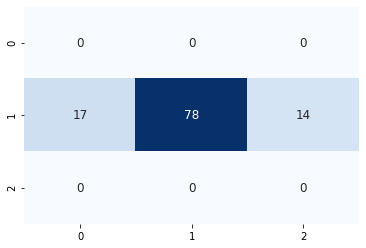

110/110 [==============================] - 0s 276us/sample - loss: 0.6017 - accuracy: 0.7364


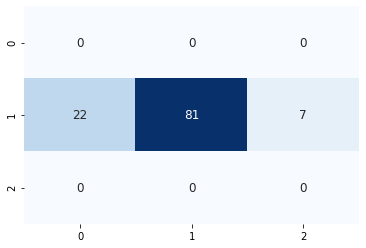

109/109 [==============================] - 0s 270us/sample - loss: 0.6779 - accuracy: 0.7431


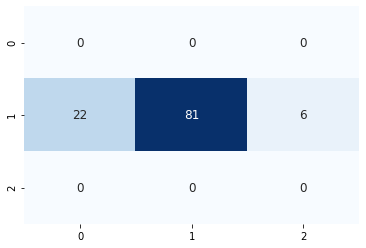

107/107 [==============================] - 0s 288us/sample - loss: 0.7422 - accuracy: 0.6822


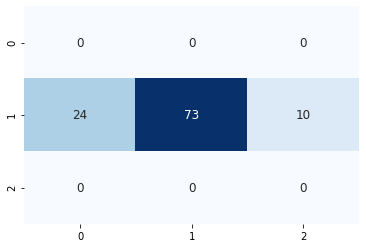

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3876 samples, validate on 1010 samples
Epoch 1/300
3876/3876 [==============================] - 3s 683us/sample - loss: 0.9288 - accuracy: 0.5769 - val_loss: 1.0116 - val_accuracy: 0.5000
Epoch 2/300
3876/3876 [==============================] - 1s 215us/sample - loss: 0.7565 - accuracy: 0.6858 - val_loss: 1.0213 - val_accuracy: 0.5010
Epoch 3/300
3876/3876 [==============================] - 1s 219us/sample - loss: 0.6424 - accuracy: 0.7508 - val_loss: 1.0560 - val_accuracy: 0.4901
Epoch 4/300
3876/3876 [==============================] - 1s 219us/sample - loss: 0.5423 - accuracy: 0.8055 - val_loss: 1.1265 - val_accuracy: 0.4861
Epoch 00004: early stopping
103/103 [==============================] - 0s 176us/sample - loss: 0.6807 - accuracy: 0.6796


5it [2:32:10, 1822.88s/it]
100%|██████████| 3/3 [00:06<00:00,  2.00s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.095703125 steps, validate for 75.435546875 steps
Epoch 1/300
286/285 [==============================] - 30s 104ms/step - loss: 0.9547 - accuracy: 0.5582 - val_loss: 1.0067 - val_accuracy: 0.5536
Epoch 2/300
286/285 [==============================] - 29s 101ms/step - loss: 0.8797 - accuracy: 0.5977 - val_loss: 1.0064 - val_accuracy: 0.5343
Epoch 3/300
286/285 [==============================] - 29s 102ms/step - loss: 0.8493 - accuracy: 0.6136 - val_loss: 1.0335 - val_accuracy: 0.5305
Epoch 4/300
286/285 [==============================] - 29s 101ms/step - loss: 0.8268 - accuracy: 0.6257 - val_loss: 1.0640 - val_accuracy: 0.5296
Epoch 5/300
286/285 [==============================] - 29s 102ms/step - loss: 0.8064 - accuracy: 0.6370 - val_loss: 1.0858 - val_accuracy: 0.5176
Epoch 00005: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.095703125 steps, validate for 7

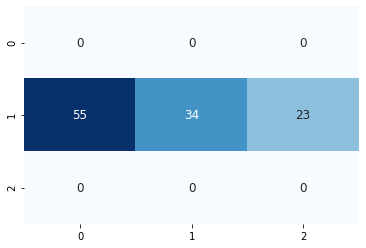

103/103 [==============================] - 0s 262us/sample - loss: 1.5624 - accuracy: 0.3301


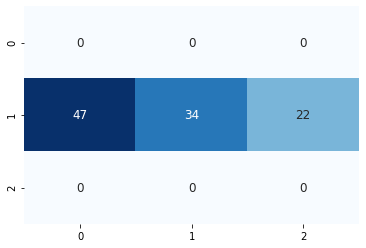

98/98 [==============================] - 0s 289us/sample - loss: 1.5301 - accuracy: 0.3367


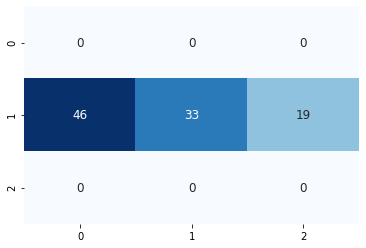

97/97 [==============================] - 0s 330us/sample - loss: 1.3742 - accuracy: 0.3918


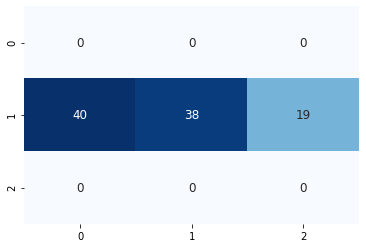

96/96 [==============================] - 0s 2ms/sample - loss: 1.4038 - accuracy: 0.3750


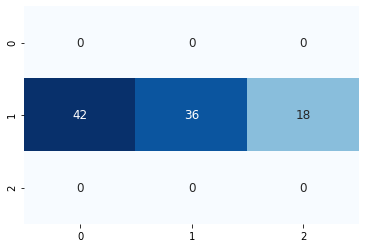

96/96 [==============================] - 0s 291us/sample - loss: 1.4278 - accuracy: 0.3125


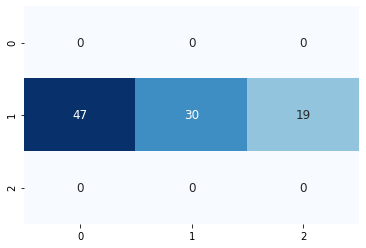

96/96 [==============================] - 0s 235us/sample - loss: 1.3552 - accuracy: 0.4167


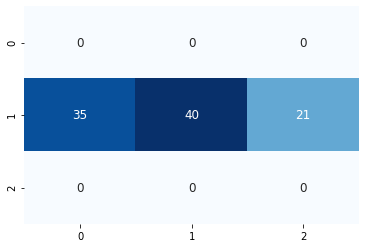

92/92 [==============================] - 0s 304us/sample - loss: 1.4167 - accuracy: 0.3043


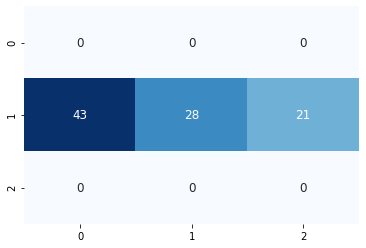

91/91 [==============================] - 0s 329us/sample - loss: 1.4261 - accuracy: 0.3626


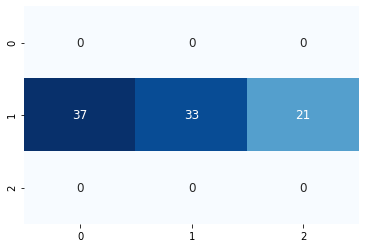

92/92 [==============================] - 0s 324us/sample - loss: 1.3854 - accuracy: 0.4022


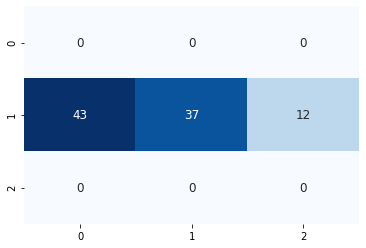

91/91 [==============================] - 0s 299us/sample - loss: 1.3000 - accuracy: 0.4176


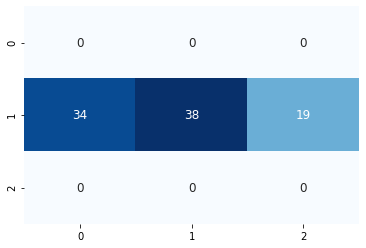

90/90 [==============================] - 0s 368us/sample - loss: 1.3573 - accuracy: 0.3667


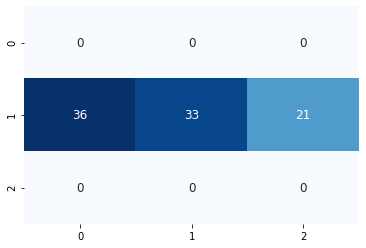

90/90 [==============================] - 0s 264us/sample - loss: 1.3719 - accuracy: 0.3556


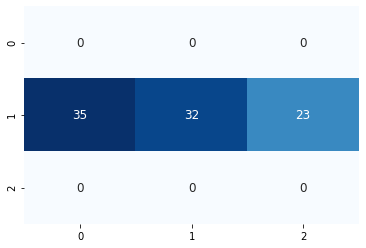

89/89 [==============================] - 0s 274us/sample - loss: 1.3525 - accuracy: 0.3146


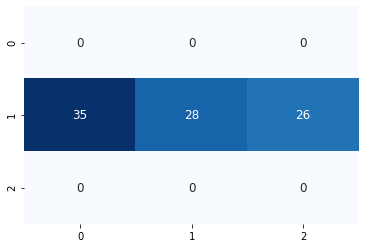

89/89 [==============================] - 0s 263us/sample - loss: 1.4248 - accuracy: 0.3596


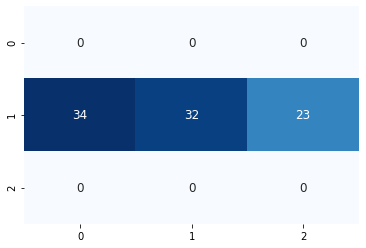

88/88 [==============================] - 0s 276us/sample - loss: 1.2542 - accuracy: 0.4432


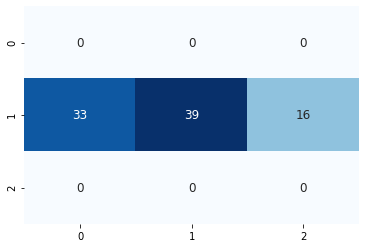

88/88 [==============================] - 0s 329us/sample - loss: 1.3051 - accuracy: 0.4205


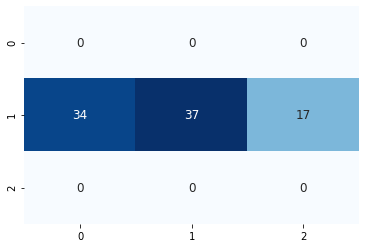

88/88 [==============================] - 0s 285us/sample - loss: 1.5208 - accuracy: 0.2955


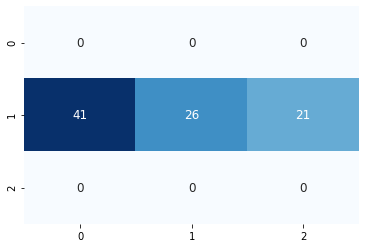

89/89 [==============================] - 0s 299us/sample - loss: 1.5013 - accuracy: 0.3034


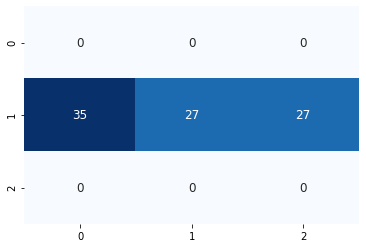

87/87 [==============================] - 0s 288us/sample - loss: 1.4678 - accuracy: 0.2989


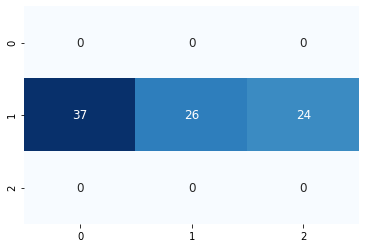

88/88 [==============================] - 0s 271us/sample - loss: 1.4614 - accuracy: 0.3295


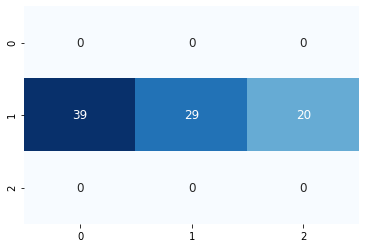

88/88 [==============================] - 0s 275us/sample - loss: 1.4526 - accuracy: 0.3409


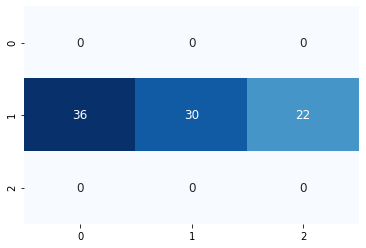

86/86 [==============================] - 0s 561us/sample - loss: 1.3022 - accuracy: 0.4186


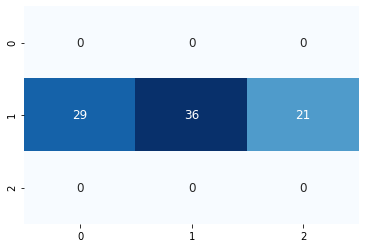

86/86 [==============================] - 0s 270us/sample - loss: 1.3748 - accuracy: 0.3023


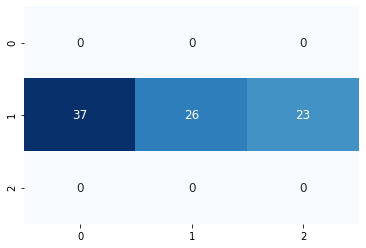

87/87 [==============================] - 0s 304us/sample - loss: 1.3389 - accuracy: 0.4253


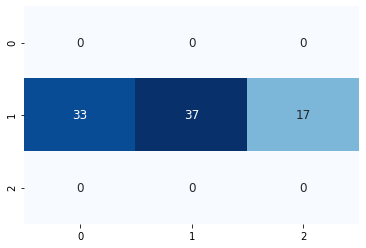

87/87 [==============================] - 0s 336us/sample - loss: 1.3118 - accuracy: 0.3563


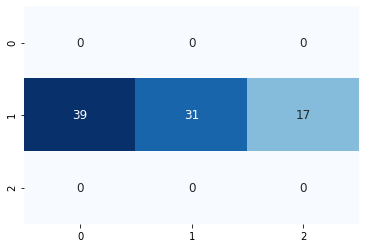

86/86 [==============================] - 0s 255us/sample - loss: 1.4248 - accuracy: 0.4070


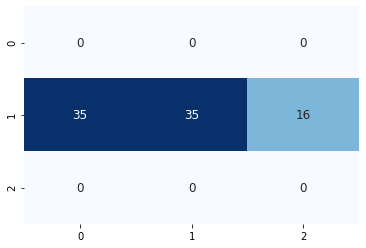

87/87 [==============================] - 0s 267us/sample - loss: 1.4148 - accuracy: 0.3793


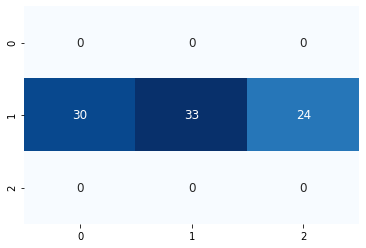

85/85 [==============================] - 0s 296us/sample - loss: 1.5228 - accuracy: 0.3529


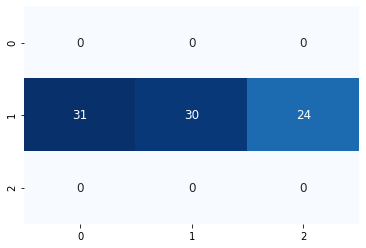

87/87 [==============================] - 0s 537us/sample - loss: 1.5261 - accuracy: 0.3448


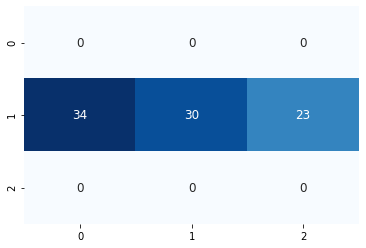

86/86 [==============================] - 0s 287us/sample - loss: 1.4100 - accuracy: 0.3605


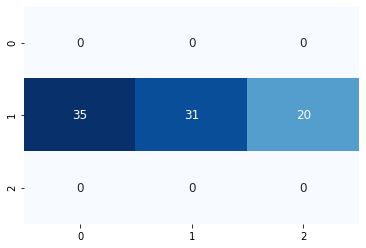

86/86 [==============================] - 0s 288us/sample - loss: 1.5391 - accuracy: 0.3023


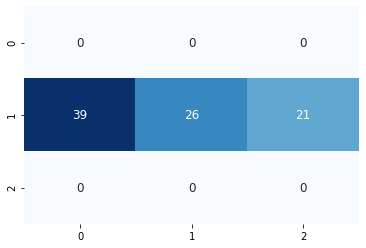

86/86 [==============================] - 0s 297us/sample - loss: 1.4225 - accuracy: 0.4070


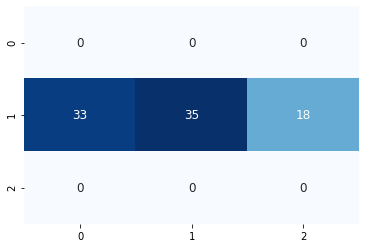

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3892 samples, validate on 1015 samples
Epoch 1/300
3892/3892 [==============================] - 3s 706us/sample - loss: 0.9515 - accuracy: 0.5635 - val_loss: 1.0171 - val_accuracy: 0.5251
Epoch 2/300
3892/3892 [==============================] - 1s 218us/sample - loss: 0.8160 - accuracy: 0.6518 - val_loss: 1.0177 - val_accuracy: 0.5320
Epoch 3/300
3892/3892 [==============================] - 1s 207us/sample - loss: 0.7350 - accuracy: 0.6868 - val_loss: 1.0355 - val_accuracy: 0.5399
Epoch 4/300
3892/3892 [==============================] - 1s 212us/sample - loss: 0.6591 - accuracy: 0.7312 - val_loss: 1.0645 - val_accuracy: 0.5419
Epoch 00004: early stopping
82/82 [==============================] - 0s 163us/sample - loss: 0.6555 - accuracy: 0.7317


6it [3:02:52, 1828.67s/it]
100%|██████████| 3/3 [00:05<00:00,  1.99s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.486328125 steps, validate for 74.458984375 steps
Epoch 1/300
283/282 [==============================] - 29s 104ms/step - loss: 0.9445 - accuracy: 0.5656 - val_loss: 1.0022 - val_accuracy: 0.5429
Epoch 2/300
283/282 [==============================] - 29s 101ms/step - loss: 0.8770 - accuracy: 0.6000 - val_loss: 1.0093 - val_accuracy: 0.5394
Epoch 3/300
283/282 [==============================] - 29s 101ms/step - loss: 0.8449 - accuracy: 0.6153 - val_loss: 1.0523 - val_accuracy: 0.5329
Epoch 4/300
283/282 [==============================] - 29s 102ms/step - loss: 0.8199 - accuracy: 0.6296 - val_loss: 1.0970 - val_accuracy: 0.5204
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.486328125 steps, validate for 74.458984375 steps
Epoch 1/300
283/282 [==============================] - 70s 249ms/step - loss: 0.7807 - accuracy: 0.6515 - val_loss: 1.1248 - val

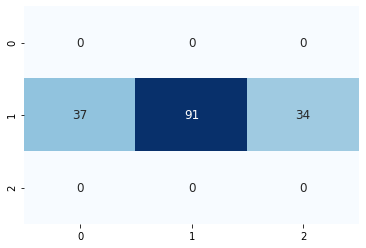

160/160 [==============================] - 0s 1ms/sample - loss: 0.9663 - accuracy: 0.5500


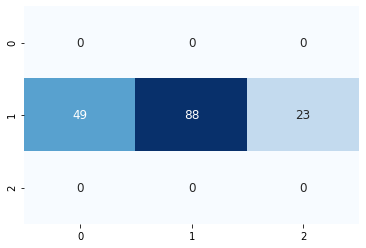

158/158 [==============================] - 0s 280us/sample - loss: 1.0502 - accuracy: 0.5506


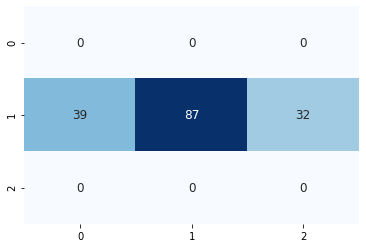

155/155 [==============================] - 0s 273us/sample - loss: 1.0033 - accuracy: 0.5548


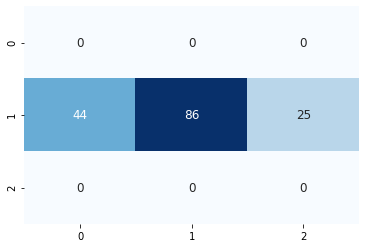

153/153 [==============================] - 0s 290us/sample - loss: 1.0955 - accuracy: 0.5490


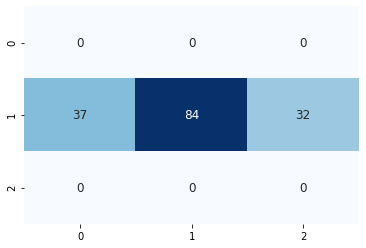

153/153 [==============================] - 0s 279us/sample - loss: 1.0424 - accuracy: 0.5752


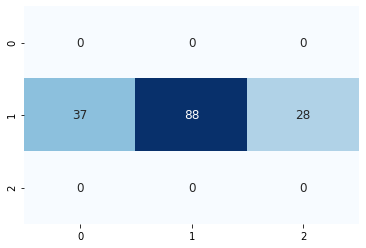

150/150 [==============================] - 0s 247us/sample - loss: 1.0409 - accuracy: 0.5667


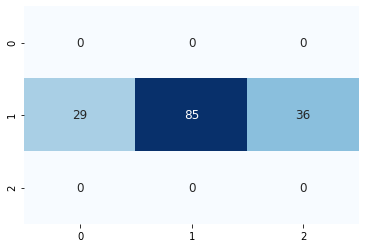

150/150 [==============================] - 0s 259us/sample - loss: 1.1229 - accuracy: 0.5200


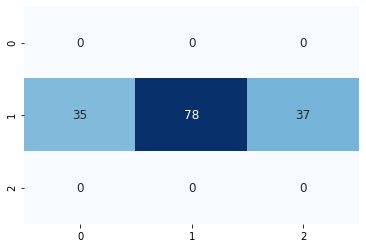

152/152 [==============================] - 0s 260us/sample - loss: 1.2049 - accuracy: 0.4474


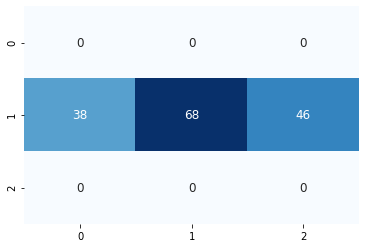

150/150 [==============================] - 0s 284us/sample - loss: 1.2850 - accuracy: 0.3867


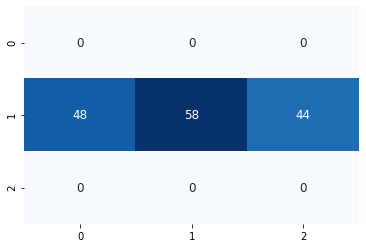

150/150 [==============================] - 0s 256us/sample - loss: 1.2178 - accuracy: 0.4267


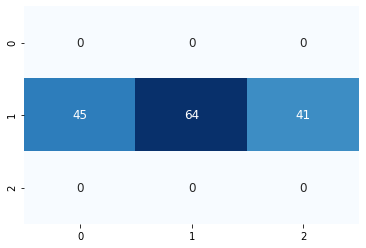

147/147 [==============================] - 0s 281us/sample - loss: 1.1542 - accuracy: 0.4626


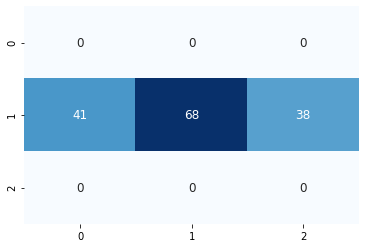

148/148 [==============================] - 0s 257us/sample - loss: 1.2161 - accuracy: 0.4797


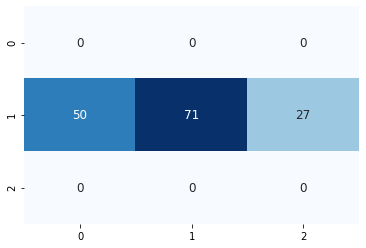

146/146 [==============================] - 0s 534us/sample - loss: 1.2784 - accuracy: 0.4315


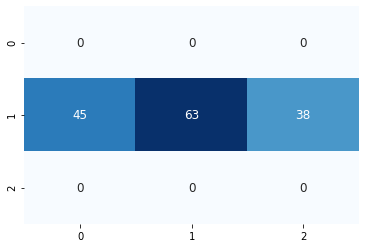

145/145 [==============================] - 0s 256us/sample - loss: 1.3228 - accuracy: 0.4345


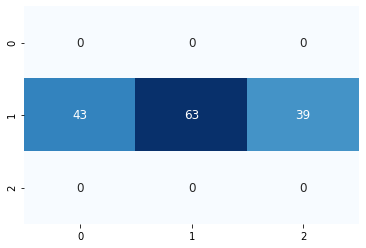

146/146 [==============================] - 0s 269us/sample - loss: 1.2919 - accuracy: 0.4041


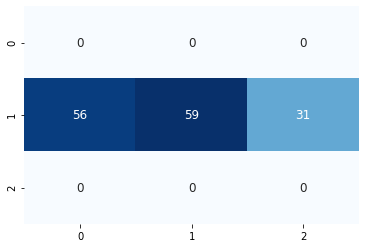

145/145 [==============================] - 0s 251us/sample - loss: 1.3641 - accuracy: 0.3862


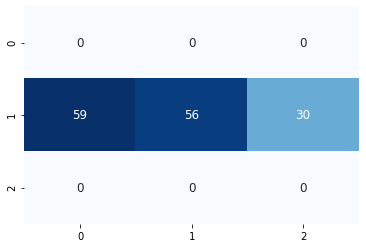

143/143 [==============================] - 0s 275us/sample - loss: 1.4534 - accuracy: 0.3287


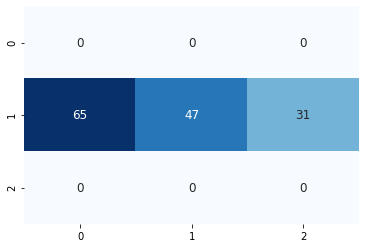

141/141 [==============================] - 0s 295us/sample - loss: 1.5300 - accuracy: 0.3333


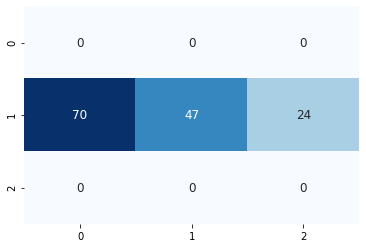

141/141 [==============================] - 0s 278us/sample - loss: 1.4703 - accuracy: 0.3404


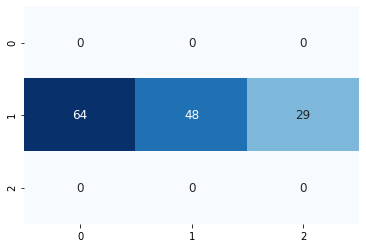

142/142 [==============================] - 0s 247us/sample - loss: 1.4981 - accuracy: 0.3732


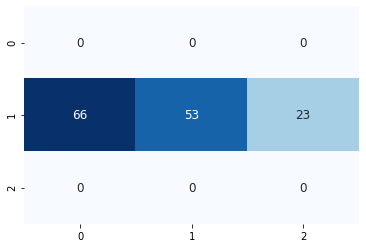

142/142 [==============================] - 0s 254us/sample - loss: 1.5581 - accuracy: 0.3099


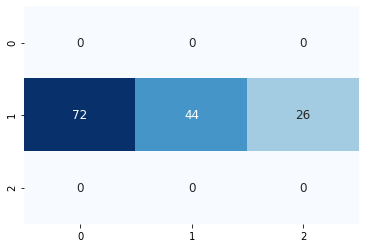

143/143 [==============================] - 0s 250us/sample - loss: 1.5217 - accuracy: 0.3566


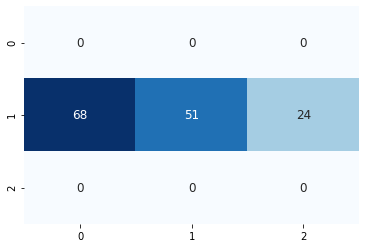

140/140 [==============================] - 0s 244us/sample - loss: 1.4074 - accuracy: 0.4000


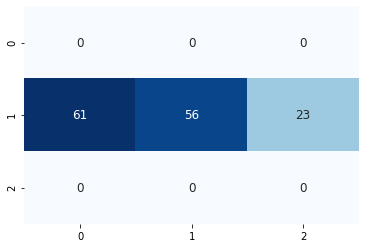

143/143 [==============================] - 0s 254us/sample - loss: 1.4825 - accuracy: 0.3427


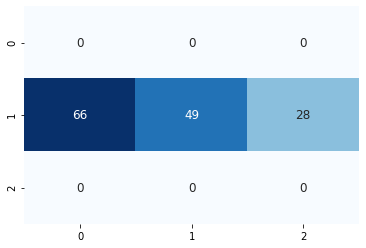

142/142 [==============================] - 0s 253us/sample - loss: 1.5073 - accuracy: 0.3873


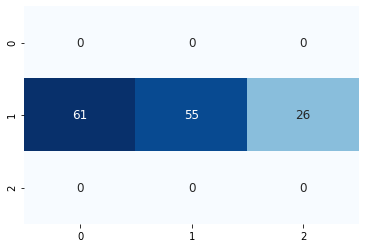

141/141 [==============================] - 0s 269us/sample - loss: 1.4505 - accuracy: 0.3688


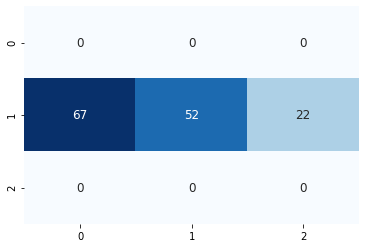

140/140 [==============================] - 0s 296us/sample - loss: 1.5185 - accuracy: 0.3571


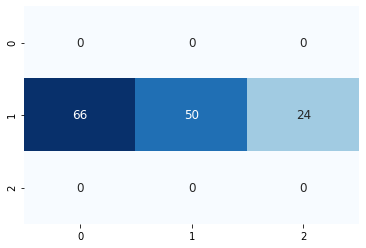

140/140 [==============================] - 0s 300us/sample - loss: 1.5070 - accuracy: 0.4000


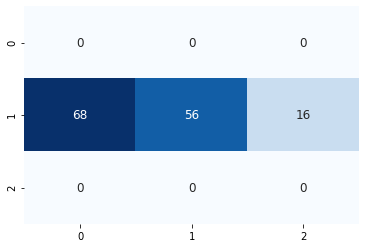

139/139 [==============================] - 0s 262us/sample - loss: 1.6054 - accuracy: 0.3885


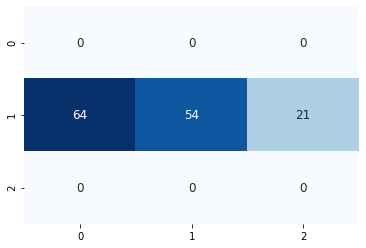

138/138 [==============================] - 0s 259us/sample - loss: 1.6315 - accuracy: 0.3913


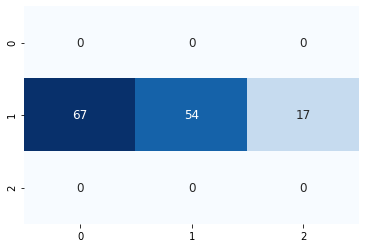

139/139 [==============================] - 0s 278us/sample - loss: 1.5153 - accuracy: 0.3885


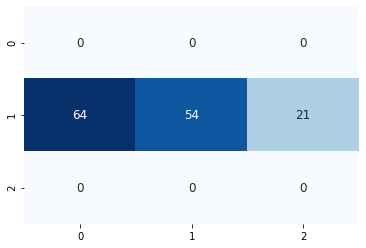

139/139 [==============================] - 0s 262us/sample - loss: 1.5574 - accuracy: 0.3309


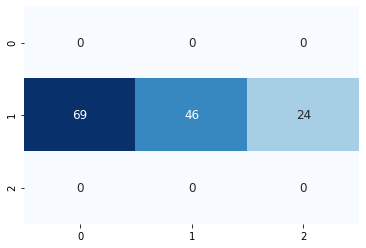

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3858 samples, validate on 1001 samples
Epoch 1/300
3858/3858 [==============================] - 3s 723us/sample - loss: 0.9551 - accuracy: 0.5607 - val_loss: 0.9901 - val_accuracy: 0.5405
Epoch 2/300
3858/3858 [==============================] - 1s 244us/sample - loss: 0.7990 - accuracy: 0.6659 - val_loss: 0.9943 - val_accuracy: 0.5534
Epoch 3/300
3858/3858 [==============================] - 1s 235us/sample - loss: 0.7123 - accuracy: 0.7066 - val_loss: 1.0174 - val_accuracy: 0.5504
Epoch 4/300
3858/3858 [==============================] - 1s 231us/sample - loss: 0.6325 - accuracy: 0.7512 - val_loss: 1.0558 - val_accuracy: 0.5435
Epoch 00004: early stopping
130/130 [==============================] - 0s 186us/sample - loss: 1.1326 - accuracy: 0.4538


7it [3:32:17, 1809.64s/it]
100%|██████████| 3/3 [00:06<00:00,  2.06s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.162109375 steps, validate for 74.951171875 steps
Epoch 1/300
286/285 [==============================] - 30s 104ms/step - loss: 0.9633 - accuracy: 0.5495 - val_loss: 0.9993 - val_accuracy: 0.5497
Epoch 2/300
286/285 [==============================] - 29s 101ms/step - loss: 0.8796 - accuracy: 0.5951 - val_loss: 0.9984 - val_accuracy: 0.5412
Epoch 3/300
286/285 [==============================] - 29s 101ms/step - loss: 0.8492 - accuracy: 0.6132 - val_loss: 1.0361 - val_accuracy: 0.5361
Epoch 4/300
286/285 [==============================] - 29s 101ms/step - loss: 0.8252 - accuracy: 0.6258 - val_loss: 1.0540 - val_accuracy: 0.5260
Epoch 5/300
286/285 [==============================] - 29s 101ms/step - loss: 0.8055 - accuracy: 0.6363 - val_loss: 1.0851 - val_accuracy: 0.5119
Epoch 00005: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.162109375 steps, validate for 7

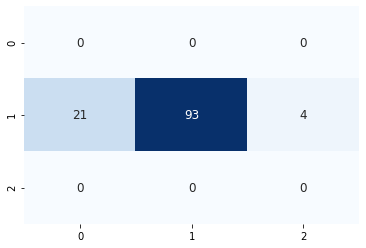

116/116 [==============================] - 0s 234us/sample - loss: 0.4785 - accuracy: 0.8534


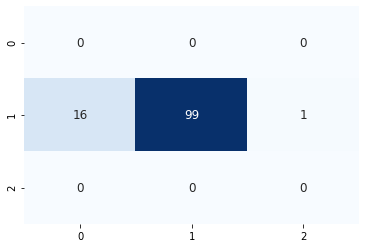

114/114 [==============================] - 0s 452us/sample - loss: 0.4275 - accuracy: 0.8684


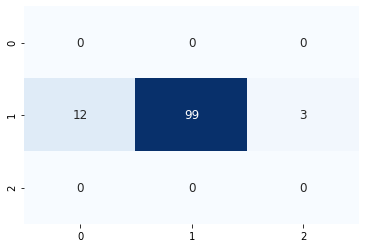

112/112 [==============================] - 0s 263us/sample - loss: 0.4603 - accuracy: 0.8571


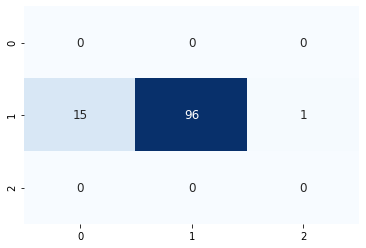

110/110 [==============================] - 0s 263us/sample - loss: 0.6140 - accuracy: 0.7545


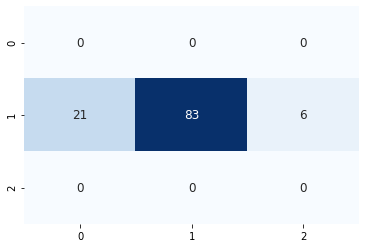

109/109 [==============================] - 0s 318us/sample - loss: 0.5464 - accuracy: 0.8073


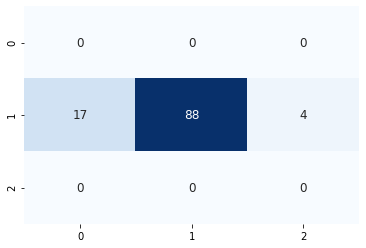

108/108 [==============================] - 0s 269us/sample - loss: 0.5069 - accuracy: 0.8148


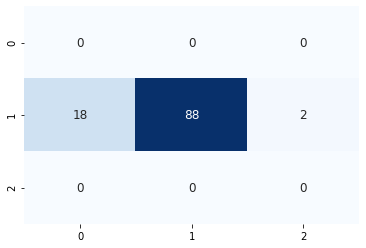

105/105 [==============================] - 0s 284us/sample - loss: 0.6122 - accuracy: 0.7524


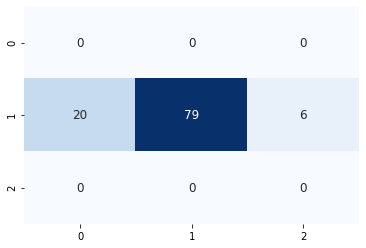

102/102 [==============================] - 0s 331us/sample - loss: 0.5465 - accuracy: 0.7843


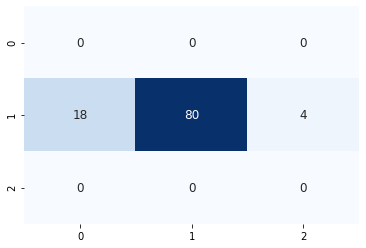

101/101 [==============================] - 0s 347us/sample - loss: 0.6318 - accuracy: 0.7327


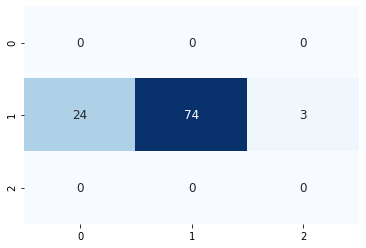

99/99 [==============================] - 0s 275us/sample - loss: 0.5732 - accuracy: 0.7374


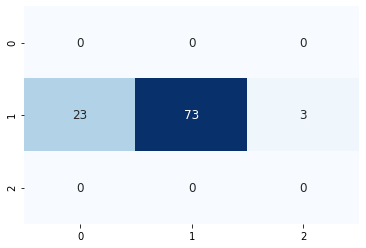

96/96 [==============================] - 0s 2ms/sample - loss: 0.5547 - accuracy: 0.7500


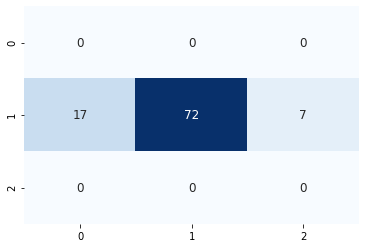

94/94 [==============================] - 0s 264us/sample - loss: 0.6083 - accuracy: 0.6489


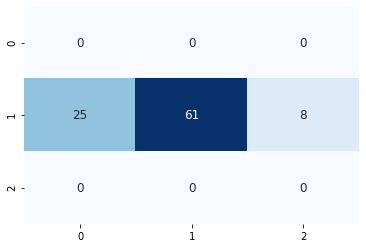

94/94 [==============================] - 0s 271us/sample - loss: 0.6726 - accuracy: 0.6596


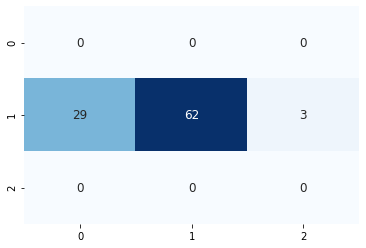

93/93 [==============================] - 0s 275us/sample - loss: 0.6987 - accuracy: 0.7097


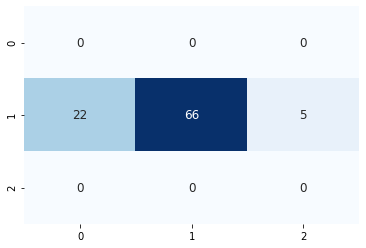

92/92 [==============================] - 0s 272us/sample - loss: 0.5587 - accuracy: 0.7826


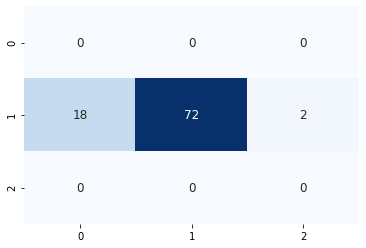

93/93 [==============================] - 0s 289us/sample - loss: 0.6723 - accuracy: 0.6774


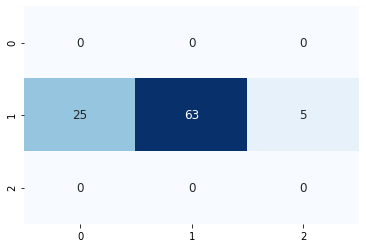

93/93 [==============================] - 0s 290us/sample - loss: 0.6811 - accuracy: 0.7097


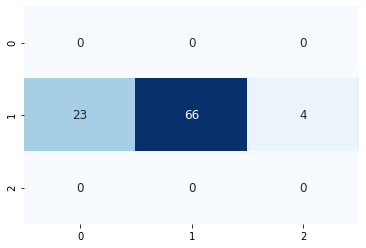

92/92 [==============================] - 0s 289us/sample - loss: 0.5014 - accuracy: 0.8043


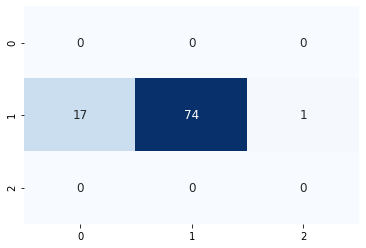

92/92 [==============================] - 0s 257us/sample - loss: 0.5611 - accuracy: 0.7500


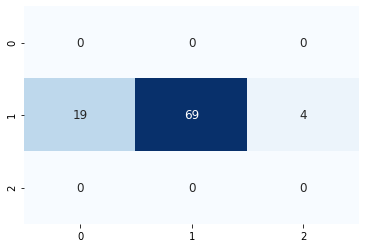

91/91 [==============================] - 0s 267us/sample - loss: 0.5913 - accuracy: 0.7582


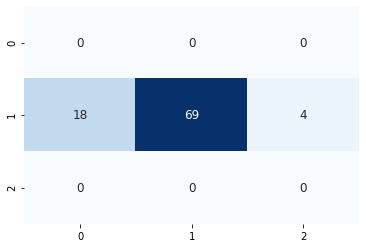

92/92 [==============================] - 0s 266us/sample - loss: 0.6026 - accuracy: 0.7065


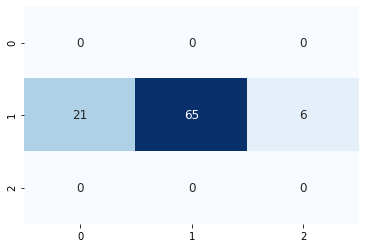

91/91 [==============================] - 0s 255us/sample - loss: 0.5883 - accuracy: 0.7253


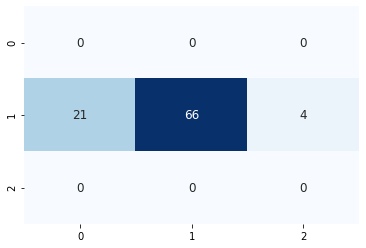

90/90 [==============================] - 0s 329us/sample - loss: 0.5398 - accuracy: 0.7444


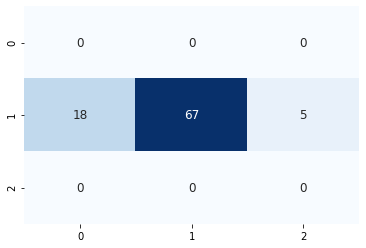

89/89 [==============================] - 0s 269us/sample - loss: 0.4831 - accuracy: 0.7978


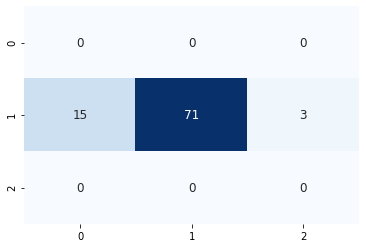

88/88 [==============================] - 0s 272us/sample - loss: 0.5510 - accuracy: 0.7955


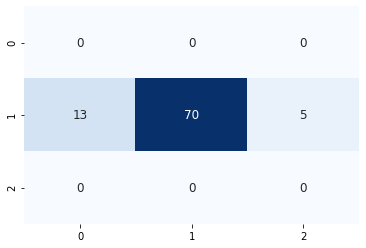

89/89 [==============================] - 0s 292us/sample - loss: 0.5385 - accuracy: 0.7865


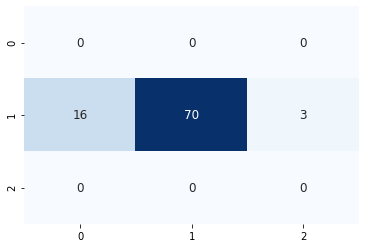

89/89 [==============================] - 0s 303us/sample - loss: 0.5067 - accuracy: 0.7865


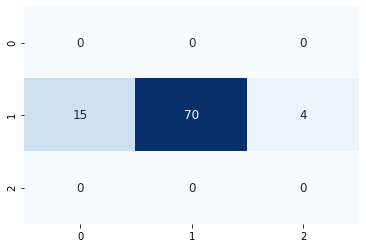

89/89 [==============================] - 0s 270us/sample - loss: 0.4683 - accuracy: 0.8202


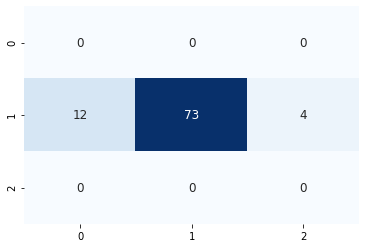

90/90 [==============================] - 0s 280us/sample - loss: 0.5664 - accuracy: 0.7556


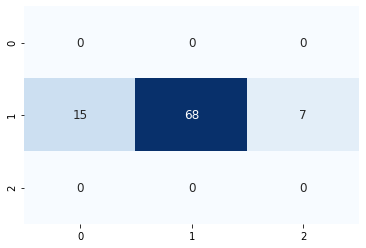

90/90 [==============================] - 0s 333us/sample - loss: 0.5525 - accuracy: 0.7889


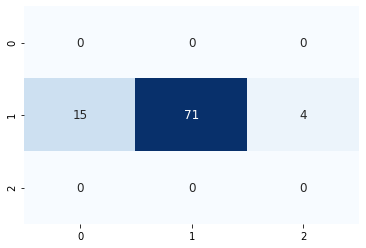

91/91 [==============================] - 0s 264us/sample - loss: 0.4660 - accuracy: 0.8132


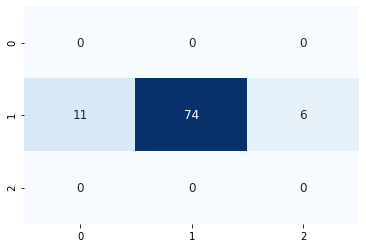

89/89 [==============================] - 0s 297us/sample - loss: 0.5251 - accuracy: 0.7865


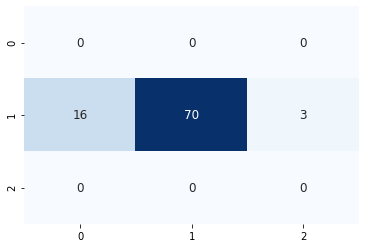

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3894 samples, validate on 1008 samples
Epoch 1/300
3894/3894 [==============================] - 3s 774us/sample - loss: 0.8850 - accuracy: 0.5822 - val_loss: 1.0400 - val_accuracy: 0.5417
Epoch 2/300
3894/3894 [==============================] - 1s 225us/sample - loss: 0.5887 - accuracy: 0.7797 - val_loss: 1.1067 - val_accuracy: 0.5188
Epoch 3/300
3894/3894 [==============================] - 1s 218us/sample - loss: 0.4142 - accuracy: 0.8734 - val_loss: 1.2305 - val_accuracy: 0.5169
Epoch 4/300
3894/3894 [==============================] - 1s 233us/sample - loss: 0.2968 - accuracy: 0.9191 - val_loss: 1.3698 - val_accuracy: 0.4990
Epoch 00004: early stopping
87/87 [==============================] - 0s 179us/sample - loss: 0.6587 - accuracy: 0.7126


8it [4:06:25, 1880.89s/it]
100%|██████████| 3/3 [00:06<00:00,  2.01s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.861328125 steps, validate for 75.658203125 steps
Epoch 1/300
284/283 [==============================] - 30s 104ms/step - loss: 0.9508 - accuracy: 0.5586 - val_loss: 0.9813 - val_accuracy: 0.5560
Epoch 2/300
284/283 [==============================] - 29s 101ms/step - loss: 0.8817 - accuracy: 0.5972 - val_loss: 0.9944 - val_accuracy: 0.5375
Epoch 3/300
284/283 [==============================] - 29s 101ms/step - loss: 0.8508 - accuracy: 0.6138 - val_loss: 1.0222 - val_accuracy: 0.5362
Epoch 4/300
284/283 [==============================] - 29s 101ms/step - loss: 0.8260 - accuracy: 0.6273 - val_loss: 1.0502 - val_accuracy: 0.5153
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.861328125 steps, validate for 75.658203125 steps
Epoch 1/300
284/283 [==============================] - 70s 246ms/step - loss: 0.7870 - accuracy: 0.6492 - val_loss: 1.0923 - val

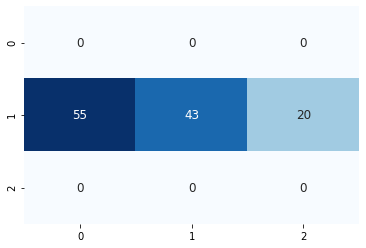

113/113 [==============================] - 0s 228us/sample - loss: 1.2298 - accuracy: 0.3451


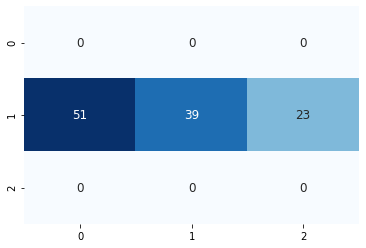

112/112 [==============================] - 0s 238us/sample - loss: 1.3128 - accuracy: 0.3482


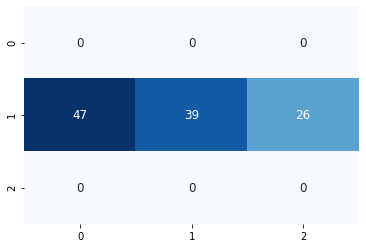

112/112 [==============================] - 0s 265us/sample - loss: 1.1771 - accuracy: 0.3482


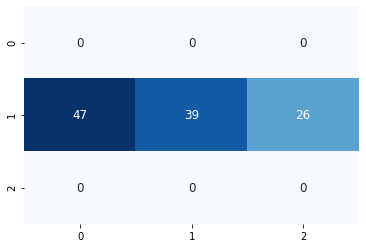

111/111 [==============================] - 0s 260us/sample - loss: 1.1219 - accuracy: 0.4144


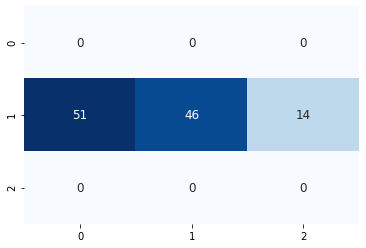

111/111 [==============================] - 0s 271us/sample - loss: 1.1858 - accuracy: 0.3874


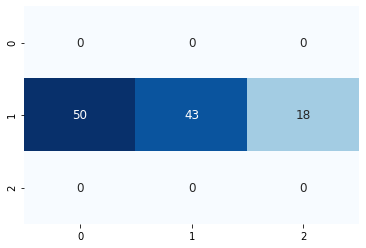

108/108 [==============================] - 0s 400us/sample - loss: 1.0455 - accuracy: 0.4722


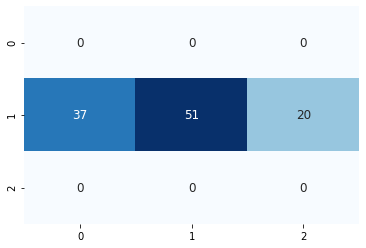

109/109 [==============================] - 0s 362us/sample - loss: 1.1114 - accuracy: 0.4679


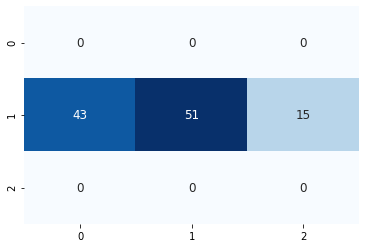

106/106 [==============================] - 0s 255us/sample - loss: 1.0723 - accuracy: 0.4811


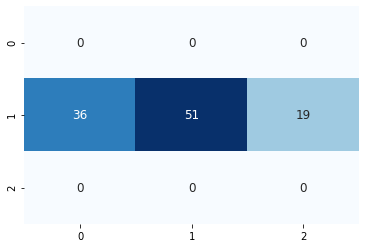

104/104 [==============================] - 0s 288us/sample - loss: 0.9951 - accuracy: 0.5192


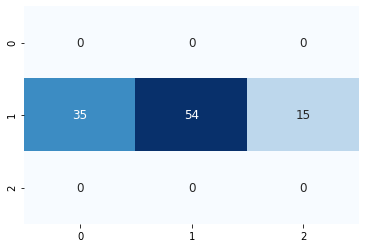

104/104 [==============================] - 0s 326us/sample - loss: 1.1234 - accuracy: 0.4519


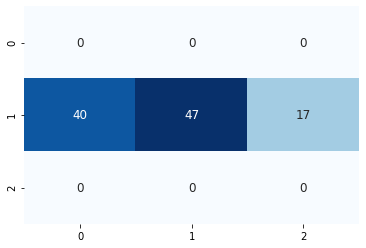

105/105 [==============================] - 0s 273us/sample - loss: 1.0883 - accuracy: 0.4952


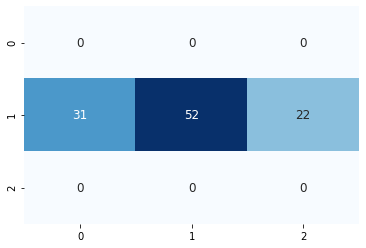

104/104 [==============================] - 0s 310us/sample - loss: 1.1217 - accuracy: 0.4712


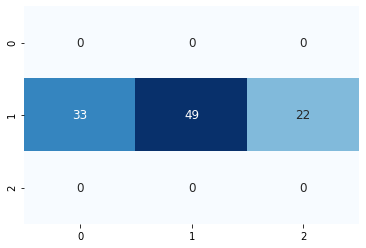

104/104 [==============================] - 0s 286us/sample - loss: 0.9780 - accuracy: 0.5769


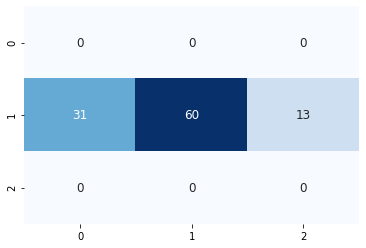

103/103 [==============================] - 0s 267us/sample - loss: 1.0386 - accuracy: 0.5243


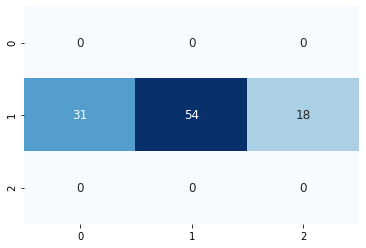

102/102 [==============================] - 0s 289us/sample - loss: 1.0888 - accuracy: 0.4902


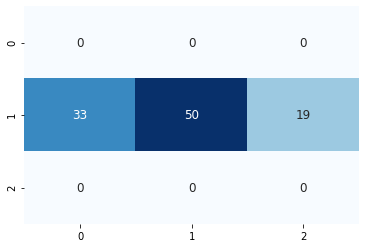

101/101 [==============================] - 0s 262us/sample - loss: 1.1085 - accuracy: 0.4950


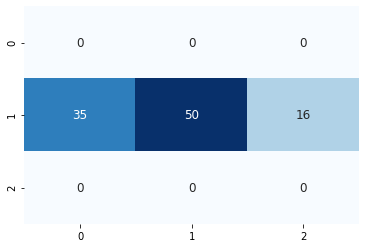

102/102 [==============================] - 0s 294us/sample - loss: 1.0020 - accuracy: 0.4608


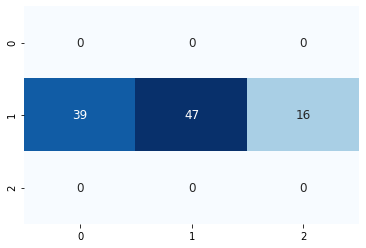

105/105 [==============================] - 0s 273us/sample - loss: 1.1151 - accuracy: 0.4762


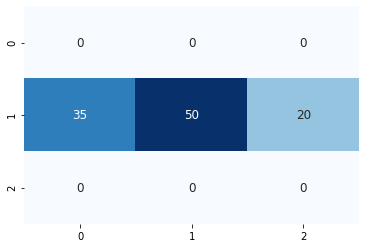

103/103 [==============================] - 0s 269us/sample - loss: 1.0598 - accuracy: 0.5146


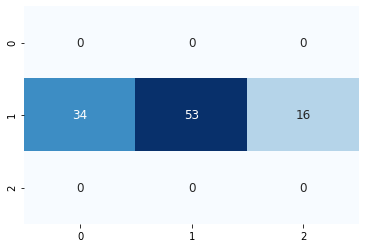

104/104 [==============================] - 0s 289us/sample - loss: 1.1028 - accuracy: 0.4904


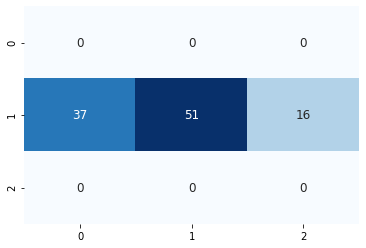

105/105 [==============================] - 0s 267us/sample - loss: 1.1116 - accuracy: 0.4762


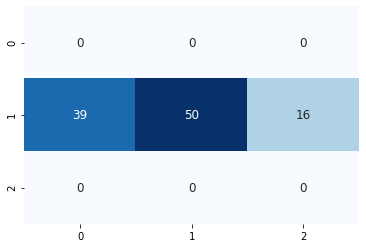

103/103 [==============================] - 0s 293us/sample - loss: 1.0363 - accuracy: 0.5243


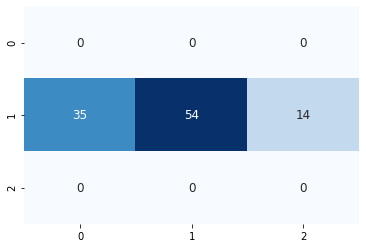

104/104 [==============================] - 0s 289us/sample - loss: 1.0499 - accuracy: 0.4712


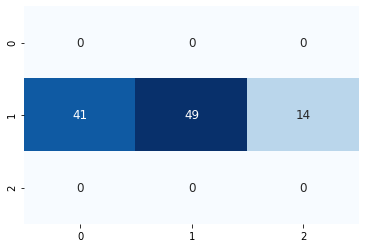

105/105 [==============================] - 0s 267us/sample - loss: 1.0058 - accuracy: 0.4476


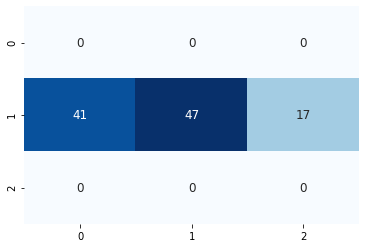

105/105 [==============================] - 0s 289us/sample - loss: 1.0635 - accuracy: 0.5238


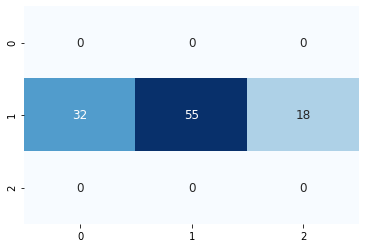

105/105 [==============================] - 0s 267us/sample - loss: 0.9920 - accuracy: 0.5143


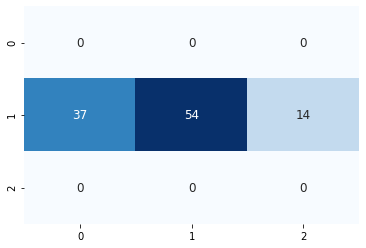

106/106 [==============================] - 0s 272us/sample - loss: 0.9770 - accuracy: 0.5377


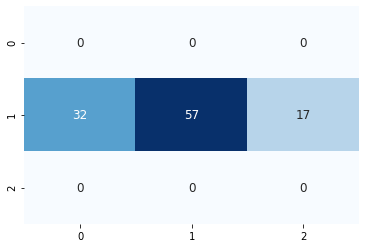

104/104 [==============================] - 0s 282us/sample - loss: 0.9785 - accuracy: 0.5192


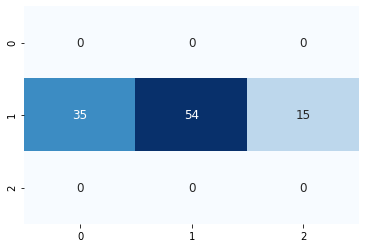

106/106 [==============================] - 0s 269us/sample - loss: 0.8973 - accuracy: 0.5566


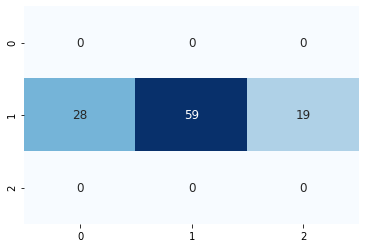

107/107 [==============================] - 0s 288us/sample - loss: 1.0384 - accuracy: 0.4953


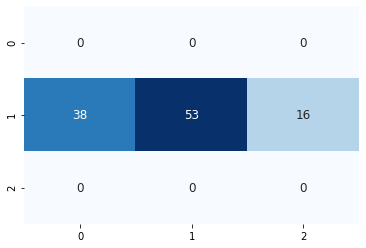

108/108 [==============================] - 0s 275us/sample - loss: 0.9828 - accuracy: 0.6019


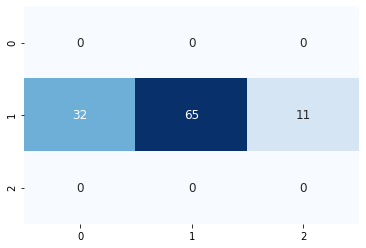

106/106 [==============================] - 0s 263us/sample - loss: 1.0462 - accuracy: 0.5189


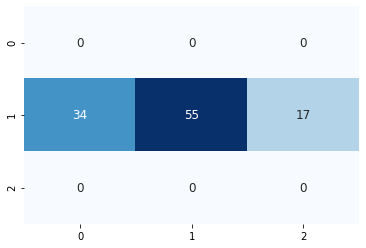

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3874 samples, validate on 1017 samples
Epoch 1/300
3874/3874 [==============================] - 3s 661us/sample - loss: 0.9620 - accuracy: 0.5529 - val_loss: 1.0130 - val_accuracy: 0.5320
Epoch 2/300
3874/3874 [==============================] - 1s 211us/sample - loss: 0.8144 - accuracy: 0.6520 - val_loss: 1.0141 - val_accuracy: 0.5438
Epoch 3/300
3874/3874 [==============================] - 1s 218us/sample - loss: 0.7207 - accuracy: 0.6998 - val_loss: 1.0329 - val_accuracy: 0.5398
Epoch 4/300
3874/3874 [==============================] - 1s 238us/sample - loss: 0.6425 - accuracy: 0.7470 - val_loss: 1.0690 - val_accuracy: 0.5398
Epoch 00004: early stopping
98/98 [==============================] - 0s 166us/sample - loss: 0.6019 - accuracy: 0.7245


9it [4:35:18, 1836.65s/it]
100%|██████████| 3/3 [00:06<00:00,  2.07s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 286.533203125 steps, validate for 75.24609375 steps
Epoch 1/300
287/286 [==============================] - 29s 101ms/step - loss: 0.9410 - accuracy: 0.5664 - val_loss: 0.9920 - val_accuracy: 0.5544
Epoch 2/300
287/286 [==============================] - 29s 100ms/step - loss: 0.8774 - accuracy: 0.5990 - val_loss: 1.0207 - val_accuracy: 0.5399
Epoch 3/300
287/286 [==============================] - 29s 100ms/step - loss: 0.8477 - accuracy: 0.6138 - val_loss: 1.0508 - val_accuracy: 0.5373
Epoch 4/300
287/286 [==============================] - 28s 99ms/step - loss: 0.8240 - accuracy: 0.6285 - val_loss: 1.0605 - val_accuracy: 0.5254
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 286.533203125 steps, validate for 75.24609375 steps
Epoch 1/300
287/286 [==============================] - 70s 243ms/step - loss: 0.7848 - accuracy: 0.6500 - val_loss: 1.1039 - val_ac

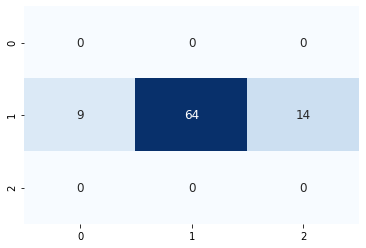

84/84 [==============================] - 0s 235us/sample - loss: 0.6421 - accuracy: 0.7619


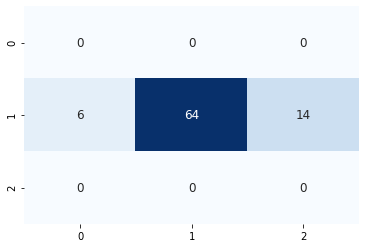

82/82 [==============================] - 0s 303us/sample - loss: 0.5894 - accuracy: 0.7805


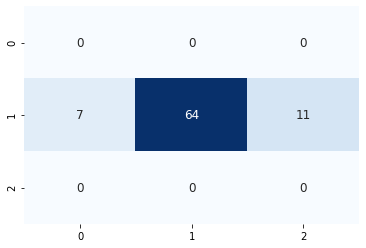

80/80 [==============================] - 0s 293us/sample - loss: 0.6419 - accuracy: 0.7500


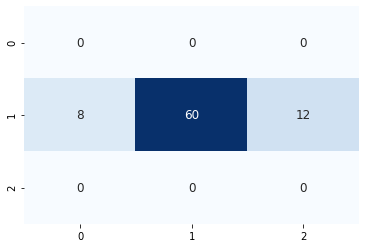

78/78 [==============================] - 0s 278us/sample - loss: 0.6572 - accuracy: 0.7692


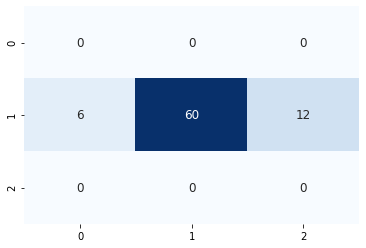

79/79 [==============================] - 0s 280us/sample - loss: 0.5925 - accuracy: 0.7722


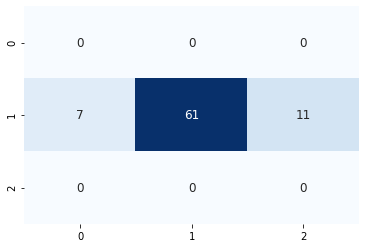

79/79 [==============================] - 0s 362us/sample - loss: 0.6146 - accuracy: 0.7722


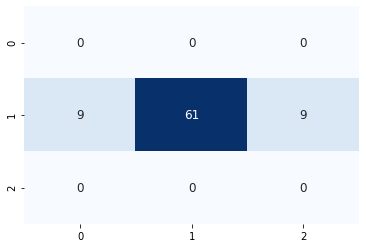

75/75 [==============================] - 0s 313us/sample - loss: 0.6901 - accuracy: 0.7200


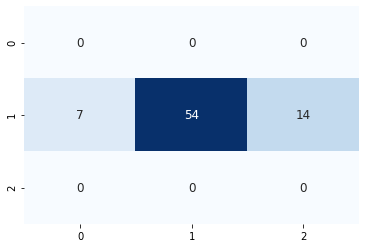

72/72 [==============================] - 0s 339us/sample - loss: 0.6834 - accuracy: 0.7361


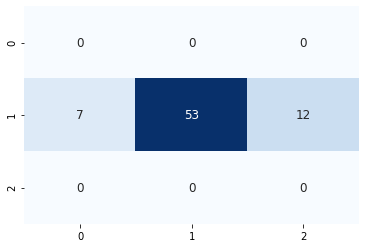

72/72 [==============================] - 0s 331us/sample - loss: 0.7632 - accuracy: 0.7500


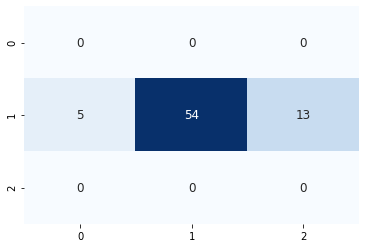

73/73 [==============================] - 0s 289us/sample - loss: 0.6897 - accuracy: 0.7534


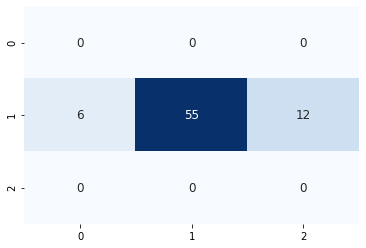

74/74 [==============================] - 0s 314us/sample - loss: 0.6912 - accuracy: 0.7568


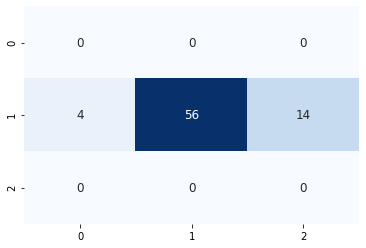

73/73 [==============================] - 0s 348us/sample - loss: 0.8662 - accuracy: 0.5479


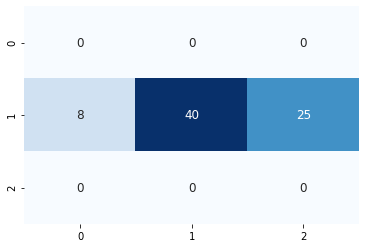

70/70 [==============================] - 0s 424us/sample - loss: 0.7859 - accuracy: 0.7000


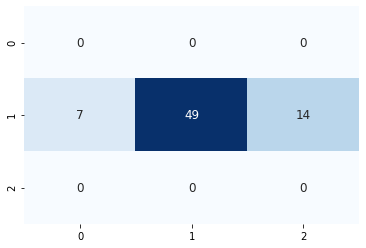

70/70 [==============================] - 0s 295us/sample - loss: 0.8521 - accuracy: 0.6571


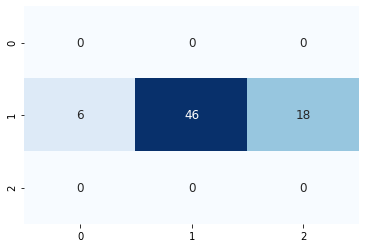

71/71 [==============================] - 0s 280us/sample - loss: 0.7073 - accuracy: 0.7324


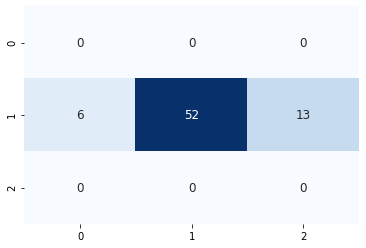

72/72 [==============================] - 0s 295us/sample - loss: 0.6881 - accuracy: 0.6389


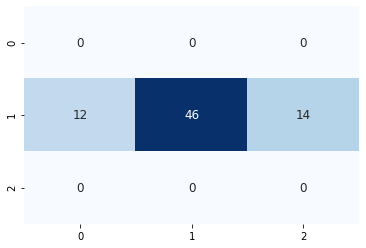

73/73 [==============================] - 0s 301us/sample - loss: 0.7718 - accuracy: 0.6712


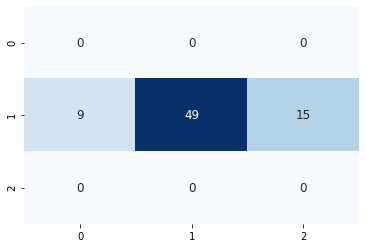

70/70 [==============================] - 0s 296us/sample - loss: 0.7747 - accuracy: 0.6714


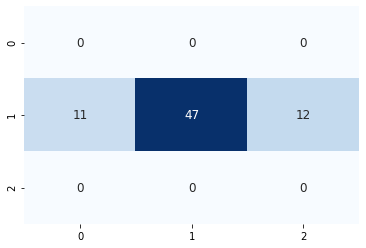

70/70 [==============================] - 0s 316us/sample - loss: 0.8171 - accuracy: 0.7000


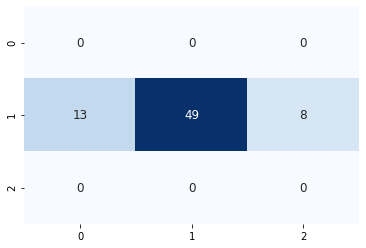

68/68 [==============================] - 0s 331us/sample - loss: 0.8791 - accuracy: 0.6324


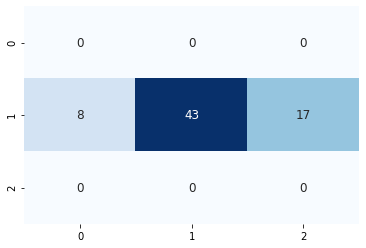

66/66 [==============================] - 0s 365us/sample - loss: 0.7872 - accuracy: 0.6818


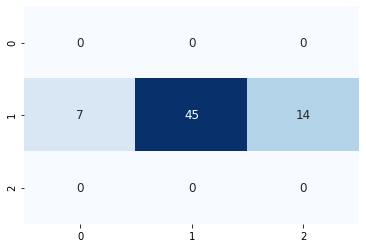

67/67 [==============================] - 0s 326us/sample - loss: 0.7905 - accuracy: 0.6567


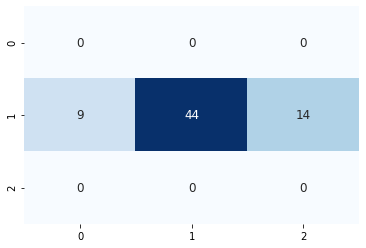

66/66 [==============================] - 0s 417us/sample - loss: 0.7785 - accuracy: 0.6212


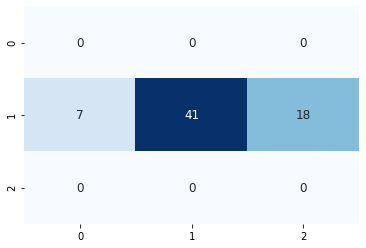

65/65 [==============================] - 0s 371us/sample - loss: 0.7291 - accuracy: 0.6769


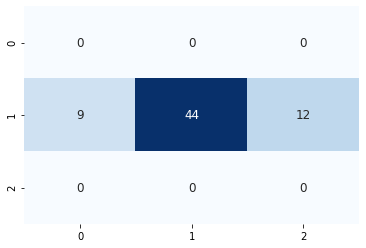

64/64 [==============================] - 0s 3ms/sample - loss: 0.7827 - accuracy: 0.6719


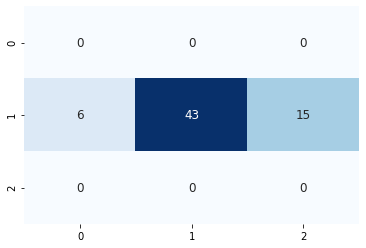

64/64 [==============================] - 0s 277us/sample - loss: 0.7671 - accuracy: 0.6250


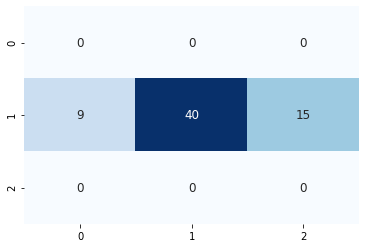

65/65 [==============================] - 0s 349us/sample - loss: 0.7870 - accuracy: 0.6769


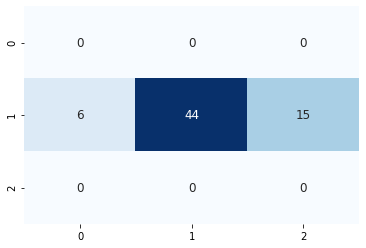

64/64 [==============================] - 0s 297us/sample - loss: 0.8174 - accuracy: 0.6875


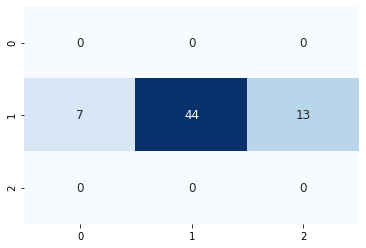

63/63 [==============================] - 0s 287us/sample - loss: 0.8274 - accuracy: 0.6190


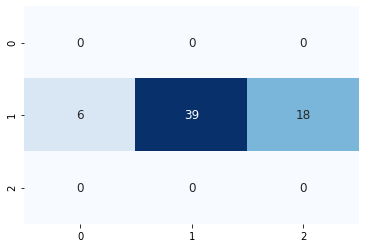

64/64 [==============================] - 0s 268us/sample - loss: 0.8300 - accuracy: 0.5938


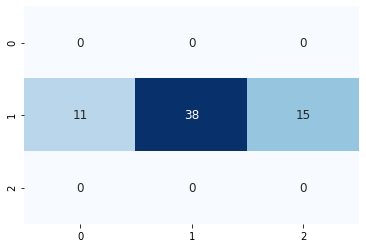

64/64 [==============================] - 0s 254us/sample - loss: 0.7381 - accuracy: 0.7344


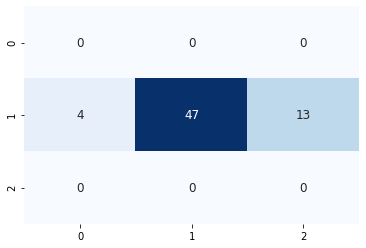

64/64 [==============================] - 0s 271us/sample - loss: 0.7678 - accuracy: 0.6250


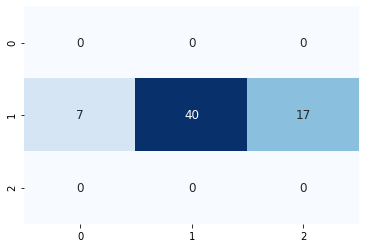

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3916 samples, validate on 1013 samples
Epoch 1/300
3916/3916 [==============================] - 3s 668us/sample - loss: 0.9797 - accuracy: 0.5107 - val_loss: 0.9922 - val_accuracy: 0.5410
Epoch 2/300
3916/3916 [==============================] - 1s 205us/sample - loss: 0.8292 - accuracy: 0.6287 - val_loss: 0.9942 - val_accuracy: 0.5449
Epoch 3/300
3916/3916 [==============================] - 1s 214us/sample - loss: 0.7506 - accuracy: 0.6711 - val_loss: 1.0132 - val_accuracy: 0.5449
Epoch 4/300
3916/3916 [==============================] - 1s 231us/sample - loss: 0.6855 - accuracy: 0.7094 - val_loss: 1.0419 - val_accuracy: 0.5350
Epoch 00004: early stopping
60/60 [==============================] - 0s 161us/sample - loss: 0.4317 - accuracy: 0.9333


10it [5:05:22, 1826.86s/it]
100%|██████████| 3/3 [00:06<00:00,  2.08s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.2734375 steps, validate for 75.669921875 steps
Epoch 1/300
285/284 [==============================] - 29s 101ms/step - loss: 0.9355 - accuracy: 0.5701 - val_loss: 0.9833 - val_accuracy: 0.5525
Epoch 2/300
285/284 [==============================] - 28s 99ms/step - loss: 0.8741 - accuracy: 0.5997 - val_loss: 1.0068 - val_accuracy: 0.5387
Epoch 3/300
285/284 [==============================] - 28s 99ms/step - loss: 0.8403 - accuracy: 0.6172 - val_loss: 1.0389 - val_accuracy: 0.5339
Epoch 4/300
285/284 [==============================] - 28s 100ms/step - loss: 0.8150 - accuracy: 0.6318 - val_loss: 1.0619 - val_accuracy: 0.5258
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.2734375 steps, validate for 75.669921875 steps
Epoch 1/300
285/284 [==============================] - 69s 242ms/step - loss: 0.7796 - accuracy: 0.6524 - val_loss: 1.2011 - val_accur

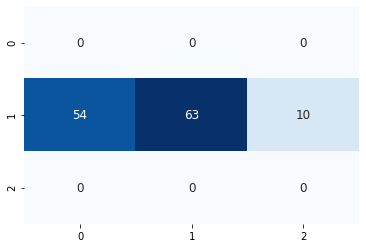

126/126 [==============================] - 0s 240us/sample - loss: 1.3508 - accuracy: 0.4127


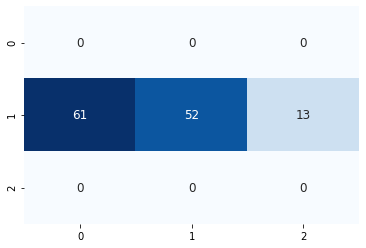

126/126 [==============================] - 0s 239us/sample - loss: 1.2122 - accuracy: 0.4444


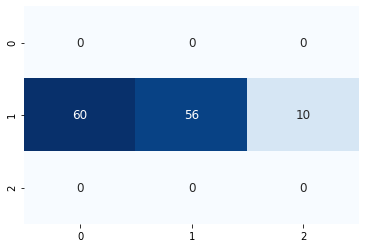

126/126 [==============================] - 0s 241us/sample - loss: 1.0729 - accuracy: 0.4365


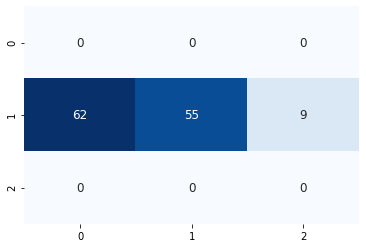

118/118 [==============================] - 0s 264us/sample - loss: 1.2491 - accuracy: 0.4322


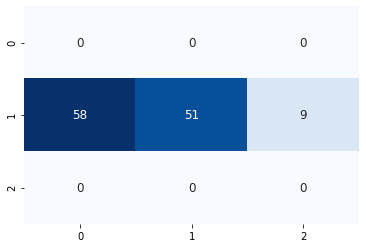

110/110 [==============================] - 0s 252us/sample - loss: 1.0966 - accuracy: 0.5091


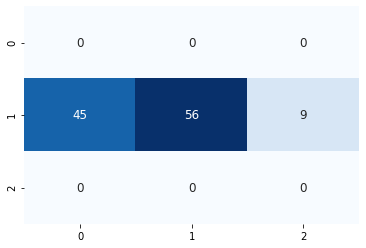

108/108 [==============================] - 0s 263us/sample - loss: 1.1807 - accuracy: 0.5000


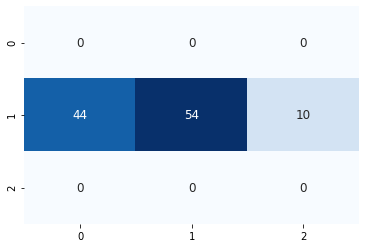

103/103 [==============================] - 0s 275us/sample - loss: 1.0410 - accuracy: 0.5049


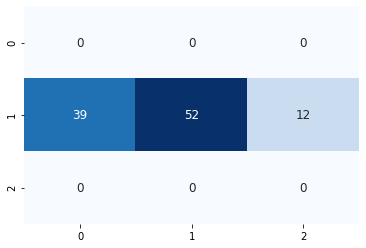

100/100 [==============================] - 0s 269us/sample - loss: 1.1748 - accuracy: 0.5000


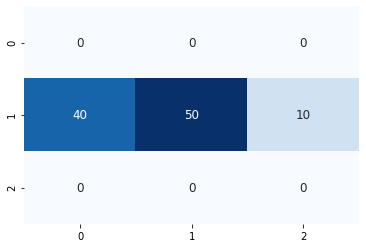

98/98 [==============================] - 0s 288us/sample - loss: 1.0951 - accuracy: 0.5204


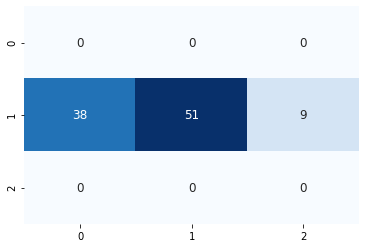

98/98 [==============================] - 0s 274us/sample - loss: 1.1284 - accuracy: 0.4694


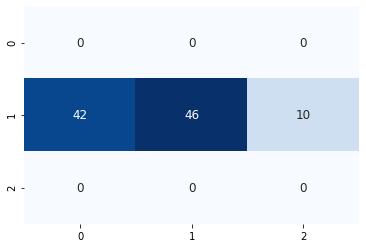

97/97 [==============================] - 0s 313us/sample - loss: 1.2011 - accuracy: 0.4330


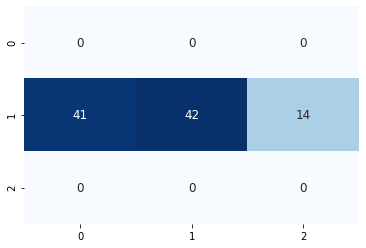

97/97 [==============================] - 0s 286us/sample - loss: 1.2025 - accuracy: 0.4433


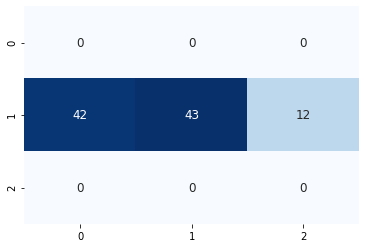

96/96 [==============================] - 0s 2ms/sample - loss: 0.8838 - accuracy: 0.6146


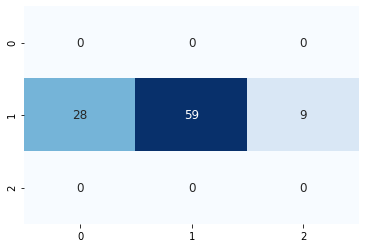

97/97 [==============================] - 0s 286us/sample - loss: 1.1231 - accuracy: 0.4742


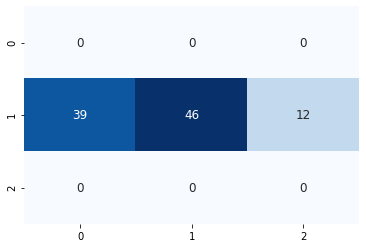

96/96 [==============================] - 0s 240us/sample - loss: 1.0398 - accuracy: 0.5625


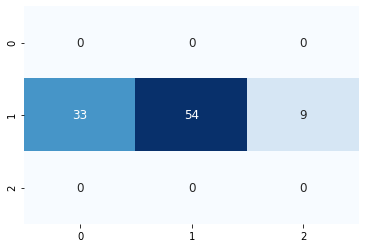

94/94 [==============================] - 0s 316us/sample - loss: 1.0716 - accuracy: 0.4681


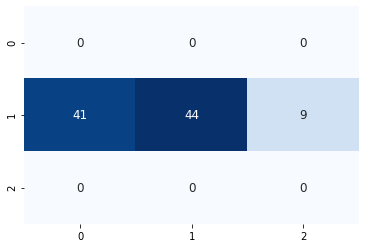

94/94 [==============================] - 0s 250us/sample - loss: 1.1298 - accuracy: 0.4468


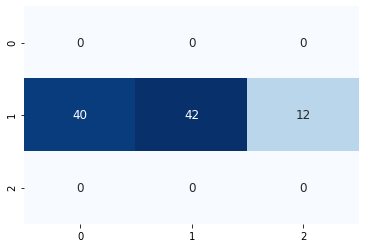

92/92 [==============================] - 0s 314us/sample - loss: 1.0706 - accuracy: 0.4783


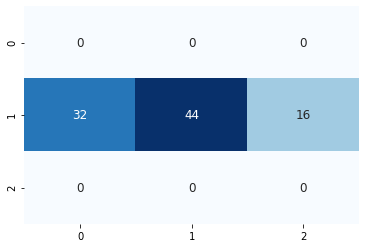

94/94 [==============================] - 0s 268us/sample - loss: 1.0353 - accuracy: 0.5106


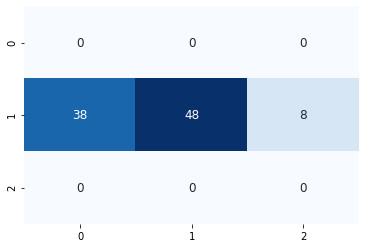

92/92 [==============================] - 0s 263us/sample - loss: 1.1294 - accuracy: 0.4891


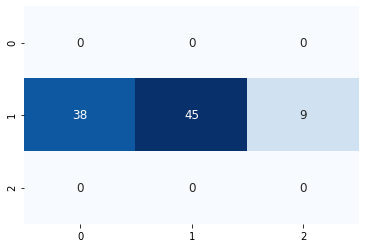

90/90 [==============================] - 0s 271us/sample - loss: 1.1290 - accuracy: 0.4556


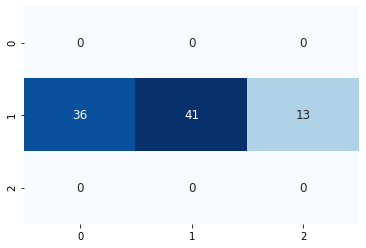

92/92 [==============================] - 0s 261us/sample - loss: 1.1644 - accuracy: 0.4674


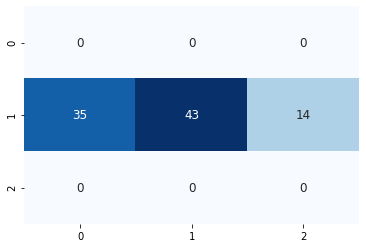

92/92 [==============================] - 0s 285us/sample - loss: 1.0345 - accuracy: 0.5326


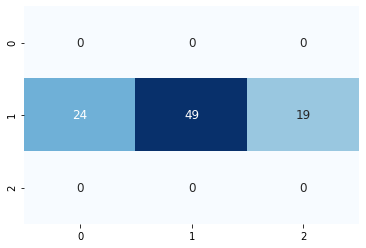

94/94 [==============================] - 0s 298us/sample - loss: 1.0119 - accuracy: 0.5319


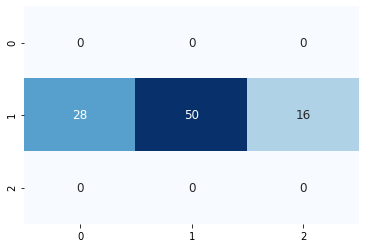

93/93 [==============================] - 0s 266us/sample - loss: 1.1989 - accuracy: 0.4946


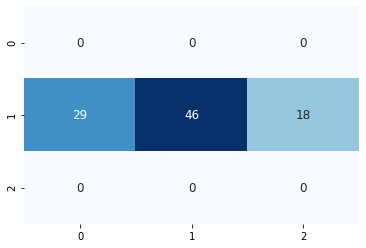

94/94 [==============================] - 0s 268us/sample - loss: 1.1260 - accuracy: 0.4894


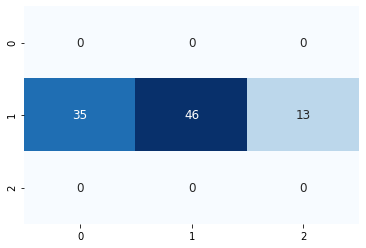

93/93 [==============================] - 0s 271us/sample - loss: 1.1786 - accuracy: 0.5161


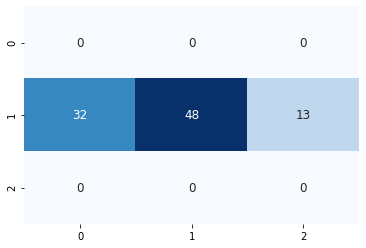

91/91 [==============================] - 0s 265us/sample - loss: 1.1463 - accuracy: 0.4176


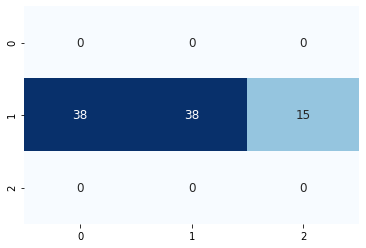

92/92 [==============================] - 0s 348us/sample - loss: 1.3571 - accuracy: 0.4565


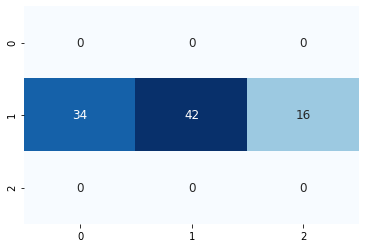

90/90 [==============================] - 0s 275us/sample - loss: 1.2066 - accuracy: 0.4889


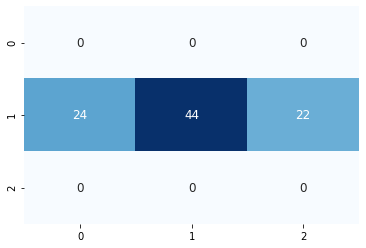

89/89 [==============================] - 0s 330us/sample - loss: 1.1789 - accuracy: 0.4719


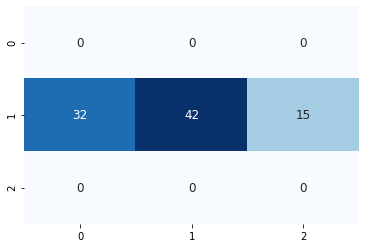

89/89 [==============================] - 0s 257us/sample - loss: 1.1784 - accuracy: 0.4719


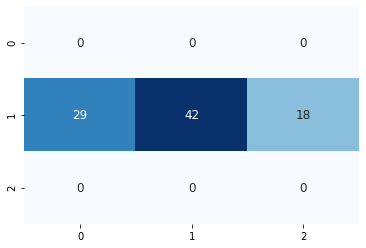

Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3893 samples, validate on 1021 samples
Epoch 1/300
3893/3893 [==============================] - 2s 606us/sample - loss: 0.9538 - accuracy: 0.5343 - val_loss: 0.9660 - val_accuracy: 0.5436
Epoch 2/300
3893/3893 [==============================] - 1s 213us/sample - loss: 0.8300 - accuracy: 0.6239 - val_loss: 0.9727 - val_accuracy: 0.5475
Epoch 3/300
3893/3893 [==============================] - 1s 222us/sample - loss: 0.7633 - accuracy: 0.6650 - val_loss: 0.9868 - val_accuracy: 0.5387
Epoch 4/300
3893/3893 [==============================] - 1s 221us/sample - loss: 0.7008 - accuracy: 0.7018 - val_loss: 1.0086 - val_accuracy: 0.5416
Epoch 00004: early stopping
75/75 [==============================] - 0s 200us/sample - loss: 0.5251 - accuracy: 0.8667


11it [5:34:07, 1796.16s/it]
100%|██████████| 3/3 [00:06<00:00,  2.06s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.671875 steps, validate for 75.267578125 steps
Epoch 1/300
283/282 [==============================] - 29s 104ms/step - loss: 0.9561 - accuracy: 0.5587 - val_loss: 1.0062 - val_accuracy: 0.5484
Epoch 2/300
283/282 [==============================] - 28s 100ms/step - loss: 0.8871 - accuracy: 0.5931 - val_loss: 1.0192 - val_accuracy: 0.5385
Epoch 3/300
283/282 [==============================] - 28s 99ms/step - loss: 0.8587 - accuracy: 0.6082 - val_loss: 1.0293 - val_accuracy: 0.5346
Epoch 4/300
283/282 [==============================] - 29s 102ms/step - loss: 0.8352 - accuracy: 0.6216 - val_loss: 1.0499 - val_accuracy: 0.5140
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.671875 steps, validate for 75.267578125 steps
Epoch 1/300
283/282 [==============================] - 69s 245ms/step - loss: 0.7978 - accuracy: 0.6417 - val_loss: 1.3013 - val_accura

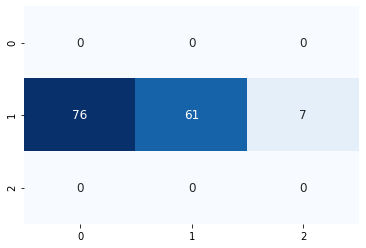

138/138 [==============================] - 0s 271us/sample - loss: 1.2341 - accuracy: 0.4058


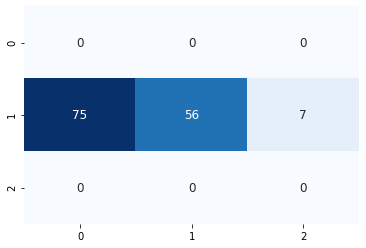

138/138 [==============================] - 0s 233us/sample - loss: 1.3652 - accuracy: 0.4058


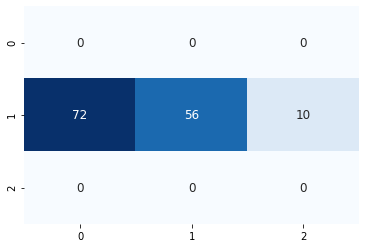

137/137 [==============================] - 0s 235us/sample - loss: 1.2373 - accuracy: 0.4745


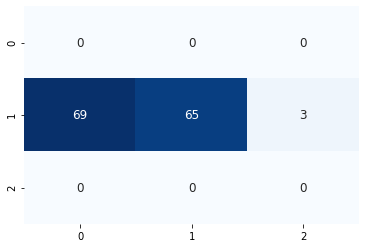

137/137 [==============================] - 0s 288us/sample - loss: 1.3627 - accuracy: 0.3358


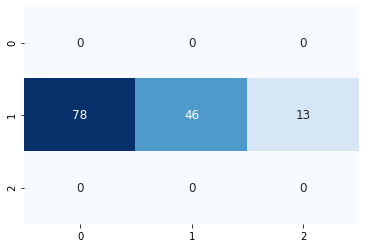

137/137 [==============================] - 0s 255us/sample - loss: 1.2391 - accuracy: 0.4161


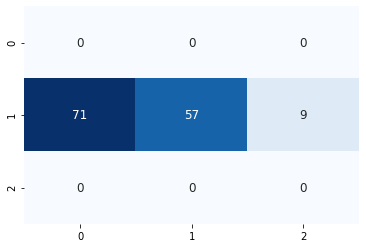

136/136 [==============================] - 0s 252us/sample - loss: 1.1249 - accuracy: 0.4779


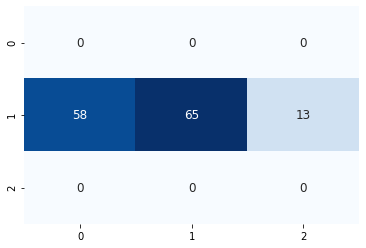

135/135 [==============================] - 0s 265us/sample - loss: 1.2532 - accuracy: 0.4296


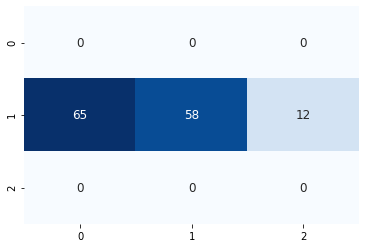

133/133 [==============================] - 0s 280us/sample - loss: 1.2703 - accuracy: 0.4511


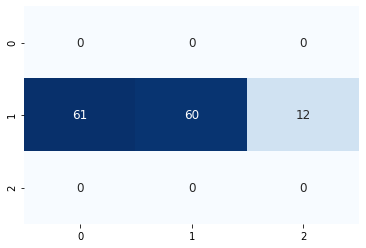

134/134 [==============================] - 0s 268us/sample - loss: 1.3434 - accuracy: 0.4254


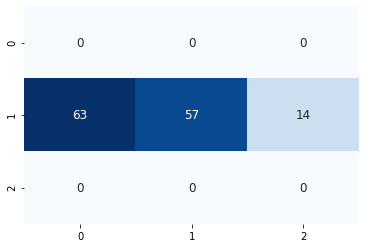

134/134 [==============================] - 0s 249us/sample - loss: 1.2900 - accuracy: 0.4701


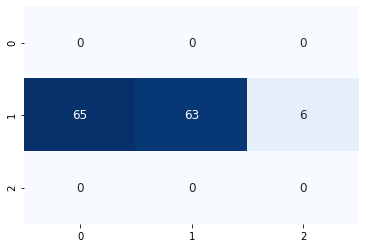

133/133 [==============================] - 0s 307us/sample - loss: 1.3005 - accuracy: 0.4361


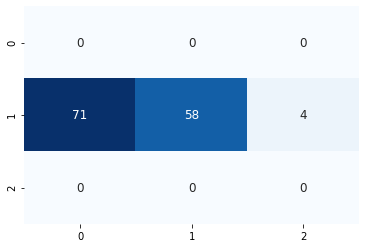

133/133 [==============================] - 0s 243us/sample - loss: 1.2958 - accuracy: 0.4135


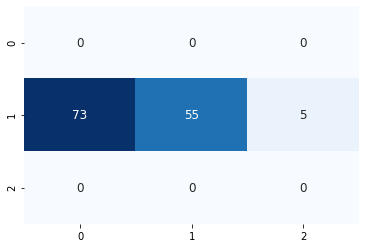

133/133 [==============================] - 0s 253us/sample - loss: 1.3022 - accuracy: 0.4361


129/129 [==============================] - 0s 260us/sample - loss: 1.2335 - accuracy: 0.4651


129/129 [==============================] - 0s 282us/sample - loss: 1.4068 - accuracy: 0.4419


132/132 [==============================] - 0s 256us/sample - loss: 1.3294 - accuracy: 0.4470


129/129 [==============================] - 0s 257us/sample - loss: 1.3293 - accuracy: 0.4884


131/131 [==============================] - 0s 263us/sample - loss: 1.3607 - accuracy: 0.4046


130/130 [==============================] - 0s 303us/sample - loss: 1.5364 - accuracy: 0.4231


129/129 [==============================] - 0s 267us/sample - loss: 1.4599 - accuracy: 0.3798


127/127 [==============================] - 0s 239us/sample - loss: 1.2764 - accuracy: 0.4173


124/124 [==============================] - 0s 241us/sample - loss: 1.4070 - accuracy: 0.3710


128/128 [==============================] - 0s 2ms/sample - loss: 1.3337 - accuracy: 0.3828


128/128 [==============================] - 0s 316us/sample - loss: 1.3821 - accuracy: 0.3906


126/126 [==============================] - 0s 264us/sample - loss: 1.4145 - accuracy: 0.4048


124/124 [==============================] - 0s 260us/sample - loss: 1.3493 - accuracy: 0.4597


124/124 [==============================] - 0s 265us/sample - loss: 1.3213 - accuracy: 0.4758


124/124 [==============================] - 0s 241us/sample - loss: 1.4404 - accuracy: 0.4032


125/125 [==============================] - 0s 262us/sample - loss: 1.4021 - accuracy: 0.4320


126/126 [==============================] - 0s 260us/sample - loss: 1.4179 - accuracy: 0.3889


123/123 [==============================] - 0s 235us/sample - loss: 1.4037 - accuracy: 0.4065


124/124 [==============================] - 0s 247us/sample - loss: 1.4505 - accuracy: 0.3871


Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3859 samples, validate on 1013 samples
Epoch 1/300
3859/3859 [==============================] - 3s 667us/sample - loss: 0.9912 - accuracy: 0.4890 - val_loss: 1.0203 - val_accuracy: 0.5242
Epoch 2/300
3859/3859 [==============================] - 1s 226us/sample - loss: 0.7882 - accuracy: 0.6416 - val_loss: 1.0388 - val_accuracy: 0.5114
Epoch 3/300
3859/3859 [==============================] - 1s 242us/sample - loss: 0.6721 - accuracy: 0.7137 - val_loss: 1.0736 - val_accuracy: 0.5084
Epoch 4/300
3859/3859 [==============================] - 1s 220us/sample - loss: 0.5600 - accuracy: 0.7826 - val_loss: 1.1402 - val_accuracy: 0.5054
Epoch 00004: early stopping
117/117 [==============================] - 0s 147us/sample - loss: 0.6026 - accuracy: 0.7521


12it [6:04:44, 1808.52s/it]
100%|██████████| 3/3 [00:06<00:00,  2.03s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.017578125 steps, validate for 74.357421875 steps
Epoch 1/300
285/284 [==============================] - 29s 102ms/step - loss: 0.9685 - accuracy: 0.5479 - val_loss: 0.9969 - val_accuracy: 0.5469
Epoch 2/300
285/284 [==============================] - 28s 97ms/step - loss: 0.8826 - accuracy: 0.5937 - val_loss: 1.0043 - val_accuracy: 0.5311
Epoch 3/300
285/284 [==============================] - 28s 99ms/step - loss: 0.8539 - accuracy: 0.6101 - val_loss: 1.0373 - val_accuracy: 0.5224
Epoch 4/300
285/284 [==============================] - 28s 99ms/step - loss: 0.8293 - accuracy: 0.6214 - val_loss: 1.0599 - val_accuracy: 0.5218
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.017578125 steps, validate for 74.357421875 steps
Epoch 1/300
285/284 [==============================] - 69s 242ms/step - loss: 0.7915 - accuracy: 0.6442 - val_loss: 1.3084 - val_ac

134/134 [==============================] - 0s 262us/sample - loss: 0.8840 - accuracy: 0.6343


131/131 [==============================] - 0s 257us/sample - loss: 0.9752 - accuracy: 0.5115


129/129 [==============================] - 0s 294us/sample - loss: 0.8762 - accuracy: 0.5736


129/129 [==============================] - 0s 278us/sample - loss: 0.9961 - accuracy: 0.5194


129/129 [==============================] - 0s 268us/sample - loss: 0.8646 - accuracy: 0.5891


128/128 [==============================] - 0s 2ms/sample - loss: 0.9845 - accuracy: 0.4688


126/126 [==============================] - 0s 263us/sample - loss: 0.9269 - accuracy: 0.5556


125/125 [==============================] - 0s 277us/sample - loss: 0.8794 - accuracy: 0.5680


126/126 [==============================] - 0s 268us/sample - loss: 0.8378 - accuracy: 0.5873


126/126 [==============================] - 0s 243us/sample - loss: 0.9304 - accuracy: 0.5714


126/126 [==============================] - 0s 283us/sample - loss: 0.9275 - accuracy: 0.5556


125/125 [==============================] - 0s 308us/sample - loss: 0.8850 - accuracy: 0.5760


126/126 [==============================] - 0s 271us/sample - loss: 0.9444 - accuracy: 0.5476


123/123 [==============================] - 0s 325us/sample - loss: 0.9206 - accuracy: 0.5366


121/121 [==============================] - 0s 279us/sample - loss: 1.0120 - accuracy: 0.5041


122/122 [==============================] - 0s 280us/sample - loss: 0.8986 - accuracy: 0.5492


120/120 [==============================] - 0s 305us/sample - loss: 0.9149 - accuracy: 0.5083


121/121 [==============================] - 0s 281us/sample - loss: 0.9555 - accuracy: 0.5455


121/121 [==============================] - 0s 296us/sample - loss: 0.9928 - accuracy: 0.5372


123/123 [==============================] - 0s 262us/sample - loss: 1.1523 - accuracy: 0.4715


123/123 [==============================] - 0s 263us/sample - loss: 1.0846 - accuracy: 0.4634


123/123 [==============================] - 0s 256us/sample - loss: 0.9943 - accuracy: 0.5610


122/122 [==============================] - 0s 273us/sample - loss: 1.0135 - accuracy: 0.5164


122/122 [==============================] - 0s 245us/sample - loss: 0.8044 - accuracy: 0.5574


121/121 [==============================] - 0s 267us/sample - loss: 0.8382 - accuracy: 0.6033


119/119 [==============================] - 0s 302us/sample - loss: 0.9590 - accuracy: 0.5126


119/119 [==============================] - 0s 296us/sample - loss: 0.9315 - accuracy: 0.5546


120/120 [==============================] - 0s 256us/sample - loss: 0.8101 - accuracy: 0.6167


120/120 [==============================] - 0s 238us/sample - loss: 1.0190 - accuracy: 0.4833


119/119 [==============================] - 0s 281us/sample - loss: 1.1045 - accuracy: 0.4370


118/118 [==============================] - 0s 254us/sample - loss: 0.9806 - accuracy: 0.5508


120/120 [==============================] - 0s 254us/sample - loss: 0.9129 - accuracy: 0.5583


Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3880 samples, validate on 999 samples
Epoch 1/300
3880/3880 [==============================] - 3s 661us/sample - loss: 0.9599 - accuracy: 0.5312 - val_loss: 1.0065 - val_accuracy: 0.5145
Epoch 2/300
3880/3880 [==============================] - 1s 184us/sample - loss: 0.6984 - accuracy: 0.7235 - val_loss: 1.0429 - val_accuracy: 0.5075
Epoch 3/300
3880/3880 [==============================] - 1s 204us/sample - loss: 0.5265 - accuracy: 0.8090 - val_loss: 1.1430 - val_accuracy: 0.5015
Epoch 4/300
3880/3880 [==============================] - 1s 199us/sample - loss: 0.4000 - accuracy: 0.8662 - val_loss: 1.2398 - val_accuracy: 0.5085
Epoch 00004: early stopping
110/110 [==============================] - 0s 165us/sample - loss: 0.7090 - accuracy: 0.6909


13it [6:35:28, 1819.25s/it]
100%|██████████| 3/3 [00:05<00:00,  2.00s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.400390625 steps, validate for 74.830078125 steps
Epoch 1/300
283/282 [==============================] - 29s 101ms/step - loss: 0.9395 - accuracy: 0.5668 - val_loss: 1.0043 - val_accuracy: 0.5472
Epoch 2/300
283/282 [==============================] - 27s 97ms/step - loss: 0.8765 - accuracy: 0.5983 - val_loss: 1.0011 - val_accuracy: 0.5493
Epoch 3/300
283/282 [==============================] - 28s 99ms/step - loss: 0.8465 - accuracy: 0.6142 - val_loss: 1.0432 - val_accuracy: 0.5238
Epoch 4/300
283/282 [==============================] - 28s 101ms/step - loss: 0.8238 - accuracy: 0.6276 - val_loss: 1.0552 - val_accuracy: 0.5150
Epoch 5/300
283/282 [==============================] - 28s 100ms/step - loss: 0.8035 - accuracy: 0.6396 - val_loss: 1.0831 - val_accuracy: 0.5061
Epoch 00005: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.400390625 steps, validate for 74.

155/155 [==============================] - 0s 255us/sample - loss: 0.9905 - accuracy: 0.5935


153/153 [==============================] - 0s 277us/sample - loss: 0.8678 - accuracy: 0.6078


153/153 [==============================] - 0s 249us/sample - loss: 1.1030 - accuracy: 0.4837


151/151 [==============================] - 0s 300us/sample - loss: 0.9932 - accuracy: 0.4967


149/149 [==============================] - 0s 239us/sample - loss: 1.0956 - accuracy: 0.4899


149/149 [==============================] - 0s 244us/sample - loss: 1.0023 - accuracy: 0.5235


149/149 [==============================] - 0s 260us/sample - loss: 1.1444 - accuracy: 0.4564


149/149 [==============================] - 0s 248us/sample - loss: 1.1269 - accuracy: 0.4966


149/149 [==============================] - 0s 248us/sample - loss: 1.0399 - accuracy: 0.5302


149/149 [==============================] - 0s 276us/sample - loss: 1.1508 - accuracy: 0.5034


146/146 [==============================] - 0s 260us/sample - loss: 1.1132 - accuracy: 0.5000


146/146 [==============================] - 0s 300us/sample - loss: 1.0635 - accuracy: 0.4726


141/141 [==============================] - 0s 284us/sample - loss: 1.0991 - accuracy: 0.4823


142/142 [==============================] - 0s 393us/sample - loss: 1.0201 - accuracy: 0.5563


140/140 [==============================] - 0s 260us/sample - loss: 1.0743 - accuracy: 0.5000


139/139 [==============================] - 0s 262us/sample - loss: 0.9855 - accuracy: 0.5396


140/140 [==============================] - 0s 263us/sample - loss: 1.0350 - accuracy: 0.5000


135/135 [==============================] - 0s 278us/sample - loss: 1.2258 - accuracy: 0.4519


136/136 [==============================] - 0s 254us/sample - loss: 1.0968 - accuracy: 0.5221


137/137 [==============================] - 0s 293us/sample - loss: 1.0036 - accuracy: 0.5547


137/137 [==============================] - 0s 285us/sample - loss: 1.0336 - accuracy: 0.5401


135/135 [==============================] - 0s 292us/sample - loss: 1.0173 - accuracy: 0.5259


136/136 [==============================] - 0s 291us/sample - loss: 1.2158 - accuracy: 0.4338


136/136 [==============================] - 0s 256us/sample - loss: 1.0702 - accuracy: 0.5294


134/134 [==============================] - 0s 250us/sample - loss: 1.1101 - accuracy: 0.5299


134/134 [==============================] - 0s 295us/sample - loss: 1.0887 - accuracy: 0.5448


134/134 [==============================] - 0s 331us/sample - loss: 1.0893 - accuracy: 0.5075


136/136 [==============================] - 0s 303us/sample - loss: 1.1081 - accuracy: 0.5000


134/134 [==============================] - 0s 275us/sample - loss: 1.2788 - accuracy: 0.4478


133/133 [==============================] - 0s 272us/sample - loss: 1.2602 - accuracy: 0.4662


129/129 [==============================] - 0s 319us/sample - loss: 1.1514 - accuracy: 0.5039


130/130 [==============================] - 0s 263us/sample - loss: 1.1155 - accuracy: 0.4615


Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3862 samples, validate on 1007 samples
Epoch 1/300
3862/3862 [==============================] - 3s 756us/sample - loss: 0.9580 - accuracy: 0.5528 - val_loss: 0.9889 - val_accuracy: 0.5353
Epoch 2/300
3862/3862 [==============================] - 1s 217us/sample - loss: 0.7686 - accuracy: 0.6781 - val_loss: 1.0181 - val_accuracy: 0.5174
Epoch 3/300
3862/3862 [==============================] - 1s 214us/sample - loss: 0.6212 - accuracy: 0.7651 - val_loss: 1.0838 - val_accuracy: 0.5015
Epoch 4/300
3862/3862 [==============================] - 1s 221us/sample - loss: 0.4914 - accuracy: 0.8242 - val_loss: 1.1767 - val_accuracy: 0.4955
Epoch 00004: early stopping
120/120 [==============================] - 0s 120us/sample - loss: 0.8985 - accuracy: 0.5333


14it [7:06:24, 1830.14s/it]
100%|██████████| 3/3 [00:06<00:00,  2.07s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.4453125 steps, validate for 74.890625 steps
Epoch 1/300
285/284 [==============================] - 29s 102ms/step - loss: 0.9477 - accuracy: 0.5630 - val_loss: 0.9971 - val_accuracy: 0.5503
Epoch 2/300
285/284 [==============================] - 28s 99ms/step - loss: 0.8786 - accuracy: 0.5993 - val_loss: 1.0195 - val_accuracy: 0.5426
Epoch 3/300
285/284 [==============================] - 28s 98ms/step - loss: 0.8477 - accuracy: 0.6152 - val_loss: 1.0451 - val_accuracy: 0.5249
Epoch 4/300
285/284 [==============================] - 28s 99ms/step - loss: 0.8249 - accuracy: 0.6271 - val_loss: 1.0683 - val_accuracy: 0.5244
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.4453125 steps, validate for 74.890625 steps
Epoch 1/300
285/284 [==============================] - 69s 243ms/step - loss: 0.7885 - accuracy: 0.6468 - val_loss: 1.1370 - val_accuracy: 0.

130/130 [==============================] - 0s 268us/sample - loss: 1.3035 - accuracy: 0.6154


118/118 [==============================] - 0s 251us/sample - loss: 1.1458 - accuracy: 0.6102


115/115 [==============================] - 0s 267us/sample - loss: 1.0525 - accuracy: 0.6522


114/114 [==============================] - 0s 244us/sample - loss: 1.1584 - accuracy: 0.6053


113/113 [==============================] - 0s 460us/sample - loss: 1.2703 - accuracy: 0.6195


113/113 [==============================] - 0s 291us/sample - loss: 1.2345 - accuracy: 0.5841


114/114 [==============================] - 0s 304us/sample - loss: 1.3259 - accuracy: 0.5439


114/114 [==============================] - 0s 256us/sample - loss: 1.3430 - accuracy: 0.5351


111/111 [==============================] - 0s 273us/sample - loss: 1.4767 - accuracy: 0.5676


110/110 [==============================] - 0s 331us/sample - loss: 1.5564 - accuracy: 0.4364


110/110 [==============================] - 0s 262us/sample - loss: 1.5027 - accuracy: 0.5000


112/112 [==============================] - 0s 297us/sample - loss: 1.4939 - accuracy: 0.4911


112/112 [==============================] - 0s 299us/sample - loss: 1.5189 - accuracy: 0.4464


113/113 [==============================] - 0s 306us/sample - loss: 1.7356 - accuracy: 0.4867


114/114 [==============================] - 0s 243us/sample - loss: 1.8479 - accuracy: 0.3772


111/111 [==============================] - 0s 311us/sample - loss: 1.8989 - accuracy: 0.4505


107/107 [==============================] - 0s 269us/sample - loss: 1.9719 - accuracy: 0.3551


107/107 [==============================] - 0s 279us/sample - loss: 1.6506 - accuracy: 0.5140


106/106 [==============================] - 0s 322us/sample - loss: 1.7470 - accuracy: 0.4434


103/103 [==============================] - 0s 286us/sample - loss: 2.4395 - accuracy: 0.3786


104/104 [==============================] - 0s 265us/sample - loss: 1.8407 - accuracy: 0.4135


103/103 [==============================] - 0s 271us/sample - loss: 1.7956 - accuracy: 0.5049


104/104 [==============================] - 0s 317us/sample - loss: 1.7822 - accuracy: 0.4327


103/103 [==============================] - 0s 262us/sample - loss: 1.7879 - accuracy: 0.4175


102/102 [==============================] - 0s 265us/sample - loss: 2.1235 - accuracy: 0.3039


100/100 [==============================] - 0s 285us/sample - loss: 1.9559 - accuracy: 0.3500


101/101 [==============================] - 0s 283us/sample - loss: 1.9222 - accuracy: 0.3762


101/101 [==============================] - 0s 458us/sample - loss: 1.6467 - accuracy: 0.4851


99/99 [==============================] - 0s 270us/sample - loss: 1.7059 - accuracy: 0.5051


98/98 [==============================] - 0s 287us/sample - loss: 1.9922 - accuracy: 0.3673


96/96 [==============================] - 0s 2ms/sample - loss: 1.8507 - accuracy: 0.3854


97/97 [==============================] - 0s 317us/sample - loss: 2.0170 - accuracy: 0.3402


Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3888 samples, validate on 1008 samples
Epoch 1/300
3888/3888 [==============================] - 3s 709us/sample - loss: 0.9520 - accuracy: 0.5350 - val_loss: 1.0062 - val_accuracy: 0.5149
Epoch 2/300
3888/3888 [==============================] - 1s 230us/sample - loss: 0.8058 - accuracy: 0.6384 - val_loss: 1.0167 - val_accuracy: 0.5228
Epoch 3/300
3888/3888 [==============================] - 1s 222us/sample - loss: 0.7337 - accuracy: 0.6867 - val_loss: 1.0360 - val_accuracy: 0.5228
Epoch 4/300
3888/3888 [==============================] - 1s 246us/sample - loss: 0.6722 - accuracy: 0.7204 - val_loss: 1.0654 - val_accuracy: 0.5298
Epoch 00004: early stopping
93/93 [==============================] - 0s 156us/sample - loss: 0.9333 - accuracy: 0.5914


15it [7:35:12, 1799.46s/it]
100%|██████████| 3/3 [00:06<00:00,  2.11s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.634765625 steps, validate for 74.767578125 steps
Epoch 1/300
284/283 [==============================] - 29s 103ms/step - loss: 0.9508 - accuracy: 0.5596 - val_loss: 0.9922 - val_accuracy: 0.5453
Epoch 2/300
284/283 [==============================] - 28s 99ms/step - loss: 0.8825 - accuracy: 0.5964 - val_loss: 1.0081 - val_accuracy: 0.5349
Epoch 3/300
284/283 [==============================] - 28s 99ms/step - loss: 0.8528 - accuracy: 0.6113 - val_loss: 1.0531 - val_accuracy: 0.5249
Epoch 4/300
284/283 [==============================] - 28s 100ms/step - loss: 0.8280 - accuracy: 0.6258 - val_loss: 1.0801 - val_accuracy: 0.5198
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.634765625 steps, validate for 74.767578125 steps
Epoch 1/300
284/283 [==============================] - 69s 244ms/step - loss: 0.7904 - accuracy: 0.6470 - val_loss: 1.1623 - val_a

142/142 [==============================] - 0s 242us/sample - loss: 0.6934 - accuracy: 0.6831


138/138 [==============================] - 0s 250us/sample - loss: 0.6603 - accuracy: 0.7174


137/137 [==============================] - 0s 255us/sample - loss: 0.7422 - accuracy: 0.7299


134/134 [==============================] - 0s 246us/sample - loss: 0.6754 - accuracy: 0.6567


130/130 [==============================] - 0s 271us/sample - loss: 0.7164 - accuracy: 0.6923


129/129 [==============================] - 0s 307us/sample - loss: 0.7864 - accuracy: 0.5891


127/127 [==============================] - 0s 292us/sample - loss: 0.7423 - accuracy: 0.6457


125/125 [==============================] - 0s 274us/sample - loss: 0.7867 - accuracy: 0.6240


125/125 [==============================] - 0s 257us/sample - loss: 0.6916 - accuracy: 0.6480


125/125 [==============================] - 0s 259us/sample - loss: 0.7406 - accuracy: 0.6960


125/125 [==============================] - 0s 264us/sample - loss: 0.7077 - accuracy: 0.6640


125/125 [==============================] - 0s 294us/sample - loss: 0.6851 - accuracy: 0.6720


124/124 [==============================] - 0s 281us/sample - loss: 0.6986 - accuracy: 0.6774


123/123 [==============================] - 0s 278us/sample - loss: 0.7245 - accuracy: 0.6748


124/124 [==============================] - 0s 268us/sample - loss: 0.6680 - accuracy: 0.7177


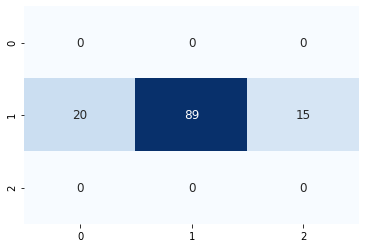

122/122 [==============================] - 0s 267us/sample - loss: 0.7131 - accuracy: 0.6639


122/122 [==============================] - 0s 261us/sample - loss: 0.7134 - accuracy: 0.7213


121/121 [==============================] - 0s 280us/sample - loss: 0.7616 - accuracy: 0.6942


120/120 [==============================] - 0s 257us/sample - loss: 0.7445 - accuracy: 0.6667


117/117 [==============================] - 0s 263us/sample - loss: 0.7725 - accuracy: 0.6410


115/115 [==============================] - 0s 300us/sample - loss: 0.6877 - accuracy: 0.6783


119/119 [==============================] - 0s 303us/sample - loss: 0.7063 - accuracy: 0.6555


119/119 [==============================] - 0s 285us/sample - loss: 0.6943 - accuracy: 0.6723


117/117 [==============================] - 0s 307us/sample - loss: 0.6623 - accuracy: 0.6752


116/116 [==============================] - 0s 298us/sample - loss: 0.7009 - accuracy: 0.6897


117/117 [==============================] - 0s 266us/sample - loss: 0.6914 - accuracy: 0.6667


117/117 [==============================] - 0s 313us/sample - loss: 0.6742 - accuracy: 0.6923


116/116 [==============================] - 0s 266us/sample - loss: 0.6416 - accuracy: 0.7155


115/115 [==============================] - 0s 266us/sample - loss: 0.6409 - accuracy: 0.7217


116/116 [==============================] - 0s 270us/sample - loss: 0.7216 - accuracy: 0.6638


116/116 [==============================] - 0s 286us/sample - loss: 0.6159 - accuracy: 0.7328


113/113 [==============================] - 0s 258us/sample - loss: 0.5936 - accuracy: 0.7434


Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3874 samples, validate on 1007 samples
Epoch 1/300
3874/3874 [==============================] - 3s 701us/sample - loss: 0.9374 - accuracy: 0.5465 - val_loss: 0.9883 - val_accuracy: 0.5402
Epoch 2/300
3874/3874 [==============================] - 1s 225us/sample - loss: 0.7993 - accuracy: 0.6422 - val_loss: 1.0037 - val_accuracy: 0.5313
Epoch 3/300
3874/3874 [==============================] - 1s 206us/sample - loss: 0.7155 - accuracy: 0.6946 - val_loss: 1.0281 - val_accuracy: 0.5303
Epoch 4/300
3874/3874 [==============================] - 1s 199us/sample - loss: 0.6401 - accuracy: 0.7463 - val_loss: 1.0660 - val_accuracy: 0.5243
Epoch 00004: early stopping
108/108 [==============================] - 0s 155us/sample - loss: 0.3861 - accuracy: 0.8889


16it [8:04:34, 1788.20s/it]
100%|██████████| 3/3 [00:06<00:00,  2.07s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.701171875 steps, validate for 75.18359375 steps
Epoch 1/300
284/283 [==============================] - 30s 105ms/step - loss: 0.9356 - accuracy: 0.5676 - val_loss: 0.9916 - val_accuracy: 0.5470
Epoch 2/300
284/283 [==============================] - 29s 100ms/step - loss: 0.8750 - accuracy: 0.5992 - val_loss: 1.0236 - val_accuracy: 0.5430
Epoch 3/300
284/283 [==============================] - 29s 101ms/step - loss: 0.8418 - accuracy: 0.6167 - val_loss: 1.0533 - val_accuracy: 0.5181
Epoch 4/300
284/283 [==============================] - 29s 101ms/step - loss: 0.8155 - accuracy: 0.6306 - val_loss: 1.0727 - val_accuracy: 0.5153
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.701171875 steps, validate for 75.18359375 steps
Epoch 1/300
284/283 [==============================] - 70s 246ms/step - loss: 0.7770 - accuracy: 0.6512 - val_loss: 1.2584 - val_a

147/147 [==============================] - 0s 246us/sample - loss: 0.8937 - accuracy: 0.5714


141/141 [==============================] - 0s 268us/sample - loss: 0.9968 - accuracy: 0.5603


136/136 [==============================] - 0s 292us/sample - loss: 0.8737 - accuracy: 0.5735


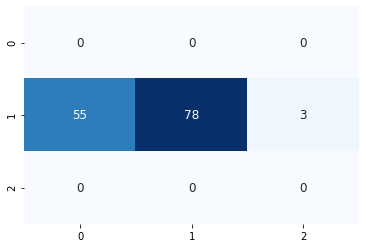

129/129 [==============================] - 0s 279us/sample - loss: 0.8818 - accuracy: 0.5194


128/128 [==============================] - 0s 2ms/sample - loss: 0.9451 - accuracy: 0.5078


125/125 [==============================] - 0s 287us/sample - loss: 0.9173 - accuracy: 0.5920


125/125 [==============================] - 0s 240us/sample - loss: 0.9837 - accuracy: 0.4880


122/122 [==============================] - 0s 285us/sample - loss: 0.9041 - accuracy: 0.6066


119/119 [==============================] - 0s 286us/sample - loss: 0.7677 - accuracy: 0.6639


115/115 [==============================] - 0s 280us/sample - loss: 0.9133 - accuracy: 0.5826


114/114 [==============================] - 0s 258us/sample - loss: 0.8625 - accuracy: 0.5702


113/113 [==============================] - 0s 311us/sample - loss: 0.9053 - accuracy: 0.5841


113/113 [==============================] - 0s 256us/sample - loss: 0.7359 - accuracy: 0.6460


109/109 [==============================] - 0s 294us/sample - loss: 0.8202 - accuracy: 0.6514


109/109 [==============================] - 0s 267us/sample - loss: 0.8315 - accuracy: 0.6422


108/108 [==============================] - 0s 295us/sample - loss: 0.8838 - accuracy: 0.5648


109/109 [==============================] - 0s 310us/sample - loss: 0.8695 - accuracy: 0.5780


108/108 [==============================] - 0s 279us/sample - loss: 0.8632 - accuracy: 0.6019


108/108 [==============================] - 0s 269us/sample - loss: 0.9005 - accuracy: 0.5648


108/108 [==============================] - 0s 259us/sample - loss: 0.8775 - accuracy: 0.5926


107/107 [==============================] - 0s 304us/sample - loss: 0.9190 - accuracy: 0.5794


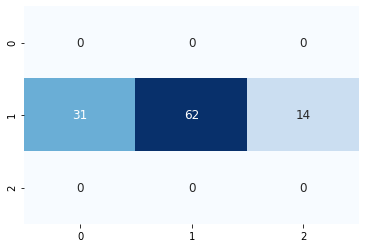

108/108 [==============================] - 0s 283us/sample - loss: 0.9038 - accuracy: 0.5926


108/108 [==============================] - 0s 317us/sample - loss: 0.8714 - accuracy: 0.5833


107/107 [==============================] - 0s 270us/sample - loss: 1.0006 - accuracy: 0.5701


107/107 [==============================] - 0s 278us/sample - loss: 0.9497 - accuracy: 0.5794


108/108 [==============================] - 0s 321us/sample - loss: 0.9816 - accuracy: 0.5278


108/108 [==============================] - 0s 327us/sample - loss: 0.9049 - accuracy: 0.5833


107/107 [==============================] - 0s 267us/sample - loss: 1.0247 - accuracy: 0.4860


108/108 [==============================] - 0s 263us/sample - loss: 0.9364 - accuracy: 0.5926


107/107 [==============================] - 0s 305us/sample - loss: 0.9103 - accuracy: 0.5607


108/108 [==============================] - 0s 311us/sample - loss: 0.9491 - accuracy: 0.6204


108/108 [==============================] - 0s 285us/sample - loss: 0.9773 - accuracy: 0.5463


Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3875 samples, validate on 1012 samples
Epoch 1/300
3875/3875 [==============================] - 2s 639us/sample - loss: 0.9619 - accuracy: 0.5471 - val_loss: 1.0156 - val_accuracy: 0.5316
Epoch 2/300
3875/3875 [==============================] - 1s 231us/sample - loss: 0.8213 - accuracy: 0.6320 - val_loss: 1.0160 - val_accuracy: 0.5326
Epoch 3/300
3875/3875 [==============================] - 1s 218us/sample - loss: 0.7240 - accuracy: 0.6883 - val_loss: 1.0358 - val_accuracy: 0.5188
Epoch 4/300
3875/3875 [==============================] - 1s 219us/sample - loss: 0.6330 - accuracy: 0.7355 - val_loss: 1.0938 - val_accuracy: 0.5010
Epoch 00004: early stopping
102/102 [==============================] - 0s 170us/sample - loss: 0.5744 - accuracy: 0.7745


17it [8:33:27, 1771.84s/it]
100%|██████████| 3/3 [00:06<00:00,  2.14s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.484375 steps, validate for 75.75390625 steps
Epoch 1/300
286/285 [==============================] - 30s 104ms/step - loss: 0.9390 - accuracy: 0.5713 - val_loss: 0.9910 - val_accuracy: 0.5554
Epoch 2/300
286/285 [==============================] - 28s 99ms/step - loss: 0.8782 - accuracy: 0.5980 - val_loss: 0.9992 - val_accuracy: 0.5444
Epoch 3/300
286/285 [==============================] - 29s 100ms/step - loss: 0.8478 - accuracy: 0.6145 - val_loss: 1.0344 - val_accuracy: 0.5293
Epoch 4/300
286/285 [==============================] - 29s 102ms/step - loss: 0.8234 - accuracy: 0.6266 - val_loss: 1.0531 - val_accuracy: 0.5242
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 285.484375 steps, validate for 75.75390625 steps
Epoch 1/300
286/285 [==============================] - 70s 243ms/step - loss: 0.7855 - accuracy: 0.6472 - val_loss: 1.2117 - val_accuracy

92/92 [==============================] - 0s 243us/sample - loss: 0.8936 - accuracy: 0.6739


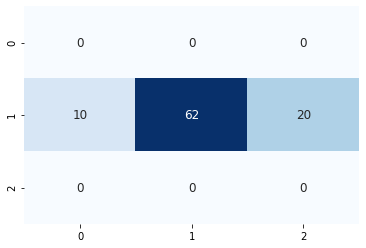

90/90 [==============================] - 0s 271us/sample - loss: 0.7283 - accuracy: 0.7889


85/85 [==============================] - 0s 250us/sample - loss: 0.7404 - accuracy: 0.7647


84/84 [==============================] - 0s 257us/sample - loss: 0.8420 - accuracy: 0.6786


82/82 [==============================] - 0s 250us/sample - loss: 0.8384 - accuracy: 0.6951


82/82 [==============================] - 0s 262us/sample - loss: 0.9008 - accuracy: 0.6707


80/80 [==============================] - 0s 292us/sample - loss: 0.7908 - accuracy: 0.6875


79/79 [==============================] - 0s 307us/sample - loss: 0.9057 - accuracy: 0.6962


79/79 [==============================] - 0s 324us/sample - loss: 0.8843 - accuracy: 0.6835


78/78 [==============================] - 0s 344us/sample - loss: 0.8064 - accuracy: 0.7051


79/79 [==============================] - 0s 314us/sample - loss: 0.8157 - accuracy: 0.7468


79/79 [==============================] - 0s 296us/sample - loss: 0.9886 - accuracy: 0.6962


79/79 [==============================] - 0s 297us/sample - loss: 0.9841 - accuracy: 0.7215


78/78 [==============================] - 0s 283us/sample - loss: 1.0729 - accuracy: 0.6538


78/78 [==============================] - 0s 297us/sample - loss: 0.8980 - accuracy: 0.6667


77/77 [==============================] - 0s 320us/sample - loss: 1.0728 - accuracy: 0.6753


78/78 [==============================] - 0s 293us/sample - loss: 1.2687 - accuracy: 0.5256


77/77 [==============================] - 0s 359us/sample - loss: 1.1351 - accuracy: 0.6104


78/78 [==============================] - 0s 282us/sample - loss: 1.1459 - accuracy: 0.6410


79/79 [==============================] - 0s 272us/sample - loss: 1.2179 - accuracy: 0.5570


79/79 [==============================] - 0s 261us/sample - loss: 1.1094 - accuracy: 0.6582


79/79 [==============================] - 0s 287us/sample - loss: 1.1926 - accuracy: 0.6076


79/79 [==============================] - 0s 323us/sample - loss: 1.1651 - accuracy: 0.5949


78/78 [==============================] - 0s 275us/sample - loss: 1.3936 - accuracy: 0.6026


77/77 [==============================] - 0s 321us/sample - loss: 1.1789 - accuracy: 0.6364


76/76 [==============================] - 0s 425us/sample - loss: 1.2989 - accuracy: 0.5526


75/75 [==============================] - 0s 292us/sample - loss: 1.3037 - accuracy: 0.5467


76/76 [==============================] - 0s 277us/sample - loss: 1.3322 - accuracy: 0.4737


76/76 [==============================] - 0s 330us/sample - loss: 1.2528 - accuracy: 0.5395


75/75 [==============================] - 0s 271us/sample - loss: 1.2543 - accuracy: 0.5733


75/75 [==============================] - 0s 331us/sample - loss: 1.1734 - accuracy: 0.5200


74/74 [==============================] - 0s 326us/sample - loss: 1.2175 - accuracy: 0.5676


Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3898 samples, validate on 1020 samples
Epoch 1/300
3898/3898 [==============================] - 3s 675us/sample - loss: 1.0067 - accuracy: 0.5008 - val_loss: 0.9994 - val_accuracy: 0.5127
Epoch 2/300
3898/3898 [==============================] - 1s 200us/sample - loss: 0.8137 - accuracy: 0.6493 - val_loss: 0.9960 - val_accuracy: 0.5108
Epoch 3/300
3898/3898 [==============================] - 1s 232us/sample - loss: 0.6931 - accuracy: 0.7227 - val_loss: 1.0181 - val_accuracy: 0.5245
Epoch 4/300
3898/3898 [==============================] - 1s 209us/sample - loss: 0.5739 - accuracy: 0.7886 - val_loss: 1.0733 - val_accuracy: 0.5137
Epoch 5/300
3898/3898 [==============================] - 1s 203us/sample - loss: 0.4666 - accuracy: 0.8415 - val_loss: 1.1612 - val_accuracy: 0.4951
Epoch 00005: early stopping
71/71 [==============================] - 0s 142us/sample - loss: 0.8065 - accuracy: 0.5775


18it [9:03:37, 1783.24s/it]
100%|██████████| 3/3 [00:06<00:00,  2.07s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 286.5234375 steps, validate for 75.51171875 steps
Epoch 1/300
287/286 [==============================] - 29s 102ms/step - loss: 0.9455 - accuracy: 0.5657 - val_loss: 0.9925 - val_accuracy: 0.5445
Epoch 2/300
287/286 [==============================] - 29s 100ms/step - loss: 0.8774 - accuracy: 0.6010 - val_loss: 1.0067 - val_accuracy: 0.5438
Epoch 3/300
287/286 [==============================] - 29s 100ms/step - loss: 0.8475 - accuracy: 0.6159 - val_loss: 1.0389 - val_accuracy: 0.5392
Epoch 4/300
287/286 [==============================] - 29s 100ms/step - loss: 0.8244 - accuracy: 0.6281 - val_loss: 1.0670 - val_accuracy: 0.5251
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 286.5234375 steps, validate for 75.51171875 steps
Epoch 1/300
287/286 [==============================] - 70s 243ms/step - loss: 0.7878 - accuracy: 0.6480 - val_loss: 1.1624 - val_accur

75/75 [==============================] - 0s 349us/sample - loss: 0.6325 - accuracy: 0.7333


73/73 [==============================] - 0s 312us/sample - loss: 0.7204 - accuracy: 0.6301


71/71 [==============================] - 0s 283us/sample - loss: 0.6680 - accuracy: 0.6901


71/71 [==============================] - 0s 328us/sample - loss: 0.5554 - accuracy: 0.7746


68/68 [==============================] - 0s 272us/sample - loss: 0.5987 - accuracy: 0.7794


69/69 [==============================] - 0s 291us/sample - loss: 0.6165 - accuracy: 0.7536


68/68 [==============================] - 0s 330us/sample - loss: 0.5530 - accuracy: 0.7794


66/66 [==============================] - 0s 299us/sample - loss: 0.6711 - accuracy: 0.7424


65/65 [==============================] - 0s 327us/sample - loss: 0.5910 - accuracy: 0.8308


64/64 [==============================] - 0s 3ms/sample - loss: 0.5678 - accuracy: 0.7500


65/65 [==============================] - 0s 327us/sample - loss: 0.4867 - accuracy: 0.8154


66/66 [==============================] - 0s 321us/sample - loss: 0.6141 - accuracy: 0.7424


65/65 [==============================] - 0s 310us/sample - loss: 0.5534 - accuracy: 0.7692


65/65 [==============================] - 0s 324us/sample - loss: 0.4874 - accuracy: 0.8615


66/66 [==============================] - 0s 321us/sample - loss: 0.7690 - accuracy: 0.6970


68/68 [==============================] - 0s 353us/sample - loss: 0.5638 - accuracy: 0.8235


66/66 [==============================] - 0s 350us/sample - loss: 0.6843 - accuracy: 0.7273


66/66 [==============================] - 0s 305us/sample - loss: 0.5927 - accuracy: 0.7727


66/66 [==============================] - 0s 307us/sample - loss: 0.7087 - accuracy: 0.7424


67/67 [==============================] - 0s 407us/sample - loss: 0.5852 - accuracy: 0.7164


66/66 [==============================] - 0s 298us/sample - loss: 0.6556 - accuracy: 0.6818


67/67 [==============================] - 0s 306us/sample - loss: 0.4935 - accuracy: 0.8209


66/66 [==============================] - 0s 397us/sample - loss: 0.6579 - accuracy: 0.7273


66/66 [==============================] - 0s 336us/sample - loss: 0.7144 - accuracy: 0.7121


66/66 [==============================] - 0s 312us/sample - loss: 0.6205 - accuracy: 0.7576


66/66 [==============================] - 0s 340us/sample - loss: 0.5766 - accuracy: 0.8182


66/66 [==============================] - 0s 323us/sample - loss: 0.6711 - accuracy: 0.7424


66/66 [==============================] - 0s 315us/sample - loss: 0.6209 - accuracy: 0.6970


66/66 [==============================] - 0s 338us/sample - loss: 0.5704 - accuracy: 0.7576


65/65 [==============================] - 0s 402us/sample - loss: 0.6228 - accuracy: 0.7538


64/64 [==============================] - 0s 245us/sample - loss: 0.6468 - accuracy: 0.7031


65/65 [==============================] - 0s 308us/sample - loss: 0.6339 - accuracy: 0.6923


Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3914 samples, validate on 1014 samples
Epoch 1/300
3914/3914 [==============================] - 3s 698us/sample - loss: 0.9536 - accuracy: 0.5470 - val_loss: 0.9923 - val_accuracy: 0.5385
Epoch 2/300
3914/3914 [==============================] - 1s 215us/sample - loss: 0.7512 - accuracy: 0.6811 - val_loss: 1.0128 - val_accuracy: 0.5375
Epoch 3/300
3914/3914 [==============================] - 1s 197us/sample - loss: 0.6121 - accuracy: 0.7629 - val_loss: 1.0652 - val_accuracy: 0.5306
Epoch 4/300
3914/3914 [==============================] - 1s 192us/sample - loss: 0.4863 - accuracy: 0.8291 - val_loss: 1.1541 - val_accuracy: 0.5276
Epoch 00004: early stopping
61/61 [==============================] - 0s 169us/sample - loss: 0.6451 - accuracy: 0.7377


19it [9:33:59, 1794.83s/it]
100%|██████████| 3/3 [00:06<00:00,  2.08s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.326171875 steps, validate for 75.744140625 steps
Epoch 1/300
283/282 [==============================] - 29s 101ms/step - loss: 0.9503 - accuracy: 0.5612 - val_loss: 0.9893 - val_accuracy: 0.5462
Epoch 2/300
283/282 [==============================] - 28s 99ms/step - loss: 0.8850 - accuracy: 0.5947 - val_loss: 1.0077 - val_accuracy: 0.5397
Epoch 3/300
283/282 [==============================] - 28s 99ms/step - loss: 0.8559 - accuracy: 0.6100 - val_loss: 1.0373 - val_accuracy: 0.5217
Epoch 4/300
283/282 [==============================] - 28s 99ms/step - loss: 0.8324 - accuracy: 0.6224 - val_loss: 1.0579 - val_accuracy: 0.5284
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.326171875 steps, validate for 75.744140625 steps
Epoch 1/300
283/282 [==============================] - 69s 245ms/step - loss: 0.7955 - accuracy: 0.6440 - val_loss: 1.0945 - val_ac

142/142 [==============================] - 0s 239us/sample - loss: 0.7495 - accuracy: 0.6479


137/137 [==============================] - 0s 244us/sample - loss: 0.7324 - accuracy: 0.7007


134/134 [==============================] - 0s 257us/sample - loss: 0.7457 - accuracy: 0.6642


135/135 [==============================] - 0s 245us/sample - loss: 0.7201 - accuracy: 0.6519


134/134 [==============================] - 0s 332us/sample - loss: 0.7852 - accuracy: 0.5896


135/135 [==============================] - 0s 246us/sample - loss: 0.7697 - accuracy: 0.5926


136/136 [==============================] - 0s 258us/sample - loss: 0.8452 - accuracy: 0.5882


138/138 [==============================] - 0s 350us/sample - loss: 0.7452 - accuracy: 0.6522


134/134 [==============================] - 0s 276us/sample - loss: 0.7459 - accuracy: 0.6791


131/131 [==============================] - 0s 284us/sample - loss: 0.7920 - accuracy: 0.5954


129/129 [==============================] - 0s 252us/sample - loss: 0.7387 - accuracy: 0.6357


129/129 [==============================] - 0s 277us/sample - loss: 0.8189 - accuracy: 0.6047


129/129 [==============================] - 0s 293us/sample - loss: 0.7202 - accuracy: 0.6589


130/130 [==============================] - 0s 261us/sample - loss: 0.7494 - accuracy: 0.6154


128/128 [==============================] - 0s 2ms/sample - loss: 0.7581 - accuracy: 0.6016


127/127 [==============================] - 0s 268us/sample - loss: 0.8342 - accuracy: 0.5748


127/127 [==============================] - 0s 244us/sample - loss: 0.8470 - accuracy: 0.5354


127/127 [==============================] - 0s 229us/sample - loss: 0.7727 - accuracy: 0.6457


126/126 [==============================] - 0s 249us/sample - loss: 0.7917 - accuracy: 0.6349


125/125 [==============================] - 0s 284us/sample - loss: 0.9225 - accuracy: 0.5680


125/125 [==============================] - 0s 252us/sample - loss: 0.8892 - accuracy: 0.5840


124/124 [==============================] - 0s 238us/sample - loss: 0.8695 - accuracy: 0.5565


123/123 [==============================] - 0s 294us/sample - loss: 0.8298 - accuracy: 0.5610


122/122 [==============================] - 0s 250us/sample - loss: 0.7632 - accuracy: 0.6230


122/122 [==============================] - 0s 255us/sample - loss: 0.8691 - accuracy: 0.5902


120/120 [==============================] - 0s 243us/sample - loss: 0.8752 - accuracy: 0.5750


123/123 [==============================] - 0s 233us/sample - loss: 0.8194 - accuracy: 0.6016


121/121 [==============================] - 0s 277us/sample - loss: 0.9034 - accuracy: 0.5372


123/123 [==============================] - 0s 273us/sample - loss: 0.8707 - accuracy: 0.5528


123/123 [==============================] - 0s 230us/sample - loss: 0.8718 - accuracy: 0.5854


122/122 [==============================] - 0s 236us/sample - loss: 0.8250 - accuracy: 0.5656


122/122 [==============================] - 0s 247us/sample - loss: 0.8805 - accuracy: 0.5820


Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3858 samples, validate on 1019 samples
Epoch 1/300
3858/3858 [==============================] - 3s 717us/sample - loss: 0.9609 - accuracy: 0.5259 - val_loss: 1.0037 - val_accuracy: 0.5240
Epoch 2/300
3858/3858 [==============================] - 1s 200us/sample - loss: 0.8184 - accuracy: 0.6363 - val_loss: 1.0120 - val_accuracy: 0.5289
Epoch 3/300
3858/3858 [==============================] - 1s 209us/sample - loss: 0.7282 - accuracy: 0.6866 - val_loss: 1.0398 - val_accuracy: 0.5280
Epoch 4/300
3858/3858 [==============================] - 1s 226us/sample - loss: 0.6504 - accuracy: 0.7382 - val_loss: 1.0806 - val_accuracy: 0.5093
Epoch 00004: early stopping
112/112 [==============================] - 0s 152us/sample - loss: 0.6341 - accuracy: 0.7500


20it [10:02:48, 1775.03s/it]
100%|██████████| 3/3 [00:06<00:00,  2.21s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.234375 steps, validate for 74.283203125 steps
Epoch 1/300
285/284 [==============================] - 29s 100ms/step - loss: 0.9435 - accuracy: 0.5624 - val_loss: 0.9950 - val_accuracy: 0.5466
Epoch 2/300
285/284 [==============================] - 28s 98ms/step - loss: 0.8794 - accuracy: 0.5973 - val_loss: 1.0064 - val_accuracy: 0.5428
Epoch 3/300
285/284 [==============================] - 28s 99ms/step - loss: 0.8499 - accuracy: 0.6119 - val_loss: 1.0258 - val_accuracy: 0.5320
Epoch 4/300
285/284 [==============================] - 28s 100ms/step - loss: 0.8258 - accuracy: 0.6244 - val_loss: 1.0470 - val_accuracy: 0.5311
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 284.234375 steps, validate for 74.283203125 steps
Epoch 1/300
285/284 [==============================] - 70s 245ms/step - loss: 0.7874 - accuracy: 0.6467 - val_loss: 1.2194 - val_accurac

131/131 [==============================] - 0s 284us/sample - loss: 0.6804 - accuracy: 0.7252


125/125 [==============================] - 0s 285us/sample - loss: 0.6943 - accuracy: 0.7200


125/125 [==============================] - 0s 229us/sample - loss: 0.6627 - accuracy: 0.7600


126/126 [==============================] - 0s 241us/sample - loss: 0.7050 - accuracy: 0.7540


126/126 [==============================] - 0s 226us/sample - loss: 0.7025 - accuracy: 0.7143


126/126 [==============================] - 0s 243us/sample - loss: 0.6005 - accuracy: 0.7778


123/123 [==============================] - 0s 240us/sample - loss: 0.5588 - accuracy: 0.7480


124/124 [==============================] - 0s 266us/sample - loss: 0.5625 - accuracy: 0.7823


123/123 [==============================] - 0s 232us/sample - loss: 0.5062 - accuracy: 0.7886


124/124 [==============================] - 0s 269us/sample - loss: 0.4948 - accuracy: 0.7984


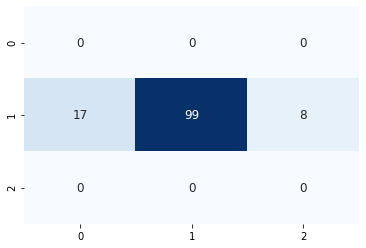

124/124 [==============================] - 0s 257us/sample - loss: 0.5016 - accuracy: 0.7823


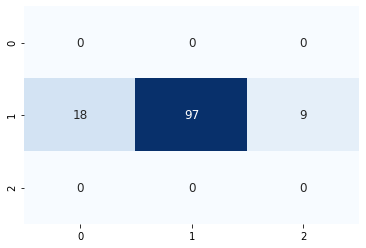

123/123 [==============================] - 0s 299us/sample - loss: 0.5419 - accuracy: 0.7886


120/120 [==============================] - 0s 240us/sample - loss: 0.6495 - accuracy: 0.6917


121/121 [==============================] - 0s 284us/sample - loss: 0.6075 - accuracy: 0.7603


121/121 [==============================] - 0s 242us/sample - loss: 0.5942 - accuracy: 0.7521


121/121 [==============================] - 0s 270us/sample - loss: 0.5857 - accuracy: 0.7769


120/120 [==============================] - 0s 263us/sample - loss: 0.5743 - accuracy: 0.7583


121/121 [==============================] - 0s 235us/sample - loss: 0.4766 - accuracy: 0.8099


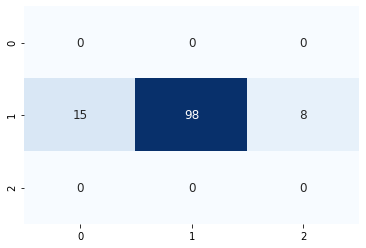

120/120 [==============================] - 0s 260us/sample - loss: 0.5305 - accuracy: 0.7750


120/120 [==============================] - 0s 274us/sample - loss: 0.5770 - accuracy: 0.7833


119/119 [==============================] - 0s 275us/sample - loss: 0.5879 - accuracy: 0.7479


119/119 [==============================] - 0s 274us/sample - loss: 0.6204 - accuracy: 0.7311


119/119 [==============================] - 0s 251us/sample - loss: 0.5860 - accuracy: 0.7227


119/119 [==============================] - 0s 243us/sample - loss: 0.6751 - accuracy: 0.7395


118/118 [==============================] - 0s 273us/sample - loss: 0.6031 - accuracy: 0.7203


117/117 [==============================] - 0s 246us/sample - loss: 0.5763 - accuracy: 0.7265


118/118 [==============================] - 0s 252us/sample - loss: 0.6164 - accuracy: 0.7373


120/120 [==============================] - 0s 269us/sample - loss: 0.5254 - accuracy: 0.7583


118/118 [==============================] - 0s 253us/sample - loss: 0.5772 - accuracy: 0.7288


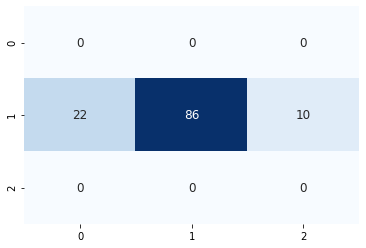

117/117 [==============================] - 0s 262us/sample - loss: 0.5703 - accuracy: 0.7350


118/118 [==============================] - 0s 287us/sample - loss: 0.6319 - accuracy: 0.7542


118/118 [==============================] - 0s 279us/sample - loss: 0.6083 - accuracy: 0.7288


Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3878 samples, validate on 1000 samples
Epoch 1/300
3878/3878 [==============================] - 3s 674us/sample - loss: 0.8641 - accuracy: 0.6037 - val_loss: 1.0083 - val_accuracy: 0.5160
Epoch 2/300
3878/3878 [==============================] - 1s 221us/sample - loss: 0.6024 - accuracy: 0.7661 - val_loss: 1.0853 - val_accuracy: 0.5030
Epoch 3/300
3878/3878 [==============================] - 1s 216us/sample - loss: 0.4298 - accuracy: 0.8644 - val_loss: 1.1882 - val_accuracy: 0.5020
Epoch 4/300
3878/3878 [==============================] - 1s 216us/sample - loss: 0.3218 - accuracy: 0.9061 - val_loss: 1.3139 - val_accuracy: 0.4990
Epoch 00004: early stopping
111/111 [==============================] - 0s 146us/sample - loss: 0.9689 - accuracy: 0.5495


21it [10:34:10, 1807.10s/it]
100%|██████████| 3/3 [00:06<00:00,  2.11s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.6484375 steps, validate for 75.130859375 steps
Epoch 1/300
284/283 [==============================] - 29s 103ms/step - loss: 0.9457 - accuracy: 0.5639 - val_loss: 0.9952 - val_accuracy: 0.5504
Epoch 2/300
284/283 [==============================] - 28s 99ms/step - loss: 0.8818 - accuracy: 0.5961 - val_loss: 1.0199 - val_accuracy: 0.5380
Epoch 3/300
284/283 [==============================] - 28s 99ms/step - loss: 0.8513 - accuracy: 0.6114 - val_loss: 1.0449 - val_accuracy: 0.5293
Epoch 4/300
284/283 [==============================] - 28s 99ms/step - loss: 0.8269 - accuracy: 0.6259 - val_loss: 1.0747 - val_accuracy: 0.5232
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 283.6484375 steps, validate for 75.130859375 steps
Epoch 1/300
284/283 [==============================] - 69s 242ms/step - loss: 0.7897 - accuracy: 0.6443 - val_loss: 1.3106 - val_accura

138/138 [==============================] - 0s 432us/sample - loss: 0.7835 - accuracy: 0.7246


134/134 [==============================] - 0s 254us/sample - loss: 0.7132 - accuracy: 0.6866


133/133 [==============================] - 0s 291us/sample - loss: 0.7359 - accuracy: 0.7293


133/133 [==============================] - 0s 277us/sample - loss: 0.5703 - accuracy: 0.7820


130/130 [==============================] - 0s 296us/sample - loss: 0.5853 - accuracy: 0.7692


126/126 [==============================] - 0s 247us/sample - loss: 0.5948 - accuracy: 0.7778


126/126 [==============================] - 0s 261us/sample - loss: 0.5455 - accuracy: 0.8175


124/124 [==============================] - 0s 243us/sample - loss: 0.5638 - accuracy: 0.7823


121/121 [==============================] - 0s 270us/sample - loss: 0.5922 - accuracy: 0.8099


118/118 [==============================] - 0s 272us/sample - loss: 0.5857 - accuracy: 0.7288


117/117 [==============================] - 0s 260us/sample - loss: 0.5726 - accuracy: 0.8034


120/120 [==============================] - 0s 260us/sample - loss: 0.5942 - accuracy: 0.7333


117/117 [==============================] - 0s 324us/sample - loss: 0.5857 - accuracy: 0.7521


116/116 [==============================] - 0s 271us/sample - loss: 0.5919 - accuracy: 0.7155


114/114 [==============================] - 0s 254us/sample - loss: 0.6238 - accuracy: 0.7193


113/113 [==============================] - 0s 308us/sample - loss: 0.6120 - accuracy: 0.7257


113/113 [==============================] - 0s 299us/sample - loss: 0.5988 - accuracy: 0.7168


112/112 [==============================] - 0s 275us/sample - loss: 0.6412 - accuracy: 0.7500


112/112 [==============================] - 0s 287us/sample - loss: 0.6947 - accuracy: 0.7500


113/113 [==============================] - 0s 254us/sample - loss: 0.5963 - accuracy: 0.7876


112/112 [==============================] - 0s 290us/sample - loss: 0.6088 - accuracy: 0.7500


113/113 [==============================] - 0s 294us/sample - loss: 0.5791 - accuracy: 0.7788


111/111 [==============================] - 0s 267us/sample - loss: 0.5771 - accuracy: 0.7838


110/110 [==============================] - 0s 259us/sample - loss: 0.5016 - accuracy: 0.8455


110/110 [==============================] - 0s 261us/sample - loss: 0.5016 - accuracy: 0.7636


111/111 [==============================] - 0s 289us/sample - loss: 0.5206 - accuracy: 0.8288


109/109 [==============================] - 0s 262us/sample - loss: 0.4686 - accuracy: 0.8349


108/108 [==============================] - 0s 280us/sample - loss: 0.4477 - accuracy: 0.8241


106/106 [==============================] - 0s 304us/sample - loss: 0.5378 - accuracy: 0.7264


106/106 [==============================] - 0s 291us/sample - loss: 0.5202 - accuracy: 0.7642


106/106 [==============================] - 0s 272us/sample - loss: 0.5909 - accuracy: 0.7358


104/104 [==============================] - 0s 328us/sample - loss: 0.5315 - accuracy: 0.7308


Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3877 samples, validate on 1013 samples
Epoch 1/300
3877/3877 [==============================] - 3s 663us/sample - loss: 0.9715 - accuracy: 0.5298 - val_loss: 1.0301 - val_accuracy: 0.5123
Epoch 2/300
3877/3877 [==============================] - 1s 202us/sample - loss: 0.7953 - accuracy: 0.6422 - val_loss: 1.0438 - val_accuracy: 0.5123
Epoch 3/300
3877/3877 [==============================] - 1s 208us/sample - loss: 0.6900 - accuracy: 0.7026 - val_loss: 1.0703 - val_accuracy: 0.5025
Epoch 4/300
3877/3877 [==============================] - 1s 204us/sample - loss: 0.5896 - accuracy: 0.7643 - val_loss: 1.1116 - val_accuracy: 0.4946
Epoch 00004: early stopping
99/99 [==============================] - 0s 177us/sample - loss: 0.6889 - accuracy: 0.6566


22it [11:04:10, 1805.20s/it]
100%|██████████| 3/3 [00:06<00:00,  2.08s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.912109375 steps, validate for 74.943359375 steps
Epoch 1/300
283/282 [==============================] - 29s 103ms/step - loss: 0.9421 - accuracy: 0.5634 - val_loss: 0.9846 - val_accuracy: 0.5479
Epoch 2/300
283/282 [==============================] - 28s 100ms/step - loss: 0.8809 - accuracy: 0.5952 - val_loss: 0.9988 - val_accuracy: 0.5423
Epoch 3/300
283/282 [==============================] - 29s 101ms/step - loss: 0.8507 - accuracy: 0.6111 - val_loss: 1.0354 - val_accuracy: 0.5330
Epoch 4/300
283/282 [==============================] - 28s 101ms/step - loss: 0.8271 - accuracy: 0.6244 - val_loss: 1.0585 - val_accuracy: 0.5215
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.912109375 steps, validate for 74.943359375 steps
Epoch 1/300
283/282 [==============================] - 69s 243ms/step - loss: 0.7913 - accuracy: 0.6449 - val_loss: 1.1045 - val

145/145 [==============================] - 0s 245us/sample - loss: 0.5244 - accuracy: 0.8069


142/142 [==============================] - 0s 251us/sample - loss: 0.5706 - accuracy: 0.8028


138/138 [==============================] - 0s 232us/sample - loss: 0.5185 - accuracy: 0.7899


137/137 [==============================] - 0s 263us/sample - loss: 0.5399 - accuracy: 0.7956


137/137 [==============================] - 0s 232us/sample - loss: 0.5941 - accuracy: 0.7445


136/136 [==============================] - 0s 264us/sample - loss: 0.5611 - accuracy: 0.7059


135/135 [==============================] - 0s 270us/sample - loss: 0.5669 - accuracy: 0.7333


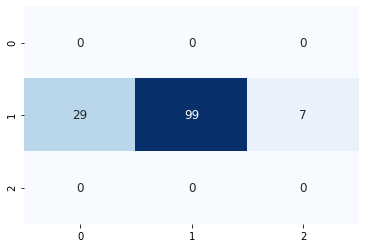

136/136 [==============================] - 0s 287us/sample - loss: 0.5731 - accuracy: 0.6912


134/134 [==============================] - 0s 298us/sample - loss: 0.5885 - accuracy: 0.7537


132/132 [==============================] - 0s 313us/sample - loss: 0.5695 - accuracy: 0.7652


132/132 [==============================] - 0s 249us/sample - loss: 0.5930 - accuracy: 0.7045


133/133 [==============================] - 0s 267us/sample - loss: 0.5330 - accuracy: 0.7293


132/132 [==============================] - 0s 262us/sample - loss: 0.6866 - accuracy: 0.6742


133/133 [==============================] - 0s 256us/sample - loss: 0.6219 - accuracy: 0.7293


130/130 [==============================] - 0s 264us/sample - loss: 0.6963 - accuracy: 0.6846


132/132 [==============================] - 0s 268us/sample - loss: 0.6541 - accuracy: 0.6970


131/131 [==============================] - 0s 275us/sample - loss: 0.6490 - accuracy: 0.7557


132/132 [==============================] - 0s 269us/sample - loss: 0.6307 - accuracy: 0.7197


131/131 [==============================] - 0s 280us/sample - loss: 0.6632 - accuracy: 0.7099


129/129 [==============================] - 0s 272us/sample - loss: 0.6060 - accuracy: 0.7674


129/129 [==============================] - 0s 260us/sample - loss: 0.6116 - accuracy: 0.7364


129/129 [==============================] - 0s 266us/sample - loss: 0.6609 - accuracy: 0.7287


128/128 [==============================] - 0s 2ms/sample - loss: 0.7133 - accuracy: 0.7188


129/129 [==============================] - 0s 277us/sample - loss: 0.7091 - accuracy: 0.7132


127/127 [==============================] - 0s 249us/sample - loss: 0.6595 - accuracy: 0.7165


127/127 [==============================] - 0s 295us/sample - loss: 0.7061 - accuracy: 0.7244


126/126 [==============================] - 0s 262us/sample - loss: 0.6660 - accuracy: 0.7143


124/124 [==============================] - 0s 248us/sample - loss: 0.7801 - accuracy: 0.6452


126/126 [==============================] - 0s 243us/sample - loss: 0.7071 - accuracy: 0.6825


125/125 [==============================] - 0s 240us/sample - loss: 0.7021 - accuracy: 0.7520


123/123 [==============================] - 0s 264us/sample - loss: 0.7112 - accuracy: 0.6911


125/125 [==============================] - 0s 255us/sample - loss: 0.6554 - accuracy: 0.7360


Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3864 samples, validate on 1006 samples
Epoch 1/300
3864/3864 [==============================] - 3s 688us/sample - loss: 0.9833 - accuracy: 0.5114 - val_loss: 0.9885 - val_accuracy: 0.5517
Epoch 2/300
3864/3864 [==============================] - 1s 212us/sample - loss: 0.8275 - accuracy: 0.6338 - val_loss: 0.9958 - val_accuracy: 0.5477
Epoch 3/300
3864/3864 [==============================] - 1s 212us/sample - loss: 0.7377 - accuracy: 0.6858 - val_loss: 1.0199 - val_accuracy: 0.5427
Epoch 4/300
3864/3864 [==============================] - 1s 196us/sample - loss: 0.6527 - accuracy: 0.7321 - val_loss: 1.0601 - val_accuracy: 0.5388
Epoch 00004: early stopping
119/119 [==============================] - 0s 254us/sample - loss: 0.5619 - accuracy: 0.7815


23it [11:33:09, 1785.25s/it]
100%|██████████| 3/3 [00:06<00:00,  2.19s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.12109375 steps, validate for 75.3984375 steps
Epoch 1/300
283/282 [==============================] - 29s 102ms/step - loss: 0.9418 - accuracy: 0.5652 - val_loss: 0.9819 - val_accuracy: 0.5470
Epoch 2/300
283/282 [==============================] - 28s 100ms/step - loss: 0.8830 - accuracy: 0.5958 - val_loss: 0.9981 - val_accuracy: 0.5402
Epoch 3/300
283/282 [==============================] - 29s 101ms/step - loss: 0.8526 - accuracy: 0.6103 - val_loss: 1.0399 - val_accuracy: 0.5256
Epoch 4/300
283/282 [==============================] - 29s 102ms/step - loss: 0.8279 - accuracy: 0.6243 - val_loss: 1.0645 - val_accuracy: 0.5242
Epoch 00004: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.12109375 steps, validate for 75.3984375 steps
Epoch 1/300
283/282 [==============================] - 69s 244ms/step - loss: 0.7931 - accuracy: 0.6436 - val_loss: 1.2085 - val_accur

154/154 [==============================] - 0s 216us/sample - loss: 1.3711 - accuracy: 0.4675


151/151 [==============================] - 0s 230us/sample - loss: 1.2710 - accuracy: 0.4702


146/146 [==============================] - 0s 319us/sample - loss: 1.1930 - accuracy: 0.5000


147/147 [==============================] - 0s 236us/sample - loss: 1.1654 - accuracy: 0.5102


145/145 [==============================] - 0s 275us/sample - loss: 1.1092 - accuracy: 0.5241


145/145 [==============================] - 0s 269us/sample - loss: 1.1418 - accuracy: 0.5724


144/144 [==============================] - 0s 288us/sample - loss: 1.1098 - accuracy: 0.4931


145/145 [==============================] - 0s 263us/sample - loss: 1.1497 - accuracy: 0.4552


143/143 [==============================] - 0s 318us/sample - loss: 1.2000 - accuracy: 0.4685


142/142 [==============================] - 0s 380us/sample - loss: 1.2439 - accuracy: 0.4155


140/140 [==============================] - 0s 269us/sample - loss: 1.2363 - accuracy: 0.4357


138/138 [==============================] - 0s 265us/sample - loss: 1.0865 - accuracy: 0.5580


138/138 [==============================] - 0s 274us/sample - loss: 1.1551 - accuracy: 0.4638


137/137 [==============================] - 0s 281us/sample - loss: 1.2847 - accuracy: 0.4526


136/136 [==============================] - 0s 267us/sample - loss: 1.1841 - accuracy: 0.4853


138/138 [==============================] - 0s 300us/sample - loss: 1.2105 - accuracy: 0.4565


138/138 [==============================] - 0s 295us/sample - loss: 1.2241 - accuracy: 0.5000


137/137 [==============================] - 0s 276us/sample - loss: 1.2113 - accuracy: 0.4526


136/136 [==============================] - 0s 275us/sample - loss: 1.2497 - accuracy: 0.4191


136/136 [==============================] - 0s 268us/sample - loss: 1.1705 - accuracy: 0.4926


136/136 [==============================] - 0s 281us/sample - loss: 1.2373 - accuracy: 0.4706


136/136 [==============================] - 0s 270us/sample - loss: 1.1406 - accuracy: 0.5515


135/135 [==============================] - 0s 484us/sample - loss: 1.1109 - accuracy: 0.4741


135/135 [==============================] - 0s 297us/sample - loss: 1.1923 - accuracy: 0.4296


134/134 [==============================] - 0s 274us/sample - loss: 1.1643 - accuracy: 0.4627


133/133 [==============================] - 0s 270us/sample - loss: 1.1115 - accuracy: 0.4962


125/125 [==============================] - 0s 309us/sample - loss: 1.3095 - accuracy: 0.4320


124/124 [==============================] - 0s 252us/sample - loss: 1.3159 - accuracy: 0.4516


122/122 [==============================] - 0s 264us/sample - loss: 1.3248 - accuracy: 0.4262


119/119 [==============================] - 0s 286us/sample - loss: 1.2208 - accuracy: 0.4454


117/117 [==============================] - 0s 313us/sample - loss: 1.3705 - accuracy: 0.4017


116/116 [==============================] - 0s 278us/sample - loss: 1.2856 - accuracy: 0.4224


Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3865 samples, validate on 1016 samples
Epoch 1/300
3865/3865 [==============================] - 3s 699us/sample - loss: 0.9410 - accuracy: 0.5651 - val_loss: 0.9936 - val_accuracy: 0.5561
Epoch 2/300
3865/3865 [==============================] - 1s 233us/sample - loss: 0.8185 - accuracy: 0.6352 - val_loss: 0.9942 - val_accuracy: 0.5463
Epoch 3/300
3865/3865 [==============================] - 1s 219us/sample - loss: 0.7441 - accuracy: 0.6820 - val_loss: 1.0044 - val_accuracy: 0.5502
Epoch 4/300
3865/3865 [==============================] - 1s 219us/sample - loss: 0.6762 - accuracy: 0.7219 - val_loss: 1.0286 - val_accuracy: 0.5492
Epoch 00004: early stopping
108/108 [==============================] - 0s 149us/sample - loss: 0.5325 - accuracy: 0.8426


24it [12:02:16, 1773.60s/it]
100%|██████████| 3/3 [00:05<00:00,  2.00s/it]


Train_images_done
Val_images_done
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.669921875 steps, validate for 75.134765625 steps
Epoch 1/300
283/282 [==============================] - 29s 102ms/step - loss: 0.9424 - accuracy: 0.5636 - val_loss: 1.0147 - val_accuracy: 0.5509
Epoch 2/300
283/282 [==============================] - 28s 100ms/step - loss: 0.8861 - accuracy: 0.5914 - val_loss: 1.0114 - val_accuracy: 0.5422
Epoch 3/300
283/282 [==============================] - 28s 101ms/step - loss: 0.8562 - accuracy: 0.6074 - val_loss: 1.0553 - val_accuracy: 0.5389
Epoch 4/300
283/282 [==============================] - 29s 102ms/step - loss: 0.8295 - accuracy: 0.6223 - val_loss: 1.0703 - val_accuracy: 0.5113
Epoch 5/300
283/282 [==============================] - 28s 99ms/step - loss: 0.8071 - accuracy: 0.6345 - val_loss: 1.0969 - val_accuracy: 0.5277
Epoch 00005: early stopping
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 282.669921875 steps, validate for 75

147/147 [==============================] - 0s 230us/sample - loss: 0.8350 - accuracy: 0.6395


146/146 [==============================] - 0s 232us/sample - loss: 0.8712 - accuracy: 0.6096


144/144 [==============================] - 0s 259us/sample - loss: 0.8226 - accuracy: 0.6111


144/144 [==============================] - 0s 251us/sample - loss: 0.9212 - accuracy: 0.5000


140/140 [==============================] - 0s 252us/sample - loss: 0.8823 - accuracy: 0.5429


139/139 [==============================] - 0s 252us/sample - loss: 1.0414 - accuracy: 0.4676


138/138 [==============================] - 0s 256us/sample - loss: 1.0138 - accuracy: 0.5000


135/135 [==============================] - 0s 282us/sample - loss: 1.0490 - accuracy: 0.4815


135/135 [==============================] - 0s 262us/sample - loss: 1.0970 - accuracy: 0.4889


135/135 [==============================] - 0s 279us/sample - loss: 1.0205 - accuracy: 0.5037


132/132 [==============================] - 0s 259us/sample - loss: 0.9672 - accuracy: 0.5227


132/132 [==============================] - 0s 259us/sample - loss: 0.9788 - accuracy: 0.5227


131/131 [==============================] - 0s 302us/sample - loss: 0.9524 - accuracy: 0.5725


130/130 [==============================] - 0s 378us/sample - loss: 0.9497 - accuracy: 0.5231


131/131 [==============================] - 0s 286us/sample - loss: 0.9747 - accuracy: 0.5191


130/130 [==============================] - 0s 311us/sample - loss: 0.9692 - accuracy: 0.5308


128/128 [==============================] - 0s 2ms/sample - loss: 0.9075 - accuracy: 0.5938


130/130 [==============================] - 0s 271us/sample - loss: 0.9279 - accuracy: 0.5154


130/130 [==============================] - 0s 308us/sample - loss: 0.9374 - accuracy: 0.5308


131/131 [==============================] - 0s 270us/sample - loss: 0.9438 - accuracy: 0.5573


131/131 [==============================] - 0s 322us/sample - loss: 0.9313 - accuracy: 0.5649


131/131 [==============================] - 0s 268us/sample - loss: 0.9758 - accuracy: 0.5038


130/130 [==============================] - 0s 297us/sample - loss: 0.8767 - accuracy: 0.5538


129/129 [==============================] - 0s 275us/sample - loss: 1.0247 - accuracy: 0.5039


128/128 [==============================] - 0s 263us/sample - loss: 0.8853 - accuracy: 0.5312


129/129 [==============================] - 0s 279us/sample - loss: 0.9021 - accuracy: 0.5504


127/127 [==============================] - 0s 269us/sample - loss: 0.8947 - accuracy: 0.5512


128/128 [==============================] - 0s 231us/sample - loss: 0.9515 - accuracy: 0.5312


126/126 [==============================] - 0s 265us/sample - loss: 0.8854 - accuracy: 0.5952


124/124 [==============================] - 0s 266us/sample - loss: 1.0183 - accuracy: 0.4758


122/122 [==============================] - 0s 314us/sample - loss: 1.0228 - accuracy: 0.5246


122/122 [==============================] - 0s 255us/sample - loss: 0.9930 - accuracy: 0.5574


Saved_feature_train
Saved_feature_test
Saved_feature_validation
Train on 3862 samples, validate on 1011 samples
Epoch 1/300
3862/3862 [==============================] - 3s 677us/sample - loss: 0.9494 - accuracy: 0.5544 - val_loss: 0.9647 - val_accuracy: 0.5490
Epoch 2/300
3862/3862 [==============================] - 1s 229us/sample - loss: 0.8271 - accuracy: 0.6367 - val_loss: 0.9701 - val_accuracy: 0.5440
Epoch 3/300
3862/3862 [==============================] - 1s 243us/sample - loss: 0.7497 - accuracy: 0.6771 - val_loss: 0.9888 - val_accuracy: 0.5391
Epoch 4/300
3862/3862 [==============================] - 1s 225us/sample - loss: 0.6642 - accuracy: 0.7141 - val_loss: 1.0202 - val_accuracy: 0.5500
Epoch 00004: early stopping
116/116 [==============================] - 0s 141us/sample - loss: 0.5465 - accuracy: 0.7931


25it [12:32:18, 1805.55s/it]


In [22]:
for num_ix, rand_num in enumerate(rand):
    for index_t_well, _ in tqdm.tqdm(enumerate(tot_well)):

        time_points = list(map(str, range(1,34)))

        new_time = []
        for i in time_points:
            r = '_' + i + '.'
            new_time.append(r)



        path_test = '/home/jovyan/DATA_MASTER_PROJECT/IMG_A549_high_con/{}_cropped/'.format(a)

        # NAME OF THE WELLS CORRESPONDING TO THE DRUG THAT YOU WANT IN THE TEST SET 

        wells_drug = [tot_well[index_t_well][0]] 

        test = []

        for _,_, filenames in os.walk(path_test):

            for filename in sorted(filenames, key = natural_keys):

                for w in wells_drug:
                    for t in new_time:
                        if '{}'.format(w) in filename and '{}tiff'.format(t) in filename:
                            test.append(filename)

        groups_list = ['{}'.format(a), '{}'.format(b), '{}'.format(c)]

        fileds_of_view = ['1','2','3','4','5']

        field_train, field_val = train_test_split(fileds_of_view, test_size=0.2, random_state=rand_num)


        train = []

        validation = []

        group_compounds = []

        for group in tqdm.tqdm(groups_list):

            pa = '/home/jovyan/DATA_MASTER_PROJECT/IMG_A549_high_con/{}_cropped/'.format(group)

            for _,_, filenames in os.walk(pa):

                for filename in sorted(filenames, key = natural_keys):

                    for t in new_time:

                        if '_{}-'.format(wells_drug[0]) not in filename  and '{}tiff'.format(t) in filename:

                            group_compounds.append(filename)






        for i in group_compounds:

            for f in field_train:
                if '-{}_'.format(f) in i:
                    train.append(i)


            for v in field_val:
                if '-{}_'.format(v) in i:
                    validation.append(i)


        x_train = loadImages(train)
        y_train = make_labels(train)
        
        print('Train_images_done')



        x_val = loadImages(validation)
        y_val = make_labels(validation)
        
        print('Val_images_done')


        x_train = resize(x_train)


        x_val = resize(x_val)


        weights = class_weight.compute_class_weight('balanced', np.unique(y_train),y_train)


        x_train = preprocess_input(x_train)

        x_val = preprocess_input(x_val)
        
        y_train = keras.utils.to_categorical(y_train, num_classes = 3)
        
        y_val = keras.utils.to_categorical(y_val, num_classes = 3)


        es = EarlyStopping(monitor='val_loss', mode='min', verbose=2, patience=3)

        pretrained_model = VGG16(weights='imagenet',include_top=False, input_shape=(64, 64, 3))

        base_model = Model(inputs=pretrained_model.input, outputs=pretrained_model.get_layer('block3_pool').output)

        batch_size = 512

        datagen = ImageDataGenerator()

        datagen.fit(x_train)

        train_gen = datagen.flow(x_train, y_train,batch_size=batch_size )

        dat_val = ImageDataGenerator()

        dat_val.fit(x_val)

        val_gen = dat_val.flow(x_val, y_val,batch_size=batch_size)

        m4 = Sequential()
        m4.add(base_model)


        m4.add(BatchNormalization())
        m4.add(GlobalAveragePooling2D())
        m4.add(Dense(64, activation='relu'))
        m4.add(BatchNormalization())
        m4.add(Activation('relu'))
        m4.add(Dense(3,activation='softmax'))


        base_model.trainable = False

        opt = keras.optimizers.Adam(lr=1e-3)

        m4.compile(loss= keras.losses.categorical_crossentropy, optimizer=opt, metrics = ['accuracy'])



        epochs = 300

        m4_h = m4.fit(train_gen,
                        steps_per_epoch=(len(x_train)/batch_size),
                        callbacks = [es],
                        epochs=epochs,
                        validation_data = (val_gen), 
                        validation_steps = (len(x_val)/batch_size),
                        class_weight = weights,
                         verbose = 1)

        base_model.trainable = True

        opt = keras.optimizers.Adam(lr=1e-4)

        m4.compile(loss= keras.losses.categorical_crossentropy, optimizer=opt, metrics = ['accuracy'])

        epochs = 300

        m4_h = m4.fit(train_gen,
                        steps_per_epoch=(len(x_train)/batch_size),
                        callbacks = [es],
                        epochs=epochs,
                        validation_data = val_gen, 
                        validation_steps = (len(x_val)/batch_size),
                        class_weight = weights,
                        verbose = 1)

        l = []
        for t in new_time:
            for i in test:
                if t in i:
                    l.append((i))


        grouped = {}
        for elem in l:
            key = elem.split('.tiff')[0].split('_')[5]
            grouped.setdefault(key, []).append(elem)
        grouped = grouped.values()

        test_data = list(grouped)

        r = []

        for ix ,_ in enumerate(test_data):
            r.append(time_step_acc(test_data[ix],m4))

        plt.plot(time_points,r)
        plt.savefig('/home/jovyan/IMG_CNN_FINAL/{}_accuracy.png'.format(string_well[index_t_well]))

        tot_results_accuracy.append(r)
        
        for i, layer in enumerate(m4.layers):
            layer._name = 'layer_' + str(i)



        lstm_model = Model(inputs=m4.input, outputs=m4.get_layer('layer_4').output)

        del m4
        K.clear_session()
        
        data_name = [train,test,validation]

        feat_name = ['train', 'test', 'validation']

        for index_name, _ in enumerate(data_name):

            path =  data_name[index_name]

            name_well = []

            for i in path:
                name_well.append(i.split('_id')[0])

            wells = list(set(name_well))
            wells

            for w in wells:

                time = []


                for filename in sorted(path, key = natural_keys):
                    if w in filename: #PAY ATTENTION ID THE IMAGE IS A TIFF OR PNG IMAGE #########
                        time.append(filename)

                data_id = {}
                n_id = []
                w_n = []

                for i in time:
                    t = i.split('_id_')[1].split('time_')[0]
                    f = i.split('_id_')[0].split('time_')[0]
                    n_id.append(t)
                    w_n.append(f)

                id_cell = set(n_id)


                for ix, i in enumerate(sorted(id_cell, key = natural_keys)):

                    id_name = []
                    dict_1 = {}

                    for t in time:
                        if 'id_{}'.format(i) in t:
                            id_name.append(t)

                    d = {'id':id_name}
                    data = pd.DataFrame(d)

                    dict_1[ix]=data 
                    data_id.update(dict_1) 

                delete = [i for i, j in data_id.items() if len(j) < len(time_points)] # 9 or the length of time span you are traning on 
                for i in delete : del data_id[i]

                len_id = [i for i, j in data_id.items()]

                for le in len_id:    


                    e = pd.DataFrame(data_id[le])

                    coords = e.values.tolist()
                    id_cells = []
                    for i in coords:
                        for j in i:
                            id_cells.append(j)

                    x_orig = loadImages(id_cells)
                    x_orig = resize(x_orig)

                    x_orig = preprocess_input(x_orig)
                    output = lstm_model.predict(x_orig)
                    np.save('/home/jovyan/DATA_MASTER_PROJECT/LSTM//FEAT_FOLDERS/features_{}/features_well_{}_id_{}.npy'.format(feat_name[index_name],w_n[0], le), output)
            print('Saved_feature_{}'.format(feat_name[index_name]))


        x_train_lstm = loadImages_LSTM(train_data, len(time_points))
        y_train_lstm = make_labels_LSTM(y_tra_path)

        x_test_lstm = loadImages_LSTM(tes_data, len(time_points))
        y_test_lstm = make_labels_LSTM(y_tes_path)

        x_val_lstm = loadImages_LSTM(val_data, len(time_points))
        y_val_lstm = make_labels_LSTM(y_val_path)

        weights_lstm = class_weight.compute_class_weight('balanced', np.unique(y_train_lstm),y_train_lstm)
        
        y_train_lstm = keras.utils.to_categorical(y_train_lstm, num_classes = 3)
        y_test_1_lstm = keras.utils.to_categorical(y_test_lstm, num_classes= 3)
        y_val_lstm = keras.utils.to_categorical(y_val_lstm, num_classes = 3)


        m = Sequential()
        m.add(LSTM(32, input_shape = (x_train_lstm.shape[1],x_train_lstm.shape[2])))
        m.add(Dropout(0.2))
        m.add(Dense(3, activation='softmax'))


        opt_lstm = keras.optimizers.Adam(lr=1e-4)

        m.compile(loss= keras.losses.categorical_crossentropy, optimizer=opt, metrics = ['accuracy'])

        epochs = 300

        m_h = m.fit(x_train_lstm,y_train_lstm,

                         callbacks = [es],

                        epochs=epochs,
                        validation_data = (x_val_lstm,y_val_lstm), 

                        class_weight = weights_lstm)


        scores_lstm = m.evaluate(x_test_lstm, y_test_1_lstm)
        results_lstm.append([scores_lstm[1]*100, string_well[index_t_well]])
        
        del m
        K.clear_session()

        # DELITE FILES IN FEATURE VECTOR FOLDERS

        folders = glob.glob('/home/jovyan/DATA_MASTER_PROJECT/LSTM/FEAT_FOLDERS/*')

        for fo in folders:
            file = glob.glob(f'{fo}/*')
            for f in file:
                os.remove(f)

In [23]:
#### ACCURACY SCORE AVERAGE FOR CNN
cv_s = cv_mean_acc(tot_results_accuracy, string_well)
cv_s

[(66.20394521289401, 'cycl'),
 (56.79529652451024, 'dime'),
 (53.74802001798995, 'cypr'),
 (58.56312826426342, 'lora'),
 (49.73940048554931, 'doxy'),
 (71.96909953849485, 'oloa'),
 (73.28190192429707, 'cinn'),
 (59.43102990136001, 'desl'),
 (69.32987793527468, 'chlo'),
 (49.90937303413045, 'trim'),
 (56.09589225113994, 'mian'),
 (58.38383419646158, 'fexo'),
 (67.36900023739747, 'chlo_1'),
 (64.85671413065207, 'trip'),
 (64.45609496699439, 'desi'),
 (63.65927647460591, 'levo'),
 (51.18773522401097, 'diphe_1'),
 (58.04703064037091, 'diphe_2'),
 (71.16095631411581, 'emed'),
 (70.50827362320639, 'ceti'),
 (59.65640225795784, 'trip_1'),
 (41.68834382235402, 'doxe'),
 (75.02527790840226, 'chlo_2'),
 (53.79545760877205, 'flun'),
 (63.28287648432183, 'keto')]

In [24]:
cv_s_mean,_ = zip(*cv_s)

m_cv = np.mean(list(cv_s_mean))
m_cv    

61.12576955918109

In [25]:
# PLOT OF MEAN ACCURACY FOR EVERY TIME POINT CNN

l_drug = string_well*3

acc_plot = []

for i in tot_results_accuracy:
    acc_plot.append(i)

cv_plot = list(zip(acc_plot, l_drug))

res_plot = sorted(cv_plot, key = lambda x: x[1])

a , b = zip(*res_plot)
    
a = list(a)

s = list(np.array_split(a, len(string_well)))

cv_plot = []

for ix, i in enumerate(s):
    s1 = list(s[ix])
    
    cv_plot.append(np.average(s1, axis=0))

In [26]:
fig = plt.figure(figsize=(10, 5))
for i in cv_plot:
    
    plt.plot(time_points, i)
    plt.show
    plt.savefig('/home/jovyan/cv_score.png')

In [27]:
results_lstm = sorted(results_lstm, key=lambda x: x[1])
r_lstm , _ = zip(*results_lstm)
    
r_lstm = list(r_lstm)

re_lstm = list(np.array_split(r_lstm, len(string_well)))

cv_lstm = []

for ix, i in enumerate(re_lstm):
    r1 = list(re_lstm[ix])
    cv_lstm.append(np.mean(r1))


In [28]:
cv_lstm = list(zip(cv_lstm, string_well))
cv_lstm

[(72.91666666666667, 'cycl'),
 (75.51020383834839, 'dime'),
 (71.21212085088094, 'cypr'),
 (71.98879718780518, 'lora'),
 (43.84615421295166, 'doxy'),
 (78.40670943260193, 'oloa'),
 (65.67164262135823, 'cinn'),
 (53.76343925793966, 'desl'),
 (75.86206992467244, 'chlo'),
 (67.16417868932088, 'trim'),
 (78.75816822052002, 'mian'),
 (64.78873292605083, 'fexo'),
 (64.64646458625793, 'chlo_1'),
 (79.61165110270183, 'trip'),
 (75.95628499984741, 'desi'),
 (76.06837749481201, 'levo'),
 (83.02469253540039, 'diphe_1'),
 (79.88505760828654, 'diphe_2'),
 (79.62962985038757, 'emed'),
 (79.83539303143819, 'ceti'),
 (76.88888907432556, 'trip_1'),
 (69.5121963818868, 'doxe'),
 (79.99999920527141, 'chlo_2'),
 (56.11111323038737, 'flun'),
 (59.459457794825234, 'keto')]

In [29]:
cv_l_mean,_ = zip(*cv_lstm)

m_cv_l = np.mean(list(cv_l_mean))
m_cv_l 

71.2207236289978

In [30]:
# BEFORE RUNNING AGAIN

folders = glob.glob('/home/jovyan/DATA_MASTER_PROJECT/LSTM/FEAT_FOLDERS/*')

for fo in folders:
    file = glob.glob(f'{fo}/*')
    for f in file:
        os.remove(f)

In [31]:
cv_l_mean,_ = zip(*cv_lstm)

m_cv_l = np.mean(list(cv_l_mean))
m_cv_l 

71.2207236289978

In [32]:
sd_cv_l =  np.std(list(cv_l_mean))
sd_cv_l

9.575453201807033

In [33]:
me = np.mean(cv_plot, axis = 0)
me = me.flatten()

In [34]:
sd = np.std(cv_plot, axis = 0)
sd = sd.flatten()

In [35]:
plt.rc('ytick', labelsize=18)
ax = plt.figure(figsize=(13,8), facecolor='w').gca()
ax.plot(me)
ax.fill_between(time_points, me - sd, me + sd, alpha = 0.5)

plt.errorbar(31.5, m_cv_l, sd_cv_l, linestyle='None', marker='^', markersize=12)

plt.savefig('/home/jovyan/md_sd_score.png')

In [36]:
cnn_stat = [i for i in cv_s_mean]
lstm_stat = [i for i in cv_l_mean]

from scipy.stats import wilcoxon

stat, p = wilcoxon(cnn_stat, lstm_stat)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Same distribution (fail to reject H0)')
else:
	print('Different distribution (reject H0)')

Statistics=27.000, p=0.000
Different distribution (reject H0)
